In [1]:
#####################
# Train & Eval
#####################

# coding=utf-8
# Copyright 2021 The Google Research Authors.
#
# Licensed under the Apache License, Version 2.0 (the "License");
# you may not use this file except in compliance with the License.
# You may obtain a copy of the License at
#
#     http://www.apache.org/licenses/LICENSE-2.0
#
# Unless required by applicable law or agreed to in writing, software
# distributed under the License is distributed on an "AS IS" BASIS,
# WITHOUT WARRANTIES OR CONDITIONS OF ANY KIND, either express or implied.
# See the License for the specific language governing permissions and
# limitations under the License.

# Lint as: python3
"""Trains TFT based on a defined set of parameters.
Uses default parameters supplied from the configs file to train a TFT model from
scratch.

Usage:
python3 script_train_fixed_params {expt_name} {output_folder}

Command line args:
  expt_name: Name of dataset/experiment to train.
  output_folder: Root folder in which experiment is saved
"""

import argparse
import datetime as dte
import os,sys
sys.path.append('/tf/crypto_prediction_ml_dl/script')
sys.path.append('/tf/crypto_prediction_ml_dl/notebook/TFT_models')

import data_formatters.base
import expt_settings.configs
import libs.hyperparam_opt
import libs.tft_custom_model
import libs.utils as utils
import numpy as np
import pandas as pd
import tensorflow.compat.v1 as tf


import tensorflow
print("Num GPUs Available: ", len(tensorflow.config.list_physical_devices('GPU')))


ExperimentConfig = expt_settings.configs.ExperimentConfig
HyperparamOptManager = libs.hyperparam_opt.HyperparamOptManager
ModelClass = libs.tft_custom_model.TemporalFusionTransformer
tf.experimental.output_all_intermediates(True)

2023-11-20 08:38:17.231047: I tensorflow/core/util/port.cc:110] oneDNN custom operations are on. You may see slightly different numerical results due to floating-point round-off errors from different computation orders. To turn them off, set the environment variable `TF_ENABLE_ONEDNN_OPTS=0`.
2023-11-20 08:38:17.254759: I tensorflow/core/platform/cpu_feature_guard.cc:182] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: AVX2 AVX512F AVX512_VNNI AVX512_BF16 FMA, in other operations, rebuild TensorFlow with the appropriate compiler flags.


Num GPUs Available:  1


2023-11-20 08:38:18.311802: I tensorflow/compiler/xla/stream_executor/cuda/cuda_gpu_executor.cc:995] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero. See more at https://github.com/torvalds/linux/blob/v6.0/Documentation/ABI/testing/sysfs-bus-pci#L344-L355
2023-11-20 08:38:18.315292: I tensorflow/compiler/xla/stream_executor/cuda/cuda_gpu_executor.cc:995] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero. See more at https://github.com/torvalds/linux/blob/v6.0/Documentation/ABI/testing/sysfs-bus-pci#L344-L355
2023-11-20 08:38:18.315408: I tensorflow/compiler/xla/stream_executor/cuda/cuda_gpu_executor.cc:995] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero. See more at https://github.com/torvalds/linux/blob/v6.0/Documentation/ABI/testing/sysf

In [4]:
def main_train(expt_name,
         use_gpu,
         restart_opt,
         model_folder,
        hyperparam_iterations,
         data_csv_path,
         data_formatter,
         use_testing_mode=False):
    """Trains tft based on defined model params.

    Args:
        expt_name: Name of experiment
        use_gpu: Whether to run tensorflow with GPU operations
        restart_opt: Whether to run hyperparameter optimization from scratch
        model_folder: Folder path where models are serialized
        hyperparam_iterations: Number of iterations of random search
        data_csv_path: Path to csv file containing data
        data_formatter: Dataset-specific data fromatter (see
          expt_settings.dataformatter.GenericDataFormatter)
    """

    if not isinstance(data_formatter, data_formatters.base.GenericDataFormatter):
        raise ValueError(
            "Data formatters should inherit from" +
            "AbstractDataFormatter! Type={}".format(type(data_formatter)))

    # Tensorflow setup
    default_keras_session = tf.keras.backend.get_session()

    if use_gpu:
        tf_config = utils.get_default_tensorflow_config(tf_device="gpu", gpu_id=0)

    else:
        tf_config = utils.get_default_tensorflow_config(tf_device="cpu")
        
        
    print("### Running hyperparameter optimization for {} ###".format(expt_name))
    print("Loading & splitting data...")
    raw_data = pd.read_csv(data_csv_path, index_col=0)
    train, valid, test = data_formatter.split_data(raw_data)
    train_samples, valid_samples = data_formatter.get_num_samples_for_calibration(
    )


    # Sets up default params    
    fixed_params = data_formatter.get_experiment_params()
    param_ranges = ModelClass.get_hyperparm_choices()
    fixed_params["model_folder"] = model_folder
    
    print("*** Loading hyperparm manager ***")
    opt_manager = HyperparamOptManager(param_ranges, fixed_params, model_folder)

    success = opt_manager.load_results()
    if success and not restart_opt:
        print("Loaded results from previous training")
    else:
        print("Creating new hyperparameter optimisation")
        opt_manager.clear()

        
        
    print("*** Running calibration ***")
    while len(opt_manager.results.columns) < hyperparam_iterations:
        print("# Running hyperparam optimisation {} of {} for {}".format(
            len(opt_manager.results.columns) + 1, hyperparam_iterations, "TFT"))

        tf.reset_default_graph()
        with tf.Graph().as_default(), tf.Session(config=tf_config) as sess:

          tf.keras.backend.set_session(sess)

          params = opt_manager.get_next_parameters()
          model = ModelClass(params, use_cudnn=use_gpu)

          if not model.training_data_cached():
            model.cache_batched_data(train, "train", num_samples=train_samples)
            model.cache_batched_data(valid, "valid", num_samples=valid_samples)

          sess.run(tf.global_variables_initializer())
          model.fit()

          val_loss = model.evaluate()

          if np.allclose(val_loss, 0.) or np.isnan(val_loss):
            # Set all invalid losses to infintiy.
            # N.b. val_loss only becomes 0. when the weights are nan.
            print("Skipping bad configuration....")
            val_loss = np.inf

          opt_manager.update_score(params, val_loss, model)

          tf.keras.backend.set_session(default_keras_session)

    print("*** Running tests ***")
    tf.reset_default_graph()
    with tf.Graph().as_default(), tf.Session(config=tf_config) as sess:
        tf.keras.backend.set_session(sess)
        best_params = opt_manager.get_best_params()
        model = ModelClass(best_params, use_cudnn=use_gpu)

        model.load(opt_manager.hyperparam_folder)

        print("Computing best validation loss")
        val_loss = model.evaluate(valid)

        print("Computing test loss")
        output_map = model.predict_with_custom_loss(test, return_targets=True)

        targets = output_map["targets"]
        results = output_map["results"]

        tf.keras.backend.set_session(default_keras_session)

    print("Hyperparam optimisation completed @ {}".format(dte.datetime.now()))
    print("Best validation loss = {}".format(val_loss))
    print("Params:")

    for k in best_params:
        print(k, " = ", best_params[k])

    return output_map

In [6]:
dataset_name = 'crypto_day'
folder = '.'
use_tensorflow_with_gpu = 'yes'
restart = 'yes'


print("Using output folder {}".format(folder))

config = ExperimentConfig(dataset_name, folder)
formatter = config.make_data_formatter()

# Customise inputs to main() for new datasets.
out_map = main_train(
  expt_name=dataset_name,
  use_gpu=use_tensorflow_with_gpu,
  restart_opt=restart,
  model_folder=os.path.join(config.model_folder, "main"),
  hyperparam_iterations=config.hyperparam_iterations,
  data_csv_path=config.data_csv_path,
  data_formatter=formatter)

Using output folder .
Selecting GPU ID=0
### Running hyperparameter optimization for crypto_day ###
Loading & splitting data...
Formatting train-valid-test splits.
Setting scalers with training data...
*** Loading hyperparm manager ***
Loading results from ./saved_models/crypto_day/main
Creating new hyperparameter optimisation
*** Running calibration ***
# Running hyperparam optimisation 1 of 100 for TFT
Resetting temp folder...
*** TemporalFusionTransformer params ***
# dropout_rate = 0.3
# hidden_layer_size = 10
# learning_rate = 0.001
# max_gradient_norm = 100.0
# minibatch_size = 256
# num_heads = 1
# stack_size = 1
# total_time_steps = 31
# num_encoder_steps = 30
# num_epochs = 100
# early_stopping_patience = 10
# multiprocessing_workers = 10
# column_definition = [('btc_id', <DataTypes.CATEGORICAL: 1>, <InputTypes.ID: 4>), ('btc_dt', <DataTypes.DATE: 2>, <InputTypes.TIME: 5>), ('btc_row_id', <DataTypes.REAL_VALUED: 0>, <InputTypes.STATIC_INPUT: 3>), ('btc_low', <DataTypes.REAL_VA

2023-11-20 08:43:42.071057: I tensorflow/compiler/xla/stream_executor/cuda/cuda_gpu_executor.cc:995] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero. See more at https://github.com/torvalds/linux/blob/v6.0/Documentation/ABI/testing/sysfs-bus-pci#L344-L355
2023-11-20 08:43:42.071232: I tensorflow/compiler/xla/stream_executor/cuda/cuda_gpu_executor.cc:995] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero. See more at https://github.com/torvalds/linux/blob/v6.0/Documentation/ABI/testing/sysfs-bus-pci#L344-L355
2023-11-20 08:43:42.071350: I tensorflow/compiler/xla/stream_executor/cuda/cuda_gpu_executor.cc:995] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero. See more at https://github.com/torvalds/linux/blob/v6.0/Documentation/ABI/testing/sysf

2023-11-20 08:43:42.416192: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/time_distributed_2/kernel/Assign' id:146 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/time_distributed_2/kernel/Assign}} = AssignVariableOp[_has_manual_control_dependencies=true, dtype=DT_FLOAT, validate_shape=false](TemporalFusionTransformer/time_distributed_2/kernel, TemporalFusionTransformer/time_distributed_2/kernel/Initializer/stateless_random_uniform)}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.
2023-11-20 08:43:42.422339: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/strided_slice_6/stack_1' id:164 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/strided_slice_6/stack_1}} = Const[_has_manual_control_dependencies=true, dtype=DT_

2023-11-20 08:43:42.846255: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/concat/axis' id:294 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/concat/axis}} = Const[_has_manual_control_dependencies=true, dtype=DT_INT32, value=Tensor<type: int32 shape: [] values: 3>]()}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.
2023-11-20 08:43:42.864523: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/strided_slice_9/stack' id:282 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/strided_slice_9/stack}} = Const[_has_manual_control_dependencies=true, dtype=DT_INT32, value=Tensor<type: int32 shape: [3] values: 0 0 0>]()}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will t

2023-11-20 08:43:43.284736: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/time_distributed_14/bias/Assign' id:1725 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/time_distributed_14/bias/Assign}} = AssignVariableOp[_has_manual_control_dependencies=true, dtype=DT_FLOAT, validate_shape=false](TemporalFusionTransformer/time_distributed_14/bias, TemporalFusionTransformer/time_distributed_14/bias/Initializer/zeros)}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.
2023-11-20 08:43:43.317878: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/strided_slice_15/stack_1' id:1816 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/strided_slice_15/stack_1}} = Const[_has_manual_control_dependencies=true, dtype=DT_INT32, value=Tensor

2023-11-20 08:43:44.203241: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/strided_slice_12/stack' id:296 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/strided_slice_12/stack}} = Const[_has_manual_control_dependencies=true, dtype=DT_INT32, value=Tensor<type: int32 shape: [3] values: 0 30 0>]()}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.
2023-11-20 08:43:44.237441: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/strided_slice_12/stack_1' id:297 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/strided_slice_12/stack_1}} = Const[_has_manual_control_dependencies=true, dtype=DT_INT32, value=Tensor<type: int32 shape: [3] values: 0 0 0>]()}}' was changed by setting attribute after it was run by a session. This mutati

2023-11-20 08:43:45.218326: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/layer_normalization_15/beta/Assign' id:3663 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/layer_normalization_15/beta/Assign}} = AssignVariableOp[_has_manual_control_dependencies=true, dtype=DT_FLOAT, validate_shape=false](TemporalFusionTransformer/layer_normalization_15/beta, TemporalFusionTransformer/layer_normalization_15/beta/Initializer/zeros)}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.
2023-11-20 08:43:45.391198: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/layer_normalization_16/beta/Assign' id:3869 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/layer_normalization_16/beta/Assign}} = AssignVariableOp[_has_manual_control_depe

Model: "model"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 input_1 (InputLayer)        [(None, 31, 7)]              0         []                            
                                                                                                  
 tf_op_layer_TemporalFusion  [(None, 31, 7)]              0         ['input_1[0][0]']             
 Transformer/strided_slice                                                                        
 (TensorFlowOpLayer)                                                                              
                                                                                                  
 tf_op_layer_TemporalFusion  [(None, 1)]                  0         ['tf_op_layer_TemporalFusionTr
 Transformer/strided_slice_                                         ansformer/strided_slice[0]

 Transformer/concat_1/conca                                         ]                             
 t (TensorFlowOpLayer)                                                                            
                                                                                                  
 multiply_2 (Multiply)       (None, 1, 10)                0         ['tf_op_layer_TemporalFusionTr
                                                                    ansformer/ExpandDims[0][0]',  
                                                                     'tf_op_layer_TemporalFusionTr
                                                                    ansformer/concat_1/concat[0][0
                                                                    ]']                           
                                                                                                  
 tf_op_layer_TemporalFusion  [(None, 10)]                 0         ['multiply_2[0][0]']          
 Transform

 tf_op_layer_TemporalFusion  [(None, 31, 10, 1)]          0         ['time_distributed[0][0]']    
 Transformer/stack_1 (Tenso                                                                       
 rFlowOpLayer)                                                                                    
                                                                                                  
 multiply_3 (Multiply)       (None, 10)                   0         ['dense_18[0][0]',            
                                                                     'dense_19[0][0]']            
                                                                                                  
 tf_op_layer_TemporalFusion  [(None, 30, 10, 4)]          0         ['tf_op_layer_TemporalFusionTr
 Transformer/strided_slice_                                         ansformer/stack_2[0][0]']     
 9 (TensorFlowOpLayer)                                                                            
          

 Transformer/strided_slice_                                         ansformer/concat[0][0]']      
 18 (TensorFlowOpLayer)                                                                           
                                                                                                  
 tf_op_layer_TemporalFusion  [(None, 30, 10)]             0         ['tf_op_layer_TemporalFusionTr
 Transformer/strided_slice_                                         ansformer/concat[0][0]']      
 19 (TensorFlowOpLayer)                                                                           
                                                                                                  
 time_distributed_37 (TimeD  (None, 1, 10)                110       ['tf_op_layer_TemporalFusionTr
 istributed)                                                        ansformer/Reshape_1[0][0]']   
                                                                                                  
 time_dist

                                                                                                  
 time_distributed_29 (TimeD  (None, 30, 10)               110       ['activation_13[0][0]']       
 istributed)                                                                                      
                                                                                                  
 time_distributed_33 (TimeD  (None, 30, 10)               110       ['activation_14[0][0]']       
 istributed)                                                                                      
                                                                                                  
 time_distributed_39 (TimeD  (None, 1, 10)                110       ['activation_15[0][0]']       
 istributed)                                                                                      
                                                                                                  
 activatio

 activation_5 (Activation)   (None, 10)                   0         ['dense_24[0][0]']            
                                                                                                  
 activation_6 (Activation)   (None, 10)                   0         ['dense_28[0][0]']            
                                                                                                  
 time_distributed_40 (TimeD  (None, 1, 1)                 11        ['dropout_13[0][0]']          
 istributed)                                                                                      
                                                                                                  
 time_distributed_41 (TimeD  (None, 1, 1)                 11        ['dropout_13[0][0]']          
 istributed)                                                                                      
                                                                                                  
 dropout_1

                                                                                                  
 dropout_5 (Dropout)         (None, 10)                   0         ['dense_29[0][0]']            
                                                                                                  
 add_13 (Add)                (None, 1, 1)                 0         ['time_distributed_36[0][0]', 
                                                                     'multiply_15[0][0]']         
                                                                                                  
 multiply_16 (Multiply)      (None, 1, 10)                0         ['time_distributed_44[0][0]', 
                                                                     'time_distributed_45[0][0]'] 
                                                                                                  
 activation_8 (Activation)   (None, 30, 6)                0         ['layer_normalization_6[0][0]'
          

                                                                    ansformer/Sum[0][0]',         
                                                                     'multiply_6[0][0]']          
                                                                                                  
 tf_op_layer_TemporalFusion  [(None, 1, 1, 1)]            0         ['activation_16[0][0]']       
 Transformer/ExpandDims_4 (                                                                       
 TensorFlowOpLayer)                                                                               
                                                                                                  
 tf_op_layer_TemporalFusion  [(None, 1, 10, 1)]           0         ['layer_normalization_14[0][0]
 Transformer/stack_5 (Tenso                                         ']                            
 rFlowOpLayer)                                                                                    
          

                                                                     'tf_op_layer_TemporalFusionTr
                                                                    ansformer/concat_3[0][0]']    
                                                                                                  
 layer_normalization_3 (Lay  (None, 10)                   20        ['add_3[0][0]']               
 erNormalization)                                                                                 
                                                                                                  
 layer_normalization_15 (La  (None, 31, 10)               20        ['add_15[0][0]']              
 yerNormalization)                                                                                
                                                                                                  
 tf_op_layer_TemporalFusion  [(None, 1, 10)]              0         ['layer_normalization_3[0][0]'
 Transform

 orFlowOpLayer)                                                                                   
                                                                                                  
 tf_op_layer_TemporalFusion  [(None, 31, 31)]             0         ['tf_op_layer_TemporalFusionTr
 Transformer/eye/diag (Tens                                         ansformer/eye/ones[0][0]']    
 orFlowOpLayer)                                                                                   
                                                                                                  
 dense_80 (Dense)            (None, 31, 10)               100       ['layer_normalization_16[0][0]
                                                                    ']                            
                                                                                                  
 dense_81 (Dense)            (None, 31, 10)               100       ['layer_normalization_16[0][0]
          

 yerNormalization)                                                                                
                                                                                                  
 time_distributed_59 (TimeD  (None, 31, 10)               110       ['layer_normalization_18[0][0]
 istributed)                                                        ']                            
                                                                                                  
 time_distributed_60 (TimeD  (None, 31, 10)               110       ['layer_normalization_18[0][0]
 istributed)                                                        ']                            
                                                                                                  
 multiply_22 (Multiply)      (None, 31, 10)               0         ['time_distributed_59[0][0]', 
                                                                     'time_distributed_60[0][0]'] 
          

2023-11-20 08:43:46.641442: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/layer_normalization_19/beta/Assign' id:4500 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/layer_normalization_19/beta/Assign}} = AssignVariableOp[_has_manual_control_dependencies=true, dtype=DT_FLOAT, validate_shape=false](TemporalFusionTransformer/layer_normalization_19/beta, TemporalFusionTransformer/layer_normalization_19/beta/Initializer/zeros)}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.


*** Fitting TemporalFusionTransformer ***
Getting batched_data
Using cached training data
Using cached validation data
Using keras standard fit
Train on 870 samples, validate on 107 samples


2023-11-20 08:43:48.664283: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/loss/mul' id:4831 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/loss/mul}} = Mul[T=DT_FLOAT, _has_manual_control_dependencies=true](TemporalFusionTransformer/loss/mul/x, TemporalFusionTransformer/loss/time_distributed_61_loss/value)}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.
2023-11-20 08:43:48.980629: W tensorflow/c/c_api.cc:304] Operation '{name:'training/Adam/TemporalFusionTransformer/time_distributed_20/kernel/v/Assign' id:8661 op device:{requested: '', assigned: ''} def:{{{node training/Adam/TemporalFusionTransformer/time_distributed_20/kernel/v/Assign}} = AssignVariableOp[_has_manual_control_dependencies=true, dtype=DT_FLOAT, validate_shape=false](training/Adam/TemporalFusionTransfo

Epoch 1/100
870/870 [==============================] - ETA: 0s - loss: 1267.4863 - mae: 1.2542 - mse: 2.8353 - f1_metric: 0.3713

/usr/local/lib/python3.8/dist-packages/keras/src/engine/training_v1.py:2335: UserWarning: `Model.state_updates` will be removed in a future version. This property should not be used in TensorFlow 2.0, as `updates` are applied automatically.
  updates = self.state_updates
2023-11-20 08:43:51.193312: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/loss/mul' id:4831 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/loss/mul}} = Mul[T=DT_FLOAT, _has_manual_control_dependencies=true](TemporalFusionTransformer/loss/mul/x, TemporalFusionTransformer/loss/time_distributed_61_loss/value)}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.


870/870 [==============================] - 3s 3ms/sample - loss: 1267.4863 - mae: 1.2542 - mse: 2.8353 - f1_metric: 0.3713 - val_loss: 510.8524 - val_mae: 1.2458 - val_mse: 2.0546 - val_f1_metric: 2.9412e-09
Epoch 2/100
870/870 [==============================] - 0s 170us/sample - loss: 1095.5562 - mae: 1.1847 - mse: 2.3485 - f1_metric: 0.3524 - val_loss: 417.6140 - val_mae: 1.2527 - val_mse: 1.7560 - val_f1_metric: 2.9851e-09
Epoch 3/100
870/870 [==============================] - 0s 184us/sample - loss: 946.6209 - mae: 1.1015 - mse: 1.9372 - f1_metric: 0.3393 - val_loss: 309.8774 - val_mae: 1.2316 - val_mse: 1.5475 - val_f1_metric: 3.0303e-09
Epoch 4/100
870/870 [==============================] - 0s 162us/sample - loss: 765.3147 - mae: 1.0332 - mse: 1.5720 - f1_metric: 0.3319 - val_loss: 196.4708 - val_mae: 1.1719 - val_mse: 1.4471 - val_f1_metric: 3.0303e-09
Epoch 5/100
870/870 [==============================] - 0s 179us/sample - loss: 617.3887 - mae: 0.9628 - mse: 1.3118 - f1_metric:

2023-11-20 08:43:54.785673: I tensorflow/compiler/xla/stream_executor/cuda/cuda_gpu_executor.cc:995] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero. See more at https://github.com/torvalds/linux/blob/v6.0/Documentation/ABI/testing/sysfs-bus-pci#L344-L355
2023-11-20 08:43:54.786989: I tensorflow/compiler/xla/stream_executor/cuda/cuda_gpu_executor.cc:995] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero. See more at https://github.com/torvalds/linux/blob/v6.0/Documentation/ABI/testing/sysfs-bus-pci#L344-L355
2023-11-20 08:43:54.787234: I tensorflow/compiler/xla/stream_executor/cuda/cuda_gpu_executor.cc:995] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero. See more at https://github.com/torvalds/linux/blob/v6.0/Documentation/ABI/testing/sysf

2023-11-20 08:43:54.992685: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/dense_10/bias/Assign' id:400 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/dense_10/bias/Assign}} = AssignVariableOp[_has_manual_control_dependencies=true, dtype=DT_FLOAT, validate_shape=false](TemporalFusionTransformer/dense_10/bias, TemporalFusionTransformer/dense_10/bias/Initializer/zeros)}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.
2023-11-20 08:43:55.010932: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/strided_slice_13/stack_1' id:477 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/strided_slice_13/stack_1}} = Const[_has_manual_control_dependencies=true, dtype=DT_INT32, value=Tensor<type: int32 shape: [3] values: 0 1 0>]()}}' w

2023-11-20 08:43:55.490642: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/strided_slice_11/stack_2' id:292 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/strided_slice_11/stack_2}} = Const[_has_manual_control_dependencies=true, dtype=DT_INT32, value=Tensor<type: int32 shape: [3] values: 1 1 1>]()}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.
2023-11-20 08:43:55.520635: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/ExpandDims_1/dim' id:1333 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/ExpandDims_1/dim}} = Const[_has_manual_control_dependencies=true, dtype=DT_INT32, value=Tensor<type: int32 shape: [] values: 1>]()}}' was changed by setting attribute after it was run by a session. This mutation will have no e

2023-11-20 08:43:56.259402: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/layer_normalization_10/beta/Assign' id:2356 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/layer_normalization_10/beta/Assign}} = AssignVariableOp[_has_manual_control_dependencies=true, dtype=DT_FLOAT, validate_shape=false](TemporalFusionTransformer/layer_normalization_10/beta, TemporalFusionTransformer/layer_normalization_10/beta/Initializer/zeros)}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.
2023-11-20 08:43:56.305220: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/strided_slice_18/stack_1' id:2395 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/strided_slice_18/stack_1}} = Const[_has_manual_control_dependencies=true, dtype=DT_INT32, 

2023-11-20 08:43:57.204895: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/time_distributed_45/kernel/Assign' id:3166 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/time_distributed_45/kernel/Assign}} = AssignVariableOp[_has_manual_control_dependencies=true, dtype=DT_FLOAT, validate_shape=false](TemporalFusionTransformer/time_distributed_45/kernel, TemporalFusionTransformer/time_distributed_45/kernel/Initializer/stateless_random_uniform)}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.
2023-11-20 08:43:57.266191: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/Sum_1/reduction_indices' id:2794 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/Sum_1/reduction_indices}} = Const[_has_manual_control_dependencies=true, dty

2023-11-20 08:43:58.760859: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/strided_slice_21/stack' id:3912 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/strided_slice_21/stack}} = Const[_has_manual_control_dependencies=true, dtype=DT_INT32, value=Tensor<type: int32 shape: [1] values: 1>]()}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.
2023-11-20 08:43:58.810349: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/strided_slice_21/stack_1' id:3913 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/strided_slice_21/stack_1}} = Const[_has_manual_control_dependencies=true, dtype=DT_INT32, value=Tensor<type: int32 shape: [1] values: 2>]()}}' was changed by setting attribute after it was run by a session. This mutation will

Model: "model"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 input_1 (InputLayer)        [(None, 31, 7)]              0         []                            
                                                                                                  
 tf_op_layer_TemporalFusion  [(None, 31, 7)]              0         ['input_1[0][0]']             
 Transformer/strided_slice                                                                        
 (TensorFlowOpLayer)                                                                              
                                                                                                  
 tf_op_layer_TemporalFusion  [(None, 1)]                  0         ['tf_op_layer_TemporalFusionTr
 Transformer/strided_slice_                                         ansformer/strided_slice[0]

 Transformer/concat_1/conca                                         ]                             
 t (TensorFlowOpLayer)                                                                            
                                                                                                  
 multiply_2 (Multiply)       (None, 1, 240)               0         ['tf_op_layer_TemporalFusionTr
                                                                    ansformer/ExpandDims[0][0]',  
                                                                     'tf_op_layer_TemporalFusionTr
                                                                    ansformer/concat_1/concat[0][0
                                                                    ]']                           
                                                                                                  
 tf_op_layer_TemporalFusion  [(None, 240)]                0         ['multiply_2[0][0]']          
 Transform

 tf_op_layer_TemporalFusion  [(None, 31, 240, 1)]         0         ['time_distributed[0][0]']    
 Transformer/stack_1 (Tenso                                                                       
 rFlowOpLayer)                                                                                    
                                                                                                  
 multiply_3 (Multiply)       (None, 240)                  0         ['dense_18[0][0]',            
                                                                     'dense_19[0][0]']            
                                                                                                  
 tf_op_layer_TemporalFusion  [(None, 30, 240, 4)]         0         ['tf_op_layer_TemporalFusionTr
 Transformer/strided_slice_                                         ansformer/stack_2[0][0]']     
 9 (TensorFlowOpLayer)                                                                            
          

 Transformer/strided_slice_                                         ansformer/concat[0][0]']      
 18 (TensorFlowOpLayer)                                                                           
                                                                                                  
 tf_op_layer_TemporalFusion  [(None, 30, 240)]            0         ['tf_op_layer_TemporalFusionTr
 Transformer/strided_slice_                                         ansformer/concat[0][0]']      
 19 (TensorFlowOpLayer)                                                                           
                                                                                                  
 time_distributed_37 (TimeD  (None, 1, 240)               57840     ['tf_op_layer_TemporalFusionTr
 istributed)                                                        ansformer/Reshape_1[0][0]']   
                                                                                                  
 time_dist

                                                                                                  
 time_distributed_29 (TimeD  (None, 30, 240)              57840     ['activation_13[0][0]']       
 istributed)                                                                                      
                                                                                                  
 time_distributed_33 (TimeD  (None, 30, 240)              57840     ['activation_14[0][0]']       
 istributed)                                                                                      
                                                                                                  
 time_distributed_39 (TimeD  (None, 1, 240)               57840     ['activation_15[0][0]']       
 istributed)                                                                                      
                                                                                                  
 activatio

 activation_5 (Activation)   (None, 240)                  0         ['dense_24[0][0]']            
                                                                                                  
 activation_6 (Activation)   (None, 240)                  0         ['dense_28[0][0]']            
                                                                                                  
 time_distributed_40 (TimeD  (None, 1, 1)                 241       ['dropout_13[0][0]']          
 istributed)                                                                                      
                                                                                                  
 time_distributed_41 (TimeD  (None, 1, 1)                 241       ['dropout_13[0][0]']          
 istributed)                                                                                      
                                                                                                  
 dropout_1

                                                                                                  
 dropout_5 (Dropout)         (None, 240)                  0         ['dense_29[0][0]']            
                                                                                                  
 add_13 (Add)                (None, 1, 1)                 0         ['time_distributed_36[0][0]', 
                                                                     'multiply_15[0][0]']         
                                                                                                  
 multiply_16 (Multiply)      (None, 1, 240)               0         ['time_distributed_44[0][0]', 
                                                                     'time_distributed_45[0][0]'] 
                                                                                                  
 activation_8 (Activation)   (None, 30, 6)                0         ['layer_normalization_6[0][0]'
          

                                                                    ansformer/Sum[0][0]',         
                                                                     'multiply_6[0][0]']          
                                                                                                  
 tf_op_layer_TemporalFusion  [(None, 1, 1, 1)]            0         ['activation_16[0][0]']       
 Transformer/ExpandDims_4 (                                                                       
 TensorFlowOpLayer)                                                                               
                                                                                                  
 tf_op_layer_TemporalFusion  [(None, 1, 240, 1)]          0         ['layer_normalization_14[0][0]
 Transformer/stack_5 (Tenso                                         ']                            
 rFlowOpLayer)                                                                                    
          

                                                                     'tf_op_layer_TemporalFusionTr
                                                                    ansformer/concat_3[0][0]']    
                                                                                                  
 layer_normalization_3 (Lay  (None, 240)                  480       ['add_3[0][0]']               
 erNormalization)                                                                                 
                                                                                                  
 layer_normalization_15 (La  (None, 31, 240)              480       ['add_15[0][0]']              
 yerNormalization)                                                                                
                                                                                                  
 tf_op_layer_TemporalFusion  [(None, 1, 240)]             0         ['layer_normalization_3[0][0]'
 Transform

 orFlowOpLayer)                                                                                   
                                                                                                  
 tf_op_layer_TemporalFusion  [(None, 31, 31)]             0         ['tf_op_layer_TemporalFusionTr
 Transformer/eye/diag (Tens                                         ansformer/eye/ones[0][0]']    
 orFlowOpLayer)                                                                                   
                                                                                                  
 dense_80 (Dense)            (None, 31, 240)              57600     ['layer_normalization_16[0][0]
                                                                    ']                            
                                                                                                  
 dense_81 (Dense)            (None, 31, 240)              57600     ['layer_normalization_16[0][0]
          

 yerNormalization)                                                                                
                                                                                                  
 time_distributed_59 (TimeD  (None, 31, 240)              57840     ['layer_normalization_18[0][0]
 istributed)                                                        ']                            
                                                                                                  
 time_distributed_60 (TimeD  (None, 31, 240)              57840     ['layer_normalization_18[0][0]
 istributed)                                                        ']                            
                                                                                                  
 multiply_22 (Multiply)      (None, 31, 240)              0         ['time_distributed_59[0][0]', 
                                                                     'time_distributed_60[0][0]'] 
          

2023-11-20 08:43:59.502455: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/layer_normalization_19/beta/Assign' id:4504 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/layer_normalization_19/beta/Assign}} = AssignVariableOp[_has_manual_control_dependencies=true, dtype=DT_FLOAT, validate_shape=false](TemporalFusionTransformer/layer_normalization_19/beta, TemporalFusionTransformer/layer_normalization_19/beta/Initializer/zeros)}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.


*** Fitting TemporalFusionTransformer ***
Getting batched_data
Using cached training data
Using cached validation data
Using keras standard fit
Train on 870 samples, validate on 107 samples


2023-11-20 08:44:01.473495: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/loss/mul' id:4835 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/loss/mul}} = Mul[T=DT_FLOAT, _has_manual_control_dependencies=true](TemporalFusionTransformer/loss/mul/x, TemporalFusionTransformer/loss/time_distributed_61_loss/value)}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.
2023-11-20 08:44:01.791341: W tensorflow/c/c_api.cc:304] Operation '{name:'training/Adam/TemporalFusionTransformer/time_distributed_27/bias/v/Assign' id:9184 op device:{requested: '', assigned: ''} def:{{{node training/Adam/TemporalFusionTransformer/time_distributed_27/bias/v/Assign}} = AssignVariableOp[_has_manual_control_dependencies=true, dtype=DT_FLOAT, validate_shape=false](training/Adam/TemporalFusionTransformer

Epoch 1/100
870/870 [==============================] - ETA: 0s - loss: 46.4374 - mae: 1.0019 - mse: 1.6000 - f1_metric: 0.3571

/usr/local/lib/python3.8/dist-packages/keras/src/engine/training_v1.py:2335: UserWarning: `Model.state_updates` will be removed in a future version. This property should not be used in TensorFlow 2.0, as `updates` are applied automatically.
  updates = self.state_updates
2023-11-20 08:44:04.172996: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/loss/mul' id:4835 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/loss/mul}} = Mul[T=DT_FLOAT, _has_manual_control_dependencies=true](TemporalFusionTransformer/loss/mul/x, TemporalFusionTransformer/loss/time_distributed_61_loss/value)}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.


870/870 [==============================] - 3s 3ms/sample - loss: 46.4374 - mae: 1.0019 - mse: 1.6000 - f1_metric: 0.3571 - val_loss: 32.5035 - val_mae: 0.7097 - val_mse: 0.9707 - val_f1_metric: 7.1970e-09
Epoch 2/100
870/870 [==============================] - 0s 367us/sample - loss: 33.6578 - mae: 0.9442 - mse: 1.5142 - f1_metric: 0.3645 - val_loss: 35.2645 - val_mae: 0.7501 - val_mse: 1.0378 - val_f1_metric: 8.0303e-09
Epoch 3/100
870/870 [==============================] - 0s 482us/sample - loss: 30.0727 - mae: 0.9530 - mse: 1.5733 - f1_metric: 0.3599 - val_loss: 17.3385 - val_mae: 0.7093 - val_mse: 1.0657 - val_f1_metric: 8.2043e-09
Epoch 4/100
870/870 [==============================] - 0s 355us/sample - loss: 29.3592 - mae: 0.9731 - mse: 1.6016 - f1_metric: 0.3561 - val_loss: 57.6480 - val_mae: 0.7710 - val_mse: 1.0592 - val_f1_metric: 7.6705e-09
Epoch 5/100
870/870 [==============================] - 0s 364us/sample - loss: 25.5173 - mae: 0.9164 - mse: 1.5054 - f1_metric: 0.3343 - v

870/870 [==============================] - 0s 362us/sample - loss: 11.6159 - mae: 0.6382 - mse: 0.7641 - f1_metric: 0.3216 - val_loss: 9.3225 - val_mae: 0.3984 - val_mse: 0.3456 - val_f1_metric: 7.5736e-09
Cannot load from ./saved_models/crypto_day/main/tmp, skipping ...
Using cached validation data
Optimal model found, updating
Model saved to: ./saved_models/crypto_day/main/TemporalFusionTransformer.ckpt
# Running hyperparam optimisation 3 of 100 for TFT
Resetting temp folder...
*** TemporalFusionTransformer params ***
# dropout_rate = 0.9
# hidden_layer_size = 10
# learning_rate = 0.01
# max_gradient_norm = 100.0
# minibatch_size = 128
# num_heads = 4
# stack_size = 1
# total_time_steps = 31
# num_encoder_steps = 30
# num_epochs = 100
# early_stopping_patience = 10
# multiprocessing_workers = 10
# column_definition = [('btc_id', <DataTypes.CATEGORICAL: 1>, <InputTypes.ID: 4>), ('btc_dt', <DataTypes.DATE: 2>, <InputTypes.TIME: 5>), ('btc_row_id', <DataTypes.REAL_VALUED: 0>, <InputType

2023-11-20 08:44:19.037038: I tensorflow/compiler/xla/stream_executor/cuda/cuda_gpu_executor.cc:995] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero. See more at https://github.com/torvalds/linux/blob/v6.0/Documentation/ABI/testing/sysfs-bus-pci#L344-L355
2023-11-20 08:44:19.037259: I tensorflow/compiler/xla/stream_executor/cuda/cuda_gpu_executor.cc:995] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero. See more at https://github.com/torvalds/linux/blob/v6.0/Documentation/ABI/testing/sysfs-bus-pci#L344-L355
2023-11-20 08:44:19.037995: I tensorflow/compiler/xla/stream_executor/cuda/cuda_gpu_executor.cc:995] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero. See more at https://github.com/torvalds/linux/blob/v6.0/Documentation/ABI/testing/sysf

2023-11-20 08:44:19.257413: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/dense_8/kernel/Assign' id:337 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/dense_8/kernel/Assign}} = AssignVariableOp[_has_manual_control_dependencies=true, dtype=DT_FLOAT, validate_shape=false](TemporalFusionTransformer/dense_8/kernel, TemporalFusionTransformer/dense_8/kernel/Initializer/stateless_random_uniform)}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.
2023-11-20 08:44:19.273145: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/strided_slice_13/stack_1' id:477 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/strided_slice_13/stack_1}} = Const[_has_manual_control_dependencies=true, dtype=DT_INT32, value=Tensor<type: int32 shape: [3]

2023-11-20 08:44:19.765563: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/strided_slice_11/stack_2' id:292 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/strided_slice_11/stack_2}} = Const[_has_manual_control_dependencies=true, dtype=DT_INT32, value=Tensor<type: int32 shape: [3] values: 1 1 1>]()}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.
2023-11-20 08:44:19.796440: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/ExpandDims_1/dim' id:1333 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/ExpandDims_1/dim}} = Const[_has_manual_control_dependencies=true, dtype=DT_INT32, value=Tensor<type: int32 shape: [] values: 1>]()}}' was changed by setting attribute after it was run by a session. This mutation will have no e

2023-11-20 08:44:20.505075: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/time_distributed_26/kernel/Assign' id:2299 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/time_distributed_26/kernel/Assign}} = AssignVariableOp[_has_manual_control_dependencies=true, dtype=DT_FLOAT, validate_shape=false](TemporalFusionTransformer/time_distributed_26/kernel, TemporalFusionTransformer/time_distributed_26/kernel/Initializer/stateless_random_uniform)}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.
2023-11-20 08:44:20.545902: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/strided_slice_18/stack_1' id:2395 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/strided_slice_18/stack_1}} = Const[_has_manual_control_dependencies=true, d

2023-11-20 08:44:21.436290: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/time_distributed_44/kernel/Assign' id:3137 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/time_distributed_44/kernel/Assign}} = AssignVariableOp[_has_manual_control_dependencies=true, dtype=DT_FLOAT, validate_shape=false](TemporalFusionTransformer/time_distributed_44/kernel, TemporalFusionTransformer/time_distributed_44/kernel/Initializer/stateless_random_uniform)}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.
2023-11-20 08:44:21.493674: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/Sum_1/reduction_indices' id:2794 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/Sum_1/reduction_indices}} = Const[_has_manual_control_dependencies=true, dty

2023-11-20 08:44:22.439736: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/eye/concat/axis' id:3919 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/eye/concat/axis}} = Const[_has_manual_control_dependencies=true, dtype=DT_INT32, value=Tensor<type: int32 shape: [] values: 0>]()}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.
2023-11-20 08:44:22.488346: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/strided_slice_22/stack' id:3913 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/strided_slice_22/stack}} = Const[_has_manual_control_dependencies=true, dtype=DT_INT32, value=Tensor<type: int32 shape: [1] values: 0>]()}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, an

Model: "model"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 input_1 (InputLayer)        [(None, 31, 7)]              0         []                            
                                                                                                  
 tf_op_layer_TemporalFusion  [(None, 31, 7)]              0         ['input_1[0][0]']             
 Transformer/strided_slice                                                                        
 (TensorFlowOpLayer)                                                                              
                                                                                                  
 tf_op_layer_TemporalFusion  [(None, 1)]                  0         ['tf_op_layer_TemporalFusionTr
 Transformer/strided_slice_                                         ansformer/strided_slice[0]

 Transformer/concat_1/conca                                         ]                             
 t (TensorFlowOpLayer)                                                                            
                                                                                                  
 multiply_2 (Multiply)       (None, 1, 10)                0         ['tf_op_layer_TemporalFusionTr
                                                                    ansformer/ExpandDims[0][0]',  
                                                                     'tf_op_layer_TemporalFusionTr
                                                                    ansformer/concat_1/concat[0][0
                                                                    ]']                           
                                                                                                  
 tf_op_layer_TemporalFusion  [(None, 10)]                 0         ['multiply_2[0][0]']          
 Transform

 tf_op_layer_TemporalFusion  [(None, 31, 10, 1)]          0         ['time_distributed[0][0]']    
 Transformer/stack_1 (Tenso                                                                       
 rFlowOpLayer)                                                                                    
                                                                                                  
 multiply_3 (Multiply)       (None, 10)                   0         ['dense_18[0][0]',            
                                                                     'dense_19[0][0]']            
                                                                                                  
 tf_op_layer_TemporalFusion  [(None, 30, 10, 4)]          0         ['tf_op_layer_TemporalFusionTr
 Transformer/strided_slice_                                         ansformer/stack_2[0][0]']     
 9 (TensorFlowOpLayer)                                                                            
          

 Transformer/strided_slice_                                         ansformer/concat[0][0]']      
 18 (TensorFlowOpLayer)                                                                           
                                                                                                  
 tf_op_layer_TemporalFusion  [(None, 30, 10)]             0         ['tf_op_layer_TemporalFusionTr
 Transformer/strided_slice_                                         ansformer/concat[0][0]']      
 19 (TensorFlowOpLayer)                                                                           
                                                                                                  
 time_distributed_37 (TimeD  (None, 1, 10)                110       ['tf_op_layer_TemporalFusionTr
 istributed)                                                        ansformer/Reshape_1[0][0]']   
                                                                                                  
 time_dist

                                                                                                  
 time_distributed_29 (TimeD  (None, 30, 10)               110       ['activation_13[0][0]']       
 istributed)                                                                                      
                                                                                                  
 time_distributed_33 (TimeD  (None, 30, 10)               110       ['activation_14[0][0]']       
 istributed)                                                                                      
                                                                                                  
 time_distributed_39 (TimeD  (None, 1, 10)                110       ['activation_15[0][0]']       
 istributed)                                                                                      
                                                                                                  
 activatio

 activation_5 (Activation)   (None, 10)                   0         ['dense_24[0][0]']            
                                                                                                  
 activation_6 (Activation)   (None, 10)                   0         ['dense_28[0][0]']            
                                                                                                  
 time_distributed_40 (TimeD  (None, 1, 1)                 11        ['dropout_13[0][0]']          
 istributed)                                                                                      
                                                                                                  
 time_distributed_41 (TimeD  (None, 1, 1)                 11        ['dropout_13[0][0]']          
 istributed)                                                                                      
                                                                                                  
 dropout_1

                                                                                                  
 dropout_5 (Dropout)         (None, 10)                   0         ['dense_29[0][0]']            
                                                                                                  
 add_13 (Add)                (None, 1, 1)                 0         ['time_distributed_36[0][0]', 
                                                                     'multiply_15[0][0]']         
                                                                                                  
 multiply_16 (Multiply)      (None, 1, 10)                0         ['time_distributed_44[0][0]', 
                                                                     'time_distributed_45[0][0]'] 
                                                                                                  
 activation_8 (Activation)   (None, 30, 6)                0         ['layer_normalization_6[0][0]'
          

                                                                    ansformer/Sum[0][0]',         
                                                                     'multiply_6[0][0]']          
                                                                                                  
 tf_op_layer_TemporalFusion  [(None, 1, 1, 1)]            0         ['activation_16[0][0]']       
 Transformer/ExpandDims_4 (                                                                       
 TensorFlowOpLayer)                                                                               
                                                                                                  
 tf_op_layer_TemporalFusion  [(None, 1, 10, 1)]           0         ['layer_normalization_14[0][0]
 Transformer/stack_5 (Tenso                                         ']                            
 rFlowOpLayer)                                                                                    
          

                                                                     'tf_op_layer_TemporalFusionTr
                                                                    ansformer/concat_3[0][0]']    
                                                                                                  
 layer_normalization_3 (Lay  (None, 10)                   20        ['add_3[0][0]']               
 erNormalization)                                                                                 
                                                                                                  
 layer_normalization_15 (La  (None, 31, 10)               20        ['add_15[0][0]']              
 yerNormalization)                                                                                
                                                                                                  
 tf_op_layer_TemporalFusion  [(None, 1, 10)]              0         ['layer_normalization_3[0][0]'
 Transform

 orFlowOpLayer)                                                                                   
                                                                                                  
 tf_op_layer_TemporalFusion  [(None, 31, 31)]             0         ['tf_op_layer_TemporalFusionTr
 Transformer/eye/diag (Tens                                         ansformer/eye/ones[0][0]']    
 orFlowOpLayer)                                                                                   
                                                                                                  
 dense_80 (Dense)            (None, 31, 2)                20        ['layer_normalization_16[0][0]
                                                                    ']                            
                                                                                                  
 dense_81 (Dense)            (None, 31, 2)                20        ['layer_normalization_16[0][0]
          

                                                                    ',                            
                                                                     'layer_normalization_16[0][0]
                                                                    ',                            
                                                                     'layer_normalization_16[0][0]
                                                                    ']                            
                                                                                                  
 lambda_2 (Lambda)           (None, 31, 2)                0         ['dropout_17[0][0]',          
                                                                     'dense_79[0][0]']            
                                                                                                  
 lambda_5 (Lambda)           (None, 31, 2)                0         ['dropout_17[1][0]',          
          

                                                                                                  
 time_distributed_59 (TimeD  (None, 31, 10)               110       ['layer_normalization_18[0][0]
 istributed)                                                        ']                            
                                                                                                  
 time_distributed_60 (TimeD  (None, 31, 10)               110       ['layer_normalization_18[0][0]
 istributed)                                                        ']                            
                                                                                                  
 multiply_22 (Multiply)      (None, 31, 10)               0         ['time_distributed_59[0][0]', 
                                                                     'time_distributed_60[0][0]'] 
                                                                                                  
 add_23 (A

2023-11-20 08:44:23.641546: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/layer_normalization_19/beta/Assign' id:4883 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/layer_normalization_19/beta/Assign}} = AssignVariableOp[_has_manual_control_dependencies=true, dtype=DT_FLOAT, validate_shape=false](TemporalFusionTransformer/layer_normalization_19/beta, TemporalFusionTransformer/layer_normalization_19/beta/Initializer/zeros)}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.


Train on 870 samples, validate on 107 samples


2023-11-20 08:44:25.542514: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/loss/mul' id:5214 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/loss/mul}} = Mul[T=DT_FLOAT, _has_manual_control_dependencies=true](TemporalFusionTransformer/loss/mul/x, TemporalFusionTransformer/loss/time_distributed_61_loss/value)}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.
2023-11-20 08:44:25.873393: W tensorflow/c/c_api.cc:304] Operation '{name:'training/Adam/TemporalFusionTransformer/time_distributed_19/bias/m/Assign' id:8459 op device:{requested: '', assigned: ''} def:{{{node training/Adam/TemporalFusionTransformer/time_distributed_19/bias/m/Assign}} = AssignVariableOp[_has_manual_control_dependencies=true, dtype=DT_FLOAT, validate_shape=false](training/Adam/TemporalFusionTransformer

Epoch 1/100
870/870 [==============================] - ETA: 0s - loss: 170.7679 - mae: 0.9957 - mse: 1.4920 - f1_metric: 0.4159

/usr/local/lib/python3.8/dist-packages/keras/src/engine/training_v1.py:2335: UserWarning: `Model.state_updates` will be removed in a future version. This property should not be used in TensorFlow 2.0, as `updates` are applied automatically.
  updates = self.state_updates
2023-11-20 08:44:28.380985: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/loss/mul' id:5214 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/loss/mul}} = Mul[T=DT_FLOAT, _has_manual_control_dependencies=true](TemporalFusionTransformer/loss/mul/x, TemporalFusionTransformer/loss/time_distributed_61_loss/value)}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.


870/870 [==============================] - 3s 4ms/sample - loss: 170.7679 - mae: 0.9957 - mse: 1.4920 - f1_metric: 0.4159 - val_loss: 181.7247 - val_mae: 0.5219 - val_mse: 0.3397 - val_f1_metric: 3.6364e-09
Epoch 2/100
870/870 [==============================] - 0s 248us/sample - loss: 84.1625 - mae: 0.8070 - mse: 1.0323 - f1_metric: 0.3717 - val_loss: 98.7223 - val_mae: 0.3435 - val_mse: 0.1461 - val_f1_metric: 3.6364e-09
Epoch 3/100
870/870 [==============================] - 0s 256us/sample - loss: 68.2044 - mae: 0.7724 - mse: 0.9844 - f1_metric: 0.3546 - val_loss: 66.6576 - val_mae: 0.2519 - val_mse: 0.0795 - val_f1_metric: 3.6364e-09
Epoch 4/100
870/870 [==============================] - 0s 185us/sample - loss: 59.4361 - mae: 0.7664 - mse: 0.9843 - f1_metric: 0.3585 - val_loss: 74.8418 - val_mae: 0.2260 - val_mse: 0.0661 - val_f1_metric: 3.5714e-09
Epoch 5/100
870/870 [==============================] - 0s 194us/sample - loss: 44.9146 - mae: 0.7760 - mse: 1.0603 - f1_metric: 0.3881 -

2023-11-20 08:44:34.248956: I tensorflow/compiler/xla/stream_executor/cuda/cuda_gpu_executor.cc:995] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero. See more at https://github.com/torvalds/linux/blob/v6.0/Documentation/ABI/testing/sysfs-bus-pci#L344-L355
2023-11-20 08:44:34.250410: I tensorflow/compiler/xla/stream_executor/cuda/cuda_gpu_executor.cc:995] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero. See more at https://github.com/torvalds/linux/blob/v6.0/Documentation/ABI/testing/sysfs-bus-pci#L344-L355
2023-11-20 08:44:34.250654: I tensorflow/compiler/xla/stream_executor/cuda/cuda_gpu_executor.cc:995] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero. See more at https://github.com/torvalds/linux/blob/v6.0/Documentation/ABI/testing/sysf

2023-11-20 08:44:34.461057: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/dense_7/kernel/Assign' id:314 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/dense_7/kernel/Assign}} = AssignVariableOp[_has_manual_control_dependencies=true, dtype=DT_FLOAT, validate_shape=false](TemporalFusionTransformer/dense_7/kernel, TemporalFusionTransformer/dense_7/kernel/Initializer/stateless_random_uniform)}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.
2023-11-20 08:44:34.476898: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/strided_slice_13/stack_1' id:477 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/strided_slice_13/stack_1}} = Const[_has_manual_control_dependencies=true, dtype=DT_INT32, value=Tensor<type: int32 shape: [3]

2023-11-20 08:44:34.964706: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/ExpandDims_1/dim' id:1333 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/ExpandDims_1/dim}} = Const[_has_manual_control_dependencies=true, dtype=DT_INT32, value=Tensor<type: int32 shape: [] values: 1>]()}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.
2023-11-20 08:44:34.984595: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/time_distributed_7/kernel/Assign' id:1428 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/time_distributed_7/kernel/Assign}} = AssignVariableOp[_has_manual_control_dependencies=true, dtype=DT_FLOAT, validate_shape=false](TemporalFusionTransformer/time_distributed_7/kernel, TemporalFusionTransformer/time_distributed_7/k

2023-11-20 08:44:35.677390: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/time_distributed_27/kernel/Assign' id:2328 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/time_distributed_27/kernel/Assign}} = AssignVariableOp[_has_manual_control_dependencies=true, dtype=DT_FLOAT, validate_shape=false](TemporalFusionTransformer/time_distributed_27/kernel, TemporalFusionTransformer/time_distributed_27/kernel/Initializer/stateless_random_uniform)}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.
2023-11-20 08:44:35.718642: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/strided_slice_18/stack_1' id:2395 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/strided_slice_18/stack_1}} = Const[_has_manual_control_dependencies=true, d

2023-11-20 08:44:36.608955: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/layer_normalization_14/beta/Assign' id:3194 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/layer_normalization_14/beta/Assign}} = AssignVariableOp[_has_manual_control_dependencies=true, dtype=DT_FLOAT, validate_shape=false](TemporalFusionTransformer/layer_normalization_14/beta, TemporalFusionTransformer/layer_normalization_14/beta/Initializer/zeros)}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.
2023-11-20 08:44:36.665005: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/Sum_1/reduction_indices' id:2794 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/Sum_1/reduction_indices}} = Const[_has_manual_control_dependencies=true, dtype=DT_INT32, va

2023-11-20 08:44:37.806753: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/strided_slice_22/stack_2' id:3915 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/strided_slice_22/stack_2}} = Const[_has_manual_control_dependencies=true, dtype=DT_INT32, value=Tensor<type: int32 shape: [1] values: 1>]()}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.
2023-11-20 08:44:37.855904: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/strided_slice_21/stack' id:3908 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/strided_slice_21/stack}} = Const[_has_manual_control_dependencies=true, dtype=DT_INT32, value=Tensor<type: int32 shape: [1] values: 1>]()}}' was changed by setting attribute after it was run by a session. This mutation will

Model: "model"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 input_1 (InputLayer)        [(None, 31, 7)]              0         []                            
                                                                                                  
 tf_op_layer_TemporalFusion  [(None, 31, 7)]              0         ['input_1[0][0]']             
 Transformer/strided_slice                                                                        
 (TensorFlowOpLayer)                                                                              
                                                                                                  
 tf_op_layer_TemporalFusion  [(None, 1)]                  0         ['tf_op_layer_TemporalFusionTr
 Transformer/strided_slice_                                         ansformer/strided_slice[0]

 Transformer/concat_1/conca                                         ]                             
 t (TensorFlowOpLayer)                                                                            
                                                                                                  
 multiply_2 (Multiply)       (None, 1, 20)                0         ['tf_op_layer_TemporalFusionTr
                                                                    ansformer/ExpandDims[0][0]',  
                                                                     'tf_op_layer_TemporalFusionTr
                                                                    ansformer/concat_1/concat[0][0
                                                                    ]']                           
                                                                                                  
 tf_op_layer_TemporalFusion  [(None, 20)]                 0         ['multiply_2[0][0]']          
 Transform

 tf_op_layer_TemporalFusion  [(None, 31, 20, 1)]          0         ['time_distributed[0][0]']    
 Transformer/stack_1 (Tenso                                                                       
 rFlowOpLayer)                                                                                    
                                                                                                  
 multiply_3 (Multiply)       (None, 20)                   0         ['dense_18[0][0]',            
                                                                     'dense_19[0][0]']            
                                                                                                  
 tf_op_layer_TemporalFusion  [(None, 30, 20, 4)]          0         ['tf_op_layer_TemporalFusionTr
 Transformer/strided_slice_                                         ansformer/stack_2[0][0]']     
 9 (TensorFlowOpLayer)                                                                            
          

 Transformer/strided_slice_                                         ansformer/concat[0][0]']      
 18 (TensorFlowOpLayer)                                                                           
                                                                                                  
 tf_op_layer_TemporalFusion  [(None, 30, 20)]             0         ['tf_op_layer_TemporalFusionTr
 Transformer/strided_slice_                                         ansformer/concat[0][0]']      
 19 (TensorFlowOpLayer)                                                                           
                                                                                                  
 time_distributed_37 (TimeD  (None, 1, 20)                420       ['tf_op_layer_TemporalFusionTr
 istributed)                                                        ansformer/Reshape_1[0][0]']   
                                                                                                  
 time_dist

                                                                                                  
 time_distributed_29 (TimeD  (None, 30, 20)               420       ['activation_13[0][0]']       
 istributed)                                                                                      
                                                                                                  
 time_distributed_33 (TimeD  (None, 30, 20)               420       ['activation_14[0][0]']       
 istributed)                                                                                      
                                                                                                  
 time_distributed_39 (TimeD  (None, 1, 20)                420       ['activation_15[0][0]']       
 istributed)                                                                                      
                                                                                                  
 activatio

 activation_5 (Activation)   (None, 20)                   0         ['dense_24[0][0]']            
                                                                                                  
 activation_6 (Activation)   (None, 20)                   0         ['dense_28[0][0]']            
                                                                                                  
 time_distributed_40 (TimeD  (None, 1, 1)                 21        ['dropout_13[0][0]']          
 istributed)                                                                                      
                                                                                                  
 time_distributed_41 (TimeD  (None, 1, 1)                 21        ['dropout_13[0][0]']          
 istributed)                                                                                      
                                                                                                  
 dropout_1

                                                                                                  
 dropout_5 (Dropout)         (None, 20)                   0         ['dense_29[0][0]']            
                                                                                                  
 add_13 (Add)                (None, 1, 1)                 0         ['time_distributed_36[0][0]', 
                                                                     'multiply_15[0][0]']         
                                                                                                  
 multiply_16 (Multiply)      (None, 1, 20)                0         ['time_distributed_44[0][0]', 
                                                                     'time_distributed_45[0][0]'] 
                                                                                                  
 activation_8 (Activation)   (None, 30, 6)                0         ['layer_normalization_6[0][0]'
          

                                                                    ansformer/Sum[0][0]',         
                                                                     'multiply_6[0][0]']          
                                                                                                  
 tf_op_layer_TemporalFusion  [(None, 1, 1, 1)]            0         ['activation_16[0][0]']       
 Transformer/ExpandDims_4 (                                                                       
 TensorFlowOpLayer)                                                                               
                                                                                                  
 tf_op_layer_TemporalFusion  [(None, 1, 20, 1)]           0         ['layer_normalization_14[0][0]
 Transformer/stack_5 (Tenso                                         ']                            
 rFlowOpLayer)                                                                                    
          

                                                                     'tf_op_layer_TemporalFusionTr
                                                                    ansformer/concat_3[0][0]']    
                                                                                                  
 layer_normalization_3 (Lay  (None, 20)                   40        ['add_3[0][0]']               
 erNormalization)                                                                                 
                                                                                                  
 layer_normalization_15 (La  (None, 31, 20)               40        ['add_15[0][0]']              
 yerNormalization)                                                                                
                                                                                                  
 tf_op_layer_TemporalFusion  [(None, 1, 20)]              0         ['layer_normalization_3[0][0]'
 Transform

 orFlowOpLayer)                                                                                   
                                                                                                  
 tf_op_layer_TemporalFusion  [(None, 31, 31)]             0         ['tf_op_layer_TemporalFusionTr
 Transformer/eye/diag (Tens                                         ansformer/eye/ones[0][0]']    
 orFlowOpLayer)                                                                                   
                                                                                                  
 dense_80 (Dense)            (None, 31, 5)                100       ['layer_normalization_16[0][0]
                                                                    ']                            
                                                                                                  
 dense_81 (Dense)            (None, 31, 5)                100       ['layer_normalization_16[0][0]
          

                                                                    ',                            
                                                                     'layer_normalization_16[0][0]
                                                                    ',                            
                                                                     'layer_normalization_16[0][0]
                                                                    ']                            
                                                                                                  
 lambda_2 (Lambda)           (None, 31, 5)                0         ['dropout_17[0][0]',          
                                                                     'dense_79[0][0]']            
                                                                                                  
 lambda_5 (Lambda)           (None, 31, 5)                0         ['dropout_17[1][0]',          
          

                                                                                                  
 time_distributed_59 (TimeD  (None, 31, 20)               420       ['layer_normalization_18[0][0]
 istributed)                                                        ']                            
                                                                                                  
 time_distributed_60 (TimeD  (None, 31, 20)               420       ['layer_normalization_18[0][0]
 istributed)                                                        ']                            
                                                                                                  
 multiply_22 (Multiply)      (None, 31, 20)               0         ['time_distributed_59[0][0]', 
                                                                     'time_distributed_60[0][0]'] 
                                                                                                  
 add_23 (A

2023-11-20 08:44:38.850125: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/layer_normalization_19/beta/Assign' id:4883 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/layer_normalization_19/beta/Assign}} = AssignVariableOp[_has_manual_control_dependencies=true, dtype=DT_FLOAT, validate_shape=false](TemporalFusionTransformer/layer_normalization_19/beta, TemporalFusionTransformer/layer_normalization_19/beta/Initializer/zeros)}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.


Train on 870 samples, validate on 107 samples


2023-11-20 08:44:41.267454: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/loss/mul' id:5214 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/loss/mul}} = Mul[T=DT_FLOAT, _has_manual_control_dependencies=true](TemporalFusionTransformer/loss/mul/x, TemporalFusionTransformer/loss/time_distributed_61_loss/value)}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.
2023-11-20 08:44:41.601005: W tensorflow/c/c_api.cc:304] Operation '{name:'training/Adam/TemporalFusionTransformer/layer_normalization_9/beta/v/Assign' id:9806 op device:{requested: '', assigned: ''} def:{{{node training/Adam/TemporalFusionTransformer/layer_normalization_9/beta/v/Assign}} = AssignVariableOp[_has_manual_control_dependencies=true, dtype=DT_FLOAT, validate_shape=false](training/Adam/TemporalFusionTransfo

Epoch 1/100
870/870 [==============================] - ETA: 0s - loss: 126.6566 - mae: 1.3574 - mse: 3.2639 - f1_metric: 0.3802

/usr/local/lib/python3.8/dist-packages/keras/src/engine/training_v1.py:2335: UserWarning: `Model.state_updates` will be removed in a future version. This property should not be used in TensorFlow 2.0, as `updates` are applied automatically.
  updates = self.state_updates
2023-11-20 08:44:44.114537: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/loss/mul' id:5214 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/loss/mul}} = Mul[T=DT_FLOAT, _has_manual_control_dependencies=true](TemporalFusionTransformer/loss/mul/x, TemporalFusionTransformer/loss/time_distributed_61_loss/value)}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.


870/870 [==============================] - 3s 3ms/sample - loss: 126.6566 - mae: 1.3574 - mse: 3.2639 - f1_metric: 0.3802 - val_loss: 84.3095 - val_mae: 1.3104 - val_mse: 2.6998 - val_f1_metric: 3.9216e-09
Epoch 2/100
870/870 [==============================] - 0s 262us/sample - loss: 76.4650 - mae: 1.1924 - mse: 2.6281 - f1_metric: 0.3438 - val_loss: 83.6169 - val_mae: 1.1193 - val_mse: 1.8657 - val_f1_metric: 4.4444e-09
Epoch 3/100
870/870 [==============================] - 0s 246us/sample - loss: 60.3765 - mae: 1.0929 - mse: 2.1921 - f1_metric: 0.3608 - val_loss: 25.6084 - val_mae: 1.0123 - val_mse: 1.6102 - val_f1_metric: 3.8462e-09
Epoch 4/100
870/870 [==============================] - 0s 178us/sample - loss: 54.3871 - mae: 1.0178 - mse: 1.8396 - f1_metric: 0.3305 - val_loss: 55.8450 - val_mae: 1.0324 - val_mse: 1.4735 - val_f1_metric: 3.6364e-09
Epoch 5/100
870/870 [==============================] - 0s 190us/sample - loss: 45.4515 - mae: 0.9842 - mse: 1.7416 - f1_metric: 0.3474 - 

2023-11-20 08:44:51.136805: I tensorflow/compiler/xla/stream_executor/cuda/cuda_gpu_executor.cc:995] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero. See more at https://github.com/torvalds/linux/blob/v6.0/Documentation/ABI/testing/sysfs-bus-pci#L344-L355
2023-11-20 08:44:51.137993: I tensorflow/compiler/xla/stream_executor/cuda/cuda_gpu_executor.cc:995] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero. See more at https://github.com/torvalds/linux/blob/v6.0/Documentation/ABI/testing/sysfs-bus-pci#L344-L355
2023-11-20 08:44:51.138784: I tensorflow/compiler/xla/stream_executor/cuda/cuda_gpu_executor.cc:995] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero. See more at https://github.com/torvalds/linux/blob/v6.0/Documentation/ABI/testing/sysf

2023-11-20 08:44:51.361778: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/layer_normalization/beta/Assign' id:440 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/layer_normalization/beta/Assign}} = AssignVariableOp[_has_manual_control_dependencies=true, dtype=DT_FLOAT, validate_shape=false](TemporalFusionTransformer/layer_normalization/beta, TemporalFusionTransformer/layer_normalization/beta/Initializer/zeros)}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.
2023-11-20 08:44:51.377661: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/strided_slice_13/stack_1' id:477 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/strided_slice_13/stack_1}} = Const[_has_manual_control_dependencies=true, dtype=DT_INT32, value=Tensor<t

2023-11-20 08:44:51.871636: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/ExpandDims_1/dim' id:1333 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/ExpandDims_1/dim}} = Const[_has_manual_control_dependencies=true, dtype=DT_INT32, value=Tensor<type: int32 shape: [] values: 1>]()}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.
2023-11-20 08:44:51.891776: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/time_distributed_6/kernel/Assign' id:1399 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/time_distributed_6/kernel/Assign}} = AssignVariableOp[_has_manual_control_dependencies=true, dtype=DT_FLOAT, validate_shape=false](TemporalFusionTransformer/time_distributed_6/kernel, TemporalFusionTransformer/time_distributed_6/k

2023-11-20 08:44:52.591427: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/layer_normalization_10/gamma/Assign' id:2351 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/layer_normalization_10/gamma/Assign}} = AssignVariableOp[_has_manual_control_dependencies=true, dtype=DT_FLOAT, validate_shape=false](TemporalFusionTransformer/layer_normalization_10/gamma, TemporalFusionTransformer/layer_normalization_10/gamma/Initializer/ones)}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.
2023-11-20 08:44:52.632345: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/strided_slice_18/stack_1' id:2395 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/strided_slice_18/stack_1}} = Const[_has_manual_control_dependencies=true, dtype=DT_INT3

2023-11-20 08:44:53.524313: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/time_distributed_44/kernel/Assign' id:3137 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/time_distributed_44/kernel/Assign}} = AssignVariableOp[_has_manual_control_dependencies=true, dtype=DT_FLOAT, validate_shape=false](TemporalFusionTransformer/time_distributed_44/kernel, TemporalFusionTransformer/time_distributed_44/kernel/Initializer/stateless_random_uniform)}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.
2023-11-20 08:44:53.584418: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/Sum_1/reduction_indices' id:2794 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/Sum_1/reduction_indices}} = Const[_has_manual_control_dependencies=true, dty

2023-11-20 08:44:54.555766: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/eye/concat/axis' id:3919 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/eye/concat/axis}} = Const[_has_manual_control_dependencies=true, dtype=DT_INT32, value=Tensor<type: int32 shape: [] values: 0>]()}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.
2023-11-20 08:44:54.603818: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/strided_slice_22/stack' id:3913 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/strided_slice_22/stack}} = Const[_has_manual_control_dependencies=true, dtype=DT_INT32, value=Tensor<type: int32 shape: [1] values: 0>]()}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, an

Model: "model"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 input_1 (InputLayer)        [(None, 31, 7)]              0         []                            
                                                                                                  
 tf_op_layer_TemporalFusion  [(None, 31, 7)]              0         ['input_1[0][0]']             
 Transformer/strided_slice                                                                        
 (TensorFlowOpLayer)                                                                              
                                                                                                  
 tf_op_layer_TemporalFusion  [(None, 1)]                  0         ['tf_op_layer_TemporalFusionTr
 Transformer/strided_slice_                                         ansformer/strided_slice[0]

 Transformer/concat_1/conca                                         ]                             
 t (TensorFlowOpLayer)                                                                            
                                                                                                  
 multiply_2 (Multiply)       (None, 1, 10)                0         ['tf_op_layer_TemporalFusionTr
                                                                    ansformer/ExpandDims[0][0]',  
                                                                     'tf_op_layer_TemporalFusionTr
                                                                    ansformer/concat_1/concat[0][0
                                                                    ]']                           
                                                                                                  
 tf_op_layer_TemporalFusion  [(None, 10)]                 0         ['multiply_2[0][0]']          
 Transform

 tf_op_layer_TemporalFusion  [(None, 31, 10, 1)]          0         ['time_distributed[0][0]']    
 Transformer/stack_1 (Tenso                                                                       
 rFlowOpLayer)                                                                                    
                                                                                                  
 multiply_3 (Multiply)       (None, 10)                   0         ['dense_18[0][0]',            
                                                                     'dense_19[0][0]']            
                                                                                                  
 tf_op_layer_TemporalFusion  [(None, 30, 10, 4)]          0         ['tf_op_layer_TemporalFusionTr
 Transformer/strided_slice_                                         ansformer/stack_2[0][0]']     
 9 (TensorFlowOpLayer)                                                                            
          

 Transformer/strided_slice_                                         ansformer/concat[0][0]']      
 18 (TensorFlowOpLayer)                                                                           
                                                                                                  
 tf_op_layer_TemporalFusion  [(None, 30, 10)]             0         ['tf_op_layer_TemporalFusionTr
 Transformer/strided_slice_                                         ansformer/concat[0][0]']      
 19 (TensorFlowOpLayer)                                                                           
                                                                                                  
 time_distributed_37 (TimeD  (None, 1, 10)                110       ['tf_op_layer_TemporalFusionTr
 istributed)                                                        ansformer/Reshape_1[0][0]']   
                                                                                                  
 time_dist

                                                                                                  
 time_distributed_29 (TimeD  (None, 30, 10)               110       ['activation_13[0][0]']       
 istributed)                                                                                      
                                                                                                  
 time_distributed_33 (TimeD  (None, 30, 10)               110       ['activation_14[0][0]']       
 istributed)                                                                                      
                                                                                                  
 time_distributed_39 (TimeD  (None, 1, 10)                110       ['activation_15[0][0]']       
 istributed)                                                                                      
                                                                                                  
 activatio

 activation_5 (Activation)   (None, 10)                   0         ['dense_24[0][0]']            
                                                                                                  
 activation_6 (Activation)   (None, 10)                   0         ['dense_28[0][0]']            
                                                                                                  
 time_distributed_40 (TimeD  (None, 1, 1)                 11        ['dropout_13[0][0]']          
 istributed)                                                                                      
                                                                                                  
 time_distributed_41 (TimeD  (None, 1, 1)                 11        ['dropout_13[0][0]']          
 istributed)                                                                                      
                                                                                                  
 dropout_1

                                                                                                  
 dropout_5 (Dropout)         (None, 10)                   0         ['dense_29[0][0]']            
                                                                                                  
 add_13 (Add)                (None, 1, 1)                 0         ['time_distributed_36[0][0]', 
                                                                     'multiply_15[0][0]']         
                                                                                                  
 multiply_16 (Multiply)      (None, 1, 10)                0         ['time_distributed_44[0][0]', 
                                                                     'time_distributed_45[0][0]'] 
                                                                                                  
 activation_8 (Activation)   (None, 30, 6)                0         ['layer_normalization_6[0][0]'
          

                                                                    ansformer/Sum[0][0]',         
                                                                     'multiply_6[0][0]']          
                                                                                                  
 tf_op_layer_TemporalFusion  [(None, 1, 1, 1)]            0         ['activation_16[0][0]']       
 Transformer/ExpandDims_4 (                                                                       
 TensorFlowOpLayer)                                                                               
                                                                                                  
 tf_op_layer_TemporalFusion  [(None, 1, 10, 1)]           0         ['layer_normalization_14[0][0]
 Transformer/stack_5 (Tenso                                         ']                            
 rFlowOpLayer)                                                                                    
          

                                                                     'tf_op_layer_TemporalFusionTr
                                                                    ansformer/concat_3[0][0]']    
                                                                                                  
 layer_normalization_3 (Lay  (None, 10)                   20        ['add_3[0][0]']               
 erNormalization)                                                                                 
                                                                                                  
 layer_normalization_15 (La  (None, 31, 10)               20        ['add_15[0][0]']              
 yerNormalization)                                                                                
                                                                                                  
 tf_op_layer_TemporalFusion  [(None, 1, 10)]              0         ['layer_normalization_3[0][0]'
 Transform

 orFlowOpLayer)                                                                                   
                                                                                                  
 tf_op_layer_TemporalFusion  [(None, 31, 31)]             0         ['tf_op_layer_TemporalFusionTr
 Transformer/eye/diag (Tens                                         ansformer/eye/ones[0][0]']    
 orFlowOpLayer)                                                                                   
                                                                                                  
 dense_80 (Dense)            (None, 31, 2)                20        ['layer_normalization_16[0][0]
                                                                    ']                            
                                                                                                  
 dense_81 (Dense)            (None, 31, 2)                20        ['layer_normalization_16[0][0]
          

                                                                    ',                            
                                                                     'layer_normalization_16[0][0]
                                                                    ',                            
                                                                     'layer_normalization_16[0][0]
                                                                    ']                            
                                                                                                  
 lambda_2 (Lambda)           (None, 31, 2)                0         ['dropout_17[0][0]',          
                                                                     'dense_79[0][0]']            
                                                                                                  
 lambda_5 (Lambda)           (None, 31, 2)                0         ['dropout_17[1][0]',          
          

                                                                                                  
 time_distributed_59 (TimeD  (None, 31, 10)               110       ['layer_normalization_18[0][0]
 istributed)                                                        ']                            
                                                                                                  
 time_distributed_60 (TimeD  (None, 31, 10)               110       ['layer_normalization_18[0][0]
 istributed)                                                        ']                            
                                                                                                  
 multiply_22 (Multiply)      (None, 31, 10)               0         ['time_distributed_59[0][0]', 
                                                                     'time_distributed_60[0][0]'] 
                                                                                                  
 add_23 (A

2023-11-20 08:44:55.730148: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/layer_normalization_19/beta/Assign' id:4883 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/layer_normalization_19/beta/Assign}} = AssignVariableOp[_has_manual_control_dependencies=true, dtype=DT_FLOAT, validate_shape=false](TemporalFusionTransformer/layer_normalization_19/beta, TemporalFusionTransformer/layer_normalization_19/beta/Initializer/zeros)}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.


Train on 870 samples, validate on 107 samples


2023-11-20 08:44:57.637799: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/loss/mul' id:5214 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/loss/mul}} = Mul[T=DT_FLOAT, _has_manual_control_dependencies=true](TemporalFusionTransformer/loss/mul/x, TemporalFusionTransformer/loss/time_distributed_61_loss/value)}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.
2023-11-20 08:44:57.970124: W tensorflow/c/c_api.cc:304] Operation '{name:'training/Adam/TemporalFusionTransformer/time_distributed_52/kernel/v/Assign' id:10054 op device:{requested: '', assigned: ''} def:{{{node training/Adam/TemporalFusionTransformer/time_distributed_52/kernel/v/Assign}} = AssignVariableOp[_has_manual_control_dependencies=true, dtype=DT_FLOAT, validate_shape=false](training/Adam/TemporalFusionTransf

Epoch 1/100
832/870 [===========================>..] - ETA: 0s - loss: 182.7513 - mae: 1.8336 - mse: 4.1244 - f1_metric: 0.2652

/usr/local/lib/python3.8/dist-packages/keras/src/engine/training_v1.py:2335: UserWarning: `Model.state_updates` will be removed in a future version. This property should not be used in TensorFlow 2.0, as `updates` are applied automatically.
  updates = self.state_updates
2023-11-20 08:45:00.617286: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/loss/mul' id:5214 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/loss/mul}} = Mul[T=DT_FLOAT, _has_manual_control_dependencies=true](TemporalFusionTransformer/loss/mul/x, TemporalFusionTransformer/loss/time_distributed_61_loss/value)}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.


870/870 [==============================] - 4s 4ms/sample - loss: 177.1940 - mae: 1.8178 - mse: 4.0641 - f1_metric: 0.2809 - val_loss: 26.6914 - val_mae: 1.0818 - val_mse: 1.5751 - val_f1_metric: 7.2050e-09
Epoch 2/100
870/870 [==============================] - 0s 373us/sample - loss: 52.3202 - mae: 1.2200 - mse: 2.0312 - f1_metric: 0.3525 - val_loss: 71.0187 - val_mae: 0.8697 - val_mse: 0.8044 - val_f1_metric: 7.9877e-09
Epoch 3/100
870/870 [==============================] - 0s 373us/sample - loss: 39.0764 - mae: 1.0974 - mse: 1.6269 - f1_metric: 0.3763 - val_loss: 38.8490 - val_mae: 0.7755 - val_mse: 0.7077 - val_f1_metric: 7.7381e-09
Epoch 4/100
870/870 [==============================] - 0s 376us/sample - loss: 30.8930 - mae: 1.0982 - mse: 1.6970 - f1_metric: 0.3181 - val_loss: 41.0745 - val_mae: 0.7316 - val_mse: 0.6261 - val_f1_metric: 7.3232e-09
Epoch 5/100
870/870 [==============================] - 0s 420us/sample - loss: 25.2410 - mae: 1.1027 - mse: 1.7719 - f1_metric: 0.3533 - 

2023-11-20 08:45:12.292471: I tensorflow/compiler/xla/stream_executor/cuda/cuda_gpu_executor.cc:995] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero. See more at https://github.com/torvalds/linux/blob/v6.0/Documentation/ABI/testing/sysfs-bus-pci#L344-L355
2023-11-20 08:45:12.293537: I tensorflow/compiler/xla/stream_executor/cuda/cuda_gpu_executor.cc:995] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero. See more at https://github.com/torvalds/linux/blob/v6.0/Documentation/ABI/testing/sysfs-bus-pci#L344-L355
2023-11-20 08:45:12.294806: I tensorflow/compiler/xla/stream_executor/cuda/cuda_gpu_executor.cc:995] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero. See more at https://github.com/torvalds/linux/blob/v6.0/Documentation/ABI/testing/sysf

2023-11-20 08:45:12.507588: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/dense_10/bias/Assign' id:400 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/dense_10/bias/Assign}} = AssignVariableOp[_has_manual_control_dependencies=true, dtype=DT_FLOAT, validate_shape=false](TemporalFusionTransformer/dense_10/bias, TemporalFusionTransformer/dense_10/bias/Initializer/zeros)}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.
2023-11-20 08:45:12.526018: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/strided_slice_13/stack_1' id:477 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/strided_slice_13/stack_1}} = Const[_has_manual_control_dependencies=true, dtype=DT_INT32, value=Tensor<type: int32 shape: [3] values: 0 1 0>]()}}' w

2023-11-20 08:45:13.208583: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/strided_slice_14/stack_2' id:1625 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/strided_slice_14/stack_2}} = Const[_has_manual_control_dependencies=true, dtype=DT_INT32, value=Tensor<type: int32 shape: [2] values: 1 1>]()}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.
2023-11-20 08:45:13.299671: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/time_distributed_15/bias/Assign' id:1754 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/time_distributed_15/bias/Assign}} = AssignVariableOp[_has_manual_control_dependencies=true, dtype=DT_FLOAT, validate_shape=false](TemporalFusionTransformer/time_distributed_15/bias, TemporalFusionTransformer/time

2023-11-20 08:45:14.132645: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/ExpandDims_2/dim' id:1621 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/ExpandDims_2/dim}} = Const[_has_manual_control_dependencies=true, dtype=DT_INT32, value=Tensor<type: int32 shape: [] values: 2>]()}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.
2023-11-20 08:45:14.170108: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/time_distributed_35/bias/Assign' id:2719 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/time_distributed_35/bias/Assign}} = AssignVariableOp[_has_manual_control_dependencies=true, dtype=DT_FLOAT, validate_shape=false](TemporalFusionTransformer/time_distributed_35/bias, TemporalFusionTransformer/time_distributed_35/bia

2023-11-20 08:45:15.059606: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/cu_dnnlstm_1/kernel/Assign' id:3431 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/cu_dnnlstm_1/kernel/Assign}} = AssignVariableOp[_has_manual_control_dependencies=true, dtype=DT_FLOAT, validate_shape=false](TemporalFusionTransformer/cu_dnnlstm_1/kernel, TemporalFusionTransformer/cu_dnnlstm_1/kernel/Initializer/stateless_random_uniform)}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.
2023-11-20 08:45:15.153142: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/concat_3/axis' id:3576 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/concat_3/axis}} = Const[_has_manual_control_dependencies=true, dtype=DT_INT32, value=Tensor<type: int32 shape: [] 

2023-11-20 08:45:16.036586: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/strided_slice_21/stack' id:3912 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/strided_slice_21/stack}} = Const[_has_manual_control_dependencies=true, dtype=DT_INT32, value=Tensor<type: int32 shape: [1] values: 1>]()}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.
2023-11-20 08:45:16.088717: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/strided_slice_21/stack_1' id:3913 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/strided_slice_21/stack_1}} = Const[_has_manual_control_dependencies=true, dtype=DT_INT32, value=Tensor<type: int32 shape: [1] values: 2>]()}}' was changed by setting attribute after it was run by a session. This mutation will

Model: "model"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 input_1 (InputLayer)        [(None, 31, 7)]              0         []                            
                                                                                                  
 tf_op_layer_TemporalFusion  [(None, 31, 7)]              0         ['input_1[0][0]']             
 Transformer/strided_slice                                                                        
 (TensorFlowOpLayer)                                                                              
                                                                                                  
 tf_op_layer_TemporalFusion  [(None, 1)]                  0         ['tf_op_layer_TemporalFusionTr
 Transformer/strided_slice_                                         ansformer/strided_slice[0]

 Transformer/concat_1/conca                                         ]                             
 t (TensorFlowOpLayer)                                                                            
                                                                                                  
 multiply_2 (Multiply)       (None, 1, 240)               0         ['tf_op_layer_TemporalFusionTr
                                                                    ansformer/ExpandDims[0][0]',  
                                                                     'tf_op_layer_TemporalFusionTr
                                                                    ansformer/concat_1/concat[0][0
                                                                    ]']                           
                                                                                                  
 tf_op_layer_TemporalFusion  [(None, 240)]                0         ['multiply_2[0][0]']          
 Transform

 tf_op_layer_TemporalFusion  [(None, 31, 240, 1)]         0         ['time_distributed[0][0]']    
 Transformer/stack_1 (Tenso                                                                       
 rFlowOpLayer)                                                                                    
                                                                                                  
 multiply_3 (Multiply)       (None, 240)                  0         ['dense_18[0][0]',            
                                                                     'dense_19[0][0]']            
                                                                                                  
 tf_op_layer_TemporalFusion  [(None, 30, 240, 4)]         0         ['tf_op_layer_TemporalFusionTr
 Transformer/strided_slice_                                         ansformer/stack_2[0][0]']     
 9 (TensorFlowOpLayer)                                                                            
          

 Transformer/strided_slice_                                         ansformer/concat[0][0]']      
 18 (TensorFlowOpLayer)                                                                           
                                                                                                  
 tf_op_layer_TemporalFusion  [(None, 30, 240)]            0         ['tf_op_layer_TemporalFusionTr
 Transformer/strided_slice_                                         ansformer/concat[0][0]']      
 19 (TensorFlowOpLayer)                                                                           
                                                                                                  
 time_distributed_37 (TimeD  (None, 1, 240)               57840     ['tf_op_layer_TemporalFusionTr
 istributed)                                                        ansformer/Reshape_1[0][0]']   
                                                                                                  
 time_dist

                                                                                                  
 time_distributed_29 (TimeD  (None, 30, 240)              57840     ['activation_13[0][0]']       
 istributed)                                                                                      
                                                                                                  
 time_distributed_33 (TimeD  (None, 30, 240)              57840     ['activation_14[0][0]']       
 istributed)                                                                                      
                                                                                                  
 time_distributed_39 (TimeD  (None, 1, 240)               57840     ['activation_15[0][0]']       
 istributed)                                                                                      
                                                                                                  
 activatio

 activation_5 (Activation)   (None, 240)                  0         ['dense_24[0][0]']            
                                                                                                  
 activation_6 (Activation)   (None, 240)                  0         ['dense_28[0][0]']            
                                                                                                  
 time_distributed_40 (TimeD  (None, 1, 1)                 241       ['dropout_13[0][0]']          
 istributed)                                                                                      
                                                                                                  
 time_distributed_41 (TimeD  (None, 1, 1)                 241       ['dropout_13[0][0]']          
 istributed)                                                                                      
                                                                                                  
 dropout_1

                                                                                                  
 dropout_5 (Dropout)         (None, 240)                  0         ['dense_29[0][0]']            
                                                                                                  
 add_13 (Add)                (None, 1, 1)                 0         ['time_distributed_36[0][0]', 
                                                                     'multiply_15[0][0]']         
                                                                                                  
 multiply_16 (Multiply)      (None, 1, 240)               0         ['time_distributed_44[0][0]', 
                                                                     'time_distributed_45[0][0]'] 
                                                                                                  
 activation_8 (Activation)   (None, 30, 6)                0         ['layer_normalization_6[0][0]'
          

                                                                    ansformer/Sum[0][0]',         
                                                                     'multiply_6[0][0]']          
                                                                                                  
 tf_op_layer_TemporalFusion  [(None, 1, 1, 1)]            0         ['activation_16[0][0]']       
 Transformer/ExpandDims_4 (                                                                       
 TensorFlowOpLayer)                                                                               
                                                                                                  
 tf_op_layer_TemporalFusion  [(None, 1, 240, 1)]          0         ['layer_normalization_14[0][0]
 Transformer/stack_5 (Tenso                                         ']                            
 rFlowOpLayer)                                                                                    
          

                                                                     'tf_op_layer_TemporalFusionTr
                                                                    ansformer/concat_3[0][0]']    
                                                                                                  
 layer_normalization_3 (Lay  (None, 240)                  480       ['add_3[0][0]']               
 erNormalization)                                                                                 
                                                                                                  
 layer_normalization_15 (La  (None, 31, 240)              480       ['add_15[0][0]']              
 yerNormalization)                                                                                
                                                                                                  
 tf_op_layer_TemporalFusion  [(None, 1, 240)]             0         ['layer_normalization_3[0][0]'
 Transform

 orFlowOpLayer)                                                                                   
                                                                                                  
 tf_op_layer_TemporalFusion  [(None, 31, 31)]             0         ['tf_op_layer_TemporalFusionTr
 Transformer/eye/diag (Tens                                         ansformer/eye/ones[0][0]']    
 orFlowOpLayer)                                                                                   
                                                                                                  
 dense_80 (Dense)            (None, 31, 240)              57600     ['layer_normalization_16[0][0]
                                                                    ']                            
                                                                                                  
 dense_81 (Dense)            (None, 31, 240)              57600     ['layer_normalization_16[0][0]
          

 yerNormalization)                                                                                
                                                                                                  
 time_distributed_59 (TimeD  (None, 31, 240)              57840     ['layer_normalization_18[0][0]
 istributed)                                                        ']                            
                                                                                                  
 time_distributed_60 (TimeD  (None, 31, 240)              57840     ['layer_normalization_18[0][0]
 istributed)                                                        ']                            
                                                                                                  
 multiply_22 (Multiply)      (None, 31, 240)              0         ['time_distributed_59[0][0]', 
                                                                     'time_distributed_60[0][0]'] 
          

2023-11-20 08:45:16.803114: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/layer_normalization_19/beta/Assign' id:4504 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/layer_normalization_19/beta/Assign}} = AssignVariableOp[_has_manual_control_dependencies=true, dtype=DT_FLOAT, validate_shape=false](TemporalFusionTransformer/layer_normalization_19/beta, TemporalFusionTransformer/layer_normalization_19/beta/Initializer/zeros)}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.


*** Fitting TemporalFusionTransformer ***
Getting batched_data
Using cached training data
Using cached validation data
Using keras standard fit
Train on 870 samples, validate on 107 samples


2023-11-20 08:45:18.805122: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/loss/mul' id:4835 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/loss/mul}} = Mul[T=DT_FLOAT, _has_manual_control_dependencies=true](TemporalFusionTransformer/loss/mul/x, TemporalFusionTransformer/loss/time_distributed_61_loss/value)}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.
2023-11-20 08:45:19.124401: W tensorflow/c/c_api.cc:304] Operation '{name:'training/Adam/TemporalFusionTransformer/layer_normalization_6/beta/v/Assign' id:9320 op device:{requested: '', assigned: ''} def:{{{node training/Adam/TemporalFusionTransformer/layer_normalization_6/beta/v/Assign}} = AssignVariableOp[_has_manual_control_dependencies=true, dtype=DT_FLOAT, validate_shape=false](training/Adam/TemporalFusionTransfo

Epoch 1/100
832/870 [===========================>..] - ETA: 0s - loss: 128.8266 - mae: 1.2522 - mse: 3.0302 - f1_metric: 0.4113

/usr/local/lib/python3.8/dist-packages/keras/src/engine/training_v1.py:2335: UserWarning: `Model.state_updates` will be removed in a future version. This property should not be used in TensorFlow 2.0, as `updates` are applied automatically.
  updates = self.state_updates
2023-11-20 08:45:21.540509: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/loss/mul' id:4835 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/loss/mul}} = Mul[T=DT_FLOAT, _has_manual_control_dependencies=true](TemporalFusionTransformer/loss/mul/x, TemporalFusionTransformer/loss/time_distributed_61_loss/value)}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.


870/870 [==============================] - 3s 3ms/sample - loss: 124.8435 - mae: 1.2336 - mse: 2.9519 - f1_metric: 0.4105 - val_loss: 148.7647 - val_mae: 1.0176 - val_mse: 1.4888 - val_f1_metric: 7.5758e-09
Epoch 2/100
870/870 [==============================] - 0s 540us/sample - loss: 52.5171 - mae: 0.8992 - mse: 1.2775 - f1_metric: 0.3559 - val_loss: 11.2606 - val_mae: 0.4231 - val_mse: 0.3056 - val_f1_metric: 7.8869e-09
Epoch 3/100
870/870 [==============================] - 0s 368us/sample - loss: 35.0559 - mae: 0.8463 - mse: 1.1637 - f1_metric: 0.3517 - val_loss: 20.0220 - val_mae: 0.4056 - val_mse: 0.2006 - val_f1_metric: 7.1078e-09
Epoch 4/100
870/870 [==============================] - 0s 519us/sample - loss: 30.8884 - mae: 0.7665 - mse: 0.9170 - f1_metric: 0.3573 - val_loss: 5.7345 - val_mae: 0.4331 - val_mse: 0.2828 - val_f1_metric: 7.7027e-09
Epoch 5/100
870/870 [==============================] - 0s 348us/sample - loss: 29.8489 - mae: 0.7162 - mse: 0.7860 - f1_metric: 0.3607 - 

2023-11-20 08:45:28.103666: I tensorflow/compiler/xla/stream_executor/cuda/cuda_gpu_executor.cc:995] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero. See more at https://github.com/torvalds/linux/blob/v6.0/Documentation/ABI/testing/sysfs-bus-pci#L344-L355
2023-11-20 08:45:28.104804: I tensorflow/compiler/xla/stream_executor/cuda/cuda_gpu_executor.cc:995] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero. See more at https://github.com/torvalds/linux/blob/v6.0/Documentation/ABI/testing/sysfs-bus-pci#L344-L355
2023-11-20 08:45:28.104930: I tensorflow/compiler/xla/stream_executor/cuda/cuda_gpu_executor.cc:995] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero. See more at https://github.com/torvalds/linux/blob/v6.0/Documentation/ABI/testing/sysf

2023-11-20 08:45:28.316122: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/dense_10/kernel/Assign' id:395 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/dense_10/kernel/Assign}} = AssignVariableOp[_has_manual_control_dependencies=true, dtype=DT_FLOAT, validate_shape=false](TemporalFusionTransformer/dense_10/kernel, TemporalFusionTransformer/dense_10/kernel/Initializer/stateless_random_uniform)}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.
2023-11-20 08:45:28.331059: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/strided_slice_13/stack_1' id:477 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/strided_slice_13/stack_1}} = Const[_has_manual_control_dependencies=true, dtype=DT_INT32, value=Tensor<type: int32 shape:

2023-11-20 08:45:28.800142: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/ExpandDims_1/dim' id:1333 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/ExpandDims_1/dim}} = Const[_has_manual_control_dependencies=true, dtype=DT_INT32, value=Tensor<type: int32 shape: [] values: 1>]()}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.
2023-11-20 08:45:28.818867: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/time_distributed_7/kernel/Assign' id:1428 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/time_distributed_7/kernel/Assign}} = AssignVariableOp[_has_manual_control_dependencies=true, dtype=DT_FLOAT, validate_shape=false](TemporalFusionTransformer/time_distributed_7/kernel, TemporalFusionTransformer/time_distributed_7/k

2023-11-20 08:45:29.551452: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/strided_slice_18/stack_2' id:2396 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/strided_slice_18/stack_2}} = Const[_has_manual_control_dependencies=true, dtype=DT_INT32, value=Tensor<type: int32 shape: [2] values: 1 1>]()}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.
2023-11-20 08:45:30.366125: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/time_distributed_30/kernel/Assign' id:2492 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/time_distributed_30/kernel/Assign}} = AssignVariableOp[_has_manual_control_dependencies=true, dtype=DT_FLOAT, validate_shape=false](TemporalFusionTransformer/time_distributed_30/kernel, TemporalFusionTransforme

2023-11-20 08:45:31.095411: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/time_distributed_42/kernel/Assign' id:3069 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/time_distributed_42/kernel/Assign}} = AssignVariableOp[_has_manual_control_dependencies=true, dtype=DT_FLOAT, validate_shape=false](TemporalFusionTransformer/time_distributed_42/kernel, TemporalFusionTransformer/time_distributed_42/kernel/Initializer/stateless_random_uniform)}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.
2023-11-20 08:45:31.150047: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/Sum_1/reduction_indices' id:2794 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/Sum_1/reduction_indices}} = Const[_has_manual_control_dependencies=true, dty

2023-11-20 08:45:32.091856: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/eye/concat/axis' id:3919 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/eye/concat/axis}} = Const[_has_manual_control_dependencies=true, dtype=DT_INT32, value=Tensor<type: int32 shape: [] values: 0>]()}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.
2023-11-20 08:45:32.137558: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/strided_slice_22/stack' id:3913 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/strided_slice_22/stack}} = Const[_has_manual_control_dependencies=true, dtype=DT_INT32, value=Tensor<type: int32 shape: [1] values: 0>]()}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, an

Model: "model"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 input_1 (InputLayer)        [(None, 31, 7)]              0         []                            
                                                                                                  
 tf_op_layer_TemporalFusion  [(None, 31, 7)]              0         ['input_1[0][0]']             
 Transformer/strided_slice                                                                        
 (TensorFlowOpLayer)                                                                              
                                                                                                  


2023-11-20 08:45:32.582488: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/time_distributed_53/bias/Assign' id:4166 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/time_distributed_53/bias/Assign}} = AssignVariableOp[_has_manual_control_dependencies=true, dtype=DT_FLOAT, validate_shape=false](TemporalFusionTransformer/time_distributed_53/bias, TemporalFusionTransformer/time_distributed_53/bias/Initializer/zeros)}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.
2023-11-20 08:45:32.660035: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/strided_slice_27/stack_1' id:4551 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/strided_slice_27/stack_1}} = Const[_has_manual_control_dependencies=true, dtype=DT_INT32, value=Tensor

 tf_op_layer_TemporalFusion  [(None, 1)]                  0         ['tf_op_layer_TemporalFusionTr
 Transformer/strided_slice_                                         ansformer/strided_slice[0][0]'
 2 (TensorFlowOpLayer)                                              ]                             
                                                                                                  
 dense (Dense)               (None, 20)                   40        ['tf_op_layer_TemporalFusionTr
                                                                    ansformer/strided_slice_2[0][0
                                                                    ]']                           
                                                                                                  
 tf_op_layer_TemporalFusion  [(None, 1, 20)]              0         ['dense[0][0]']               
 Transformer/stack (TensorF                                                                       
 lowOpLaye

 tf_op_layer_TemporalFusion  [(None, 20)]                 0         ['multiply_2[0][0]']          
 Transformer/Sum (TensorFlo                                                                       
 wOpLayer)                                                                                        
                                                                                                  
 dense_16 (Dense)            (None, 20)                   420       ['tf_op_layer_TemporalFusionTr
                                                                    ansformer/Sum[0][0]']         
                                                                                                  
 activation_3 (Activation)   (None, 20)                   0         ['dense_16[0][0]']            
                                                                                                  
 dense_17 (Dense)            (None, 20)                   420       ['activation_3[0][0]']        
          

 9 (TensorFlowOpLayer)                                                                            
                                                                                                  
 tf_op_layer_TemporalFusion  [(None, 30, 20, 1)]          0         ['tf_op_layer_TemporalFusionTr
 Transformer/strided_slice_                                         ansformer/stack_3[0][0]']     
 10 (TensorFlowOpLayer)                                                                           
                                                                                                  
 tf_op_layer_TemporalFusion  [(None, 30, 20, 1)]          0         ['tf_op_layer_TemporalFusionTr
 Transformer/strided_slice_                                         ansformer/stack_1[0][0]']     
 11 (TensorFlowOpLayer)                                                                           
                                                                                                  
 add_2 (Ad

                                                                                                  
 time_distributed_38 (TimeD  (None, 1, 20)                400       ['tf_op_layer_TemporalFusionTr
 istributed)                                                        ansformer/ExpandDims_3[0][0]']
                                                                                                  
 activation_7 (Activation)   (None, 30, 20)               0         ['tf_op_layer_TemporalFusionTr
                                                                    ansformer/add_6[0][0]']       
                                                                                                  
 time_distributed_12 (TimeD  (None, 30, 20)               420       ['tf_op_layer_TemporalFusionTr
 istributed)                                                        ansformer/strided_slice_14[0][
                                                                    0]']                          
          

                                                                                                  
 activation_17 (Activation)  (None, 1, 20)                0         ['time_distributed_42[0][0]'] 
                                                                                                  
 time_distributed_10 (TimeD  (None, 30, 6)                126       ['dropout_6[0][0]']           
 istributed)                                                                                      
                                                                                                  
 time_distributed_11 (TimeD  (None, 30, 6)                126       ['dropout_6[0][0]']           
 istributed)                                                                                      
                                                                                                  
 dropout_7 (Dropout)         (None, 30, 20)               0         ['time_distributed_13[0][0]'] 
          

                                                                                                  
 dropout_14 (Dropout)        (None, 1, 20)                0         ['time_distributed_43[0][0]'] 
                                                                                                  
 add_6 (Add)                 (None, 30, 6)                0         ['time_distributed_6[0][0]',  
                                                                     'multiply_7[0][0]']          
                                                                                                  
 multiply_8 (Multiply)       (None, 30, 20)               0         ['time_distributed_14[0][0]', 
                                                                     'time_distributed_15[0][0]'] 
                                                                                                  
 multiply_9 (Multiply)       (None, 30, 20)               0         ['time_distributed_18[0][0]', 
          

 activation_8 (Activation)   (None, 30, 6)                0         ['layer_normalization_6[0][0]'
                                                                    ]                             
                                                                                                  
 layer_normalization_7 (Lay  (None, 30, 20)               40        ['add_7[0][0]']               
 erNormalization)                                                                                 
                                                                                                  
 layer_normalization_8 (Lay  (None, 30, 20)               40        ['add_8[0][0]']               
 erNormalization)                                                                                 
                                                                                                  
 layer_normalization_9 (Lay  (None, 30, 20)               40        ['add_9[0][0]']               
 erNormali

 rFlowOpLayer)                                                                                    
                                                                                                  
 tf_op_layer_TemporalFusion  [(None, 30, 20)]             0         ['multiply_14[0][0]']         
 Transformer/Sum_1 (TensorF                                                                       
 lowOpLayer)                                                                                      
                                                                                                  
 layer_normalization_4 (Lay  (None, 20)                   40        ['add_4[0][0]']               
 erNormalization)                                                                                 
                                                                                                  
 layer_normalization_5 (Lay  (None, 20)                   40        ['add_5[0][0]']               
 erNormali

 tf_op_layer_TemporalFusion  [(None, 1, 20)]              0         ['layer_normalization_3[0][0]'
 Transformer/ExpandDims_5 (                                         ]                             
 TensorFlowOpLayer)                                                                               
                                                                                                  
 time_distributed_48 (TimeD  (None, 31, 20)               420       ['layer_normalization_15[0][0]
 istributed)                                                        ']                            
                                                                                                  
 time_distributed_49 (TimeD  (None, 1, 20)                400       ['tf_op_layer_TemporalFusionTr
 istributed)                                                        ansformer/ExpandDims_5[0][0]']
                                                                                                  
 tf_op_lay

 dense_81 (Dense)            (None, 31, 20)               400       ['layer_normalization_16[0][0]
                                                                    ']                            
                                                                                                  
 tf_op_layer_TemporalFusion  [(None, 31, 31)]             0         ['tf_op_layer_TemporalFusionTr
 Transformer/Cumsum (Tensor                                         ansformer/eye/diag[0][0]']    
 FlowOpLayer)                                                                                     
                                                                                                  
 lambda (Lambda)             (None, 31, 31)               0         ['dense_80[0][0]',            
                                                                     'dense_81[0][0]']            
                                                                                                  
 lambda_1 

                                                                     'time_distributed_60[0][0]'] 
                                                                                                  
 add_20 (Add)                (None, 31, 20)               0         ['multiply_22[0][0]',         
                                                                     'layer_normalization_15[0][0]
                                                                    ']                            
                                                                                                  
 layer_normalization_19 (La  (None, 31, 20)               40        ['add_20[0][0]']              
 yerNormalization)                                                                                
                                                                                                  
 tf_op_layer_TemporalFusion  [(None, 1, 20)]              0         ['layer_normalization_19[0][0]
 Transform

2023-11-20 08:45:33.055513: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/layer_normalization_19/beta/Assign' id:4500 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/layer_normalization_19/beta/Assign}} = AssignVariableOp[_has_manual_control_dependencies=true, dtype=DT_FLOAT, validate_shape=false](TemporalFusionTransformer/layer_normalization_19/beta, TemporalFusionTransformer/layer_normalization_19/beta/Initializer/zeros)}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.


Train on 870 samples, validate on 107 samples


2023-11-20 08:45:34.786539: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/loss/mul' id:4831 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/loss/mul}} = Mul[T=DT_FLOAT, _has_manual_control_dependencies=true](TemporalFusionTransformer/loss/mul/x, TemporalFusionTransformer/loss/time_distributed_61_loss/value)}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.
2023-11-20 08:45:35.081052: W tensorflow/c/c_api.cc:304] Operation '{name:'training/Adam/TemporalFusionTransformer/time_distributed_26/bias/m/Assign' id:7803 op device:{requested: '', assigned: ''} def:{{{node training/Adam/TemporalFusionTransformer/time_distributed_26/bias/m/Assign}} = AssignVariableOp[_has_manual_control_dependencies=true, dtype=DT_FLOAT, validate_shape=false](training/Adam/TemporalFusionTransformer

Epoch 1/100
870/870 [==============================] - ETA: 0s - loss: 268.8166 - mae: 1.2663 - mse: 2.5481 - f1_metric: 0.3563

/usr/local/lib/python3.8/dist-packages/keras/src/engine/training_v1.py:2335: UserWarning: `Model.state_updates` will be removed in a future version. This property should not be used in TensorFlow 2.0, as `updates` are applied automatically.
  updates = self.state_updates
2023-11-20 08:45:37.355860: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/loss/mul' id:4831 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/loss/mul}} = Mul[T=DT_FLOAT, _has_manual_control_dependencies=true](TemporalFusionTransformer/loss/mul/x, TemporalFusionTransformer/loss/time_distributed_61_loss/value)}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.


870/870 [==============================] - 3s 3ms/sample - loss: 268.8166 - mae: 1.2663 - mse: 2.5481 - f1_metric: 0.3563 - val_loss: 180.0574 - val_mae: 0.9172 - val_mse: 1.1105 - val_f1_metric: 7.2890e-09
Epoch 2/100
870/870 [==============================] - 0s 415us/sample - loss: 240.2106 - mae: 1.1738 - mse: 2.1957 - f1_metric: 0.3631 - val_loss: 134.3521 - val_mae: 0.8437 - val_mse: 0.8283 - val_f1_metric: 7.9193e-09
Epoch 3/100
870/870 [==============================] - 0s 414us/sample - loss: 220.3013 - mae: 1.1282 - mse: 2.0194 - f1_metric: 0.3272 - val_loss: 98.8273 - val_mae: 0.7710 - val_mse: 0.6394 - val_f1_metric: 6.7033e-09
Epoch 4/100
870/870 [==============================] - 0s 381us/sample - loss: 187.4233 - mae: 1.0408 - mse: 1.7140 - f1_metric: 0.3313 - val_loss: 47.2535 - val_mae: 0.6874 - val_mse: 0.5366 - val_f1_metric: 1.1667e-08
Epoch 5/100
870/870 [==============================] - 0s 376us/sample - loss: 159.5599 - mae: 1.0049 - mse: 1.5563 - f1_metric: 0.3

2023-11-20 08:45:42.998630: I tensorflow/compiler/xla/stream_executor/cuda/cuda_gpu_executor.cc:995] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero. See more at https://github.com/torvalds/linux/blob/v6.0/Documentation/ABI/testing/sysfs-bus-pci#L344-L355
2023-11-20 08:45:42.998950: I tensorflow/compiler/xla/stream_executor/cuda/cuda_gpu_executor.cc:995] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero. See more at https://github.com/torvalds/linux/blob/v6.0/Documentation/ABI/testing/sysfs-bus-pci#L344-L355
2023-11-20 08:45:43.000104: I tensorflow/compiler/xla/stream_executor/cuda/cuda_gpu_executor.cc:995] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero. See more at https://github.com/torvalds/linux/blob/v6.0/Documentation/ABI/testing/sysf

2023-11-20 08:45:43.213298: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/dense_9/kernel/Assign' id:361 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/dense_9/kernel/Assign}} = AssignVariableOp[_has_manual_control_dependencies=true, dtype=DT_FLOAT, validate_shape=false](TemporalFusionTransformer/dense_9/kernel, TemporalFusionTransformer/dense_9/kernel/Initializer/stateless_random_uniform)}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.
2023-11-20 08:45:43.228848: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/strided_slice_13/stack_1' id:477 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/strided_slice_13/stack_1}} = Const[_has_manual_control_dependencies=true, dtype=DT_INT32, value=Tensor<type: int32 shape: [3]

2023-11-20 08:45:43.712699: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/ExpandDims_1/dim' id:1333 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/ExpandDims_1/dim}} = Const[_has_manual_control_dependencies=true, dtype=DT_INT32, value=Tensor<type: int32 shape: [] values: 1>]()}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.
2023-11-20 08:45:43.732344: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/time_distributed_7/kernel/Assign' id:1428 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/time_distributed_7/kernel/Assign}} = AssignVariableOp[_has_manual_control_dependencies=true, dtype=DT_FLOAT, validate_shape=false](TemporalFusionTransformer/time_distributed_7/kernel, TemporalFusionTransformer/time_distributed_7/k

2023-11-20 08:45:44.421295: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/time_distributed_26/bias/Assign' id:2304 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/time_distributed_26/bias/Assign}} = AssignVariableOp[_has_manual_control_dependencies=true, dtype=DT_FLOAT, validate_shape=false](TemporalFusionTransformer/time_distributed_26/bias, TemporalFusionTransformer/time_distributed_26/bias/Initializer/zeros)}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.
2023-11-20 08:45:44.462230: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/strided_slice_18/stack_1' id:2395 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/strided_slice_18/stack_1}} = Const[_has_manual_control_dependencies=true, dtype=DT_INT32, value=Tensor

2023-11-20 08:45:45.355088: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/time_distributed_45/bias/Assign' id:3171 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/time_distributed_45/bias/Assign}} = AssignVariableOp[_has_manual_control_dependencies=true, dtype=DT_FLOAT, validate_shape=false](TemporalFusionTransformer/time_distributed_45/bias, TemporalFusionTransformer/time_distributed_45/bias/Initializer/zeros)}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.
2023-11-20 08:45:45.411507: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/Sum_1/reduction_indices' id:2794 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/Sum_1/reduction_indices}} = Const[_has_manual_control_dependencies=true, dtype=DT_INT32, value=Tensor<t

2023-11-20 08:45:46.364769: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/eye/concat/axis' id:3919 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/eye/concat/axis}} = Const[_has_manual_control_dependencies=true, dtype=DT_INT32, value=Tensor<type: int32 shape: [] values: 0>]()}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.
2023-11-20 08:45:46.412375: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/strided_slice_22/stack' id:3913 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/strided_slice_22/stack}} = Const[_has_manual_control_dependencies=true, dtype=DT_INT32, value=Tensor<type: int32 shape: [1] values: 0>]()}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, an

Model: "model"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 input_1 (InputLayer)        [(None, 31, 7)]              0         []                            
                                                                                                  
 tf_op_layer_TemporalFusion  [(None, 31, 7)]              0         ['input_1[0][0]']             
 Transformer/strided_slice                                                                        
 (TensorFlowOpLayer)                                                                              
                                                                                                  
 tf_op_layer_TemporalFusion  [(None, 1)]                  0         ['tf_op_layer_TemporalFusionTr
 Transformer/strided_slice_                                         ansformer/strided_slice[0]

 Transformer/concat_1/conca                                         ]                             
 t (TensorFlowOpLayer)                                                                            
                                                                                                  
 multiply_2 (Multiply)       (None, 1, 10)                0         ['tf_op_layer_TemporalFusionTr
                                                                    ansformer/ExpandDims[0][0]',  
                                                                     'tf_op_layer_TemporalFusionTr
                                                                    ansformer/concat_1/concat[0][0
                                                                    ]']                           
                                                                                                  
 tf_op_layer_TemporalFusion  [(None, 10)]                 0         ['multiply_2[0][0]']          
 Transform

 tf_op_layer_TemporalFusion  [(None, 31, 10, 1)]          0         ['time_distributed[0][0]']    
 Transformer/stack_1 (Tenso                                                                       
 rFlowOpLayer)                                                                                    
                                                                                                  
 multiply_3 (Multiply)       (None, 10)                   0         ['dense_18[0][0]',            
                                                                     'dense_19[0][0]']            
                                                                                                  
 tf_op_layer_TemporalFusion  [(None, 30, 10, 4)]          0         ['tf_op_layer_TemporalFusionTr
 Transformer/strided_slice_                                         ansformer/stack_2[0][0]']     
 9 (TensorFlowOpLayer)                                                                            
          

 Transformer/strided_slice_                                         ansformer/concat[0][0]']      
 18 (TensorFlowOpLayer)                                                                           
                                                                                                  
 tf_op_layer_TemporalFusion  [(None, 30, 10)]             0         ['tf_op_layer_TemporalFusionTr
 Transformer/strided_slice_                                         ansformer/concat[0][0]']      
 19 (TensorFlowOpLayer)                                                                           
                                                                                                  
 time_distributed_37 (TimeD  (None, 1, 10)                110       ['tf_op_layer_TemporalFusionTr
 istributed)                                                        ansformer/Reshape_1[0][0]']   
                                                                                                  
 time_dist

                                                                                                  
 time_distributed_29 (TimeD  (None, 30, 10)               110       ['activation_13[0][0]']       
 istributed)                                                                                      
                                                                                                  
 time_distributed_33 (TimeD  (None, 30, 10)               110       ['activation_14[0][0]']       
 istributed)                                                                                      
                                                                                                  
 time_distributed_39 (TimeD  (None, 1, 10)                110       ['activation_15[0][0]']       
 istributed)                                                                                      
                                                                                                  
 activatio

 activation_5 (Activation)   (None, 10)                   0         ['dense_24[0][0]']            
                                                                                                  
 activation_6 (Activation)   (None, 10)                   0         ['dense_28[0][0]']            
                                                                                                  
 time_distributed_40 (TimeD  (None, 1, 1)                 11        ['dropout_13[0][0]']          
 istributed)                                                                                      
                                                                                                  
 time_distributed_41 (TimeD  (None, 1, 1)                 11        ['dropout_13[0][0]']          
 istributed)                                                                                      
                                                                                                  
 dropout_1

                                                                                                  
 dropout_5 (Dropout)         (None, 10)                   0         ['dense_29[0][0]']            
                                                                                                  
 add_13 (Add)                (None, 1, 1)                 0         ['time_distributed_36[0][0]', 
                                                                     'multiply_15[0][0]']         
                                                                                                  
 multiply_16 (Multiply)      (None, 1, 10)                0         ['time_distributed_44[0][0]', 
                                                                     'time_distributed_45[0][0]'] 
                                                                                                  
 activation_8 (Activation)   (None, 30, 6)                0         ['layer_normalization_6[0][0]'
          

                                                                    ansformer/Sum[0][0]',         
                                                                     'multiply_6[0][0]']          
                                                                                                  
 tf_op_layer_TemporalFusion  [(None, 1, 1, 1)]            0         ['activation_16[0][0]']       
 Transformer/ExpandDims_4 (                                                                       
 TensorFlowOpLayer)                                                                               
                                                                                                  
 tf_op_layer_TemporalFusion  [(None, 1, 10, 1)]           0         ['layer_normalization_14[0][0]
 Transformer/stack_5 (Tenso                                         ']                            
 rFlowOpLayer)                                                                                    
          

                                                                     'tf_op_layer_TemporalFusionTr
                                                                    ansformer/concat_3[0][0]']    
                                                                                                  
 layer_normalization_3 (Lay  (None, 10)                   20        ['add_3[0][0]']               
 erNormalization)                                                                                 
                                                                                                  
 layer_normalization_15 (La  (None, 31, 10)               20        ['add_15[0][0]']              
 yerNormalization)                                                                                
                                                                                                  
 tf_op_layer_TemporalFusion  [(None, 1, 10)]              0         ['layer_normalization_3[0][0]'
 Transform

 orFlowOpLayer)                                                                                   
                                                                                                  
 tf_op_layer_TemporalFusion  [(None, 31, 31)]             0         ['tf_op_layer_TemporalFusionTr
 Transformer/eye/diag (Tens                                         ansformer/eye/ones[0][0]']    
 orFlowOpLayer)                                                                                   
                                                                                                  
 dense_80 (Dense)            (None, 31, 2)                20        ['layer_normalization_16[0][0]
                                                                    ']                            
                                                                                                  
 dense_81 (Dense)            (None, 31, 2)                20        ['layer_normalization_16[0][0]
          

                                                                    ',                            
                                                                     'layer_normalization_16[0][0]
                                                                    ',                            
                                                                     'layer_normalization_16[0][0]
                                                                    ']                            
                                                                                                  
 lambda_2 (Lambda)           (None, 31, 2)                0         ['dropout_17[0][0]',          
                                                                     'dense_79[0][0]']            
                                                                                                  
 lambda_5 (Lambda)           (None, 31, 2)                0         ['dropout_17[1][0]',          
          

                                                                                                  
 time_distributed_59 (TimeD  (None, 31, 10)               110       ['layer_normalization_18[0][0]
 istributed)                                                        ']                            
                                                                                                  
 time_distributed_60 (TimeD  (None, 31, 10)               110       ['layer_normalization_18[0][0]
 istributed)                                                        ']                            
                                                                                                  
 multiply_22 (Multiply)      (None, 31, 10)               0         ['time_distributed_59[0][0]', 
                                                                     'time_distributed_60[0][0]'] 
                                                                                                  
 add_23 (A

2023-11-20 08:45:47.553151: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/layer_normalization_19/beta/Assign' id:4883 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/layer_normalization_19/beta/Assign}} = AssignVariableOp[_has_manual_control_dependencies=true, dtype=DT_FLOAT, validate_shape=false](TemporalFusionTransformer/layer_normalization_19/beta, TemporalFusionTransformer/layer_normalization_19/beta/Initializer/zeros)}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.


Train on 870 samples, validate on 107 samples


2023-11-20 08:45:49.415106: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/loss/mul' id:5214 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/loss/mul}} = Mul[T=DT_FLOAT, _has_manual_control_dependencies=true](TemporalFusionTransformer/loss/mul/x, TemporalFusionTransformer/loss/time_distributed_61_loss/value)}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.
2023-11-20 08:45:49.742459: W tensorflow/c/c_api.cc:304] Operation '{name:'training/Adam/TemporalFusionTransformer/time_distributed_53/kernel/m/Assign' id:8979 op device:{requested: '', assigned: ''} def:{{{node training/Adam/TemporalFusionTransformer/time_distributed_53/kernel/m/Assign}} = AssignVariableOp[_has_manual_control_dependencies=true, dtype=DT_FLOAT, validate_shape=false](training/Adam/TemporalFusionTransfo

Epoch 1/100
870/870 [==============================] - ETA: 0s - loss: 313.2165 - mae: 0.7097 - mse: 0.7865 - f1_metric: 0.2740

/usr/local/lib/python3.8/dist-packages/keras/src/engine/training_v1.py:2335: UserWarning: `Model.state_updates` will be removed in a future version. This property should not be used in TensorFlow 2.0, as `updates` are applied automatically.
  updates = self.state_updates
2023-11-20 08:45:52.159654: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/loss/mul' id:5214 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/loss/mul}} = Mul[T=DT_FLOAT, _has_manual_control_dependencies=true](TemporalFusionTransformer/loss/mul/x, TemporalFusionTransformer/loss/time_distributed_61_loss/value)}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.


870/870 [==============================] - 4s 4ms/sample - loss: 313.2165 - mae: 0.7097 - mse: 0.7865 - f1_metric: 0.2740 - val_loss: 99.0390 - val_mae: 0.2747 - val_mse: 0.1022 - val_f1_metric: 3.2787e-09
Epoch 2/100
870/870 [==============================] - 0s 117us/sample - loss: 227.2839 - mae: 0.6763 - mse: 0.7334 - f1_metric: 0.3037 - val_loss: 100.0606 - val_mae: 0.2536 - val_mse: 0.0931 - val_f1_metric: 3.2258e-09
Epoch 3/100
870/870 [==============================] - 0s 111us/sample - loss: 208.6598 - mae: 0.6888 - mse: 0.7545 - f1_metric: 0.3534 - val_loss: 104.6560 - val_mae: 0.2478 - val_mse: 0.0936 - val_f1_metric: 3.1746e-09
Epoch 4/100
870/870 [==============================] - 0s 194us/sample - loss: 191.2733 - mae: 0.6763 - mse: 0.7287 - f1_metric: 0.3780 - val_loss: 92.8469 - val_mae: 0.2321 - val_mse: 0.0787 - val_f1_metric: 3.2787e-09
Epoch 5/100
870/870 [==============================] - 0s 113us/sample - loss: 176.0575 - mae: 0.6721 - mse: 0.7199 - f1_metric: 0.3

870/870 [==============================] - 0s 116us/sample - loss: 51.6701 - mae: 0.5918 - mse: 0.6455 - f1_metric: 0.3882 - val_loss: 10.1671 - val_mae: 0.2285 - val_mse: 0.1168 - val_f1_metric: 3.5088e-09
Epoch 39/100
870/870 [==============================] - 0s 193us/sample - loss: 47.9589 - mae: 0.5865 - mse: 0.6505 - f1_metric: 0.3735 - val_loss: 10.1384 - val_mae: 0.2320 - val_mse: 0.1198 - val_f1_metric: 3.5088e-09
Epoch 40/100
870/870 [==============================] - 0s 115us/sample - loss: 45.1238 - mae: 0.5795 - mse: 0.6402 - f1_metric: 0.3851 - val_loss: 10.4849 - val_mae: 0.2376 - val_mse: 0.1244 - val_f1_metric: 3.5088e-09
Epoch 41/100
870/870 [==============================] - 0s 169us/sample - loss: 47.0550 - mae: 0.5836 - mse: 0.6423 - f1_metric: 0.3843 - val_loss: 9.9848 - val_mae: 0.2394 - val_mse: 0.1260 - val_f1_metric: 3.5088e-09
Epoch 42/100
870/870 [==============================] - 0s 118us/sample - loss: 44.0707 - mae: 0.5841 - mse: 0.6447 - f1_metric: 0.383

870/870 [==============================] - 0s 171us/sample - loss: 38.8546 - mae: 0.6196 - mse: 0.7401 - f1_metric: 0.3581 - val_loss: 7.6932 - val_mae: 0.3717 - val_mse: 0.2523 - val_f1_metric: 3.4483e-09
Epoch 76/100
870/870 [==============================] - 0s 118us/sample - loss: 37.3734 - mae: 0.6173 - mse: 0.7377 - f1_metric: 0.3596 - val_loss: 9.2898 - val_mae: 0.3788 - val_mse: 0.2594 - val_f1_metric: 3.4483e-09
Epoch 77/100
870/870 [==============================] - 0s 111us/sample - loss: 38.5266 - mae: 0.6209 - mse: 0.7517 - f1_metric: 0.3593 - val_loss: 7.8899 - val_mae: 0.3769 - val_mse: 0.2579 - val_f1_metric: 3.4483e-09
Epoch 78/100
870/870 [==============================] - 0s 115us/sample - loss: 36.8341 - mae: 0.6231 - mse: 0.7511 - f1_metric: 0.3405 - val_loss: 8.1913 - val_mae: 0.3778 - val_mse: 0.2576 - val_f1_metric: 3.4483e-09
Epoch 79/100
870/870 [==============================] - 0s 108us/sample - loss: 38.1438 - mae: 0.6227 - mse: 0.7538 - f1_metric: 0.3387 -

2023-11-20 08:46:04.408002: I tensorflow/compiler/xla/stream_executor/cuda/cuda_gpu_executor.cc:995] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero. See more at https://github.com/torvalds/linux/blob/v6.0/Documentation/ABI/testing/sysfs-bus-pci#L344-L355
2023-11-20 08:46:04.408906: I tensorflow/compiler/xla/stream_executor/cuda/cuda_gpu_executor.cc:995] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero. See more at https://github.com/torvalds/linux/blob/v6.0/Documentation/ABI/testing/sysfs-bus-pci#L344-L355
2023-11-20 08:46:04.410076: I tensorflow/compiler/xla/stream_executor/cuda/cuda_gpu_executor.cc:995] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero. See more at https://github.com/torvalds/linux/blob/v6.0/Documentation/ABI/testing/sysf

2023-11-20 08:46:04.616703: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/layer_normalization/gamma/Assign' id:435 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/layer_normalization/gamma/Assign}} = AssignVariableOp[_has_manual_control_dependencies=true, dtype=DT_FLOAT, validate_shape=false](TemporalFusionTransformer/layer_normalization/gamma, TemporalFusionTransformer/layer_normalization/gamma/Initializer/ones)}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.
2023-11-20 08:46:04.634888: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/strided_slice_13/stack_1' id:477 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/strided_slice_13/stack_1}} = Const[_has_manual_control_dependencies=true, dtype=DT_INT32, value=Tenso

2023-11-20 08:46:05.097104: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/strided_slice_11/stack_2' id:292 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/strided_slice_11/stack_2}} = Const[_has_manual_control_dependencies=true, dtype=DT_INT32, value=Tensor<type: int32 shape: [3] values: 1 1 1>]()}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.
2023-11-20 08:46:05.125813: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/ExpandDims_1/dim' id:1333 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/ExpandDims_1/dim}} = Const[_has_manual_control_dependencies=true, dtype=DT_INT32, value=Tensor<type: int32 shape: [] values: 1>]()}}' was changed by setting attribute after it was run by a session. This mutation will have no e

2023-11-20 08:46:05.831996: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/time_distributed_25/bias/Assign' id:2266 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/time_distributed_25/bias/Assign}} = AssignVariableOp[_has_manual_control_dependencies=true, dtype=DT_FLOAT, validate_shape=false](TemporalFusionTransformer/time_distributed_25/bias, TemporalFusionTransformer/time_distributed_25/bias/Initializer/zeros)}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.
2023-11-20 08:46:05.879961: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/strided_slice_18/stack_1' id:2395 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/strided_slice_18/stack_1}} = Const[_has_manual_control_dependencies=true, dtype=DT_INT32, value=Tensor

2023-11-20 08:46:06.762714: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/layer_normalization_14/beta/Assign' id:3194 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/layer_normalization_14/beta/Assign}} = AssignVariableOp[_has_manual_control_dependencies=true, dtype=DT_FLOAT, validate_shape=false](TemporalFusionTransformer/layer_normalization_14/beta, TemporalFusionTransformer/layer_normalization_14/beta/Initializer/zeros)}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.
2023-11-20 08:46:06.821786: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/Sum_1/reduction_indices' id:2794 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/Sum_1/reduction_indices}} = Const[_has_manual_control_dependencies=true, dtype=DT_INT32, va

2023-11-20 08:46:07.788796: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/eye/concat/axis' id:3923 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/eye/concat/axis}} = Const[_has_manual_control_dependencies=true, dtype=DT_INT32, value=Tensor<type: int32 shape: [] values: 0>]()}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.
2023-11-20 08:46:07.835738: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/strided_slice_22/stack' id:3917 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/strided_slice_22/stack}} = Const[_has_manual_control_dependencies=true, dtype=DT_INT32, value=Tensor<type: int32 shape: [1] values: 0>]()}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, an

Model: "model"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 input_1 (InputLayer)        [(None, 31, 7)]              0         []                            
                                                                                                  
 tf_op_layer_TemporalFusion  [(None, 31, 7)]              0         ['input_1[0][0]']             
 Transformer/strided_slice                                                                        
 (TensorFlowOpLayer)                                                                              
                                                                                                  
 tf_op_layer_TemporalFusion  [(None, 1)]                  0         ['tf_op_layer_TemporalFusionTr
 Transformer/strided_slice_                                         ansformer/strided_slice[0]

 Transformer/concat_1/conca                                         ]                             
 t (TensorFlowOpLayer)                                                                            
                                                                                                  
 multiply_2 (Multiply)       (None, 1, 240)               0         ['tf_op_layer_TemporalFusionTr
                                                                    ansformer/ExpandDims[0][0]',  
                                                                     'tf_op_layer_TemporalFusionTr
                                                                    ansformer/concat_1/concat[0][0
                                                                    ]']                           
                                                                                                  
 tf_op_layer_TemporalFusion  [(None, 240)]                0         ['multiply_2[0][0]']          
 Transform

 tf_op_layer_TemporalFusion  [(None, 31, 240, 1)]         0         ['time_distributed[0][0]']    
 Transformer/stack_1 (Tenso                                                                       
 rFlowOpLayer)                                                                                    
                                                                                                  
 multiply_3 (Multiply)       (None, 240)                  0         ['dense_18[0][0]',            
                                                                     'dense_19[0][0]']            
                                                                                                  
 tf_op_layer_TemporalFusion  [(None, 30, 240, 4)]         0         ['tf_op_layer_TemporalFusionTr
 Transformer/strided_slice_                                         ansformer/stack_2[0][0]']     
 9 (TensorFlowOpLayer)                                                                            
          

 Transformer/strided_slice_                                         ansformer/concat[0][0]']      
 18 (TensorFlowOpLayer)                                                                           
                                                                                                  
 tf_op_layer_TemporalFusion  [(None, 30, 240)]            0         ['tf_op_layer_TemporalFusionTr
 Transformer/strided_slice_                                         ansformer/concat[0][0]']      
 19 (TensorFlowOpLayer)                                                                           
                                                                                                  
 time_distributed_37 (TimeD  (None, 1, 240)               57840     ['tf_op_layer_TemporalFusionTr
 istributed)                                                        ansformer/Reshape_1[0][0]']   
                                                                                                  
 time_dist

                                                                                                  
 time_distributed_29 (TimeD  (None, 30, 240)              57840     ['activation_13[0][0]']       
 istributed)                                                                                      
                                                                                                  
 time_distributed_33 (TimeD  (None, 30, 240)              57840     ['activation_14[0][0]']       
 istributed)                                                                                      
                                                                                                  
 time_distributed_39 (TimeD  (None, 1, 240)               57840     ['activation_15[0][0]']       
 istributed)                                                                                      
                                                                                                  
 activatio

 activation_5 (Activation)   (None, 240)                  0         ['dense_24[0][0]']            
                                                                                                  
 activation_6 (Activation)   (None, 240)                  0         ['dense_28[0][0]']            
                                                                                                  
 time_distributed_40 (TimeD  (None, 1, 1)                 241       ['dropout_13[0][0]']          
 istributed)                                                                                      
                                                                                                  
 time_distributed_41 (TimeD  (None, 1, 1)                 241       ['dropout_13[0][0]']          
 istributed)                                                                                      
                                                                                                  
 dropout_1

                                                                                                  
 dropout_5 (Dropout)         (None, 240)                  0         ['dense_29[0][0]']            
                                                                                                  
 add_13 (Add)                (None, 1, 1)                 0         ['time_distributed_36[0][0]', 
                                                                     'multiply_15[0][0]']         
                                                                                                  
 multiply_16 (Multiply)      (None, 1, 240)               0         ['time_distributed_44[0][0]', 
                                                                     'time_distributed_45[0][0]'] 
                                                                                                  
 activation_8 (Activation)   (None, 30, 6)                0         ['layer_normalization_6[0][0]'
          

                                                                    ansformer/Sum[0][0]',         
                                                                     'multiply_6[0][0]']          
                                                                                                  
 tf_op_layer_TemporalFusion  [(None, 1, 1, 1)]            0         ['activation_16[0][0]']       
 Transformer/ExpandDims_4 (                                                                       
 TensorFlowOpLayer)                                                                               
                                                                                                  
 tf_op_layer_TemporalFusion  [(None, 1, 240, 1)]          0         ['layer_normalization_14[0][0]
 Transformer/stack_5 (Tenso                                         ']                            
 rFlowOpLayer)                                                                                    
          

                                                                     'tf_op_layer_TemporalFusionTr
                                                                    ansformer/concat_3[0][0]']    
                                                                                                  
 layer_normalization_3 (Lay  (None, 240)                  480       ['add_3[0][0]']               
 erNormalization)                                                                                 
                                                                                                  
 layer_normalization_15 (La  (None, 31, 240)              480       ['add_15[0][0]']              
 yerNormalization)                                                                                
                                                                                                  
 tf_op_layer_TemporalFusion  [(None, 1, 240)]             0         ['layer_normalization_3[0][0]'
 Transform

 orFlowOpLayer)                                                                                   
                                                                                                  
 tf_op_layer_TemporalFusion  [(None, 31, 31)]             0         ['tf_op_layer_TemporalFusionTr
 Transformer/eye/diag (Tens                                         ansformer/eye/ones[0][0]']    
 orFlowOpLayer)                                                                                   
                                                                                                  
 dense_80 (Dense)            (None, 31, 60)               14400     ['layer_normalization_16[0][0]
                                                                    ']                            
                                                                                                  
 dense_81 (Dense)            (None, 31, 60)               14400     ['layer_normalization_16[0][0]
          

                                                                    ',                            
                                                                     'layer_normalization_16[0][0]
                                                                    ',                            
                                                                     'layer_normalization_16[0][0]
                                                                    ']                            
                                                                                                  
 lambda_2 (Lambda)           (None, 31, 60)               0         ['dropout_17[0][0]',          
                                                                     'dense_79[0][0]']            
                                                                                                  
 lambda_5 (Lambda)           (None, 31, 60)               0         ['dropout_17[1][0]',          
          

                                                                                                  
 time_distributed_59 (TimeD  (None, 31, 240)              57840     ['layer_normalization_18[0][0]
 istributed)                                                        ']                            
                                                                                                  
 time_distributed_60 (TimeD  (None, 31, 240)              57840     ['layer_normalization_18[0][0]
 istributed)                                                        ']                            
                                                                                                  
 multiply_22 (Multiply)      (None, 31, 240)              0         ['time_distributed_59[0][0]', 
                                                                     'time_distributed_60[0][0]'] 
                                                                                                  
 add_23 (A

2023-11-20 08:46:08.981476: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/layer_normalization_19/beta/Assign' id:4887 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/layer_normalization_19/beta/Assign}} = AssignVariableOp[_has_manual_control_dependencies=true, dtype=DT_FLOAT, validate_shape=false](TemporalFusionTransformer/layer_normalization_19/beta, TemporalFusionTransformer/layer_normalization_19/beta/Initializer/zeros)}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.


*** Fitting TemporalFusionTransformer ***
Getting batched_data
Using cached training data
Using cached validation data
Using keras standard fit
Train on 870 samples, validate on 107 samples


2023-11-20 08:46:11.017886: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/loss/mul' id:5218 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/loss/mul}} = Mul[T=DT_FLOAT, _has_manual_control_dependencies=true](TemporalFusionTransformer/loss/mul/x, TemporalFusionTransformer/loss/time_distributed_61_loss/value)}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.
2023-11-20 08:46:11.353950: W tensorflow/c/c_api.cc:304] Operation '{name:'training/Adam/TemporalFusionTransformer/layer_normalization_11/gamma/v/Assign' id:10095 op device:{requested: '', assigned: ''} def:{{{node training/Adam/TemporalFusionTransformer/layer_normalization_11/gamma/v/Assign}} = AssignVariableOp[_has_manual_control_dependencies=true, dtype=DT_FLOAT, validate_shape=false](training/Adam/TemporalFusionTr

Epoch 1/100
870/870 [==============================] - ETA: 0s - loss: 182.3715 - mae: 1.4416 - mse: 3.0655 - f1_metric: 0.3763

/usr/local/lib/python3.8/dist-packages/keras/src/engine/training_v1.py:2335: UserWarning: `Model.state_updates` will be removed in a future version. This property should not be used in TensorFlow 2.0, as `updates` are applied automatically.
  updates = self.state_updates
2023-11-20 08:46:13.870885: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/loss/mul' id:5218 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/loss/mul}} = Mul[T=DT_FLOAT, _has_manual_control_dependencies=true](TemporalFusionTransformer/loss/mul/x, TemporalFusionTransformer/loss/time_distributed_61_loss/value)}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.


870/870 [==============================] - 3s 4ms/sample - loss: 182.3715 - mae: 1.4416 - mse: 3.0655 - f1_metric: 0.3763 - val_loss: 26.4939 - val_mae: 1.0048 - val_mse: 2.1556 - val_f1_metric: 3.7736e-09
Epoch 2/100
870/870 [==============================] - 0s 206us/sample - loss: 148.1514 - mae: 1.4553 - mse: 3.1586 - f1_metric: 0.4133 - val_loss: 32.6997 - val_mae: 1.1830 - val_mse: 2.7411 - val_f1_metric: 2.9851e-09
Epoch 3/100
870/870 [==============================] - 0s 215us/sample - loss: 131.4477 - mae: 1.4315 - mse: 3.0668 - f1_metric: 0.4183 - val_loss: 110.0837 - val_mae: 1.3951 - val_mse: 2.9701 - val_f1_metric: 3.3898e-09
Epoch 4/100
870/870 [==============================] - 0s 204us/sample - loss: 117.3775 - mae: 1.3826 - mse: 2.9377 - f1_metric: 0.4015 - val_loss: 66.9717 - val_mae: 1.3564 - val_mse: 2.7991 - val_f1_metric: 3.5714e-09
Epoch 5/100
870/870 [==============================] - 0s 211us/sample - loss: 111.0936 - mae: 1.4157 - mse: 3.0531 - f1_metric: 0.38

2023-11-20 08:46:17.290875: I tensorflow/compiler/xla/stream_executor/cuda/cuda_gpu_executor.cc:995] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero. See more at https://github.com/torvalds/linux/blob/v6.0/Documentation/ABI/testing/sysfs-bus-pci#L344-L355
2023-11-20 08:46:17.292219: I tensorflow/compiler/xla/stream_executor/cuda/cuda_gpu_executor.cc:995] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero. See more at https://github.com/torvalds/linux/blob/v6.0/Documentation/ABI/testing/sysfs-bus-pci#L344-L355
2023-11-20 08:46:17.293330: I tensorflow/compiler/xla/stream_executor/cuda/cuda_gpu_executor.cc:995] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero. See more at https://github.com/torvalds/linux/blob/v6.0/Documentation/ABI/testing/sysf

2023-11-20 08:46:17.513709: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/dense_7/kernel/Assign' id:314 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/dense_7/kernel/Assign}} = AssignVariableOp[_has_manual_control_dependencies=true, dtype=DT_FLOAT, validate_shape=false](TemporalFusionTransformer/dense_7/kernel, TemporalFusionTransformer/dense_7/kernel/Initializer/stateless_random_uniform)}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.
2023-11-20 08:46:17.529218: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/strided_slice_13/stack_1' id:477 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/strided_slice_13/stack_1}} = Const[_has_manual_control_dependencies=true, dtype=DT_INT32, value=Tensor<type: int32 shape: [3]

2023-11-20 08:46:18.976900: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/ExpandDims_1/dim' id:1333 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/ExpandDims_1/dim}} = Const[_has_manual_control_dependencies=true, dtype=DT_INT32, value=Tensor<type: int32 shape: [] values: 1>]()}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.
2023-11-20 08:46:18.996337: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/time_distributed_6/kernel/Assign' id:1399 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/time_distributed_6/kernel/Assign}} = AssignVariableOp[_has_manual_control_dependencies=true, dtype=DT_FLOAT, validate_shape=false](TemporalFusionTransformer/time_distributed_6/kernel, TemporalFusionTransformer/time_distributed_6/k

2023-11-20 08:46:19.676381: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/layer_normalization_10/beta/Assign' id:2356 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/layer_normalization_10/beta/Assign}} = AssignVariableOp[_has_manual_control_dependencies=true, dtype=DT_FLOAT, validate_shape=false](TemporalFusionTransformer/layer_normalization_10/beta, TemporalFusionTransformer/layer_normalization_10/beta/Initializer/zeros)}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.
2023-11-20 08:46:19.716134: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/strided_slice_18/stack_1' id:2395 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/strided_slice_18/stack_1}} = Const[_has_manual_control_dependencies=true, dtype=DT_INT32, 

2023-11-20 08:46:20.604156: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/layer_normalization_14/gamma/Assign' id:3189 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/layer_normalization_14/gamma/Assign}} = AssignVariableOp[_has_manual_control_dependencies=true, dtype=DT_FLOAT, validate_shape=false](TemporalFusionTransformer/layer_normalization_14/gamma, TemporalFusionTransformer/layer_normalization_14/gamma/Initializer/ones)}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.
2023-11-20 08:46:20.661854: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/Sum_1/reduction_indices' id:2794 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/Sum_1/reduction_indices}} = Const[_has_manual_control_dependencies=true, dtype=DT_INT32,

2023-11-20 08:46:21.611987: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/eye/concat/axis' id:3919 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/eye/concat/axis}} = Const[_has_manual_control_dependencies=true, dtype=DT_INT32, value=Tensor<type: int32 shape: [] values: 0>]()}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.
2023-11-20 08:46:21.660686: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/strided_slice_22/stack' id:3913 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/strided_slice_22/stack}} = Const[_has_manual_control_dependencies=true, dtype=DT_INT32, value=Tensor<type: int32 shape: [1] values: 0>]()}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, an

Model: "model"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 input_1 (InputLayer)        [(None, 31, 7)]              0         []                            
                                                                                                  
 tf_op_layer_TemporalFusion  [(None, 31, 7)]              0         ['input_1[0][0]']             
 Transformer/strided_slice                                                                        
 (TensorFlowOpLayer)                                                                              
                                                                                                  
 tf_op_layer_TemporalFusion  [(None, 1)]                  0         ['tf_op_layer_TemporalFusionTr
 Transformer/strided_slice_                                         ansformer/strided_slice[0]

 Transformer/concat_1/conca                                         ]                             
 t (TensorFlowOpLayer)                                                                            
                                                                                                  
 multiply_2 (Multiply)       (None, 1, 40)                0         ['tf_op_layer_TemporalFusionTr
                                                                    ansformer/ExpandDims[0][0]',  
                                                                     'tf_op_layer_TemporalFusionTr
                                                                    ansformer/concat_1/concat[0][0
                                                                    ]']                           
                                                                                                  
 tf_op_layer_TemporalFusion  [(None, 40)]                 0         ['multiply_2[0][0]']          
 Transform

 tf_op_layer_TemporalFusion  [(None, 31, 40, 1)]          0         ['time_distributed[0][0]']    
 Transformer/stack_1 (Tenso                                                                       
 rFlowOpLayer)                                                                                    
                                                                                                  
 multiply_3 (Multiply)       (None, 40)                   0         ['dense_18[0][0]',            
                                                                     'dense_19[0][0]']            
                                                                                                  
 tf_op_layer_TemporalFusion  [(None, 30, 40, 4)]          0         ['tf_op_layer_TemporalFusionTr
 Transformer/strided_slice_                                         ansformer/stack_2[0][0]']     
 9 (TensorFlowOpLayer)                                                                            
          

 Transformer/strided_slice_                                         ansformer/concat[0][0]']      
 18 (TensorFlowOpLayer)                                                                           
                                                                                                  
 tf_op_layer_TemporalFusion  [(None, 30, 40)]             0         ['tf_op_layer_TemporalFusionTr
 Transformer/strided_slice_                                         ansformer/concat[0][0]']      
 19 (TensorFlowOpLayer)                                                                           
                                                                                                  
 time_distributed_37 (TimeD  (None, 1, 40)                1640      ['tf_op_layer_TemporalFusionTr
 istributed)                                                        ansformer/Reshape_1[0][0]']   
                                                                                                  
 time_dist

                                                                                                  
 time_distributed_29 (TimeD  (None, 30, 40)               1640      ['activation_13[0][0]']       
 istributed)                                                                                      
                                                                                                  
 time_distributed_33 (TimeD  (None, 30, 40)               1640      ['activation_14[0][0]']       
 istributed)                                                                                      
                                                                                                  
 time_distributed_39 (TimeD  (None, 1, 40)                1640      ['activation_15[0][0]']       
 istributed)                                                                                      
                                                                                                  
 activatio

 activation_5 (Activation)   (None, 40)                   0         ['dense_24[0][0]']            
                                                                                                  
 activation_6 (Activation)   (None, 40)                   0         ['dense_28[0][0]']            
                                                                                                  
 time_distributed_40 (TimeD  (None, 1, 1)                 41        ['dropout_13[0][0]']          
 istributed)                                                                                      
                                                                                                  
 time_distributed_41 (TimeD  (None, 1, 1)                 41        ['dropout_13[0][0]']          
 istributed)                                                                                      
                                                                                                  
 dropout_1

                                                                                                  
 dropout_5 (Dropout)         (None, 40)                   0         ['dense_29[0][0]']            
                                                                                                  
 add_13 (Add)                (None, 1, 1)                 0         ['time_distributed_36[0][0]', 
                                                                     'multiply_15[0][0]']         
                                                                                                  
 multiply_16 (Multiply)      (None, 1, 40)                0         ['time_distributed_44[0][0]', 
                                                                     'time_distributed_45[0][0]'] 
                                                                                                  
 activation_8 (Activation)   (None, 30, 6)                0         ['layer_normalization_6[0][0]'
          

                                                                    ansformer/Sum[0][0]',         
                                                                     'multiply_6[0][0]']          
                                                                                                  
 tf_op_layer_TemporalFusion  [(None, 1, 1, 1)]            0         ['activation_16[0][0]']       
 Transformer/ExpandDims_4 (                                                                       
 TensorFlowOpLayer)                                                                               
                                                                                                  
 tf_op_layer_TemporalFusion  [(None, 1, 40, 1)]           0         ['layer_normalization_14[0][0]
 Transformer/stack_5 (Tenso                                         ']                            
 rFlowOpLayer)                                                                                    
          

                                                                     'tf_op_layer_TemporalFusionTr
                                                                    ansformer/concat_3[0][0]']    
                                                                                                  
 layer_normalization_3 (Lay  (None, 40)                   80        ['add_3[0][0]']               
 erNormalization)                                                                                 
                                                                                                  
 layer_normalization_15 (La  (None, 31, 40)               80        ['add_15[0][0]']              
 yerNormalization)                                                                                
                                                                                                  
 tf_op_layer_TemporalFusion  [(None, 1, 40)]              0         ['layer_normalization_3[0][0]'
 Transform

 orFlowOpLayer)                                                                                   
                                                                                                  
 tf_op_layer_TemporalFusion  [(None, 31, 31)]             0         ['tf_op_layer_TemporalFusionTr
 Transformer/eye/diag (Tens                                         ansformer/eye/ones[0][0]']    
 orFlowOpLayer)                                                                                   
                                                                                                  
 dense_80 (Dense)            (None, 31, 10)               400       ['layer_normalization_16[0][0]
                                                                    ']                            
                                                                                                  
 dense_81 (Dense)            (None, 31, 10)               400       ['layer_normalization_16[0][0]
          

                                                                    ',                            
                                                                     'layer_normalization_16[0][0]
                                                                    ',                            
                                                                     'layer_normalization_16[0][0]
                                                                    ']                            
                                                                                                  
 lambda_2 (Lambda)           (None, 31, 10)               0         ['dropout_17[0][0]',          
                                                                     'dense_79[0][0]']            
                                                                                                  
 lambda_5 (Lambda)           (None, 31, 10)               0         ['dropout_17[1][0]',          
          

                                                                                                  
 time_distributed_59 (TimeD  (None, 31, 40)               1640      ['layer_normalization_18[0][0]
 istributed)                                                        ']                            
                                                                                                  
 time_distributed_60 (TimeD  (None, 31, 40)               1640      ['layer_normalization_18[0][0]
 istributed)                                                        ']                            
                                                                                                  
 multiply_22 (Multiply)      (None, 31, 40)               0         ['time_distributed_59[0][0]', 
                                                                     'time_distributed_60[0][0]'] 
                                                                                                  
 add_23 (A

2023-11-20 08:46:22.813109: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/layer_normalization_19/beta/Assign' id:4883 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/layer_normalization_19/beta/Assign}} = AssignVariableOp[_has_manual_control_dependencies=true, dtype=DT_FLOAT, validate_shape=false](TemporalFusionTransformer/layer_normalization_19/beta, TemporalFusionTransformer/layer_normalization_19/beta/Initializer/zeros)}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.


Train on 870 samples, validate on 107 samples


2023-11-20 08:46:24.708128: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/loss/mul' id:5214 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/loss/mul}} = Mul[T=DT_FLOAT, _has_manual_control_dependencies=true](TemporalFusionTransformer/loss/mul/x, TemporalFusionTransformer/loss/time_distributed_61_loss/value)}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.
2023-11-20 08:46:25.029589: W tensorflow/c/c_api.cc:304] Operation '{name:'training/Adam/TemporalFusionTransformer/dense_81/kernel/v/Assign' id:10367 op device:{requested: '', assigned: ''} def:{{{node training/Adam/TemporalFusionTransformer/dense_81/kernel/v/Assign}} = AssignVariableOp[_has_manual_control_dependencies=true, dtype=DT_FLOAT, validate_shape=false](training/Adam/TemporalFusionTransformer/dense_81/kernel/

Epoch 1/100
870/870 [==============================] - ETA: 0s - loss: 677.4818 - mae: 1.6749 - mse: 3.7495 - f1_metric: 0.3981 

/usr/local/lib/python3.8/dist-packages/keras/src/engine/training_v1.py:2335: UserWarning: `Model.state_updates` will be removed in a future version. This property should not be used in TensorFlow 2.0, as `updates` are applied automatically.
  updates = self.state_updates
2023-11-20 08:46:27.462505: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/loss/mul' id:5214 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/loss/mul}} = Mul[T=DT_FLOAT, _has_manual_control_dependencies=true](TemporalFusionTransformer/loss/mul/x, TemporalFusionTransformer/loss/time_distributed_61_loss/value)}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.


870/870 [==============================] - 3s 3ms/sample - loss: 677.4818 - mae: 1.6749 - mse: 3.7495 - f1_metric: 0.3981 - val_loss: 87.5161 - val_mae: 1.2229 - val_mse: 2.2143 - val_f1_metric: 3.3898e-09
Epoch 2/100
870/870 [==============================] - 0s 122us/sample - loss: 187.7819 - mae: 1.4297 - mse: 3.1485 - f1_metric: 0.3689 - val_loss: 98.8423 - val_mae: 1.1476 - val_mse: 1.7425 - val_f1_metric: 3.5088e-09
Epoch 3/100
870/870 [==============================] - 0s 133us/sample - loss: 116.7351 - mae: 1.2497 - mse: 2.6245 - f1_metric: 0.3619 - val_loss: 143.3941 - val_mae: 1.0702 - val_mse: 1.3262 - val_f1_metric: 3.7736e-09
Epoch 4/100
870/870 [==============================] - 0s 196us/sample - loss: 95.2683 - mae: 1.1630 - mse: 2.3010 - f1_metric: 0.3991 - val_loss: 15.9850 - val_mae: 0.8333 - val_mse: 1.0729 - val_f1_metric: 3.7736e-09
Epoch 5/100
870/870 [==============================] - 0s 198us/sample - loss: 74.9106 - mae: 1.0832 - mse: 2.0407 - f1_metric: 0.3812

2023-11-20 08:46:32.987336: I tensorflow/compiler/xla/stream_executor/cuda/cuda_gpu_executor.cc:995] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero. See more at https://github.com/torvalds/linux/blob/v6.0/Documentation/ABI/testing/sysfs-bus-pci#L344-L355
2023-11-20 08:46:32.987874: I tensorflow/compiler/xla/stream_executor/cuda/cuda_gpu_executor.cc:995] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero. See more at https://github.com/torvalds/linux/blob/v6.0/Documentation/ABI/testing/sysfs-bus-pci#L344-L355
2023-11-20 08:46:32.989151: I tensorflow/compiler/xla/stream_executor/cuda/cuda_gpu_executor.cc:995] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero. See more at https://github.com/torvalds/linux/blob/v6.0/Documentation/ABI/testing/sysf

2023-11-20 08:46:33.194728: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/layer_normalization/beta/Assign' id:440 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/layer_normalization/beta/Assign}} = AssignVariableOp[_has_manual_control_dependencies=true, dtype=DT_FLOAT, validate_shape=false](TemporalFusionTransformer/layer_normalization/beta, TemporalFusionTransformer/layer_normalization/beta/Initializer/zeros)}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.
2023-11-20 08:46:33.209887: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/strided_slice_13/stack_1' id:477 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/strided_slice_13/stack_1}} = Const[_has_manual_control_dependencies=true, dtype=DT_INT32, value=Tensor<t

2023-11-20 08:46:33.674125: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/ExpandDims_1/dim' id:1333 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/ExpandDims_1/dim}} = Const[_has_manual_control_dependencies=true, dtype=DT_INT32, value=Tensor<type: int32 shape: [] values: 1>]()}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.
2023-11-20 08:46:33.692890: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/time_distributed_6/kernel/Assign' id:1399 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/time_distributed_6/kernel/Assign}} = AssignVariableOp[_has_manual_control_dependencies=true, dtype=DT_FLOAT, validate_shape=false](TemporalFusionTransformer/time_distributed_6/kernel, TemporalFusionTransformer/time_distributed_6/k

2023-11-20 08:46:34.418319: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/strided_slice_18/stack_2' id:2396 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/strided_slice_18/stack_2}} = Const[_has_manual_control_dependencies=true, dtype=DT_INT32, value=Tensor<type: int32 shape: [2] values: 1 1>]()}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.
2023-11-20 08:46:34.517526: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/time_distributed_28/bias/Assign' id:2429 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/time_distributed_28/bias/Assign}} = AssignVariableOp[_has_manual_control_dependencies=true, dtype=DT_FLOAT, validate_shape=false](TemporalFusionTransformer/time_distributed_28/bias, TemporalFusionTransformer/time

2023-11-20 08:46:35.285276: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/Sum_1/reduction_indices' id:2794 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/Sum_1/reduction_indices}} = Const[_has_manual_control_dependencies=true, dtype=DT_INT32, value=Tensor<type: int32 shape: [] values: -1>]()}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.
2023-11-20 08:46:35.346399: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/Sum_2/reduction_indices' id:3246 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/Sum_2/reduction_indices}} = Const[_has_manual_control_dependencies=true, dtype=DT_INT32, value=Tensor<type: int32 shape: [] values: -1>]()}}' was changed by setting attribute after it was run by a session. This mutation will

2023-11-20 08:46:36.426999: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/strided_slice_21/stack_1' id:3909 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/strided_slice_21/stack_1}} = Const[_has_manual_control_dependencies=true, dtype=DT_INT32, value=Tensor<type: int32 shape: [1] values: 2>]()}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.
2023-11-20 08:46:36.473785: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/strided_slice_21/stack_2' id:3910 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/strided_slice_21/stack_2}} = Const[_has_manual_control_dependencies=true, dtype=DT_INT32, value=Tensor<type: int32 shape: [1] values: 1>]()}}' was changed by setting attribute after it was run by a session. This mutation 

Model: "model"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 input_1 (InputLayer)        [(None, 31, 7)]              0         []                            
                                                                                                  
 tf_op_layer_TemporalFusion  [(None, 31, 7)]              0         ['input_1[0][0]']             
 Transformer/strided_slice                                                                        
 (TensorFlowOpLayer)                                                                              
                                                                                                  
 tf_op_layer_TemporalFusion  [(None, 1)]                  0         ['tf_op_layer_TemporalFusionTr
 Transformer/strided_slice_                                         ansformer/strided_slice[0]

2023-11-20 08:46:36.683173: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/time_distributed_60/kernel/Assign' id:4472 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/time_distributed_60/kernel/Assign}} = AssignVariableOp[_has_manual_control_dependencies=true, dtype=DT_FLOAT, validate_shape=false](TemporalFusionTransformer/time_distributed_60/kernel, TemporalFusionTransformer/time_distributed_60/kernel/Initializer/stateless_random_uniform)}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.
2023-11-20 08:46:36.759745: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/strided_slice_27/stack_1' id:4551 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/strided_slice_27/stack_1}} = Const[_has_manual_control_dependencies=true, d

 activation (Activation)     (None, 10)                   0         ['dense_8[0][0]']             
                                                                                                  
 dense_12 (Dense)            (None, 1, 10)                110       ['tf_op_layer_TemporalFusionTr
                                                                    ansformer/strided_slice_13[0][
                                                                    0]']                          
                                                                                                  
 dense_9 (Dense)             (None, 10)                   110       ['activation[0][0]']          
                                                                                                  
 activation_2 (Activation)   (None, 1, 10)                0         ['dense_12[0][0]']            
                                                                                                  
 dropout (

 6 (TensorFlowOpLayer)                                              ]                             
                                                                                                  
 tf_op_layer_TemporalFusion  [(None, 31, 1)]              0         ['tf_op_layer_TemporalFusionTr
 Transformer/strided_slice_                                         ansformer/strided_slice[0][0]'
 7 (TensorFlowOpLayer)                                              ]                             
                                                                                                  
 tf_op_layer_TemporalFusion  [(None, 31, 1)]              0         ['tf_op_layer_TemporalFusionTr
 Transformer/strided_slice_                                         ansformer/strided_slice[0][0]'
 8 (TensorFlowOpLayer)                                              ]                             
                                                                                                  
 tf_op_lay

                                                                    ansformer/strided_slice_11[0][
                                                                    0]']                          
                                                                                                  
 layer_normalization_2 (Lay  (None, 10)                   20        ['add_2[0][0]']               
 erNormalization)                                                                                 
                                                                                                  
 tf_op_layer_TemporalFusion  [(None, 30, 60)]             0         ['tf_op_layer_TemporalFusionTr
 Transformer/Reshape (Tenso                                         ansformer/concat[0][0]']      
 rFlowOpLayer)                                                                                    
                                                                                                  
 tf_op_lay

                                                                    0]']                          
                                                                                                  
 time_distributed_28 (TimeD  (None, 30, 10)               110       ['tf_op_layer_TemporalFusionTr
 istributed)                                                        ansformer/strided_slice_18[0][
                                                                    0]']                          
                                                                                                  
 time_distributed_32 (TimeD  (None, 30, 10)               110       ['tf_op_layer_TemporalFusionTr
 istributed)                                                        ansformer/strided_slice_19[0][
                                                                    0]']                          
                                                                                                  
 tf_op_lay

 dense_24 (Dense)            (None, 10)                   110       ['tf_op_layer_TemporalFusionTr
                                                                    ansformer/Sum[0][0]']         
                                                                                                  
 dense_28 (Dense)            (None, 10)                   110       ['tf_op_layer_TemporalFusionTr
                                                                    ansformer/Sum[0][0]']         
                                                                                                  
 dropout_13 (Dropout)        (None, 1, 10)                0         ['time_distributed_39[0][0]'] 
                                                                                                  
 time_distributed_43 (TimeD  (None, 1, 10)                110       ['activation_17[0][0]']       
 istributed)                                                                                      
          

 multiply_13 (Multiply)      (None, 30, 10)               0         ['time_distributed_34[0][0]', 
                                                                     'time_distributed_35[0][0]'] 
                                                                                                  
 dense_25 (Dense)            (None, 10)                   110       ['activation_5[0][0]']        
                                                                                                  
 dense_29 (Dense)            (None, 10)                   110       ['activation_6[0][0]']        
                                                                                                  
 time_distributed_36 (TimeD  (None, 1, 1)                 11        ['tf_op_layer_TemporalFusionTr
 istributed)                                                        ansformer/Reshape_1[0][0]']   
                                                                                                  
 multiply_

 dense_26 (Dense)            (None, 10)                   110       ['dropout_4[0][0]']           
                                                                                                  
 dense_27 (Dense)            (None, 10)                   110       ['dropout_4[0][0]']           
                                                                                                  
 dense_30 (Dense)            (None, 10)                   110       ['dropout_5[0][0]']           
                                                                                                  
 dense_31 (Dense)            (None, 10)                   110       ['dropout_5[0][0]']           
                                                                                                  
 layer_normalization_13 (La  (None, 1, 1)                 2         ['add_13[0][0]']              
 yerNormalization)                                                                                
          

                              (None, 10),                           ansformer/Sum_1[0][0]',       
                              (None, 10)]                            'layer_normalization_4[0][0]'
                                                                    , 'layer_normalization_5[0][0]
                                                                    ']                            
                                                                                                  
 tf_op_layer_TemporalFusion  [(None, 1, 10)]              0         ['multiply_17[0][0]']         
 Transformer/Sum_2 (TensorF                                                                       
 lowOpLayer)                                                                                      
                                                                                                  
 activation_4 (Activation)   (None, 10)                   0         ['dense_20[0][0]']            
          

                                                                                                  
 time_distributed_51 (TimeD  (None, 31, 10)               110       ['dropout_16[0][0]']          
 istributed)                                                                                      
                                                                                                  
 time_distributed_52 (TimeD  (None, 31, 10)               110       ['dropout_16[0][0]']          
 istributed)                                                                                      
                                                                                                  
 multiply_19 (Multiply)      (None, 31, 10)               0         ['time_distributed_51[0][0]', 
                                                                     'time_distributed_52[0][0]'] 
                                                                                                  
 add_16 (A

                                                                    ']                            
                                                                                                  
 lambda_2 (Lambda)           (None, 31, 10)               0         ['dropout_17[0][0]',          
                                                                     'dense_79[0][0]']            
                                                                                                  
 dropout_18 (Dropout)        (None, 31, 10)               0         ['lambda_2[0][0]']            
                                                                                                  
 dense_82 (Dense)            (None, 31, 10)               100       ['dropout_18[0][0]']          
                                                                                                  
 dropout_19 (Dropout)        (None, 31, 10)               0         ['dense_82[0][0]']            
          

w_pred(f1_metric): (None, 1)
y_true: (None, None, None)
y_pred: (None, 1, 3)
l: ()
diff: (None, None)
w_true: (None, None)
data: (None, 1)
w_pred: (None, 1)
threshold: (None, None)
step_function(threshold): (None, None)
wae: (None, None)
*** Fitting TemporalFusionTransformer ***
Getting batched_data
Using cached training data
Using cached validation data
Using keras standard fit


2023-11-20 08:46:37.112295: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/layer_normalization_19/beta/Assign' id:4500 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/layer_normalization_19/beta/Assign}} = AssignVariableOp[_has_manual_control_dependencies=true, dtype=DT_FLOAT, validate_shape=false](TemporalFusionTransformer/layer_normalization_19/beta, TemporalFusionTransformer/layer_normalization_19/beta/Initializer/zeros)}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.


Train on 870 samples, validate on 107 samples


2023-11-20 08:46:38.823667: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/loss/mul' id:4831 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/loss/mul}} = Mul[T=DT_FLOAT, _has_manual_control_dependencies=true](TemporalFusionTransformer/loss/mul/x, TemporalFusionTransformer/loss/time_distributed_61_loss/value)}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.
2023-11-20 08:46:39.116226: W tensorflow/c/c_api.cc:304] Operation '{name:'training/Adam/TemporalFusionTransformer/time_distributed_54/bias/m/Assign' id:8276 op device:{requested: '', assigned: ''} def:{{{node training/Adam/TemporalFusionTransformer/time_distributed_54/bias/m/Assign}} = AssignVariableOp[_has_manual_control_dependencies=true, dtype=DT_FLOAT, validate_shape=false](training/Adam/TemporalFusionTransformer

Epoch 1/100
870/870 [==============================] - ETA: 0s - loss: 154.6185 - mae: 1.4719 - mse: 3.8016 - f1_metric: 0.3685

/usr/local/lib/python3.8/dist-packages/keras/src/engine/training_v1.py:2335: UserWarning: `Model.state_updates` will be removed in a future version. This property should not be used in TensorFlow 2.0, as `updates` are applied automatically.
  updates = self.state_updates
2023-11-20 08:46:41.368180: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/loss/mul' id:4831 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/loss/mul}} = Mul[T=DT_FLOAT, _has_manual_control_dependencies=true](TemporalFusionTransformer/loss/mul/x, TemporalFusionTransformer/loss/time_distributed_61_loss/value)}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.


870/870 [==============================] - 3s 3ms/sample - loss: 154.6185 - mae: 1.4719 - mse: 3.8016 - f1_metric: 0.3685 - val_loss: 99.5075 - val_mae: 1.1857 - val_mse: 2.5105 - val_f1_metric: 4.0000e-09
Epoch 2/100
870/870 [==============================] - 0s 236us/sample - loss: 59.3196 - mae: 1.2366 - mse: 3.0972 - f1_metric: 0.3842 - val_loss: 25.9079 - val_mae: 0.9861 - val_mse: 1.8376 - val_f1_metric: 4.0000e-09
Epoch 3/100
870/870 [==============================] - 0s 250us/sample - loss: 43.4936 - mae: 1.1729 - mse: 2.7489 - f1_metric: 0.3554 - val_loss: 18.7418 - val_mae: 1.0204 - val_mse: 1.9506 - val_f1_metric: 3.9216e-09
Epoch 4/100
870/870 [==============================] - 0s 180us/sample - loss: 36.5425 - mae: 1.0943 - mse: 2.3897 - f1_metric: 0.3715 - val_loss: 20.9537 - val_mae: 0.9989 - val_mse: 1.8329 - val_f1_metric: 3.3898e-09
Epoch 5/100
870/870 [==============================] - 0s 182us/sample - loss: 32.1692 - mae: 1.0997 - mse: 2.4097 - f1_metric: 0.3674 - 

2023-11-20 08:46:46.818540: I tensorflow/compiler/xla/stream_executor/cuda/cuda_gpu_executor.cc:995] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero. See more at https://github.com/torvalds/linux/blob/v6.0/Documentation/ABI/testing/sysfs-bus-pci#L344-L355
2023-11-20 08:46:46.818884: I tensorflow/compiler/xla/stream_executor/cuda/cuda_gpu_executor.cc:995] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero. See more at https://github.com/torvalds/linux/blob/v6.0/Documentation/ABI/testing/sysfs-bus-pci#L344-L355
2023-11-20 08:46:46.819950: I tensorflow/compiler/xla/stream_executor/cuda/cuda_gpu_executor.cc:995] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero. See more at https://github.com/torvalds/linux/blob/v6.0/Documentation/ABI/testing/sysf

2023-11-20 08:46:47.047742: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/layer_normalization/gamma/Assign' id:435 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/layer_normalization/gamma/Assign}} = AssignVariableOp[_has_manual_control_dependencies=true, dtype=DT_FLOAT, validate_shape=false](TemporalFusionTransformer/layer_normalization/gamma, TemporalFusionTransformer/layer_normalization/gamma/Initializer/ones)}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.
2023-11-20 08:46:47.063569: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/strided_slice_13/stack_1' id:477 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/strided_slice_13/stack_1}} = Const[_has_manual_control_dependencies=true, dtype=DT_INT32, value=Tenso

2023-11-20 08:46:48.715620: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/ExpandDims_1/dim' id:1333 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/ExpandDims_1/dim}} = Const[_has_manual_control_dependencies=true, dtype=DT_INT32, value=Tensor<type: int32 shape: [] values: 1>]()}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.
2023-11-20 08:46:48.735083: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/time_distributed_6/kernel/Assign' id:1399 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/time_distributed_6/kernel/Assign}} = AssignVariableOp[_has_manual_control_dependencies=true, dtype=DT_FLOAT, validate_shape=false](TemporalFusionTransformer/time_distributed_6/kernel, TemporalFusionTransformer/time_distributed_6/k

2023-11-20 08:46:49.431299: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/layer_normalization_10/beta/Assign' id:2356 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/layer_normalization_10/beta/Assign}} = AssignVariableOp[_has_manual_control_dependencies=true, dtype=DT_FLOAT, validate_shape=false](TemporalFusionTransformer/layer_normalization_10/beta, TemporalFusionTransformer/layer_normalization_10/beta/Initializer/zeros)}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.
2023-11-20 08:46:49.472578: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/strided_slice_18/stack_1' id:2395 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/strided_slice_18/stack_1}} = Const[_has_manual_control_dependencies=true, dtype=DT_INT32, 

2023-11-20 08:46:50.364992: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/time_distributed_44/bias/Assign' id:3142 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/time_distributed_44/bias/Assign}} = AssignVariableOp[_has_manual_control_dependencies=true, dtype=DT_FLOAT, validate_shape=false](TemporalFusionTransformer/time_distributed_44/bias, TemporalFusionTransformer/time_distributed_44/bias/Initializer/zeros)}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.
2023-11-20 08:46:50.422198: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/Sum_1/reduction_indices' id:2794 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/Sum_1/reduction_indices}} = Const[_has_manual_control_dependencies=true, dtype=DT_INT32, value=Tensor<t

2023-11-20 08:46:51.363845: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/eye/concat/axis' id:3919 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/eye/concat/axis}} = Const[_has_manual_control_dependencies=true, dtype=DT_INT32, value=Tensor<type: int32 shape: [] values: 0>]()}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.
2023-11-20 08:46:51.412113: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/strided_slice_22/stack' id:3913 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/strided_slice_22/stack}} = Const[_has_manual_control_dependencies=true, dtype=DT_INT32, value=Tensor<type: int32 shape: [1] values: 0>]()}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, an

Model: "model"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 input_1 (InputLayer)        [(None, 31, 7)]              0         []                            
                                                                                                  
 tf_op_layer_TemporalFusion  [(None, 31, 7)]              0         ['input_1[0][0]']             
 Transformer/strided_slice                                                                        
 (TensorFlowOpLayer)                                                                              
                                                                                                  
 tf_op_layer_TemporalFusion  [(None, 1)]                  0         ['tf_op_layer_TemporalFusionTr
 Transformer/strided_slice_                                         ansformer/strided_slice[0]

 Transformer/concat_1/conca                                         ]                             
 t (TensorFlowOpLayer)                                                                            
                                                                                                  
 multiply_2 (Multiply)       (None, 1, 40)                0         ['tf_op_layer_TemporalFusionTr
                                                                    ansformer/ExpandDims[0][0]',  
                                                                     'tf_op_layer_TemporalFusionTr
                                                                    ansformer/concat_1/concat[0][0
                                                                    ]']                           
                                                                                                  
 tf_op_layer_TemporalFusion  [(None, 40)]                 0         ['multiply_2[0][0]']          
 Transform

 tf_op_layer_TemporalFusion  [(None, 31, 40, 1)]          0         ['time_distributed[0][0]']    
 Transformer/stack_1 (Tenso                                                                       
 rFlowOpLayer)                                                                                    
                                                                                                  
 multiply_3 (Multiply)       (None, 40)                   0         ['dense_18[0][0]',            
                                                                     'dense_19[0][0]']            
                                                                                                  
 tf_op_layer_TemporalFusion  [(None, 30, 40, 4)]          0         ['tf_op_layer_TemporalFusionTr
 Transformer/strided_slice_                                         ansformer/stack_2[0][0]']     
 9 (TensorFlowOpLayer)                                                                            
          

 Transformer/strided_slice_                                         ansformer/concat[0][0]']      
 18 (TensorFlowOpLayer)                                                                           
                                                                                                  
 tf_op_layer_TemporalFusion  [(None, 30, 40)]             0         ['tf_op_layer_TemporalFusionTr
 Transformer/strided_slice_                                         ansformer/concat[0][0]']      
 19 (TensorFlowOpLayer)                                                                           
                                                                                                  
 time_distributed_37 (TimeD  (None, 1, 40)                1640      ['tf_op_layer_TemporalFusionTr
 istributed)                                                        ansformer/Reshape_1[0][0]']   
                                                                                                  
 time_dist

                                                                                                  
 time_distributed_29 (TimeD  (None, 30, 40)               1640      ['activation_13[0][0]']       
 istributed)                                                                                      
                                                                                                  
 time_distributed_33 (TimeD  (None, 30, 40)               1640      ['activation_14[0][0]']       
 istributed)                                                                                      
                                                                                                  
 time_distributed_39 (TimeD  (None, 1, 40)                1640      ['activation_15[0][0]']       
 istributed)                                                                                      
                                                                                                  
 activatio

 activation_5 (Activation)   (None, 40)                   0         ['dense_24[0][0]']            
                                                                                                  
 activation_6 (Activation)   (None, 40)                   0         ['dense_28[0][0]']            
                                                                                                  
 time_distributed_40 (TimeD  (None, 1, 1)                 41        ['dropout_13[0][0]']          
 istributed)                                                                                      
                                                                                                  
 time_distributed_41 (TimeD  (None, 1, 1)                 41        ['dropout_13[0][0]']          
 istributed)                                                                                      
                                                                                                  
 dropout_1

                                                                                                  
 dropout_5 (Dropout)         (None, 40)                   0         ['dense_29[0][0]']            
                                                                                                  
 add_13 (Add)                (None, 1, 1)                 0         ['time_distributed_36[0][0]', 
                                                                     'multiply_15[0][0]']         
                                                                                                  
 multiply_16 (Multiply)      (None, 1, 40)                0         ['time_distributed_44[0][0]', 
                                                                     'time_distributed_45[0][0]'] 
                                                                                                  
 activation_8 (Activation)   (None, 30, 6)                0         ['layer_normalization_6[0][0]'
          

                                                                    ansformer/Sum[0][0]',         
                                                                     'multiply_6[0][0]']          
                                                                                                  
 tf_op_layer_TemporalFusion  [(None, 1, 1, 1)]            0         ['activation_16[0][0]']       
 Transformer/ExpandDims_4 (                                                                       
 TensorFlowOpLayer)                                                                               
                                                                                                  
 tf_op_layer_TemporalFusion  [(None, 1, 40, 1)]           0         ['layer_normalization_14[0][0]
 Transformer/stack_5 (Tenso                                         ']                            
 rFlowOpLayer)                                                                                    
          

                                                                     'tf_op_layer_TemporalFusionTr
                                                                    ansformer/concat_3[0][0]']    
                                                                                                  
 layer_normalization_3 (Lay  (None, 40)                   80        ['add_3[0][0]']               
 erNormalization)                                                                                 
                                                                                                  
 layer_normalization_15 (La  (None, 31, 40)               80        ['add_15[0][0]']              
 yerNormalization)                                                                                
                                                                                                  
 tf_op_layer_TemporalFusion  [(None, 1, 40)]              0         ['layer_normalization_3[0][0]'
 Transform

 orFlowOpLayer)                                                                                   
                                                                                                  
 tf_op_layer_TemporalFusion  [(None, 31, 31)]             0         ['tf_op_layer_TemporalFusionTr
 Transformer/eye/diag (Tens                                         ansformer/eye/ones[0][0]']    
 orFlowOpLayer)                                                                                   
                                                                                                  
 dense_80 (Dense)            (None, 31, 10)               400       ['layer_normalization_16[0][0]
                                                                    ']                            
                                                                                                  
 dense_81 (Dense)            (None, 31, 10)               400       ['layer_normalization_16[0][0]
          

                                                                    ',                            
                                                                     'layer_normalization_16[0][0]
                                                                    ',                            
                                                                     'layer_normalization_16[0][0]
                                                                    ']                            
                                                                                                  
 lambda_2 (Lambda)           (None, 31, 10)               0         ['dropout_17[0][0]',          
                                                                     'dense_79[0][0]']            
                                                                                                  
 lambda_5 (Lambda)           (None, 31, 10)               0         ['dropout_17[1][0]',          
          

                                                                                                  
 time_distributed_59 (TimeD  (None, 31, 40)               1640      ['layer_normalization_18[0][0]
 istributed)                                                        ']                            
                                                                                                  
 time_distributed_60 (TimeD  (None, 31, 40)               1640      ['layer_normalization_18[0][0]
 istributed)                                                        ']                            
                                                                                                  
 multiply_22 (Multiply)      (None, 31, 40)               0         ['time_distributed_59[0][0]', 
                                                                     'time_distributed_60[0][0]'] 
                                                                                                  
 add_23 (A

2023-11-20 08:46:52.618944: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/layer_normalization_19/beta/Assign' id:4883 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/layer_normalization_19/beta/Assign}} = AssignVariableOp[_has_manual_control_dependencies=true, dtype=DT_FLOAT, validate_shape=false](TemporalFusionTransformer/layer_normalization_19/beta, TemporalFusionTransformer/layer_normalization_19/beta/Initializer/zeros)}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.


Train on 870 samples, validate on 107 samples


2023-11-20 08:46:54.492491: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/loss/mul' id:5214 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/loss/mul}} = Mul[T=DT_FLOAT, _has_manual_control_dependencies=true](TemporalFusionTransformer/loss/mul/x, TemporalFusionTransformer/loss/time_distributed_61_loss/value)}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.
2023-11-20 08:46:54.828122: W tensorflow/c/c_api.cc:304] Operation '{name:'training/Adam/TemporalFusionTransformer/layer_normalization_10/gamma/v/Assign' id:10049 op device:{requested: '', assigned: ''} def:{{{node training/Adam/TemporalFusionTransformer/layer_normalization_10/gamma/v/Assign}} = AssignVariableOp[_has_manual_control_dependencies=true, dtype=DT_FLOAT, validate_shape=false](training/Adam/TemporalFusionTr

Epoch 1/100
870/870 [==============================] - ETA: 0s - loss: 266.9720 - mae: 2.4014 - mse: 7.8110 - f1_metric: 0.3690

/usr/local/lib/python3.8/dist-packages/keras/src/engine/training_v1.py:2335: UserWarning: `Model.state_updates` will be removed in a future version. This property should not be used in TensorFlow 2.0, as `updates` are applied automatically.
  updates = self.state_updates
2023-11-20 08:46:57.221195: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/loss/mul' id:5214 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/loss/mul}} = Mul[T=DT_FLOAT, _has_manual_control_dependencies=true](TemporalFusionTransformer/loss/mul/x, TemporalFusionTransformer/loss/time_distributed_61_loss/value)}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.


870/870 [==============================] - 3s 3ms/sample - loss: 266.9720 - mae: 2.4014 - mse: 7.8110 - f1_metric: 0.3690 - val_loss: 17.4121 - val_mae: 2.1792 - val_mse: 7.1203 - val_f1_metric: 4.0000e-09
Epoch 2/100
870/870 [==============================] - 0s 110us/sample - loss: 169.1340 - mae: 2.4279 - mse: 8.2842 - f1_metric: 0.3565 - val_loss: 145.8476 - val_mae: 2.4939 - val_mse: 8.0458 - val_f1_metric: 4.5455e-09
Epoch 3/100
870/870 [==============================] - 0s 117us/sample - loss: 143.3399 - mae: 2.4575 - mse: 8.7479 - f1_metric: 0.3539 - val_loss: 22.2862 - val_mae: 2.3401 - val_mse: 8.2250 - val_f1_metric: 4.0816e-09
Epoch 4/100
870/870 [==============================] - 0s 117us/sample - loss: 125.0473 - mae: 2.5020 - mse: 9.0645 - f1_metric: 0.3187 - val_loss: 130.4060 - val_mae: 2.5897 - val_mse: 8.9208 - val_f1_metric: 4.2553e-09
Epoch 5/100
870/870 [==============================] - 0s 116us/sample - loss: 113.0130 - mae: 2.5094 - mse: 9.2677 - f1_metric: 0.3

# Running hyperparam optimisation 13 of 100 for TFT
Resetting temp folder...
*** TemporalFusionTransformer params ***
# dropout_rate = 0.7
# hidden_layer_size = 20
# learning_rate = 0.0001
# max_gradient_norm = 1.0
# minibatch_size = 128
# num_heads = 4
# stack_size = 1
# total_time_steps = 31
# num_encoder_steps = 30
# num_epochs = 100
# early_stopping_patience = 10
# multiprocessing_workers = 10
# column_definition = [('btc_id', <DataTypes.CATEGORICAL: 1>, <InputTypes.ID: 4>), ('btc_dt', <DataTypes.DATE: 2>, <InputTypes.TIME: 5>), ('btc_row_id', <DataTypes.REAL_VALUED: 0>, <InputTypes.STATIC_INPUT: 3>), ('btc_low', <DataTypes.REAL_VALUED: 0>, <InputTypes.OBSERVED_INPUT: 1>), ('btc_high', <DataTypes.REAL_VALUED: 0>, <InputTypes.OBSERVED_INPUT: 1>), ('btc_open', <DataTypes.REAL_VALUED: 0>, <InputTypes.KNOWN_INPUT: 2>), ('btc_close', <DataTypes.REAL_VALUED: 0>, <InputTypes.OBSERVED_INPUT: 1>), ('btc_volume', <DataTypes.REAL_VALUED: 0>, <InputTypes.OBSERVED_INPUT: 1>), ('target', <DataTy

2023-11-20 08:47:02.821401: I tensorflow/compiler/xla/stream_executor/cuda/cuda_gpu_executor.cc:995] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero. See more at https://github.com/torvalds/linux/blob/v6.0/Documentation/ABI/testing/sysfs-bus-pci#L344-L355
2023-11-20 08:47:02.822846: I tensorflow/compiler/xla/stream_executor/cuda/cuda_gpu_executor.cc:995] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero. See more at https://github.com/torvalds/linux/blob/v6.0/Documentation/ABI/testing/sysfs-bus-pci#L344-L355
2023-11-20 08:47:02.823707: I tensorflow/compiler/xla/stream_executor/cuda/cuda_gpu_executor.cc:995] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero. See more at https://github.com/torvalds/linux/blob/v6.0/Documentation/ABI/testing/sysf

2023-11-20 08:47:03.035274: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/time_distributed_5/bias/Assign' id:269 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/time_distributed_5/bias/Assign}} = AssignVariableOp[_has_manual_control_dependencies=true, dtype=DT_FLOAT, validate_shape=false](TemporalFusionTransformer/time_distributed_5/bias, TemporalFusionTransformer/time_distributed_5/bias/Initializer/zeros)}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.
2023-11-20 08:47:03.050971: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/strided_slice_13/stack_1' id:477 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/strided_slice_13/stack_1}} = Const[_has_manual_control_dependencies=true, dtype=DT_INT32, value=Tensor<type:

2023-11-20 08:47:03.532393: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/ExpandDims_1/dim' id:1333 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/ExpandDims_1/dim}} = Const[_has_manual_control_dependencies=true, dtype=DT_INT32, value=Tensor<type: int32 shape: [] values: 1>]()}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.
2023-11-20 08:47:03.551686: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/time_distributed_6/bias/Assign' id:1404 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/time_distributed_6/bias/Assign}} = AssignVariableOp[_has_manual_control_dependencies=true, dtype=DT_FLOAT, validate_shape=false](TemporalFusionTransformer/time_distributed_6/bias, TemporalFusionTransformer/time_distributed_6/bias/In

2023-11-20 08:47:04.243969: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/time_distributed_25/kernel/Assign' id:2261 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/time_distributed_25/kernel/Assign}} = AssignVariableOp[_has_manual_control_dependencies=true, dtype=DT_FLOAT, validate_shape=false](TemporalFusionTransformer/time_distributed_25/kernel, TemporalFusionTransformer/time_distributed_25/kernel/Initializer/stateless_random_uniform)}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.
2023-11-20 08:47:04.285658: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/strided_slice_18/stack_1' id:2395 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/strided_slice_18/stack_1}} = Const[_has_manual_control_dependencies=true, d

2023-11-20 08:47:05.181835: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/time_distributed_45/bias/Assign' id:3171 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/time_distributed_45/bias/Assign}} = AssignVariableOp[_has_manual_control_dependencies=true, dtype=DT_FLOAT, validate_shape=false](TemporalFusionTransformer/time_distributed_45/bias, TemporalFusionTransformer/time_distributed_45/bias/Initializer/zeros)}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.
2023-11-20 08:47:05.238050: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/Sum_1/reduction_indices' id:2794 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/Sum_1/reduction_indices}} = Const[_has_manual_control_dependencies=true, dtype=DT_INT32, value=Tensor<t

2023-11-20 08:47:06.205993: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/eye/concat/axis' id:3919 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/eye/concat/axis}} = Const[_has_manual_control_dependencies=true, dtype=DT_INT32, value=Tensor<type: int32 shape: [] values: 0>]()}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.
2023-11-20 08:47:06.253678: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/strided_slice_22/stack' id:3913 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/strided_slice_22/stack}} = Const[_has_manual_control_dependencies=true, dtype=DT_INT32, value=Tensor<type: int32 shape: [1] values: 0>]()}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, an

Model: "model"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 input_1 (InputLayer)        [(None, 31, 7)]              0         []                            
                                                                                                  
 tf_op_layer_TemporalFusion  [(None, 31, 7)]              0         ['input_1[0][0]']             
 Transformer/strided_slice                                                                        
 (TensorFlowOpLayer)                                                                              
                                                                                                  
 tf_op_layer_TemporalFusion  [(None, 1)]                  0         ['tf_op_layer_TemporalFusionTr
 Transformer/strided_slice_                                         ansformer/strided_slice[0]

 Transformer/concat_1/conca                                         ]                             
 t (TensorFlowOpLayer)                                                                            
                                                                                                  
 multiply_2 (Multiply)       (None, 1, 20)                0         ['tf_op_layer_TemporalFusionTr
                                                                    ansformer/ExpandDims[0][0]',  
                                                                     'tf_op_layer_TemporalFusionTr
                                                                    ansformer/concat_1/concat[0][0
                                                                    ]']                           
                                                                                                  
 tf_op_layer_TemporalFusion  [(None, 20)]                 0         ['multiply_2[0][0]']          
 Transform

 tf_op_layer_TemporalFusion  [(None, 31, 20, 1)]          0         ['time_distributed[0][0]']    
 Transformer/stack_1 (Tenso                                                                       
 rFlowOpLayer)                                                                                    
                                                                                                  
 multiply_3 (Multiply)       (None, 20)                   0         ['dense_18[0][0]',            
                                                                     'dense_19[0][0]']            
                                                                                                  
 tf_op_layer_TemporalFusion  [(None, 30, 20, 4)]          0         ['tf_op_layer_TemporalFusionTr
 Transformer/strided_slice_                                         ansformer/stack_2[0][0]']     
 9 (TensorFlowOpLayer)                                                                            
          

 Transformer/strided_slice_                                         ansformer/concat[0][0]']      
 18 (TensorFlowOpLayer)                                                                           
                                                                                                  
 tf_op_layer_TemporalFusion  [(None, 30, 20)]             0         ['tf_op_layer_TemporalFusionTr
 Transformer/strided_slice_                                         ansformer/concat[0][0]']      
 19 (TensorFlowOpLayer)                                                                           
                                                                                                  
 time_distributed_37 (TimeD  (None, 1, 20)                420       ['tf_op_layer_TemporalFusionTr
 istributed)                                                        ansformer/Reshape_1[0][0]']   
                                                                                                  
 time_dist

                                                                                                  
 time_distributed_29 (TimeD  (None, 30, 20)               420       ['activation_13[0][0]']       
 istributed)                                                                                      
                                                                                                  
 time_distributed_33 (TimeD  (None, 30, 20)               420       ['activation_14[0][0]']       
 istributed)                                                                                      
                                                                                                  
 time_distributed_39 (TimeD  (None, 1, 20)                420       ['activation_15[0][0]']       
 istributed)                                                                                      
                                                                                                  
 activatio

 activation_5 (Activation)   (None, 20)                   0         ['dense_24[0][0]']            
                                                                                                  
 activation_6 (Activation)   (None, 20)                   0         ['dense_28[0][0]']            
                                                                                                  
 time_distributed_40 (TimeD  (None, 1, 1)                 21        ['dropout_13[0][0]']          
 istributed)                                                                                      
                                                                                                  
 time_distributed_41 (TimeD  (None, 1, 1)                 21        ['dropout_13[0][0]']          
 istributed)                                                                                      
                                                                                                  
 dropout_1

                                                                                                  
 dropout_5 (Dropout)         (None, 20)                   0         ['dense_29[0][0]']            
                                                                                                  
 add_13 (Add)                (None, 1, 1)                 0         ['time_distributed_36[0][0]', 
                                                                     'multiply_15[0][0]']         
                                                                                                  
 multiply_16 (Multiply)      (None, 1, 20)                0         ['time_distributed_44[0][0]', 
                                                                     'time_distributed_45[0][0]'] 
                                                                                                  
 activation_8 (Activation)   (None, 30, 6)                0         ['layer_normalization_6[0][0]'
          

                                                                    ansformer/Sum[0][0]',         
                                                                     'multiply_6[0][0]']          
                                                                                                  
 tf_op_layer_TemporalFusion  [(None, 1, 1, 1)]            0         ['activation_16[0][0]']       
 Transformer/ExpandDims_4 (                                                                       
 TensorFlowOpLayer)                                                                               
                                                                                                  
 tf_op_layer_TemporalFusion  [(None, 1, 20, 1)]           0         ['layer_normalization_14[0][0]
 Transformer/stack_5 (Tenso                                         ']                            
 rFlowOpLayer)                                                                                    
          

                                                                     'tf_op_layer_TemporalFusionTr
                                                                    ansformer/concat_3[0][0]']    
                                                                                                  
 layer_normalization_3 (Lay  (None, 20)                   40        ['add_3[0][0]']               
 erNormalization)                                                                                 
                                                                                                  
 layer_normalization_15 (La  (None, 31, 20)               40        ['add_15[0][0]']              
 yerNormalization)                                                                                
                                                                                                  
 tf_op_layer_TemporalFusion  [(None, 1, 20)]              0         ['layer_normalization_3[0][0]'
 Transform

 orFlowOpLayer)                                                                                   
                                                                                                  
 tf_op_layer_TemporalFusion  [(None, 31, 31)]             0         ['tf_op_layer_TemporalFusionTr
 Transformer/eye/diag (Tens                                         ansformer/eye/ones[0][0]']    
 orFlowOpLayer)                                                                                   
                                                                                                  
 dense_80 (Dense)            (None, 31, 5)                100       ['layer_normalization_16[0][0]
                                                                    ']                            
                                                                                                  
 dense_81 (Dense)            (None, 31, 5)                100       ['layer_normalization_16[0][0]
          

                                                                    ',                            
                                                                     'layer_normalization_16[0][0]
                                                                    ',                            
                                                                     'layer_normalization_16[0][0]
                                                                    ']                            
                                                                                                  
 lambda_2 (Lambda)           (None, 31, 5)                0         ['dropout_17[0][0]',          
                                                                     'dense_79[0][0]']            
                                                                                                  
 lambda_5 (Lambda)           (None, 31, 5)                0         ['dropout_17[1][0]',          
          

                                                                                                  
 time_distributed_59 (TimeD  (None, 31, 20)               420       ['layer_normalization_18[0][0]
 istributed)                                                        ']                            
                                                                                                  
 time_distributed_60 (TimeD  (None, 31, 20)               420       ['layer_normalization_18[0][0]
 istributed)                                                        ']                            
                                                                                                  
 multiply_22 (Multiply)      (None, 31, 20)               0         ['time_distributed_59[0][0]', 
                                                                     'time_distributed_60[0][0]'] 
                                                                                                  
 add_23 (A

2023-11-20 08:47:07.426818: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/layer_normalization_19/beta/Assign' id:4883 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/layer_normalization_19/beta/Assign}} = AssignVariableOp[_has_manual_control_dependencies=true, dtype=DT_FLOAT, validate_shape=false](TemporalFusionTransformer/layer_normalization_19/beta, TemporalFusionTransformer/layer_normalization_19/beta/Initializer/zeros)}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.


Train on 870 samples, validate on 107 samples


2023-11-20 08:47:09.359327: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/loss/mul' id:5214 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/loss/mul}} = Mul[T=DT_FLOAT, _has_manual_control_dependencies=true](TemporalFusionTransformer/loss/mul/x, TemporalFusionTransformer/loss/time_distributed_61_loss/value)}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.
2023-11-20 08:47:09.703627: W tensorflow/c/c_api.cc:304] Operation '{name:'training/Adam/TemporalFusionTransformer/dense_23/kernel/m/Assign' id:8834 op device:{requested: '', assigned: ''} def:{{{node training/Adam/TemporalFusionTransformer/dense_23/kernel/m/Assign}} = AssignVariableOp[_has_manual_control_dependencies=true, dtype=DT_FLOAT, validate_shape=false](training/Adam/TemporalFusionTransformer/dense_23/kernel/m

Epoch 1/100
870/870 [==============================] - ETA: 0s - loss: 194.0320 - mae: 0.9029 - mse: 1.2280 - f1_metric: 0.3037

/usr/local/lib/python3.8/dist-packages/keras/src/engine/training_v1.py:2335: UserWarning: `Model.state_updates` will be removed in a future version. This property should not be used in TensorFlow 2.0, as `updates` are applied automatically.
  updates = self.state_updates
2023-11-20 08:47:12.199560: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/loss/mul' id:5214 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/loss/mul}} = Mul[T=DT_FLOAT, _has_manual_control_dependencies=true](TemporalFusionTransformer/loss/mul/x, TemporalFusionTransformer/loss/time_distributed_61_loss/value)}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.


870/870 [==============================] - 3s 3ms/sample - loss: 194.0320 - mae: 0.9029 - mse: 1.2280 - f1_metric: 0.3037 - val_loss: 27.6562 - val_mae: 0.8539 - val_mse: 1.0928 - val_f1_metric: 3.9216e-09
Epoch 2/100
870/870 [==============================] - 0s 189us/sample - loss: 180.2669 - mae: 0.8913 - mse: 1.2024 - f1_metric: 0.3643 - val_loss: 37.5283 - val_mae: 0.8588 - val_mse: 1.0637 - val_f1_metric: 4.0000e-09
Epoch 3/100
870/870 [==============================] - 0s 186us/sample - loss: 160.7713 - mae: 0.8672 - mse: 1.1767 - f1_metric: 0.3926 - val_loss: 61.7391 - val_mae: 0.8801 - val_mse: 1.0355 - val_f1_metric: 3.9216e-09
Epoch 4/100
870/870 [==============================] - 0s 180us/sample - loss: 152.3507 - mae: 0.8556 - mse: 1.1329 - f1_metric: 0.3381 - val_loss: 88.3002 - val_mae: 0.9084 - val_mse: 1.0273 - val_f1_metric: 4.0816e-09
Epoch 5/100
870/870 [==============================] - 0s 189us/sample - loss: 144.8027 - mae: 0.8389 - mse: 1.1016 - f1_metric: 0.367

2023-11-20 08:47:15.320232: I tensorflow/compiler/xla/stream_executor/cuda/cuda_gpu_executor.cc:995] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero. See more at https://github.com/torvalds/linux/blob/v6.0/Documentation/ABI/testing/sysfs-bus-pci#L344-L355
2023-11-20 08:47:15.320740: I tensorflow/compiler/xla/stream_executor/cuda/cuda_gpu_executor.cc:995] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero. See more at https://github.com/torvalds/linux/blob/v6.0/Documentation/ABI/testing/sysfs-bus-pci#L344-L355
2023-11-20 08:47:15.321416: I tensorflow/compiler/xla/stream_executor/cuda/cuda_gpu_executor.cc:995] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero. See more at https://github.com/torvalds/linux/blob/v6.0/Documentation/ABI/testing/sysf

2023-11-20 08:47:15.530589: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/dense_10/kernel/Assign' id:395 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/dense_10/kernel/Assign}} = AssignVariableOp[_has_manual_control_dependencies=true, dtype=DT_FLOAT, validate_shape=false](TemporalFusionTransformer/dense_10/kernel, TemporalFusionTransformer/dense_10/kernel/Initializer/stateless_random_uniform)}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.
2023-11-20 08:47:15.548821: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/strided_slice_13/stack_1' id:477 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/strided_slice_13/stack_1}} = Const[_has_manual_control_dependencies=true, dtype=DT_INT32, value=Tensor<type: int32 shape:

2023-11-20 08:47:16.029085: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/strided_slice_11/stack_2' id:292 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/strided_slice_11/stack_2}} = Const[_has_manual_control_dependencies=true, dtype=DT_INT32, value=Tensor<type: int32 shape: [3] values: 1 1 1>]()}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.
2023-11-20 08:47:16.058917: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/ExpandDims_1/dim' id:1333 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/ExpandDims_1/dim}} = Const[_has_manual_control_dependencies=true, dtype=DT_INT32, value=Tensor<type: int32 shape: [] values: 1>]()}}' was changed by setting attribute after it was run by a session. This mutation will have no e

2023-11-20 08:47:16.781873: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/time_distributed_27/bias/Assign' id:2333 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/time_distributed_27/bias/Assign}} = AssignVariableOp[_has_manual_control_dependencies=true, dtype=DT_FLOAT, validate_shape=false](TemporalFusionTransformer/time_distributed_27/bias, TemporalFusionTransformer/time_distributed_27/bias/Initializer/zeros)}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.
2023-11-20 08:47:16.827424: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/strided_slice_18/stack_1' id:2395 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/strided_slice_18/stack_1}} = Const[_has_manual_control_dependencies=true, dtype=DT_INT32, value=Tensor

2023-11-20 08:47:17.731865: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/time_distributed_45/kernel/Assign' id:3166 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/time_distributed_45/kernel/Assign}} = AssignVariableOp[_has_manual_control_dependencies=true, dtype=DT_FLOAT, validate_shape=false](TemporalFusionTransformer/time_distributed_45/kernel, TemporalFusionTransformer/time_distributed_45/kernel/Initializer/stateless_random_uniform)}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.
2023-11-20 08:47:17.793265: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/Sum_1/reduction_indices' id:2794 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/Sum_1/reduction_indices}} = Const[_has_manual_control_dependencies=true, dty

2023-11-20 08:47:18.788742: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/eye/concat/axis' id:3923 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/eye/concat/axis}} = Const[_has_manual_control_dependencies=true, dtype=DT_INT32, value=Tensor<type: int32 shape: [] values: 0>]()}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.
2023-11-20 08:47:18.837542: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/strided_slice_22/stack' id:3917 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/strided_slice_22/stack}} = Const[_has_manual_control_dependencies=true, dtype=DT_INT32, value=Tensor<type: int32 shape: [1] values: 0>]()}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, an

Model: "model"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 input_1 (InputLayer)        [(None, 31, 7)]              0         []                            
                                                                                                  
 tf_op_layer_TemporalFusion  [(None, 31, 7)]              0         ['input_1[0][0]']             
 Transformer/strided_slice                                                                        
 (TensorFlowOpLayer)                                                                              
                                                                                                  
 tf_op_layer_TemporalFusion  [(None, 1)]                  0         ['tf_op_layer_TemporalFusionTr
 Transformer/strided_slice_                                         ansformer/strided_slice[0]

 Transformer/concat_1/conca                                         ]                             
 t (TensorFlowOpLayer)                                                                            
                                                                                                  
 multiply_2 (Multiply)       (None, 1, 240)               0         ['tf_op_layer_TemporalFusionTr
                                                                    ansformer/ExpandDims[0][0]',  
                                                                     'tf_op_layer_TemporalFusionTr
                                                                    ansformer/concat_1/concat[0][0
                                                                    ]']                           
                                                                                                  
 tf_op_layer_TemporalFusion  [(None, 240)]                0         ['multiply_2[0][0]']          
 Transform

 tf_op_layer_TemporalFusion  [(None, 31, 240, 1)]         0         ['time_distributed[0][0]']    
 Transformer/stack_1 (Tenso                                                                       
 rFlowOpLayer)                                                                                    
                                                                                                  
 multiply_3 (Multiply)       (None, 240)                  0         ['dense_18[0][0]',            
                                                                     'dense_19[0][0]']            
                                                                                                  
 tf_op_layer_TemporalFusion  [(None, 30, 240, 4)]         0         ['tf_op_layer_TemporalFusionTr
 Transformer/strided_slice_                                         ansformer/stack_2[0][0]']     
 9 (TensorFlowOpLayer)                                                                            
          

 Transformer/strided_slice_                                         ansformer/concat[0][0]']      
 18 (TensorFlowOpLayer)                                                                           
                                                                                                  
 tf_op_layer_TemporalFusion  [(None, 30, 240)]            0         ['tf_op_layer_TemporalFusionTr
 Transformer/strided_slice_                                         ansformer/concat[0][0]']      
 19 (TensorFlowOpLayer)                                                                           
                                                                                                  
 time_distributed_37 (TimeD  (None, 1, 240)               57840     ['tf_op_layer_TemporalFusionTr
 istributed)                                                        ansformer/Reshape_1[0][0]']   
                                                                                                  
 time_dist

                                                                                                  
 time_distributed_29 (TimeD  (None, 30, 240)              57840     ['activation_13[0][0]']       
 istributed)                                                                                      
                                                                                                  
 time_distributed_33 (TimeD  (None, 30, 240)              57840     ['activation_14[0][0]']       
 istributed)                                                                                      
                                                                                                  
 time_distributed_39 (TimeD  (None, 1, 240)               57840     ['activation_15[0][0]']       
 istributed)                                                                                      
                                                                                                  
 activatio

 activation_5 (Activation)   (None, 240)                  0         ['dense_24[0][0]']            
                                                                                                  
 activation_6 (Activation)   (None, 240)                  0         ['dense_28[0][0]']            
                                                                                                  
 time_distributed_40 (TimeD  (None, 1, 1)                 241       ['dropout_13[0][0]']          
 istributed)                                                                                      
                                                                                                  
 time_distributed_41 (TimeD  (None, 1, 1)                 241       ['dropout_13[0][0]']          
 istributed)                                                                                      
                                                                                                  
 dropout_1

                                                                                                  
 dropout_5 (Dropout)         (None, 240)                  0         ['dense_29[0][0]']            
                                                                                                  
 add_13 (Add)                (None, 1, 1)                 0         ['time_distributed_36[0][0]', 
                                                                     'multiply_15[0][0]']         
                                                                                                  
 multiply_16 (Multiply)      (None, 1, 240)               0         ['time_distributed_44[0][0]', 
                                                                     'time_distributed_45[0][0]'] 
                                                                                                  
 activation_8 (Activation)   (None, 30, 6)                0         ['layer_normalization_6[0][0]'
          

                                                                    ansformer/Sum[0][0]',         
                                                                     'multiply_6[0][0]']          
                                                                                                  
 tf_op_layer_TemporalFusion  [(None, 1, 1, 1)]            0         ['activation_16[0][0]']       
 Transformer/ExpandDims_4 (                                                                       
 TensorFlowOpLayer)                                                                               
                                                                                                  
 tf_op_layer_TemporalFusion  [(None, 1, 240, 1)]          0         ['layer_normalization_14[0][0]
 Transformer/stack_5 (Tenso                                         ']                            
 rFlowOpLayer)                                                                                    
          

                                                                     'tf_op_layer_TemporalFusionTr
                                                                    ansformer/concat_3[0][0]']    
                                                                                                  
 layer_normalization_3 (Lay  (None, 240)                  480       ['add_3[0][0]']               
 erNormalization)                                                                                 
                                                                                                  
 layer_normalization_15 (La  (None, 31, 240)              480       ['add_15[0][0]']              
 yerNormalization)                                                                                
                                                                                                  
 tf_op_layer_TemporalFusion  [(None, 1, 240)]             0         ['layer_normalization_3[0][0]'
 Transform

 orFlowOpLayer)                                                                                   
                                                                                                  
 tf_op_layer_TemporalFusion  [(None, 31, 31)]             0         ['tf_op_layer_TemporalFusionTr
 Transformer/eye/diag (Tens                                         ansformer/eye/ones[0][0]']    
 orFlowOpLayer)                                                                                   
                                                                                                  
 dense_80 (Dense)            (None, 31, 60)               14400     ['layer_normalization_16[0][0]
                                                                    ']                            
                                                                                                  
 dense_81 (Dense)            (None, 31, 60)               14400     ['layer_normalization_16[0][0]
          

                                                                    ',                            
                                                                     'layer_normalization_16[0][0]
                                                                    ',                            
                                                                     'layer_normalization_16[0][0]
                                                                    ']                            
                                                                                                  
 lambda_2 (Lambda)           (None, 31, 60)               0         ['dropout_17[0][0]',          
                                                                     'dense_79[0][0]']            
                                                                                                  
 lambda_5 (Lambda)           (None, 31, 60)               0         ['dropout_17[1][0]',          
          

                                                                                                  
 time_distributed_59 (TimeD  (None, 31, 240)              57840     ['layer_normalization_18[0][0]
 istributed)                                                        ']                            
                                                                                                  
 time_distributed_60 (TimeD  (None, 31, 240)              57840     ['layer_normalization_18[0][0]
 istributed)                                                        ']                            
                                                                                                  
 multiply_22 (Multiply)      (None, 31, 240)              0         ['time_distributed_59[0][0]', 
                                                                     'time_distributed_60[0][0]'] 
                                                                                                  
 add_23 (A

2023-11-20 08:47:19.980526: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/layer_normalization_19/beta/Assign' id:4887 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/layer_normalization_19/beta/Assign}} = AssignVariableOp[_has_manual_control_dependencies=true, dtype=DT_FLOAT, validate_shape=false](TemporalFusionTransformer/layer_normalization_19/beta, TemporalFusionTransformer/layer_normalization_19/beta/Initializer/zeros)}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.


*** Fitting TemporalFusionTransformer ***
Getting batched_data
Using cached training data
Using cached validation data
Using keras standard fit
Train on 870 samples, validate on 107 samples


2023-11-20 08:47:23.488789: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/loss/mul' id:5218 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/loss/mul}} = Mul[T=DT_FLOAT, _has_manual_control_dependencies=true](TemporalFusionTransformer/loss/mul/x, TemporalFusionTransformer/loss/time_distributed_61_loss/value)}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.
2023-11-20 08:47:23.844398: W tensorflow/c/c_api.cc:304] Operation '{name:'training/Adam/TemporalFusionTransformer/cu_dnnlstm_1/kernel/m/Assign' id:8913 op device:{requested: '', assigned: ''} def:{{{node training/Adam/TemporalFusionTransformer/cu_dnnlstm_1/kernel/m/Assign}} = AssignVariableOp[_has_manual_control_dependencies=true, dtype=DT_FLOAT, validate_shape=false](training/Adam/TemporalFusionTransformer/cu_dnnlst

Epoch 1/100
870/870 [==============================] - ETA: 0s - loss: 1296.8721 - mae: 3.4682 - mse: 30.5167 - f1_metric: 0.4155

/usr/local/lib/python3.8/dist-packages/keras/src/engine/training_v1.py:2335: UserWarning: `Model.state_updates` will be removed in a future version. This property should not be used in TensorFlow 2.0, as `updates` are applied automatically.
  updates = self.state_updates
2023-11-20 08:47:26.387433: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/loss/mul' id:5218 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/loss/mul}} = Mul[T=DT_FLOAT, _has_manual_control_dependencies=true](TemporalFusionTransformer/loss/mul/x, TemporalFusionTransformer/loss/time_distributed_61_loss/value)}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.


870/870 [==============================] - 3s 4ms/sample - loss: 1296.8721 - mae: 3.4682 - mse: 30.5167 - f1_metric: 0.4155 - val_loss: 281.5131 - val_mae: 1.4842 - val_mse: 3.4831 - val_f1_metric: 4.0000e-09
Epoch 2/100
870/870 [==============================] - 0s 383us/sample - loss: 159.8594 - mae: 1.3859 - mse: 3.4739 - f1_metric: 0.3769 - val_loss: 159.8819 - val_mae: 1.1421 - val_mse: 2.4074 - val_f1_metric: 4.2553e-09
Epoch 3/100
870/870 [==============================] - 0s 374us/sample - loss: 73.3909 - mae: 1.0693 - mse: 2.1475 - f1_metric: 0.3661 - val_loss: 60.9398 - val_mae: 1.0176 - val_mse: 2.2336 - val_f1_metric: 3.7037e-09
Epoch 4/100
870/870 [==============================] - 0s 202us/sample - loss: 52.9362 - mae: 0.9740 - mse: 1.8407 - f1_metric: 0.3805 - val_loss: 70.0716 - val_mae: 0.9980 - val_mse: 1.8662 - val_f1_metric: 3.5714e-09
Epoch 5/100
870/870 [==============================] - 0s 204us/sample - loss: 39.6108 - mae: 0.9507 - mse: 1.7850 - f1_metric: 0.40

2023-11-20 08:47:31.284526: I tensorflow/compiler/xla/stream_executor/cuda/cuda_gpu_executor.cc:995] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero. See more at https://github.com/torvalds/linux/blob/v6.0/Documentation/ABI/testing/sysfs-bus-pci#L344-L355
2023-11-20 08:47:31.285964: I tensorflow/compiler/xla/stream_executor/cuda/cuda_gpu_executor.cc:995] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero. See more at https://github.com/torvalds/linux/blob/v6.0/Documentation/ABI/testing/sysfs-bus-pci#L344-L355
2023-11-20 08:47:31.286318: I tensorflow/compiler/xla/stream_executor/cuda/cuda_gpu_executor.cc:995] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero. See more at https://github.com/torvalds/linux/blob/v6.0/Documentation/ABI/testing/sysf

2023-11-20 08:47:31.513122: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/dense_10/kernel/Assign' id:395 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/dense_10/kernel/Assign}} = AssignVariableOp[_has_manual_control_dependencies=true, dtype=DT_FLOAT, validate_shape=false](TemporalFusionTransformer/dense_10/kernel, TemporalFusionTransformer/dense_10/kernel/Initializer/stateless_random_uniform)}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.
2023-11-20 08:47:31.528914: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/strided_slice_13/stack_1' id:477 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/strided_slice_13/stack_1}} = Const[_has_manual_control_dependencies=true, dtype=DT_INT32, value=Tensor<type: int32 shape:

2023-11-20 08:47:32.007102: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/ExpandDims_1/dim' id:1333 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/ExpandDims_1/dim}} = Const[_has_manual_control_dependencies=true, dtype=DT_INT32, value=Tensor<type: int32 shape: [] values: 1>]()}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.
2023-11-20 08:47:32.025818: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/time_distributed_6/kernel/Assign' id:1399 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/time_distributed_6/kernel/Assign}} = AssignVariableOp[_has_manual_control_dependencies=true, dtype=DT_FLOAT, validate_shape=false](TemporalFusionTransformer/time_distributed_6/kernel, TemporalFusionTransformer/time_distributed_6/k

2023-11-20 08:47:32.700260: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/layer_normalization_10/gamma/Assign' id:2351 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/layer_normalization_10/gamma/Assign}} = AssignVariableOp[_has_manual_control_dependencies=true, dtype=DT_FLOAT, validate_shape=false](TemporalFusionTransformer/layer_normalization_10/gamma, TemporalFusionTransformer/layer_normalization_10/gamma/Initializer/ones)}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.
2023-11-20 08:47:32.739373: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/strided_slice_18/stack_1' id:2395 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/strided_slice_18/stack_1}} = Const[_has_manual_control_dependencies=true, dtype=DT_INT3

2023-11-20 08:47:33.643032: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/Sum_1/reduction_indices' id:2794 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/Sum_1/reduction_indices}} = Const[_has_manual_control_dependencies=true, dtype=DT_INT32, value=Tensor<type: int32 shape: [] values: -1>]()}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.
2023-11-20 08:47:33.704294: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/Sum_2/reduction_indices' id:3246 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/Sum_2/reduction_indices}} = Const[_has_manual_control_dependencies=true, dtype=DT_INT32, value=Tensor<type: int32 shape: [] values: -1>]()}}' was changed by setting attribute after it was run by a session. This mutation will

2023-11-20 08:47:34.782088: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/strided_slice_21/stack_1' id:3909 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/strided_slice_21/stack_1}} = Const[_has_manual_control_dependencies=true, dtype=DT_INT32, value=Tensor<type: int32 shape: [1] values: 2>]()}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.
2023-11-20 08:47:34.828545: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/strided_slice_21/stack_2' id:3910 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/strided_slice_21/stack_2}} = Const[_has_manual_control_dependencies=true, dtype=DT_INT32, value=Tensor<type: int32 shape: [1] values: 1>]()}}' was changed by setting attribute after it was run by a session. This mutation 

Model: "model"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 input_1 (InputLayer)        [(None, 31, 7)]              0         []                            
                                                                                                  
 tf_op_layer_TemporalFusion  [(None, 31, 7)]              0         ['input_1[0][0]']             
 Transformer/strided_slice                                                                        
 (TensorFlowOpLayer)                                                                              
                                                                                                  
 tf_op_layer_TemporalFusion  [(None, 1)]                  0         ['tf_op_layer_TemporalFusionTr
 Transformer/strided_slice_                                         ansformer/strided_slice[0]

2023-11-20 08:47:35.037001: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/time_distributed_60/bias/Assign' id:4477 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/time_distributed_60/bias/Assign}} = AssignVariableOp[_has_manual_control_dependencies=true, dtype=DT_FLOAT, validate_shape=false](TemporalFusionTransformer/time_distributed_60/bias, TemporalFusionTransformer/time_distributed_60/bias/Initializer/zeros)}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.
2023-11-20 08:47:35.114589: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/strided_slice_27/stack_1' id:4551 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/strided_slice_27/stack_1}} = Const[_has_manual_control_dependencies=true, dtype=DT_INT32, value=Tensor

                                                                                                  
 tf_op_layer_TemporalFusion  [(None, 1, 80)]              0         ['tf_op_layer_TemporalFusionTr
 Transformer/strided_slice_                                         ansformer/stack[0][0]']       
 13 (TensorFlowOpLayer)                                                                           
                                                                                                  
 activation (Activation)     (None, 80)                   0         ['dense_8[0][0]']             
                                                                                                  
 dense_12 (Dense)            (None, 1, 80)                6480      ['tf_op_layer_TemporalFusionTr
                                                                    ansformer/strided_slice_13[0][
                                                                    0]']                          
          

 Transformer/strided_slice_                                         ansformer/strided_slice[0][0]'
 5 (TensorFlowOpLayer)                                              ]                             
                                                                                                  
 tf_op_layer_TemporalFusion  [(None, 31, 1)]              0         ['tf_op_layer_TemporalFusionTr
 Transformer/strided_slice_                                         ansformer/strided_slice[0][0]'
 6 (TensorFlowOpLayer)                                              ]                             
                                                                                                  
 tf_op_layer_TemporalFusion  [(None, 31, 1)]              0         ['tf_op_layer_TemporalFusionTr
 Transformer/strided_slice_                                         ansformer/strided_slice[0][0]'
 7 (TensorFlowOpLayer)                                              ]                             
          

 FlowOpLayer)                                                       ]',                           
                                                                     'tf_op_layer_TemporalFusionTr
                                                                    ansformer/strided_slice_10[0][
                                                                    0]',                          
                                                                     'tf_op_layer_TemporalFusionTr
                                                                    ansformer/strided_slice_11[0][
                                                                    0]']                          
                                                                                                  
 layer_normalization_2 (Lay  (None, 80)                   160       ['add_2[0][0]']               
 erNormalization)                                                                                 
          

 istributed)                                                        ansformer/strided_slice_16[0][
                                                                    0]']                          
                                                                                                  
 time_distributed_24 (TimeD  (None, 30, 80)               6480      ['tf_op_layer_TemporalFusionTr
 istributed)                                                        ansformer/strided_slice_17[0][
                                                                    0]']                          
                                                                                                  
 time_distributed_28 (TimeD  (None, 30, 80)               6480      ['tf_op_layer_TemporalFusionTr
 istributed)                                                        ansformer/strided_slice_18[0][
                                                                    0]']                          
          

                                                                                                  
 dropout_11 (Dropout)        (None, 30, 80)               0         ['time_distributed_29[0][0]'] 
                                                                                                  
 dropout_12 (Dropout)        (None, 30, 80)               0         ['time_distributed_33[0][0]'] 
                                                                                                  
 dense_24 (Dense)            (None, 80)                   6480      ['tf_op_layer_TemporalFusionTr
                                                                    ansformer/Sum[0][0]']         
                                                                                                  
 dense_28 (Dense)            (None, 80)                   6480      ['tf_op_layer_TemporalFusionTr
                                                                    ansformer/Sum[0][0]']         
          

                                                                     'time_distributed_27[0][0]'] 
                                                                                                  
 multiply_12 (Multiply)      (None, 30, 80)               0         ['time_distributed_30[0][0]', 
                                                                     'time_distributed_31[0][0]'] 
                                                                                                  
 multiply_13 (Multiply)      (None, 30, 80)               0         ['time_distributed_34[0][0]', 
                                                                     'time_distributed_35[0][0]'] 
                                                                                                  
 dense_25 (Dense)            (None, 80)                   6480      ['activation_5[0][0]']        
                                                                                                  
 dense_29 

 yerNormalization)                                                                                
                                                                                                  
 layer_normalization_12 (La  (None, 30, 80)               160       ['add_12[0][0]']              
 yerNormalization)                                                                                
                                                                                                  
 dense_26 (Dense)            (None, 80)                   6480      ['dropout_4[0][0]']           
                                                                                                  
 dense_27 (Dense)            (None, 80)                   6480      ['dropout_4[0][0]']           
                                                                                                  
 dense_30 (Dense)            (None, 80)                   6480      ['dropout_5[0][0]']           
          

                                                                                                  
 dense_20 (Dense)            (None, 80)                   6480      ['tf_op_layer_TemporalFusionTr
                                                                    ansformer/Sum[0][0]']         
                                                                                                  
 cu_dnnlstm (CuDNNLSTM)      [(None, 30, 80),             51840     ['tf_op_layer_TemporalFusionTr
                              (None, 80),                           ansformer/Sum_1[0][0]',       
                              (None, 80)]                            'layer_normalization_4[0][0]'
                                                                    , 'layer_normalization_5[0][0]
                                                                    ']                            
                                                                                                  
 tf_op_lay

                                                                                                  
 time_distributed_50 (TimeD  (None, 31, 80)               6480      ['activation_18[0][0]']       
 istributed)                                                                                      
                                                                                                  
 dropout_16 (Dropout)        (None, 31, 80)               0         ['time_distributed_50[0][0]'] 
                                                                                                  
 time_distributed_51 (TimeD  (None, 31, 80)               6480      ['dropout_16[0][0]']          
 istributed)                                                                                      
                                                                                                  
 time_distributed_52 (TimeD  (None, 31, 80)               6480      ['dropout_16[0][0]']          
 istribute

 activation_19 (Activation)  (None, 31, 31)               0         ['add_17[0][0]']              
                                                                                                  
 dropout_17 (Dropout)        (None, 31, 31)               0         ['activation_19[0][0]']       
                                                                                                  
 dense_79 (Dense)            (None, 31, 80)               6400      ['layer_normalization_16[0][0]
                                                                    ']                            
                                                                                                  
 lambda_2 (Lambda)           (None, 31, 80)               0         ['dropout_17[0][0]',          
                                                                     'dense_79[0][0]']            
                                                                                                  
 dropout_1

                                                                                                  
Total params: 629563 (2.40 MB)
Trainable params: 629563 (2.40 MB)
Non-trainable params: 0 (0.00 Byte)
__________________________________________________________________________________________________
None
y_true(f1_metric): (None, None, None)
y_pred(f1_metric): (None, 1, 3)
w_true(f1_metric): (None, None)
data: (None, 1)
w_pred(f1_metric): (None, 1)
y_true: (None, None, None)
y_pred: (None, 1, 3)
l: ()
diff: (None, None)
w_true: (None, None)
data: (None, 1)
w_pred: (None, 1)
threshold: (None, None)
step_function(threshold): (None, None)
wae: (None, None)
*** Fitting TemporalFusionTransformer ***
Getting batched_data
Using cached training data
Using cached validation data
Using keras standard fit


2023-11-20 08:47:35.463547: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/layer_normalization_19/beta/Assign' id:4500 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/layer_normalization_19/beta/Assign}} = AssignVariableOp[_has_manual_control_dependencies=true, dtype=DT_FLOAT, validate_shape=false](TemporalFusionTransformer/layer_normalization_19/beta, TemporalFusionTransformer/layer_normalization_19/beta/Initializer/zeros)}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.


Train on 870 samples, validate on 107 samples


2023-11-20 08:47:37.271646: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/loss/mul' id:4831 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/loss/mul}} = Mul[T=DT_FLOAT, _has_manual_control_dependencies=true](TemporalFusionTransformer/loss/mul/x, TemporalFusionTransformer/loss/time_distributed_61_loss/value)}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.
2023-11-20 08:47:37.571239: W tensorflow/c/c_api.cc:304] Operation '{name:'training/Adam/TemporalFusionTransformer/layer_normalization_19/beta/v/Assign' id:9801 op device:{requested: '', assigned: ''} def:{{{node training/Adam/TemporalFusionTransformer/layer_normalization_19/beta/v/Assign}} = AssignVariableOp[_has_manual_control_dependencies=true, dtype=DT_FLOAT, validate_shape=false](training/Adam/TemporalFusionTrans

Epoch 1/100
870/870 [==============================] - ETA: 0s - loss: 165.2197 - mae: 0.8999 - mse: 1.2972 - f1_metric: 0.4133

/usr/local/lib/python3.8/dist-packages/keras/src/engine/training_v1.py:2335: UserWarning: `Model.state_updates` will be removed in a future version. This property should not be used in TensorFlow 2.0, as `updates` are applied automatically.
  updates = self.state_updates
2023-11-20 08:47:39.779680: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/loss/mul' id:4831 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/loss/mul}} = Mul[T=DT_FLOAT, _has_manual_control_dependencies=true](TemporalFusionTransformer/loss/mul/x, TemporalFusionTransformer/loss/time_distributed_61_loss/value)}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.


870/870 [==============================] - 3s 3ms/sample - loss: 165.2197 - mae: 0.8999 - mse: 1.2972 - f1_metric: 0.4133 - val_loss: 323.5552 - val_mae: 0.7132 - val_mse: 0.8952 - val_f1_metric: 4.0816e-09
Epoch 2/100
870/870 [==============================] - 0s 264us/sample - loss: 89.5407 - mae: 0.8437 - mse: 1.1327 - f1_metric: 0.3536 - val_loss: 111.9503 - val_mae: 0.4831 - val_mse: 0.3375 - val_f1_metric: 4.0816e-09
Epoch 3/100
870/870 [==============================] - 0s 270us/sample - loss: 55.6633 - mae: 0.8572 - mse: 1.2510 - f1_metric: 0.3516 - val_loss: 67.8871 - val_mae: 0.3984 - val_mse: 0.2602 - val_f1_metric: 3.5088e-09
Epoch 4/100
870/870 [==============================] - 0s 172us/sample - loss: 64.1517 - mae: 0.9168 - mse: 1.4621 - f1_metric: 0.3121 - val_loss: 106.3183 - val_mae: 0.4132 - val_mse: 0.2349 - val_f1_metric: 3.3333e-09
Epoch 5/100
870/870 [==============================] - 0s 181us/sample - loss: 55.6385 - mae: 0.9329 - mse: 1.6849 - f1_metric: 0.3421

2023-11-20 08:47:46.146171: I tensorflow/compiler/xla/stream_executor/cuda/cuda_gpu_executor.cc:995] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero. See more at https://github.com/torvalds/linux/blob/v6.0/Documentation/ABI/testing/sysfs-bus-pci#L344-L355
2023-11-20 08:47:46.146647: I tensorflow/compiler/xla/stream_executor/cuda/cuda_gpu_executor.cc:995] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero. See more at https://github.com/torvalds/linux/blob/v6.0/Documentation/ABI/testing/sysfs-bus-pci#L344-L355
2023-11-20 08:47:46.147077: I tensorflow/compiler/xla/stream_executor/cuda/cuda_gpu_executor.cc:995] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero. See more at https://github.com/torvalds/linux/blob/v6.0/Documentation/ABI/testing/sysf

2023-11-20 08:47:46.357476: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/dense_10/kernel/Assign' id:395 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/dense_10/kernel/Assign}} = AssignVariableOp[_has_manual_control_dependencies=true, dtype=DT_FLOAT, validate_shape=false](TemporalFusionTransformer/dense_10/kernel, TemporalFusionTransformer/dense_10/kernel/Initializer/stateless_random_uniform)}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.
2023-11-20 08:47:46.373045: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/strided_slice_13/stack_1' id:477 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/strided_slice_13/stack_1}} = Const[_has_manual_control_dependencies=true, dtype=DT_INT32, value=Tensor<type: int32 shape:

2023-11-20 08:47:46.848802: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/ExpandDims_1/dim' id:1333 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/ExpandDims_1/dim}} = Const[_has_manual_control_dependencies=true, dtype=DT_INT32, value=Tensor<type: int32 shape: [] values: 1>]()}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.
2023-11-20 08:47:46.868140: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/time_distributed_7/bias/Assign' id:1433 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/time_distributed_7/bias/Assign}} = AssignVariableOp[_has_manual_control_dependencies=true, dtype=DT_FLOAT, validate_shape=false](TemporalFusionTransformer/time_distributed_7/bias, TemporalFusionTransformer/time_distributed_7/bias/In

2023-11-20 08:47:47.552731: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/time_distributed_26/bias/Assign' id:2304 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/time_distributed_26/bias/Assign}} = AssignVariableOp[_has_manual_control_dependencies=true, dtype=DT_FLOAT, validate_shape=false](TemporalFusionTransformer/time_distributed_26/bias, TemporalFusionTransformer/time_distributed_26/bias/Initializer/zeros)}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.
2023-11-20 08:47:47.593574: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/strided_slice_18/stack_1' id:2395 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/strided_slice_18/stack_1}} = Const[_has_manual_control_dependencies=true, dtype=DT_INT32, value=Tensor

2023-11-20 08:47:48.477810: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/layer_normalization_14/beta/Assign' id:3194 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/layer_normalization_14/beta/Assign}} = AssignVariableOp[_has_manual_control_dependencies=true, dtype=DT_FLOAT, validate_shape=false](TemporalFusionTransformer/layer_normalization_14/beta, TemporalFusionTransformer/layer_normalization_14/beta/Initializer/zeros)}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.
2023-11-20 08:47:48.538367: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/Sum_1/reduction_indices' id:2794 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/Sum_1/reduction_indices}} = Const[_has_manual_control_dependencies=true, dtype=DT_INT32, va

2023-11-20 08:47:49.485617: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/eye/concat/axis' id:3919 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/eye/concat/axis}} = Const[_has_manual_control_dependencies=true, dtype=DT_INT32, value=Tensor<type: int32 shape: [] values: 0>]()}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.
2023-11-20 08:47:49.533275: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/strided_slice_22/stack' id:3913 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/strided_slice_22/stack}} = Const[_has_manual_control_dependencies=true, dtype=DT_INT32, value=Tensor<type: int32 shape: [1] values: 0>]()}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, an

Model: "model"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 input_1 (InputLayer)        [(None, 31, 7)]              0         []                            
                                                                                                  
 tf_op_layer_TemporalFusion  [(None, 31, 7)]              0         ['input_1[0][0]']             
 Transformer/strided_slice                                                                        
 (TensorFlowOpLayer)                                                                              
                                                                                                  
 tf_op_layer_TemporalFusion  [(None, 1)]                  0         ['tf_op_layer_TemporalFusionTr
 Transformer/strided_slice_                                         ansformer/strided_slice[0]

 Transformer/concat_1/conca                                         ]                             
 t (TensorFlowOpLayer)                                                                            
                                                                                                  
 multiply_2 (Multiply)       (None, 1, 40)                0         ['tf_op_layer_TemporalFusionTr
                                                                    ansformer/ExpandDims[0][0]',  
                                                                     'tf_op_layer_TemporalFusionTr
                                                                    ansformer/concat_1/concat[0][0
                                                                    ]']                           
                                                                                                  
 tf_op_layer_TemporalFusion  [(None, 40)]                 0         ['multiply_2[0][0]']          
 Transform

 tf_op_layer_TemporalFusion  [(None, 31, 40, 1)]          0         ['time_distributed[0][0]']    
 Transformer/stack_1 (Tenso                                                                       
 rFlowOpLayer)                                                                                    
                                                                                                  
 multiply_3 (Multiply)       (None, 40)                   0         ['dense_18[0][0]',            
                                                                     'dense_19[0][0]']            
                                                                                                  
 tf_op_layer_TemporalFusion  [(None, 30, 40, 4)]          0         ['tf_op_layer_TemporalFusionTr
 Transformer/strided_slice_                                         ansformer/stack_2[0][0]']     
 9 (TensorFlowOpLayer)                                                                            
          

 Transformer/strided_slice_                                         ansformer/concat[0][0]']      
 18 (TensorFlowOpLayer)                                                                           
                                                                                                  
 tf_op_layer_TemporalFusion  [(None, 30, 40)]             0         ['tf_op_layer_TemporalFusionTr
 Transformer/strided_slice_                                         ansformer/concat[0][0]']      
 19 (TensorFlowOpLayer)                                                                           
                                                                                                  
 time_distributed_37 (TimeD  (None, 1, 40)                1640      ['tf_op_layer_TemporalFusionTr
 istributed)                                                        ansformer/Reshape_1[0][0]']   
                                                                                                  
 time_dist

                                                                                                  
 time_distributed_29 (TimeD  (None, 30, 40)               1640      ['activation_13[0][0]']       
 istributed)                                                                                      
                                                                                                  
 time_distributed_33 (TimeD  (None, 30, 40)               1640      ['activation_14[0][0]']       
 istributed)                                                                                      
                                                                                                  
 time_distributed_39 (TimeD  (None, 1, 40)                1640      ['activation_15[0][0]']       
 istributed)                                                                                      
                                                                                                  
 activatio

 activation_5 (Activation)   (None, 40)                   0         ['dense_24[0][0]']            
                                                                                                  
 activation_6 (Activation)   (None, 40)                   0         ['dense_28[0][0]']            
                                                                                                  
 time_distributed_40 (TimeD  (None, 1, 1)                 41        ['dropout_13[0][0]']          
 istributed)                                                                                      
                                                                                                  
 time_distributed_41 (TimeD  (None, 1, 1)                 41        ['dropout_13[0][0]']          
 istributed)                                                                                      
                                                                                                  
 dropout_1

                                                                                                  
 dropout_5 (Dropout)         (None, 40)                   0         ['dense_29[0][0]']            
                                                                                                  
 add_13 (Add)                (None, 1, 1)                 0         ['time_distributed_36[0][0]', 
                                                                     'multiply_15[0][0]']         
                                                                                                  
 multiply_16 (Multiply)      (None, 1, 40)                0         ['time_distributed_44[0][0]', 
                                                                     'time_distributed_45[0][0]'] 
                                                                                                  
 activation_8 (Activation)   (None, 30, 6)                0         ['layer_normalization_6[0][0]'
          

                                                                    ansformer/Sum[0][0]',         
                                                                     'multiply_6[0][0]']          
                                                                                                  
 tf_op_layer_TemporalFusion  [(None, 1, 1, 1)]            0         ['activation_16[0][0]']       
 Transformer/ExpandDims_4 (                                                                       
 TensorFlowOpLayer)                                                                               
                                                                                                  
 tf_op_layer_TemporalFusion  [(None, 1, 40, 1)]           0         ['layer_normalization_14[0][0]
 Transformer/stack_5 (Tenso                                         ']                            
 rFlowOpLayer)                                                                                    
          

                                                                     'tf_op_layer_TemporalFusionTr
                                                                    ansformer/concat_3[0][0]']    
                                                                                                  
 layer_normalization_3 (Lay  (None, 40)                   80        ['add_3[0][0]']               
 erNormalization)                                                                                 
                                                                                                  
 layer_normalization_15 (La  (None, 31, 40)               80        ['add_15[0][0]']              
 yerNormalization)                                                                                
                                                                                                  
 tf_op_layer_TemporalFusion  [(None, 1, 40)]              0         ['layer_normalization_3[0][0]'
 Transform

 orFlowOpLayer)                                                                                   
                                                                                                  
 tf_op_layer_TemporalFusion  [(None, 31, 31)]             0         ['tf_op_layer_TemporalFusionTr
 Transformer/eye/diag (Tens                                         ansformer/eye/ones[0][0]']    
 orFlowOpLayer)                                                                                   
                                                                                                  
 dense_80 (Dense)            (None, 31, 40)               1600      ['layer_normalization_16[0][0]
                                                                    ']                            
                                                                                                  
 dense_81 (Dense)            (None, 31, 40)               1600      ['layer_normalization_16[0][0]
          

 yerNormalization)                                                                                
                                                                                                  
 time_distributed_59 (TimeD  (None, 31, 40)               1640      ['layer_normalization_18[0][0]
 istributed)                                                        ']                            
                                                                                                  
 time_distributed_60 (TimeD  (None, 31, 40)               1640      ['layer_normalization_18[0][0]
 istributed)                                                        ']                            
                                                                                                  
 multiply_22 (Multiply)      (None, 31, 40)               0         ['time_distributed_59[0][0]', 
                                                                     'time_distributed_60[0][0]'] 
          

2023-11-20 08:47:50.379268: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/layer_normalization_19/beta/Assign' id:4500 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/layer_normalization_19/beta/Assign}} = AssignVariableOp[_has_manual_control_dependencies=true, dtype=DT_FLOAT, validate_shape=false](TemporalFusionTransformer/layer_normalization_19/beta, TemporalFusionTransformer/layer_normalization_19/beta/Initializer/zeros)}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.


*** Fitting TemporalFusionTransformer ***
Getting batched_data
Using cached training data
Using cached validation data
Using keras standard fit
Train on 870 samples, validate on 107 samples


2023-11-20 08:47:52.269769: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/loss/mul' id:4831 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/loss/mul}} = Mul[T=DT_FLOAT, _has_manual_control_dependencies=true](TemporalFusionTransformer/loss/mul/x, TemporalFusionTransformer/loss/time_distributed_61_loss/value)}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.
2023-11-20 08:47:52.594177: W tensorflow/c/c_api.cc:304] Operation '{name:'training/Adam/TemporalFusionTransformer/dense_21/kernel/v/Assign' id:9509 op device:{requested: '', assigned: ''} def:{{{node training/Adam/TemporalFusionTransformer/dense_21/kernel/v/Assign}} = AssignVariableOp[_has_manual_control_dependencies=true, dtype=DT_FLOAT, validate_shape=false](training/Adam/TemporalFusionTransformer/dense_21/kernel/v

Epoch 1/100
870/870 [==============================] - ETA: 0s - loss: 288.1824 - mae: 1.1391 - mse: 1.8639 - f1_metric: 0.3904

/usr/local/lib/python3.8/dist-packages/keras/src/engine/training_v1.py:2335: UserWarning: `Model.state_updates` will be removed in a future version. This property should not be used in TensorFlow 2.0, as `updates` are applied automatically.
  updates = self.state_updates
2023-11-20 08:47:54.848333: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/loss/mul' id:4831 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/loss/mul}} = Mul[T=DT_FLOAT, _has_manual_control_dependencies=true](TemporalFusionTransformer/loss/mul/x, TemporalFusionTransformer/loss/time_distributed_61_loss/value)}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.


870/870 [==============================] - 3s 3ms/sample - loss: 288.1824 - mae: 1.1391 - mse: 1.8639 - f1_metric: 0.3904 - val_loss: 60.3898 - val_mae: 1.4453 - val_mse: 2.9028 - val_f1_metric: 2.6316e-09
Epoch 2/100
870/870 [==============================] - 0s 107us/sample - loss: 191.9934 - mae: 1.1003 - mse: 1.7058 - f1_metric: 0.4333 - val_loss: 206.6494 - val_mae: 1.5332 - val_mse: 2.6881 - val_f1_metric: 3.8462e-09
Epoch 3/100
870/870 [==============================] - 0s 176us/sample - loss: 154.0599 - mae: 1.0000 - mse: 1.5074 - f1_metric: 0.3333 - val_loss: 45.4099 - val_mae: 1.3494 - val_mse: 2.5395 - val_f1_metric: 3.2258e-09
Epoch 4/100
870/870 [==============================] - 0s 112us/sample - loss: 121.9051 - mae: 1.0061 - mse: 1.5197 - f1_metric: 0.3709 - val_loss: 203.8316 - val_mae: 1.5855 - val_mse: 2.8362 - val_f1_metric: 3.5088e-09
Epoch 5/100
870/870 [==============================] - 0s 113us/sample - loss: 121.7074 - mae: 1.0338 - mse: 1.5857 - f1_metric: 0.3

2023-11-20 08:47:59.862229: I tensorflow/compiler/xla/stream_executor/cuda/cuda_gpu_executor.cc:995] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero. See more at https://github.com/torvalds/linux/blob/v6.0/Documentation/ABI/testing/sysfs-bus-pci#L344-L355
2023-11-20 08:47:59.862509: I tensorflow/compiler/xla/stream_executor/cuda/cuda_gpu_executor.cc:995] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero. See more at https://github.com/torvalds/linux/blob/v6.0/Documentation/ABI/testing/sysfs-bus-pci#L344-L355
2023-11-20 08:47:59.863159: I tensorflow/compiler/xla/stream_executor/cuda/cuda_gpu_executor.cc:995] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero. See more at https://github.com/torvalds/linux/blob/v6.0/Documentation/ABI/testing/sysf

2023-11-20 08:48:00.074257: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/dense_11/kernel/Assign' id:418 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/dense_11/kernel/Assign}} = AssignVariableOp[_has_manual_control_dependencies=true, dtype=DT_FLOAT, validate_shape=false](TemporalFusionTransformer/dense_11/kernel, TemporalFusionTransformer/dense_11/kernel/Initializer/stateless_random_uniform)}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.
2023-11-20 08:48:00.089567: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/strided_slice_13/stack_1' id:477 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/strided_slice_13/stack_1}} = Const[_has_manual_control_dependencies=true, dtype=DT_INT32, value=Tensor<type: int32 shape:

2023-11-20 08:48:00.572312: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/ExpandDims_1/dim' id:1333 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/ExpandDims_1/dim}} = Const[_has_manual_control_dependencies=true, dtype=DT_INT32, value=Tensor<type: int32 shape: [] values: 1>]()}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.
2023-11-20 08:48:00.591552: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/time_distributed_7/kernel/Assign' id:1428 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/time_distributed_7/kernel/Assign}} = AssignVariableOp[_has_manual_control_dependencies=true, dtype=DT_FLOAT, validate_shape=false](TemporalFusionTransformer/time_distributed_7/kernel, TemporalFusionTransformer/time_distributed_7/k

2023-11-20 08:48:01.280460: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/time_distributed_25/kernel/Assign' id:2261 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/time_distributed_25/kernel/Assign}} = AssignVariableOp[_has_manual_control_dependencies=true, dtype=DT_FLOAT, validate_shape=false](TemporalFusionTransformer/time_distributed_25/kernel, TemporalFusionTransformer/time_distributed_25/kernel/Initializer/stateless_random_uniform)}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.
2023-11-20 08:48:01.321045: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/strided_slice_18/stack_1' id:2395 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/strided_slice_18/stack_1}} = Const[_has_manual_control_dependencies=true, d

2023-11-20 08:48:02.212463: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/time_distributed_42/bias/Assign' id:3074 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/time_distributed_42/bias/Assign}} = AssignVariableOp[_has_manual_control_dependencies=true, dtype=DT_FLOAT, validate_shape=false](TemporalFusionTransformer/time_distributed_42/bias, TemporalFusionTransformer/time_distributed_42/bias/Initializer/zeros)}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.
2023-11-20 08:48:02.269424: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/Sum_1/reduction_indices' id:2794 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/Sum_1/reduction_indices}} = Const[_has_manual_control_dependencies=true, dtype=DT_INT32, value=Tensor<t

2023-11-20 08:48:03.212686: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/eye/concat/axis' id:3919 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/eye/concat/axis}} = Const[_has_manual_control_dependencies=true, dtype=DT_INT32, value=Tensor<type: int32 shape: [] values: 0>]()}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.
2023-11-20 08:48:03.260314: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/strided_slice_22/stack' id:3913 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/strided_slice_22/stack}} = Const[_has_manual_control_dependencies=true, dtype=DT_INT32, value=Tensor<type: int32 shape: [1] values: 0>]()}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, an

Model: "model"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 input_1 (InputLayer)        [(None, 31, 7)]              0         []                            
                                                                                                  
 tf_op_layer_TemporalFusion  [(None, 31, 7)]              0         ['input_1[0][0]']             
 Transformer/strided_slice                                                                        
 (TensorFlowOpLayer)                                                                              
                                                                                                  
 tf_op_layer_TemporalFusion  [(None, 1)]                  0         ['tf_op_layer_TemporalFusionTr
 Transformer/strided_slice_                                         ansformer/strided_slice[0]

 Transformer/concat_1/conca                                         ]                             
 t (TensorFlowOpLayer)                                                                            
                                                                                                  
 multiply_2 (Multiply)       (None, 1, 10)                0         ['tf_op_layer_TemporalFusionTr
                                                                    ansformer/ExpandDims[0][0]',  
                                                                     'tf_op_layer_TemporalFusionTr
                                                                    ansformer/concat_1/concat[0][0
                                                                    ]']                           
                                                                                                  
 tf_op_layer_TemporalFusion  [(None, 10)]                 0         ['multiply_2[0][0]']          
 Transform

 tf_op_layer_TemporalFusion  [(None, 31, 10, 1)]          0         ['time_distributed[0][0]']    
 Transformer/stack_1 (Tenso                                                                       
 rFlowOpLayer)                                                                                    
                                                                                                  
 multiply_3 (Multiply)       (None, 10)                   0         ['dense_18[0][0]',            
                                                                     'dense_19[0][0]']            
                                                                                                  
 tf_op_layer_TemporalFusion  [(None, 30, 10, 4)]          0         ['tf_op_layer_TemporalFusionTr
 Transformer/strided_slice_                                         ansformer/stack_2[0][0]']     
 9 (TensorFlowOpLayer)                                                                            
          

 Transformer/strided_slice_                                         ansformer/concat[0][0]']      
 18 (TensorFlowOpLayer)                                                                           
                                                                                                  
 tf_op_layer_TemporalFusion  [(None, 30, 10)]             0         ['tf_op_layer_TemporalFusionTr
 Transformer/strided_slice_                                         ansformer/concat[0][0]']      
 19 (TensorFlowOpLayer)                                                                           
                                                                                                  
 time_distributed_37 (TimeD  (None, 1, 10)                110       ['tf_op_layer_TemporalFusionTr
 istributed)                                                        ansformer/Reshape_1[0][0]']   
                                                                                                  
 time_dist

                                                                                                  
 time_distributed_29 (TimeD  (None, 30, 10)               110       ['activation_13[0][0]']       
 istributed)                                                                                      
                                                                                                  
 time_distributed_33 (TimeD  (None, 30, 10)               110       ['activation_14[0][0]']       
 istributed)                                                                                      
                                                                                                  
 time_distributed_39 (TimeD  (None, 1, 10)                110       ['activation_15[0][0]']       
 istributed)                                                                                      
                                                                                                  
 activatio

 activation_5 (Activation)   (None, 10)                   0         ['dense_24[0][0]']            
                                                                                                  
 activation_6 (Activation)   (None, 10)                   0         ['dense_28[0][0]']            
                                                                                                  
 time_distributed_40 (TimeD  (None, 1, 1)                 11        ['dropout_13[0][0]']          
 istributed)                                                                                      
                                                                                                  
 time_distributed_41 (TimeD  (None, 1, 1)                 11        ['dropout_13[0][0]']          
 istributed)                                                                                      
                                                                                                  
 dropout_1

                                                                                                  
 dropout_5 (Dropout)         (None, 10)                   0         ['dense_29[0][0]']            
                                                                                                  
 add_13 (Add)                (None, 1, 1)                 0         ['time_distributed_36[0][0]', 
                                                                     'multiply_15[0][0]']         
                                                                                                  
 multiply_16 (Multiply)      (None, 1, 10)                0         ['time_distributed_44[0][0]', 
                                                                     'time_distributed_45[0][0]'] 
                                                                                                  
 activation_8 (Activation)   (None, 30, 6)                0         ['layer_normalization_6[0][0]'
          

                                                                    ansformer/Sum[0][0]',         
                                                                     'multiply_6[0][0]']          
                                                                                                  
 tf_op_layer_TemporalFusion  [(None, 1, 1, 1)]            0         ['activation_16[0][0]']       
 Transformer/ExpandDims_4 (                                                                       
 TensorFlowOpLayer)                                                                               
                                                                                                  
 tf_op_layer_TemporalFusion  [(None, 1, 10, 1)]           0         ['layer_normalization_14[0][0]
 Transformer/stack_5 (Tenso                                         ']                            
 rFlowOpLayer)                                                                                    
          

                                                                     'tf_op_layer_TemporalFusionTr
                                                                    ansformer/concat_3[0][0]']    
                                                                                                  
 layer_normalization_3 (Lay  (None, 10)                   20        ['add_3[0][0]']               
 erNormalization)                                                                                 
                                                                                                  
 layer_normalization_15 (La  (None, 31, 10)               20        ['add_15[0][0]']              
 yerNormalization)                                                                                
                                                                                                  
 tf_op_layer_TemporalFusion  [(None, 1, 10)]              0         ['layer_normalization_3[0][0]'
 Transform

 orFlowOpLayer)                                                                                   
                                                                                                  
 tf_op_layer_TemporalFusion  [(None, 31, 31)]             0         ['tf_op_layer_TemporalFusionTr
 Transformer/eye/diag (Tens                                         ansformer/eye/ones[0][0]']    
 orFlowOpLayer)                                                                                   
                                                                                                  
 dense_80 (Dense)            (None, 31, 10)               100       ['layer_normalization_16[0][0]
                                                                    ']                            
                                                                                                  
 dense_81 (Dense)            (None, 31, 10)               100       ['layer_normalization_16[0][0]
          

 yerNormalization)                                                                                
                                                                                                  
 time_distributed_59 (TimeD  (None, 31, 10)               110       ['layer_normalization_18[0][0]
 istributed)                                                        ']                            
                                                                                                  
 time_distributed_60 (TimeD  (None, 31, 10)               110       ['layer_normalization_18[0][0]
 istributed)                                                        ']                            
                                                                                                  
 multiply_22 (Multiply)      (None, 31, 10)               0         ['time_distributed_59[0][0]', 
                                                                     'time_distributed_60[0][0]'] 
          

2023-11-20 08:48:04.131642: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/layer_normalization_19/beta/Assign' id:4500 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/layer_normalization_19/beta/Assign}} = AssignVariableOp[_has_manual_control_dependencies=true, dtype=DT_FLOAT, validate_shape=false](TemporalFusionTransformer/layer_normalization_19/beta, TemporalFusionTransformer/layer_normalization_19/beta/Initializer/zeros)}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.


*** Fitting TemporalFusionTransformer ***
Getting batched_data
Using cached training data
Using cached validation data
Using keras standard fit
Train on 870 samples, validate on 107 samples


2023-11-20 08:48:07.557093: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/loss/mul' id:4831 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/loss/mul}} = Mul[T=DT_FLOAT, _has_manual_control_dependencies=true](TemporalFusionTransformer/loss/mul/x, TemporalFusionTransformer/loss/time_distributed_61_loss/value)}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.
2023-11-20 08:48:07.869607: W tensorflow/c/c_api.cc:304] Operation '{name:'training/Adam/TemporalFusionTransformer/dense_9/kernel/v/Assign' id:8411 op device:{requested: '', assigned: ''} def:{{{node training/Adam/TemporalFusionTransformer/dense_9/kernel/v/Assign}} = AssignVariableOp[_has_manual_control_dependencies=true, dtype=DT_FLOAT, validate_shape=false](training/Adam/TemporalFusionTransformer/dense_9/kernel/v, t

Epoch 1/100
870/870 [==============================] - ETA: 0s - loss: 672.9661 - mae: 1.3615 - mse: 3.1324 - f1_metric: 0.3269

/usr/local/lib/python3.8/dist-packages/keras/src/engine/training_v1.py:2335: UserWarning: `Model.state_updates` will be removed in a future version. This property should not be used in TensorFlow 2.0, as `updates` are applied automatically.
  updates = self.state_updates
2023-11-20 08:48:10.148944: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/loss/mul' id:4831 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/loss/mul}} = Mul[T=DT_FLOAT, _has_manual_control_dependencies=true](TemporalFusionTransformer/loss/mul/x, TemporalFusionTransformer/loss/time_distributed_61_loss/value)}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.


870/870 [==============================] - 3s 3ms/sample - loss: 672.9661 - mae: 1.3615 - mse: 3.1324 - f1_metric: 0.3269 - val_loss: 520.2062 - val_mae: 1.2477 - val_mse: 2.5963 - val_f1_metric: 5.2632e-09
Epoch 2/100
870/870 [==============================] - 0s 244us/sample - loss: 671.5786 - mae: 1.3456 - mse: 3.0627 - f1_metric: 0.3055 - val_loss: 515.9607 - val_mae: 1.2358 - val_mse: 2.5351 - val_f1_metric: 5.1282e-09
Epoch 3/100
870/870 [==============================] - 0s 242us/sample - loss: 651.5739 - mae: 1.3302 - mse: 2.9726 - f1_metric: 0.3095 - val_loss: 506.1741 - val_mae: 1.2239 - val_mse: 2.4715 - val_f1_metric: 5.2632e-09
Epoch 4/100
870/870 [==============================] - 0s 231us/sample - loss: 640.4555 - mae: 1.3093 - mse: 2.9026 - f1_metric: 0.2828 - val_loss: 501.0462 - val_mae: 1.2120 - val_mse: 2.4059 - val_f1_metric: 5.1282e-09
Epoch 5/100
870/870 [==============================] - 0s 242us/sample - loss: 625.7693 - mae: 1.2912 - mse: 2.8109 - f1_metric: 0

# Running hyperparam optimisation 18 of 100 for TFT
Resetting temp folder...
*** TemporalFusionTransformer params ***
# dropout_rate = 0.4
# hidden_layer_size = 80
# learning_rate = 0.01
# max_gradient_norm = 0.01
# minibatch_size = 64
# num_heads = 4
# stack_size = 1
# total_time_steps = 31
# num_encoder_steps = 30
# num_epochs = 100
# early_stopping_patience = 10
# multiprocessing_workers = 10
# column_definition = [('btc_id', <DataTypes.CATEGORICAL: 1>, <InputTypes.ID: 4>), ('btc_dt', <DataTypes.DATE: 2>, <InputTypes.TIME: 5>), ('btc_row_id', <DataTypes.REAL_VALUED: 0>, <InputTypes.STATIC_INPUT: 3>), ('btc_low', <DataTypes.REAL_VALUED: 0>, <InputTypes.OBSERVED_INPUT: 1>), ('btc_high', <DataTypes.REAL_VALUED: 0>, <InputTypes.OBSERVED_INPUT: 1>), ('btc_open', <DataTypes.REAL_VALUED: 0>, <InputTypes.KNOWN_INPUT: 2>), ('btc_close', <DataTypes.REAL_VALUED: 0>, <InputTypes.OBSERVED_INPUT: 1>), ('btc_volume', <DataTypes.REAL_VALUED: 0>, <InputTypes.OBSERVED_INPUT: 1>), ('target', <DataType

2023-11-20 08:48:18.537035: I tensorflow/compiler/xla/stream_executor/cuda/cuda_gpu_executor.cc:995] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero. See more at https://github.com/torvalds/linux/blob/v6.0/Documentation/ABI/testing/sysfs-bus-pci#L344-L355
2023-11-20 08:48:18.538128: I tensorflow/compiler/xla/stream_executor/cuda/cuda_gpu_executor.cc:995] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero. See more at https://github.com/torvalds/linux/blob/v6.0/Documentation/ABI/testing/sysfs-bus-pci#L344-L355
2023-11-20 08:48:18.538245: I tensorflow/compiler/xla/stream_executor/cuda/cuda_gpu_executor.cc:995] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero. See more at https://github.com/torvalds/linux/blob/v6.0/Documentation/ABI/testing/sysf

2023-11-20 08:48:18.750239: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/layer_normalization/beta/Assign' id:440 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/layer_normalization/beta/Assign}} = AssignVariableOp[_has_manual_control_dependencies=true, dtype=DT_FLOAT, validate_shape=false](TemporalFusionTransformer/layer_normalization/beta, TemporalFusionTransformer/layer_normalization/beta/Initializer/zeros)}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.
2023-11-20 08:48:18.767452: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/strided_slice_13/stack_1' id:477 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/strided_slice_13/stack_1}} = Const[_has_manual_control_dependencies=true, dtype=DT_INT32, value=Tensor<t

2023-11-20 08:48:19.257449: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/ExpandDims_1/dim' id:1333 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/ExpandDims_1/dim}} = Const[_has_manual_control_dependencies=true, dtype=DT_INT32, value=Tensor<type: int32 shape: [] values: 1>]()}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.
2023-11-20 08:48:19.278937: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/time_distributed_7/kernel/Assign' id:1428 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/time_distributed_7/kernel/Assign}} = AssignVariableOp[_has_manual_control_dependencies=true, dtype=DT_FLOAT, validate_shape=false](TemporalFusionTransformer/time_distributed_7/kernel, TemporalFusionTransformer/time_distributed_7/k

2023-11-20 08:48:19.968399: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/time_distributed_26/kernel/Assign' id:2299 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/time_distributed_26/kernel/Assign}} = AssignVariableOp[_has_manual_control_dependencies=true, dtype=DT_FLOAT, validate_shape=false](TemporalFusionTransformer/time_distributed_26/kernel, TemporalFusionTransformer/time_distributed_26/kernel/Initializer/stateless_random_uniform)}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.
2023-11-20 08:48:20.009266: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/strided_slice_18/stack_1' id:2395 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/strided_slice_18/stack_1}} = Const[_has_manual_control_dependencies=true, d

2023-11-20 08:48:20.898027: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/time_distributed_44/bias/Assign' id:3142 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/time_distributed_44/bias/Assign}} = AssignVariableOp[_has_manual_control_dependencies=true, dtype=DT_FLOAT, validate_shape=false](TemporalFusionTransformer/time_distributed_44/bias, TemporalFusionTransformer/time_distributed_44/bias/Initializer/zeros)}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.
2023-11-20 08:48:20.955079: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/Sum_1/reduction_indices' id:2794 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/Sum_1/reduction_indices}} = Const[_has_manual_control_dependencies=true, dtype=DT_INT32, value=Tensor<t

2023-11-20 08:48:21.908486: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/eye/concat/axis' id:3919 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/eye/concat/axis}} = Const[_has_manual_control_dependencies=true, dtype=DT_INT32, value=Tensor<type: int32 shape: [] values: 0>]()}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.
2023-11-20 08:48:21.956742: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/strided_slice_22/stack' id:3913 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/strided_slice_22/stack}} = Const[_has_manual_control_dependencies=true, dtype=DT_INT32, value=Tensor<type: int32 shape: [1] values: 0>]()}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, an

Model: "model"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 input_1 (InputLayer)        [(None, 31, 7)]              0         []                            
                                                                                                  
 tf_op_layer_TemporalFusion  [(None, 31, 7)]              0         ['input_1[0][0]']             
 Transformer/strided_slice                                                                        
 (TensorFlowOpLayer)                                                                              
                                                                                                  
 tf_op_layer_TemporalFusion  [(None, 1)]                  0         ['tf_op_layer_TemporalFusionTr
 Transformer/strided_slice_                                         ansformer/strided_slice[0]

 Transformer/concat_1/conca                                         ]                             
 t (TensorFlowOpLayer)                                                                            
                                                                                                  
 multiply_2 (Multiply)       (None, 1, 80)                0         ['tf_op_layer_TemporalFusionTr
                                                                    ansformer/ExpandDims[0][0]',  
                                                                     'tf_op_layer_TemporalFusionTr
                                                                    ansformer/concat_1/concat[0][0
                                                                    ]']                           
                                                                                                  
 tf_op_layer_TemporalFusion  [(None, 80)]                 0         ['multiply_2[0][0]']          
 Transform

 tf_op_layer_TemporalFusion  [(None, 31, 80, 1)]          0         ['time_distributed[0][0]']    
 Transformer/stack_1 (Tenso                                                                       
 rFlowOpLayer)                                                                                    
                                                                                                  
 multiply_3 (Multiply)       (None, 80)                   0         ['dense_18[0][0]',            
                                                                     'dense_19[0][0]']            
                                                                                                  
 tf_op_layer_TemporalFusion  [(None, 30, 80, 4)]          0         ['tf_op_layer_TemporalFusionTr
 Transformer/strided_slice_                                         ansformer/stack_2[0][0]']     
 9 (TensorFlowOpLayer)                                                                            
          

 Transformer/strided_slice_                                         ansformer/concat[0][0]']      
 18 (TensorFlowOpLayer)                                                                           
                                                                                                  
 tf_op_layer_TemporalFusion  [(None, 30, 80)]             0         ['tf_op_layer_TemporalFusionTr
 Transformer/strided_slice_                                         ansformer/concat[0][0]']      
 19 (TensorFlowOpLayer)                                                                           
                                                                                                  
 time_distributed_37 (TimeD  (None, 1, 80)                6480      ['tf_op_layer_TemporalFusionTr
 istributed)                                                        ansformer/Reshape_1[0][0]']   
                                                                                                  
 time_dist

                                                                                                  
 time_distributed_29 (TimeD  (None, 30, 80)               6480      ['activation_13[0][0]']       
 istributed)                                                                                      
                                                                                                  
 time_distributed_33 (TimeD  (None, 30, 80)               6480      ['activation_14[0][0]']       
 istributed)                                                                                      
                                                                                                  
 time_distributed_39 (TimeD  (None, 1, 80)                6480      ['activation_15[0][0]']       
 istributed)                                                                                      
                                                                                                  
 activatio

 activation_5 (Activation)   (None, 80)                   0         ['dense_24[0][0]']            
                                                                                                  
 activation_6 (Activation)   (None, 80)                   0         ['dense_28[0][0]']            
                                                                                                  
 time_distributed_40 (TimeD  (None, 1, 1)                 81        ['dropout_13[0][0]']          
 istributed)                                                                                      
                                                                                                  
 time_distributed_41 (TimeD  (None, 1, 1)                 81        ['dropout_13[0][0]']          
 istributed)                                                                                      
                                                                                                  
 dropout_1

                                                                                                  
 dropout_5 (Dropout)         (None, 80)                   0         ['dense_29[0][0]']            
                                                                                                  
 add_13 (Add)                (None, 1, 1)                 0         ['time_distributed_36[0][0]', 
                                                                     'multiply_15[0][0]']         
                                                                                                  
 multiply_16 (Multiply)      (None, 1, 80)                0         ['time_distributed_44[0][0]', 
                                                                     'time_distributed_45[0][0]'] 
                                                                                                  
 activation_8 (Activation)   (None, 30, 6)                0         ['layer_normalization_6[0][0]'
          

                                                                    ansformer/Sum[0][0]',         
                                                                     'multiply_6[0][0]']          
                                                                                                  
 tf_op_layer_TemporalFusion  [(None, 1, 1, 1)]            0         ['activation_16[0][0]']       
 Transformer/ExpandDims_4 (                                                                       
 TensorFlowOpLayer)                                                                               
                                                                                                  
 tf_op_layer_TemporalFusion  [(None, 1, 80, 1)]           0         ['layer_normalization_14[0][0]
 Transformer/stack_5 (Tenso                                         ']                            
 rFlowOpLayer)                                                                                    
          

                                                                     'tf_op_layer_TemporalFusionTr
                                                                    ansformer/concat_3[0][0]']    
                                                                                                  
 layer_normalization_3 (Lay  (None, 80)                   160       ['add_3[0][0]']               
 erNormalization)                                                                                 
                                                                                                  
 layer_normalization_15 (La  (None, 31, 80)               160       ['add_15[0][0]']              
 yerNormalization)                                                                                
                                                                                                  
 tf_op_layer_TemporalFusion  [(None, 1, 80)]              0         ['layer_normalization_3[0][0]'
 Transform

 orFlowOpLayer)                                                                                   
                                                                                                  
 tf_op_layer_TemporalFusion  [(None, 31, 31)]             0         ['tf_op_layer_TemporalFusionTr
 Transformer/eye/diag (Tens                                         ansformer/eye/ones[0][0]']    
 orFlowOpLayer)                                                                                   
                                                                                                  
 dense_80 (Dense)            (None, 31, 20)               1600      ['layer_normalization_16[0][0]
                                                                    ']                            
                                                                                                  
 dense_81 (Dense)            (None, 31, 20)               1600      ['layer_normalization_16[0][0]
          

                                                                    ',                            
                                                                     'layer_normalization_16[0][0]
                                                                    ',                            
                                                                     'layer_normalization_16[0][0]
                                                                    ']                            
                                                                                                  
 lambda_2 (Lambda)           (None, 31, 20)               0         ['dropout_17[0][0]',          
                                                                     'dense_79[0][0]']            
                                                                                                  
 lambda_5 (Lambda)           (None, 31, 20)               0         ['dropout_17[1][0]',          
          

                                                                                                  
 time_distributed_59 (TimeD  (None, 31, 80)               6480      ['layer_normalization_18[0][0]
 istributed)                                                        ']                            
                                                                                                  
 time_distributed_60 (TimeD  (None, 31, 80)               6480      ['layer_normalization_18[0][0]
 istributed)                                                        ']                            
                                                                                                  
 multiply_22 (Multiply)      (None, 31, 80)               0         ['time_distributed_59[0][0]', 
                                                                     'time_distributed_60[0][0]'] 
                                                                                                  
 add_23 (A

2023-11-20 08:48:23.059313: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/layer_normalization_19/beta/Assign' id:4883 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/layer_normalization_19/beta/Assign}} = AssignVariableOp[_has_manual_control_dependencies=true, dtype=DT_FLOAT, validate_shape=false](TemporalFusionTransformer/layer_normalization_19/beta, TemporalFusionTransformer/layer_normalization_19/beta/Initializer/zeros)}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.


*** Fitting TemporalFusionTransformer ***
Getting batched_data
Using cached training data
Using cached validation data
Using keras standard fit
Train on 870 samples, validate on 107 samples


2023-11-20 08:48:25.043084: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/loss/mul' id:5214 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/loss/mul}} = Mul[T=DT_FLOAT, _has_manual_control_dependencies=true](TemporalFusionTransformer/loss/mul/x, TemporalFusionTransformer/loss/time_distributed_61_loss/value)}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.
2023-11-20 08:48:25.394843: W tensorflow/c/c_api.cc:304] Operation '{name:'training/Adam/TemporalFusionTransformer/time_distributed_51/kernel/m/Assign' id:9033 op device:{requested: '', assigned: ''} def:{{{node training/Adam/TemporalFusionTransformer/time_distributed_51/kernel/m/Assign}} = AssignVariableOp[_has_manual_control_dependencies=true, dtype=DT_FLOAT, validate_shape=false](training/Adam/TemporalFusionTransfo

Epoch 1/100
832/870 [===========================>..] - ETA: 0s - loss: 133.7485 - mae: 1.6886 - mse: 4.6237 - f1_metric: 0.3923

/usr/local/lib/python3.8/dist-packages/keras/src/engine/training_v1.py:2335: UserWarning: `Model.state_updates` will be removed in a future version. This property should not be used in TensorFlow 2.0, as `updates` are applied automatically.
  updates = self.state_updates
2023-11-20 08:48:28.134377: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/loss/mul' id:5214 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/loss/mul}} = Mul[T=DT_FLOAT, _has_manual_control_dependencies=true](TemporalFusionTransformer/loss/mul/x, TemporalFusionTransformer/loss/time_distributed_61_loss/value)}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.


870/870 [==============================] - 3s 4ms/sample - loss: 129.0192 - mae: 1.6752 - mse: 4.5815 - f1_metric: 0.3808 - val_loss: 46.6028 - val_mae: 0.8653 - val_mse: 0.9885 - val_f1_metric: 7.7922e-09
Epoch 2/100
870/870 [==============================] - 0s 474us/sample - loss: 37.3605 - mae: 1.4769 - mse: 4.2402 - f1_metric: 0.3897 - val_loss: 9.8955 - val_mae: 0.6604 - val_mse: 0.7306 - val_f1_metric: 7.8788e-09
Epoch 3/100
870/870 [==============================] - 0s 377us/sample - loss: 26.9111 - mae: 1.3697 - mse: 3.9582 - f1_metric: 0.3515 - val_loss: 10.9490 - val_mae: 0.7730 - val_mse: 1.0246 - val_f1_metric: 6.8571e-09
Epoch 4/100
870/870 [==============================] - 0s 475us/sample - loss: 16.6717 - mae: 1.4161 - mse: 4.2742 - f1_metric: 0.3741 - val_loss: 9.3668 - val_mae: 0.8469 - val_mse: 1.3058 - val_f1_metric: 7.9937e-09
Epoch 5/100
870/870 [==============================] - 0s 384us/sample - loss: 16.5974 - mae: 1.4573 - mse: 4.4089 - f1_metric: 0.3486 - va

2023-11-20 08:48:36.984079: I tensorflow/compiler/xla/stream_executor/cuda/cuda_gpu_executor.cc:995] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero. See more at https://github.com/torvalds/linux/blob/v6.0/Documentation/ABI/testing/sysfs-bus-pci#L344-L355
2023-11-20 08:48:36.984383: I tensorflow/compiler/xla/stream_executor/cuda/cuda_gpu_executor.cc:995] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero. See more at https://github.com/torvalds/linux/blob/v6.0/Documentation/ABI/testing/sysfs-bus-pci#L344-L355
2023-11-20 08:48:36.984995: I tensorflow/compiler/xla/stream_executor/cuda/cuda_gpu_executor.cc:995] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero. See more at https://github.com/torvalds/linux/blob/v6.0/Documentation/ABI/testing/sysf

2023-11-20 08:48:37.205809: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/dense_11/kernel/Assign' id:418 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/dense_11/kernel/Assign}} = AssignVariableOp[_has_manual_control_dependencies=true, dtype=DT_FLOAT, validate_shape=false](TemporalFusionTransformer/dense_11/kernel, TemporalFusionTransformer/dense_11/kernel/Initializer/stateless_random_uniform)}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.
2023-11-20 08:48:37.224755: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/strided_slice_13/stack_1' id:477 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/strided_slice_13/stack_1}} = Const[_has_manual_control_dependencies=true, dtype=DT_INT32, value=Tensor<type: int32 shape:

2023-11-20 08:48:37.916870: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/strided_slice_14/stack_2' id:1625 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/strided_slice_14/stack_2}} = Const[_has_manual_control_dependencies=true, dtype=DT_INT32, value=Tensor<type: int32 shape: [2] values: 1 1>]()}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.
2023-11-20 08:48:38.007336: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/layer_normalization_7/beta/Assign' id:1777 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/layer_normalization_7/beta/Assign}} = AssignVariableOp[_has_manual_control_dependencies=true, dtype=DT_FLOAT, validate_shape=false](TemporalFusionTransformer/layer_normalization_7/beta, TemporalFusionTransforme

2023-11-20 08:48:38.833544: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/ExpandDims_2/dim' id:1621 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/ExpandDims_2/dim}} = Const[_has_manual_control_dependencies=true, dtype=DT_INT32, value=Tensor<type: int32 shape: [] values: 2>]()}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.
2023-11-20 08:48:38.871012: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/time_distributed_33/bias/Assign' id:2652 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/time_distributed_33/bias/Assign}} = AssignVariableOp[_has_manual_control_dependencies=true, dtype=DT_FLOAT, validate_shape=false](TemporalFusionTransformer/time_distributed_33/bias, TemporalFusionTransformer/time_distributed_33/bia

2023-11-20 08:48:39.764441: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/cu_dnnlstm_1/bias/Assign' id:3461 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/cu_dnnlstm_1/bias/Assign}} = AssignVariableOp[_has_manual_control_dependencies=true, dtype=DT_FLOAT, validate_shape=false](TemporalFusionTransformer/cu_dnnlstm_1/bias, TemporalFusionTransformer/cu_dnnlstm_1/bias/Initializer/concat)}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.
2023-11-20 08:48:39.847566: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/concat_3/axis' id:3572 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/concat_3/axis}} = Const[_has_manual_control_dependencies=true, dtype=DT_INT32, value=Tensor<type: int32 shape: [] values: 1>]()}}' was chang

2023-11-20 08:48:40.757866: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/strided_slice_21/stack_1' id:3909 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/strided_slice_21/stack_1}} = Const[_has_manual_control_dependencies=true, dtype=DT_INT32, value=Tensor<type: int32 shape: [1] values: 2>]()}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.
2023-11-20 08:48:40.807073: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/strided_slice_21/stack_2' id:3910 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/strided_slice_21/stack_2}} = Const[_has_manual_control_dependencies=true, dtype=DT_INT32, value=Tensor<type: int32 shape: [1] values: 1>]()}}' was changed by setting attribute after it was run by a session. This mutation 

Model: "model"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 input_1 (InputLayer)        [(None, 31, 7)]              0         []                            
                                                                                                  
 tf_op_layer_TemporalFusion  [(None, 31, 7)]              0         ['input_1[0][0]']             
 Transformer/strided_slice                                                                        
 (TensorFlowOpLayer)                                                                              
                                                                                                  
 tf_op_layer_TemporalFusion  [(None, 1)]                  0         ['tf_op_layer_TemporalFusionTr
 Transformer/strided_slice_                                         ansformer/strided_slice[0]

 Transformer/concat_1/conca                                         ]                             
 t (TensorFlowOpLayer)                                                                            
                                                                                                  
 multiply_2 (Multiply)       (None, 1, 160)               0         ['tf_op_layer_TemporalFusionTr
                                                                    ansformer/ExpandDims[0][0]',  
                                                                     'tf_op_layer_TemporalFusionTr
                                                                    ansformer/concat_1/concat[0][0
                                                                    ]']                           
                                                                                                  
 tf_op_layer_TemporalFusion  [(None, 160)]                0         ['multiply_2[0][0]']          
 Transform

 tf_op_layer_TemporalFusion  [(None, 31, 160, 1)]         0         ['time_distributed[0][0]']    
 Transformer/stack_1 (Tenso                                                                       
 rFlowOpLayer)                                                                                    
                                                                                                  
 multiply_3 (Multiply)       (None, 160)                  0         ['dense_18[0][0]',            
                                                                     'dense_19[0][0]']            
                                                                                                  
 tf_op_layer_TemporalFusion  [(None, 30, 160, 4)]         0         ['tf_op_layer_TemporalFusionTr
 Transformer/strided_slice_                                         ansformer/stack_2[0][0]']     
 9 (TensorFlowOpLayer)                                                                            
          

 Transformer/strided_slice_                                         ansformer/concat[0][0]']      
 18 (TensorFlowOpLayer)                                                                           
                                                                                                  
 tf_op_layer_TemporalFusion  [(None, 30, 160)]            0         ['tf_op_layer_TemporalFusionTr
 Transformer/strided_slice_                                         ansformer/concat[0][0]']      
 19 (TensorFlowOpLayer)                                                                           
                                                                                                  
 time_distributed_37 (TimeD  (None, 1, 160)               25760     ['tf_op_layer_TemporalFusionTr
 istributed)                                                        ansformer/Reshape_1[0][0]']   
                                                                                                  
 time_dist

                                                                                                  
 time_distributed_29 (TimeD  (None, 30, 160)              25760     ['activation_13[0][0]']       
 istributed)                                                                                      
                                                                                                  
 time_distributed_33 (TimeD  (None, 30, 160)              25760     ['activation_14[0][0]']       
 istributed)                                                                                      
                                                                                                  
 time_distributed_39 (TimeD  (None, 1, 160)               25760     ['activation_15[0][0]']       
 istributed)                                                                                      
                                                                                                  
 activatio

 activation_5 (Activation)   (None, 160)                  0         ['dense_24[0][0]']            
                                                                                                  
 activation_6 (Activation)   (None, 160)                  0         ['dense_28[0][0]']            
                                                                                                  
 time_distributed_40 (TimeD  (None, 1, 1)                 161       ['dropout_13[0][0]']          
 istributed)                                                                                      
                                                                                                  
 time_distributed_41 (TimeD  (None, 1, 1)                 161       ['dropout_13[0][0]']          
 istributed)                                                                                      
                                                                                                  
 dropout_1

                                                                                                  
 dropout_5 (Dropout)         (None, 160)                  0         ['dense_29[0][0]']            
                                                                                                  
 add_13 (Add)                (None, 1, 1)                 0         ['time_distributed_36[0][0]', 
                                                                     'multiply_15[0][0]']         
                                                                                                  
 multiply_16 (Multiply)      (None, 1, 160)               0         ['time_distributed_44[0][0]', 
                                                                     'time_distributed_45[0][0]'] 
                                                                                                  
 activation_8 (Activation)   (None, 30, 6)                0         ['layer_normalization_6[0][0]'
          

                                                                    ansformer/Sum[0][0]',         
                                                                     'multiply_6[0][0]']          
                                                                                                  
 tf_op_layer_TemporalFusion  [(None, 1, 1, 1)]            0         ['activation_16[0][0]']       
 Transformer/ExpandDims_4 (                                                                       
 TensorFlowOpLayer)                                                                               
                                                                                                  
 tf_op_layer_TemporalFusion  [(None, 1, 160, 1)]          0         ['layer_normalization_14[0][0]
 Transformer/stack_5 (Tenso                                         ']                            
 rFlowOpLayer)                                                                                    
          

                                                                     'tf_op_layer_TemporalFusionTr
                                                                    ansformer/concat_3[0][0]']    
                                                                                                  
 layer_normalization_3 (Lay  (None, 160)                  320       ['add_3[0][0]']               
 erNormalization)                                                                                 
                                                                                                  
 layer_normalization_15 (La  (None, 31, 160)              320       ['add_15[0][0]']              
 yerNormalization)                                                                                
                                                                                                  
 tf_op_layer_TemporalFusion  [(None, 1, 160)]             0         ['layer_normalization_3[0][0]'
 Transform

 orFlowOpLayer)                                                                                   
                                                                                                  
 tf_op_layer_TemporalFusion  [(None, 31, 31)]             0         ['tf_op_layer_TemporalFusionTr
 Transformer/eye/diag (Tens                                         ansformer/eye/ones[0][0]']    
 orFlowOpLayer)                                                                                   
                                                                                                  
 dense_80 (Dense)            (None, 31, 40)               6400      ['layer_normalization_16[0][0]
                                                                    ']                            
                                                                                                  
 dense_81 (Dense)            (None, 31, 40)               6400      ['layer_normalization_16[0][0]
          

                                                                    ',                            
                                                                     'layer_normalization_16[0][0]
                                                                    ',                            
                                                                     'layer_normalization_16[0][0]
                                                                    ']                            
                                                                                                  
 lambda_2 (Lambda)           (None, 31, 40)               0         ['dropout_17[0][0]',          
                                                                     'dense_79[0][0]']            
                                                                                                  
 lambda_5 (Lambda)           (None, 31, 40)               0         ['dropout_17[1][0]',          
          

                                                                                                  
 time_distributed_59 (TimeD  (None, 31, 160)              25760     ['layer_normalization_18[0][0]
 istributed)                                                        ']                            
                                                                                                  
 time_distributed_60 (TimeD  (None, 31, 160)              25760     ['layer_normalization_18[0][0]
 istributed)                                                        ']                            
                                                                                                  
 multiply_22 (Multiply)      (None, 31, 160)              0         ['time_distributed_59[0][0]', 
                                                                     'time_distributed_60[0][0]'] 
                                                                                                  
 add_23 (A

2023-11-20 08:48:41.701636: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/layer_normalization_19/beta/Assign' id:4883 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/layer_normalization_19/beta/Assign}} = AssignVariableOp[_has_manual_control_dependencies=true, dtype=DT_FLOAT, validate_shape=false](TemporalFusionTransformer/layer_normalization_19/beta, TemporalFusionTransformer/layer_normalization_19/beta/Initializer/zeros)}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.


*** Fitting TemporalFusionTransformer ***
Getting batched_data
Using cached training data
Using cached validation data
Using keras standard fit
Train on 870 samples, validate on 107 samples


2023-11-20 08:48:43.772652: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/loss/mul' id:5214 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/loss/mul}} = Mul[T=DT_FLOAT, _has_manual_control_dependencies=true](TemporalFusionTransformer/loss/mul/x, TemporalFusionTransformer/loss/time_distributed_61_loss/value)}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.
2023-11-20 08:48:44.118793: W tensorflow/c/c_api.cc:304] Operation '{name:'training/Adam/TemporalFusionTransformer/dense_17/kernel/v/Assign' id:9421 op device:{requested: '', assigned: ''} def:{{{node training/Adam/TemporalFusionTransformer/dense_17/kernel/v/Assign}} = AssignVariableOp[_has_manual_control_dependencies=true, dtype=DT_FLOAT, validate_shape=false](training/Adam/TemporalFusionTransformer/dense_17/kernel/v

Epoch 1/100
768/870 [=========================>....] - ETA: 0s - loss: 191.9139 - mae: 1.1915 - mse: 2.2023 - f1_metric: 0.4272

/usr/local/lib/python3.8/dist-packages/keras/src/engine/training_v1.py:2335: UserWarning: `Model.state_updates` will be removed in a future version. This property should not be used in TensorFlow 2.0, as `updates` are applied automatically.
  updates = self.state_updates
2023-11-20 08:48:46.788023: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/loss/mul' id:5214 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/loss/mul}} = Mul[T=DT_FLOAT, _has_manual_control_dependencies=true](TemporalFusionTransformer/loss/mul/x, TemporalFusionTransformer/loss/time_distributed_61_loss/value)}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.


870/870 [==============================] - 3s 4ms/sample - loss: 183.1960 - mae: 1.1935 - mse: 2.2043 - f1_metric: 0.4274 - val_loss: 191.7535 - val_mae: 1.1899 - val_mse: 2.1169 - val_f1_metric: 3.4483e-09
Epoch 2/100
870/870 [==============================] - 0s 216us/sample - loss: 139.0619 - mae: 1.0675 - mse: 1.8062 - f1_metric: 0.4381 - val_loss: 221.6638 - val_mae: 0.9082 - val_mse: 1.0681 - val_f1_metric: 3.7037e-09
Epoch 3/100
870/870 [==============================] - 2s 2ms/sample - loss: 126.2850 - mae: 1.0063 - mse: 1.6608 - f1_metric: 0.4212 - val_loss: 136.3887 - val_mae: 0.7667 - val_mse: 0.6452 - val_f1_metric: 3.6364e-09
Epoch 4/100
870/870 [==============================] - 0s 202us/sample - loss: 106.2652 - mae: 0.9510 - mse: 1.4745 - f1_metric: 0.4169 - val_loss: 259.6647 - val_mae: 1.0734 - val_mse: 1.1962 - val_f1_metric: 3.7736e-09
Epoch 5/100
870/870 [==============================] - 0s 201us/sample - loss: 95.9012 - mae: 0.9379 - mse: 1.4853 - f1_metric: 0.40

2023-11-20 08:48:52.308648: I tensorflow/compiler/xla/stream_executor/cuda/cuda_gpu_executor.cc:995] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero. See more at https://github.com/torvalds/linux/blob/v6.0/Documentation/ABI/testing/sysfs-bus-pci#L344-L355
2023-11-20 08:48:52.310107: I tensorflow/compiler/xla/stream_executor/cuda/cuda_gpu_executor.cc:995] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero. See more at https://github.com/torvalds/linux/blob/v6.0/Documentation/ABI/testing/sysfs-bus-pci#L344-L355
2023-11-20 08:48:52.311323: I tensorflow/compiler/xla/stream_executor/cuda/cuda_gpu_executor.cc:995] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero. See more at https://github.com/torvalds/linux/blob/v6.0/Documentation/ABI/testing/sysf

2023-11-20 08:48:52.528843: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/dense_7/bias/Assign' id:319 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/dense_7/bias/Assign}} = AssignVariableOp[_has_manual_control_dependencies=true, dtype=DT_FLOAT, validate_shape=false](TemporalFusionTransformer/dense_7/bias, TemporalFusionTransformer/dense_7/bias/Initializer/zeros)}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.
2023-11-20 08:48:52.547607: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/strided_slice_13/stack_1' id:477 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/strided_slice_13/stack_1}} = Const[_has_manual_control_dependencies=true, dtype=DT_INT32, value=Tensor<type: int32 shape: [3] values: 0 1 0>]()}}' was c

2023-11-20 08:48:53.017404: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/strided_slice_11/stack_2' id:292 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/strided_slice_11/stack_2}} = Const[_has_manual_control_dependencies=true, dtype=DT_INT32, value=Tensor<type: int32 shape: [3] values: 1 1 1>]()}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.
2023-11-20 08:48:53.046942: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/ExpandDims_1/dim' id:1333 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/ExpandDims_1/dim}} = Const[_has_manual_control_dependencies=true, dtype=DT_INT32, value=Tensor<type: int32 shape: [] values: 1>]()}}' was changed by setting attribute after it was run by a session. This mutation will have no e

2023-11-20 08:48:53.768206: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/time_distributed_25/kernel/Assign' id:2261 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/time_distributed_25/kernel/Assign}} = AssignVariableOp[_has_manual_control_dependencies=true, dtype=DT_FLOAT, validate_shape=false](TemporalFusionTransformer/time_distributed_25/kernel, TemporalFusionTransformer/time_distributed_25/kernel/Initializer/stateless_random_uniform)}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.
2023-11-20 08:48:53.813984: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/strided_slice_18/stack_1' id:2395 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/strided_slice_18/stack_1}} = Const[_has_manual_control_dependencies=true, d

2023-11-20 08:48:54.707860: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/time_distributed_45/kernel/Assign' id:3166 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/time_distributed_45/kernel/Assign}} = AssignVariableOp[_has_manual_control_dependencies=true, dtype=DT_FLOAT, validate_shape=false](TemporalFusionTransformer/time_distributed_45/kernel, TemporalFusionTransformer/time_distributed_45/kernel/Initializer/stateless_random_uniform)}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.
2023-11-20 08:48:54.769053: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/Sum_1/reduction_indices' id:2794 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/Sum_1/reduction_indices}} = Const[_has_manual_control_dependencies=true, dty

2023-11-20 08:48:55.739392: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/eye/concat/axis' id:3919 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/eye/concat/axis}} = Const[_has_manual_control_dependencies=true, dtype=DT_INT32, value=Tensor<type: int32 shape: [] values: 0>]()}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.
2023-11-20 08:48:55.787413: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/strided_slice_22/stack' id:3913 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/strided_slice_22/stack}} = Const[_has_manual_control_dependencies=true, dtype=DT_INT32, value=Tensor<type: int32 shape: [1] values: 0>]()}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, an

Model: "model"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 input_1 (InputLayer)        [(None, 31, 7)]              0         []                            
                                                                                                  
 tf_op_layer_TemporalFusion  [(None, 31, 7)]              0         ['input_1[0][0]']             
 Transformer/strided_slice                                                                        
 (TensorFlowOpLayer)                                                                              
                                                                                                  
 tf_op_layer_TemporalFusion  [(None, 1)]                  0         ['tf_op_layer_TemporalFusionTr
 Transformer/strided_slice_                                         ansformer/strided_slice[0]

 Transformer/concat_1/conca                                         ]                             
 t (TensorFlowOpLayer)                                                                            
                                                                                                  
 multiply_2 (Multiply)       (None, 1, 160)               0         ['tf_op_layer_TemporalFusionTr
                                                                    ansformer/ExpandDims[0][0]',  
                                                                     'tf_op_layer_TemporalFusionTr
                                                                    ansformer/concat_1/concat[0][0
                                                                    ]']                           
                                                                                                  
 tf_op_layer_TemporalFusion  [(None, 160)]                0         ['multiply_2[0][0]']          
 Transform

 tf_op_layer_TemporalFusion  [(None, 31, 160, 1)]         0         ['time_distributed[0][0]']    
 Transformer/stack_1 (Tenso                                                                       
 rFlowOpLayer)                                                                                    
                                                                                                  
 multiply_3 (Multiply)       (None, 160)                  0         ['dense_18[0][0]',            
                                                                     'dense_19[0][0]']            
                                                                                                  
 tf_op_layer_TemporalFusion  [(None, 30, 160, 4)]         0         ['tf_op_layer_TemporalFusionTr
 Transformer/strided_slice_                                         ansformer/stack_2[0][0]']     
 9 (TensorFlowOpLayer)                                                                            
          

 Transformer/strided_slice_                                         ansformer/concat[0][0]']      
 18 (TensorFlowOpLayer)                                                                           
                                                                                                  
 tf_op_layer_TemporalFusion  [(None, 30, 160)]            0         ['tf_op_layer_TemporalFusionTr
 Transformer/strided_slice_                                         ansformer/concat[0][0]']      
 19 (TensorFlowOpLayer)                                                                           
                                                                                                  
 time_distributed_37 (TimeD  (None, 1, 160)               25760     ['tf_op_layer_TemporalFusionTr
 istributed)                                                        ansformer/Reshape_1[0][0]']   
                                                                                                  
 time_dist

                                                                                                  
 time_distributed_29 (TimeD  (None, 30, 160)              25760     ['activation_13[0][0]']       
 istributed)                                                                                      
                                                                                                  
 time_distributed_33 (TimeD  (None, 30, 160)              25760     ['activation_14[0][0]']       
 istributed)                                                                                      
                                                                                                  
 time_distributed_39 (TimeD  (None, 1, 160)               25760     ['activation_15[0][0]']       
 istributed)                                                                                      
                                                                                                  
 activatio

 activation_5 (Activation)   (None, 160)                  0         ['dense_24[0][0]']            
                                                                                                  
 activation_6 (Activation)   (None, 160)                  0         ['dense_28[0][0]']            
                                                                                                  
 time_distributed_40 (TimeD  (None, 1, 1)                 161       ['dropout_13[0][0]']          
 istributed)                                                                                      
                                                                                                  
 time_distributed_41 (TimeD  (None, 1, 1)                 161       ['dropout_13[0][0]']          
 istributed)                                                                                      
                                                                                                  
 dropout_1

                                                                                                  
 dropout_5 (Dropout)         (None, 160)                  0         ['dense_29[0][0]']            
                                                                                                  
 add_13 (Add)                (None, 1, 1)                 0         ['time_distributed_36[0][0]', 
                                                                     'multiply_15[0][0]']         
                                                                                                  
 multiply_16 (Multiply)      (None, 1, 160)               0         ['time_distributed_44[0][0]', 
                                                                     'time_distributed_45[0][0]'] 
                                                                                                  
 activation_8 (Activation)   (None, 30, 6)                0         ['layer_normalization_6[0][0]'
          

                                                                    ansformer/Sum[0][0]',         
                                                                     'multiply_6[0][0]']          
                                                                                                  
 tf_op_layer_TemporalFusion  [(None, 1, 1, 1)]            0         ['activation_16[0][0]']       
 Transformer/ExpandDims_4 (                                                                       
 TensorFlowOpLayer)                                                                               
                                                                                                  
 tf_op_layer_TemporalFusion  [(None, 1, 160, 1)]          0         ['layer_normalization_14[0][0]
 Transformer/stack_5 (Tenso                                         ']                            
 rFlowOpLayer)                                                                                    
          

                                                                     'tf_op_layer_TemporalFusionTr
                                                                    ansformer/concat_3[0][0]']    
                                                                                                  
 layer_normalization_3 (Lay  (None, 160)                  320       ['add_3[0][0]']               
 erNormalization)                                                                                 
                                                                                                  
 layer_normalization_15 (La  (None, 31, 160)              320       ['add_15[0][0]']              
 yerNormalization)                                                                                
                                                                                                  
 tf_op_layer_TemporalFusion  [(None, 1, 160)]             0         ['layer_normalization_3[0][0]'
 Transform

 orFlowOpLayer)                                                                                   
                                                                                                  
 tf_op_layer_TemporalFusion  [(None, 31, 31)]             0         ['tf_op_layer_TemporalFusionTr
 Transformer/eye/diag (Tens                                         ansformer/eye/ones[0][0]']    
 orFlowOpLayer)                                                                                   
                                                                                                  
 dense_80 (Dense)            (None, 31, 40)               6400      ['layer_normalization_16[0][0]
                                                                    ']                            
                                                                                                  
 dense_81 (Dense)            (None, 31, 40)               6400      ['layer_normalization_16[0][0]
          

                                                                    ',                            
                                                                     'layer_normalization_16[0][0]
                                                                    ',                            
                                                                     'layer_normalization_16[0][0]
                                                                    ']                            
                                                                                                  
 lambda_2 (Lambda)           (None, 31, 40)               0         ['dropout_17[0][0]',          
                                                                     'dense_79[0][0]']            
                                                                                                  
 lambda_5 (Lambda)           (None, 31, 40)               0         ['dropout_17[1][0]',          
          

                                                                                                  
 time_distributed_59 (TimeD  (None, 31, 160)              25760     ['layer_normalization_18[0][0]
 istributed)                                                        ']                            
                                                                                                  
 time_distributed_60 (TimeD  (None, 31, 160)              25760     ['layer_normalization_18[0][0]
 istributed)                                                        ']                            
                                                                                                  
 multiply_22 (Multiply)      (None, 31, 160)              0         ['time_distributed_59[0][0]', 
                                                                     'time_distributed_60[0][0]'] 
                                                                                                  
 add_23 (A

2023-11-20 08:48:56.917267: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/layer_normalization_19/beta/Assign' id:4883 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/layer_normalization_19/beta/Assign}} = AssignVariableOp[_has_manual_control_dependencies=true, dtype=DT_FLOAT, validate_shape=false](TemporalFusionTransformer/layer_normalization_19/beta, TemporalFusionTransformer/layer_normalization_19/beta/Initializer/zeros)}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.


*** Fitting TemporalFusionTransformer ***
Getting batched_data
Using cached training data
Using cached validation data
Using keras standard fit
Train on 870 samples, validate on 107 samples


2023-11-20 08:48:58.993886: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/loss/mul' id:5214 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/loss/mul}} = Mul[T=DT_FLOAT, _has_manual_control_dependencies=true](TemporalFusionTransformer/loss/mul/x, TemporalFusionTransformer/loss/time_distributed_61_loss/value)}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.
2023-11-20 08:48:59.340910: W tensorflow/c/c_api.cc:304] Operation '{name:'training/Adam/TemporalFusionTransformer/dense_83/kernel/m/Assign' id:9092 op device:{requested: '', assigned: ''} def:{{{node training/Adam/TemporalFusionTransformer/dense_83/kernel/m/Assign}} = AssignVariableOp[_has_manual_control_dependencies=true, dtype=DT_FLOAT, validate_shape=false](training/Adam/TemporalFusionTransformer/dense_83/kernel/m

Epoch 1/100
832/870 [===========================>..] - ETA: 0s - loss: 89.0866 - mae: 1.2147 - mse: 2.3348 - f1_metric: 0.3861

/usr/local/lib/python3.8/dist-packages/keras/src/engine/training_v1.py:2335: UserWarning: `Model.state_updates` will be removed in a future version. This property should not be used in TensorFlow 2.0, as `updates` are applied automatically.
  updates = self.state_updates
2023-11-20 08:49:02.008968: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/loss/mul' id:5214 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/loss/mul}} = Mul[T=DT_FLOAT, _has_manual_control_dependencies=true](TemporalFusionTransformer/loss/mul/x, TemporalFusionTransformer/loss/time_distributed_61_loss/value)}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.


870/870 [==============================] - 3s 4ms/sample - loss: 87.0737 - mae: 1.2131 - mse: 2.3256 - f1_metric: 0.3908 - val_loss: 100.6557 - val_mae: 1.5532 - val_mse: 2.8447 - val_f1_metric: 7.7922e-09
Epoch 2/100
870/870 [==============================] - 0s 378us/sample - loss: 79.9687 - mae: 1.2190 - mse: 2.3114 - f1_metric: 0.4115 - val_loss: 105.8880 - val_mae: 1.5014 - val_mse: 2.5956 - val_f1_metric: 7.6812e-09
Epoch 3/100
870/870 [==============================] - 0s 469us/sample - loss: 67.7404 - mae: 1.1815 - mse: 2.2063 - f1_metric: 0.3579 - val_loss: 65.2327 - val_mae: 1.3564 - val_mse: 2.3038 - val_f1_metric: 7.8869e-09
Epoch 4/100
870/870 [==============================] - 0s 383us/sample - loss: 60.2857 - mae: 1.1444 - mse: 2.1085 - f1_metric: 0.4097 - val_loss: 68.4991 - val_mae: 1.4137 - val_mse: 2.4785 - val_f1_metric: 7.5397e-09
Epoch 5/100
870/870 [==============================] - 0s 374us/sample - loss: 59.0023 - mae: 1.1207 - mse: 2.0276 - f1_metric: 0.4542 -

2023-11-20 08:49:08.931049: I tensorflow/compiler/xla/stream_executor/cuda/cuda_gpu_executor.cc:995] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero. See more at https://github.com/torvalds/linux/blob/v6.0/Documentation/ABI/testing/sysfs-bus-pci#L344-L355
2023-11-20 08:49:08.931310: I tensorflow/compiler/xla/stream_executor/cuda/cuda_gpu_executor.cc:995] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero. See more at https://github.com/torvalds/linux/blob/v6.0/Documentation/ABI/testing/sysfs-bus-pci#L344-L355
2023-11-20 08:49:08.931435: I tensorflow/compiler/xla/stream_executor/cuda/cuda_gpu_executor.cc:995] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero. See more at https://github.com/torvalds/linux/blob/v6.0/Documentation/ABI/testing/sysf

2023-11-20 08:49:09.145530: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/layer_normalization/gamma/Assign' id:435 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/layer_normalization/gamma/Assign}} = AssignVariableOp[_has_manual_control_dependencies=true, dtype=DT_FLOAT, validate_shape=false](TemporalFusionTransformer/layer_normalization/gamma, TemporalFusionTransformer/layer_normalization/gamma/Initializer/ones)}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.
2023-11-20 08:49:09.163628: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/strided_slice_13/stack_1' id:477 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/strided_slice_13/stack_1}} = Const[_has_manual_control_dependencies=true, dtype=DT_INT32, value=Tenso

2023-11-20 08:49:09.624219: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/strided_slice_11/stack_2' id:292 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/strided_slice_11/stack_2}} = Const[_has_manual_control_dependencies=true, dtype=DT_INT32, value=Tensor<type: int32 shape: [3] values: 1 1 1>]()}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.
2023-11-20 08:49:09.656461: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/ExpandDims_1/dim' id:1333 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/ExpandDims_1/dim}} = Const[_has_manual_control_dependencies=true, dtype=DT_INT32, value=Tensor<type: int32 shape: [] values: 1>]()}}' was changed by setting attribute after it was run by a session. This mutation will have no e

2023-11-20 08:49:10.357795: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/time_distributed_24/bias/Assign' id:2236 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/time_distributed_24/bias/Assign}} = AssignVariableOp[_has_manual_control_dependencies=true, dtype=DT_FLOAT, validate_shape=false](TemporalFusionTransformer/time_distributed_24/bias, TemporalFusionTransformer/time_distributed_24/bias/Initializer/zeros)}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.
2023-11-20 08:49:10.402148: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/strided_slice_18/stack_1' id:2395 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/strided_slice_18/stack_1}} = Const[_has_manual_control_dependencies=true, dtype=DT_INT32, value=Tensor

2023-11-20 08:49:11.265276: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/layer_normalization_14/gamma/Assign' id:3189 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/layer_normalization_14/gamma/Assign}} = AssignVariableOp[_has_manual_control_dependencies=true, dtype=DT_FLOAT, validate_shape=false](TemporalFusionTransformer/layer_normalization_14/gamma, TemporalFusionTransformer/layer_normalization_14/gamma/Initializer/ones)}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.
2023-11-20 08:49:11.324808: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/Sum_1/reduction_indices' id:2794 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/Sum_1/reduction_indices}} = Const[_has_manual_control_dependencies=true, dtype=DT_INT32,

2023-11-20 08:49:12.260393: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/eye/concat/axis' id:3919 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/eye/concat/axis}} = Const[_has_manual_control_dependencies=true, dtype=DT_INT32, value=Tensor<type: int32 shape: [] values: 0>]()}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.
2023-11-20 08:49:12.306272: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/strided_slice_22/stack' id:3913 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/strided_slice_22/stack}} = Const[_has_manual_control_dependencies=true, dtype=DT_INT32, value=Tensor<type: int32 shape: [1] values: 0>]()}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, an

Model: "model"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 input_1 (InputLayer)        [(None, 31, 7)]              0         []                            
                                                                                                  
 tf_op_layer_TemporalFusion  [(None, 31, 7)]              0         ['input_1[0][0]']             
 Transformer/strided_slice                                                                        
 (TensorFlowOpLayer)                                                                              
                                                                                                  
 tf_op_layer_TemporalFusion  [(None, 1)]                  0         ['tf_op_layer_TemporalFusionTr
 Transformer/strided_slice_                                         ansformer/strided_slice[0]

 Transformer/concat_1/conca                                         ]                             
 t (TensorFlowOpLayer)                                                                            
                                                                                                  
 multiply_2 (Multiply)       (None, 1, 160)               0         ['tf_op_layer_TemporalFusionTr
                                                                    ansformer/ExpandDims[0][0]',  
                                                                     'tf_op_layer_TemporalFusionTr
                                                                    ansformer/concat_1/concat[0][0
                                                                    ]']                           
                                                                                                  
 tf_op_layer_TemporalFusion  [(None, 160)]                0         ['multiply_2[0][0]']          
 Transform

 tf_op_layer_TemporalFusion  [(None, 31, 160, 1)]         0         ['time_distributed[0][0]']    
 Transformer/stack_1 (Tenso                                                                       
 rFlowOpLayer)                                                                                    
                                                                                                  
 multiply_3 (Multiply)       (None, 160)                  0         ['dense_18[0][0]',            
                                                                     'dense_19[0][0]']            
                                                                                                  
 tf_op_layer_TemporalFusion  [(None, 30, 160, 4)]         0         ['tf_op_layer_TemporalFusionTr
 Transformer/strided_slice_                                         ansformer/stack_2[0][0]']     
 9 (TensorFlowOpLayer)                                                                            
          

 Transformer/strided_slice_                                         ansformer/concat[0][0]']      
 18 (TensorFlowOpLayer)                                                                           
                                                                                                  
 tf_op_layer_TemporalFusion  [(None, 30, 160)]            0         ['tf_op_layer_TemporalFusionTr
 Transformer/strided_slice_                                         ansformer/concat[0][0]']      
 19 (TensorFlowOpLayer)                                                                           
                                                                                                  
 time_distributed_37 (TimeD  (None, 1, 160)               25760     ['tf_op_layer_TemporalFusionTr
 istributed)                                                        ansformer/Reshape_1[0][0]']   
                                                                                                  
 time_dist

                                                                                                  
 time_distributed_29 (TimeD  (None, 30, 160)              25760     ['activation_13[0][0]']       
 istributed)                                                                                      
                                                                                                  
 time_distributed_33 (TimeD  (None, 30, 160)              25760     ['activation_14[0][0]']       
 istributed)                                                                                      
                                                                                                  
 time_distributed_39 (TimeD  (None, 1, 160)               25760     ['activation_15[0][0]']       
 istributed)                                                                                      
                                                                                                  
 activatio

 activation_5 (Activation)   (None, 160)                  0         ['dense_24[0][0]']            
                                                                                                  
 activation_6 (Activation)   (None, 160)                  0         ['dense_28[0][0]']            
                                                                                                  
 time_distributed_40 (TimeD  (None, 1, 1)                 161       ['dropout_13[0][0]']          
 istributed)                                                                                      
                                                                                                  
 time_distributed_41 (TimeD  (None, 1, 1)                 161       ['dropout_13[0][0]']          
 istributed)                                                                                      
                                                                                                  
 dropout_1

                                                                                                  
 dropout_5 (Dropout)         (None, 160)                  0         ['dense_29[0][0]']            
                                                                                                  
 add_13 (Add)                (None, 1, 1)                 0         ['time_distributed_36[0][0]', 
                                                                     'multiply_15[0][0]']         
                                                                                                  
 multiply_16 (Multiply)      (None, 1, 160)               0         ['time_distributed_44[0][0]', 
                                                                     'time_distributed_45[0][0]'] 
                                                                                                  
 activation_8 (Activation)   (None, 30, 6)                0         ['layer_normalization_6[0][0]'
          

                                                                    ansformer/Sum[0][0]',         
                                                                     'multiply_6[0][0]']          
                                                                                                  
 tf_op_layer_TemporalFusion  [(None, 1, 1, 1)]            0         ['activation_16[0][0]']       
 Transformer/ExpandDims_4 (                                                                       
 TensorFlowOpLayer)                                                                               
                                                                                                  
 tf_op_layer_TemporalFusion  [(None, 1, 160, 1)]          0         ['layer_normalization_14[0][0]
 Transformer/stack_5 (Tenso                                         ']                            
 rFlowOpLayer)                                                                                    
          

                                                                     'tf_op_layer_TemporalFusionTr
                                                                    ansformer/concat_3[0][0]']    
                                                                                                  
 layer_normalization_3 (Lay  (None, 160)                  320       ['add_3[0][0]']               
 erNormalization)                                                                                 
                                                                                                  
 layer_normalization_15 (La  (None, 31, 160)              320       ['add_15[0][0]']              
 yerNormalization)                                                                                
                                                                                                  
 tf_op_layer_TemporalFusion  [(None, 1, 160)]             0         ['layer_normalization_3[0][0]'
 Transform

 orFlowOpLayer)                                                                                   
                                                                                                  
 tf_op_layer_TemporalFusion  [(None, 31, 31)]             0         ['tf_op_layer_TemporalFusionTr
 Transformer/eye/diag (Tens                                         ansformer/eye/ones[0][0]']    
 orFlowOpLayer)                                                                                   
                                                                                                  
 dense_80 (Dense)            (None, 31, 160)              25600     ['layer_normalization_16[0][0]
                                                                    ']                            
                                                                                                  
 dense_81 (Dense)            (None, 31, 160)              25600     ['layer_normalization_16[0][0]
          

 yerNormalization)                                                                                
                                                                                                  
 time_distributed_59 (TimeD  (None, 31, 160)              25760     ['layer_normalization_18[0][0]
 istributed)                                                        ']                            
                                                                                                  
 time_distributed_60 (TimeD  (None, 31, 160)              25760     ['layer_normalization_18[0][0]
 istributed)                                                        ']                            
                                                                                                  
 multiply_22 (Multiply)      (None, 31, 160)              0         ['time_distributed_59[0][0]', 
                                                                     'time_distributed_60[0][0]'] 
          

2023-11-20 08:49:13.188185: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/layer_normalization_19/beta/Assign' id:4500 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/layer_normalization_19/beta/Assign}} = AssignVariableOp[_has_manual_control_dependencies=true, dtype=DT_FLOAT, validate_shape=false](TemporalFusionTransformer/layer_normalization_19/beta, TemporalFusionTransformer/layer_normalization_19/beta/Initializer/zeros)}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.


*** Fitting TemporalFusionTransformer ***
Getting batched_data
Using cached training data
Using cached validation data
Using keras standard fit
Train on 870 samples, validate on 107 samples


2023-11-20 08:49:15.061269: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/loss/mul' id:4831 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/loss/mul}} = Mul[T=DT_FLOAT, _has_manual_control_dependencies=true](TemporalFusionTransformer/loss/mul/x, TemporalFusionTransformer/loss/time_distributed_61_loss/value)}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.
2023-11-20 08:49:15.363651: W tensorflow/c/c_api.cc:304] Operation '{name:'training/Adam/TemporalFusionTransformer/time_distributed_30/bias/v/Assign' id:9184 op device:{requested: '', assigned: ''} def:{{{node training/Adam/TemporalFusionTransformer/time_distributed_30/bias/v/Assign}} = AssignVariableOp[_has_manual_control_dependencies=true, dtype=DT_FLOAT, validate_shape=false](training/Adam/TemporalFusionTransformer

Epoch 1/100
832/870 [===========================>..] - ETA: 0s - loss: 351.3040 - mae: 1.8254 - mse: 10.4194 - f1_metric: 0.4149

/usr/local/lib/python3.8/dist-packages/keras/src/engine/training_v1.py:2335: UserWarning: `Model.state_updates` will be removed in a future version. This property should not be used in TensorFlow 2.0, as `updates` are applied automatically.
  updates = self.state_updates
2023-11-20 08:49:17.769887: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/loss/mul' id:4831 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/loss/mul}} = Mul[T=DT_FLOAT, _has_manual_control_dependencies=true](TemporalFusionTransformer/loss/mul/x, TemporalFusionTransformer/loss/time_distributed_61_loss/value)}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.


870/870 [==============================] - 3s 3ms/sample - loss: 337.5532 - mae: 1.7771 - mse: 9.9957 - f1_metric: 0.4000 - val_loss: 42.3676 - val_mae: 0.3276 - val_mse: 0.1483 - val_f1_metric: 7.7031e-09
Epoch 2/100
870/870 [==============================] - 0s 486us/sample - loss: 31.3764 - mae: 0.6968 - mse: 0.7555 - f1_metric: 0.3632 - val_loss: 15.5013 - val_mae: 0.2576 - val_mse: 0.0919 - val_f1_metric: 7.7922e-09
Epoch 3/100
870/870 [==============================] - 0s 387us/sample - loss: 25.1364 - mae: 0.6969 - mse: 0.7823 - f1_metric: 0.3629 - val_loss: 69.7524 - val_mae: 0.4391 - val_mse: 0.2303 - val_f1_metric: 8.2258e-09
Epoch 4/100
870/870 [==============================] - 0s 371us/sample - loss: 23.0988 - mae: 0.6847 - mse: 0.7226 - f1_metric: 0.4058 - val_loss: 15.9495 - val_mae: 0.2471 - val_mse: 0.0909 - val_f1_metric: 7.7713e-09
Epoch 5/100
870/870 [==============================] - 0s 502us/sample - loss: 17.1917 - mae: 0.6792 - mse: 0.7887 - f1_metric: 0.3569 - 

2023-11-20 08:49:24.683688: I tensorflow/compiler/xla/stream_executor/cuda/cuda_gpu_executor.cc:995] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero. See more at https://github.com/torvalds/linux/blob/v6.0/Documentation/ABI/testing/sysfs-bus-pci#L344-L355
2023-11-20 08:49:24.685129: I tensorflow/compiler/xla/stream_executor/cuda/cuda_gpu_executor.cc:995] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero. See more at https://github.com/torvalds/linux/blob/v6.0/Documentation/ABI/testing/sysfs-bus-pci#L344-L355
2023-11-20 08:49:24.685297: I tensorflow/compiler/xla/stream_executor/cuda/cuda_gpu_executor.cc:995] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero. See more at https://github.com/torvalds/linux/blob/v6.0/Documentation/ABI/testing/sysf

2023-11-20 08:49:24.893708: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/layer_normalization/beta/Assign' id:440 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/layer_normalization/beta/Assign}} = AssignVariableOp[_has_manual_control_dependencies=true, dtype=DT_FLOAT, validate_shape=false](TemporalFusionTransformer/layer_normalization/beta, TemporalFusionTransformer/layer_normalization/beta/Initializer/zeros)}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.
2023-11-20 08:49:24.909011: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/strided_slice_13/stack_1' id:477 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/strided_slice_13/stack_1}} = Const[_has_manual_control_dependencies=true, dtype=DT_INT32, value=Tensor<t

2023-11-20 08:49:25.381161: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/ExpandDims_1/dim' id:1333 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/ExpandDims_1/dim}} = Const[_has_manual_control_dependencies=true, dtype=DT_INT32, value=Tensor<type: int32 shape: [] values: 1>]()}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.
2023-11-20 08:49:25.400013: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/time_distributed_7/bias/Assign' id:1433 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/time_distributed_7/bias/Assign}} = AssignVariableOp[_has_manual_control_dependencies=true, dtype=DT_FLOAT, validate_shape=false](TemporalFusionTransformer/time_distributed_7/bias, TemporalFusionTransformer/time_distributed_7/bias/In

2023-11-20 08:49:26.137461: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/strided_slice_18/stack_2' id:2396 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/strided_slice_18/stack_2}} = Const[_has_manual_control_dependencies=true, dtype=DT_INT32, value=Tensor<type: int32 shape: [2] values: 1 1>]()}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.
2023-11-20 08:49:26.237160: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/layer_normalization_11/beta/Assign' id:2549 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/layer_normalization_11/beta/Assign}} = AssignVariableOp[_has_manual_control_dependencies=true, dtype=DT_FLOAT, validate_shape=false](TemporalFusionTransformer/layer_normalization_11/beta, TemporalFusionTransfo

2023-11-20 08:49:27.016706: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/Sum_1/reduction_indices' id:2794 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/Sum_1/reduction_indices}} = Const[_has_manual_control_dependencies=true, dtype=DT_INT32, value=Tensor<type: int32 shape: [] values: -1>]()}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.
2023-11-20 08:49:27.078154: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/Sum_2/reduction_indices' id:3246 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/Sum_2/reduction_indices}} = Const[_has_manual_control_dependencies=true, dtype=DT_INT32, value=Tensor<type: int32 shape: [] values: -1>]()}}' was changed by setting attribute after it was run by a session. This mutation will

2023-11-20 08:49:28.159023: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/strided_slice_21/stack_1' id:3909 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/strided_slice_21/stack_1}} = Const[_has_manual_control_dependencies=true, dtype=DT_INT32, value=Tensor<type: int32 shape: [1] values: 2>]()}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.
2023-11-20 08:49:28.206025: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/strided_slice_21/stack_2' id:3910 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/strided_slice_21/stack_2}} = Const[_has_manual_control_dependencies=true, dtype=DT_INT32, value=Tensor<type: int32 shape: [1] values: 1>]()}}' was changed by setting attribute after it was run by a session. This mutation 

Model: "model"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 input_1 (InputLayer)        [(None, 31, 7)]              0         []                            
                                                                                                  
 tf_op_layer_TemporalFusion  [(None, 31, 7)]              0         ['input_1[0][0]']             
 Transformer/strided_slice                                                                        
 (TensorFlowOpLayer)                                                                              
                                                                                                  
 tf_op_layer_TemporalFusion  [(None, 1)]                  0         ['tf_op_layer_TemporalFusionTr
 Transformer/strided_slice_                                         ansformer/strided_slice[0]

 Transformer/concat_1/conca                                         ]                             
 t (TensorFlowOpLayer)                                                                            
                                                                                                  
 multiply_2 (Multiply)       (None, 1, 40)                0         ['tf_op_layer_TemporalFusionTr
                                                                    ansformer/ExpandDims[0][0]',  
                                                                     'tf_op_layer_TemporalFusionTr
                                                                    ansformer/concat_1/concat[0][0
                                                                    ]']                           
                                                                                                  
 tf_op_layer_TemporalFusion  [(None, 40)]                 0         ['multiply_2[0][0]']          
 Transform

 tf_op_layer_TemporalFusion  [(None, 31, 40, 1)]          0         ['time_distributed[0][0]']    
 Transformer/stack_1 (Tenso                                                                       
 rFlowOpLayer)                                                                                    
                                                                                                  
 multiply_3 (Multiply)       (None, 40)                   0         ['dense_18[0][0]',            
                                                                     'dense_19[0][0]']            
                                                                                                  
 tf_op_layer_TemporalFusion  [(None, 30, 40, 4)]          0         ['tf_op_layer_TemporalFusionTr
 Transformer/strided_slice_                                         ansformer/stack_2[0][0]']     
 9 (TensorFlowOpLayer)                                                                            
          

 Transformer/strided_slice_                                         ansformer/concat[0][0]']      
 18 (TensorFlowOpLayer)                                                                           
                                                                                                  
 tf_op_layer_TemporalFusion  [(None, 30, 40)]             0         ['tf_op_layer_TemporalFusionTr
 Transformer/strided_slice_                                         ansformer/concat[0][0]']      
 19 (TensorFlowOpLayer)                                                                           
                                                                                                  
 time_distributed_37 (TimeD  (None, 1, 40)                1640      ['tf_op_layer_TemporalFusionTr
 istributed)                                                        ansformer/Reshape_1[0][0]']   
                                                                                                  
 time_dist

                                                                                                  
 time_distributed_29 (TimeD  (None, 30, 40)               1640      ['activation_13[0][0]']       
 istributed)                                                                                      
                                                                                                  
 time_distributed_33 (TimeD  (None, 30, 40)               1640      ['activation_14[0][0]']       
 istributed)                                                                                      
                                                                                                  
 time_distributed_39 (TimeD  (None, 1, 40)                1640      ['activation_15[0][0]']       
 istributed)                                                                                      
                                                                                                  
 activatio

 activation_5 (Activation)   (None, 40)                   0         ['dense_24[0][0]']            
                                                                                                  
 activation_6 (Activation)   (None, 40)                   0         ['dense_28[0][0]']            
                                                                                                  
 time_distributed_40 (TimeD  (None, 1, 1)                 41        ['dropout_13[0][0]']          
 istributed)                                                                                      
                                                                                                  
 time_distributed_41 (TimeD  (None, 1, 1)                 41        ['dropout_13[0][0]']          
 istributed)                                                                                      
                                                                                                  
 dropout_1

                                                                                                  
 dropout_5 (Dropout)         (None, 40)                   0         ['dense_29[0][0]']            
                                                                                                  
 add_13 (Add)                (None, 1, 1)                 0         ['time_distributed_36[0][0]', 
                                                                     'multiply_15[0][0]']         
                                                                                                  
 multiply_16 (Multiply)      (None, 1, 40)                0         ['time_distributed_44[0][0]', 
                                                                     'time_distributed_45[0][0]'] 
                                                                                                  
 activation_8 (Activation)   (None, 30, 6)                0         ['layer_normalization_6[0][0]'
          

                                                                    ansformer/Sum[0][0]',         
                                                                     'multiply_6[0][0]']          
                                                                                                  
 tf_op_layer_TemporalFusion  [(None, 1, 1, 1)]            0         ['activation_16[0][0]']       
 Transformer/ExpandDims_4 (                                                                       
 TensorFlowOpLayer)                                                                               
                                                                                                  
 tf_op_layer_TemporalFusion  [(None, 1, 40, 1)]           0         ['layer_normalization_14[0][0]
 Transformer/stack_5 (Tenso                                         ']                            
 rFlowOpLayer)                                                                                    
          

                                                                     'tf_op_layer_TemporalFusionTr
                                                                    ansformer/concat_3[0][0]']    
                                                                                                  
 layer_normalization_3 (Lay  (None, 40)                   80        ['add_3[0][0]']               
 erNormalization)                                                                                 
                                                                                                  
 layer_normalization_15 (La  (None, 31, 40)               80        ['add_15[0][0]']              
 yerNormalization)                                                                                
                                                                                                  
 tf_op_layer_TemporalFusion  [(None, 1, 40)]              0         ['layer_normalization_3[0][0]'
 Transform

 orFlowOpLayer)                                                                                   
                                                                                                  
 tf_op_layer_TemporalFusion  [(None, 31, 31)]             0         ['tf_op_layer_TemporalFusionTr
 Transformer/eye/diag (Tens                                         ansformer/eye/ones[0][0]']    
 orFlowOpLayer)                                                                                   
                                                                                                  
 dense_80 (Dense)            (None, 31, 40)               1600      ['layer_normalization_16[0][0]
                                                                    ']                            
                                                                                                  
 dense_81 (Dense)            (None, 31, 40)               1600      ['layer_normalization_16[0][0]
          

 yerNormalization)                                                                                
                                                                                                  
 time_distributed_59 (TimeD  (None, 31, 40)               1640      ['layer_normalization_18[0][0]
 istributed)                                                        ']                            
                                                                                                  
 time_distributed_60 (TimeD  (None, 31, 40)               1640      ['layer_normalization_18[0][0]
 istributed)                                                        ']                            
                                                                                                  
 multiply_22 (Multiply)      (None, 31, 40)               0         ['time_distributed_59[0][0]', 
                                                                     'time_distributed_60[0][0]'] 
          

2023-11-20 08:49:28.820436: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/layer_normalization_19/beta/Assign' id:4500 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/layer_normalization_19/beta/Assign}} = AssignVariableOp[_has_manual_control_dependencies=true, dtype=DT_FLOAT, validate_shape=false](TemporalFusionTransformer/layer_normalization_19/beta, TemporalFusionTransformer/layer_normalization_19/beta/Initializer/zeros)}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.


*** Fitting TemporalFusionTransformer ***
Getting batched_data
Using cached training data
Using cached validation data
Using keras standard fit
Train on 870 samples, validate on 107 samples


2023-11-20 08:49:30.596446: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/loss/mul' id:4831 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/loss/mul}} = Mul[T=DT_FLOAT, _has_manual_control_dependencies=true](TemporalFusionTransformer/loss/mul/x, TemporalFusionTransformer/loss/time_distributed_61_loss/value)}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.
2023-11-20 08:49:30.902260: W tensorflow/c/c_api.cc:304] Operation '{name:'training/Adam/TemporalFusionTransformer/time_distributed_56/kernel/v/Assign' id:9728 op device:{requested: '', assigned: ''} def:{{{node training/Adam/TemporalFusionTransformer/time_distributed_56/kernel/v/Assign}} = AssignVariableOp[_has_manual_control_dependencies=true, dtype=DT_FLOAT, validate_shape=false](training/Adam/TemporalFusionTransfo

Epoch 1/100
870/870 [==============================] - ETA: 0s - loss: 211.6409 - mae: 1.2484 - mse: 2.3049 - f1_metric: 0.3745

/usr/local/lib/python3.8/dist-packages/keras/src/engine/training_v1.py:2335: UserWarning: `Model.state_updates` will be removed in a future version. This property should not be used in TensorFlow 2.0, as `updates` are applied automatically.
  updates = self.state_updates
2023-11-20 08:49:33.096218: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/loss/mul' id:4831 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/loss/mul}} = Mul[T=DT_FLOAT, _has_manual_control_dependencies=true](TemporalFusionTransformer/loss/mul/x, TemporalFusionTransformer/loss/time_distributed_61_loss/value)}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.


870/870 [==============================] - 3s 3ms/sample - loss: 211.6409 - mae: 1.2484 - mse: 2.3049 - f1_metric: 0.3745 - val_loss: 293.6591 - val_mae: 1.1981 - val_mse: 1.5958 - val_f1_metric: 4.0816e-09
Epoch 2/100
870/870 [==============================] - 0s 243us/sample - loss: 99.5203 - mae: 1.1554 - mse: 2.1602 - f1_metric: 0.3813 - val_loss: 33.5535 - val_mae: 0.7582 - val_mse: 0.7944 - val_f1_metric: 3.5088e-09
Epoch 3/100
870/870 [==============================] - 0s 185us/sample - loss: 75.3839 - mae: 1.0870 - mse: 2.0003 - f1_metric: 0.3840 - val_loss: 170.9734 - val_mae: 0.9255 - val_mse: 0.9579 - val_f1_metric: 2.8986e-09
Epoch 4/100
870/870 [==============================] - 0s 174us/sample - loss: 60.4181 - mae: 1.0434 - mse: 1.9312 - f1_metric: 0.3530 - val_loss: 101.0886 - val_mae: 0.7993 - val_mse: 0.7349 - val_f1_metric: 3.4483e-09
Epoch 5/100
870/870 [==============================] - 0s 173us/sample - loss: 52.4263 - mae: 0.9992 - mse: 1.8044 - f1_metric: 0.3550

870/870 [==============================] - 0s 181us/sample - loss: 20.4865 - mae: 0.7895 - mse: 1.5591 - f1_metric: 0.3760 - val_loss: 12.5183 - val_mae: 0.3838 - val_mse: 0.2458 - val_f1_metric: 3.6364e-09
Epoch 39/100
870/870 [==============================] - 0s 181us/sample - loss: 20.6970 - mae: 0.7846 - mse: 1.5140 - f1_metric: 0.3557 - val_loss: 10.0324 - val_mae: 0.3818 - val_mse: 0.2456 - val_f1_metric: 3.7037e-09
Epoch 40/100
870/870 [==============================] - 0s 175us/sample - loss: 21.1766 - mae: 0.7893 - mse: 1.5426 - f1_metric: 0.3627 - val_loss: 8.6594 - val_mae: 0.3546 - val_mse: 0.2157 - val_f1_metric: 3.7037e-09
Epoch 41/100
870/870 [==============================] - 0s 178us/sample - loss: 19.9632 - mae: 0.7890 - mse: 1.5505 - f1_metric: 0.3689 - val_loss: 9.2532 - val_mae: 0.3472 - val_mse: 0.2053 - val_f1_metric: 3.6364e-09
Epoch 42/100
870/870 [==============================] - 0s 168us/sample - loss: 19.1129 - mae: 0.7808 - mse: 1.5409 - f1_metric: 0.3518

2023-11-20 08:49:41.349711: I tensorflow/compiler/xla/stream_executor/cuda/cuda_gpu_executor.cc:995] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero. See more at https://github.com/torvalds/linux/blob/v6.0/Documentation/ABI/testing/sysfs-bus-pci#L344-L355
2023-11-20 08:49:41.350843: I tensorflow/compiler/xla/stream_executor/cuda/cuda_gpu_executor.cc:995] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero. See more at https://github.com/torvalds/linux/blob/v6.0/Documentation/ABI/testing/sysfs-bus-pci#L344-L355
2023-11-20 08:49:41.351456: I tensorflow/compiler/xla/stream_executor/cuda/cuda_gpu_executor.cc:995] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero. See more at https://github.com/torvalds/linux/blob/v6.0/Documentation/ABI/testing/sysf

2023-11-20 08:49:41.552010: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/dense_10/bias/Assign' id:400 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/dense_10/bias/Assign}} = AssignVariableOp[_has_manual_control_dependencies=true, dtype=DT_FLOAT, validate_shape=false](TemporalFusionTransformer/dense_10/bias, TemporalFusionTransformer/dense_10/bias/Initializer/zeros)}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.
2023-11-20 08:49:41.570409: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/strided_slice_13/stack_1' id:477 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/strided_slice_13/stack_1}} = Const[_has_manual_control_dependencies=true, dtype=DT_INT32, value=Tensor<type: int32 shape: [3] values: 0 1 0>]()}}' w

2023-11-20 08:49:42.030504: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/strided_slice_11/stack_2' id:292 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/strided_slice_11/stack_2}} = Const[_has_manual_control_dependencies=true, dtype=DT_INT32, value=Tensor<type: int32 shape: [3] values: 1 1 1>]()}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.
2023-11-20 08:49:42.059668: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/ExpandDims_1/dim' id:1333 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/ExpandDims_1/dim}} = Const[_has_manual_control_dependencies=true, dtype=DT_INT32, value=Tensor<type: int32 shape: [] values: 1>]()}}' was changed by setting attribute after it was run by a session. This mutation will have no e

2023-11-20 08:49:42.757421: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/time_distributed_26/kernel/Assign' id:2299 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/time_distributed_26/kernel/Assign}} = AssignVariableOp[_has_manual_control_dependencies=true, dtype=DT_FLOAT, validate_shape=false](TemporalFusionTransformer/time_distributed_26/kernel, TemporalFusionTransformer/time_distributed_26/kernel/Initializer/stateless_random_uniform)}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.
2023-11-20 08:49:42.801744: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/strided_slice_18/stack_1' id:2395 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/strided_slice_18/stack_1}} = Const[_has_manual_control_dependencies=true, d

2023-11-20 08:49:43.665250: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/time_distributed_44/kernel/Assign' id:3137 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/time_distributed_44/kernel/Assign}} = AssignVariableOp[_has_manual_control_dependencies=true, dtype=DT_FLOAT, validate_shape=false](TemporalFusionTransformer/time_distributed_44/kernel, TemporalFusionTransformer/time_distributed_44/kernel/Initializer/stateless_random_uniform)}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.
2023-11-20 08:49:43.724802: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/Sum_1/reduction_indices' id:2794 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/Sum_1/reduction_indices}} = Const[_has_manual_control_dependencies=true, dty

2023-11-20 08:49:44.663557: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/eye/concat/axis' id:3919 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/eye/concat/axis}} = Const[_has_manual_control_dependencies=true, dtype=DT_INT32, value=Tensor<type: int32 shape: [] values: 0>]()}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.
2023-11-20 08:49:44.710749: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/strided_slice_22/stack' id:3913 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/strided_slice_22/stack}} = Const[_has_manual_control_dependencies=true, dtype=DT_INT32, value=Tensor<type: int32 shape: [1] values: 0>]()}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, an

Model: "model"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 input_1 (InputLayer)        [(None, 31, 7)]              0         []                            
                                                                                                  
 tf_op_layer_TemporalFusion  [(None, 31, 7)]              0         ['input_1[0][0]']             
 Transformer/strided_slice                                                                        
 (TensorFlowOpLayer)                                                                              
                                                                                                  
 tf_op_layer_TemporalFusion  [(None, 1)]                  0         ['tf_op_layer_TemporalFusionTr
 Transformer/strided_slice_                                         ansformer/strided_slice[0]

 Transformer/concat_1/conca                                         ]                             
 t (TensorFlowOpLayer)                                                                            
                                                                                                  
 multiply_2 (Multiply)       (None, 1, 160)               0         ['tf_op_layer_TemporalFusionTr
                                                                    ansformer/ExpandDims[0][0]',  
                                                                     'tf_op_layer_TemporalFusionTr
                                                                    ansformer/concat_1/concat[0][0
                                                                    ]']                           
                                                                                                  
 tf_op_layer_TemporalFusion  [(None, 160)]                0         ['multiply_2[0][0]']          
 Transform

 tf_op_layer_TemporalFusion  [(None, 31, 160, 1)]         0         ['time_distributed[0][0]']    
 Transformer/stack_1 (Tenso                                                                       
 rFlowOpLayer)                                                                                    
                                                                                                  
 multiply_3 (Multiply)       (None, 160)                  0         ['dense_18[0][0]',            
                                                                     'dense_19[0][0]']            
                                                                                                  
 tf_op_layer_TemporalFusion  [(None, 30, 160, 4)]         0         ['tf_op_layer_TemporalFusionTr
 Transformer/strided_slice_                                         ansformer/stack_2[0][0]']     
 9 (TensorFlowOpLayer)                                                                            
          

 Transformer/strided_slice_                                         ansformer/concat[0][0]']      
 18 (TensorFlowOpLayer)                                                                           
                                                                                                  
 tf_op_layer_TemporalFusion  [(None, 30, 160)]            0         ['tf_op_layer_TemporalFusionTr
 Transformer/strided_slice_                                         ansformer/concat[0][0]']      
 19 (TensorFlowOpLayer)                                                                           
                                                                                                  
 time_distributed_37 (TimeD  (None, 1, 160)               25760     ['tf_op_layer_TemporalFusionTr
 istributed)                                                        ansformer/Reshape_1[0][0]']   
                                                                                                  
 time_dist

                                                                                                  
 time_distributed_29 (TimeD  (None, 30, 160)              25760     ['activation_13[0][0]']       
 istributed)                                                                                      
                                                                                                  
 time_distributed_33 (TimeD  (None, 30, 160)              25760     ['activation_14[0][0]']       
 istributed)                                                                                      
                                                                                                  
 time_distributed_39 (TimeD  (None, 1, 160)               25760     ['activation_15[0][0]']       
 istributed)                                                                                      
                                                                                                  
 activatio

 activation_5 (Activation)   (None, 160)                  0         ['dense_24[0][0]']            
                                                                                                  
 activation_6 (Activation)   (None, 160)                  0         ['dense_28[0][0]']            
                                                                                                  
 time_distributed_40 (TimeD  (None, 1, 1)                 161       ['dropout_13[0][0]']          
 istributed)                                                                                      
                                                                                                  
 time_distributed_41 (TimeD  (None, 1, 1)                 161       ['dropout_13[0][0]']          
 istributed)                                                                                      
                                                                                                  
 dropout_1

                                                                                                  
 dropout_5 (Dropout)         (None, 160)                  0         ['dense_29[0][0]']            
                                                                                                  
 add_13 (Add)                (None, 1, 1)                 0         ['time_distributed_36[0][0]', 
                                                                     'multiply_15[0][0]']         
                                                                                                  
 multiply_16 (Multiply)      (None, 1, 160)               0         ['time_distributed_44[0][0]', 
                                                                     'time_distributed_45[0][0]'] 
                                                                                                  
 activation_8 (Activation)   (None, 30, 6)                0         ['layer_normalization_6[0][0]'
          

                                                                    ansformer/Sum[0][0]',         
                                                                     'multiply_6[0][0]']          
                                                                                                  
 tf_op_layer_TemporalFusion  [(None, 1, 1, 1)]            0         ['activation_16[0][0]']       
 Transformer/ExpandDims_4 (                                                                       
 TensorFlowOpLayer)                                                                               
                                                                                                  
 tf_op_layer_TemporalFusion  [(None, 1, 160, 1)]          0         ['layer_normalization_14[0][0]
 Transformer/stack_5 (Tenso                                         ']                            
 rFlowOpLayer)                                                                                    
          

                                                                     'tf_op_layer_TemporalFusionTr
                                                                    ansformer/concat_3[0][0]']    
                                                                                                  
 layer_normalization_3 (Lay  (None, 160)                  320       ['add_3[0][0]']               
 erNormalization)                                                                                 
                                                                                                  
 layer_normalization_15 (La  (None, 31, 160)              320       ['add_15[0][0]']              
 yerNormalization)                                                                                
                                                                                                  
 tf_op_layer_TemporalFusion  [(None, 1, 160)]             0         ['layer_normalization_3[0][0]'
 Transform

 orFlowOpLayer)                                                                                   
                                                                                                  
 tf_op_layer_TemporalFusion  [(None, 31, 31)]             0         ['tf_op_layer_TemporalFusionTr
 Transformer/eye/diag (Tens                                         ansformer/eye/ones[0][0]']    
 orFlowOpLayer)                                                                                   
                                                                                                  
 dense_80 (Dense)            (None, 31, 160)              25600     ['layer_normalization_16[0][0]
                                                                    ']                            
                                                                                                  
 dense_81 (Dense)            (None, 31, 160)              25600     ['layer_normalization_16[0][0]
          

 yerNormalization)                                                                                
                                                                                                  
 time_distributed_59 (TimeD  (None, 31, 160)              25760     ['layer_normalization_18[0][0]
 istributed)                                                        ']                            
                                                                                                  
 time_distributed_60 (TimeD  (None, 31, 160)              25760     ['layer_normalization_18[0][0]
 istributed)                                                        ']                            
                                                                                                  
 multiply_22 (Multiply)      (None, 31, 160)              0         ['time_distributed_59[0][0]', 
                                                                     'time_distributed_60[0][0]'] 
          

2023-11-20 08:49:45.576297: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/layer_normalization_19/beta/Assign' id:4500 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/layer_normalization_19/beta/Assign}} = AssignVariableOp[_has_manual_control_dependencies=true, dtype=DT_FLOAT, validate_shape=false](TemporalFusionTransformer/layer_normalization_19/beta, TemporalFusionTransformer/layer_normalization_19/beta/Initializer/zeros)}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.


*** Fitting TemporalFusionTransformer ***
Getting batched_data
Using cached training data
Using cached validation data
Using keras standard fit
Train on 870 samples, validate on 107 samples


2023-11-20 08:49:47.479182: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/loss/mul' id:4831 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/loss/mul}} = Mul[T=DT_FLOAT, _has_manual_control_dependencies=true](TemporalFusionTransformer/loss/mul/x, TemporalFusionTransformer/loss/time_distributed_61_loss/value)}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.
2023-11-20 08:49:47.793088: W tensorflow/c/c_api.cc:304] Operation '{name:'training/Adam/TemporalFusionTransformer/layer_normalization_16/beta/v/Assign' id:9655 op device:{requested: '', assigned: ''} def:{{{node training/Adam/TemporalFusionTransformer/layer_normalization_16/beta/v/Assign}} = AssignVariableOp[_has_manual_control_dependencies=true, dtype=DT_FLOAT, validate_shape=false](training/Adam/TemporalFusionTrans

Epoch 1/100
768/870 [=========================>....] - ETA: 0s - loss: 596.2614 - mae: 2.0645 - mse: 5.5405 - f1_metric: 0.3096

/usr/local/lib/python3.8/dist-packages/keras/src/engine/training_v1.py:2335: UserWarning: `Model.state_updates` will be removed in a future version. This property should not be used in TensorFlow 2.0, as `updates` are applied automatically.
  updates = self.state_updates
2023-11-20 08:49:50.057663: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/loss/mul' id:4831 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/loss/mul}} = Mul[T=DT_FLOAT, _has_manual_control_dependencies=true](TemporalFusionTransformer/loss/mul/x, TemporalFusionTransformer/loss/time_distributed_61_loss/value)}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.


870/870 [==============================] - 5s 6ms/sample - loss: 540.1998 - mae: 1.9824 - mse: 5.2188 - f1_metric: 0.3203 - val_loss: 375.5423 - val_mae: 1.5727 - val_mse: 3.0856 - val_f1_metric: 4.0000e-09
Epoch 2/100
870/870 [==============================] - 0s 341us/sample - loss: 146.8239 - mae: 1.4133 - mse: 2.8902 - f1_metric: 0.3734 - val_loss: 33.1571 - val_mae: 1.1385 - val_mse: 3.1227 - val_f1_metric: 3.5088e-09
Epoch 3/100
870/870 [==============================] - 0s 199us/sample - loss: 107.7979 - mae: 1.3859 - mse: 3.0600 - f1_metric: 0.4014 - val_loss: 203.4952 - val_mae: 1.3551 - val_mse: 3.3492 - val_f1_metric: 3.7037e-09
Epoch 4/100
870/870 [==============================] - 0s 192us/sample - loss: 101.1777 - mae: 1.3547 - mse: 3.0187 - f1_metric: 0.3552 - val_loss: 106.0114 - val_mae: 1.2652 - val_mse: 3.4775 - val_f1_metric: 3.3898e-09
Epoch 5/100
870/870 [==============================] - 0s 188us/sample - loss: 92.2638 - mae: 1.3870 - mse: 3.1699 - f1_metric: 0.3

2023-11-20 08:49:55.638433: I tensorflow/compiler/xla/stream_executor/cuda/cuda_gpu_executor.cc:995] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero. See more at https://github.com/torvalds/linux/blob/v6.0/Documentation/ABI/testing/sysfs-bus-pci#L344-L355
2023-11-20 08:49:55.639948: I tensorflow/compiler/xla/stream_executor/cuda/cuda_gpu_executor.cc:995] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero. See more at https://github.com/torvalds/linux/blob/v6.0/Documentation/ABI/testing/sysfs-bus-pci#L344-L355
2023-11-20 08:49:55.641019: I tensorflow/compiler/xla/stream_executor/cuda/cuda_gpu_executor.cc:995] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero. See more at https://github.com/torvalds/linux/blob/v6.0/Documentation/ABI/testing/sysf

2023-11-20 08:49:55.849069: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/time_distributed_5/bias/Assign' id:269 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/time_distributed_5/bias/Assign}} = AssignVariableOp[_has_manual_control_dependencies=true, dtype=DT_FLOAT, validate_shape=false](TemporalFusionTransformer/time_distributed_5/bias, TemporalFusionTransformer/time_distributed_5/bias/Initializer/zeros)}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.
2023-11-20 08:49:55.864584: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/strided_slice_13/stack_1' id:477 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/strided_slice_13/stack_1}} = Const[_has_manual_control_dependencies=true, dtype=DT_INT32, value=Tensor<type:

2023-11-20 08:49:56.345915: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/ExpandDims_1/dim' id:1333 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/ExpandDims_1/dim}} = Const[_has_manual_control_dependencies=true, dtype=DT_INT32, value=Tensor<type: int32 shape: [] values: 1>]()}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.
2023-11-20 08:49:56.365593: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/time_distributed_6/bias/Assign' id:1404 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/time_distributed_6/bias/Assign}} = AssignVariableOp[_has_manual_control_dependencies=true, dtype=DT_FLOAT, validate_shape=false](TemporalFusionTransformer/time_distributed_6/bias, TemporalFusionTransformer/time_distributed_6/bias/In

2023-11-20 08:49:57.095038: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/strided_slice_18/stack_2' id:2396 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/strided_slice_18/stack_2}} = Const[_has_manual_control_dependencies=true, dtype=DT_INT32, value=Tensor<type: int32 shape: [2] values: 1 1>]()}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.
2023-11-20 08:49:57.195472: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/time_distributed_31/bias/Assign' id:2526 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/time_distributed_31/bias/Assign}} = AssignVariableOp[_has_manual_control_dependencies=true, dtype=DT_FLOAT, validate_shape=false](TemporalFusionTransformer/time_distributed_31/bias, TemporalFusionTransformer/time

2023-11-20 08:49:57.975625: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/Sum_1/reduction_indices' id:2794 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/Sum_1/reduction_indices}} = Const[_has_manual_control_dependencies=true, dtype=DT_INT32, value=Tensor<type: int32 shape: [] values: -1>]()}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.
2023-11-20 08:49:58.036648: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/Sum_2/reduction_indices' id:3246 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/Sum_2/reduction_indices}} = Const[_has_manual_control_dependencies=true, dtype=DT_INT32, value=Tensor<type: int32 shape: [] values: -1>]()}}' was changed by setting attribute after it was run by a session. This mutation will

2023-11-20 08:49:59.127603: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/strided_slice_21/stack_1' id:3909 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/strided_slice_21/stack_1}} = Const[_has_manual_control_dependencies=true, dtype=DT_INT32, value=Tensor<type: int32 shape: [1] values: 2>]()}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.
2023-11-20 08:49:59.174977: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/strided_slice_21/stack_2' id:3910 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/strided_slice_21/stack_2}} = Const[_has_manual_control_dependencies=true, dtype=DT_INT32, value=Tensor<type: int32 shape: [1] values: 1>]()}}' was changed by setting attribute after it was run by a session. This mutation 

Model: "model"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 input_1 (InputLayer)        [(None, 31, 7)]              0         []                            
                                                                                                  
 tf_op_layer_TemporalFusion  [(None, 31, 7)]              0         ['input_1[0][0]']             
 Transformer/strided_slice                                                                        
 (TensorFlowOpLayer)                                                                              
                                                                                                  
 tf_op_layer_TemporalFusion  [(None, 1)]                  0         ['tf_op_layer_TemporalFusionTr
 Transformer/strided_slice_                                         ansformer/strided_slice[0]

 Transformer/concat_1/conca                                         ]                             
 t (TensorFlowOpLayer)                                                                            
                                                                                                  
 multiply_2 (Multiply)       (None, 1, 40)                0         ['tf_op_layer_TemporalFusionTr
                                                                    ansformer/ExpandDims[0][0]',  
                                                                     'tf_op_layer_TemporalFusionTr
                                                                    ansformer/concat_1/concat[0][0
                                                                    ]']                           
                                                                                                  
 tf_op_layer_TemporalFusion  [(None, 40)]                 0         ['multiply_2[0][0]']          
 Transform

 tf_op_layer_TemporalFusion  [(None, 31, 40, 1)]          0         ['time_distributed[0][0]']    
 Transformer/stack_1 (Tenso                                                                       
 rFlowOpLayer)                                                                                    
                                                                                                  
 multiply_3 (Multiply)       (None, 40)                   0         ['dense_18[0][0]',            
                                                                     'dense_19[0][0]']            
                                                                                                  
 tf_op_layer_TemporalFusion  [(None, 30, 40, 4)]          0         ['tf_op_layer_TemporalFusionTr
 Transformer/strided_slice_                                         ansformer/stack_2[0][0]']     
 9 (TensorFlowOpLayer)                                                                            
          

 Transformer/strided_slice_                                         ansformer/concat[0][0]']      
 18 (TensorFlowOpLayer)                                                                           
                                                                                                  
 tf_op_layer_TemporalFusion  [(None, 30, 40)]             0         ['tf_op_layer_TemporalFusionTr
 Transformer/strided_slice_                                         ansformer/concat[0][0]']      
 19 (TensorFlowOpLayer)                                                                           
                                                                                                  
 time_distributed_37 (TimeD  (None, 1, 40)                1640      ['tf_op_layer_TemporalFusionTr
 istributed)                                                        ansformer/Reshape_1[0][0]']   
                                                                                                  
 time_dist

                                                                                                  
 time_distributed_29 (TimeD  (None, 30, 40)               1640      ['activation_13[0][0]']       
 istributed)                                                                                      
                                                                                                  
 time_distributed_33 (TimeD  (None, 30, 40)               1640      ['activation_14[0][0]']       
 istributed)                                                                                      
                                                                                                  
 time_distributed_39 (TimeD  (None, 1, 40)                1640      ['activation_15[0][0]']       
 istributed)                                                                                      
                                                                                                  
 activatio

 activation_5 (Activation)   (None, 40)                   0         ['dense_24[0][0]']            
                                                                                                  
 activation_6 (Activation)   (None, 40)                   0         ['dense_28[0][0]']            
                                                                                                  
 time_distributed_40 (TimeD  (None, 1, 1)                 41        ['dropout_13[0][0]']          
 istributed)                                                                                      
                                                                                                  
 time_distributed_41 (TimeD  (None, 1, 1)                 41        ['dropout_13[0][0]']          
 istributed)                                                                                      
                                                                                                  
 dropout_1

                                                                                                  
 dropout_5 (Dropout)         (None, 40)                   0         ['dense_29[0][0]']            
                                                                                                  
 add_13 (Add)                (None, 1, 1)                 0         ['time_distributed_36[0][0]', 
                                                                     'multiply_15[0][0]']         
                                                                                                  
 multiply_16 (Multiply)      (None, 1, 40)                0         ['time_distributed_44[0][0]', 
                                                                     'time_distributed_45[0][0]'] 
                                                                                                  
 activation_8 (Activation)   (None, 30, 6)                0         ['layer_normalization_6[0][0]'
          

                                                                    ansformer/Sum[0][0]',         
                                                                     'multiply_6[0][0]']          
                                                                                                  
 tf_op_layer_TemporalFusion  [(None, 1, 1, 1)]            0         ['activation_16[0][0]']       
 Transformer/ExpandDims_4 (                                                                       
 TensorFlowOpLayer)                                                                               
                                                                                                  
 tf_op_layer_TemporalFusion  [(None, 1, 40, 1)]           0         ['layer_normalization_14[0][0]
 Transformer/stack_5 (Tenso                                         ']                            
 rFlowOpLayer)                                                                                    
          

                                                                     'tf_op_layer_TemporalFusionTr
                                                                    ansformer/concat_3[0][0]']    
                                                                                                  
 layer_normalization_3 (Lay  (None, 40)                   80        ['add_3[0][0]']               
 erNormalization)                                                                                 
                                                                                                  
 layer_normalization_15 (La  (None, 31, 40)               80        ['add_15[0][0]']              
 yerNormalization)                                                                                
                                                                                                  
 tf_op_layer_TemporalFusion  [(None, 1, 40)]              0         ['layer_normalization_3[0][0]'
 Transform

 orFlowOpLayer)                                                                                   
                                                                                                  
 tf_op_layer_TemporalFusion  [(None, 31, 31)]             0         ['tf_op_layer_TemporalFusionTr
 Transformer/eye/diag (Tens                                         ansformer/eye/ones[0][0]']    
 orFlowOpLayer)                                                                                   
                                                                                                  
 dense_80 (Dense)            (None, 31, 10)               400       ['layer_normalization_16[0][0]
                                                                    ']                            
                                                                                                  
 dense_81 (Dense)            (None, 31, 10)               400       ['layer_normalization_16[0][0]
          

                                                                    ',                            
                                                                     'layer_normalization_16[0][0]
                                                                    ',                            
                                                                     'layer_normalization_16[0][0]
                                                                    ']                            
                                                                                                  
 lambda_2 (Lambda)           (None, 31, 10)               0         ['dropout_17[0][0]',          
                                                                     'dense_79[0][0]']            
                                                                                                  
 lambda_5 (Lambda)           (None, 31, 10)               0         ['dropout_17[1][0]',          
          

                                                                                                  
 time_distributed_59 (TimeD  (None, 31, 40)               1640      ['layer_normalization_18[0][0]
 istributed)                                                        ']                            
                                                                                                  
 time_distributed_60 (TimeD  (None, 31, 40)               1640      ['layer_normalization_18[0][0]
 istributed)                                                        ']                            
                                                                                                  
 multiply_22 (Multiply)      (None, 31, 40)               0         ['time_distributed_59[0][0]', 
                                                                     'time_distributed_60[0][0]'] 
                                                                                                  
 add_23 (A

2023-11-20 08:50:00.048565: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/layer_normalization_19/beta/Assign' id:4883 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/layer_normalization_19/beta/Assign}} = AssignVariableOp[_has_manual_control_dependencies=true, dtype=DT_FLOAT, validate_shape=false](TemporalFusionTransformer/layer_normalization_19/beta, TemporalFusionTransformer/layer_normalization_19/beta/Initializer/zeros)}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.


Train on 870 samples, validate on 107 samples


2023-11-20 08:50:02.031807: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/loss/mul' id:5214 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/loss/mul}} = Mul[T=DT_FLOAT, _has_manual_control_dependencies=true](TemporalFusionTransformer/loss/mul/x, TemporalFusionTransformer/loss/time_distributed_61_loss/value)}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.
2023-11-20 08:50:02.384835: W tensorflow/c/c_api.cc:304] Operation '{name:'training/Adam/TemporalFusionTransformer/time_distributed_59/bias/m/Assign' id:9214 op device:{requested: '', assigned: ''} def:{{{node training/Adam/TemporalFusionTransformer/time_distributed_59/bias/m/Assign}} = AssignVariableOp[_has_manual_control_dependencies=true, dtype=DT_FLOAT, validate_shape=false](training/Adam/TemporalFusionTransformer

Epoch 1/100
870/870 [==============================] - ETA: 0s - loss: 554.0303 - mae: 1.3120 - mse: 2.5983 - f1_metric: 0.3487

/usr/local/lib/python3.8/dist-packages/keras/src/engine/training_v1.py:2335: UserWarning: `Model.state_updates` will be removed in a future version. This property should not be used in TensorFlow 2.0, as `updates` are applied automatically.
  updates = self.state_updates
2023-11-20 08:50:04.944192: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/loss/mul' id:5214 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/loss/mul}} = Mul[T=DT_FLOAT, _has_manual_control_dependencies=true](TemporalFusionTransformer/loss/mul/x, TemporalFusionTransformer/loss/time_distributed_61_loss/value)}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.


870/870 [==============================] - 3s 3ms/sample - loss: 554.0303 - mae: 1.3120 - mse: 2.5983 - f1_metric: 0.3487 - val_loss: 88.3801 - val_mae: 0.7698 - val_mse: 1.0481 - val_f1_metric: 3.0303e-09
Epoch 2/100
870/870 [==============================] - 0s 195us/sample - loss: 495.8717 - mae: 1.2855 - mse: 2.5079 - f1_metric: 0.3674 - val_loss: 49.3998 - val_mae: 0.7053 - val_mse: 1.0306 - val_f1_metric: 3.0303e-09
Epoch 3/100
870/870 [==============================] - 0s 202us/sample - loss: 470.5014 - mae: 1.2343 - mse: 2.3520 - f1_metric: 0.3463 - val_loss: 26.9569 - val_mae: 0.6680 - val_mse: 1.0289 - val_f1_metric: 3.0769e-09
Epoch 4/100
870/870 [==============================] - 0s 123us/sample - loss: 470.3762 - mae: 1.2534 - mse: 2.3968 - f1_metric: 0.3486 - val_loss: 31.1162 - val_mae: 0.6727 - val_mse: 1.0394 - val_f1_metric: 3.1250e-09
Epoch 5/100
870/870 [==============================] - 0s 119us/sample - loss: 449.5119 - mae: 1.2401 - mse: 2.3639 - f1_metric: 0.393

2023-11-20 08:50:07.847983: I tensorflow/compiler/xla/stream_executor/cuda/cuda_gpu_executor.cc:995] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero. See more at https://github.com/torvalds/linux/blob/v6.0/Documentation/ABI/testing/sysfs-bus-pci#L344-L355
2023-11-20 08:50:07.848961: I tensorflow/compiler/xla/stream_executor/cuda/cuda_gpu_executor.cc:995] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero. See more at https://github.com/torvalds/linux/blob/v6.0/Documentation/ABI/testing/sysfs-bus-pci#L344-L355
2023-11-20 08:50:07.849517: I tensorflow/compiler/xla/stream_executor/cuda/cuda_gpu_executor.cc:995] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero. See more at https://github.com/torvalds/linux/blob/v6.0/Documentation/ABI/testing/sysf

2023-11-20 08:50:08.069489: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/dense_10/bias/Assign' id:400 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/dense_10/bias/Assign}} = AssignVariableOp[_has_manual_control_dependencies=true, dtype=DT_FLOAT, validate_shape=false](TemporalFusionTransformer/dense_10/bias, TemporalFusionTransformer/dense_10/bias/Initializer/zeros)}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.
2023-11-20 08:50:08.085243: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/strided_slice_13/stack_1' id:477 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/strided_slice_13/stack_1}} = Const[_has_manual_control_dependencies=true, dtype=DT_INT32, value=Tensor<type: int32 shape: [3] values: 0 1 0>]()}}' w

2023-11-20 08:50:08.546980: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/strided_slice_11/stack_2' id:292 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/strided_slice_11/stack_2}} = Const[_has_manual_control_dependencies=true, dtype=DT_INT32, value=Tensor<type: int32 shape: [3] values: 1 1 1>]()}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.
2023-11-20 08:50:08.576545: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/ExpandDims_1/dim' id:1333 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/ExpandDims_1/dim}} = Const[_has_manual_control_dependencies=true, dtype=DT_INT32, value=Tensor<type: int32 shape: [] values: 1>]()}}' was changed by setting attribute after it was run by a session. This mutation will have no e

2023-11-20 08:50:09.289116: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/time_distributed_24/bias/Assign' id:2236 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/time_distributed_24/bias/Assign}} = AssignVariableOp[_has_manual_control_dependencies=true, dtype=DT_FLOAT, validate_shape=false](TemporalFusionTransformer/time_distributed_24/bias, TemporalFusionTransformer/time_distributed_24/bias/Initializer/zeros)}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.
2023-11-20 08:50:09.329611: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/strided_slice_18/stack_1' id:2395 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/strided_slice_18/stack_1}} = Const[_has_manual_control_dependencies=true, dtype=DT_INT32, value=Tensor

2023-11-20 08:50:10.222285: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/layer_normalization_14/gamma/Assign' id:3189 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/layer_normalization_14/gamma/Assign}} = AssignVariableOp[_has_manual_control_dependencies=true, dtype=DT_FLOAT, validate_shape=false](TemporalFusionTransformer/layer_normalization_14/gamma, TemporalFusionTransformer/layer_normalization_14/gamma/Initializer/ones)}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.
2023-11-20 08:50:10.278613: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/Sum_1/reduction_indices' id:2794 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/Sum_1/reduction_indices}} = Const[_has_manual_control_dependencies=true, dtype=DT_INT32,

2023-11-20 08:50:11.226800: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/eye/concat/axis' id:3919 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/eye/concat/axis}} = Const[_has_manual_control_dependencies=true, dtype=DT_INT32, value=Tensor<type: int32 shape: [] values: 0>]()}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.
2023-11-20 08:50:11.279508: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/strided_slice_22/stack' id:3913 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/strided_slice_22/stack}} = Const[_has_manual_control_dependencies=true, dtype=DT_INT32, value=Tensor<type: int32 shape: [1] values: 0>]()}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, an

Model: "model"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 input_1 (InputLayer)        [(None, 31, 7)]              0         []                            
                                                                                                  
 tf_op_layer_TemporalFusion  [(None, 31, 7)]              0         ['input_1[0][0]']             
 Transformer/strided_slice                                                                        
 (TensorFlowOpLayer)                                                                              
                                                                                                  
 tf_op_layer_TemporalFusion  [(None, 1)]                  0         ['tf_op_layer_TemporalFusionTr
 Transformer/strided_slice_                                         ansformer/strided_slice[0]

 Transformer/concat_1/conca                                         ]                             
 t (TensorFlowOpLayer)                                                                            
                                                                                                  
 multiply_2 (Multiply)       (None, 1, 20)                0         ['tf_op_layer_TemporalFusionTr
                                                                    ansformer/ExpandDims[0][0]',  
                                                                     'tf_op_layer_TemporalFusionTr
                                                                    ansformer/concat_1/concat[0][0
                                                                    ]']                           
                                                                                                  
 tf_op_layer_TemporalFusion  [(None, 20)]                 0         ['multiply_2[0][0]']          
 Transform

 tf_op_layer_TemporalFusion  [(None, 31, 20, 1)]          0         ['time_distributed[0][0]']    
 Transformer/stack_1 (Tenso                                                                       
 rFlowOpLayer)                                                                                    
                                                                                                  
 multiply_3 (Multiply)       (None, 20)                   0         ['dense_18[0][0]',            
                                                                     'dense_19[0][0]']            
                                                                                                  
 tf_op_layer_TemporalFusion  [(None, 30, 20, 4)]          0         ['tf_op_layer_TemporalFusionTr
 Transformer/strided_slice_                                         ansformer/stack_2[0][0]']     
 9 (TensorFlowOpLayer)                                                                            
          

 Transformer/strided_slice_                                         ansformer/concat[0][0]']      
 18 (TensorFlowOpLayer)                                                                           
                                                                                                  
 tf_op_layer_TemporalFusion  [(None, 30, 20)]             0         ['tf_op_layer_TemporalFusionTr
 Transformer/strided_slice_                                         ansformer/concat[0][0]']      
 19 (TensorFlowOpLayer)                                                                           
                                                                                                  
 time_distributed_37 (TimeD  (None, 1, 20)                420       ['tf_op_layer_TemporalFusionTr
 istributed)                                                        ansformer/Reshape_1[0][0]']   
                                                                                                  
 time_dist

                                                                                                  
 time_distributed_29 (TimeD  (None, 30, 20)               420       ['activation_13[0][0]']       
 istributed)                                                                                      
                                                                                                  
 time_distributed_33 (TimeD  (None, 30, 20)               420       ['activation_14[0][0]']       
 istributed)                                                                                      
                                                                                                  
 time_distributed_39 (TimeD  (None, 1, 20)                420       ['activation_15[0][0]']       
 istributed)                                                                                      
                                                                                                  
 activatio

 activation_5 (Activation)   (None, 20)                   0         ['dense_24[0][0]']            
                                                                                                  
 activation_6 (Activation)   (None, 20)                   0         ['dense_28[0][0]']            
                                                                                                  
 time_distributed_40 (TimeD  (None, 1, 1)                 21        ['dropout_13[0][0]']          
 istributed)                                                                                      
                                                                                                  
 time_distributed_41 (TimeD  (None, 1, 1)                 21        ['dropout_13[0][0]']          
 istributed)                                                                                      
                                                                                                  
 dropout_1

                                                                                                  
 dropout_5 (Dropout)         (None, 20)                   0         ['dense_29[0][0]']            
                                                                                                  
 add_13 (Add)                (None, 1, 1)                 0         ['time_distributed_36[0][0]', 
                                                                     'multiply_15[0][0]']         
                                                                                                  
 multiply_16 (Multiply)      (None, 1, 20)                0         ['time_distributed_44[0][0]', 
                                                                     'time_distributed_45[0][0]'] 
                                                                                                  
 activation_8 (Activation)   (None, 30, 6)                0         ['layer_normalization_6[0][0]'
          

                                                                    ansformer/Sum[0][0]',         
                                                                     'multiply_6[0][0]']          
                                                                                                  
 tf_op_layer_TemporalFusion  [(None, 1, 1, 1)]            0         ['activation_16[0][0]']       
 Transformer/ExpandDims_4 (                                                                       
 TensorFlowOpLayer)                                                                               
                                                                                                  
 tf_op_layer_TemporalFusion  [(None, 1, 20, 1)]           0         ['layer_normalization_14[0][0]
 Transformer/stack_5 (Tenso                                         ']                            
 rFlowOpLayer)                                                                                    
          

                                                                     'tf_op_layer_TemporalFusionTr
                                                                    ansformer/concat_3[0][0]']    
                                                                                                  
 layer_normalization_3 (Lay  (None, 20)                   40        ['add_3[0][0]']               
 erNormalization)                                                                                 
                                                                                                  
 layer_normalization_15 (La  (None, 31, 20)               40        ['add_15[0][0]']              
 yerNormalization)                                                                                
                                                                                                  
 tf_op_layer_TemporalFusion  [(None, 1, 20)]              0         ['layer_normalization_3[0][0]'
 Transform

 orFlowOpLayer)                                                                                   
                                                                                                  
 tf_op_layer_TemporalFusion  [(None, 31, 31)]             0         ['tf_op_layer_TemporalFusionTr
 Transformer/eye/diag (Tens                                         ansformer/eye/ones[0][0]']    
 orFlowOpLayer)                                                                                   
                                                                                                  
 dense_80 (Dense)            (None, 31, 20)               400       ['layer_normalization_16[0][0]
                                                                    ']                            
                                                                                                  
 dense_81 (Dense)            (None, 31, 20)               400       ['layer_normalization_16[0][0]
          

 yerNormalization)                                                                                
                                                                                                  
 time_distributed_59 (TimeD  (None, 31, 20)               420       ['layer_normalization_18[0][0]
 istributed)                                                        ']                            
                                                                                                  
 time_distributed_60 (TimeD  (None, 31, 20)               420       ['layer_normalization_18[0][0]
 istributed)                                                        ']                            
                                                                                                  
 multiply_22 (Multiply)      (None, 31, 20)               0         ['time_distributed_59[0][0]', 
                                                                     'time_distributed_60[0][0]'] 
          

2023-11-20 08:50:12.164455: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/layer_normalization_19/beta/Assign' id:4500 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/layer_normalization_19/beta/Assign}} = AssignVariableOp[_has_manual_control_dependencies=true, dtype=DT_FLOAT, validate_shape=false](TemporalFusionTransformer/layer_normalization_19/beta, TemporalFusionTransformer/layer_normalization_19/beta/Initializer/zeros)}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.


*** Fitting TemporalFusionTransformer ***
Getting batched_data
Using cached training data
Using cached validation data
Using keras standard fit
Train on 870 samples, validate on 107 samples


2023-11-20 08:50:13.968772: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/loss/mul' id:4831 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/loss/mul}} = Mul[T=DT_FLOAT, _has_manual_control_dependencies=true](TemporalFusionTransformer/loss/mul/x, TemporalFusionTransformer/loss/time_distributed_61_loss/value)}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.
2023-11-20 08:50:14.276898: W tensorflow/c/c_api.cc:304] Operation '{name:'training/Adam/TemporalFusionTransformer/dense_30/bias/v/Assign' id:9148 op device:{requested: '', assigned: ''} def:{{{node training/Adam/TemporalFusionTransformer/dense_30/bias/v/Assign}} = AssignVariableOp[_has_manual_control_dependencies=true, dtype=DT_FLOAT, validate_shape=false](training/Adam/TemporalFusionTransformer/dense_30/bias/v, trai

Epoch 1/100
832/870 [===========================>..] - ETA: 0s - loss: 81.3751 - mae: 1.0444 - mse: 1.7277 - f1_metric: 0.3163

/usr/local/lib/python3.8/dist-packages/keras/src/engine/training_v1.py:2335: UserWarning: `Model.state_updates` will be removed in a future version. This property should not be used in TensorFlow 2.0, as `updates` are applied automatically.
  updates = self.state_updates
2023-11-20 08:50:16.670525: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/loss/mul' id:4831 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/loss/mul}} = Mul[T=DT_FLOAT, _has_manual_control_dependencies=true](TemporalFusionTransformer/loss/mul/x, TemporalFusionTransformer/loss/time_distributed_61_loss/value)}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.


870/870 [==============================] - 3s 3ms/sample - loss: 79.3586 - mae: 1.0459 - mse: 1.7335 - f1_metric: 0.3240 - val_loss: 86.8325 - val_mae: 0.7304 - val_mse: 0.6918 - val_f1_metric: 7.8869e-09
Epoch 2/100
870/870 [==============================] - 0s 400us/sample - loss: 48.8595 - mae: 0.9723 - mse: 1.4907 - f1_metric: 0.4014 - val_loss: 31.0255 - val_mae: 0.7040 - val_mse: 0.8422 - val_f1_metric: 7.6190e-09
Epoch 3/100
870/870 [==============================] - 0s 398us/sample - loss: 44.7494 - mae: 0.9592 - mse: 1.4764 - f1_metric: 0.3238 - val_loss: 30.5377 - val_mae: 0.6922 - val_mse: 0.7674 - val_f1_metric: 7.3781e-09
Epoch 4/100
870/870 [==============================] - 0s 425us/sample - loss: 36.0329 - mae: 0.9617 - mse: 1.4928 - f1_metric: 0.3706 - val_loss: 26.5696 - val_mae: 0.6327 - val_mse: 0.6080 - val_f1_metric: 7.7778e-09
Epoch 5/100
870/870 [==============================] - 0s 403us/sample - loss: 31.8468 - mae: 0.9560 - mse: 1.5037 - f1_metric: 0.3657 - v

870/870 [==============================] - 0s 339us/sample - loss: 10.9223 - mae: 1.2859 - mse: 2.9862 - f1_metric: 0.3337 - val_loss: 4.5673 - val_mae: 1.1152 - val_mse: 1.8806 - val_f1_metric: 8.1250e-09
Epoch 39/100
870/870 [==============================] - 0s 343us/sample - loss: 10.2155 - mae: 1.2888 - mse: 3.0207 - f1_metric: 0.3689 - val_loss: 4.3979 - val_mae: 1.1183 - val_mse: 1.8918 - val_f1_metric: 7.4728e-09
Epoch 40/100
870/870 [==============================] - 0s 356us/sample - loss: 9.9816 - mae: 1.2885 - mse: 3.0370 - f1_metric: 0.3605 - val_loss: 4.4611 - val_mae: 1.1243 - val_mse: 1.9054 - val_f1_metric: 7.1256e-09
Epoch 41/100
870/870 [==============================] - 0s 332us/sample - loss: 10.6013 - mae: 1.3038 - mse: 3.0631 - f1_metric: 0.3535 - val_loss: 4.1234 - val_mae: 1.1331 - val_mse: 1.9310 - val_f1_metric: 7.9937e-09
Epoch 42/100
870/870 [==============================] - 0s 348us/sample - loss: 10.5957 - mae: 1.3014 - mse: 3.0846 - f1_metric: 0.3810 - 

2023-11-20 08:50:32.479187: I tensorflow/compiler/xla/stream_executor/cuda/cuda_gpu_executor.cc:995] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero. See more at https://github.com/torvalds/linux/blob/v6.0/Documentation/ABI/testing/sysfs-bus-pci#L344-L355
2023-11-20 08:50:32.480644: I tensorflow/compiler/xla/stream_executor/cuda/cuda_gpu_executor.cc:995] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero. See more at https://github.com/torvalds/linux/blob/v6.0/Documentation/ABI/testing/sysfs-bus-pci#L344-L355
2023-11-20 08:50:32.480895: I tensorflow/compiler/xla/stream_executor/cuda/cuda_gpu_executor.cc:995] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero. See more at https://github.com/torvalds/linux/blob/v6.0/Documentation/ABI/testing/sysf

2023-11-20 08:50:32.695741: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/layer_normalization/beta/Assign' id:440 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/layer_normalization/beta/Assign}} = AssignVariableOp[_has_manual_control_dependencies=true, dtype=DT_FLOAT, validate_shape=false](TemporalFusionTransformer/layer_normalization/beta, TemporalFusionTransformer/layer_normalization/beta/Initializer/zeros)}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.
2023-11-20 08:50:32.714338: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/strided_slice_13/stack_1' id:477 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/strided_slice_13/stack_1}} = Const[_has_manual_control_dependencies=true, dtype=DT_INT32, value=Tensor<t

2023-11-20 08:50:33.194598: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/strided_slice_11/stack_2' id:292 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/strided_slice_11/stack_2}} = Const[_has_manual_control_dependencies=true, dtype=DT_INT32, value=Tensor<type: int32 shape: [3] values: 1 1 1>]()}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.
2023-11-20 08:50:33.224633: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/ExpandDims_1/dim' id:1333 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/ExpandDims_1/dim}} = Const[_has_manual_control_dependencies=true, dtype=DT_INT32, value=Tensor<type: int32 shape: [] values: 1>]()}}' was changed by setting attribute after it was run by a session. This mutation will have no e

2023-11-20 08:50:33.956935: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/time_distributed_27/bias/Assign' id:2333 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/time_distributed_27/bias/Assign}} = AssignVariableOp[_has_manual_control_dependencies=true, dtype=DT_FLOAT, validate_shape=false](TemporalFusionTransformer/time_distributed_27/bias, TemporalFusionTransformer/time_distributed_27/bias/Initializer/zeros)}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.
2023-11-20 08:50:34.002553: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/strided_slice_18/stack_1' id:2395 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/strided_slice_18/stack_1}} = Const[_has_manual_control_dependencies=true, dtype=DT_INT32, value=Tensor

2023-11-20 08:50:34.905569: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/layer_normalization_14/beta/Assign' id:3194 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/layer_normalization_14/beta/Assign}} = AssignVariableOp[_has_manual_control_dependencies=true, dtype=DT_FLOAT, validate_shape=false](TemporalFusionTransformer/layer_normalization_14/beta, TemporalFusionTransformer/layer_normalization_14/beta/Initializer/zeros)}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.
2023-11-20 08:50:34.966943: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/Sum_1/reduction_indices' id:2794 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/Sum_1/reduction_indices}} = Const[_has_manual_control_dependencies=true, dtype=DT_INT32, va

2023-11-20 08:50:35.946513: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/eye/concat/axis' id:3919 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/eye/concat/axis}} = Const[_has_manual_control_dependencies=true, dtype=DT_INT32, value=Tensor<type: int32 shape: [] values: 0>]()}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.
2023-11-20 08:50:35.995433: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/strided_slice_22/stack' id:3913 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/strided_slice_22/stack}} = Const[_has_manual_control_dependencies=true, dtype=DT_INT32, value=Tensor<type: int32 shape: [1] values: 0>]()}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, an

Model: "model"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 input_1 (InputLayer)        [(None, 31, 7)]              0         []                            
                                                                                                  
 tf_op_layer_TemporalFusion  [(None, 31, 7)]              0         ['input_1[0][0]']             
 Transformer/strided_slice                                                                        
 (TensorFlowOpLayer)                                                                              
                                                                                                  
 tf_op_layer_TemporalFusion  [(None, 1)]                  0         ['tf_op_layer_TemporalFusionTr
 Transformer/strided_slice_                                         ansformer/strided_slice[0]

 Transformer/concat_1/conca                                         ]                             
 t (TensorFlowOpLayer)                                                                            
                                                                                                  
 multiply_2 (Multiply)       (None, 1, 160)               0         ['tf_op_layer_TemporalFusionTr
                                                                    ansformer/ExpandDims[0][0]',  
                                                                     'tf_op_layer_TemporalFusionTr
                                                                    ansformer/concat_1/concat[0][0
                                                                    ]']                           
                                                                                                  
 tf_op_layer_TemporalFusion  [(None, 160)]                0         ['multiply_2[0][0]']          
 Transform

 tf_op_layer_TemporalFusion  [(None, 31, 160, 1)]         0         ['time_distributed[0][0]']    
 Transformer/stack_1 (Tenso                                                                       
 rFlowOpLayer)                                                                                    
                                                                                                  
 multiply_3 (Multiply)       (None, 160)                  0         ['dense_18[0][0]',            
                                                                     'dense_19[0][0]']            
                                                                                                  
 tf_op_layer_TemporalFusion  [(None, 30, 160, 4)]         0         ['tf_op_layer_TemporalFusionTr
 Transformer/strided_slice_                                         ansformer/stack_2[0][0]']     
 9 (TensorFlowOpLayer)                                                                            
          

 Transformer/strided_slice_                                         ansformer/concat[0][0]']      
 18 (TensorFlowOpLayer)                                                                           
                                                                                                  
 tf_op_layer_TemporalFusion  [(None, 30, 160)]            0         ['tf_op_layer_TemporalFusionTr
 Transformer/strided_slice_                                         ansformer/concat[0][0]']      
 19 (TensorFlowOpLayer)                                                                           
                                                                                                  
 time_distributed_37 (TimeD  (None, 1, 160)               25760     ['tf_op_layer_TemporalFusionTr
 istributed)                                                        ansformer/Reshape_1[0][0]']   
                                                                                                  
 time_dist

                                                                                                  
 time_distributed_29 (TimeD  (None, 30, 160)              25760     ['activation_13[0][0]']       
 istributed)                                                                                      
                                                                                                  
 time_distributed_33 (TimeD  (None, 30, 160)              25760     ['activation_14[0][0]']       
 istributed)                                                                                      
                                                                                                  
 time_distributed_39 (TimeD  (None, 1, 160)               25760     ['activation_15[0][0]']       
 istributed)                                                                                      
                                                                                                  
 activatio

 activation_5 (Activation)   (None, 160)                  0         ['dense_24[0][0]']            
                                                                                                  
 activation_6 (Activation)   (None, 160)                  0         ['dense_28[0][0]']            
                                                                                                  
 time_distributed_40 (TimeD  (None, 1, 1)                 161       ['dropout_13[0][0]']          
 istributed)                                                                                      
                                                                                                  
 time_distributed_41 (TimeD  (None, 1, 1)                 161       ['dropout_13[0][0]']          
 istributed)                                                                                      
                                                                                                  
 dropout_1

                                                                                                  
 dropout_5 (Dropout)         (None, 160)                  0         ['dense_29[0][0]']            
                                                                                                  
 add_13 (Add)                (None, 1, 1)                 0         ['time_distributed_36[0][0]', 
                                                                     'multiply_15[0][0]']         
                                                                                                  
 multiply_16 (Multiply)      (None, 1, 160)               0         ['time_distributed_44[0][0]', 
                                                                     'time_distributed_45[0][0]'] 
                                                                                                  
 activation_8 (Activation)   (None, 30, 6)                0         ['layer_normalization_6[0][0]'
          

                                                                    ansformer/Sum[0][0]',         
                                                                     'multiply_6[0][0]']          
                                                                                                  
 tf_op_layer_TemporalFusion  [(None, 1, 1, 1)]            0         ['activation_16[0][0]']       
 Transformer/ExpandDims_4 (                                                                       
 TensorFlowOpLayer)                                                                               
                                                                                                  
 tf_op_layer_TemporalFusion  [(None, 1, 160, 1)]          0         ['layer_normalization_14[0][0]
 Transformer/stack_5 (Tenso                                         ']                            
 rFlowOpLayer)                                                                                    
          

                                                                     'tf_op_layer_TemporalFusionTr
                                                                    ansformer/concat_3[0][0]']    
                                                                                                  
 layer_normalization_3 (Lay  (None, 160)                  320       ['add_3[0][0]']               
 erNormalization)                                                                                 
                                                                                                  
 layer_normalization_15 (La  (None, 31, 160)              320       ['add_15[0][0]']              
 yerNormalization)                                                                                
                                                                                                  
 tf_op_layer_TemporalFusion  [(None, 1, 160)]             0         ['layer_normalization_3[0][0]'
 Transform

 orFlowOpLayer)                                                                                   
                                                                                                  
 tf_op_layer_TemporalFusion  [(None, 31, 31)]             0         ['tf_op_layer_TemporalFusionTr
 Transformer/eye/diag (Tens                                         ansformer/eye/ones[0][0]']    
 orFlowOpLayer)                                                                                   
                                                                                                  
 dense_80 (Dense)            (None, 31, 160)              25600     ['layer_normalization_16[0][0]
                                                                    ']                            
                                                                                                  
 dense_81 (Dense)            (None, 31, 160)              25600     ['layer_normalization_16[0][0]
          

 yerNormalization)                                                                                
                                                                                                  
 time_distributed_59 (TimeD  (None, 31, 160)              25760     ['layer_normalization_18[0][0]
 istributed)                                                        ']                            
                                                                                                  
 time_distributed_60 (TimeD  (None, 31, 160)              25760     ['layer_normalization_18[0][0]
 istributed)                                                        ']                            
                                                                                                  
 multiply_22 (Multiply)      (None, 31, 160)              0         ['time_distributed_59[0][0]', 
                                                                     'time_distributed_60[0][0]'] 
          

2023-11-20 08:50:36.892508: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/layer_normalization_19/beta/Assign' id:4500 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/layer_normalization_19/beta/Assign}} = AssignVariableOp[_has_manual_control_dependencies=true, dtype=DT_FLOAT, validate_shape=false](TemporalFusionTransformer/layer_normalization_19/beta, TemporalFusionTransformer/layer_normalization_19/beta/Initializer/zeros)}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.


*** Fitting TemporalFusionTransformer ***
Getting batched_data
Using cached training data
Using cached validation data
Using keras standard fit
Train on 870 samples, validate on 107 samples


2023-11-20 08:50:38.855030: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/loss/mul' id:4831 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/loss/mul}} = Mul[T=DT_FLOAT, _has_manual_control_dependencies=true](TemporalFusionTransformer/loss/mul/x, TemporalFusionTransformer/loss/time_distributed_61_loss/value)}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.
2023-11-20 08:50:39.184986: W tensorflow/c/c_api.cc:304] Operation '{name:'training/Adam/TemporalFusionTransformer/time_distributed_58/bias/v/Assign' id:9765 op device:{requested: '', assigned: ''} def:{{{node training/Adam/TemporalFusionTransformer/time_distributed_58/bias/v/Assign}} = AssignVariableOp[_has_manual_control_dependencies=true, dtype=DT_FLOAT, validate_shape=false](training/Adam/TemporalFusionTransformer

Epoch 1/100
768/870 [=========================>....] - ETA: 0s - loss: 606.5100 - mae: 1.3988 - mse: 2.9624 - f1_metric: 0.3746

/usr/local/lib/python3.8/dist-packages/keras/src/engine/training_v1.py:2335: UserWarning: `Model.state_updates` will be removed in a future version. This property should not be used in TensorFlow 2.0, as `updates` are applied automatically.
  updates = self.state_updates
2023-11-20 08:50:41.476775: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/loss/mul' id:4831 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/loss/mul}} = Mul[T=DT_FLOAT, _has_manual_control_dependencies=true](TemporalFusionTransformer/loss/mul/x, TemporalFusionTransformer/loss/time_distributed_61_loss/value)}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.


870/870 [==============================] - 3s 3ms/sample - loss: 551.1550 - mae: 1.3855 - mse: 2.8986 - f1_metric: 0.4195 - val_loss: 22.9463 - val_mae: 0.5580 - val_mse: 0.5309 - val_f1_metric: 2.9412e-09
Epoch 2/100
870/870 [==============================] - 0s 130us/sample - loss: 282.5368 - mae: 1.1443 - mse: 1.9845 - f1_metric: 0.3679 - val_loss: 237.9393 - val_mae: 0.7401 - val_mse: 0.7189 - val_f1_metric: 4.0816e-09
Epoch 3/100
870/870 [==============================] - 0s 129us/sample - loss: 238.8313 - mae: 1.1415 - mse: 1.9823 - f1_metric: 0.4520 - val_loss: 233.6419 - val_mae: 0.7031 - val_mse: 0.6861 - val_f1_metric: 4.3478e-09
Epoch 4/100
870/870 [==============================] - 0s 125us/sample - loss: 185.8521 - mae: 1.1353 - mse: 1.9742 - f1_metric: 0.3384 - val_loss: 194.7620 - val_mae: 0.6200 - val_mse: 0.5227 - val_f1_metric: 4.3478e-09
Epoch 5/100
870/870 [==============================] - 0s 130us/sample - loss: 171.9989 - mae: 1.0957 - mse: 1.8726 - f1_metric: 0.

2023-11-20 08:50:44.024755: I tensorflow/compiler/xla/stream_executor/cuda/cuda_gpu_executor.cc:995] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero. See more at https://github.com/torvalds/linux/blob/v6.0/Documentation/ABI/testing/sysfs-bus-pci#L344-L355
2023-11-20 08:50:44.025684: I tensorflow/compiler/xla/stream_executor/cuda/cuda_gpu_executor.cc:995] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero. See more at https://github.com/torvalds/linux/blob/v6.0/Documentation/ABI/testing/sysfs-bus-pci#L344-L355
2023-11-20 08:50:44.026233: I tensorflow/compiler/xla/stream_executor/cuda/cuda_gpu_executor.cc:995] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero. See more at https://github.com/torvalds/linux/blob/v6.0/Documentation/ABI/testing/sysf

2023-11-20 08:50:44.248386: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/layer_normalization/beta/Assign' id:440 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/layer_normalization/beta/Assign}} = AssignVariableOp[_has_manual_control_dependencies=true, dtype=DT_FLOAT, validate_shape=false](TemporalFusionTransformer/layer_normalization/beta, TemporalFusionTransformer/layer_normalization/beta/Initializer/zeros)}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.
2023-11-20 08:50:44.268080: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/strided_slice_13/stack_1' id:477 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/strided_slice_13/stack_1}} = Const[_has_manual_control_dependencies=true, dtype=DT_INT32, value=Tensor<t

2023-11-20 08:50:44.963973: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/strided_slice_14/stack_2' id:1625 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/strided_slice_14/stack_2}} = Const[_has_manual_control_dependencies=true, dtype=DT_INT32, value=Tensor<type: int32 shape: [2] values: 1 1>]()}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.
2023-11-20 08:50:45.050626: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/time_distributed_12/bias/Assign' id:1657 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/time_distributed_12/bias/Assign}} = AssignVariableOp[_has_manual_control_dependencies=true, dtype=DT_FLOAT, validate_shape=false](TemporalFusionTransformer/time_distributed_12/bias, TemporalFusionTransformer/time

2023-11-20 08:50:45.881783: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/ExpandDims_2/dim' id:1621 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/ExpandDims_2/dim}} = Const[_has_manual_control_dependencies=true, dtype=DT_INT32, value=Tensor<type: int32 shape: [] values: 2>]()}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.
2023-11-20 08:50:45.921564: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/time_distributed_33/kernel/Assign' id:2647 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/time_distributed_33/kernel/Assign}} = AssignVariableOp[_has_manual_control_dependencies=true, dtype=DT_FLOAT, validate_shape=false](TemporalFusionTransformer/time_distributed_33/kernel, TemporalFusionTransformer/time_distributed_

2023-11-20 08:50:46.831715: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/cu_dnnlstm_1/recurrent_kernel/Assign' id:3454 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/cu_dnnlstm_1/recurrent_kernel/Assign}} = AssignVariableOp[_has_manual_control_dependencies=true, dtype=DT_FLOAT, validate_shape=false](TemporalFusionTransformer/cu_dnnlstm_1/recurrent_kernel, TemporalFusionTransformer/cu_dnnlstm_1/recurrent_kernel/Initializer/mul_1)}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.
2023-11-20 08:50:46.935917: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/concat_3/axis' id:3576 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/concat_3/axis}} = Const[_has_manual_control_dependencies=true, dtype=DT_INT32, value=Tensor<t

2023-11-20 08:50:47.842030: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/strided_slice_21/stack_1' id:3913 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/strided_slice_21/stack_1}} = Const[_has_manual_control_dependencies=true, dtype=DT_INT32, value=Tensor<type: int32 shape: [1] values: 2>]()}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.
2023-11-20 08:50:47.891118: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/strided_slice_21/stack_2' id:3914 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/strided_slice_21/stack_2}} = Const[_has_manual_control_dependencies=true, dtype=DT_INT32, value=Tensor<type: int32 shape: [1] values: 1>]()}}' was changed by setting attribute after it was run by a session. This mutation 

Model: "model"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 input_1 (InputLayer)        [(None, 31, 7)]              0         []                            
                                                                                                  
 tf_op_layer_TemporalFusion  [(None, 31, 7)]              0         ['input_1[0][0]']             
 Transformer/strided_slice                                                                        
 (TensorFlowOpLayer)                                                                              
                                                                                                  
 tf_op_layer_TemporalFusion  [(None, 1)]                  0         ['tf_op_layer_TemporalFusionTr
 Transformer/strided_slice_                                         ansformer/strided_slice[0]

 Transformer/concat_1/conca                                         ]                             
 t (TensorFlowOpLayer)                                                                            
                                                                                                  
 multiply_2 (Multiply)       (None, 1, 320)               0         ['tf_op_layer_TemporalFusionTr
                                                                    ansformer/ExpandDims[0][0]',  
                                                                     'tf_op_layer_TemporalFusionTr
                                                                    ansformer/concat_1/concat[0][0
                                                                    ]']                           
                                                                                                  
 tf_op_layer_TemporalFusion  [(None, 320)]                0         ['multiply_2[0][0]']          
 Transform

 tf_op_layer_TemporalFusion  [(None, 31, 320, 1)]         0         ['time_distributed[0][0]']    
 Transformer/stack_1 (Tenso                                                                       
 rFlowOpLayer)                                                                                    
                                                                                                  
 multiply_3 (Multiply)       (None, 320)                  0         ['dense_18[0][0]',            
                                                                     'dense_19[0][0]']            
                                                                                                  
 tf_op_layer_TemporalFusion  [(None, 30, 320, 4)]         0         ['tf_op_layer_TemporalFusionTr
 Transformer/strided_slice_                                         ansformer/stack_2[0][0]']     
 9 (TensorFlowOpLayer)                                                                            
          

 Transformer/strided_slice_                                         ansformer/concat[0][0]']      
 18 (TensorFlowOpLayer)                                                                           
                                                                                                  
 tf_op_layer_TemporalFusion  [(None, 30, 320)]            0         ['tf_op_layer_TemporalFusionTr
 Transformer/strided_slice_                                         ansformer/concat[0][0]']      
 19 (TensorFlowOpLayer)                                                                           
                                                                                                  
 time_distributed_37 (TimeD  (None, 1, 320)               102720    ['tf_op_layer_TemporalFusionTr
 istributed)                                                        ansformer/Reshape_1[0][0]']   
                                                                                                  
 time_dist

                                                                                                  
 time_distributed_29 (TimeD  (None, 30, 320)              102720    ['activation_13[0][0]']       
 istributed)                                                                                      
                                                                                                  
 time_distributed_33 (TimeD  (None, 30, 320)              102720    ['activation_14[0][0]']       
 istributed)                                                                                      
                                                                                                  
 time_distributed_39 (TimeD  (None, 1, 320)               102720    ['activation_15[0][0]']       
 istributed)                                                                                      
                                                                                                  
 activatio

 activation_5 (Activation)   (None, 320)                  0         ['dense_24[0][0]']            
                                                                                                  
 activation_6 (Activation)   (None, 320)                  0         ['dense_28[0][0]']            
                                                                                                  
 time_distributed_40 (TimeD  (None, 1, 1)                 321       ['dropout_13[0][0]']          
 istributed)                                                                                      
                                                                                                  
 time_distributed_41 (TimeD  (None, 1, 1)                 321       ['dropout_13[0][0]']          
 istributed)                                                                                      
                                                                                                  
 dropout_1

                                                                                                  
 dropout_5 (Dropout)         (None, 320)                  0         ['dense_29[0][0]']            
                                                                                                  
 add_13 (Add)                (None, 1, 1)                 0         ['time_distributed_36[0][0]', 
                                                                     'multiply_15[0][0]']         
                                                                                                  
 multiply_16 (Multiply)      (None, 1, 320)               0         ['time_distributed_44[0][0]', 
                                                                     'time_distributed_45[0][0]'] 
                                                                                                  
 activation_8 (Activation)   (None, 30, 6)                0         ['layer_normalization_6[0][0]'
          

                                                                    ansformer/Sum[0][0]',         
                                                                     'multiply_6[0][0]']          
                                                                                                  
 tf_op_layer_TemporalFusion  [(None, 1, 1, 1)]            0         ['activation_16[0][0]']       
 Transformer/ExpandDims_4 (                                                                       
 TensorFlowOpLayer)                                                                               
                                                                                                  
 tf_op_layer_TemporalFusion  [(None, 1, 320, 1)]          0         ['layer_normalization_14[0][0]
 Transformer/stack_5 (Tenso                                         ']                            
 rFlowOpLayer)                                                                                    
          

                                                                     'tf_op_layer_TemporalFusionTr
                                                                    ansformer/concat_3[0][0]']    
                                                                                                  
 layer_normalization_3 (Lay  (None, 320)                  640       ['add_3[0][0]']               
 erNormalization)                                                                                 
                                                                                                  
 layer_normalization_15 (La  (None, 31, 320)              640       ['add_15[0][0]']              
 yerNormalization)                                                                                
                                                                                                  
 tf_op_layer_TemporalFusion  [(None, 1, 320)]             0         ['layer_normalization_3[0][0]'
 Transform

 orFlowOpLayer)                                                                                   
                                                                                                  
 tf_op_layer_TemporalFusion  [(None, 31, 31)]             0         ['tf_op_layer_TemporalFusionTr
 Transformer/eye/diag (Tens                                         ansformer/eye/ones[0][0]']    
 orFlowOpLayer)                                                                                   
                                                                                                  
 dense_80 (Dense)            (None, 31, 320)              102400    ['layer_normalization_16[0][0]
                                                                    ']                            
                                                                                                  
 dense_81 (Dense)            (None, 31, 320)              102400    ['layer_normalization_16[0][0]
          

 yerNormalization)                                                                                
                                                                                                  
 time_distributed_59 (TimeD  (None, 31, 320)              102720    ['layer_normalization_18[0][0]
 istributed)                                                        ']                            
                                                                                                  
 time_distributed_60 (TimeD  (None, 31, 320)              102720    ['layer_normalization_18[0][0]
 istributed)                                                        ']                            
                                                                                                  
 multiply_22 (Multiply)      (None, 31, 320)              0         ['time_distributed_59[0][0]', 
                                                                     'time_distributed_60[0][0]'] 
          

2023-11-20 08:50:48.553360: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/layer_normalization_19/beta/Assign' id:4504 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/layer_normalization_19/beta/Assign}} = AssignVariableOp[_has_manual_control_dependencies=true, dtype=DT_FLOAT, validate_shape=false](TemporalFusionTransformer/layer_normalization_19/beta, TemporalFusionTransformer/layer_normalization_19/beta/Initializer/zeros)}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.


*** Fitting TemporalFusionTransformer ***
Getting batched_data
Using cached training data
Using cached validation data
Using keras standard fit
Train on 870 samples, validate on 107 samples


2023-11-20 08:50:50.627819: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/loss/mul' id:4835 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/loss/mul}} = Mul[T=DT_FLOAT, _has_manual_control_dependencies=true](TemporalFusionTransformer/loss/mul/x, TemporalFusionTransformer/loss/time_distributed_61_loss/value)}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.
2023-11-20 08:50:50.962129: W tensorflow/c/c_api.cc:304] Operation '{name:'training/Adam/TemporalFusionTransformer/cu_dnnlstm/bias/v/Assign' id:9501 op device:{requested: '', assigned: ''} def:{{{node training/Adam/TemporalFusionTransformer/cu_dnnlstm/bias/v/Assign}} = AssignVariableOp[_has_manual_control_dependencies=true, dtype=DT_FLOAT, validate_shape=false](training/Adam/TemporalFusionTransformer/cu_dnnlstm/bias/v

Epoch 1/100
832/870 [===========================>..] - ETA: 0s - loss: 78.3337 - mae: 1.5312 - mse: 3.2416 - f1_metric: 0.4033

/usr/local/lib/python3.8/dist-packages/keras/src/engine/training_v1.py:2335: UserWarning: `Model.state_updates` will be removed in a future version. This property should not be used in TensorFlow 2.0, as `updates` are applied automatically.
  updates = self.state_updates
2023-11-20 08:50:53.478974: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/loss/mul' id:4835 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/loss/mul}} = Mul[T=DT_FLOAT, _has_manual_control_dependencies=true](TemporalFusionTransformer/loss/mul/x, TemporalFusionTransformer/loss/time_distributed_61_loss/value)}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.


870/870 [==============================] - 3s 4ms/sample - loss: 76.7277 - mae: 1.5219 - mse: 3.2085 - f1_metric: 0.4126 - val_loss: 22.3801 - val_mae: 0.7199 - val_mse: 0.6867 - val_f1_metric: 7.1096e-09
Epoch 2/100
870/870 [==============================] - 0s 384us/sample - loss: 63.1291 - mae: 1.3423 - mse: 2.5615 - f1_metric: 0.3812 - val_loss: 86.3819 - val_mae: 0.7860 - val_mse: 0.6955 - val_f1_metric: 7.6705e-09
Epoch 3/100
870/870 [==============================] - 0s 366us/sample - loss: 51.2218 - mae: 1.2066 - mse: 2.1628 - f1_metric: 0.3963 - val_loss: 52.3463 - val_mae: 0.6227 - val_mse: 0.4480 - val_f1_metric: 7.6923e-09
Epoch 4/100
870/870 [==============================] - 1s 588us/sample - loss: 46.4697 - mae: 1.1389 - mse: 1.9330 - f1_metric: 0.3716 - val_loss: 10.6273 - val_mae: 0.4953 - val_mse: 0.3380 - val_f1_metric: 7.9877e-09
Epoch 5/100
870/870 [==============================] - 0s 371us/sample - loss: 42.3204 - mae: 1.1217 - mse: 1.9156 - f1_metric: 0.3849 - v

2023-11-20 08:51:02.627416: I tensorflow/compiler/xla/stream_executor/cuda/cuda_gpu_executor.cc:995] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero. See more at https://github.com/torvalds/linux/blob/v6.0/Documentation/ABI/testing/sysfs-bus-pci#L344-L355
2023-11-20 08:51:02.628366: I tensorflow/compiler/xla/stream_executor/cuda/cuda_gpu_executor.cc:995] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero. See more at https://github.com/torvalds/linux/blob/v6.0/Documentation/ABI/testing/sysfs-bus-pci#L344-L355
2023-11-20 08:51:02.628595: I tensorflow/compiler/xla/stream_executor/cuda/cuda_gpu_executor.cc:995] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero. See more at https://github.com/torvalds/linux/blob/v6.0/Documentation/ABI/testing/sysf

2023-11-20 08:51:02.845795: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/dense_11/bias/Assign' id:423 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/dense_11/bias/Assign}} = AssignVariableOp[_has_manual_control_dependencies=true, dtype=DT_FLOAT, validate_shape=false](TemporalFusionTransformer/dense_11/bias, TemporalFusionTransformer/dense_11/bias/Initializer/zeros)}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.
2023-11-20 08:51:02.864111: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/strided_slice_13/stack_1' id:477 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/strided_slice_13/stack_1}} = Const[_has_manual_control_dependencies=true, dtype=DT_INT32, value=Tensor<type: int32 shape: [3] values: 0 1 0>]()}}' w

2023-11-20 08:51:03.327966: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/strided_slice_11/stack_2' id:292 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/strided_slice_11/stack_2}} = Const[_has_manual_control_dependencies=true, dtype=DT_INT32, value=Tensor<type: int32 shape: [3] values: 1 1 1>]()}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.
2023-11-20 08:51:03.356750: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/ExpandDims_1/dim' id:1333 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/ExpandDims_1/dim}} = Const[_has_manual_control_dependencies=true, dtype=DT_INT32, value=Tensor<type: int32 shape: [] values: 1>]()}}' was changed by setting attribute after it was run by a session. This mutation will have no e

2023-11-20 08:51:04.094157: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/layer_normalization_10/beta/Assign' id:2356 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/layer_normalization_10/beta/Assign}} = AssignVariableOp[_has_manual_control_dependencies=true, dtype=DT_FLOAT, validate_shape=false](TemporalFusionTransformer/layer_normalization_10/beta, TemporalFusionTransformer/layer_normalization_10/beta/Initializer/zeros)}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.
2023-11-20 08:51:04.141844: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/strided_slice_18/stack_1' id:2395 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/strided_slice_18/stack_1}} = Const[_has_manual_control_dependencies=true, dtype=DT_INT32, 

2023-11-20 08:51:05.054075: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/time_distributed_45/bias/Assign' id:3171 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/time_distributed_45/bias/Assign}} = AssignVariableOp[_has_manual_control_dependencies=true, dtype=DT_FLOAT, validate_shape=false](TemporalFusionTransformer/time_distributed_45/bias, TemporalFusionTransformer/time_distributed_45/bias/Initializer/zeros)}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.
2023-11-20 08:51:05.116566: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/Sum_1/reduction_indices' id:2794 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/Sum_1/reduction_indices}} = Const[_has_manual_control_dependencies=true, dtype=DT_INT32, value=Tensor<t

2023-11-20 08:51:06.152520: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/eye/concat/axis' id:3923 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/eye/concat/axis}} = Const[_has_manual_control_dependencies=true, dtype=DT_INT32, value=Tensor<type: int32 shape: [] values: 0>]()}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.
2023-11-20 08:51:06.200585: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/strided_slice_22/stack' id:3917 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/strided_slice_22/stack}} = Const[_has_manual_control_dependencies=true, dtype=DT_INT32, value=Tensor<type: int32 shape: [1] values: 0>]()}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, an

Model: "model"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 input_1 (InputLayer)        [(None, 31, 7)]              0         []                            
                                                                                                  
 tf_op_layer_TemporalFusion  [(None, 31, 7)]              0         ['input_1[0][0]']             
 Transformer/strided_slice                                                                        
 (TensorFlowOpLayer)                                                                              
                                                                                                  
 tf_op_layer_TemporalFusion  [(None, 1)]                  0         ['tf_op_layer_TemporalFusionTr
 Transformer/strided_slice_                                         ansformer/strided_slice[0]

 Transformer/concat_1/conca                                         ]                             
 t (TensorFlowOpLayer)                                                                            
                                                                                                  
 multiply_2 (Multiply)       (None, 1, 320)               0         ['tf_op_layer_TemporalFusionTr
                                                                    ansformer/ExpandDims[0][0]',  
                                                                     'tf_op_layer_TemporalFusionTr
                                                                    ansformer/concat_1/concat[0][0
                                                                    ]']                           
                                                                                                  
 tf_op_layer_TemporalFusion  [(None, 320)]                0         ['multiply_2[0][0]']          
 Transform

 tf_op_layer_TemporalFusion  [(None, 31, 320, 1)]         0         ['time_distributed[0][0]']    
 Transformer/stack_1 (Tenso                                                                       
 rFlowOpLayer)                                                                                    
                                                                                                  
 multiply_3 (Multiply)       (None, 320)                  0         ['dense_18[0][0]',            
                                                                     'dense_19[0][0]']            
                                                                                                  
 tf_op_layer_TemporalFusion  [(None, 30, 320, 4)]         0         ['tf_op_layer_TemporalFusionTr
 Transformer/strided_slice_                                         ansformer/stack_2[0][0]']     
 9 (TensorFlowOpLayer)                                                                            
          

 Transformer/strided_slice_                                         ansformer/concat[0][0]']      
 18 (TensorFlowOpLayer)                                                                           
                                                                                                  
 tf_op_layer_TemporalFusion  [(None, 30, 320)]            0         ['tf_op_layer_TemporalFusionTr
 Transformer/strided_slice_                                         ansformer/concat[0][0]']      
 19 (TensorFlowOpLayer)                                                                           
                                                                                                  
 time_distributed_37 (TimeD  (None, 1, 320)               102720    ['tf_op_layer_TemporalFusionTr
 istributed)                                                        ansformer/Reshape_1[0][0]']   
                                                                                                  
 time_dist

                                                                                                  
 time_distributed_29 (TimeD  (None, 30, 320)              102720    ['activation_13[0][0]']       
 istributed)                                                                                      
                                                                                                  
 time_distributed_33 (TimeD  (None, 30, 320)              102720    ['activation_14[0][0]']       
 istributed)                                                                                      
                                                                                                  
 time_distributed_39 (TimeD  (None, 1, 320)               102720    ['activation_15[0][0]']       
 istributed)                                                                                      
                                                                                                  
 activatio

 activation_5 (Activation)   (None, 320)                  0         ['dense_24[0][0]']            
                                                                                                  
 activation_6 (Activation)   (None, 320)                  0         ['dense_28[0][0]']            
                                                                                                  
 time_distributed_40 (TimeD  (None, 1, 1)                 321       ['dropout_13[0][0]']          
 istributed)                                                                                      
                                                                                                  
 time_distributed_41 (TimeD  (None, 1, 1)                 321       ['dropout_13[0][0]']          
 istributed)                                                                                      
                                                                                                  
 dropout_1

                                                                                                  
 dropout_5 (Dropout)         (None, 320)                  0         ['dense_29[0][0]']            
                                                                                                  
 add_13 (Add)                (None, 1, 1)                 0         ['time_distributed_36[0][0]', 
                                                                     'multiply_15[0][0]']         
                                                                                                  
 multiply_16 (Multiply)      (None, 1, 320)               0         ['time_distributed_44[0][0]', 
                                                                     'time_distributed_45[0][0]'] 
                                                                                                  
 activation_8 (Activation)   (None, 30, 6)                0         ['layer_normalization_6[0][0]'
          

                                                                    ansformer/Sum[0][0]',         
                                                                     'multiply_6[0][0]']          
                                                                                                  
 tf_op_layer_TemporalFusion  [(None, 1, 1, 1)]            0         ['activation_16[0][0]']       
 Transformer/ExpandDims_4 (                                                                       
 TensorFlowOpLayer)                                                                               
                                                                                                  
 tf_op_layer_TemporalFusion  [(None, 1, 320, 1)]          0         ['layer_normalization_14[0][0]
 Transformer/stack_5 (Tenso                                         ']                            
 rFlowOpLayer)                                                                                    
          

                                                                     'tf_op_layer_TemporalFusionTr
                                                                    ansformer/concat_3[0][0]']    
                                                                                                  
 layer_normalization_3 (Lay  (None, 320)                  640       ['add_3[0][0]']               
 erNormalization)                                                                                 
                                                                                                  
 layer_normalization_15 (La  (None, 31, 320)              640       ['add_15[0][0]']              
 yerNormalization)                                                                                
                                                                                                  
 tf_op_layer_TemporalFusion  [(None, 1, 320)]             0         ['layer_normalization_3[0][0]'
 Transform

 orFlowOpLayer)                                                                                   
                                                                                                  
 tf_op_layer_TemporalFusion  [(None, 31, 31)]             0         ['tf_op_layer_TemporalFusionTr
 Transformer/eye/diag (Tens                                         ansformer/eye/ones[0][0]']    
 orFlowOpLayer)                                                                                   
                                                                                                  
 dense_80 (Dense)            (None, 31, 80)               25600     ['layer_normalization_16[0][0]
                                                                    ']                            
                                                                                                  
 dense_81 (Dense)            (None, 31, 80)               25600     ['layer_normalization_16[0][0]
          

                                                                    ',                            
                                                                     'layer_normalization_16[0][0]
                                                                    ',                            
                                                                     'layer_normalization_16[0][0]
                                                                    ']                            
                                                                                                  
 lambda_2 (Lambda)           (None, 31, 80)               0         ['dropout_17[0][0]',          
                                                                     'dense_79[0][0]']            
                                                                                                  
 lambda_5 (Lambda)           (None, 31, 80)               0         ['dropout_17[1][0]',          
          

                                                                                                  
 time_distributed_59 (TimeD  (None, 31, 320)              102720    ['layer_normalization_18[0][0]
 istributed)                                                        ']                            
                                                                                                  
 time_distributed_60 (TimeD  (None, 31, 320)              102720    ['layer_normalization_18[0][0]
 istributed)                                                        ']                            
                                                                                                  
 multiply_22 (Multiply)      (None, 31, 320)              0         ['time_distributed_59[0][0]', 
                                                                     'time_distributed_60[0][0]'] 
                                                                                                  
 add_23 (A

2023-11-20 08:51:07.344520: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/layer_normalization_19/beta/Assign' id:4887 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/layer_normalization_19/beta/Assign}} = AssignVariableOp[_has_manual_control_dependencies=true, dtype=DT_FLOAT, validate_shape=false](TemporalFusionTransformer/layer_normalization_19/beta, TemporalFusionTransformer/layer_normalization_19/beta/Initializer/zeros)}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.


*** Fitting TemporalFusionTransformer ***
Getting batched_data
Using cached training data
Using cached validation data
Using keras standard fit
Train on 870 samples, validate on 107 samples


2023-11-20 08:51:12.184414: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/loss/mul' id:5218 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/loss/mul}} = Mul[T=DT_FLOAT, _has_manual_control_dependencies=true](TemporalFusionTransformer/loss/mul/x, TemporalFusionTransformer/loss/time_distributed_61_loss/value)}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.
2023-11-20 08:51:12.536397: W tensorflow/c/c_api.cc:304] Operation '{name:'training/Adam/TemporalFusionTransformer/time_distributed_44/bias/m/Assign' id:8703 op device:{requested: '', assigned: ''} def:{{{node training/Adam/TemporalFusionTransformer/time_distributed_44/bias/m/Assign}} = AssignVariableOp[_has_manual_control_dependencies=true, dtype=DT_FLOAT, validate_shape=false](training/Adam/TemporalFusionTransformer

Epoch 1/100
870/870 [==============================] - ETA: 0s - loss: 561.3824 - mae: 2.4294 - mse: 11.4080 - f1_metric: 0.3354

/usr/local/lib/python3.8/dist-packages/keras/src/engine/training_v1.py:2335: UserWarning: `Model.state_updates` will be removed in a future version. This property should not be used in TensorFlow 2.0, as `updates` are applied automatically.
  updates = self.state_updates
2023-11-20 08:51:15.216415: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/loss/mul' id:5218 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/loss/mul}} = Mul[T=DT_FLOAT, _has_manual_control_dependencies=true](TemporalFusionTransformer/loss/mul/x, TemporalFusionTransformer/loss/time_distributed_61_loss/value)}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.


870/870 [==============================] - 3s 4ms/sample - loss: 561.3824 - mae: 2.4294 - mse: 11.4080 - f1_metric: 0.3354 - val_loss: 218.4194 - val_mae: 1.1421 - val_mse: 1.9308 - val_f1_metric: 3.4483e-09
Epoch 2/100
870/870 [==============================] - 0s 481us/sample - loss: 123.3275 - mae: 1.6845 - mse: 5.0310 - f1_metric: 0.3480 - val_loss: 150.6886 - val_mae: 1.2579 - val_mse: 2.3523 - val_f1_metric: 3.3898e-09
Epoch 3/100
870/870 [==============================] - 0s 474us/sample - loss: 82.1831 - mae: 1.6604 - mse: 5.2083 - f1_metric: 0.3347 - val_loss: 11.2032 - val_mae: 1.1093 - val_mse: 2.3005 - val_f1_metric: 3.4483e-09
Epoch 4/100
870/870 [==============================] - 0s 264us/sample - loss: 70.6241 - mae: 1.6248 - mse: 5.0204 - f1_metric: 0.3553 - val_loss: 171.1026 - val_mae: 1.3879 - val_mse: 2.5094 - val_f1_metric: 3.3333e-09
Epoch 5/100
870/870 [==============================] - 0s 435us/sample - loss: 52.4325 - mae: 1.6150 - mse: 5.0679 - f1_metric: 0.32

2023-11-20 08:51:20.344910: I tensorflow/compiler/xla/stream_executor/cuda/cuda_gpu_executor.cc:995] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero. See more at https://github.com/torvalds/linux/blob/v6.0/Documentation/ABI/testing/sysfs-bus-pci#L344-L355
2023-11-20 08:51:20.345202: I tensorflow/compiler/xla/stream_executor/cuda/cuda_gpu_executor.cc:995] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero. See more at https://github.com/torvalds/linux/blob/v6.0/Documentation/ABI/testing/sysfs-bus-pci#L344-L355
2023-11-20 08:51:20.345326: I tensorflow/compiler/xla/stream_executor/cuda/cuda_gpu_executor.cc:995] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero. See more at https://github.com/torvalds/linux/blob/v6.0/Documentation/ABI/testing/sysf

2023-11-20 08:51:20.581158: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/dense_8/kernel/Assign' id:337 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/dense_8/kernel/Assign}} = AssignVariableOp[_has_manual_control_dependencies=true, dtype=DT_FLOAT, validate_shape=false](TemporalFusionTransformer/dense_8/kernel, TemporalFusionTransformer/dense_8/kernel/Initializer/stateless_random_uniform)}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.
2023-11-20 08:51:20.597553: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/strided_slice_13/stack_1' id:477 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/strided_slice_13/stack_1}} = Const[_has_manual_control_dependencies=true, dtype=DT_INT32, value=Tensor<type: int32 shape: [3]

2023-11-20 08:51:21.104451: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/ExpandDims_1/dim' id:1333 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/ExpandDims_1/dim}} = Const[_has_manual_control_dependencies=true, dtype=DT_INT32, value=Tensor<type: int32 shape: [] values: 1>]()}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.
2023-11-20 08:51:21.123946: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/time_distributed_7/bias/Assign' id:1433 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/time_distributed_7/bias/Assign}} = AssignVariableOp[_has_manual_control_dependencies=true, dtype=DT_FLOAT, validate_shape=false](TemporalFusionTransformer/time_distributed_7/bias, TemporalFusionTransformer/time_distributed_7/bias/In

2023-11-20 08:51:21.839952: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/time_distributed_26/kernel/Assign' id:2299 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/time_distributed_26/kernel/Assign}} = AssignVariableOp[_has_manual_control_dependencies=true, dtype=DT_FLOAT, validate_shape=false](TemporalFusionTransformer/time_distributed_26/kernel, TemporalFusionTransformer/time_distributed_26/kernel/Initializer/stateless_random_uniform)}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.
2023-11-20 08:51:21.883848: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/strided_slice_18/stack_1' id:2395 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/strided_slice_18/stack_1}} = Const[_has_manual_control_dependencies=true, d

2023-11-20 08:51:22.782008: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/time_distributed_43/bias/Assign' id:3104 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/time_distributed_43/bias/Assign}} = AssignVariableOp[_has_manual_control_dependencies=true, dtype=DT_FLOAT, validate_shape=false](TemporalFusionTransformer/time_distributed_43/bias, TemporalFusionTransformer/time_distributed_43/bias/Initializer/zeros)}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.
2023-11-20 08:51:22.839130: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/Sum_1/reduction_indices' id:2794 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/Sum_1/reduction_indices}} = Const[_has_manual_control_dependencies=true, dtype=DT_INT32, value=Tensor<t

2023-11-20 08:51:23.813521: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/eye/concat/axis' id:3919 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/eye/concat/axis}} = Const[_has_manual_control_dependencies=true, dtype=DT_INT32, value=Tensor<type: int32 shape: [] values: 0>]()}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.
2023-11-20 08:51:23.861935: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/strided_slice_22/stack' id:3913 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/strided_slice_22/stack}} = Const[_has_manual_control_dependencies=true, dtype=DT_INT32, value=Tensor<type: int32 shape: [1] values: 0>]()}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, an

Model: "model"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 input_1 (InputLayer)        [(None, 31, 7)]              0         []                            
                                                                                                  
 tf_op_layer_TemporalFusion  [(None, 31, 7)]              0         ['input_1[0][0]']             
 Transformer/strided_slice                                                                        
 (TensorFlowOpLayer)                                                                              
                                                                                                  
 tf_op_layer_TemporalFusion  [(None, 1)]                  0         ['tf_op_layer_TemporalFusionTr
 Transformer/strided_slice_                                         ansformer/strided_slice[0]

 Transformer/concat_1/conca                                         ]                             
 t (TensorFlowOpLayer)                                                                            
                                                                                                  
 multiply_2 (Multiply)       (None, 1, 80)                0         ['tf_op_layer_TemporalFusionTr
                                                                    ansformer/ExpandDims[0][0]',  
                                                                     'tf_op_layer_TemporalFusionTr
                                                                    ansformer/concat_1/concat[0][0
                                                                    ]']                           
                                                                                                  
 tf_op_layer_TemporalFusion  [(None, 80)]                 0         ['multiply_2[0][0]']          
 Transform

 tf_op_layer_TemporalFusion  [(None, 31, 80, 1)]          0         ['time_distributed[0][0]']    
 Transformer/stack_1 (Tenso                                                                       
 rFlowOpLayer)                                                                                    
                                                                                                  
 multiply_3 (Multiply)       (None, 80)                   0         ['dense_18[0][0]',            
                                                                     'dense_19[0][0]']            
                                                                                                  
 tf_op_layer_TemporalFusion  [(None, 30, 80, 4)]          0         ['tf_op_layer_TemporalFusionTr
 Transformer/strided_slice_                                         ansformer/stack_2[0][0]']     
 9 (TensorFlowOpLayer)                                                                            
          

 Transformer/strided_slice_                                         ansformer/concat[0][0]']      
 18 (TensorFlowOpLayer)                                                                           
                                                                                                  
 tf_op_layer_TemporalFusion  [(None, 30, 80)]             0         ['tf_op_layer_TemporalFusionTr
 Transformer/strided_slice_                                         ansformer/concat[0][0]']      
 19 (TensorFlowOpLayer)                                                                           
                                                                                                  
 time_distributed_37 (TimeD  (None, 1, 80)                6480      ['tf_op_layer_TemporalFusionTr
 istributed)                                                        ansformer/Reshape_1[0][0]']   
                                                                                                  
 time_dist

                                                                                                  
 time_distributed_29 (TimeD  (None, 30, 80)               6480      ['activation_13[0][0]']       
 istributed)                                                                                      
                                                                                                  
 time_distributed_33 (TimeD  (None, 30, 80)               6480      ['activation_14[0][0]']       
 istributed)                                                                                      
                                                                                                  
 time_distributed_39 (TimeD  (None, 1, 80)                6480      ['activation_15[0][0]']       
 istributed)                                                                                      
                                                                                                  
 activatio

 activation_5 (Activation)   (None, 80)                   0         ['dense_24[0][0]']            
                                                                                                  
 activation_6 (Activation)   (None, 80)                   0         ['dense_28[0][0]']            
                                                                                                  
 time_distributed_40 (TimeD  (None, 1, 1)                 81        ['dropout_13[0][0]']          
 istributed)                                                                                      
                                                                                                  
 time_distributed_41 (TimeD  (None, 1, 1)                 81        ['dropout_13[0][0]']          
 istributed)                                                                                      
                                                                                                  
 dropout_1

                                                                                                  
 dropout_5 (Dropout)         (None, 80)                   0         ['dense_29[0][0]']            
                                                                                                  
 add_13 (Add)                (None, 1, 1)                 0         ['time_distributed_36[0][0]', 
                                                                     'multiply_15[0][0]']         
                                                                                                  
 multiply_16 (Multiply)      (None, 1, 80)                0         ['time_distributed_44[0][0]', 
                                                                     'time_distributed_45[0][0]'] 
                                                                                                  
 activation_8 (Activation)   (None, 30, 6)                0         ['layer_normalization_6[0][0]'
          

                                                                    ansformer/Sum[0][0]',         
                                                                     'multiply_6[0][0]']          
                                                                                                  
 tf_op_layer_TemporalFusion  [(None, 1, 1, 1)]            0         ['activation_16[0][0]']       
 Transformer/ExpandDims_4 (                                                                       
 TensorFlowOpLayer)                                                                               
                                                                                                  
 tf_op_layer_TemporalFusion  [(None, 1, 80, 1)]           0         ['layer_normalization_14[0][0]
 Transformer/stack_5 (Tenso                                         ']                            
 rFlowOpLayer)                                                                                    
          

                                                                     'tf_op_layer_TemporalFusionTr
                                                                    ansformer/concat_3[0][0]']    
                                                                                                  
 layer_normalization_3 (Lay  (None, 80)                   160       ['add_3[0][0]']               
 erNormalization)                                                                                 
                                                                                                  
 layer_normalization_15 (La  (None, 31, 80)               160       ['add_15[0][0]']              
 yerNormalization)                                                                                
                                                                                                  
 tf_op_layer_TemporalFusion  [(None, 1, 80)]              0         ['layer_normalization_3[0][0]'
 Transform

 orFlowOpLayer)                                                                                   
                                                                                                  
 tf_op_layer_TemporalFusion  [(None, 31, 31)]             0         ['tf_op_layer_TemporalFusionTr
 Transformer/eye/diag (Tens                                         ansformer/eye/ones[0][0]']    
 orFlowOpLayer)                                                                                   
                                                                                                  
 dense_80 (Dense)            (None, 31, 20)               1600      ['layer_normalization_16[0][0]
                                                                    ']                            
                                                                                                  
 dense_81 (Dense)            (None, 31, 20)               1600      ['layer_normalization_16[0][0]
          

                                                                    ',                            
                                                                     'layer_normalization_16[0][0]
                                                                    ',                            
                                                                     'layer_normalization_16[0][0]
                                                                    ']                            
                                                                                                  
 lambda_2 (Lambda)           (None, 31, 20)               0         ['dropout_17[0][0]',          
                                                                     'dense_79[0][0]']            
                                                                                                  
 lambda_5 (Lambda)           (None, 31, 20)               0         ['dropout_17[1][0]',          
          

                                                                                                  
 time_distributed_59 (TimeD  (None, 31, 80)               6480      ['layer_normalization_18[0][0]
 istributed)                                                        ']                            
                                                                                                  
 time_distributed_60 (TimeD  (None, 31, 80)               6480      ['layer_normalization_18[0][0]
 istributed)                                                        ']                            
                                                                                                  
 multiply_22 (Multiply)      (None, 31, 80)               0         ['time_distributed_59[0][0]', 
                                                                     'time_distributed_60[0][0]'] 
                                                                                                  
 add_23 (A

2023-11-20 08:51:24.980690: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/layer_normalization_19/beta/Assign' id:4883 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/layer_normalization_19/beta/Assign}} = AssignVariableOp[_has_manual_control_dependencies=true, dtype=DT_FLOAT, validate_shape=false](TemporalFusionTransformer/layer_normalization_19/beta, TemporalFusionTransformer/layer_normalization_19/beta/Initializer/zeros)}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.


*** Fitting TemporalFusionTransformer ***
Getting batched_data
Using cached training data
Using cached validation data
Using keras standard fit
Train on 870 samples, validate on 107 samples


2023-11-20 08:51:27.001595: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/loss/mul' id:5214 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/loss/mul}} = Mul[T=DT_FLOAT, _has_manual_control_dependencies=true](TemporalFusionTransformer/loss/mul/x, TemporalFusionTransformer/loss/time_distributed_61_loss/value)}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.
2023-11-20 08:51:27.336572: W tensorflow/c/c_api.cc:304] Operation '{name:'training/Adam/TemporalFusionTransformer/time_distributed_13/kernel/v/Assign' id:9657 op device:{requested: '', assigned: ''} def:{{{node training/Adam/TemporalFusionTransformer/time_distributed_13/kernel/v/Assign}} = AssignVariableOp[_has_manual_control_dependencies=true, dtype=DT_FLOAT, validate_shape=false](training/Adam/TemporalFusionTransfo

Epoch 1/100
870/870 [==============================] - ETA: 0s - loss: 507.3724 - mae: 1.5400 - mse: 3.4063 - f1_metric: 0.3087

/usr/local/lib/python3.8/dist-packages/keras/src/engine/training_v1.py:2335: UserWarning: `Model.state_updates` will be removed in a future version. This property should not be used in TensorFlow 2.0, as `updates` are applied automatically.
  updates = self.state_updates
2023-11-20 08:51:29.854901: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/loss/mul' id:5214 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/loss/mul}} = Mul[T=DT_FLOAT, _has_manual_control_dependencies=true](TemporalFusionTransformer/loss/mul/x, TemporalFusionTransformer/loss/time_distributed_61_loss/value)}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.


870/870 [==============================] - 3s 3ms/sample - loss: 507.3724 - mae: 1.5400 - mse: 3.4063 - f1_metric: 0.3087 - val_loss: 96.5081 - val_mae: 1.5289 - val_mse: 3.0132 - val_f1_metric: 3.1746e-09
Epoch 2/100
870/870 [==============================] - 0s 125us/sample - loss: 440.7258 - mae: 1.5395 - mse: 3.4516 - f1_metric: 0.3378 - val_loss: 196.5358 - val_mae: 1.6745 - val_mse: 3.2136 - val_f1_metric: 3.0769e-09
Epoch 3/100
870/870 [==============================] - 0s 124us/sample - loss: 365.4421 - mae: 1.5280 - mse: 3.4574 - f1_metric: 0.3610 - val_loss: 274.8244 - val_mae: 1.7961 - val_mse: 3.4761 - val_f1_metric: 3.3333e-09
Epoch 4/100
870/870 [==============================] - 0s 122us/sample - loss: 345.7368 - mae: 1.4832 - mse: 3.2163 - f1_metric: 0.3973 - val_loss: 351.8183 - val_mae: 1.8985 - val_mse: 3.7706 - val_f1_metric: 3.0769e-09
Epoch 5/100
870/870 [==============================] - 0s 119us/sample - loss: 333.6430 - mae: 1.5080 - mse: 3.3536 - f1_metric: 0.

2023-11-20 08:51:32.436204: I tensorflow/compiler/xla/stream_executor/cuda/cuda_gpu_executor.cc:995] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero. See more at https://github.com/torvalds/linux/blob/v6.0/Documentation/ABI/testing/sysfs-bus-pci#L344-L355
2023-11-20 08:51:32.437688: I tensorflow/compiler/xla/stream_executor/cuda/cuda_gpu_executor.cc:995] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero. See more at https://github.com/torvalds/linux/blob/v6.0/Documentation/ABI/testing/sysfs-bus-pci#L344-L355
2023-11-20 08:51:32.438785: I tensorflow/compiler/xla/stream_executor/cuda/cuda_gpu_executor.cc:995] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero. See more at https://github.com/torvalds/linux/blob/v6.0/Documentation/ABI/testing/sysf

2023-11-20 08:51:32.656673: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/dense_7/kernel/Assign' id:314 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/dense_7/kernel/Assign}} = AssignVariableOp[_has_manual_control_dependencies=true, dtype=DT_FLOAT, validate_shape=false](TemporalFusionTransformer/dense_7/kernel, TemporalFusionTransformer/dense_7/kernel/Initializer/stateless_random_uniform)}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.
2023-11-20 08:51:32.672305: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/strided_slice_13/stack_1' id:477 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/strided_slice_13/stack_1}} = Const[_has_manual_control_dependencies=true, dtype=DT_INT32, value=Tensor<type: int32 shape: [3]

2023-11-20 08:51:33.162866: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/ExpandDims_1/dim' id:1333 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/ExpandDims_1/dim}} = Const[_has_manual_control_dependencies=true, dtype=DT_INT32, value=Tensor<type: int32 shape: [] values: 1>]()}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.
2023-11-20 08:51:33.182796: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/time_distributed_7/bias/Assign' id:1433 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/time_distributed_7/bias/Assign}} = AssignVariableOp[_has_manual_control_dependencies=true, dtype=DT_FLOAT, validate_shape=false](TemporalFusionTransformer/time_distributed_7/bias, TemporalFusionTransformer/time_distributed_7/bias/In

2023-11-20 08:51:33.878239: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/time_distributed_26/kernel/Assign' id:2299 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/time_distributed_26/kernel/Assign}} = AssignVariableOp[_has_manual_control_dependencies=true, dtype=DT_FLOAT, validate_shape=false](TemporalFusionTransformer/time_distributed_26/kernel, TemporalFusionTransformer/time_distributed_26/kernel/Initializer/stateless_random_uniform)}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.
2023-11-20 08:51:33.919163: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/strided_slice_18/stack_1' id:2395 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/strided_slice_18/stack_1}} = Const[_has_manual_control_dependencies=true, d

2023-11-20 08:51:34.818262: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/time_distributed_45/kernel/Assign' id:3166 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/time_distributed_45/kernel/Assign}} = AssignVariableOp[_has_manual_control_dependencies=true, dtype=DT_FLOAT, validate_shape=false](TemporalFusionTransformer/time_distributed_45/kernel, TemporalFusionTransformer/time_distributed_45/kernel/Initializer/stateless_random_uniform)}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.
2023-11-20 08:51:34.875597: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/Sum_1/reduction_indices' id:2794 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/Sum_1/reduction_indices}} = Const[_has_manual_control_dependencies=true, dty

2023-11-20 08:51:35.832480: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/eye/concat/axis' id:3919 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/eye/concat/axis}} = Const[_has_manual_control_dependencies=true, dtype=DT_INT32, value=Tensor<type: int32 shape: [] values: 0>]()}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.
2023-11-20 08:51:35.882073: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/strided_slice_22/stack' id:3913 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/strided_slice_22/stack}} = Const[_has_manual_control_dependencies=true, dtype=DT_INT32, value=Tensor<type: int32 shape: [1] values: 0>]()}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, an

Model: "model"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 input_1 (InputLayer)        [(None, 31, 7)]              0         []                            
                                                                                                  
 tf_op_layer_TemporalFusion  [(None, 31, 7)]              0         ['input_1[0][0]']             
 Transformer/strided_slice                                                                        
 (TensorFlowOpLayer)                                                                              
                                                                                                  
 tf_op_layer_TemporalFusion  [(None, 1)]                  0         ['tf_op_layer_TemporalFusionTr
 Transformer/strided_slice_                                         ansformer/strided_slice[0]

 Transformer/concat_1/conca                                         ]                             
 t (TensorFlowOpLayer)                                                                            
                                                                                                  
 multiply_2 (Multiply)       (None, 1, 10)                0         ['tf_op_layer_TemporalFusionTr
                                                                    ansformer/ExpandDims[0][0]',  
                                                                     'tf_op_layer_TemporalFusionTr
                                                                    ansformer/concat_1/concat[0][0
                                                                    ]']                           
                                                                                                  
 tf_op_layer_TemporalFusion  [(None, 10)]                 0         ['multiply_2[0][0]']          
 Transform

 tf_op_layer_TemporalFusion  [(None, 31, 10, 1)]          0         ['time_distributed[0][0]']    
 Transformer/stack_1 (Tenso                                                                       
 rFlowOpLayer)                                                                                    
                                                                                                  
 multiply_3 (Multiply)       (None, 10)                   0         ['dense_18[0][0]',            
                                                                     'dense_19[0][0]']            
                                                                                                  
 tf_op_layer_TemporalFusion  [(None, 30, 10, 4)]          0         ['tf_op_layer_TemporalFusionTr
 Transformer/strided_slice_                                         ansformer/stack_2[0][0]']     
 9 (TensorFlowOpLayer)                                                                            
          

 Transformer/strided_slice_                                         ansformer/concat[0][0]']      
 18 (TensorFlowOpLayer)                                                                           
                                                                                                  
 tf_op_layer_TemporalFusion  [(None, 30, 10)]             0         ['tf_op_layer_TemporalFusionTr
 Transformer/strided_slice_                                         ansformer/concat[0][0]']      
 19 (TensorFlowOpLayer)                                                                           
                                                                                                  
 time_distributed_37 (TimeD  (None, 1, 10)                110       ['tf_op_layer_TemporalFusionTr
 istributed)                                                        ansformer/Reshape_1[0][0]']   
                                                                                                  
 time_dist

                                                                                                  
 time_distributed_29 (TimeD  (None, 30, 10)               110       ['activation_13[0][0]']       
 istributed)                                                                                      
                                                                                                  
 time_distributed_33 (TimeD  (None, 30, 10)               110       ['activation_14[0][0]']       
 istributed)                                                                                      
                                                                                                  
 time_distributed_39 (TimeD  (None, 1, 10)                110       ['activation_15[0][0]']       
 istributed)                                                                                      
                                                                                                  
 activatio

 activation_5 (Activation)   (None, 10)                   0         ['dense_24[0][0]']            
                                                                                                  
 activation_6 (Activation)   (None, 10)                   0         ['dense_28[0][0]']            
                                                                                                  
 time_distributed_40 (TimeD  (None, 1, 1)                 11        ['dropout_13[0][0]']          
 istributed)                                                                                      
                                                                                                  
 time_distributed_41 (TimeD  (None, 1, 1)                 11        ['dropout_13[0][0]']          
 istributed)                                                                                      
                                                                                                  
 dropout_1

                                                                                                  
 dropout_5 (Dropout)         (None, 10)                   0         ['dense_29[0][0]']            
                                                                                                  
 add_13 (Add)                (None, 1, 1)                 0         ['time_distributed_36[0][0]', 
                                                                     'multiply_15[0][0]']         
                                                                                                  
 multiply_16 (Multiply)      (None, 1, 10)                0         ['time_distributed_44[0][0]', 
                                                                     'time_distributed_45[0][0]'] 
                                                                                                  
 activation_8 (Activation)   (None, 30, 6)                0         ['layer_normalization_6[0][0]'
          

                                                                    ansformer/Sum[0][0]',         
                                                                     'multiply_6[0][0]']          
                                                                                                  
 tf_op_layer_TemporalFusion  [(None, 1, 1, 1)]            0         ['activation_16[0][0]']       
 Transformer/ExpandDims_4 (                                                                       
 TensorFlowOpLayer)                                                                               
                                                                                                  
 tf_op_layer_TemporalFusion  [(None, 1, 10, 1)]           0         ['layer_normalization_14[0][0]
 Transformer/stack_5 (Tenso                                         ']                            
 rFlowOpLayer)                                                                                    
          

                                                                     'tf_op_layer_TemporalFusionTr
                                                                    ansformer/concat_3[0][0]']    
                                                                                                  
 layer_normalization_3 (Lay  (None, 10)                   20        ['add_3[0][0]']               
 erNormalization)                                                                                 
                                                                                                  
 layer_normalization_15 (La  (None, 31, 10)               20        ['add_15[0][0]']              
 yerNormalization)                                                                                
                                                                                                  
 tf_op_layer_TemporalFusion  [(None, 1, 10)]              0         ['layer_normalization_3[0][0]'
 Transform

 orFlowOpLayer)                                                                                   
                                                                                                  
 tf_op_layer_TemporalFusion  [(None, 31, 31)]             0         ['tf_op_layer_TemporalFusionTr
 Transformer/eye/diag (Tens                                         ansformer/eye/ones[0][0]']    
 orFlowOpLayer)                                                                                   
                                                                                                  
 dense_80 (Dense)            (None, 31, 10)               100       ['layer_normalization_16[0][0]
                                                                    ']                            
                                                                                                  
 dense_81 (Dense)            (None, 31, 10)               100       ['layer_normalization_16[0][0]
          

 yerNormalization)                                                                                
                                                                                                  
 time_distributed_59 (TimeD  (None, 31, 10)               110       ['layer_normalization_18[0][0]
 istributed)                                                        ']                            
                                                                                                  
 time_distributed_60 (TimeD  (None, 31, 10)               110       ['layer_normalization_18[0][0]
 istributed)                                                        ']                            
                                                                                                  
 multiply_22 (Multiply)      (None, 31, 10)               0         ['time_distributed_59[0][0]', 
                                                                     'time_distributed_60[0][0]'] 
          

2023-11-20 08:51:36.802360: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/layer_normalization_19/beta/Assign' id:4500 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/layer_normalization_19/beta/Assign}} = AssignVariableOp[_has_manual_control_dependencies=true, dtype=DT_FLOAT, validate_shape=false](TemporalFusionTransformer/layer_normalization_19/beta, TemporalFusionTransformer/layer_normalization_19/beta/Initializer/zeros)}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.


Train on 870 samples, validate on 107 samples


2023-11-20 08:51:38.626003: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/loss/mul' id:4831 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/loss/mul}} = Mul[T=DT_FLOAT, _has_manual_control_dependencies=true](TemporalFusionTransformer/loss/mul/x, TemporalFusionTransformer/loss/time_distributed_61_loss/value)}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.
2023-11-20 08:51:38.937486: W tensorflow/c/c_api.cc:304] Operation '{name:'training/Adam/TemporalFusionTransformer/dense_11/bias/v/Assign' id:8446 op device:{requested: '', assigned: ''} def:{{{node training/Adam/TemporalFusionTransformer/dense_11/bias/v/Assign}} = AssignVariableOp[_has_manual_control_dependencies=true, dtype=DT_FLOAT, validate_shape=false](training/Adam/TemporalFusionTransformer/dense_11/bias/v, trai

Epoch 1/100
870/870 [==============================] - ETA: 0s - loss: 441.5118 - mae: 0.7950 - mse: 1.1014 - f1_metric: 0.3612

/usr/local/lib/python3.8/dist-packages/keras/src/engine/training_v1.py:2335: UserWarning: `Model.state_updates` will be removed in a future version. This property should not be used in TensorFlow 2.0, as `updates` are applied automatically.
  updates = self.state_updates
2023-11-20 08:51:41.148109: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/loss/mul' id:4831 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/loss/mul}} = Mul[T=DT_FLOAT, _has_manual_control_dependencies=true](TemporalFusionTransformer/loss/mul/x, TemporalFusionTransformer/loss/time_distributed_61_loss/value)}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.


870/870 [==============================] - 3s 3ms/sample - loss: 441.5118 - mae: 0.7950 - mse: 1.1014 - f1_metric: 0.3612 - val_loss: 25.4531 - val_mae: 0.1720 - val_mse: 0.0442 - val_f1_metric: 4.5455e-09
Epoch 2/100
870/870 [==============================] - 0s 98us/sample - loss: 392.7807 - mae: 0.7975 - mse: 1.0594 - f1_metric: 0.3820 - val_loss: 62.5721 - val_mae: 0.2078 - val_mse: 0.0601 - val_f1_metric: 4.2553e-09
Epoch 3/100
870/870 [==============================] - 0s 102us/sample - loss: 361.8505 - mae: 0.7614 - mse: 0.9849 - f1_metric: 0.3506 - val_loss: 102.3427 - val_mae: 0.2556 - val_mse: 0.1017 - val_f1_metric: 3.9216e-09
Epoch 4/100
870/870 [==============================] - 0s 111us/sample - loss: 318.7278 - mae: 0.7586 - mse: 0.9454 - f1_metric: 0.3969 - val_loss: 143.7591 - val_mae: 0.3236 - val_mse: 0.1781 - val_f1_metric: 3.8462e-09
Epoch 5/100
870/870 [==============================] - 0s 107us/sample - loss: 281.4110 - mae: 0.7230 - mse: 0.8687 - f1_metric: 0.35

2023-11-20 08:51:43.497828: I tensorflow/compiler/xla/stream_executor/cuda/cuda_gpu_executor.cc:995] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero. See more at https://github.com/torvalds/linux/blob/v6.0/Documentation/ABI/testing/sysfs-bus-pci#L344-L355
2023-11-20 08:51:43.498920: I tensorflow/compiler/xla/stream_executor/cuda/cuda_gpu_executor.cc:995] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero. See more at https://github.com/torvalds/linux/blob/v6.0/Documentation/ABI/testing/sysfs-bus-pci#L344-L355
2023-11-20 08:51:43.499104: I tensorflow/compiler/xla/stream_executor/cuda/cuda_gpu_executor.cc:995] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero. See more at https://github.com/torvalds/linux/blob/v6.0/Documentation/ABI/testing/sysf

2023-11-20 08:51:43.721944: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/dense_9/bias/Assign' id:366 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/dense_9/bias/Assign}} = AssignVariableOp[_has_manual_control_dependencies=true, dtype=DT_FLOAT, validate_shape=false](TemporalFusionTransformer/dense_9/bias, TemporalFusionTransformer/dense_9/bias/Initializer/zeros)}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.
2023-11-20 08:51:43.737783: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/strided_slice_13/stack_1' id:477 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/strided_slice_13/stack_1}} = Const[_has_manual_control_dependencies=true, dtype=DT_INT32, value=Tensor<type: int32 shape: [3] values: 0 1 0>]()}}' was c

2023-11-20 08:51:44.228155: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/ExpandDims_1/dim' id:1333 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/ExpandDims_1/dim}} = Const[_has_manual_control_dependencies=true, dtype=DT_INT32, value=Tensor<type: int32 shape: [] values: 1>]()}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.
2023-11-20 08:51:44.247772: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/time_distributed_6/bias/Assign' id:1404 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/time_distributed_6/bias/Assign}} = AssignVariableOp[_has_manual_control_dependencies=true, dtype=DT_FLOAT, validate_shape=false](TemporalFusionTransformer/time_distributed_6/bias, TemporalFusionTransformer/time_distributed_6/bias/In

2023-11-20 08:51:44.953575: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/time_distributed_25/kernel/Assign' id:2261 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/time_distributed_25/kernel/Assign}} = AssignVariableOp[_has_manual_control_dependencies=true, dtype=DT_FLOAT, validate_shape=false](TemporalFusionTransformer/time_distributed_25/kernel, TemporalFusionTransformer/time_distributed_25/kernel/Initializer/stateless_random_uniform)}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.
2023-11-20 08:51:44.995399: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/strided_slice_18/stack_1' id:2395 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/strided_slice_18/stack_1}} = Const[_has_manual_control_dependencies=true, d

2023-11-20 08:51:45.914472: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/Sum_1/reduction_indices' id:2794 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/Sum_1/reduction_indices}} = Const[_has_manual_control_dependencies=true, dtype=DT_INT32, value=Tensor<type: int32 shape: [] values: -1>]()}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.
2023-11-20 08:51:45.976886: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/Sum_2/reduction_indices' id:3246 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/Sum_2/reduction_indices}} = Const[_has_manual_control_dependencies=true, dtype=DT_INT32, value=Tensor<type: int32 shape: [] values: -1>]()}}' was changed by setting attribute after it was run by a session. This mutation will

2023-11-20 08:51:47.059895: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/strided_slice_21/stack_1' id:3909 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/strided_slice_21/stack_1}} = Const[_has_manual_control_dependencies=true, dtype=DT_INT32, value=Tensor<type: int32 shape: [1] values: 2>]()}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.
2023-11-20 08:51:47.107031: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/strided_slice_21/stack_2' id:3910 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/strided_slice_21/stack_2}} = Const[_has_manual_control_dependencies=true, dtype=DT_INT32, value=Tensor<type: int32 shape: [1] values: 1>]()}}' was changed by setting attribute after it was run by a session. This mutation 

Model: "model"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 input_1 (InputLayer)        [(None, 31, 7)]              0         []                            
                                                                                                  
 tf_op_layer_TemporalFusion  [(None, 31, 7)]              0         ['input_1[0][0]']             
 Transformer/strided_slice                                                                        
 (TensorFlowOpLayer)                                                                              
                                                                                                  
 tf_op_layer_TemporalFusion  [(None, 1)]                  0         ['tf_op_layer_TemporalFusionTr
 Transformer/strided_slice_                                         ansformer/strided_slice[0]

 Transformer/concat_1/conca                                         ]                             
 t (TensorFlowOpLayer)                                                                            
                                                                                                  
 multiply_2 (Multiply)       (None, 1, 10)                0         ['tf_op_layer_TemporalFusionTr
                                                                    ansformer/ExpandDims[0][0]',  
                                                                     'tf_op_layer_TemporalFusionTr
                                                                    ansformer/concat_1/concat[0][0
                                                                    ]']                           
                                                                                                  
 tf_op_layer_TemporalFusion  [(None, 10)]                 0         ['multiply_2[0][0]']          
 Transform

 tf_op_layer_TemporalFusion  [(None, 31, 10, 1)]          0         ['time_distributed[0][0]']    
 Transformer/stack_1 (Tenso                                                                       
 rFlowOpLayer)                                                                                    
                                                                                                  
 multiply_3 (Multiply)       (None, 10)                   0         ['dense_18[0][0]',            
                                                                     'dense_19[0][0]']            
                                                                                                  
 tf_op_layer_TemporalFusion  [(None, 30, 10, 4)]          0         ['tf_op_layer_TemporalFusionTr
 Transformer/strided_slice_                                         ansformer/stack_2[0][0]']     
 9 (TensorFlowOpLayer)                                                                            
          

 Transformer/strided_slice_                                         ansformer/concat[0][0]']      
 18 (TensorFlowOpLayer)                                                                           
                                                                                                  
 tf_op_layer_TemporalFusion  [(None, 30, 10)]             0         ['tf_op_layer_TemporalFusionTr
 Transformer/strided_slice_                                         ansformer/concat[0][0]']      
 19 (TensorFlowOpLayer)                                                                           
                                                                                                  
 time_distributed_37 (TimeD  (None, 1, 10)                110       ['tf_op_layer_TemporalFusionTr
 istributed)                                                        ansformer/Reshape_1[0][0]']   
                                                                                                  
 time_dist

                                                                                                  
 time_distributed_29 (TimeD  (None, 30, 10)               110       ['activation_13[0][0]']       
 istributed)                                                                                      
                                                                                                  
 time_distributed_33 (TimeD  (None, 30, 10)               110       ['activation_14[0][0]']       
 istributed)                                                                                      
                                                                                                  
 time_distributed_39 (TimeD  (None, 1, 10)                110       ['activation_15[0][0]']       
 istributed)                                                                                      
                                                                                                  
 activatio

 activation_5 (Activation)   (None, 10)                   0         ['dense_24[0][0]']            
                                                                                                  
 activation_6 (Activation)   (None, 10)                   0         ['dense_28[0][0]']            
                                                                                                  
 time_distributed_40 (TimeD  (None, 1, 1)                 11        ['dropout_13[0][0]']          
 istributed)                                                                                      
                                                                                                  
 time_distributed_41 (TimeD  (None, 1, 1)                 11        ['dropout_13[0][0]']          
 istributed)                                                                                      
                                                                                                  
 dropout_1

                                                                                                  
 dropout_5 (Dropout)         (None, 10)                   0         ['dense_29[0][0]']            
                                                                                                  
 add_13 (Add)                (None, 1, 1)                 0         ['time_distributed_36[0][0]', 
                                                                     'multiply_15[0][0]']         
                                                                                                  
 multiply_16 (Multiply)      (None, 1, 10)                0         ['time_distributed_44[0][0]', 
                                                                     'time_distributed_45[0][0]'] 
                                                                                                  
 activation_8 (Activation)   (None, 30, 6)                0         ['layer_normalization_6[0][0]'
          

                                                                    ansformer/Sum[0][0]',         
                                                                     'multiply_6[0][0]']          
                                                                                                  
 tf_op_layer_TemporalFusion  [(None, 1, 1, 1)]            0         ['activation_16[0][0]']       
 Transformer/ExpandDims_4 (                                                                       
 TensorFlowOpLayer)                                                                               
                                                                                                  
 tf_op_layer_TemporalFusion  [(None, 1, 10, 1)]           0         ['layer_normalization_14[0][0]
 Transformer/stack_5 (Tenso                                         ']                            
 rFlowOpLayer)                                                                                    
          

                                                                     'tf_op_layer_TemporalFusionTr
                                                                    ansformer/concat_3[0][0]']    
                                                                                                  
 layer_normalization_3 (Lay  (None, 10)                   20        ['add_3[0][0]']               
 erNormalization)                                                                                 
                                                                                                  
 layer_normalization_15 (La  (None, 31, 10)               20        ['add_15[0][0]']              
 yerNormalization)                                                                                
                                                                                                  
 tf_op_layer_TemporalFusion  [(None, 1, 10)]              0         ['layer_normalization_3[0][0]'
 Transform

 orFlowOpLayer)                                                                                   
                                                                                                  
 tf_op_layer_TemporalFusion  [(None, 31, 31)]             0         ['tf_op_layer_TemporalFusionTr
 Transformer/eye/diag (Tens                                         ansformer/eye/ones[0][0]']    
 orFlowOpLayer)                                                                                   
                                                                                                  
 dense_80 (Dense)            (None, 31, 2)                20        ['layer_normalization_16[0][0]
                                                                    ']                            
                                                                                                  
 dense_81 (Dense)            (None, 31, 2)                20        ['layer_normalization_16[0][0]
          

                                                                    ',                            
                                                                     'layer_normalization_16[0][0]
                                                                    ',                            
                                                                     'layer_normalization_16[0][0]
                                                                    ']                            
                                                                                                  
 lambda_2 (Lambda)           (None, 31, 2)                0         ['dropout_17[0][0]',          
                                                                     'dense_79[0][0]']            
                                                                                                  
 lambda_5 (Lambda)           (None, 31, 2)                0         ['dropout_17[1][0]',          
          

                                                                                                  
 time_distributed_59 (TimeD  (None, 31, 10)               110       ['layer_normalization_18[0][0]
 istributed)                                                        ']                            
                                                                                                  
 time_distributed_60 (TimeD  (None, 31, 10)               110       ['layer_normalization_18[0][0]
 istributed)                                                        ']                            
                                                                                                  
 multiply_22 (Multiply)      (None, 31, 10)               0         ['time_distributed_59[0][0]', 
                                                                     'time_distributed_60[0][0]'] 
                                                                                                  
 add_23 (A

2023-11-20 08:51:47.967937: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/layer_normalization_19/beta/Assign' id:4883 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/layer_normalization_19/beta/Assign}} = AssignVariableOp[_has_manual_control_dependencies=true, dtype=DT_FLOAT, validate_shape=false](TemporalFusionTransformer/layer_normalization_19/beta, TemporalFusionTransformer/layer_normalization_19/beta/Initializer/zeros)}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.


Train on 870 samples, validate on 107 samples


2023-11-20 08:51:49.795933: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/loss/mul' id:5214 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/loss/mul}} = Mul[T=DT_FLOAT, _has_manual_control_dependencies=true](TemporalFusionTransformer/loss/mul/x, TemporalFusionTransformer/loss/time_distributed_61_loss/value)}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.
2023-11-20 08:51:50.134862: W tensorflow/c/c_api.cc:304] Operation '{name:'training/Adam/TemporalFusionTransformer/time_distributed_31/bias/v/Assign' id:9664 op device:{requested: '', assigned: ''} def:{{{node training/Adam/TemporalFusionTransformer/time_distributed_31/bias/v/Assign}} = AssignVariableOp[_has_manual_control_dependencies=true, dtype=DT_FLOAT, validate_shape=false](training/Adam/TemporalFusionTransformer

Epoch 1/100
870/870 [==============================] - ETA: 0s - loss: 313.2879 - mae: 1.1442 - mse: 1.9595 - f1_metric: 0.3445

/usr/local/lib/python3.8/dist-packages/keras/src/engine/training_v1.py:2335: UserWarning: `Model.state_updates` will be removed in a future version. This property should not be used in TensorFlow 2.0, as `updates` are applied automatically.
  updates = self.state_updates
2023-11-20 08:51:52.542100: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/loss/mul' id:5214 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/loss/mul}} = Mul[T=DT_FLOAT, _has_manual_control_dependencies=true](TemporalFusionTransformer/loss/mul/x, TemporalFusionTransformer/loss/time_distributed_61_loss/value)}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.


870/870 [==============================] - 3s 3ms/sample - loss: 313.2879 - mae: 1.1442 - mse: 1.9595 - f1_metric: 0.3445 - val_loss: 151.0316 - val_mae: 0.5879 - val_mse: 0.4011 - val_f1_metric: 4.0000e-09
Epoch 2/100
870/870 [==============================] - 0s 179us/sample - loss: 127.7369 - mae: 1.0421 - mse: 1.7018 - f1_metric: 0.3606 - val_loss: 95.8578 - val_mae: 0.4768 - val_mse: 0.3091 - val_f1_metric: 3.5714e-09
Epoch 3/100
870/870 [==============================] - 0s 186us/sample - loss: 89.7774 - mae: 0.9946 - mse: 1.6587 - f1_metric: 0.3676 - val_loss: 37.6130 - val_mae: 0.5505 - val_mse: 0.5976 - val_f1_metric: 3.6364e-09
Epoch 4/100
870/870 [==============================] - 0s 111us/sample - loss: 73.1192 - mae: 0.9836 - mse: 1.7404 - f1_metric: 0.3863 - val_loss: 37.6702 - val_mae: 0.5998 - val_mse: 0.6777 - val_f1_metric: 3.6364e-09
Epoch 5/100
870/870 [==============================] - 0s 191us/sample - loss: 63.1882 - mae: 0.9449 - mse: 1.6177 - f1_metric: 0.3604 

2023-11-20 08:51:57.395729: I tensorflow/compiler/xla/stream_executor/cuda/cuda_gpu_executor.cc:995] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero. See more at https://github.com/torvalds/linux/blob/v6.0/Documentation/ABI/testing/sysfs-bus-pci#L344-L355
2023-11-20 08:51:57.397138: I tensorflow/compiler/xla/stream_executor/cuda/cuda_gpu_executor.cc:995] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero. See more at https://github.com/torvalds/linux/blob/v6.0/Documentation/ABI/testing/sysfs-bus-pci#L344-L355
2023-11-20 08:51:57.398436: I tensorflow/compiler/xla/stream_executor/cuda/cuda_gpu_executor.cc:995] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero. See more at https://github.com/torvalds/linux/blob/v6.0/Documentation/ABI/testing/sysf

2023-11-20 08:51:57.600276: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/dense_7/kernel/Assign' id:314 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/dense_7/kernel/Assign}} = AssignVariableOp[_has_manual_control_dependencies=true, dtype=DT_FLOAT, validate_shape=false](TemporalFusionTransformer/dense_7/kernel, TemporalFusionTransformer/dense_7/kernel/Initializer/stateless_random_uniform)}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.
2023-11-20 08:51:57.616012: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/strided_slice_13/stack_1' id:477 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/strided_slice_13/stack_1}} = Const[_has_manual_control_dependencies=true, dtype=DT_INT32, value=Tensor<type: int32 shape: [3]

2023-11-20 08:51:58.095356: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/ExpandDims_1/dim' id:1333 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/ExpandDims_1/dim}} = Const[_has_manual_control_dependencies=true, dtype=DT_INT32, value=Tensor<type: int32 shape: [] values: 1>]()}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.
2023-11-20 08:51:58.114166: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/time_distributed_7/bias/Assign' id:1433 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/time_distributed_7/bias/Assign}} = AssignVariableOp[_has_manual_control_dependencies=true, dtype=DT_FLOAT, validate_shape=false](TemporalFusionTransformer/time_distributed_7/bias, TemporalFusionTransformer/time_distributed_7/bias/In

2023-11-20 08:51:58.803586: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/time_distributed_26/kernel/Assign' id:2299 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/time_distributed_26/kernel/Assign}} = AssignVariableOp[_has_manual_control_dependencies=true, dtype=DT_FLOAT, validate_shape=false](TemporalFusionTransformer/time_distributed_26/kernel, TemporalFusionTransformer/time_distributed_26/kernel/Initializer/stateless_random_uniform)}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.
2023-11-20 08:51:58.843728: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/strided_slice_18/stack_1' id:2395 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/strided_slice_18/stack_1}} = Const[_has_manual_control_dependencies=true, d

2023-11-20 08:51:59.707929: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/time_distributed_45/kernel/Assign' id:3166 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/time_distributed_45/kernel/Assign}} = AssignVariableOp[_has_manual_control_dependencies=true, dtype=DT_FLOAT, validate_shape=false](TemporalFusionTransformer/time_distributed_45/kernel, TemporalFusionTransformer/time_distributed_45/kernel/Initializer/stateless_random_uniform)}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.
2023-11-20 08:51:59.762921: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/Sum_1/reduction_indices' id:2794 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/Sum_1/reduction_indices}} = Const[_has_manual_control_dependencies=true, dty

2023-11-20 08:52:00.693017: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/eye/concat/axis' id:3919 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/eye/concat/axis}} = Const[_has_manual_control_dependencies=true, dtype=DT_INT32, value=Tensor<type: int32 shape: [] values: 0>]()}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.
2023-11-20 08:52:00.739956: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/strided_slice_22/stack' id:3913 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/strided_slice_22/stack}} = Const[_has_manual_control_dependencies=true, dtype=DT_INT32, value=Tensor<type: int32 shape: [1] values: 0>]()}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, an

Model: "model"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 input_1 (InputLayer)        [(None, 31, 7)]              0         []                            
                                                                                                  
 tf_op_layer_TemporalFusion  [(None, 31, 7)]              0         ['input_1[0][0]']             
 Transformer/strided_slice                                                                        
 (TensorFlowOpLayer)                                                                              
                                                                                                  


2023-11-20 08:52:01.192280: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/time_distributed_59/kernel/Assign' id:4443 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/time_distributed_59/kernel/Assign}} = AssignVariableOp[_has_manual_control_dependencies=true, dtype=DT_FLOAT, validate_shape=false](TemporalFusionTransformer/time_distributed_59/kernel, TemporalFusionTransformer/time_distributed_59/kernel/Initializer/stateless_random_uniform)}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.
2023-11-20 08:52:01.270206: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/strided_slice_27/stack_1' id:4551 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/strided_slice_27/stack_1}} = Const[_has_manual_control_dependencies=true, d

 tf_op_layer_TemporalFusion  [(None, 1)]                  0         ['tf_op_layer_TemporalFusionTr
 Transformer/strided_slice_                                         ansformer/strided_slice[0][0]'
 2 (TensorFlowOpLayer)                                              ]                             
                                                                                                  
 dense (Dense)               (None, 80)                   160       ['tf_op_layer_TemporalFusionTr
                                                                    ansformer/strided_slice_2[0][0
                                                                    ]']                           
                                                                                                  
 tf_op_layer_TemporalFusion  [(None, 1, 80)]              0         ['dense[0][0]']               
 Transformer/stack (TensorF                                                                       
 lowOpLaye

 tf_op_layer_TemporalFusion  [(None, 80)]                 0         ['multiply_2[0][0]']          
 Transformer/Sum (TensorFlo                                                                       
 wOpLayer)                                                                                        
                                                                                                  
 dense_16 (Dense)            (None, 80)                   6480      ['tf_op_layer_TemporalFusionTr
                                                                    ansformer/Sum[0][0]']         
                                                                                                  
 activation_3 (Activation)   (None, 80)                   0         ['dense_16[0][0]']            
                                                                                                  
 dense_17 (Dense)            (None, 80)                   6480      ['activation_3[0][0]']        
          

 9 (TensorFlowOpLayer)                                                                            
                                                                                                  
 tf_op_layer_TemporalFusion  [(None, 30, 80, 1)]          0         ['tf_op_layer_TemporalFusionTr
 Transformer/strided_slice_                                         ansformer/stack_3[0][0]']     
 10 (TensorFlowOpLayer)                                                                           
                                                                                                  
 tf_op_layer_TemporalFusion  [(None, 30, 80, 1)]          0         ['tf_op_layer_TemporalFusionTr
 Transformer/strided_slice_                                         ansformer/stack_1[0][0]']     
 11 (TensorFlowOpLayer)                                                                           
                                                                                                  
 add_2 (Ad

                                                                                                  
 time_distributed_38 (TimeD  (None, 1, 80)                6400      ['tf_op_layer_TemporalFusionTr
 istributed)                                                        ansformer/ExpandDims_3[0][0]']
                                                                                                  
 activation_7 (Activation)   (None, 30, 80)               0         ['tf_op_layer_TemporalFusionTr
                                                                    ansformer/add_6[0][0]']       
                                                                                                  
 time_distributed_12 (TimeD  (None, 30, 80)               6480      ['tf_op_layer_TemporalFusionTr
 istributed)                                                        ansformer/strided_slice_14[0][
                                                                    0]']                          
          

                                                                                                  
 activation_17 (Activation)  (None, 1, 80)                0         ['time_distributed_42[0][0]'] 
                                                                                                  
 time_distributed_10 (TimeD  (None, 30, 6)                486       ['dropout_6[0][0]']           
 istributed)                                                                                      
                                                                                                  
 time_distributed_11 (TimeD  (None, 30, 6)                486       ['dropout_6[0][0]']           
 istributed)                                                                                      
                                                                                                  
 dropout_7 (Dropout)         (None, 30, 80)               0         ['time_distributed_13[0][0]'] 
          

                                                                                                  
 dropout_14 (Dropout)        (None, 1, 80)                0         ['time_distributed_43[0][0]'] 
                                                                                                  
 add_6 (Add)                 (None, 30, 6)                0         ['time_distributed_6[0][0]',  
                                                                     'multiply_7[0][0]']          
                                                                                                  
 multiply_8 (Multiply)       (None, 30, 80)               0         ['time_distributed_14[0][0]', 
                                                                     'time_distributed_15[0][0]'] 
                                                                                                  
 multiply_9 (Multiply)       (None, 30, 80)               0         ['time_distributed_18[0][0]', 
          

 activation_8 (Activation)   (None, 30, 6)                0         ['layer_normalization_6[0][0]'
                                                                    ]                             
                                                                                                  
 layer_normalization_7 (Lay  (None, 30, 80)               160       ['add_7[0][0]']               
 erNormalization)                                                                                 
                                                                                                  
 layer_normalization_8 (Lay  (None, 30, 80)               160       ['add_8[0][0]']               
 erNormalization)                                                                                 
                                                                                                  
 layer_normalization_9 (Lay  (None, 30, 80)               160       ['add_9[0][0]']               
 erNormali

 rFlowOpLayer)                                                                                    
                                                                                                  
 tf_op_layer_TemporalFusion  [(None, 30, 80)]             0         ['multiply_14[0][0]']         
 Transformer/Sum_1 (TensorF                                                                       
 lowOpLayer)                                                                                      
                                                                                                  
 layer_normalization_4 (Lay  (None, 80)                   160       ['add_4[0][0]']               
 erNormalization)                                                                                 
                                                                                                  
 layer_normalization_5 (Lay  (None, 80)                   160       ['add_5[0][0]']               
 erNormali

 tf_op_layer_TemporalFusion  [(None, 1, 80)]              0         ['layer_normalization_3[0][0]'
 Transformer/ExpandDims_5 (                                         ]                             
 TensorFlowOpLayer)                                                                               
                                                                                                  
 time_distributed_48 (TimeD  (None, 31, 80)               6480      ['layer_normalization_15[0][0]
 istributed)                                                        ']                            
                                                                                                  
 time_distributed_49 (TimeD  (None, 1, 80)                6400      ['tf_op_layer_TemporalFusionTr
 istributed)                                                        ansformer/ExpandDims_5[0][0]']
                                                                                                  
 tf_op_lay

 dense_81 (Dense)            (None, 31, 80)               6400      ['layer_normalization_16[0][0]
                                                                    ']                            
                                                                                                  
 tf_op_layer_TemporalFusion  [(None, 31, 31)]             0         ['tf_op_layer_TemporalFusionTr
 Transformer/Cumsum (Tensor                                         ansformer/eye/diag[0][0]']    
 FlowOpLayer)                                                                                     
                                                                                                  
 lambda (Lambda)             (None, 31, 31)               0         ['dense_80[0][0]',            
                                                                     'dense_81[0][0]']            
                                                                                                  
 lambda_1 

                                                                     'time_distributed_60[0][0]'] 
                                                                                                  
 add_20 (Add)                (None, 31, 80)               0         ['multiply_22[0][0]',         
                                                                     'layer_normalization_15[0][0]
                                                                    ']                            
                                                                                                  
 layer_normalization_19 (La  (None, 31, 80)               160       ['add_20[0][0]']              
 yerNormalization)                                                                                
                                                                                                  
 tf_op_layer_TemporalFusion  [(None, 1, 80)]              0         ['layer_normalization_19[0][0]
 Transform

2023-11-20 08:52:01.588986: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/layer_normalization_19/beta/Assign' id:4500 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/layer_normalization_19/beta/Assign}} = AssignVariableOp[_has_manual_control_dependencies=true, dtype=DT_FLOAT, validate_shape=false](TemporalFusionTransformer/layer_normalization_19/beta, TemporalFusionTransformer/layer_normalization_19/beta/Initializer/zeros)}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.


*** Fitting TemporalFusionTransformer ***
Getting batched_data
Using cached training data
Using cached validation data
Using keras standard fit
Train on 870 samples, validate on 107 samples


2023-11-20 08:52:03.406386: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/loss/mul' id:4831 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/loss/mul}} = Mul[T=DT_FLOAT, _has_manual_control_dependencies=true](TemporalFusionTransformer/loss/mul/x, TemporalFusionTransformer/loss/time_distributed_61_loss/value)}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.
2023-11-20 08:52:03.709084: W tensorflow/c/c_api.cc:304] Operation '{name:'training/Adam/TemporalFusionTransformer/time_distributed_61/bias/m/Assign' id:8536 op device:{requested: '', assigned: ''} def:{{{node training/Adam/TemporalFusionTransformer/time_distributed_61/bias/m/Assign}} = AssignVariableOp[_has_manual_control_dependencies=true, dtype=DT_FLOAT, validate_shape=false](training/Adam/TemporalFusionTransformer

Epoch 1/100
870/870 [==============================] - ETA: 0s - loss: 1017.8596 - mae: 2.1955 - mse: 9.0779 - f1_metric: 0.4885

/usr/local/lib/python3.8/dist-packages/keras/src/engine/training_v1.py:2335: UserWarning: `Model.state_updates` will be removed in a future version. This property should not be used in TensorFlow 2.0, as `updates` are applied automatically.
  updates = self.state_updates
2023-11-20 08:52:05.897732: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/loss/mul' id:4831 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/loss/mul}} = Mul[T=DT_FLOAT, _has_manual_control_dependencies=true](TemporalFusionTransformer/loss/mul/x, TemporalFusionTransformer/loss/time_distributed_61_loss/value)}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.


870/870 [==============================] - 3s 3ms/sample - loss: 1017.8596 - mae: 2.1955 - mse: 9.0779 - f1_metric: 0.4885 - val_loss: 813.8232 - val_mae: 1.9816 - val_mse: 5.9884 - val_f1_metric: 4.2553e-09
Epoch 2/100
870/870 [==============================] - 0s 198us/sample - loss: 552.0872 - mae: 1.5577 - mse: 3.4440 - f1_metric: 0.3578 - val_loss: 221.7448 - val_mae: 0.7905 - val_mse: 0.6741 - val_f1_metric: 3.5088e-09
Epoch 3/100
870/870 [==============================] - 0s 179us/sample - loss: 178.0444 - mae: 1.2019 - mse: 2.2402 - f1_metric: 0.3606 - val_loss: 64.1670 - val_mae: 0.3432 - val_mse: 0.1568 - val_f1_metric: 3.5088e-09
Epoch 4/100
870/870 [==============================] - 0s 115us/sample - loss: 152.5893 - mae: 1.0420 - mse: 1.9565 - f1_metric: 0.2420 - val_loss: 80.1770 - val_mae: 0.3773 - val_mse: 0.1726 - val_f1_metric: 3.5088e-09
Epoch 5/100
870/870 [==============================] - 0s 183us/sample - loss: 110.2419 - mae: 0.9843 - mse: 1.6789 - f1_metric: 0.

2023-11-20 08:52:10.043062: I tensorflow/compiler/xla/stream_executor/cuda/cuda_gpu_executor.cc:995] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero. See more at https://github.com/torvalds/linux/blob/v6.0/Documentation/ABI/testing/sysfs-bus-pci#L344-L355
2023-11-20 08:52:10.043611: I tensorflow/compiler/xla/stream_executor/cuda/cuda_gpu_executor.cc:995] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero. See more at https://github.com/torvalds/linux/blob/v6.0/Documentation/ABI/testing/sysfs-bus-pci#L344-L355
2023-11-20 08:52:10.043801: I tensorflow/compiler/xla/stream_executor/cuda/cuda_gpu_executor.cc:995] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero. See more at https://github.com/torvalds/linux/blob/v6.0/Documentation/ABI/testing/sysf

2023-11-20 08:52:10.248562: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/dense_11/kernel/Assign' id:418 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/dense_11/kernel/Assign}} = AssignVariableOp[_has_manual_control_dependencies=true, dtype=DT_FLOAT, validate_shape=false](TemporalFusionTransformer/dense_11/kernel, TemporalFusionTransformer/dense_11/kernel/Initializer/stateless_random_uniform)}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.
2023-11-20 08:52:10.263881: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/strided_slice_13/stack_1' id:477 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/strided_slice_13/stack_1}} = Const[_has_manual_control_dependencies=true, dtype=DT_INT32, value=Tensor<type: int32 shape:

2023-11-20 08:52:10.739408: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/ExpandDims_1/dim' id:1333 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/ExpandDims_1/dim}} = Const[_has_manual_control_dependencies=true, dtype=DT_INT32, value=Tensor<type: int32 shape: [] values: 1>]()}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.
2023-11-20 08:52:10.759065: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/time_distributed_7/bias/Assign' id:1433 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/time_distributed_7/bias/Assign}} = AssignVariableOp[_has_manual_control_dependencies=true, dtype=DT_FLOAT, validate_shape=false](TemporalFusionTransformer/time_distributed_7/bias, TemporalFusionTransformer/time_distributed_7/bias/In

2023-11-20 08:52:11.493290: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/strided_slice_18/stack_2' id:2396 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/strided_slice_18/stack_2}} = Const[_has_manual_control_dependencies=true, dtype=DT_INT32, value=Tensor<type: int32 shape: [2] values: 1 1>]()}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.
2023-11-20 08:52:11.592267: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/layer_normalization_11/beta/Assign' id:2549 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/layer_normalization_11/beta/Assign}} = AssignVariableOp[_has_manual_control_dependencies=true, dtype=DT_FLOAT, validate_shape=false](TemporalFusionTransformer/layer_normalization_11/beta, TemporalFusionTransfo

2023-11-20 08:52:12.390090: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/Sum_1/reduction_indices' id:2794 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/Sum_1/reduction_indices}} = Const[_has_manual_control_dependencies=true, dtype=DT_INT32, value=Tensor<type: int32 shape: [] values: -1>]()}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.
2023-11-20 08:52:12.453608: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/Sum_2/reduction_indices' id:3246 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/Sum_2/reduction_indices}} = Const[_has_manual_control_dependencies=true, dtype=DT_INT32, value=Tensor<type: int32 shape: [] values: -1>]()}}' was changed by setting attribute after it was run by a session. This mutation will

2023-11-20 08:52:13.570540: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/strided_slice_21/stack_1' id:3909 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/strided_slice_21/stack_1}} = Const[_has_manual_control_dependencies=true, dtype=DT_INT32, value=Tensor<type: int32 shape: [1] values: 2>]()}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.
2023-11-20 08:52:13.619272: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/strided_slice_21/stack_2' id:3910 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/strided_slice_21/stack_2}} = Const[_has_manual_control_dependencies=true, dtype=DT_INT32, value=Tensor<type: int32 shape: [1] values: 1>]()}}' was changed by setting attribute after it was run by a session. This mutation 

Model: "model"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 input_1 (InputLayer)        [(None, 31, 7)]              0         []                            
                                                                                                  
 tf_op_layer_TemporalFusion  [(None, 31, 7)]              0         ['input_1[0][0]']             
 Transformer/strided_slice                                                                        
 (TensorFlowOpLayer)                                                                              
                                                                                                  
 tf_op_layer_TemporalFusion  [(None, 1)]                  0         ['tf_op_layer_TemporalFusionTr
 Transformer/strided_slice_                                         ansformer/strided_slice[0]

 Transformer/concat_1/conca                                         ]                             
 t (TensorFlowOpLayer)                                                                            
                                                                                                  
 multiply_2 (Multiply)       (None, 1, 40)                0         ['tf_op_layer_TemporalFusionTr
                                                                    ansformer/ExpandDims[0][0]',  
                                                                     'tf_op_layer_TemporalFusionTr
                                                                    ansformer/concat_1/concat[0][0
                                                                    ]']                           
                                                                                                  
 tf_op_layer_TemporalFusion  [(None, 40)]                 0         ['multiply_2[0][0]']          
 Transform

 tf_op_layer_TemporalFusion  [(None, 31, 40, 1)]          0         ['time_distributed[0][0]']    
 Transformer/stack_1 (Tenso                                                                       
 rFlowOpLayer)                                                                                    
                                                                                                  
 multiply_3 (Multiply)       (None, 40)                   0         ['dense_18[0][0]',            
                                                                     'dense_19[0][0]']            
                                                                                                  
 tf_op_layer_TemporalFusion  [(None, 30, 40, 4)]          0         ['tf_op_layer_TemporalFusionTr
 Transformer/strided_slice_                                         ansformer/stack_2[0][0]']     
 9 (TensorFlowOpLayer)                                                                            
          

 Transformer/strided_slice_                                         ansformer/concat[0][0]']      
 18 (TensorFlowOpLayer)                                                                           
                                                                                                  
 tf_op_layer_TemporalFusion  [(None, 30, 40)]             0         ['tf_op_layer_TemporalFusionTr
 Transformer/strided_slice_                                         ansformer/concat[0][0]']      
 19 (TensorFlowOpLayer)                                                                           
                                                                                                  
 time_distributed_37 (TimeD  (None, 1, 40)                1640      ['tf_op_layer_TemporalFusionTr
 istributed)                                                        ansformer/Reshape_1[0][0]']   
                                                                                                  
 time_dist

                                                                                                  
 time_distributed_29 (TimeD  (None, 30, 40)               1640      ['activation_13[0][0]']       
 istributed)                                                                                      
                                                                                                  
 time_distributed_33 (TimeD  (None, 30, 40)               1640      ['activation_14[0][0]']       
 istributed)                                                                                      
                                                                                                  
 time_distributed_39 (TimeD  (None, 1, 40)                1640      ['activation_15[0][0]']       
 istributed)                                                                                      
                                                                                                  
 activatio

 activation_5 (Activation)   (None, 40)                   0         ['dense_24[0][0]']            
                                                                                                  
 activation_6 (Activation)   (None, 40)                   0         ['dense_28[0][0]']            
                                                                                                  
 time_distributed_40 (TimeD  (None, 1, 1)                 41        ['dropout_13[0][0]']          
 istributed)                                                                                      
                                                                                                  
 time_distributed_41 (TimeD  (None, 1, 1)                 41        ['dropout_13[0][0]']          
 istributed)                                                                                      
                                                                                                  
 dropout_1

                                                                                                  
 dropout_5 (Dropout)         (None, 40)                   0         ['dense_29[0][0]']            
                                                                                                  
 add_13 (Add)                (None, 1, 1)                 0         ['time_distributed_36[0][0]', 
                                                                     'multiply_15[0][0]']         
                                                                                                  
 multiply_16 (Multiply)      (None, 1, 40)                0         ['time_distributed_44[0][0]', 
                                                                     'time_distributed_45[0][0]'] 
                                                                                                  
 activation_8 (Activation)   (None, 30, 6)                0         ['layer_normalization_6[0][0]'
          

                                                                    ansformer/Sum[0][0]',         
                                                                     'multiply_6[0][0]']          
                                                                                                  
 tf_op_layer_TemporalFusion  [(None, 1, 1, 1)]            0         ['activation_16[0][0]']       
 Transformer/ExpandDims_4 (                                                                       
 TensorFlowOpLayer)                                                                               
                                                                                                  
 tf_op_layer_TemporalFusion  [(None, 1, 40, 1)]           0         ['layer_normalization_14[0][0]
 Transformer/stack_5 (Tenso                                         ']                            
 rFlowOpLayer)                                                                                    
          

                                                                     'tf_op_layer_TemporalFusionTr
                                                                    ansformer/concat_3[0][0]']    
                                                                                                  
 layer_normalization_3 (Lay  (None, 40)                   80        ['add_3[0][0]']               
 erNormalization)                                                                                 
                                                                                                  
 layer_normalization_15 (La  (None, 31, 40)               80        ['add_15[0][0]']              
 yerNormalization)                                                                                
                                                                                                  
 tf_op_layer_TemporalFusion  [(None, 1, 40)]              0         ['layer_normalization_3[0][0]'
 Transform

 orFlowOpLayer)                                                                                   
                                                                                                  
 tf_op_layer_TemporalFusion  [(None, 31, 31)]             0         ['tf_op_layer_TemporalFusionTr
 Transformer/eye/diag (Tens                                         ansformer/eye/ones[0][0]']    
 orFlowOpLayer)                                                                                   
                                                                                                  
 dense_80 (Dense)            (None, 31, 40)               1600      ['layer_normalization_16[0][0]
                                                                    ']                            
                                                                                                  
 dense_81 (Dense)            (None, 31, 40)               1600      ['layer_normalization_16[0][0]
          

 yerNormalization)                                                                                
                                                                                                  
 time_distributed_59 (TimeD  (None, 31, 40)               1640      ['layer_normalization_18[0][0]
 istributed)                                                        ']                            
                                                                                                  
 time_distributed_60 (TimeD  (None, 31, 40)               1640      ['layer_normalization_18[0][0]
 istributed)                                                        ']                            
                                                                                                  
 multiply_22 (Multiply)      (None, 31, 40)               0         ['time_distributed_59[0][0]', 
                                                                     'time_distributed_60[0][0]'] 
          

2023-11-20 08:52:14.252695: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/layer_normalization_19/beta/Assign' id:4500 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/layer_normalization_19/beta/Assign}} = AssignVariableOp[_has_manual_control_dependencies=true, dtype=DT_FLOAT, validate_shape=false](TemporalFusionTransformer/layer_normalization_19/beta, TemporalFusionTransformer/layer_normalization_19/beta/Initializer/zeros)}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.


*** Fitting TemporalFusionTransformer ***
Getting batched_data
Using cached training data
Using cached validation data
Using keras standard fit
Train on 870 samples, validate on 107 samples


2023-11-20 08:52:16.112703: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/loss/mul' id:4831 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/loss/mul}} = Mul[T=DT_FLOAT, _has_manual_control_dependencies=true](TemporalFusionTransformer/loss/mul/x, TemporalFusionTransformer/loss/time_distributed_61_loss/value)}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.
2023-11-20 08:52:16.430822: W tensorflow/c/c_api.cc:304] Operation '{name:'training/Adam/TemporalFusionTransformer/layer_normalization_8/beta/v/Assign' id:9324 op device:{requested: '', assigned: ''} def:{{{node training/Adam/TemporalFusionTransformer/layer_normalization_8/beta/v/Assign}} = AssignVariableOp[_has_manual_control_dependencies=true, dtype=DT_FLOAT, validate_shape=false](training/Adam/TemporalFusionTransfo

Epoch 1/100
832/870 [===========================>..] - ETA: 0s - loss: 93.3655 - mae: 1.1970 - mse: 2.1705 - f1_metric: 0.3577 

/usr/local/lib/python3.8/dist-packages/keras/src/engine/training_v1.py:2335: UserWarning: `Model.state_updates` will be removed in a future version. This property should not be used in TensorFlow 2.0, as `updates` are applied automatically.
  updates = self.state_updates
2023-11-20 08:52:18.910622: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/loss/mul' id:4831 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/loss/mul}} = Mul[T=DT_FLOAT, _has_manual_control_dependencies=true](TemporalFusionTransformer/loss/mul/x, TemporalFusionTransformer/loss/time_distributed_61_loss/value)}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.


870/870 [==============================] - 6s 7ms/sample - loss: 89.9497 - mae: 1.1820 - mse: 2.1247 - f1_metric: 0.3552 - val_loss: 5.3820 - val_mae: 0.5373 - val_mse: 0.4487 - val_f1_metric: 7.1970e-09
Epoch 2/100
870/870 [==============================] - 0s 348us/sample - loss: 24.4195 - mae: 0.8960 - mse: 1.2899 - f1_metric: 0.3566 - val_loss: 18.2640 - val_mae: 0.6445 - val_mse: 0.5551 - val_f1_metric: 7.7713e-09
Epoch 3/100
870/870 [==============================] - 0s 323us/sample - loss: 19.0806 - mae: 0.9000 - mse: 1.3567 - f1_metric: 0.3317 - val_loss: 8.8886 - val_mae: 0.6561 - val_mse: 0.6229 - val_f1_metric: 7.2890e-09
Epoch 4/100
870/870 [==============================] - 0s 350us/sample - loss: 16.1458 - mae: 0.8741 - mse: 1.3079 - f1_metric: 0.3817 - val_loss: 14.9557 - val_mae: 0.6183 - val_mse: 0.5245 - val_f1_metric: 7.3781e-09
Epoch 5/100
870/870 [==============================] - 0s 427us/sample - loss: 13.8599 - mae: 0.8657 - mse: 1.2892 - f1_metric: 0.3746 - val

2023-11-20 08:52:33.530112: I tensorflow/compiler/xla/stream_executor/cuda/cuda_gpu_executor.cc:995] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero. See more at https://github.com/torvalds/linux/blob/v6.0/Documentation/ABI/testing/sysfs-bus-pci#L344-L355
2023-11-20 08:52:33.531206: I tensorflow/compiler/xla/stream_executor/cuda/cuda_gpu_executor.cc:995] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero. See more at https://github.com/torvalds/linux/blob/v6.0/Documentation/ABI/testing/sysfs-bus-pci#L344-L355
2023-11-20 08:52:33.531875: I tensorflow/compiler/xla/stream_executor/cuda/cuda_gpu_executor.cc:995] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero. See more at https://github.com/torvalds/linux/blob/v6.0/Documentation/ABI/testing/sysf

2023-11-20 08:52:33.746271: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/dense_9/bias/Assign' id:366 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/dense_9/bias/Assign}} = AssignVariableOp[_has_manual_control_dependencies=true, dtype=DT_FLOAT, validate_shape=false](TemporalFusionTransformer/dense_9/bias, TemporalFusionTransformer/dense_9/bias/Initializer/zeros)}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.
2023-11-20 08:52:33.761496: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/strided_slice_13/stack_1' id:477 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/strided_slice_13/stack_1}} = Const[_has_manual_control_dependencies=true, dtype=DT_INT32, value=Tensor<type: int32 shape: [3] values: 0 1 0>]()}}' was c

2023-11-20 08:52:34.211191: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/strided_slice_11/stack_2' id:292 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/strided_slice_11/stack_2}} = Const[_has_manual_control_dependencies=true, dtype=DT_INT32, value=Tensor<type: int32 shape: [3] values: 1 1 1>]()}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.
2023-11-20 08:52:34.240012: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/ExpandDims_1/dim' id:1333 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/ExpandDims_1/dim}} = Const[_has_manual_control_dependencies=true, dtype=DT_INT32, value=Tensor<type: int32 shape: [] values: 1>]()}}' was changed by setting attribute after it was run by a session. This mutation will have no e

2023-11-20 08:52:34.931985: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/time_distributed_24/bias/Assign' id:2236 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/time_distributed_24/bias/Assign}} = AssignVariableOp[_has_manual_control_dependencies=true, dtype=DT_FLOAT, validate_shape=false](TemporalFusionTransformer/time_distributed_24/bias, TemporalFusionTransformer/time_distributed_24/bias/Initializer/zeros)}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.
2023-11-20 08:52:34.972760: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/strided_slice_18/stack_1' id:2395 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/strided_slice_18/stack_1}} = Const[_has_manual_control_dependencies=true, dtype=DT_INT32, value=Tensor

2023-11-20 08:52:35.844763: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/time_distributed_43/kernel/Assign' id:3099 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/time_distributed_43/kernel/Assign}} = AssignVariableOp[_has_manual_control_dependencies=true, dtype=DT_FLOAT, validate_shape=false](TemporalFusionTransformer/time_distributed_43/kernel, TemporalFusionTransformer/time_distributed_43/kernel/Initializer/stateless_random_uniform)}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.
2023-11-20 08:52:35.905162: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/Sum_1/reduction_indices' id:2794 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/Sum_1/reduction_indices}} = Const[_has_manual_control_dependencies=true, dty

2023-11-20 08:52:36.862816: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/eye/concat/axis' id:3919 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/eye/concat/axis}} = Const[_has_manual_control_dependencies=true, dtype=DT_INT32, value=Tensor<type: int32 shape: [] values: 0>]()}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.
2023-11-20 08:52:36.914443: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/strided_slice_22/stack' id:3913 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/strided_slice_22/stack}} = Const[_has_manual_control_dependencies=true, dtype=DT_INT32, value=Tensor<type: int32 shape: [1] values: 0>]()}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, an

Model: "model"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 input_1 (InputLayer)        [(None, 31, 7)]              0         []                            
                                                                                                  
 tf_op_layer_TemporalFusion  [(None, 31, 7)]              0         ['input_1[0][0]']             
 Transformer/strided_slice                                                                        
 (TensorFlowOpLayer)                                                                              
                                                                                                  
 tf_op_layer_TemporalFusion  [(None, 1)]                  0         ['tf_op_layer_TemporalFusionTr
 Transformer/strided_slice_                                         ansformer/strided_slice[0]

 Transformer/concat_1/conca                                         ]                             
 t (TensorFlowOpLayer)                                                                            
                                                                                                  
 multiply_2 (Multiply)       (None, 1, 80)                0         ['tf_op_layer_TemporalFusionTr
                                                                    ansformer/ExpandDims[0][0]',  
                                                                     'tf_op_layer_TemporalFusionTr
                                                                    ansformer/concat_1/concat[0][0
                                                                    ]']                           
                                                                                                  
 tf_op_layer_TemporalFusion  [(None, 80)]                 0         ['multiply_2[0][0]']          
 Transform

 tf_op_layer_TemporalFusion  [(None, 31, 80, 1)]          0         ['time_distributed[0][0]']    
 Transformer/stack_1 (Tenso                                                                       
 rFlowOpLayer)                                                                                    
                                                                                                  
 multiply_3 (Multiply)       (None, 80)                   0         ['dense_18[0][0]',            
                                                                     'dense_19[0][0]']            
                                                                                                  
 tf_op_layer_TemporalFusion  [(None, 30, 80, 4)]          0         ['tf_op_layer_TemporalFusionTr
 Transformer/strided_slice_                                         ansformer/stack_2[0][0]']     
 9 (TensorFlowOpLayer)                                                                            
          

 Transformer/strided_slice_                                         ansformer/concat[0][0]']      
 18 (TensorFlowOpLayer)                                                                           
                                                                                                  
 tf_op_layer_TemporalFusion  [(None, 30, 80)]             0         ['tf_op_layer_TemporalFusionTr
 Transformer/strided_slice_                                         ansformer/concat[0][0]']      
 19 (TensorFlowOpLayer)                                                                           
                                                                                                  
 time_distributed_37 (TimeD  (None, 1, 80)                6480      ['tf_op_layer_TemporalFusionTr
 istributed)                                                        ansformer/Reshape_1[0][0]']   
                                                                                                  
 time_dist

                                                                                                  
 time_distributed_29 (TimeD  (None, 30, 80)               6480      ['activation_13[0][0]']       
 istributed)                                                                                      
                                                                                                  
 time_distributed_33 (TimeD  (None, 30, 80)               6480      ['activation_14[0][0]']       
 istributed)                                                                                      
                                                                                                  
 time_distributed_39 (TimeD  (None, 1, 80)                6480      ['activation_15[0][0]']       
 istributed)                                                                                      
                                                                                                  
 activatio

 activation_5 (Activation)   (None, 80)                   0         ['dense_24[0][0]']            
                                                                                                  
 activation_6 (Activation)   (None, 80)                   0         ['dense_28[0][0]']            
                                                                                                  
 time_distributed_40 (TimeD  (None, 1, 1)                 81        ['dropout_13[0][0]']          
 istributed)                                                                                      
                                                                                                  
 time_distributed_41 (TimeD  (None, 1, 1)                 81        ['dropout_13[0][0]']          
 istributed)                                                                                      
                                                                                                  
 dropout_1

                                                                                                  
 dropout_5 (Dropout)         (None, 80)                   0         ['dense_29[0][0]']            
                                                                                                  
 add_13 (Add)                (None, 1, 1)                 0         ['time_distributed_36[0][0]', 
                                                                     'multiply_15[0][0]']         
                                                                                                  
 multiply_16 (Multiply)      (None, 1, 80)                0         ['time_distributed_44[0][0]', 
                                                                     'time_distributed_45[0][0]'] 
                                                                                                  
 activation_8 (Activation)   (None, 30, 6)                0         ['layer_normalization_6[0][0]'
          

                                                                    ansformer/Sum[0][0]',         
                                                                     'multiply_6[0][0]']          
                                                                                                  
 tf_op_layer_TemporalFusion  [(None, 1, 1, 1)]            0         ['activation_16[0][0]']       
 Transformer/ExpandDims_4 (                                                                       
 TensorFlowOpLayer)                                                                               
                                                                                                  
 tf_op_layer_TemporalFusion  [(None, 1, 80, 1)]           0         ['layer_normalization_14[0][0]
 Transformer/stack_5 (Tenso                                         ']                            
 rFlowOpLayer)                                                                                    
          

                                                                     'tf_op_layer_TemporalFusionTr
                                                                    ansformer/concat_3[0][0]']    
                                                                                                  
 layer_normalization_3 (Lay  (None, 80)                   160       ['add_3[0][0]']               
 erNormalization)                                                                                 
                                                                                                  
 layer_normalization_15 (La  (None, 31, 80)               160       ['add_15[0][0]']              
 yerNormalization)                                                                                
                                                                                                  
 tf_op_layer_TemporalFusion  [(None, 1, 80)]              0         ['layer_normalization_3[0][0]'
 Transform

 orFlowOpLayer)                                                                                   
                                                                                                  
 tf_op_layer_TemporalFusion  [(None, 31, 31)]             0         ['tf_op_layer_TemporalFusionTr
 Transformer/eye/diag (Tens                                         ansformer/eye/ones[0][0]']    
 orFlowOpLayer)                                                                                   
                                                                                                  
 dense_80 (Dense)            (None, 31, 20)               1600      ['layer_normalization_16[0][0]
                                                                    ']                            
                                                                                                  
 dense_81 (Dense)            (None, 31, 20)               1600      ['layer_normalization_16[0][0]
          

                                                                    ',                            
                                                                     'layer_normalization_16[0][0]
                                                                    ',                            
                                                                     'layer_normalization_16[0][0]
                                                                    ']                            
                                                                                                  
 lambda_2 (Lambda)           (None, 31, 20)               0         ['dropout_17[0][0]',          
                                                                     'dense_79[0][0]']            
                                                                                                  
 lambda_5 (Lambda)           (None, 31, 20)               0         ['dropout_17[1][0]',          
          

                                                                                                  
 time_distributed_59 (TimeD  (None, 31, 80)               6480      ['layer_normalization_18[0][0]
 istributed)                                                        ']                            
                                                                                                  
 time_distributed_60 (TimeD  (None, 31, 80)               6480      ['layer_normalization_18[0][0]
 istributed)                                                        ']                            
                                                                                                  
 multiply_22 (Multiply)      (None, 31, 80)               0         ['time_distributed_59[0][0]', 
                                                                     'time_distributed_60[0][0]'] 
                                                                                                  
 add_23 (A

2023-11-20 08:52:38.080767: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/layer_normalization_19/beta/Assign' id:4883 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/layer_normalization_19/beta/Assign}} = AssignVariableOp[_has_manual_control_dependencies=true, dtype=DT_FLOAT, validate_shape=false](TemporalFusionTransformer/layer_normalization_19/beta, TemporalFusionTransformer/layer_normalization_19/beta/Initializer/zeros)}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.


Train on 870 samples, validate on 107 samples


2023-11-20 08:52:40.025189: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/loss/mul' id:5214 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/loss/mul}} = Mul[T=DT_FLOAT, _has_manual_control_dependencies=true](TemporalFusionTransformer/loss/mul/x, TemporalFusionTransformer/loss/time_distributed_61_loss/value)}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.
2023-11-20 08:52:40.370680: W tensorflow/c/c_api.cc:304] Operation '{name:'training/Adam/TemporalFusionTransformer/time_distributed_28/kernel/v/Assign' id:9609 op device:{requested: '', assigned: ''} def:{{{node training/Adam/TemporalFusionTransformer/time_distributed_28/kernel/v/Assign}} = AssignVariableOp[_has_manual_control_dependencies=true, dtype=DT_FLOAT, validate_shape=false](training/Adam/TemporalFusionTransfo

Epoch 1/100
768/870 [=========================>....] - ETA: 0s - loss: 1328.0514 - mae: 2.6356 - mse: 10.8240 - f1_metric: 0.4468

/usr/local/lib/python3.8/dist-packages/keras/src/engine/training_v1.py:2335: UserWarning: `Model.state_updates` will be removed in a future version. This property should not be used in TensorFlow 2.0, as `updates` are applied automatically.
  updates = self.state_updates
2023-11-20 08:52:42.800629: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/loss/mul' id:5214 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/loss/mul}} = Mul[T=DT_FLOAT, _has_manual_control_dependencies=true](TemporalFusionTransformer/loss/mul/x, TemporalFusionTransformer/loss/time_distributed_61_loss/value)}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.


870/870 [==============================] - 3s 3ms/sample - loss: 1203.8772 - mae: 2.5605 - mse: 10.2026 - f1_metric: 0.4110 - val_loss: 244.1484 - val_mae: 2.3109 - val_mse: 6.3233 - val_f1_metric: 3.5088e-09
Epoch 2/100
870/870 [==============================] - 0s 114us/sample - loss: 539.3313 - mae: 1.8391 - mse: 4.8781 - f1_metric: 0.4648 - val_loss: 301.8553 - val_mae: 2.1678 - val_mse: 5.1134 - val_f1_metric: 3.8462e-09
Epoch 3/100
870/870 [==============================] - 0s 211us/sample - loss: 236.9201 - mae: 1.4782 - mse: 3.3542 - f1_metric: 0.3294 - val_loss: 62.1290 - val_mae: 1.7977 - val_mse: 4.4203 - val_f1_metric: 3.8462e-09
Epoch 4/100
870/870 [==============================] - 0s 124us/sample - loss: 145.9104 - mae: 1.3341 - mse: 2.8374 - f1_metric: 0.3219 - val_loss: 177.6436 - val_mae: 1.7871 - val_mse: 3.6785 - val_f1_metric: 3.5714e-09
Epoch 5/100
870/870 [==============================] - 0s 200us/sample - loss: 109.6956 - mae: 1.2564 - mse: 2.3863 - f1_metric: 

2023-11-20 08:52:46.144339: I tensorflow/compiler/xla/stream_executor/cuda/cuda_gpu_executor.cc:995] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero. See more at https://github.com/torvalds/linux/blob/v6.0/Documentation/ABI/testing/sysfs-bus-pci#L344-L355
2023-11-20 08:52:46.145459: I tensorflow/compiler/xla/stream_executor/cuda/cuda_gpu_executor.cc:995] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero. See more at https://github.com/torvalds/linux/blob/v6.0/Documentation/ABI/testing/sysfs-bus-pci#L344-L355
2023-11-20 08:52:46.146174: I tensorflow/compiler/xla/stream_executor/cuda/cuda_gpu_executor.cc:995] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero. See more at https://github.com/torvalds/linux/blob/v6.0/Documentation/ABI/testing/sysf

2023-11-20 08:52:46.355524: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/dense_11/bias/Assign' id:423 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/dense_11/bias/Assign}} = AssignVariableOp[_has_manual_control_dependencies=true, dtype=DT_FLOAT, validate_shape=false](TemporalFusionTransformer/dense_11/bias, TemporalFusionTransformer/dense_11/bias/Initializer/zeros)}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.
2023-11-20 08:52:46.374451: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/strided_slice_13/stack_1' id:477 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/strided_slice_13/stack_1}} = Const[_has_manual_control_dependencies=true, dtype=DT_INT32, value=Tensor<type: int32 shape: [3] values: 0 1 0>]()}}' w

2023-11-20 08:52:47.055786: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/strided_slice_14/stack_2' id:1625 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/strided_slice_14/stack_2}} = Const[_has_manual_control_dependencies=true, dtype=DT_INT32, value=Tensor<type: int32 shape: [2] values: 1 1>]()}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.
2023-11-20 08:52:47.142908: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/time_distributed_15/kernel/Assign' id:1749 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/time_distributed_15/kernel/Assign}} = AssignVariableOp[_has_manual_control_dependencies=true, dtype=DT_FLOAT, validate_shape=false](TemporalFusionTransformer/time_distributed_15/kernel, TemporalFusionTransforme

2023-11-20 08:52:47.969371: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/ExpandDims_2/dim' id:1621 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/ExpandDims_2/dim}} = Const[_has_manual_control_dependencies=true, dtype=DT_INT32, value=Tensor<type: int32 shape: [] values: 2>]()}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.
2023-11-20 08:52:48.007600: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/time_distributed_32/bias/Assign' id:2622 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/time_distributed_32/bias/Assign}} = AssignVariableOp[_has_manual_control_dependencies=true, dtype=DT_FLOAT, validate_shape=false](TemporalFusionTransformer/time_distributed_32/bias, TemporalFusionTransformer/time_distributed_32/bia

2023-11-20 08:52:48.915537: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/cu_dnnlstm_1/bias/Assign' id:3465 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/cu_dnnlstm_1/bias/Assign}} = AssignVariableOp[_has_manual_control_dependencies=true, dtype=DT_FLOAT, validate_shape=false](TemporalFusionTransformer/cu_dnnlstm_1/bias, TemporalFusionTransformer/cu_dnnlstm_1/bias/Initializer/concat)}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.
2023-11-20 08:52:49.019889: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/concat_3/axis' id:3576 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/concat_3/axis}} = Const[_has_manual_control_dependencies=true, dtype=DT_INT32, value=Tensor<type: int32 shape: [] values: 1>]()}}' was chang

2023-11-20 08:52:49.929645: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/strided_slice_21/stack_1' id:3913 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/strided_slice_21/stack_1}} = Const[_has_manual_control_dependencies=true, dtype=DT_INT32, value=Tensor<type: int32 shape: [1] values: 2>]()}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.
2023-11-20 08:52:49.978500: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/strided_slice_21/stack_2' id:3914 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/strided_slice_21/stack_2}} = Const[_has_manual_control_dependencies=true, dtype=DT_INT32, value=Tensor<type: int32 shape: [1] values: 1>]()}}' was changed by setting attribute after it was run by a session. This mutation 

Model: "model"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 input_1 (InputLayer)        [(None, 31, 7)]              0         []                            
                                                                                                  
 tf_op_layer_TemporalFusion  [(None, 31, 7)]              0         ['input_1[0][0]']             
 Transformer/strided_slice                                                                        
 (TensorFlowOpLayer)                                                                              
                                                                                                  
 tf_op_layer_TemporalFusion  [(None, 1)]                  0         ['tf_op_layer_TemporalFusionTr
 Transformer/strided_slice_                                         ansformer/strided_slice[0]

 Transformer/concat_1/conca                                         ]                             
 t (TensorFlowOpLayer)                                                                            
                                                                                                  
 multiply_2 (Multiply)       (None, 1, 320)               0         ['tf_op_layer_TemporalFusionTr
                                                                    ansformer/ExpandDims[0][0]',  
                                                                     'tf_op_layer_TemporalFusionTr
                                                                    ansformer/concat_1/concat[0][0
                                                                    ]']                           
                                                                                                  
 tf_op_layer_TemporalFusion  [(None, 320)]                0         ['multiply_2[0][0]']          
 Transform

 tf_op_layer_TemporalFusion  [(None, 31, 320, 1)]         0         ['time_distributed[0][0]']    
 Transformer/stack_1 (Tenso                                                                       
 rFlowOpLayer)                                                                                    
                                                                                                  
 multiply_3 (Multiply)       (None, 320)                  0         ['dense_18[0][0]',            
                                                                     'dense_19[0][0]']            
                                                                                                  
 tf_op_layer_TemporalFusion  [(None, 30, 320, 4)]         0         ['tf_op_layer_TemporalFusionTr
 Transformer/strided_slice_                                         ansformer/stack_2[0][0]']     
 9 (TensorFlowOpLayer)                                                                            
          

 Transformer/strided_slice_                                         ansformer/concat[0][0]']      
 18 (TensorFlowOpLayer)                                                                           
                                                                                                  
 tf_op_layer_TemporalFusion  [(None, 30, 320)]            0         ['tf_op_layer_TemporalFusionTr
 Transformer/strided_slice_                                         ansformer/concat[0][0]']      
 19 (TensorFlowOpLayer)                                                                           
                                                                                                  
 time_distributed_37 (TimeD  (None, 1, 320)               102720    ['tf_op_layer_TemporalFusionTr
 istributed)                                                        ansformer/Reshape_1[0][0]']   
                                                                                                  
 time_dist

                                                                                                  
 time_distributed_29 (TimeD  (None, 30, 320)              102720    ['activation_13[0][0]']       
 istributed)                                                                                      
                                                                                                  
 time_distributed_33 (TimeD  (None, 30, 320)              102720    ['activation_14[0][0]']       
 istributed)                                                                                      
                                                                                                  
 time_distributed_39 (TimeD  (None, 1, 320)               102720    ['activation_15[0][0]']       
 istributed)                                                                                      
                                                                                                  
 activatio

 activation_5 (Activation)   (None, 320)                  0         ['dense_24[0][0]']            
                                                                                                  
 activation_6 (Activation)   (None, 320)                  0         ['dense_28[0][0]']            
                                                                                                  
 time_distributed_40 (TimeD  (None, 1, 1)                 321       ['dropout_13[0][0]']          
 istributed)                                                                                      
                                                                                                  
 time_distributed_41 (TimeD  (None, 1, 1)                 321       ['dropout_13[0][0]']          
 istributed)                                                                                      
                                                                                                  
 dropout_1

                                                                                                  
 dropout_5 (Dropout)         (None, 320)                  0         ['dense_29[0][0]']            
                                                                                                  
 add_13 (Add)                (None, 1, 1)                 0         ['time_distributed_36[0][0]', 
                                                                     'multiply_15[0][0]']         
                                                                                                  
 multiply_16 (Multiply)      (None, 1, 320)               0         ['time_distributed_44[0][0]', 
                                                                     'time_distributed_45[0][0]'] 
                                                                                                  
 activation_8 (Activation)   (None, 30, 6)                0         ['layer_normalization_6[0][0]'
          

                                                                    ansformer/Sum[0][0]',         
                                                                     'multiply_6[0][0]']          
                                                                                                  
 tf_op_layer_TemporalFusion  [(None, 1, 1, 1)]            0         ['activation_16[0][0]']       
 Transformer/ExpandDims_4 (                                                                       
 TensorFlowOpLayer)                                                                               
                                                                                                  
 tf_op_layer_TemporalFusion  [(None, 1, 320, 1)]          0         ['layer_normalization_14[0][0]
 Transformer/stack_5 (Tenso                                         ']                            
 rFlowOpLayer)                                                                                    
          

                                                                     'tf_op_layer_TemporalFusionTr
                                                                    ansformer/concat_3[0][0]']    
                                                                                                  
 layer_normalization_3 (Lay  (None, 320)                  640       ['add_3[0][0]']               
 erNormalization)                                                                                 
                                                                                                  
 layer_normalization_15 (La  (None, 31, 320)              640       ['add_15[0][0]']              
 yerNormalization)                                                                                
                                                                                                  
 tf_op_layer_TemporalFusion  [(None, 1, 320)]             0         ['layer_normalization_3[0][0]'
 Transform

 orFlowOpLayer)                                                                                   
                                                                                                  
 tf_op_layer_TemporalFusion  [(None, 31, 31)]             0         ['tf_op_layer_TemporalFusionTr
 Transformer/eye/diag (Tens                                         ansformer/eye/ones[0][0]']    
 orFlowOpLayer)                                                                                   
                                                                                                  
 dense_80 (Dense)            (None, 31, 320)              102400    ['layer_normalization_16[0][0]
                                                                    ']                            
                                                                                                  
 dense_81 (Dense)            (None, 31, 320)              102400    ['layer_normalization_16[0][0]
          

 yerNormalization)                                                                                
                                                                                                  
 time_distributed_59 (TimeD  (None, 31, 320)              102720    ['layer_normalization_18[0][0]
 istributed)                                                        ']                            
                                                                                                  
 time_distributed_60 (TimeD  (None, 31, 320)              102720    ['layer_normalization_18[0][0]
 istributed)                                                        ']                            
                                                                                                  
 multiply_22 (Multiply)      (None, 31, 320)              0         ['time_distributed_59[0][0]', 
                                                                     'time_distributed_60[0][0]'] 
          

2023-11-20 08:52:50.627714: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/layer_normalization_19/beta/Assign' id:4504 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/layer_normalization_19/beta/Assign}} = AssignVariableOp[_has_manual_control_dependencies=true, dtype=DT_FLOAT, validate_shape=false](TemporalFusionTransformer/layer_normalization_19/beta, TemporalFusionTransformer/layer_normalization_19/beta/Initializer/zeros)}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.


*** Fitting TemporalFusionTransformer ***
Getting batched_data
Using cached training data
Using cached validation data
Using keras standard fit
Train on 870 samples, validate on 107 samples


2023-11-20 08:52:52.796505: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/loss/mul' id:4835 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/loss/mul}} = Mul[T=DT_FLOAT, _has_manual_control_dependencies=true](TemporalFusionTransformer/loss/mul/x, TemporalFusionTransformer/loss/time_distributed_61_loss/value)}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.
2023-11-20 08:52:53.124100: W tensorflow/c/c_api.cc:304] Operation '{name:'training/Adam/TemporalFusionTransformer/layer_normalization_19/beta/v/Assign' id:9821 op device:{requested: '', assigned: ''} def:{{{node training/Adam/TemporalFusionTransformer/layer_normalization_19/beta/v/Assign}} = AssignVariableOp[_has_manual_control_dependencies=true, dtype=DT_FLOAT, validate_shape=false](training/Adam/TemporalFusionTrans

Epoch 1/100
832/870 [===========================>..] - ETA: 0s - loss: 363.0980 - mae: 2.0595 - mse: 9.8693 - f1_metric: 0.3691 

/usr/local/lib/python3.8/dist-packages/keras/src/engine/training_v1.py:2335: UserWarning: `Model.state_updates` will be removed in a future version. This property should not be used in TensorFlow 2.0, as `updates` are applied automatically.
  updates = self.state_updates
2023-11-20 08:52:55.620519: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/loss/mul' id:4835 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/loss/mul}} = Mul[T=DT_FLOAT, _has_manual_control_dependencies=true](TemporalFusionTransformer/loss/mul/x, TemporalFusionTransformer/loss/time_distributed_61_loss/value)}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.


870/870 [==============================] - 3s 4ms/sample - loss: 349.4778 - mae: 2.0240 - mse: 9.5475 - f1_metric: 0.3658 - val_loss: 92.7928 - val_mae: 1.4313 - val_mse: 2.2742 - val_f1_metric: 7.1078e-09
Epoch 2/100
870/870 [==============================] - 1s 636us/sample - loss: 69.1578 - mae: 1.0377 - mse: 1.7552 - f1_metric: 0.4344 - val_loss: 59.2076 - val_mae: 0.9392 - val_mse: 1.0105 - val_f1_metric: 6.8765e-09
Epoch 3/100
870/870 [==============================] - 1s 621us/sample - loss: 51.9191 - mae: 0.8611 - mse: 1.2057 - f1_metric: 0.4305 - val_loss: 32.0393 - val_mae: 0.7562 - val_mse: 0.7752 - val_f1_metric: 8.5714e-09
Epoch 4/100
870/870 [==============================] - 0s 387us/sample - loss: 46.3655 - mae: 0.7496 - mse: 0.8959 - f1_metric: 0.3391 - val_loss: 110.6792 - val_mae: 0.4340 - val_mse: 0.3506 - val_f1_metric: 7.9659e-09
Epoch 5/100
870/870 [==============================] - 0s 427us/sample - loss: 41.3904 - mae: 0.6994 - mse: 0.7970 - f1_metric: 0.3457 -

2023-11-20 08:53:07.857229: I tensorflow/compiler/xla/stream_executor/cuda/cuda_gpu_executor.cc:995] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero. See more at https://github.com/torvalds/linux/blob/v6.0/Documentation/ABI/testing/sysfs-bus-pci#L344-L355
2023-11-20 08:53:07.858423: I tensorflow/compiler/xla/stream_executor/cuda/cuda_gpu_executor.cc:995] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero. See more at https://github.com/torvalds/linux/blob/v6.0/Documentation/ABI/testing/sysfs-bus-pci#L344-L355
2023-11-20 08:53:07.859375: I tensorflow/compiler/xla/stream_executor/cuda/cuda_gpu_executor.cc:995] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero. See more at https://github.com/torvalds/linux/blob/v6.0/Documentation/ABI/testing/sysf

2023-11-20 08:53:08.089933: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/dense_11/bias/Assign' id:423 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/dense_11/bias/Assign}} = AssignVariableOp[_has_manual_control_dependencies=true, dtype=DT_FLOAT, validate_shape=false](TemporalFusionTransformer/dense_11/bias, TemporalFusionTransformer/dense_11/bias/Initializer/zeros)}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.
2023-11-20 08:53:08.105630: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/strided_slice_13/stack_1' id:477 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/strided_slice_13/stack_1}} = Const[_has_manual_control_dependencies=true, dtype=DT_INT32, value=Tensor<type: int32 shape: [3] values: 0 1 0>]()}}' w

2023-11-20 08:53:08.593386: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/ExpandDims_1/dim' id:1333 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/ExpandDims_1/dim}} = Const[_has_manual_control_dependencies=true, dtype=DT_INT32, value=Tensor<type: int32 shape: [] values: 1>]()}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.
2023-11-20 08:53:08.612773: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/time_distributed_7/kernel/Assign' id:1428 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/time_distributed_7/kernel/Assign}} = AssignVariableOp[_has_manual_control_dependencies=true, dtype=DT_FLOAT, validate_shape=false](TemporalFusionTransformer/time_distributed_7/kernel, TemporalFusionTransformer/time_distributed_7/k

2023-11-20 08:53:09.319479: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/time_distributed_25/kernel/Assign' id:2261 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/time_distributed_25/kernel/Assign}} = AssignVariableOp[_has_manual_control_dependencies=true, dtype=DT_FLOAT, validate_shape=false](TemporalFusionTransformer/time_distributed_25/kernel, TemporalFusionTransformer/time_distributed_25/kernel/Initializer/stateless_random_uniform)}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.
2023-11-20 08:53:09.363300: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/strided_slice_18/stack_1' id:2395 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/strided_slice_18/stack_1}} = Const[_has_manual_control_dependencies=true, d

2023-11-20 08:53:10.253458: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/time_distributed_42/bias/Assign' id:3074 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/time_distributed_42/bias/Assign}} = AssignVariableOp[_has_manual_control_dependencies=true, dtype=DT_FLOAT, validate_shape=false](TemporalFusionTransformer/time_distributed_42/bias, TemporalFusionTransformer/time_distributed_42/bias/Initializer/zeros)}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.
2023-11-20 08:53:10.309593: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/Sum_1/reduction_indices' id:2794 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/Sum_1/reduction_indices}} = Const[_has_manual_control_dependencies=true, dtype=DT_INT32, value=Tensor<t

2023-11-20 08:53:11.249793: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/eye/concat/axis' id:3919 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/eye/concat/axis}} = Const[_has_manual_control_dependencies=true, dtype=DT_INT32, value=Tensor<type: int32 shape: [] values: 0>]()}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.
2023-11-20 08:53:11.297974: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/strided_slice_22/stack' id:3913 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/strided_slice_22/stack}} = Const[_has_manual_control_dependencies=true, dtype=DT_INT32, value=Tensor<type: int32 shape: [1] values: 0>]()}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, an

Model: "model"


2023-11-20 08:53:11.760743: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/time_distributed_56/bias/Assign' id:4303 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/time_distributed_56/bias/Assign}} = AssignVariableOp[_has_manual_control_dependencies=true, dtype=DT_FLOAT, validate_shape=false](TemporalFusionTransformer/time_distributed_56/bias, TemporalFusionTransformer/time_distributed_56/bias/Initializer/zeros)}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.
2023-11-20 08:53:11.839308: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/strided_slice_27/stack_1' id:4551 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/strided_slice_27/stack_1}} = Const[_has_manual_control_dependencies=true, dtype=DT_INT32, value=Tensor

__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 input_1 (InputLayer)        [(None, 31, 7)]              0         []                            
                                                                                                  
 tf_op_layer_TemporalFusion  [(None, 31, 7)]              0         ['input_1[0][0]']             
 Transformer/strided_slice                                                                        
 (TensorFlowOpLayer)                                                                              
                                                                                                  
 tf_op_layer_TemporalFusion  [(None, 1)]                  0         ['tf_op_layer_TemporalFusionTr
 Transformer/strided_slice_                                         ansformer/strided_slice[0][0]'
 2 (Tensor

 Transformer/concat_1/conca                                         ]                             
 t (TensorFlowOpLayer)                                                                            
                                                                                                  
 multiply_2 (Multiply)       (None, 1, 20)                0         ['tf_op_layer_TemporalFusionTr
                                                                    ansformer/ExpandDims[0][0]',  
                                                                     'tf_op_layer_TemporalFusionTr
                                                                    ansformer/concat_1/concat[0][0
                                                                    ]']                           
                                                                                                  
 tf_op_layer_TemporalFusion  [(None, 20)]                 0         ['multiply_2[0][0]']          
 Transform

 tf_op_layer_TemporalFusion  [(None, 31, 20, 1)]          0         ['time_distributed[0][0]']    
 Transformer/stack_1 (Tenso                                                                       
 rFlowOpLayer)                                                                                    
                                                                                                  
 multiply_3 (Multiply)       (None, 20)                   0         ['dense_18[0][0]',            
                                                                     'dense_19[0][0]']            
                                                                                                  
 tf_op_layer_TemporalFusion  [(None, 30, 20, 4)]          0         ['tf_op_layer_TemporalFusionTr
 Transformer/strided_slice_                                         ansformer/stack_2[0][0]']     
 9 (TensorFlowOpLayer)                                                                            
          

 Transformer/strided_slice_                                         ansformer/concat[0][0]']      
 18 (TensorFlowOpLayer)                                                                           
                                                                                                  
 tf_op_layer_TemporalFusion  [(None, 30, 20)]             0         ['tf_op_layer_TemporalFusionTr
 Transformer/strided_slice_                                         ansformer/concat[0][0]']      
 19 (TensorFlowOpLayer)                                                                           
                                                                                                  
 time_distributed_37 (TimeD  (None, 1, 20)                420       ['tf_op_layer_TemporalFusionTr
 istributed)                                                        ansformer/Reshape_1[0][0]']   
                                                                                                  
 time_dist

                                                                                                  
 time_distributed_29 (TimeD  (None, 30, 20)               420       ['activation_13[0][0]']       
 istributed)                                                                                      
                                                                                                  
 time_distributed_33 (TimeD  (None, 30, 20)               420       ['activation_14[0][0]']       
 istributed)                                                                                      
                                                                                                  
 time_distributed_39 (TimeD  (None, 1, 20)                420       ['activation_15[0][0]']       
 istributed)                                                                                      
                                                                                                  
 activatio

 activation_5 (Activation)   (None, 20)                   0         ['dense_24[0][0]']            
                                                                                                  
 activation_6 (Activation)   (None, 20)                   0         ['dense_28[0][0]']            
                                                                                                  
 time_distributed_40 (TimeD  (None, 1, 1)                 21        ['dropout_13[0][0]']          
 istributed)                                                                                      
                                                                                                  
 time_distributed_41 (TimeD  (None, 1, 1)                 21        ['dropout_13[0][0]']          
 istributed)                                                                                      
                                                                                                  
 dropout_1

                                                                                                  
 dropout_5 (Dropout)         (None, 20)                   0         ['dense_29[0][0]']            
                                                                                                  
 add_13 (Add)                (None, 1, 1)                 0         ['time_distributed_36[0][0]', 
                                                                     'multiply_15[0][0]']         
                                                                                                  
 multiply_16 (Multiply)      (None, 1, 20)                0         ['time_distributed_44[0][0]', 
                                                                     'time_distributed_45[0][0]'] 
                                                                                                  
 activation_8 (Activation)   (None, 30, 6)                0         ['layer_normalization_6[0][0]'
          

                                                                    ansformer/Sum[0][0]',         
                                                                     'multiply_6[0][0]']          
                                                                                                  
 tf_op_layer_TemporalFusion  [(None, 1, 1, 1)]            0         ['activation_16[0][0]']       
 Transformer/ExpandDims_4 (                                                                       
 TensorFlowOpLayer)                                                                               
                                                                                                  
 tf_op_layer_TemporalFusion  [(None, 1, 20, 1)]           0         ['layer_normalization_14[0][0]
 Transformer/stack_5 (Tenso                                         ']                            
 rFlowOpLayer)                                                                                    
          

                                                                     'tf_op_layer_TemporalFusionTr
                                                                    ansformer/concat_3[0][0]']    
                                                                                                  
 layer_normalization_3 (Lay  (None, 20)                   40        ['add_3[0][0]']               
 erNormalization)                                                                                 
                                                                                                  
 layer_normalization_15 (La  (None, 31, 20)               40        ['add_15[0][0]']              
 yerNormalization)                                                                                
                                                                                                  
 tf_op_layer_TemporalFusion  [(None, 1, 20)]              0         ['layer_normalization_3[0][0]'
 Transform

 orFlowOpLayer)                                                                                   
                                                                                                  
 tf_op_layer_TemporalFusion  [(None, 31, 31)]             0         ['tf_op_layer_TemporalFusionTr
 Transformer/eye/diag (Tens                                         ansformer/eye/ones[0][0]']    
 orFlowOpLayer)                                                                                   
                                                                                                  
 dense_80 (Dense)            (None, 31, 20)               400       ['layer_normalization_16[0][0]
                                                                    ']                            
                                                                                                  
 dense_81 (Dense)            (None, 31, 20)               400       ['layer_normalization_16[0][0]
          

 yerNormalization)                                                                                
                                                                                                  
 time_distributed_59 (TimeD  (None, 31, 20)               420       ['layer_normalization_18[0][0]
 istributed)                                                        ']                            
                                                                                                  
 time_distributed_60 (TimeD  (None, 31, 20)               420       ['layer_normalization_18[0][0]
 istributed)                                                        ']                            
                                                                                                  
 multiply_22 (Multiply)      (None, 31, 20)               0         ['time_distributed_59[0][0]', 
                                                                     'time_distributed_60[0][0]'] 
          

2023-11-20 08:53:12.162428: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/layer_normalization_19/beta/Assign' id:4500 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/layer_normalization_19/beta/Assign}} = AssignVariableOp[_has_manual_control_dependencies=true, dtype=DT_FLOAT, validate_shape=false](TemporalFusionTransformer/layer_normalization_19/beta, TemporalFusionTransformer/layer_normalization_19/beta/Initializer/zeros)}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.


*** Fitting TemporalFusionTransformer ***
Getting batched_data
Using cached training data
Using cached validation data
Using keras standard fit
Train on 870 samples, validate on 107 samples


2023-11-20 08:53:13.882694: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/loss/mul' id:4831 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/loss/mul}} = Mul[T=DT_FLOAT, _has_manual_control_dependencies=true](TemporalFusionTransformer/loss/mul/x, TemporalFusionTransformer/loss/time_distributed_61_loss/value)}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.
2023-11-20 08:53:14.176622: W tensorflow/c/c_api.cc:304] Operation '{name:'training/Adam/TemporalFusionTransformer/dense_24/kernel/v/Assign' id:8823 op device:{requested: '', assigned: ''} def:{{{node training/Adam/TemporalFusionTransformer/dense_24/kernel/v/Assign}} = AssignVariableOp[_has_manual_control_dependencies=true, dtype=DT_FLOAT, validate_shape=false](training/Adam/TemporalFusionTransformer/dense_24/kernel/v

Epoch 1/100
870/870 [==============================] - ETA: 0s - loss: 429.8729 - mae: 1.6669 - mse: 4.2014 - f1_metric: 0.2938

/usr/local/lib/python3.8/dist-packages/keras/src/engine/training_v1.py:2335: UserWarning: `Model.state_updates` will be removed in a future version. This property should not be used in TensorFlow 2.0, as `updates` are applied automatically.
  updates = self.state_updates
2023-11-20 08:53:16.359008: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/loss/mul' id:4831 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/loss/mul}} = Mul[T=DT_FLOAT, _has_manual_control_dependencies=true](TemporalFusionTransformer/loss/mul/x, TemporalFusionTransformer/loss/time_distributed_61_loss/value)}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.


870/870 [==============================] - 3s 3ms/sample - loss: 429.8729 - mae: 1.6669 - mse: 4.2014 - f1_metric: 0.2938 - val_loss: 88.8151 - val_mae: 1.3979 - val_mse: 2.7302 - val_f1_metric: 3.2258e-09
Epoch 2/100
870/870 [==============================] - 0s 192us/sample - loss: 247.1863 - mae: 1.4713 - mse: 3.4894 - f1_metric: 0.3421 - val_loss: 364.7130 - val_mae: 1.6790 - val_mse: 3.1603 - val_f1_metric: 4.6512e-09
Epoch 3/100
870/870 [==============================] - 0s 178us/sample - loss: 145.2849 - mae: 1.3457 - mse: 3.0786 - f1_metric: 0.3818 - val_loss: 432.1888 - val_mae: 1.7081 - val_mse: 3.3971 - val_f1_metric: 4.2553e-09
Epoch 4/100
870/870 [==============================] - 0s 182us/sample - loss: 132.5425 - mae: 1.3858 - mse: 3.1956 - f1_metric: 0.3957 - val_loss: 387.8668 - val_mae: 1.5957 - val_mse: 2.9979 - val_f1_metric: 3.9216e-09
Epoch 5/100
870/870 [==============================] - 0s 171us/sample - loss: 102.6514 - mae: 1.3151 - mse: 2.9837 - f1_metric: 0.

2023-11-20 08:53:19.280115: I tensorflow/compiler/xla/stream_executor/cuda/cuda_gpu_executor.cc:995] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero. See more at https://github.com/torvalds/linux/blob/v6.0/Documentation/ABI/testing/sysfs-bus-pci#L344-L355
2023-11-20 08:53:19.281229: I tensorflow/compiler/xla/stream_executor/cuda/cuda_gpu_executor.cc:995] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero. See more at https://github.com/torvalds/linux/blob/v6.0/Documentation/ABI/testing/sysfs-bus-pci#L344-L355
2023-11-20 08:53:19.281346: I tensorflow/compiler/xla/stream_executor/cuda/cuda_gpu_executor.cc:995] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero. See more at https://github.com/torvalds/linux/blob/v6.0/Documentation/ABI/testing/sysf

2023-11-20 08:53:19.492388: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/layer_normalization/gamma/Assign' id:435 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/layer_normalization/gamma/Assign}} = AssignVariableOp[_has_manual_control_dependencies=true, dtype=DT_FLOAT, validate_shape=false](TemporalFusionTransformer/layer_normalization/gamma, TemporalFusionTransformer/layer_normalization/gamma/Initializer/ones)}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.
2023-11-20 08:53:19.511861: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/strided_slice_13/stack_1' id:477 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/strided_slice_13/stack_1}} = Const[_has_manual_control_dependencies=true, dtype=DT_INT32, value=Tenso

2023-11-20 08:53:19.985924: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/strided_slice_11/stack_1' id:291 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/strided_slice_11/stack_1}} = Const[_has_manual_control_dependencies=true, dtype=DT_INT32, value=Tensor<type: int32 shape: [3] values: 0 30 0>]()}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.
2023-11-20 08:53:20.003074: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/strided_slice_11/stack_2' id:292 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/strided_slice_11/stack_2}} = Const[_has_manual_control_dependencies=true, dtype=DT_INT32, value=Tensor<type: int32 shape: [3] values: 1 1 1>]()}}' was changed by setting attribute after it was run by a session. This mu

2023-11-20 08:53:20.640354: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/strided_slice_17/stack_1' id:2202 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/strided_slice_17/stack_1}} = Const[_has_manual_control_dependencies=true, dtype=DT_INT32, value=Tensor<type: int32 shape: [2] values: 0 4>]()}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.
2023-11-20 08:53:20.667525: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/strided_slice_17/stack_2' id:2203 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/strided_slice_17/stack_2}} = Const[_has_manual_control_dependencies=true, dtype=DT_INT32, value=Tensor<type: int32 shape: [2] values: 1 1>]()}}' was changed by setting attribute after it was run by a session. This mutat

2023-11-20 08:53:21.562457: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/strided_slice_20/stack_1' id:3041 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/strided_slice_20/stack_1}} = Const[_has_manual_control_dependencies=true, dtype=DT_INT32, value=Tensor<type: int32 shape: [2] values: 0 1>]()}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.
2023-11-20 08:53:21.598716: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/strided_slice_20/stack_2' id:3042 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/strided_slice_20/stack_2}} = Const[_has_manual_control_dependencies=true, dtype=DT_INT32, value=Tensor<type: int32 shape: [2] values: 1 1>]()}}' was changed by setting attribute after it was run by a session. This mutat

2023-11-20 08:53:22.784344: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/eye/concat/axis' id:3923 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/eye/concat/axis}} = Const[_has_manual_control_dependencies=true, dtype=DT_INT32, value=Tensor<type: int32 shape: [] values: 0>]()}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.
2023-11-20 08:53:22.832330: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/strided_slice_22/stack' id:3917 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/strided_slice_22/stack}} = Const[_has_manual_control_dependencies=true, dtype=DT_INT32, value=Tensor<type: int32 shape: [1] values: 0>]()}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, an

Model: "model"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 input_1 (InputLayer)        [(None, 31, 7)]              0         []                            
                                                                                                  
 tf_op_layer_TemporalFusion  [(None, 31, 7)]              0         ['input_1[0][0]']             
 Transformer/strided_slice                                                                        
 (TensorFlowOpLayer)                                                                              
                                                                                                  
 tf_op_layer_TemporalFusion  [(None, 1)]                  0         ['tf_op_layer_TemporalFusionTr
 Transformer/strided_slice_                                         ansformer/strided_slice[0]

 Transformer/concat_1/conca                                         ]                             
 t (TensorFlowOpLayer)                                                                            
                                                                                                  
 multiply_2 (Multiply)       (None, 1, 320)               0         ['tf_op_layer_TemporalFusionTr
                                                                    ansformer/ExpandDims[0][0]',  
                                                                     'tf_op_layer_TemporalFusionTr
                                                                    ansformer/concat_1/concat[0][0
                                                                    ]']                           
                                                                                                  
 tf_op_layer_TemporalFusion  [(None, 320)]                0         ['multiply_2[0][0]']          
 Transform

 tf_op_layer_TemporalFusion  [(None, 31, 320, 1)]         0         ['time_distributed[0][0]']    
 Transformer/stack_1 (Tenso                                                                       
 rFlowOpLayer)                                                                                    
                                                                                                  
 multiply_3 (Multiply)       (None, 320)                  0         ['dense_18[0][0]',            
                                                                     'dense_19[0][0]']            
                                                                                                  
 tf_op_layer_TemporalFusion  [(None, 30, 320, 4)]         0         ['tf_op_layer_TemporalFusionTr
 Transformer/strided_slice_                                         ansformer/stack_2[0][0]']     
 9 (TensorFlowOpLayer)                                                                            
          

 Transformer/strided_slice_                                         ansformer/concat[0][0]']      
 18 (TensorFlowOpLayer)                                                                           
                                                                                                  
 tf_op_layer_TemporalFusion  [(None, 30, 320)]            0         ['tf_op_layer_TemporalFusionTr
 Transformer/strided_slice_                                         ansformer/concat[0][0]']      
 19 (TensorFlowOpLayer)                                                                           
                                                                                                  
 time_distributed_37 (TimeD  (None, 1, 320)               102720    ['tf_op_layer_TemporalFusionTr
 istributed)                                                        ansformer/Reshape_1[0][0]']   
                                                                                                  
 time_dist

                                                                                                  
 time_distributed_29 (TimeD  (None, 30, 320)              102720    ['activation_13[0][0]']       
 istributed)                                                                                      
                                                                                                  
 time_distributed_33 (TimeD  (None, 30, 320)              102720    ['activation_14[0][0]']       
 istributed)                                                                                      
                                                                                                  
 time_distributed_39 (TimeD  (None, 1, 320)               102720    ['activation_15[0][0]']       
 istributed)                                                                                      
                                                                                                  
 activatio

 activation_5 (Activation)   (None, 320)                  0         ['dense_24[0][0]']            
                                                                                                  
 activation_6 (Activation)   (None, 320)                  0         ['dense_28[0][0]']            
                                                                                                  
 time_distributed_40 (TimeD  (None, 1, 1)                 321       ['dropout_13[0][0]']          
 istributed)                                                                                      
                                                                                                  
 time_distributed_41 (TimeD  (None, 1, 1)                 321       ['dropout_13[0][0]']          
 istributed)                                                                                      
                                                                                                  
 dropout_1

                                                                                                  
 dropout_5 (Dropout)         (None, 320)                  0         ['dense_29[0][0]']            
                                                                                                  
 add_13 (Add)                (None, 1, 1)                 0         ['time_distributed_36[0][0]', 
                                                                     'multiply_15[0][0]']         
                                                                                                  
 multiply_16 (Multiply)      (None, 1, 320)               0         ['time_distributed_44[0][0]', 
                                                                     'time_distributed_45[0][0]'] 
                                                                                                  
 activation_8 (Activation)   (None, 30, 6)                0         ['layer_normalization_6[0][0]'
          

                                                                    ansformer/Sum[0][0]',         
                                                                     'multiply_6[0][0]']          
                                                                                                  
 tf_op_layer_TemporalFusion  [(None, 1, 1, 1)]            0         ['activation_16[0][0]']       
 Transformer/ExpandDims_4 (                                                                       
 TensorFlowOpLayer)                                                                               
                                                                                                  
 tf_op_layer_TemporalFusion  [(None, 1, 320, 1)]          0         ['layer_normalization_14[0][0]
 Transformer/stack_5 (Tenso                                         ']                            
 rFlowOpLayer)                                                                                    
          

                                                                     'tf_op_layer_TemporalFusionTr
                                                                    ansformer/concat_3[0][0]']    
                                                                                                  
 layer_normalization_3 (Lay  (None, 320)                  640       ['add_3[0][0]']               
 erNormalization)                                                                                 
                                                                                                  
 layer_normalization_15 (La  (None, 31, 320)              640       ['add_15[0][0]']              
 yerNormalization)                                                                                
                                                                                                  
 tf_op_layer_TemporalFusion  [(None, 1, 320)]             0         ['layer_normalization_3[0][0]'
 Transform

 orFlowOpLayer)                                                                                   
                                                                                                  
 tf_op_layer_TemporalFusion  [(None, 31, 31)]             0         ['tf_op_layer_TemporalFusionTr
 Transformer/eye/diag (Tens                                         ansformer/eye/ones[0][0]']    
 orFlowOpLayer)                                                                                   
                                                                                                  
 dense_80 (Dense)            (None, 31, 80)               25600     ['layer_normalization_16[0][0]
                                                                    ']                            
                                                                                                  
 dense_81 (Dense)            (None, 31, 80)               25600     ['layer_normalization_16[0][0]
          

                                                                    ',                            
                                                                     'layer_normalization_16[0][0]
                                                                    ',                            
                                                                     'layer_normalization_16[0][0]
                                                                    ']                            
                                                                                                  
 lambda_2 (Lambda)           (None, 31, 80)               0         ['dropout_17[0][0]',          
                                                                     'dense_79[0][0]']            
                                                                                                  
 lambda_5 (Lambda)           (None, 31, 80)               0         ['dropout_17[1][0]',          
          

                                                                                                  
 time_distributed_59 (TimeD  (None, 31, 320)              102720    ['layer_normalization_18[0][0]
 istributed)                                                        ']                            
                                                                                                  
 time_distributed_60 (TimeD  (None, 31, 320)              102720    ['layer_normalization_18[0][0]
 istributed)                                                        ']                            
                                                                                                  
 multiply_22 (Multiply)      (None, 31, 320)              0         ['time_distributed_59[0][0]', 
                                                                     'time_distributed_60[0][0]'] 
                                                                                                  
 add_23 (A

2023-11-20 08:53:23.977125: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/layer_normalization_19/beta/Assign' id:4887 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/layer_normalization_19/beta/Assign}} = AssignVariableOp[_has_manual_control_dependencies=true, dtype=DT_FLOAT, validate_shape=false](TemporalFusionTransformer/layer_normalization_19/beta, TemporalFusionTransformer/layer_normalization_19/beta/Initializer/zeros)}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.


*** Fitting TemporalFusionTransformer ***
Getting batched_data
Using cached training data
Using cached validation data
Using keras standard fit
Train on 870 samples, validate on 107 samples


2023-11-20 08:53:26.034034: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/loss/mul' id:5218 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/loss/mul}} = Mul[T=DT_FLOAT, _has_manual_control_dependencies=true](TemporalFusionTransformer/loss/mul/x, TemporalFusionTransformer/loss/time_distributed_61_loss/value)}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.
2023-11-20 08:53:26.383734: W tensorflow/c/c_api.cc:304] Operation '{name:'training/Adam/TemporalFusionTransformer/time_distributed_8/kernel/m/Assign' id:8222 op device:{requested: '', assigned: ''} def:{{{node training/Adam/TemporalFusionTransformer/time_distributed_8/kernel/m/Assign}} = AssignVariableOp[_has_manual_control_dependencies=true, dtype=DT_FLOAT, validate_shape=false](training/Adam/TemporalFusionTransform

Epoch 1/100
768/870 [=========================>....] - ETA: 0s - loss: 464.6708 - mae: 2.7181 - mse: 21.1611 - f1_metric: 0.4115

/usr/local/lib/python3.8/dist-packages/keras/src/engine/training_v1.py:2335: UserWarning: `Model.state_updates` will be removed in a future version. This property should not be used in TensorFlow 2.0, as `updates` are applied automatically.
  updates = self.state_updates
2023-11-20 08:53:29.083499: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/loss/mul' id:5218 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/loss/mul}} = Mul[T=DT_FLOAT, _has_manual_control_dependencies=true](TemporalFusionTransformer/loss/mul/x, TemporalFusionTransformer/loss/time_distributed_61_loss/value)}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.


870/870 [==============================] - 3s 4ms/sample - loss: 415.6355 - mae: 2.5310 - mse: 18.9097 - f1_metric: 0.4292 - val_loss: 12.9710 - val_mae: 0.7199 - val_mse: 0.8090 - val_f1_metric: 7.1250e-09
Epoch 2/100
870/870 [==============================] - 0s 403us/sample - loss: 35.1488 - mae: 1.0352 - mse: 1.8329 - f1_metric: 0.3520 - val_loss: 72.9433 - val_mae: 0.9875 - val_mse: 1.0599 - val_f1_metric: 7.6705e-09
Epoch 3/100
870/870 [==============================] - 0s 425us/sample - loss: 33.5517 - mae: 1.0329 - mse: 1.8282 - f1_metric: 0.3958 - val_loss: 24.9253 - val_mae: 0.8816 - val_mse: 1.0161 - val_f1_metric: 7.3232e-09
Epoch 4/100
870/870 [==============================] - 0s 408us/sample - loss: 34.0719 - mae: 1.0314 - mse: 1.8284 - f1_metric: 0.3856 - val_loss: 32.7020 - val_mae: 0.8633 - val_mse: 0.9609 - val_f1_metric: 7.5758e-09
Epoch 5/100
870/870 [==============================] - 0s 407us/sample - loss: 26.9982 - mae: 0.9793 - mse: 1.7132 - f1_metric: 0.3930 -

2023-11-20 08:53:37.964998: I tensorflow/compiler/xla/stream_executor/cuda/cuda_gpu_executor.cc:995] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero. See more at https://github.com/torvalds/linux/blob/v6.0/Documentation/ABI/testing/sysfs-bus-pci#L344-L355
2023-11-20 08:53:37.966509: I tensorflow/compiler/xla/stream_executor/cuda/cuda_gpu_executor.cc:995] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero. See more at https://github.com/torvalds/linux/blob/v6.0/Documentation/ABI/testing/sysfs-bus-pci#L344-L355
2023-11-20 08:53:37.967398: I tensorflow/compiler/xla/stream_executor/cuda/cuda_gpu_executor.cc:995] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero. See more at https://github.com/torvalds/linux/blob/v6.0/Documentation/ABI/testing/sysf

2023-11-20 08:53:38.193327: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/dense_7/kernel/Assign' id:314 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/dense_7/kernel/Assign}} = AssignVariableOp[_has_manual_control_dependencies=true, dtype=DT_FLOAT, validate_shape=false](TemporalFusionTransformer/dense_7/kernel, TemporalFusionTransformer/dense_7/kernel/Initializer/stateless_random_uniform)}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.
2023-11-20 08:53:38.211824: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/strided_slice_13/stack_1' id:477 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/strided_slice_13/stack_1}} = Const[_has_manual_control_dependencies=true, dtype=DT_INT32, value=Tensor<type: int32 shape: [3]

2023-11-20 08:53:38.693084: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/strided_slice_11/stack_2' id:292 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/strided_slice_11/stack_2}} = Const[_has_manual_control_dependencies=true, dtype=DT_INT32, value=Tensor<type: int32 shape: [3] values: 1 1 1>]()}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.
2023-11-20 08:53:38.723767: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/ExpandDims_1/dim' id:1333 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/ExpandDims_1/dim}} = Const[_has_manual_control_dependencies=true, dtype=DT_INT32, value=Tensor<type: int32 shape: [] values: 1>]()}}' was changed by setting attribute after it was run by a session. This mutation will have no e

2023-11-20 08:53:39.456758: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/time_distributed_26/kernel/Assign' id:2299 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/time_distributed_26/kernel/Assign}} = AssignVariableOp[_has_manual_control_dependencies=true, dtype=DT_FLOAT, validate_shape=false](TemporalFusionTransformer/time_distributed_26/kernel, TemporalFusionTransformer/time_distributed_26/kernel/Initializer/stateless_random_uniform)}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.
2023-11-20 08:53:39.502736: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/strided_slice_18/stack_1' id:2395 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/strided_slice_18/stack_1}} = Const[_has_manual_control_dependencies=true, d

2023-11-20 08:53:40.400871: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/time_distributed_45/kernel/Assign' id:3166 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/time_distributed_45/kernel/Assign}} = AssignVariableOp[_has_manual_control_dependencies=true, dtype=DT_FLOAT, validate_shape=false](TemporalFusionTransformer/time_distributed_45/kernel, TemporalFusionTransformer/time_distributed_45/kernel/Initializer/stateless_random_uniform)}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.
2023-11-20 08:53:40.462501: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/Sum_1/reduction_indices' id:2794 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/Sum_1/reduction_indices}} = Const[_has_manual_control_dependencies=true, dty

2023-11-20 08:53:41.455001: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/eye/concat/axis' id:3923 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/eye/concat/axis}} = Const[_has_manual_control_dependencies=true, dtype=DT_INT32, value=Tensor<type: int32 shape: [] values: 0>]()}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.
2023-11-20 08:53:41.502859: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/strided_slice_22/stack' id:3917 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/strided_slice_22/stack}} = Const[_has_manual_control_dependencies=true, dtype=DT_INT32, value=Tensor<type: int32 shape: [1] values: 0>]()}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, an

Model: "model"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 input_1 (InputLayer)        [(None, 31, 7)]              0         []                            
                                                                                                  
 tf_op_layer_TemporalFusion  [(None, 31, 7)]              0         ['input_1[0][0]']             
 Transformer/strided_slice                                                                        
 (TensorFlowOpLayer)                                                                              
                                                                                                  
 tf_op_layer_TemporalFusion  [(None, 1)]                  0         ['tf_op_layer_TemporalFusionTr
 Transformer/strided_slice_                                         ansformer/strided_slice[0]

 Transformer/concat_1/conca                                         ]                             
 t (TensorFlowOpLayer)                                                                            
                                                                                                  
 multiply_2 (Multiply)       (None, 1, 240)               0         ['tf_op_layer_TemporalFusionTr
                                                                    ansformer/ExpandDims[0][0]',  
                                                                     'tf_op_layer_TemporalFusionTr
                                                                    ansformer/concat_1/concat[0][0
                                                                    ]']                           
                                                                                                  
 tf_op_layer_TemporalFusion  [(None, 240)]                0         ['multiply_2[0][0]']          
 Transform

 tf_op_layer_TemporalFusion  [(None, 31, 240, 1)]         0         ['time_distributed[0][0]']    
 Transformer/stack_1 (Tenso                                                                       
 rFlowOpLayer)                                                                                    
                                                                                                  
 multiply_3 (Multiply)       (None, 240)                  0         ['dense_18[0][0]',            
                                                                     'dense_19[0][0]']            
                                                                                                  
 tf_op_layer_TemporalFusion  [(None, 30, 240, 4)]         0         ['tf_op_layer_TemporalFusionTr
 Transformer/strided_slice_                                         ansformer/stack_2[0][0]']     
 9 (TensorFlowOpLayer)                                                                            
          

 Transformer/strided_slice_                                         ansformer/concat[0][0]']      
 18 (TensorFlowOpLayer)                                                                           
                                                                                                  
 tf_op_layer_TemporalFusion  [(None, 30, 240)]            0         ['tf_op_layer_TemporalFusionTr
 Transformer/strided_slice_                                         ansformer/concat[0][0]']      
 19 (TensorFlowOpLayer)                                                                           
                                                                                                  
 time_distributed_37 (TimeD  (None, 1, 240)               57840     ['tf_op_layer_TemporalFusionTr
 istributed)                                                        ansformer/Reshape_1[0][0]']   
                                                                                                  
 time_dist

                                                                                                  
 time_distributed_29 (TimeD  (None, 30, 240)              57840     ['activation_13[0][0]']       
 istributed)                                                                                      
                                                                                                  
 time_distributed_33 (TimeD  (None, 30, 240)              57840     ['activation_14[0][0]']       
 istributed)                                                                                      
                                                                                                  
 time_distributed_39 (TimeD  (None, 1, 240)               57840     ['activation_15[0][0]']       
 istributed)                                                                                      
                                                                                                  
 activatio

 activation_5 (Activation)   (None, 240)                  0         ['dense_24[0][0]']            
                                                                                                  
 activation_6 (Activation)   (None, 240)                  0         ['dense_28[0][0]']            
                                                                                                  
 time_distributed_40 (TimeD  (None, 1, 1)                 241       ['dropout_13[0][0]']          
 istributed)                                                                                      
                                                                                                  
 time_distributed_41 (TimeD  (None, 1, 1)                 241       ['dropout_13[0][0]']          
 istributed)                                                                                      
                                                                                                  
 dropout_1

                                                                                                  
 dropout_5 (Dropout)         (None, 240)                  0         ['dense_29[0][0]']            
                                                                                                  
 add_13 (Add)                (None, 1, 1)                 0         ['time_distributed_36[0][0]', 
                                                                     'multiply_15[0][0]']         
                                                                                                  
 multiply_16 (Multiply)      (None, 1, 240)               0         ['time_distributed_44[0][0]', 
                                                                     'time_distributed_45[0][0]'] 
                                                                                                  
 activation_8 (Activation)   (None, 30, 6)                0         ['layer_normalization_6[0][0]'
          

                                                                    ansformer/Sum[0][0]',         
                                                                     'multiply_6[0][0]']          
                                                                                                  
 tf_op_layer_TemporalFusion  [(None, 1, 1, 1)]            0         ['activation_16[0][0]']       
 Transformer/ExpandDims_4 (                                                                       
 TensorFlowOpLayer)                                                                               
                                                                                                  
 tf_op_layer_TemporalFusion  [(None, 1, 240, 1)]          0         ['layer_normalization_14[0][0]
 Transformer/stack_5 (Tenso                                         ']                            
 rFlowOpLayer)                                                                                    
          

                                                                     'tf_op_layer_TemporalFusionTr
                                                                    ansformer/concat_3[0][0]']    
                                                                                                  
 layer_normalization_3 (Lay  (None, 240)                  480       ['add_3[0][0]']               
 erNormalization)                                                                                 
                                                                                                  
 layer_normalization_15 (La  (None, 31, 240)              480       ['add_15[0][0]']              
 yerNormalization)                                                                                
                                                                                                  
 tf_op_layer_TemporalFusion  [(None, 1, 240)]             0         ['layer_normalization_3[0][0]'
 Transform

 orFlowOpLayer)                                                                                   
                                                                                                  
 tf_op_layer_TemporalFusion  [(None, 31, 31)]             0         ['tf_op_layer_TemporalFusionTr
 Transformer/eye/diag (Tens                                         ansformer/eye/ones[0][0]']    
 orFlowOpLayer)                                                                                   
                                                                                                  
 dense_80 (Dense)            (None, 31, 60)               14400     ['layer_normalization_16[0][0]
                                                                    ']                            
                                                                                                  
 dense_81 (Dense)            (None, 31, 60)               14400     ['layer_normalization_16[0][0]
          

                                                                    ',                            
                                                                     'layer_normalization_16[0][0]
                                                                    ',                            
                                                                     'layer_normalization_16[0][0]
                                                                    ']                            
                                                                                                  
 lambda_2 (Lambda)           (None, 31, 60)               0         ['dropout_17[0][0]',          
                                                                     'dense_79[0][0]']            
                                                                                                  
 lambda_5 (Lambda)           (None, 31, 60)               0         ['dropout_17[1][0]',          
          

                                                                                                  
 time_distributed_59 (TimeD  (None, 31, 240)              57840     ['layer_normalization_18[0][0]
 istributed)                                                        ']                            
                                                                                                  
 time_distributed_60 (TimeD  (None, 31, 240)              57840     ['layer_normalization_18[0][0]
 istributed)                                                        ']                            
                                                                                                  
 multiply_22 (Multiply)      (None, 31, 240)              0         ['time_distributed_59[0][0]', 
                                                                     'time_distributed_60[0][0]'] 
                                                                                                  
 add_23 (A

2023-11-20 08:53:42.616939: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/layer_normalization_19/beta/Assign' id:4887 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/layer_normalization_19/beta/Assign}} = AssignVariableOp[_has_manual_control_dependencies=true, dtype=DT_FLOAT, validate_shape=false](TemporalFusionTransformer/layer_normalization_19/beta, TemporalFusionTransformer/layer_normalization_19/beta/Initializer/zeros)}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.


*** Fitting TemporalFusionTransformer ***
Getting batched_data
Using cached training data
Using cached validation data
Using keras standard fit
Train on 870 samples, validate on 107 samples


2023-11-20 08:53:44.730472: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/loss/mul' id:5218 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/loss/mul}} = Mul[T=DT_FLOAT, _has_manual_control_dependencies=true](TemporalFusionTransformer/loss/mul/x, TemporalFusionTransformer/loss/time_distributed_61_loss/value)}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.
2023-11-20 08:53:45.065714: W tensorflow/c/c_api.cc:304] Operation '{name:'training/Adam/TemporalFusionTransformer/time_distributed_4/bias/v/Assign' id:9474 op device:{requested: '', assigned: ''} def:{{{node training/Adam/TemporalFusionTransformer/time_distributed_4/bias/v/Assign}} = AssignVariableOp[_has_manual_control_dependencies=true, dtype=DT_FLOAT, validate_shape=false](training/Adam/TemporalFusionTransformer/t

Epoch 1/100
768/870 [=========================>....] - ETA: 0s - loss: 192.6850 - mae: 1.5659 - mse: 4.1513 - f1_metric: 0.3561

/usr/local/lib/python3.8/dist-packages/keras/src/engine/training_v1.py:2335: UserWarning: `Model.state_updates` will be removed in a future version. This property should not be used in TensorFlow 2.0, as `updates` are applied automatically.
  updates = self.state_updates
2023-11-20 08:53:47.827769: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/loss/mul' id:5218 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/loss/mul}} = Mul[T=DT_FLOAT, _has_manual_control_dependencies=true](TemporalFusionTransformer/loss/mul/x, TemporalFusionTransformer/loss/time_distributed_61_loss/value)}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.


870/870 [==============================] - 3s 4ms/sample - loss: 177.7940 - mae: 1.5349 - mse: 3.9681 - f1_metric: 0.3689 - val_loss: 57.6653 - val_mae: 1.3700 - val_mse: 4.0933 - val_f1_metric: 7.5758e-09
Epoch 2/100
870/870 [==============================] - 0s 565us/sample - loss: 48.7827 - mae: 1.0574 - mse: 1.9933 - f1_metric: 0.3662 - val_loss: 38.7599 - val_mae: 1.2261 - val_mse: 3.4499 - val_f1_metric: 7.2050e-09
Epoch 3/100
870/870 [==============================] - 1s 576us/sample - loss: 37.2948 - mae: 0.9007 - mse: 1.5973 - f1_metric: 0.3849 - val_loss: 29.2902 - val_mae: 1.1793 - val_mse: 2.9346 - val_f1_metric: 7.1078e-09
Epoch 4/100
870/870 [==============================] - 1s 588us/sample - loss: 32.6687 - mae: 0.8267 - mse: 1.4199 - f1_metric: 0.3532 - val_loss: 19.7463 - val_mae: 1.1527 - val_mse: 2.8015 - val_f1_metric: 7.4728e-09
Epoch 5/100
870/870 [==============================] - 0s 421us/sample - loss: 23.5927 - mae: 0.7655 - mse: 1.3283 - f1_metric: 0.3364 - 

2023-11-20 08:53:58.565054: I tensorflow/compiler/xla/stream_executor/cuda/cuda_gpu_executor.cc:995] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero. See more at https://github.com/torvalds/linux/blob/v6.0/Documentation/ABI/testing/sysfs-bus-pci#L344-L355
2023-11-20 08:53:58.566280: I tensorflow/compiler/xla/stream_executor/cuda/cuda_gpu_executor.cc:995] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero. See more at https://github.com/torvalds/linux/blob/v6.0/Documentation/ABI/testing/sysfs-bus-pci#L344-L355
2023-11-20 08:53:58.566619: I tensorflow/compiler/xla/stream_executor/cuda/cuda_gpu_executor.cc:995] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero. See more at https://github.com/torvalds/linux/blob/v6.0/Documentation/ABI/testing/sysf

2023-11-20 08:53:58.776470: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/layer_normalization/beta/Assign' id:440 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/layer_normalization/beta/Assign}} = AssignVariableOp[_has_manual_control_dependencies=true, dtype=DT_FLOAT, validate_shape=false](TemporalFusionTransformer/layer_normalization/beta, TemporalFusionTransformer/layer_normalization/beta/Initializer/zeros)}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.
2023-11-20 08:53:58.794263: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/strided_slice_13/stack_1' id:477 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/strided_slice_13/stack_1}} = Const[_has_manual_control_dependencies=true, dtype=DT_INT32, value=Tensor<t

2023-11-20 08:53:59.261634: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/strided_slice_11/stack_2' id:292 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/strided_slice_11/stack_2}} = Const[_has_manual_control_dependencies=true, dtype=DT_INT32, value=Tensor<type: int32 shape: [3] values: 1 1 1>]()}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.
2023-11-20 08:53:59.291069: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/ExpandDims_1/dim' id:1333 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/ExpandDims_1/dim}} = Const[_has_manual_control_dependencies=true, dtype=DT_INT32, value=Tensor<type: int32 shape: [] values: 1>]()}}' was changed by setting attribute after it was run by a session. This mutation will have no e

2023-11-20 08:54:00.001443: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/time_distributed_25/kernel/Assign' id:2261 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/time_distributed_25/kernel/Assign}} = AssignVariableOp[_has_manual_control_dependencies=true, dtype=DT_FLOAT, validate_shape=false](TemporalFusionTransformer/time_distributed_25/kernel, TemporalFusionTransformer/time_distributed_25/kernel/Initializer/stateless_random_uniform)}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.
2023-11-20 08:54:00.046239: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/strided_slice_18/stack_1' id:2395 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/strided_slice_18/stack_1}} = Const[_has_manual_control_dependencies=true, d

2023-11-20 08:54:00.920685: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/time_distributed_45/bias/Assign' id:3171 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/time_distributed_45/bias/Assign}} = AssignVariableOp[_has_manual_control_dependencies=true, dtype=DT_FLOAT, validate_shape=false](TemporalFusionTransformer/time_distributed_45/bias, TemporalFusionTransformer/time_distributed_45/bias/Initializer/zeros)}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.
2023-11-20 08:54:00.981592: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/Sum_1/reduction_indices' id:2794 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/Sum_1/reduction_indices}} = Const[_has_manual_control_dependencies=true, dtype=DT_INT32, value=Tensor<t

2023-11-20 08:54:01.942843: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/eye/concat/axis' id:3923 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/eye/concat/axis}} = Const[_has_manual_control_dependencies=true, dtype=DT_INT32, value=Tensor<type: int32 shape: [] values: 0>]()}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.
2023-11-20 08:54:01.989546: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/strided_slice_22/stack' id:3917 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/strided_slice_22/stack}} = Const[_has_manual_control_dependencies=true, dtype=DT_INT32, value=Tensor<type: int32 shape: [1] values: 0>]()}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, an

Model: "model"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 input_1 (InputLayer)        [(None, 31, 7)]              0         []                            
                                                                                                  
 tf_op_layer_TemporalFusion  [(None, 31, 7)]              0         ['input_1[0][0]']             
 Transformer/strided_slice                                                                        
 (TensorFlowOpLayer)                                                                              
                                                                                                  
 tf_op_layer_TemporalFusion  [(None, 1)]                  0         ['tf_op_layer_TemporalFusionTr
 Transformer/strided_slice_                                         ansformer/strided_slice[0]

 Transformer/concat_1/conca                                         ]                             
 t (TensorFlowOpLayer)                                                                            
                                                                                                  
 multiply_2 (Multiply)       (None, 1, 240)               0         ['tf_op_layer_TemporalFusionTr
                                                                    ansformer/ExpandDims[0][0]',  
                                                                     'tf_op_layer_TemporalFusionTr
                                                                    ansformer/concat_1/concat[0][0
                                                                    ]']                           
                                                                                                  
 tf_op_layer_TemporalFusion  [(None, 240)]                0         ['multiply_2[0][0]']          
 Transform

 tf_op_layer_TemporalFusion  [(None, 31, 240, 1)]         0         ['time_distributed[0][0]']    
 Transformer/stack_1 (Tenso                                                                       
 rFlowOpLayer)                                                                                    
                                                                                                  
 multiply_3 (Multiply)       (None, 240)                  0         ['dense_18[0][0]',            
                                                                     'dense_19[0][0]']            
                                                                                                  
 tf_op_layer_TemporalFusion  [(None, 30, 240, 4)]         0         ['tf_op_layer_TemporalFusionTr
 Transformer/strided_slice_                                         ansformer/stack_2[0][0]']     
 9 (TensorFlowOpLayer)                                                                            
          

 Transformer/strided_slice_                                         ansformer/concat[0][0]']      
 18 (TensorFlowOpLayer)                                                                           
                                                                                                  
 tf_op_layer_TemporalFusion  [(None, 30, 240)]            0         ['tf_op_layer_TemporalFusionTr
 Transformer/strided_slice_                                         ansformer/concat[0][0]']      
 19 (TensorFlowOpLayer)                                                                           
                                                                                                  
 time_distributed_37 (TimeD  (None, 1, 240)               57840     ['tf_op_layer_TemporalFusionTr
 istributed)                                                        ansformer/Reshape_1[0][0]']   
                                                                                                  
 time_dist

                                                                                                  
 time_distributed_29 (TimeD  (None, 30, 240)              57840     ['activation_13[0][0]']       
 istributed)                                                                                      
                                                                                                  
 time_distributed_33 (TimeD  (None, 30, 240)              57840     ['activation_14[0][0]']       
 istributed)                                                                                      
                                                                                                  
 time_distributed_39 (TimeD  (None, 1, 240)               57840     ['activation_15[0][0]']       
 istributed)                                                                                      
                                                                                                  
 activatio

 activation_5 (Activation)   (None, 240)                  0         ['dense_24[0][0]']            
                                                                                                  
 activation_6 (Activation)   (None, 240)                  0         ['dense_28[0][0]']            
                                                                                                  
 time_distributed_40 (TimeD  (None, 1, 1)                 241       ['dropout_13[0][0]']          
 istributed)                                                                                      
                                                                                                  
 time_distributed_41 (TimeD  (None, 1, 1)                 241       ['dropout_13[0][0]']          
 istributed)                                                                                      
                                                                                                  
 dropout_1

                                                                                                  
 dropout_5 (Dropout)         (None, 240)                  0         ['dense_29[0][0]']            
                                                                                                  
 add_13 (Add)                (None, 1, 1)                 0         ['time_distributed_36[0][0]', 
                                                                     'multiply_15[0][0]']         
                                                                                                  
 multiply_16 (Multiply)      (None, 1, 240)               0         ['time_distributed_44[0][0]', 
                                                                     'time_distributed_45[0][0]'] 
                                                                                                  
 activation_8 (Activation)   (None, 30, 6)                0         ['layer_normalization_6[0][0]'
          

                                                                    ansformer/Sum[0][0]',         
                                                                     'multiply_6[0][0]']          
                                                                                                  
 tf_op_layer_TemporalFusion  [(None, 1, 1, 1)]            0         ['activation_16[0][0]']       
 Transformer/ExpandDims_4 (                                                                       
 TensorFlowOpLayer)                                                                               
                                                                                                  
 tf_op_layer_TemporalFusion  [(None, 1, 240, 1)]          0         ['layer_normalization_14[0][0]
 Transformer/stack_5 (Tenso                                         ']                            
 rFlowOpLayer)                                                                                    
          

                                                                     'tf_op_layer_TemporalFusionTr
                                                                    ansformer/concat_3[0][0]']    
                                                                                                  
 layer_normalization_3 (Lay  (None, 240)                  480       ['add_3[0][0]']               
 erNormalization)                                                                                 
                                                                                                  
 layer_normalization_15 (La  (None, 31, 240)              480       ['add_15[0][0]']              
 yerNormalization)                                                                                
                                                                                                  
 tf_op_layer_TemporalFusion  [(None, 1, 240)]             0         ['layer_normalization_3[0][0]'
 Transform

 orFlowOpLayer)                                                                                   
                                                                                                  
 tf_op_layer_TemporalFusion  [(None, 31, 31)]             0         ['tf_op_layer_TemporalFusionTr
 Transformer/eye/diag (Tens                                         ansformer/eye/ones[0][0]']    
 orFlowOpLayer)                                                                                   
                                                                                                  
 dense_80 (Dense)            (None, 31, 240)              57600     ['layer_normalization_16[0][0]
                                                                    ']                            
                                                                                                  
 dense_81 (Dense)            (None, 31, 240)              57600     ['layer_normalization_16[0][0]
          

 yerNormalization)                                                                                
                                                                                                  
 time_distributed_59 (TimeD  (None, 31, 240)              57840     ['layer_normalization_18[0][0]
 istributed)                                                        ']                            
                                                                                                  
 time_distributed_60 (TimeD  (None, 31, 240)              57840     ['layer_normalization_18[0][0]
 istributed)                                                        ']                            
                                                                                                  
 multiply_22 (Multiply)      (None, 31, 240)              0         ['time_distributed_59[0][0]', 
                                                                     'time_distributed_60[0][0]'] 
          

2023-11-20 08:54:02.892224: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/layer_normalization_19/beta/Assign' id:4504 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/layer_normalization_19/beta/Assign}} = AssignVariableOp[_has_manual_control_dependencies=true, dtype=DT_FLOAT, validate_shape=false](TemporalFusionTransformer/layer_normalization_19/beta, TemporalFusionTransformer/layer_normalization_19/beta/Initializer/zeros)}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.


*** Fitting TemporalFusionTransformer ***
Getting batched_data
Using cached training data
Using cached validation data
Using keras standard fit
Train on 870 samples, validate on 107 samples


2023-11-20 08:54:04.776765: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/loss/mul' id:4835 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/loss/mul}} = Mul[T=DT_FLOAT, _has_manual_control_dependencies=true](TemporalFusionTransformer/loss/mul/x, TemporalFusionTransformer/loss/time_distributed_61_loss/value)}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.
2023-11-20 08:54:05.085042: W tensorflow/c/c_api.cc:304] Operation '{name:'training/Adam/TemporalFusionTransformer/layer_normalization_5/beta/v/Assign' id:9468 op device:{requested: '', assigned: ''} def:{{{node training/Adam/TemporalFusionTransformer/layer_normalization_5/beta/v/Assign}} = AssignVariableOp[_has_manual_control_dependencies=true, dtype=DT_FLOAT, validate_shape=false](training/Adam/TemporalFusionTransfo

Epoch 1/100
768/870 [=========================>....] - ETA: 0s - loss: 3465.1544 - mae: 3.6661 - mse: 42.7076 - f1_metric: 0.2673

/usr/local/lib/python3.8/dist-packages/keras/src/engine/training_v1.py:2335: UserWarning: `Model.state_updates` will be removed in a future version. This property should not be used in TensorFlow 2.0, as `updates` are applied automatically.
  updates = self.state_updates
2023-11-20 08:54:07.344651: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/loss/mul' id:4835 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/loss/mul}} = Mul[T=DT_FLOAT, _has_manual_control_dependencies=true](TemporalFusionTransformer/loss/mul/x, TemporalFusionTransformer/loss/time_distributed_61_loss/value)}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.


870/870 [==============================] - 3s 3ms/sample - loss: 3258.9573 - mae: 3.7181 - mse: 42.5070 - f1_metric: 0.2881 - val_loss: 1683.2961 - val_mae: 2.9192 - val_mse: 20.4740 - val_f1_metric: 3.6364e-09
Epoch 2/100
870/870 [==============================] - 0s 348us/sample - loss: 1732.0674 - mae: 2.1865 - mse: 11.7440 - f1_metric: 0.3291 - val_loss: 398.8585 - val_mae: 1.2795 - val_mse: 1.7991 - val_f1_metric: 3.3898e-09
Epoch 3/100
870/870 [==============================] - 4s 4ms/sample - loss: 576.5260 - mae: 1.2469 - mse: 2.2544 - f1_metric: 0.4033 - val_loss: 133.8941 - val_mae: 1.1954 - val_mse: 1.6266 - val_f1_metric: 3.1746e-09
Epoch 4/100
870/870 [==============================] - 0s 160us/sample - loss: 227.7248 - mae: 1.1502 - mse: 2.0759 - f1_metric: 0.3881 - val_loss: 202.1907 - val_mae: 1.3416 - val_mse: 1.8978 - val_f1_metric: 3.5714e-09
Epoch 5/100
870/870 [==============================] - 0s 159us/sample - loss: 220.1361 - mae: 1.3309 - mse: 2.8285 - f1_metri

2023-11-20 08:54:16.586443: I tensorflow/compiler/xla/stream_executor/cuda/cuda_gpu_executor.cc:995] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero. See more at https://github.com/torvalds/linux/blob/v6.0/Documentation/ABI/testing/sysfs-bus-pci#L344-L355
2023-11-20 08:54:16.587520: I tensorflow/compiler/xla/stream_executor/cuda/cuda_gpu_executor.cc:995] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero. See more at https://github.com/torvalds/linux/blob/v6.0/Documentation/ABI/testing/sysfs-bus-pci#L344-L355
2023-11-20 08:54:16.587686: I tensorflow/compiler/xla/stream_executor/cuda/cuda_gpu_executor.cc:995] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero. See more at https://github.com/torvalds/linux/blob/v6.0/Documentation/ABI/testing/sysf

2023-11-20 08:54:16.815753: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/dense_8/kernel/Assign' id:337 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/dense_8/kernel/Assign}} = AssignVariableOp[_has_manual_control_dependencies=true, dtype=DT_FLOAT, validate_shape=false](TemporalFusionTransformer/dense_8/kernel, TemporalFusionTransformer/dense_8/kernel/Initializer/stateless_random_uniform)}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.
2023-11-20 08:54:16.831585: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/strided_slice_13/stack_1' id:477 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/strided_slice_13/stack_1}} = Const[_has_manual_control_dependencies=true, dtype=DT_INT32, value=Tensor<type: int32 shape: [3]

2023-11-20 08:54:17.316769: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/ExpandDims_1/dim' id:1333 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/ExpandDims_1/dim}} = Const[_has_manual_control_dependencies=true, dtype=DT_INT32, value=Tensor<type: int32 shape: [] values: 1>]()}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.
2023-11-20 08:54:17.336278: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/time_distributed_6/bias/Assign' id:1404 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/time_distributed_6/bias/Assign}} = AssignVariableOp[_has_manual_control_dependencies=true, dtype=DT_FLOAT, validate_shape=false](TemporalFusionTransformer/time_distributed_6/bias, TemporalFusionTransformer/time_distributed_6/bias/In

2023-11-20 08:54:18.028498: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/layer_normalization_10/beta/Assign' id:2356 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/layer_normalization_10/beta/Assign}} = AssignVariableOp[_has_manual_control_dependencies=true, dtype=DT_FLOAT, validate_shape=false](TemporalFusionTransformer/layer_normalization_10/beta, TemporalFusionTransformer/layer_normalization_10/beta/Initializer/zeros)}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.
2023-11-20 08:54:18.069924: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/strided_slice_18/stack_1' id:2395 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/strided_slice_18/stack_1}} = Const[_has_manual_control_dependencies=true, dtype=DT_INT32, 

2023-11-20 08:54:18.964078: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/time_distributed_43/bias/Assign' id:3104 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/time_distributed_43/bias/Assign}} = AssignVariableOp[_has_manual_control_dependencies=true, dtype=DT_FLOAT, validate_shape=false](TemporalFusionTransformer/time_distributed_43/bias, TemporalFusionTransformer/time_distributed_43/bias/Initializer/zeros)}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.
2023-11-20 08:54:19.020728: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/Sum_1/reduction_indices' id:2794 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/Sum_1/reduction_indices}} = Const[_has_manual_control_dependencies=true, dtype=DT_INT32, value=Tensor<t

2023-11-20 08:54:19.970162: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/eye/concat/axis' id:3919 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/eye/concat/axis}} = Const[_has_manual_control_dependencies=true, dtype=DT_INT32, value=Tensor<type: int32 shape: [] values: 0>]()}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.
2023-11-20 08:54:20.023664: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/strided_slice_22/stack' id:3913 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/strided_slice_22/stack}} = Const[_has_manual_control_dependencies=true, dtype=DT_INT32, value=Tensor<type: int32 shape: [1] values: 0>]()}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, an

Model: "model"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 input_1 (InputLayer)        [(None, 31, 7)]              0         []                            
                                                                                                  
 tf_op_layer_TemporalFusion  [(None, 31, 7)]              0         ['input_1[0][0]']             
 Transformer/strided_slice                                                                        
 (TensorFlowOpLayer)                                                                              
                                                                                                  
 tf_op_layer_TemporalFusion  [(None, 1)]                  0         ['tf_op_layer_TemporalFusionTr
 Transformer/strided_slice_                                         ansformer/strided_slice[0]

 Transformer/concat_1/conca                                         ]                             
 t (TensorFlowOpLayer)                                                                            
                                                                                                  
 multiply_2 (Multiply)       (None, 1, 10)                0         ['tf_op_layer_TemporalFusionTr
                                                                    ansformer/ExpandDims[0][0]',  
                                                                     'tf_op_layer_TemporalFusionTr
                                                                    ansformer/concat_1/concat[0][0
                                                                    ]']                           
                                                                                                  
 tf_op_layer_TemporalFusion  [(None, 10)]                 0         ['multiply_2[0][0]']          
 Transform

 tf_op_layer_TemporalFusion  [(None, 31, 10, 1)]          0         ['time_distributed[0][0]']    
 Transformer/stack_1 (Tenso                                                                       
 rFlowOpLayer)                                                                                    
                                                                                                  
 multiply_3 (Multiply)       (None, 10)                   0         ['dense_18[0][0]',            
                                                                     'dense_19[0][0]']            
                                                                                                  
 tf_op_layer_TemporalFusion  [(None, 30, 10, 4)]          0         ['tf_op_layer_TemporalFusionTr
 Transformer/strided_slice_                                         ansformer/stack_2[0][0]']     
 9 (TensorFlowOpLayer)                                                                            
          

 Transformer/strided_slice_                                         ansformer/concat[0][0]']      
 18 (TensorFlowOpLayer)                                                                           
                                                                                                  
 tf_op_layer_TemporalFusion  [(None, 30, 10)]             0         ['tf_op_layer_TemporalFusionTr
 Transformer/strided_slice_                                         ansformer/concat[0][0]']      
 19 (TensorFlowOpLayer)                                                                           
                                                                                                  
 time_distributed_37 (TimeD  (None, 1, 10)                110       ['tf_op_layer_TemporalFusionTr
 istributed)                                                        ansformer/Reshape_1[0][0]']   
                                                                                                  
 time_dist

                                                                                                  
 time_distributed_29 (TimeD  (None, 30, 10)               110       ['activation_13[0][0]']       
 istributed)                                                                                      
                                                                                                  
 time_distributed_33 (TimeD  (None, 30, 10)               110       ['activation_14[0][0]']       
 istributed)                                                                                      
                                                                                                  
 time_distributed_39 (TimeD  (None, 1, 10)                110       ['activation_15[0][0]']       
 istributed)                                                                                      
                                                                                                  
 activatio

 activation_5 (Activation)   (None, 10)                   0         ['dense_24[0][0]']            
                                                                                                  
 activation_6 (Activation)   (None, 10)                   0         ['dense_28[0][0]']            
                                                                                                  
 time_distributed_40 (TimeD  (None, 1, 1)                 11        ['dropout_13[0][0]']          
 istributed)                                                                                      
                                                                                                  
 time_distributed_41 (TimeD  (None, 1, 1)                 11        ['dropout_13[0][0]']          
 istributed)                                                                                      
                                                                                                  
 dropout_1

                                                                                                  
 dropout_5 (Dropout)         (None, 10)                   0         ['dense_29[0][0]']            
                                                                                                  
 add_13 (Add)                (None, 1, 1)                 0         ['time_distributed_36[0][0]', 
                                                                     'multiply_15[0][0]']         
                                                                                                  
 multiply_16 (Multiply)      (None, 1, 10)                0         ['time_distributed_44[0][0]', 
                                                                     'time_distributed_45[0][0]'] 
                                                                                                  
 activation_8 (Activation)   (None, 30, 6)                0         ['layer_normalization_6[0][0]'
          

                                                                    ansformer/Sum[0][0]',         
                                                                     'multiply_6[0][0]']          
                                                                                                  
 tf_op_layer_TemporalFusion  [(None, 1, 1, 1)]            0         ['activation_16[0][0]']       
 Transformer/ExpandDims_4 (                                                                       
 TensorFlowOpLayer)                                                                               
                                                                                                  
 tf_op_layer_TemporalFusion  [(None, 1, 10, 1)]           0         ['layer_normalization_14[0][0]
 Transformer/stack_5 (Tenso                                         ']                            
 rFlowOpLayer)                                                                                    
          

                                                                     'tf_op_layer_TemporalFusionTr
                                                                    ansformer/concat_3[0][0]']    
                                                                                                  
 layer_normalization_3 (Lay  (None, 10)                   20        ['add_3[0][0]']               
 erNormalization)                                                                                 
                                                                                                  
 layer_normalization_15 (La  (None, 31, 10)               20        ['add_15[0][0]']              
 yerNormalization)                                                                                
                                                                                                  
 tf_op_layer_TemporalFusion  [(None, 1, 10)]              0         ['layer_normalization_3[0][0]'
 Transform

 orFlowOpLayer)                                                                                   
                                                                                                  
 tf_op_layer_TemporalFusion  [(None, 31, 31)]             0         ['tf_op_layer_TemporalFusionTr
 Transformer/eye/diag (Tens                                         ansformer/eye/ones[0][0]']    
 orFlowOpLayer)                                                                                   
                                                                                                  
 dense_80 (Dense)            (None, 31, 10)               100       ['layer_normalization_16[0][0]
                                                                    ']                            
                                                                                                  
 dense_81 (Dense)            (None, 31, 10)               100       ['layer_normalization_16[0][0]
          

 yerNormalization)                                                                                
                                                                                                  
 time_distributed_59 (TimeD  (None, 31, 10)               110       ['layer_normalization_18[0][0]
 istributed)                                                        ']                            
                                                                                                  
 time_distributed_60 (TimeD  (None, 31, 10)               110       ['layer_normalization_18[0][0]
 istributed)                                                        ']                            
                                                                                                  
 multiply_22 (Multiply)      (None, 31, 10)               0         ['time_distributed_59[0][0]', 
                                                                     'time_distributed_60[0][0]'] 
          

2023-11-20 08:54:20.963069: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/layer_normalization_19/beta/Assign' id:4500 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/layer_normalization_19/beta/Assign}} = AssignVariableOp[_has_manual_control_dependencies=true, dtype=DT_FLOAT, validate_shape=false](TemporalFusionTransformer/layer_normalization_19/beta, TemporalFusionTransformer/layer_normalization_19/beta/Initializer/zeros)}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.


Train on 870 samples, validate on 107 samples


2023-11-20 08:54:22.765761: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/loss/mul' id:4831 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/loss/mul}} = Mul[T=DT_FLOAT, _has_manual_control_dependencies=true](TemporalFusionTransformer/loss/mul/x, TemporalFusionTransformer/loss/time_distributed_61_loss/value)}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.
2023-11-20 08:54:23.073761: W tensorflow/c/c_api.cc:304] Operation '{name:'training/Adam/TemporalFusionTransformer/layer_normalization_12/gamma/m/Assign' id:7986 op device:{requested: '', assigned: ''} def:{{{node training/Adam/TemporalFusionTransformer/layer_normalization_12/gamma/m/Assign}} = AssignVariableOp[_has_manual_control_dependencies=true, dtype=DT_FLOAT, validate_shape=false](training/Adam/TemporalFusionTra

Epoch 1/100
832/870 [===========================>..] - ETA: 0s - loss: 77.9345 - mae: 0.8020 - mse: 1.0052 - f1_metric: 0.3411

/usr/local/lib/python3.8/dist-packages/keras/src/engine/training_v1.py:2335: UserWarning: `Model.state_updates` will be removed in a future version. This property should not be used in TensorFlow 2.0, as `updates` are applied automatically.
  updates = self.state_updates
2023-11-20 08:54:25.496485: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/loss/mul' id:4831 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/loss/mul}} = Mul[T=DT_FLOAT, _has_manual_control_dependencies=true](TemporalFusionTransformer/loss/mul/x, TemporalFusionTransformer/loss/time_distributed_61_loss/value)}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.


870/870 [==============================] - 3s 3ms/sample - loss: 75.3570 - mae: 0.7974 - mse: 0.9938 - f1_metric: 0.3364 - val_loss: 53.6197 - val_mae: 0.2947 - val_mse: 0.1119 - val_f1_metric: 6.3353e-09
Epoch 2/100
870/870 [==============================] - 0s 415us/sample - loss: 30.6096 - mae: 0.6474 - mse: 0.6990 - f1_metric: 0.3578 - val_loss: 39.8199 - val_mae: 0.1946 - val_mse: 0.0540 - val_f1_metric: 6.7027e-09
Epoch 3/100
870/870 [==============================] - 0s 403us/sample - loss: 23.1895 - mae: 0.6410 - mse: 0.6909 - f1_metric: 0.3808 - val_loss: 17.7968 - val_mae: 0.2493 - val_mse: 0.0835 - val_f1_metric: 8.1250e-09
Epoch 4/100
870/870 [==============================] - 0s 397us/sample - loss: 18.7511 - mae: 0.6097 - mse: 0.6397 - f1_metric: 0.3458 - val_loss: 16.8723 - val_mae: 0.2495 - val_mse: 0.0866 - val_f1_metric: 8.2043e-09
Epoch 5/100
870/870 [==============================] - 0s 434us/sample - loss: 16.3197 - mae: 0.6293 - mse: 0.6810 - f1_metric: 0.3721 - v

2023-11-20 08:54:34.730470: I tensorflow/compiler/xla/stream_executor/cuda/cuda_gpu_executor.cc:995] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero. See more at https://github.com/torvalds/linux/blob/v6.0/Documentation/ABI/testing/sysfs-bus-pci#L344-L355
2023-11-20 08:54:34.730972: I tensorflow/compiler/xla/stream_executor/cuda/cuda_gpu_executor.cc:995] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero. See more at https://github.com/torvalds/linux/blob/v6.0/Documentation/ABI/testing/sysfs-bus-pci#L344-L355
2023-11-20 08:54:34.731648: I tensorflow/compiler/xla/stream_executor/cuda/cuda_gpu_executor.cc:995] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero. See more at https://github.com/torvalds/linux/blob/v6.0/Documentation/ABI/testing/sysf

2023-11-20 08:54:34.933417: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/layer_normalization/gamma/Assign' id:435 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/layer_normalization/gamma/Assign}} = AssignVariableOp[_has_manual_control_dependencies=true, dtype=DT_FLOAT, validate_shape=false](TemporalFusionTransformer/layer_normalization/gamma, TemporalFusionTransformer/layer_normalization/gamma/Initializer/ones)}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.
2023-11-20 08:54:34.951727: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/strided_slice_13/stack_1' id:477 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/strided_slice_13/stack_1}} = Const[_has_manual_control_dependencies=true, dtype=DT_INT32, value=Tenso

2023-11-20 08:54:35.412619: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/strided_slice_11/stack_2' id:292 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/strided_slice_11/stack_2}} = Const[_has_manual_control_dependencies=true, dtype=DT_INT32, value=Tensor<type: int32 shape: [3] values: 1 1 1>]()}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.
2023-11-20 08:54:35.441554: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/ExpandDims_1/dim' id:1333 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/ExpandDims_1/dim}} = Const[_has_manual_control_dependencies=true, dtype=DT_INT32, value=Tensor<type: int32 shape: [] values: 1>]()}}' was changed by setting attribute after it was run by a session. This mutation will have no e

2023-11-20 08:54:36.156201: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/time_distributed_26/kernel/Assign' id:2299 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/time_distributed_26/kernel/Assign}} = AssignVariableOp[_has_manual_control_dependencies=true, dtype=DT_FLOAT, validate_shape=false](TemporalFusionTransformer/time_distributed_26/kernel, TemporalFusionTransformer/time_distributed_26/kernel/Initializer/stateless_random_uniform)}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.
2023-11-20 08:54:36.201577: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/strided_slice_18/stack_1' id:2395 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/strided_slice_18/stack_1}} = Const[_has_manual_control_dependencies=true, d

2023-11-20 08:54:37.071509: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/time_distributed_42/bias/Assign' id:3074 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/time_distributed_42/bias/Assign}} = AssignVariableOp[_has_manual_control_dependencies=true, dtype=DT_FLOAT, validate_shape=false](TemporalFusionTransformer/time_distributed_42/bias, TemporalFusionTransformer/time_distributed_42/bias/Initializer/zeros)}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.
2023-11-20 08:54:37.131650: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/Sum_1/reduction_indices' id:2794 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/Sum_1/reduction_indices}} = Const[_has_manual_control_dependencies=true, dtype=DT_INT32, value=Tensor<t

2023-11-20 08:54:38.091200: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/eye/concat/axis' id:3919 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/eye/concat/axis}} = Const[_has_manual_control_dependencies=true, dtype=DT_INT32, value=Tensor<type: int32 shape: [] values: 0>]()}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.
2023-11-20 08:54:38.138050: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/strided_slice_22/stack' id:3913 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/strided_slice_22/stack}} = Const[_has_manual_control_dependencies=true, dtype=DT_INT32, value=Tensor<type: int32 shape: [1] values: 0>]()}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, an

Model: "model"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 input_1 (InputLayer)        [(None, 31, 7)]              0         []                            
                                                                                                  
 tf_op_layer_TemporalFusion  [(None, 31, 7)]              0         ['input_1[0][0]']             
 Transformer/strided_slice                                                                        
 (TensorFlowOpLayer)                                                                              
                                                                                                  
 tf_op_layer_TemporalFusion  [(None, 1)]                  0         ['tf_op_layer_TemporalFusionTr
 Transformer/strided_slice_                                         ansformer/strided_slice[0]

 Transformer/concat_1/conca                                         ]                             
 t (TensorFlowOpLayer)                                                                            
                                                                                                  
 multiply_2 (Multiply)       (None, 1, 160)               0         ['tf_op_layer_TemporalFusionTr
                                                                    ansformer/ExpandDims[0][0]',  
                                                                     'tf_op_layer_TemporalFusionTr
                                                                    ansformer/concat_1/concat[0][0
                                                                    ]']                           
                                                                                                  
 tf_op_layer_TemporalFusion  [(None, 160)]                0         ['multiply_2[0][0]']          
 Transform

 tf_op_layer_TemporalFusion  [(None, 31, 160, 1)]         0         ['time_distributed[0][0]']    
 Transformer/stack_1 (Tenso                                                                       
 rFlowOpLayer)                                                                                    
                                                                                                  
 multiply_3 (Multiply)       (None, 160)                  0         ['dense_18[0][0]',            
                                                                     'dense_19[0][0]']            
                                                                                                  
 tf_op_layer_TemporalFusion  [(None, 30, 160, 4)]         0         ['tf_op_layer_TemporalFusionTr
 Transformer/strided_slice_                                         ansformer/stack_2[0][0]']     
 9 (TensorFlowOpLayer)                                                                            
          

 Transformer/strided_slice_                                         ansformer/concat[0][0]']      
 18 (TensorFlowOpLayer)                                                                           
                                                                                                  
 tf_op_layer_TemporalFusion  [(None, 30, 160)]            0         ['tf_op_layer_TemporalFusionTr
 Transformer/strided_slice_                                         ansformer/concat[0][0]']      
 19 (TensorFlowOpLayer)                                                                           
                                                                                                  
 time_distributed_37 (TimeD  (None, 1, 160)               25760     ['tf_op_layer_TemporalFusionTr
 istributed)                                                        ansformer/Reshape_1[0][0]']   
                                                                                                  
 time_dist

                                                                                                  
 time_distributed_29 (TimeD  (None, 30, 160)              25760     ['activation_13[0][0]']       
 istributed)                                                                                      
                                                                                                  
 time_distributed_33 (TimeD  (None, 30, 160)              25760     ['activation_14[0][0]']       
 istributed)                                                                                      
                                                                                                  
 time_distributed_39 (TimeD  (None, 1, 160)               25760     ['activation_15[0][0]']       
 istributed)                                                                                      
                                                                                                  
 activatio

 activation_5 (Activation)   (None, 160)                  0         ['dense_24[0][0]']            
                                                                                                  
 activation_6 (Activation)   (None, 160)                  0         ['dense_28[0][0]']            
                                                                                                  
 time_distributed_40 (TimeD  (None, 1, 1)                 161       ['dropout_13[0][0]']          
 istributed)                                                                                      
                                                                                                  
 time_distributed_41 (TimeD  (None, 1, 1)                 161       ['dropout_13[0][0]']          
 istributed)                                                                                      
                                                                                                  
 dropout_1

                                                                                                  
 dropout_5 (Dropout)         (None, 160)                  0         ['dense_29[0][0]']            
                                                                                                  
 add_13 (Add)                (None, 1, 1)                 0         ['time_distributed_36[0][0]', 
                                                                     'multiply_15[0][0]']         
                                                                                                  
 multiply_16 (Multiply)      (None, 1, 160)               0         ['time_distributed_44[0][0]', 
                                                                     'time_distributed_45[0][0]'] 
                                                                                                  
 activation_8 (Activation)   (None, 30, 6)                0         ['layer_normalization_6[0][0]'
          

                                                                    ansformer/Sum[0][0]',         
                                                                     'multiply_6[0][0]']          
                                                                                                  
 tf_op_layer_TemporalFusion  [(None, 1, 1, 1)]            0         ['activation_16[0][0]']       
 Transformer/ExpandDims_4 (                                                                       
 TensorFlowOpLayer)                                                                               
                                                                                                  
 tf_op_layer_TemporalFusion  [(None, 1, 160, 1)]          0         ['layer_normalization_14[0][0]
 Transformer/stack_5 (Tenso                                         ']                            
 rFlowOpLayer)                                                                                    
          

                                                                     'tf_op_layer_TemporalFusionTr
                                                                    ansformer/concat_3[0][0]']    
                                                                                                  
 layer_normalization_3 (Lay  (None, 160)                  320       ['add_3[0][0]']               
 erNormalization)                                                                                 
                                                                                                  
 layer_normalization_15 (La  (None, 31, 160)              320       ['add_15[0][0]']              
 yerNormalization)                                                                                
                                                                                                  
 tf_op_layer_TemporalFusion  [(None, 1, 160)]             0         ['layer_normalization_3[0][0]'
 Transform

 orFlowOpLayer)                                                                                   
                                                                                                  
 tf_op_layer_TemporalFusion  [(None, 31, 31)]             0         ['tf_op_layer_TemporalFusionTr
 Transformer/eye/diag (Tens                                         ansformer/eye/ones[0][0]']    
 orFlowOpLayer)                                                                                   
                                                                                                  
 dense_80 (Dense)            (None, 31, 160)              25600     ['layer_normalization_16[0][0]
                                                                    ']                            
                                                                                                  
 dense_81 (Dense)            (None, 31, 160)              25600     ['layer_normalization_16[0][0]
          

 yerNormalization)                                                                                
                                                                                                  
 time_distributed_59 (TimeD  (None, 31, 160)              25760     ['layer_normalization_18[0][0]
 istributed)                                                        ']                            
                                                                                                  
 time_distributed_60 (TimeD  (None, 31, 160)              25760     ['layer_normalization_18[0][0]
 istributed)                                                        ']                            
                                                                                                  
 multiply_22 (Multiply)      (None, 31, 160)              0         ['time_distributed_59[0][0]', 
                                                                     'time_distributed_60[0][0]'] 
          

2023-11-20 08:54:39.046339: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/layer_normalization_19/beta/Assign' id:4500 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/layer_normalization_19/beta/Assign}} = AssignVariableOp[_has_manual_control_dependencies=true, dtype=DT_FLOAT, validate_shape=false](TemporalFusionTransformer/layer_normalization_19/beta, TemporalFusionTransformer/layer_normalization_19/beta/Initializer/zeros)}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.


*** Fitting TemporalFusionTransformer ***
Getting batched_data
Using cached training data
Using cached validation data
Using keras standard fit
Train on 870 samples, validate on 107 samples


2023-11-20 08:54:41.013208: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/loss/mul' id:4831 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/loss/mul}} = Mul[T=DT_FLOAT, _has_manual_control_dependencies=true](TemporalFusionTransformer/loss/mul/x, TemporalFusionTransformer/loss/time_distributed_61_loss/value)}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.
2023-11-20 08:54:41.349355: W tensorflow/c/c_api.cc:304] Operation '{name:'training/Adam/TemporalFusionTransformer/dense_23/kernel/v/Assign' id:9541 op device:{requested: '', assigned: ''} def:{{{node training/Adam/TemporalFusionTransformer/dense_23/kernel/v/Assign}} = AssignVariableOp[_has_manual_control_dependencies=true, dtype=DT_FLOAT, validate_shape=false](training/Adam/TemporalFusionTransformer/dense_23/kernel/v

Epoch 1/100
832/870 [===========================>..] - ETA: 0s - loss: 227.0145 - mae: 1.6859 - mse: 6.7124 - f1_metric: 0.3751

/usr/local/lib/python3.8/dist-packages/keras/src/engine/training_v1.py:2335: UserWarning: `Model.state_updates` will be removed in a future version. This property should not be used in TensorFlow 2.0, as `updates` are applied automatically.
  updates = self.state_updates
2023-11-20 08:54:43.856162: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/loss/mul' id:4831 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/loss/mul}} = Mul[T=DT_FLOAT, _has_manual_control_dependencies=true](TemporalFusionTransformer/loss/mul/x, TemporalFusionTransformer/loss/time_distributed_61_loss/value)}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.


870/870 [==============================] - 3s 3ms/sample - loss: 218.1319 - mae: 1.6468 - mse: 6.4581 - f1_metric: 0.3897 - val_loss: 21.3435 - val_mae: 0.5965 - val_mse: 0.4578 - val_f1_metric: 1.5263e-08
Epoch 2/100
870/870 [==============================] - 0s 374us/sample - loss: 47.1884 - mae: 0.8645 - mse: 1.1225 - f1_metric: 0.3638 - val_loss: 57.1277 - val_mae: 0.4890 - val_mse: 0.2628 - val_f1_metric: 7.7961e-09
Epoch 3/100
870/870 [==============================] - 0s 486us/sample - loss: 18.9437 - mae: 0.7170 - mse: 0.9535 - f1_metric: 0.3197 - val_loss: 7.5173 - val_mae: 0.2785 - val_mse: 0.1220 - val_f1_metric: 7.6190e-09
Epoch 4/100
870/870 [==============================] - 0s 370us/sample - loss: 17.9952 - mae: 0.7491 - mse: 1.0529 - f1_metric: 0.4145 - val_loss: 12.9703 - val_mae: 0.4850 - val_mse: 0.3824 - val_f1_metric: 7.2917e-09
Epoch 5/100
870/870 [==============================] - 0s 369us/sample - loss: 17.5779 - mae: 0.7323 - mse: 0.9741 - f1_metric: 0.3307 - v

2023-11-20 08:54:54.774436: I tensorflow/compiler/xla/stream_executor/cuda/cuda_gpu_executor.cc:995] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero. See more at https://github.com/torvalds/linux/blob/v6.0/Documentation/ABI/testing/sysfs-bus-pci#L344-L355
2023-11-20 08:54:54.775009: I tensorflow/compiler/xla/stream_executor/cuda/cuda_gpu_executor.cc:995] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero. See more at https://github.com/torvalds/linux/blob/v6.0/Documentation/ABI/testing/sysfs-bus-pci#L344-L355
2023-11-20 08:54:54.775236: I tensorflow/compiler/xla/stream_executor/cuda/cuda_gpu_executor.cc:995] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero. See more at https://github.com/torvalds/linux/blob/v6.0/Documentation/ABI/testing/sysf

2023-11-20 08:54:55.002457: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/dense_10/kernel/Assign' id:395 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/dense_10/kernel/Assign}} = AssignVariableOp[_has_manual_control_dependencies=true, dtype=DT_FLOAT, validate_shape=false](TemporalFusionTransformer/dense_10/kernel, TemporalFusionTransformer/dense_10/kernel/Initializer/stateless_random_uniform)}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.
2023-11-20 08:54:55.020747: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/strided_slice_13/stack_1' id:477 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/strided_slice_13/stack_1}} = Const[_has_manual_control_dependencies=true, dtype=DT_INT32, value=Tensor<type: int32 shape:

2023-11-20 08:54:55.499367: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/strided_slice_11/stack_2' id:292 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/strided_slice_11/stack_2}} = Const[_has_manual_control_dependencies=true, dtype=DT_INT32, value=Tensor<type: int32 shape: [3] values: 1 1 1>]()}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.
2023-11-20 08:54:55.528773: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/ExpandDims_1/dim' id:1333 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/ExpandDims_1/dim}} = Const[_has_manual_control_dependencies=true, dtype=DT_INT32, value=Tensor<type: int32 shape: [] values: 1>]()}}' was changed by setting attribute after it was run by a session. This mutation will have no e

2023-11-20 08:54:56.263029: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/layer_normalization_10/gamma/Assign' id:2351 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/layer_normalization_10/gamma/Assign}} = AssignVariableOp[_has_manual_control_dependencies=true, dtype=DT_FLOAT, validate_shape=false](TemporalFusionTransformer/layer_normalization_10/gamma, TemporalFusionTransformer/layer_normalization_10/gamma/Initializer/ones)}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.
2023-11-20 08:54:56.309035: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/strided_slice_18/stack_1' id:2395 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/strided_slice_18/stack_1}} = Const[_has_manual_control_dependencies=true, dtype=DT_INT3

2023-11-20 08:54:57.211983: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/time_distributed_43/kernel/Assign' id:3099 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/time_distributed_43/kernel/Assign}} = AssignVariableOp[_has_manual_control_dependencies=true, dtype=DT_FLOAT, validate_shape=false](TemporalFusionTransformer/time_distributed_43/kernel, TemporalFusionTransformer/time_distributed_43/kernel/Initializer/stateless_random_uniform)}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.
2023-11-20 08:54:57.277902: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/Sum_1/reduction_indices' id:2794 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/Sum_1/reduction_indices}} = Const[_has_manual_control_dependencies=true, dty

2023-11-20 08:54:58.236461: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/eye/concat/axis' id:3923 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/eye/concat/axis}} = Const[_has_manual_control_dependencies=true, dtype=DT_INT32, value=Tensor<type: int32 shape: [] values: 0>]()}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.
2023-11-20 08:54:58.283038: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/strided_slice_22/stack' id:3917 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/strided_slice_22/stack}} = Const[_has_manual_control_dependencies=true, dtype=DT_INT32, value=Tensor<type: int32 shape: [1] values: 0>]()}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, an

Model: "model"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 input_1 (InputLayer)        [(None, 31, 7)]              0         []                            
                                                                                                  
 tf_op_layer_TemporalFusion  [(None, 31, 7)]              0         ['input_1[0][0]']             
 Transformer/strided_slice                                                                        
 (TensorFlowOpLayer)                                                                              
                                                                                                  
 tf_op_layer_TemporalFusion  [(None, 1)]                  0         ['tf_op_layer_TemporalFusionTr
 Transformer/strided_slice_                                         ansformer/strided_slice[0]

 Transformer/concat_1/conca                                         ]                             
 t (TensorFlowOpLayer)                                                                            
                                                                                                  
 multiply_2 (Multiply)       (None, 1, 240)               0         ['tf_op_layer_TemporalFusionTr
                                                                    ansformer/ExpandDims[0][0]',  
                                                                     'tf_op_layer_TemporalFusionTr
                                                                    ansformer/concat_1/concat[0][0
                                                                    ]']                           
                                                                                                  
 tf_op_layer_TemporalFusion  [(None, 240)]                0         ['multiply_2[0][0]']          
 Transform

 tf_op_layer_TemporalFusion  [(None, 31, 240, 1)]         0         ['time_distributed[0][0]']    
 Transformer/stack_1 (Tenso                                                                       
 rFlowOpLayer)                                                                                    
                                                                                                  
 multiply_3 (Multiply)       (None, 240)                  0         ['dense_18[0][0]',            
                                                                     'dense_19[0][0]']            
                                                                                                  
 tf_op_layer_TemporalFusion  [(None, 30, 240, 4)]         0         ['tf_op_layer_TemporalFusionTr
 Transformer/strided_slice_                                         ansformer/stack_2[0][0]']     
 9 (TensorFlowOpLayer)                                                                            
          

 Transformer/strided_slice_                                         ansformer/concat[0][0]']      
 18 (TensorFlowOpLayer)                                                                           
                                                                                                  
 tf_op_layer_TemporalFusion  [(None, 30, 240)]            0         ['tf_op_layer_TemporalFusionTr
 Transformer/strided_slice_                                         ansformer/concat[0][0]']      
 19 (TensorFlowOpLayer)                                                                           
                                                                                                  
 time_distributed_37 (TimeD  (None, 1, 240)               57840     ['tf_op_layer_TemporalFusionTr
 istributed)                                                        ansformer/Reshape_1[0][0]']   
                                                                                                  
 time_dist

                                                                                                  
 time_distributed_29 (TimeD  (None, 30, 240)              57840     ['activation_13[0][0]']       
 istributed)                                                                                      
                                                                                                  
 time_distributed_33 (TimeD  (None, 30, 240)              57840     ['activation_14[0][0]']       
 istributed)                                                                                      
                                                                                                  
 time_distributed_39 (TimeD  (None, 1, 240)               57840     ['activation_15[0][0]']       
 istributed)                                                                                      
                                                                                                  
 activatio

 activation_5 (Activation)   (None, 240)                  0         ['dense_24[0][0]']            
                                                                                                  
 activation_6 (Activation)   (None, 240)                  0         ['dense_28[0][0]']            
                                                                                                  
 time_distributed_40 (TimeD  (None, 1, 1)                 241       ['dropout_13[0][0]']          
 istributed)                                                                                      
                                                                                                  
 time_distributed_41 (TimeD  (None, 1, 1)                 241       ['dropout_13[0][0]']          
 istributed)                                                                                      
                                                                                                  
 dropout_1

                                                                                                  
 dropout_5 (Dropout)         (None, 240)                  0         ['dense_29[0][0]']            
                                                                                                  
 add_13 (Add)                (None, 1, 1)                 0         ['time_distributed_36[0][0]', 
                                                                     'multiply_15[0][0]']         
                                                                                                  
 multiply_16 (Multiply)      (None, 1, 240)               0         ['time_distributed_44[0][0]', 
                                                                     'time_distributed_45[0][0]'] 
                                                                                                  
 activation_8 (Activation)   (None, 30, 6)                0         ['layer_normalization_6[0][0]'
          

                                                                    ansformer/Sum[0][0]',         
                                                                     'multiply_6[0][0]']          
                                                                                                  
 tf_op_layer_TemporalFusion  [(None, 1, 1, 1)]            0         ['activation_16[0][0]']       
 Transformer/ExpandDims_4 (                                                                       
 TensorFlowOpLayer)                                                                               
                                                                                                  
 tf_op_layer_TemporalFusion  [(None, 1, 240, 1)]          0         ['layer_normalization_14[0][0]
 Transformer/stack_5 (Tenso                                         ']                            
 rFlowOpLayer)                                                                                    
          

                                                                     'tf_op_layer_TemporalFusionTr
                                                                    ansformer/concat_3[0][0]']    
                                                                                                  
 layer_normalization_3 (Lay  (None, 240)                  480       ['add_3[0][0]']               
 erNormalization)                                                                                 
                                                                                                  
 layer_normalization_15 (La  (None, 31, 240)              480       ['add_15[0][0]']              
 yerNormalization)                                                                                
                                                                                                  
 tf_op_layer_TemporalFusion  [(None, 1, 240)]             0         ['layer_normalization_3[0][0]'
 Transform

 orFlowOpLayer)                                                                                   
                                                                                                  
 tf_op_layer_TemporalFusion  [(None, 31, 31)]             0         ['tf_op_layer_TemporalFusionTr
 Transformer/eye/diag (Tens                                         ansformer/eye/ones[0][0]']    
 orFlowOpLayer)                                                                                   
                                                                                                  
 dense_80 (Dense)            (None, 31, 60)               14400     ['layer_normalization_16[0][0]
                                                                    ']                            
                                                                                                  
 dense_81 (Dense)            (None, 31, 60)               14400     ['layer_normalization_16[0][0]
          

                                                                    ',                            
                                                                     'layer_normalization_16[0][0]
                                                                    ',                            
                                                                     'layer_normalization_16[0][0]
                                                                    ']                            
                                                                                                  
 lambda_2 (Lambda)           (None, 31, 60)               0         ['dropout_17[0][0]',          
                                                                     'dense_79[0][0]']            
                                                                                                  
 lambda_5 (Lambda)           (None, 31, 60)               0         ['dropout_17[1][0]',          
          

                                                                                                  
 time_distributed_59 (TimeD  (None, 31, 240)              57840     ['layer_normalization_18[0][0]
 istributed)                                                        ']                            
                                                                                                  
 time_distributed_60 (TimeD  (None, 31, 240)              57840     ['layer_normalization_18[0][0]
 istributed)                                                        ']                            
                                                                                                  
 multiply_22 (Multiply)      (None, 31, 240)              0         ['time_distributed_59[0][0]', 
                                                                     'time_distributed_60[0][0]'] 
                                                                                                  
 add_23 (A

2023-11-20 08:54:59.421104: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/layer_normalization_19/beta/Assign' id:4887 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/layer_normalization_19/beta/Assign}} = AssignVariableOp[_has_manual_control_dependencies=true, dtype=DT_FLOAT, validate_shape=false](TemporalFusionTransformer/layer_normalization_19/beta, TemporalFusionTransformer/layer_normalization_19/beta/Initializer/zeros)}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.


*** Fitting TemporalFusionTransformer ***
Getting batched_data
Using cached training data
Using cached validation data
Using keras standard fit
Train on 870 samples, validate on 107 samples


2023-11-20 08:55:01.455168: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/loss/mul' id:5218 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/loss/mul}} = Mul[T=DT_FLOAT, _has_manual_control_dependencies=true](TemporalFusionTransformer/loss/mul/x, TemporalFusionTransformer/loss/time_distributed_61_loss/value)}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.
2023-11-20 08:55:01.796001: W tensorflow/c/c_api.cc:304] Operation '{name:'training/Adam/TemporalFusionTransformer/time_distributed_18/kernel/v/Assign' id:9849 op device:{requested: '', assigned: ''} def:{{{node training/Adam/TemporalFusionTransformer/time_distributed_18/kernel/v/Assign}} = AssignVariableOp[_has_manual_control_dependencies=true, dtype=DT_FLOAT, validate_shape=false](training/Adam/TemporalFusionTransfo

Epoch 1/100
870/870 [==============================] - ETA: 0s - loss: 1431.4639 - mae: 3.4477 - mse: 30.2808 - f1_metric: 0.4409

/usr/local/lib/python3.8/dist-packages/keras/src/engine/training_v1.py:2335: UserWarning: `Model.state_updates` will be removed in a future version. This property should not be used in TensorFlow 2.0, as `updates` are applied automatically.
  updates = self.state_updates
2023-11-20 08:55:04.279294: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/loss/mul' id:5218 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/loss/mul}} = Mul[T=DT_FLOAT, _has_manual_control_dependencies=true](TemporalFusionTransformer/loss/mul/x, TemporalFusionTransformer/loss/time_distributed_61_loss/value)}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.


870/870 [==============================] - 3s 3ms/sample - loss: 1431.4639 - mae: 3.4477 - mse: 30.2808 - f1_metric: 0.4409 - val_loss: 364.8317 - val_mae: 1.2802 - val_mse: 2.9195 - val_f1_metric: 2.8169e-09
Epoch 2/100
870/870 [==============================] - 0s 359us/sample - loss: 199.1992 - mae: 1.2020 - mse: 2.3390 - f1_metric: 0.4581 - val_loss: 158.9451 - val_mae: 1.1524 - val_mse: 1.5315 - val_f1_metric: 2.9851e-09
Epoch 3/100
870/870 [==============================] - 0s 398us/sample - loss: 74.3996 - mae: 1.1091 - mse: 2.0462 - f1_metric: 0.3740 - val_loss: 128.5645 - val_mae: 1.2299 - val_mse: 1.8204 - val_f1_metric: 5.5556e-09
Epoch 4/100
870/870 [==============================] - 0s 392us/sample - loss: 57.1044 - mae: 1.0886 - mse: 2.1364 - f1_metric: 0.3617 - val_loss: 67.9479 - val_mae: 1.1086 - val_mse: 1.6694 - val_f1_metric: 3.5714e-09
Epoch 5/100
870/870 [==============================] - 0s 391us/sample - loss: 43.2775 - mae: 1.0779 - mse: 2.1659 - f1_metric: 0.3

2023-11-20 08:55:11.777433: I tensorflow/compiler/xla/stream_executor/cuda/cuda_gpu_executor.cc:995] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero. See more at https://github.com/torvalds/linux/blob/v6.0/Documentation/ABI/testing/sysfs-bus-pci#L344-L355
2023-11-20 08:55:11.777640: I tensorflow/compiler/xla/stream_executor/cuda/cuda_gpu_executor.cc:995] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero. See more at https://github.com/torvalds/linux/blob/v6.0/Documentation/ABI/testing/sysfs-bus-pci#L344-L355
2023-11-20 08:55:11.778437: I tensorflow/compiler/xla/stream_executor/cuda/cuda_gpu_executor.cc:995] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero. See more at https://github.com/torvalds/linux/blob/v6.0/Documentation/ABI/testing/sysf

2023-11-20 08:55:11.992562: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/dense_10/bias/Assign' id:400 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/dense_10/bias/Assign}} = AssignVariableOp[_has_manual_control_dependencies=true, dtype=DT_FLOAT, validate_shape=false](TemporalFusionTransformer/dense_10/bias, TemporalFusionTransformer/dense_10/bias/Initializer/zeros)}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.
2023-11-20 08:55:12.007942: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/strided_slice_13/stack_1' id:477 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/strided_slice_13/stack_1}} = Const[_has_manual_control_dependencies=true, dtype=DT_INT32, value=Tensor<type: int32 shape: [3] values: 0 1 0>]()}}' w

2023-11-20 08:55:12.483990: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/ExpandDims_1/dim' id:1333 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/ExpandDims_1/dim}} = Const[_has_manual_control_dependencies=true, dtype=DT_INT32, value=Tensor<type: int32 shape: [] values: 1>]()}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.
2023-11-20 08:55:12.503341: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/time_distributed_7/kernel/Assign' id:1428 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/time_distributed_7/kernel/Assign}} = AssignVariableOp[_has_manual_control_dependencies=true, dtype=DT_FLOAT, validate_shape=false](TemporalFusionTransformer/time_distributed_7/kernel, TemporalFusionTransformer/time_distributed_7/k

2023-11-20 08:55:12.922328: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/strided_slice_16/stack_2' id:2010 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/strided_slice_16/stack_2}} = Const[_has_manual_control_dependencies=true, dtype=DT_INT32, value=Tensor<type: int32 shape: [2] values: 1 1>]()}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.
2023-11-20 08:55:13.014770: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/time_distributed_23/kernel/Assign' id:2135 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/time_distributed_23/kernel/Assign}} = AssignVariableOp[_has_manual_control_dependencies=true, dtype=DT_FLOAT, validate_shape=false](TemporalFusionTransformer/time_distributed_23/kernel, TemporalFusionTransforme

2023-11-20 08:55:13.876710: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/layer_normalization_13/beta/Assign' id:2999 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/layer_normalization_13/beta/Assign}} = AssignVariableOp[_has_manual_control_dependencies=true, dtype=DT_FLOAT, validate_shape=false](TemporalFusionTransformer/layer_normalization_13/beta, TemporalFusionTransformer/layer_normalization_13/beta/Initializer/zeros)}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.
2023-11-20 08:55:13.925892: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/strided_slice_20/stack_1' id:3041 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/strided_slice_20/stack_1}} = Const[_has_manual_control_dependencies=true, dtype=DT_INT32, 

2023-11-20 08:55:14.819576: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/eye/diag/k' id:3923 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/eye/diag/k}} = Const[_has_manual_control_dependencies=true, dtype=DT_INT32, value=Tensor<type: int32 shape: [] values: 0>]()}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.
2023-11-20 08:55:14.867404: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/eye/diag/num_rows' id:3924 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/eye/diag/num_rows}} = Const[_has_manual_control_dependencies=true, dtype=DT_INT32, value=Tensor<type: int32 shape: [] values: -1>]()}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an er

Model: "model"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 input_1 (InputLayer)        [(None, 31, 7)]              0         []                            
                                                                                                  
 tf_op_layer_TemporalFusion  [(None, 31, 7)]              0         ['input_1[0][0]']             
 Transformer/strided_slice                                                                        
 (TensorFlowOpLayer)                                                                              
                                                                                                  
 tf_op_layer_TemporalFusion  [(None, 1)]                  0         ['tf_op_layer_TemporalFusionTr
 Transformer/strided_slice_                                         ansformer/strided_slice[0]

 Transformer/concat_1/conca                                         ]                             
 t (TensorFlowOpLayer)                                                                            
                                                                                                  
 multiply_2 (Multiply)       (None, 1, 20)                0         ['tf_op_layer_TemporalFusionTr
                                                                    ansformer/ExpandDims[0][0]',  
                                                                     'tf_op_layer_TemporalFusionTr
                                                                    ansformer/concat_1/concat[0][0
                                                                    ]']                           
                                                                                                  
 tf_op_layer_TemporalFusion  [(None, 20)]                 0         ['multiply_2[0][0]']          
 Transform

 tf_op_layer_TemporalFusion  [(None, 31, 20, 1)]          0         ['time_distributed[0][0]']    
 Transformer/stack_1 (Tenso                                                                       
 rFlowOpLayer)                                                                                    
                                                                                                  
 multiply_3 (Multiply)       (None, 20)                   0         ['dense_18[0][0]',            
                                                                     'dense_19[0][0]']            
                                                                                                  
 tf_op_layer_TemporalFusion  [(None, 30, 20, 4)]          0         ['tf_op_layer_TemporalFusionTr
 Transformer/strided_slice_                                         ansformer/stack_2[0][0]']     
 9 (TensorFlowOpLayer)                                                                            
          

 Transformer/strided_slice_                                         ansformer/concat[0][0]']      
 18 (TensorFlowOpLayer)                                                                           
                                                                                                  
 tf_op_layer_TemporalFusion  [(None, 30, 20)]             0         ['tf_op_layer_TemporalFusionTr
 Transformer/strided_slice_                                         ansformer/concat[0][0]']      
 19 (TensorFlowOpLayer)                                                                           
                                                                                                  
 time_distributed_37 (TimeD  (None, 1, 20)                420       ['tf_op_layer_TemporalFusionTr
 istributed)                                                        ansformer/Reshape_1[0][0]']   
                                                                                                  
 time_dist

                                                                                                  
 time_distributed_29 (TimeD  (None, 30, 20)               420       ['activation_13[0][0]']       
 istributed)                                                                                      
                                                                                                  
 time_distributed_33 (TimeD  (None, 30, 20)               420       ['activation_14[0][0]']       
 istributed)                                                                                      
                                                                                                  
 time_distributed_39 (TimeD  (None, 1, 20)                420       ['activation_15[0][0]']       
 istributed)                                                                                      
                                                                                                  
 activatio

 activation_5 (Activation)   (None, 20)                   0         ['dense_24[0][0]']            
                                                                                                  
 activation_6 (Activation)   (None, 20)                   0         ['dense_28[0][0]']            
                                                                                                  
 time_distributed_40 (TimeD  (None, 1, 1)                 21        ['dropout_13[0][0]']          
 istributed)                                                                                      
                                                                                                  
 time_distributed_41 (TimeD  (None, 1, 1)                 21        ['dropout_13[0][0]']          
 istributed)                                                                                      
                                                                                                  
 dropout_1

                                                                                                  
 dropout_5 (Dropout)         (None, 20)                   0         ['dense_29[0][0]']            
                                                                                                  
 add_13 (Add)                (None, 1, 1)                 0         ['time_distributed_36[0][0]', 
                                                                     'multiply_15[0][0]']         
                                                                                                  
 multiply_16 (Multiply)      (None, 1, 20)                0         ['time_distributed_44[0][0]', 
                                                                     'time_distributed_45[0][0]'] 
                                                                                                  
 activation_8 (Activation)   (None, 30, 6)                0         ['layer_normalization_6[0][0]'
          

                                                                    ansformer/Sum[0][0]',         
                                                                     'multiply_6[0][0]']          
                                                                                                  
 tf_op_layer_TemporalFusion  [(None, 1, 1, 1)]            0         ['activation_16[0][0]']       
 Transformer/ExpandDims_4 (                                                                       
 TensorFlowOpLayer)                                                                               
                                                                                                  
 tf_op_layer_TemporalFusion  [(None, 1, 20, 1)]           0         ['layer_normalization_14[0][0]
 Transformer/stack_5 (Tenso                                         ']                            
 rFlowOpLayer)                                                                                    
          

                                                                     'tf_op_layer_TemporalFusionTr
                                                                    ansformer/concat_3[0][0]']    
                                                                                                  
 layer_normalization_3 (Lay  (None, 20)                   40        ['add_3[0][0]']               
 erNormalization)                                                                                 
                                                                                                  
 layer_normalization_15 (La  (None, 31, 20)               40        ['add_15[0][0]']              
 yerNormalization)                                                                                
                                                                                                  
 tf_op_layer_TemporalFusion  [(None, 1, 20)]              0         ['layer_normalization_3[0][0]'
 Transform

 orFlowOpLayer)                                                                                   
                                                                                                  
 tf_op_layer_TemporalFusion  [(None, 31, 31)]             0         ['tf_op_layer_TemporalFusionTr
 Transformer/eye/diag (Tens                                         ansformer/eye/ones[0][0]']    
 orFlowOpLayer)                                                                                   
                                                                                                  
 dense_80 (Dense)            (None, 31, 5)                100       ['layer_normalization_16[0][0]
                                                                    ']                            
                                                                                                  
 dense_81 (Dense)            (None, 31, 5)                100       ['layer_normalization_16[0][0]
          

                                                                    ',                            
                                                                     'layer_normalization_16[0][0]
                                                                    ',                            
                                                                     'layer_normalization_16[0][0]
                                                                    ']                            
                                                                                                  
 lambda_2 (Lambda)           (None, 31, 5)                0         ['dropout_17[0][0]',          
                                                                     'dense_79[0][0]']            
                                                                                                  
 lambda_5 (Lambda)           (None, 31, 5)                0         ['dropout_17[1][0]',          
          

                                                                                                  
 time_distributed_59 (TimeD  (None, 31, 20)               420       ['layer_normalization_18[0][0]
 istributed)                                                        ']                            
                                                                                                  
 time_distributed_60 (TimeD  (None, 31, 20)               420       ['layer_normalization_18[0][0]
 istributed)                                                        ']                            
                                                                                                  
 multiply_22 (Multiply)      (None, 31, 20)               0         ['time_distributed_59[0][0]', 
                                                                     'time_distributed_60[0][0]'] 
                                                                                                  
 add_23 (A

2023-11-20 08:55:16.203690: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/layer_normalization_19/beta/Assign' id:4883 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/layer_normalization_19/beta/Assign}} = AssignVariableOp[_has_manual_control_dependencies=true, dtype=DT_FLOAT, validate_shape=false](TemporalFusionTransformer/layer_normalization_19/beta, TemporalFusionTransformer/layer_normalization_19/beta/Initializer/zeros)}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.


*** Fitting TemporalFusionTransformer ***
Getting batched_data
Using cached training data
Using cached validation data
Using keras standard fit
Train on 870 samples, validate on 107 samples


2023-11-20 08:55:18.049989: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/loss/mul' id:5214 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/loss/mul}} = Mul[T=DT_FLOAT, _has_manual_control_dependencies=true](TemporalFusionTransformer/loss/mul/x, TemporalFusionTransformer/loss/time_distributed_61_loss/value)}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.
2023-11-20 08:55:18.368155: W tensorflow/c/c_api.cc:304] Operation '{name:'training/Adam/TemporalFusionTransformer/dense_23/bias/m/Assign' id:8839 op device:{requested: '', assigned: ''} def:{{{node training/Adam/TemporalFusionTransformer/dense_23/bias/m/Assign}} = AssignVariableOp[_has_manual_control_dependencies=true, dtype=DT_FLOAT, validate_shape=false](training/Adam/TemporalFusionTransformer/dense_23/bias/m, trai

Epoch 1/100
768/870 [=========================>....] - ETA: 0s - loss: 147.3417 - mae: 0.9309 - mse: 1.3447 - f1_metric: 0.3964

/usr/local/lib/python3.8/dist-packages/keras/src/engine/training_v1.py:2335: UserWarning: `Model.state_updates` will be removed in a future version. This property should not be used in TensorFlow 2.0, as `updates` are applied automatically.
  updates = self.state_updates
2023-11-20 08:55:20.825348: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/loss/mul' id:5214 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/loss/mul}} = Mul[T=DT_FLOAT, _has_manual_control_dependencies=true](TemporalFusionTransformer/loss/mul/x, TemporalFusionTransformer/loss/time_distributed_61_loss/value)}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.


870/870 [==============================] - 3s 3ms/sample - loss: 139.8518 - mae: 0.9257 - mse: 1.3315 - f1_metric: 0.3984 - val_loss: 141.3459 - val_mae: 0.7959 - val_mse: 0.9400 - val_f1_metric: 3.1250e-09
Epoch 2/100
870/870 [==============================] - 0s 262us/sample - loss: 83.7920 - mae: 0.8958 - mse: 1.2534 - f1_metric: 0.3518 - val_loss: 122.9663 - val_mae: 0.7243 - val_mse: 0.7739 - val_f1_metric: 3.4483e-09
Epoch 3/100
870/870 [==============================] - 0s 259us/sample - loss: 66.1381 - mae: 0.8597 - mse: 1.2341 - f1_metric: 0.3295 - val_loss: 111.3296 - val_mae: 0.6321 - val_mse: 0.5724 - val_f1_metric: 3.2258e-09
Epoch 4/100
870/870 [==============================] - 0s 261us/sample - loss: 56.7417 - mae: 0.8178 - mse: 1.1222 - f1_metric: 0.3251 - val_loss: 94.1467 - val_mae: 0.5416 - val_mse: 0.3995 - val_f1_metric: 3.5088e-09
Epoch 5/100
870/870 [==============================] - 0s 232us/sample - loss: 50.8774 - mae: 0.7625 - mse: 1.0178 - f1_metric: 0.3423

2023-11-20 08:55:28.617189: I tensorflow/compiler/xla/stream_executor/cuda/cuda_gpu_executor.cc:995] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero. See more at https://github.com/torvalds/linux/blob/v6.0/Documentation/ABI/testing/sysfs-bus-pci#L344-L355
2023-11-20 08:55:28.618600: I tensorflow/compiler/xla/stream_executor/cuda/cuda_gpu_executor.cc:995] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero. See more at https://github.com/torvalds/linux/blob/v6.0/Documentation/ABI/testing/sysfs-bus-pci#L344-L355
2023-11-20 08:55:28.619133: I tensorflow/compiler/xla/stream_executor/cuda/cuda_gpu_executor.cc:995] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero. See more at https://github.com/torvalds/linux/blob/v6.0/Documentation/ABI/testing/sysf

2023-11-20 08:55:28.822139: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/time_distributed_5/kernel/Assign' id:264 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/time_distributed_5/kernel/Assign}} = AssignVariableOp[_has_manual_control_dependencies=true, dtype=DT_FLOAT, validate_shape=false](TemporalFusionTransformer/time_distributed_5/kernel, TemporalFusionTransformer/time_distributed_5/kernel/Initializer/stateless_random_uniform)}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.
2023-11-20 08:55:28.837193: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/strided_slice_13/stack_1' id:477 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/strided_slice_13/stack_1}} = Const[_has_manual_control_dependencies=true, dtype=D

2023-11-20 08:55:29.303755: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/ExpandDims_1/dim' id:1333 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/ExpandDims_1/dim}} = Const[_has_manual_control_dependencies=true, dtype=DT_INT32, value=Tensor<type: int32 shape: [] values: 1>]()}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.
2023-11-20 08:55:29.322637: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/time_distributed_7/kernel/Assign' id:1428 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/time_distributed_7/kernel/Assign}} = AssignVariableOp[_has_manual_control_dependencies=true, dtype=DT_FLOAT, validate_shape=false](TemporalFusionTransformer/time_distributed_7/kernel, TemporalFusionTransformer/time_distributed_7/k

2023-11-20 08:55:30.052673: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/strided_slice_18/stack_2' id:2396 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/strided_slice_18/stack_2}} = Const[_has_manual_control_dependencies=true, dtype=DT_INT32, value=Tensor<type: int32 shape: [2] values: 1 1>]()}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.
2023-11-20 08:55:30.153474: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/time_distributed_31/bias/Assign' id:2526 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/time_distributed_31/bias/Assign}} = AssignVariableOp[_has_manual_control_dependencies=true, dtype=DT_FLOAT, validate_shape=false](TemporalFusionTransformer/time_distributed_31/bias, TemporalFusionTransformer/time

2023-11-20 08:55:30.931383: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/Sum_1/reduction_indices' id:2794 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/Sum_1/reduction_indices}} = Const[_has_manual_control_dependencies=true, dtype=DT_INT32, value=Tensor<type: int32 shape: [] values: -1>]()}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.
2023-11-20 08:55:30.992571: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/Sum_2/reduction_indices' id:3246 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/Sum_2/reduction_indices}} = Const[_has_manual_control_dependencies=true, dtype=DT_INT32, value=Tensor<type: int32 shape: [] values: -1>]()}}' was changed by setting attribute after it was run by a session. This mutation will

2023-11-20 08:55:32.079855: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/strided_slice_21/stack_1' id:3909 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/strided_slice_21/stack_1}} = Const[_has_manual_control_dependencies=true, dtype=DT_INT32, value=Tensor<type: int32 shape: [1] values: 2>]()}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.
2023-11-20 08:55:32.127380: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/strided_slice_21/stack_2' id:3910 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/strided_slice_21/stack_2}} = Const[_has_manual_control_dependencies=true, dtype=DT_INT32, value=Tensor<type: int32 shape: [1] values: 1>]()}}' was changed by setting attribute after it was run by a session. This mutation 

Model: "model"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 input_1 (InputLayer)        [(None, 31, 7)]              0         []                            
                                                                                                  
 tf_op_layer_TemporalFusion  [(None, 31, 7)]              0         ['input_1[0][0]']             
 Transformer/strided_slice                                                                        
 (TensorFlowOpLayer)                                                                              
                                                                                                  
 tf_op_layer_TemporalFusion  [(None, 1)]                  0         ['tf_op_layer_TemporalFusionTr
 Transformer/strided_slice_                                         ansformer/strided_slice[0]

 Transformer/concat_1/conca                                         ]                             
 t (TensorFlowOpLayer)                                                                            
                                                                                                  
 multiply_2 (Multiply)       (None, 1, 10)                0         ['tf_op_layer_TemporalFusionTr
                                                                    ansformer/ExpandDims[0][0]',  
                                                                     'tf_op_layer_TemporalFusionTr
                                                                    ansformer/concat_1/concat[0][0
                                                                    ]']                           
                                                                                                  
 tf_op_layer_TemporalFusion  [(None, 10)]                 0         ['multiply_2[0][0]']          
 Transform

 tf_op_layer_TemporalFusion  [(None, 31, 10, 1)]          0         ['time_distributed[0][0]']    
 Transformer/stack_1 (Tenso                                                                       
 rFlowOpLayer)                                                                                    
                                                                                                  
 multiply_3 (Multiply)       (None, 10)                   0         ['dense_18[0][0]',            
                                                                     'dense_19[0][0]']            
                                                                                                  
 tf_op_layer_TemporalFusion  [(None, 30, 10, 4)]          0         ['tf_op_layer_TemporalFusionTr
 Transformer/strided_slice_                                         ansformer/stack_2[0][0]']     
 9 (TensorFlowOpLayer)                                                                            
          

 Transformer/strided_slice_                                         ansformer/concat[0][0]']      
 18 (TensorFlowOpLayer)                                                                           
                                                                                                  
 tf_op_layer_TemporalFusion  [(None, 30, 10)]             0         ['tf_op_layer_TemporalFusionTr
 Transformer/strided_slice_                                         ansformer/concat[0][0]']      
 19 (TensorFlowOpLayer)                                                                           
                                                                                                  
 time_distributed_37 (TimeD  (None, 1, 10)                110       ['tf_op_layer_TemporalFusionTr
 istributed)                                                        ansformer/Reshape_1[0][0]']   
                                                                                                  
 time_dist

                                                                                                  
 time_distributed_29 (TimeD  (None, 30, 10)               110       ['activation_13[0][0]']       
 istributed)                                                                                      
                                                                                                  
 time_distributed_33 (TimeD  (None, 30, 10)               110       ['activation_14[0][0]']       
 istributed)                                                                                      
                                                                                                  
 time_distributed_39 (TimeD  (None, 1, 10)                110       ['activation_15[0][0]']       
 istributed)                                                                                      
                                                                                                  
 activatio

 activation_5 (Activation)   (None, 10)                   0         ['dense_24[0][0]']            
                                                                                                  
 activation_6 (Activation)   (None, 10)                   0         ['dense_28[0][0]']            
                                                                                                  
 time_distributed_40 (TimeD  (None, 1, 1)                 11        ['dropout_13[0][0]']          
 istributed)                                                                                      
                                                                                                  
 time_distributed_41 (TimeD  (None, 1, 1)                 11        ['dropout_13[0][0]']          
 istributed)                                                                                      
                                                                                                  
 dropout_1

                                                                                                  
 dropout_5 (Dropout)         (None, 10)                   0         ['dense_29[0][0]']            
                                                                                                  
 add_13 (Add)                (None, 1, 1)                 0         ['time_distributed_36[0][0]', 
                                                                     'multiply_15[0][0]']         
                                                                                                  
 multiply_16 (Multiply)      (None, 1, 10)                0         ['time_distributed_44[0][0]', 
                                                                     'time_distributed_45[0][0]'] 
                                                                                                  
 activation_8 (Activation)   (None, 30, 6)                0         ['layer_normalization_6[0][0]'
          

                                                                    ansformer/Sum[0][0]',         
                                                                     'multiply_6[0][0]']          
                                                                                                  
 tf_op_layer_TemporalFusion  [(None, 1, 1, 1)]            0         ['activation_16[0][0]']       
 Transformer/ExpandDims_4 (                                                                       
 TensorFlowOpLayer)                                                                               
                                                                                                  
 tf_op_layer_TemporalFusion  [(None, 1, 10, 1)]           0         ['layer_normalization_14[0][0]
 Transformer/stack_5 (Tenso                                         ']                            
 rFlowOpLayer)                                                                                    
          

                                                                     'tf_op_layer_TemporalFusionTr
                                                                    ansformer/concat_3[0][0]']    
                                                                                                  
 layer_normalization_3 (Lay  (None, 10)                   20        ['add_3[0][0]']               
 erNormalization)                                                                                 
                                                                                                  
 layer_normalization_15 (La  (None, 31, 10)               20        ['add_15[0][0]']              
 yerNormalization)                                                                                
                                                                                                  
 tf_op_layer_TemporalFusion  [(None, 1, 10)]              0         ['layer_normalization_3[0][0]'
 Transform

 orFlowOpLayer)                                                                                   
                                                                                                  
 tf_op_layer_TemporalFusion  [(None, 31, 31)]             0         ['tf_op_layer_TemporalFusionTr
 Transformer/eye/diag (Tens                                         ansformer/eye/ones[0][0]']    
 orFlowOpLayer)                                                                                   
                                                                                                  
 dense_80 (Dense)            (None, 31, 10)               100       ['layer_normalization_16[0][0]
                                                                    ']                            
                                                                                                  
 dense_81 (Dense)            (None, 31, 10)               100       ['layer_normalization_16[0][0]
          

 yerNormalization)                                                                                
                                                                                                  
 time_distributed_59 (TimeD  (None, 31, 10)               110       ['layer_normalization_18[0][0]
 istributed)                                                        ']                            
                                                                                                  
 time_distributed_60 (TimeD  (None, 31, 10)               110       ['layer_normalization_18[0][0]
 istributed)                                                        ']                            
                                                                                                  
 multiply_22 (Multiply)      (None, 31, 10)               0         ['time_distributed_59[0][0]', 
                                                                     'time_distributed_60[0][0]'] 
          

2023-11-20 08:55:32.792121: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/layer_normalization_19/beta/Assign' id:4500 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/layer_normalization_19/beta/Assign}} = AssignVariableOp[_has_manual_control_dependencies=true, dtype=DT_FLOAT, validate_shape=false](TemporalFusionTransformer/layer_normalization_19/beta, TemporalFusionTransformer/layer_normalization_19/beta/Initializer/zeros)}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.


Train on 870 samples, validate on 107 samples


2023-11-20 08:55:34.533389: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/loss/mul' id:4831 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/loss/mul}} = Mul[T=DT_FLOAT, _has_manual_control_dependencies=true](TemporalFusionTransformer/loss/mul/x, TemporalFusionTransformer/loss/time_distributed_61_loss/value)}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.
2023-11-20 08:55:34.837507: W tensorflow/c/c_api.cc:304] Operation '{name:'training/Adam/TemporalFusionTransformer/time_distributed_3/bias/v/Assign' id:8546 op device:{requested: '', assigned: ''} def:{{{node training/Adam/TemporalFusionTransformer/time_distributed_3/bias/v/Assign}} = AssignVariableOp[_has_manual_control_dependencies=true, dtype=DT_FLOAT, validate_shape=false](training/Adam/TemporalFusionTransformer/t

Epoch 1/100
870/870 [==============================] - ETA: 0s - loss: 265.4765 - mae: 1.1850 - mse: 2.1675 - f1_metric: 0.4276

/usr/local/lib/python3.8/dist-packages/keras/src/engine/training_v1.py:2335: UserWarning: `Model.state_updates` will be removed in a future version. This property should not be used in TensorFlow 2.0, as `updates` are applied automatically.
  updates = self.state_updates
2023-11-20 08:55:37.022477: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/loss/mul' id:4831 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/loss/mul}} = Mul[T=DT_FLOAT, _has_manual_control_dependencies=true](TemporalFusionTransformer/loss/mul/x, TemporalFusionTransformer/loss/time_distributed_61_loss/value)}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.


870/870 [==============================] - 3s 3ms/sample - loss: 265.4765 - mae: 1.1850 - mse: 2.1675 - f1_metric: 0.4276 - val_loss: 247.6049 - val_mae: 1.4533 - val_mse: 2.1779 - val_f1_metric: 3.9216e-09
Epoch 2/100
870/870 [==============================] - 0s 162us/sample - loss: 164.3642 - mae: 1.0715 - mse: 1.9917 - f1_metric: 0.3232 - val_loss: 152.5222 - val_mae: 1.1254 - val_mse: 1.9201 - val_f1_metric: 3.6364e-09
Epoch 3/100
870/870 [==============================] - 0s 147us/sample - loss: 124.1656 - mae: 1.0176 - mse: 1.8748 - f1_metric: 0.3130 - val_loss: 83.5879 - val_mae: 1.1799 - val_mse: 2.4619 - val_f1_metric: 3.5088e-09
Epoch 4/100
870/870 [==============================] - 0s 172us/sample - loss: 100.3270 - mae: 0.9926 - mse: 1.8393 - f1_metric: 0.3485 - val_loss: 31.8918 - val_mae: 1.3056 - val_mse: 2.9142 - val_f1_metric: 3.6364e-09
Epoch 5/100
870/870 [==============================] - 0s 183us/sample - loss: 87.8592 - mae: 0.9991 - mse: 1.7919 - f1_metric: 0.35

2023-11-20 08:55:41.004745: I tensorflow/compiler/xla/stream_executor/cuda/cuda_gpu_executor.cc:995] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero. See more at https://github.com/torvalds/linux/blob/v6.0/Documentation/ABI/testing/sysfs-bus-pci#L344-L355
2023-11-20 08:55:41.005106: I tensorflow/compiler/xla/stream_executor/cuda/cuda_gpu_executor.cc:995] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero. See more at https://github.com/torvalds/linux/blob/v6.0/Documentation/ABI/testing/sysfs-bus-pci#L344-L355
2023-11-20 08:55:41.006432: I tensorflow/compiler/xla/stream_executor/cuda/cuda_gpu_executor.cc:995] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero. See more at https://github.com/torvalds/linux/blob/v6.0/Documentation/ABI/testing/sysf

2023-11-20 08:55:41.223259: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/dense_11/bias/Assign' id:423 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/dense_11/bias/Assign}} = AssignVariableOp[_has_manual_control_dependencies=true, dtype=DT_FLOAT, validate_shape=false](TemporalFusionTransformer/dense_11/bias, TemporalFusionTransformer/dense_11/bias/Initializer/zeros)}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.
2023-11-20 08:55:41.242673: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/strided_slice_13/stack_1' id:477 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/strided_slice_13/stack_1}} = Const[_has_manual_control_dependencies=true, dtype=DT_INT32, value=Tensor<type: int32 shape: [3] values: 0 1 0>]()}}' w

2023-11-20 08:55:41.933106: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/strided_slice_14/stack_2' id:1625 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/strided_slice_14/stack_2}} = Const[_has_manual_control_dependencies=true, dtype=DT_INT32, value=Tensor<type: int32 shape: [2] values: 1 1>]()}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.
2023-11-20 08:55:42.024587: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/time_distributed_15/kernel/Assign' id:1749 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/time_distributed_15/kernel/Assign}} = AssignVariableOp[_has_manual_control_dependencies=true, dtype=DT_FLOAT, validate_shape=false](TemporalFusionTransformer/time_distributed_15/kernel, TemporalFusionTransforme

2023-11-20 08:55:42.871906: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/ExpandDims_2/dim' id:1621 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/ExpandDims_2/dim}} = Const[_has_manual_control_dependencies=true, dtype=DT_INT32, value=Tensor<type: int32 shape: [] values: 2>]()}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.
2023-11-20 08:55:42.909604: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/time_distributed_33/kernel/Assign' id:2647 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/time_distributed_33/kernel/Assign}} = AssignVariableOp[_has_manual_control_dependencies=true, dtype=DT_FLOAT, validate_shape=false](TemporalFusionTransformer/time_distributed_33/kernel, TemporalFusionTransformer/time_distributed_

2023-11-20 08:55:43.838762: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/cu_dnnlstm_1/kernel/Assign' id:3431 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/cu_dnnlstm_1/kernel/Assign}} = AssignVariableOp[_has_manual_control_dependencies=true, dtype=DT_FLOAT, validate_shape=false](TemporalFusionTransformer/cu_dnnlstm_1/kernel, TemporalFusionTransformer/cu_dnnlstm_1/kernel/Initializer/stateless_random_uniform)}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.
2023-11-20 08:55:43.943911: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/concat_3/axis' id:3576 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/concat_3/axis}} = Const[_has_manual_control_dependencies=true, dtype=DT_INT32, value=Tensor<type: int32 shape: [] 

2023-11-20 08:55:44.849198: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/strided_slice_21/stack_1' id:3913 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/strided_slice_21/stack_1}} = Const[_has_manual_control_dependencies=true, dtype=DT_INT32, value=Tensor<type: int32 shape: [1] values: 2>]()}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.
2023-11-20 08:55:44.898004: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/strided_slice_21/stack_2' id:3914 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/strided_slice_21/stack_2}} = Const[_has_manual_control_dependencies=true, dtype=DT_INT32, value=Tensor<type: int32 shape: [1] values: 1>]()}}' was changed by setting attribute after it was run by a session. This mutation 

Model: "model"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 input_1 (InputLayer)        [(None, 31, 7)]              0         []                            
                                                                                                  
 tf_op_layer_TemporalFusion  [(None, 31, 7)]              0         ['input_1[0][0]']             
 Transformer/strided_slice                                                                        
 (TensorFlowOpLayer)                                                                              
                                                                                                  
 tf_op_layer_TemporalFusion  [(None, 1)]                  0         ['tf_op_layer_TemporalFusionTr
 Transformer/strided_slice_                                         ansformer/strided_slice[0]

 Transformer/concat_1/conca                                         ]                             
 t (TensorFlowOpLayer)                                                                            
                                                                                                  
 multiply_2 (Multiply)       (None, 1, 320)               0         ['tf_op_layer_TemporalFusionTr
                                                                    ansformer/ExpandDims[0][0]',  
                                                                     'tf_op_layer_TemporalFusionTr
                                                                    ansformer/concat_1/concat[0][0
                                                                    ]']                           
                                                                                                  
 tf_op_layer_TemporalFusion  [(None, 320)]                0         ['multiply_2[0][0]']          
 Transform

 tf_op_layer_TemporalFusion  [(None, 31, 320, 1)]         0         ['time_distributed[0][0]']    
 Transformer/stack_1 (Tenso                                                                       
 rFlowOpLayer)                                                                                    
                                                                                                  
 multiply_3 (Multiply)       (None, 320)                  0         ['dense_18[0][0]',            
                                                                     'dense_19[0][0]']            
                                                                                                  
 tf_op_layer_TemporalFusion  [(None, 30, 320, 4)]         0         ['tf_op_layer_TemporalFusionTr
 Transformer/strided_slice_                                         ansformer/stack_2[0][0]']     
 9 (TensorFlowOpLayer)                                                                            
          

 Transformer/strided_slice_                                         ansformer/concat[0][0]']      
 18 (TensorFlowOpLayer)                                                                           
                                                                                                  
 tf_op_layer_TemporalFusion  [(None, 30, 320)]            0         ['tf_op_layer_TemporalFusionTr
 Transformer/strided_slice_                                         ansformer/concat[0][0]']      
 19 (TensorFlowOpLayer)                                                                           
                                                                                                  
 time_distributed_37 (TimeD  (None, 1, 320)               102720    ['tf_op_layer_TemporalFusionTr
 istributed)                                                        ansformer/Reshape_1[0][0]']   
                                                                                                  
 time_dist

                                                                                                  
 time_distributed_29 (TimeD  (None, 30, 320)              102720    ['activation_13[0][0]']       
 istributed)                                                                                      
                                                                                                  
 time_distributed_33 (TimeD  (None, 30, 320)              102720    ['activation_14[0][0]']       
 istributed)                                                                                      
                                                                                                  
 time_distributed_39 (TimeD  (None, 1, 320)               102720    ['activation_15[0][0]']       
 istributed)                                                                                      
                                                                                                  
 activatio

 activation_5 (Activation)   (None, 320)                  0         ['dense_24[0][0]']            
                                                                                                  
 activation_6 (Activation)   (None, 320)                  0         ['dense_28[0][0]']            
                                                                                                  
 time_distributed_40 (TimeD  (None, 1, 1)                 321       ['dropout_13[0][0]']          
 istributed)                                                                                      
                                                                                                  
 time_distributed_41 (TimeD  (None, 1, 1)                 321       ['dropout_13[0][0]']          
 istributed)                                                                                      
                                                                                                  
 dropout_1

                                                                                                  
 dropout_5 (Dropout)         (None, 320)                  0         ['dense_29[0][0]']            
                                                                                                  
 add_13 (Add)                (None, 1, 1)                 0         ['time_distributed_36[0][0]', 
                                                                     'multiply_15[0][0]']         
                                                                                                  
 multiply_16 (Multiply)      (None, 1, 320)               0         ['time_distributed_44[0][0]', 
                                                                     'time_distributed_45[0][0]'] 
                                                                                                  
 activation_8 (Activation)   (None, 30, 6)                0         ['layer_normalization_6[0][0]'
          

                                                                    ansformer/Sum[0][0]',         
                                                                     'multiply_6[0][0]']          
                                                                                                  
 tf_op_layer_TemporalFusion  [(None, 1, 1, 1)]            0         ['activation_16[0][0]']       
 Transformer/ExpandDims_4 (                                                                       
 TensorFlowOpLayer)                                                                               
                                                                                                  
 tf_op_layer_TemporalFusion  [(None, 1, 320, 1)]          0         ['layer_normalization_14[0][0]
 Transformer/stack_5 (Tenso                                         ']                            
 rFlowOpLayer)                                                                                    
          

                                                                     'tf_op_layer_TemporalFusionTr
                                                                    ansformer/concat_3[0][0]']    
                                                                                                  
 layer_normalization_3 (Lay  (None, 320)                  640       ['add_3[0][0]']               
 erNormalization)                                                                                 
                                                                                                  
 layer_normalization_15 (La  (None, 31, 320)              640       ['add_15[0][0]']              
 yerNormalization)                                                                                
                                                                                                  
 tf_op_layer_TemporalFusion  [(None, 1, 320)]             0         ['layer_normalization_3[0][0]'
 Transform

 orFlowOpLayer)                                                                                   
                                                                                                  
 tf_op_layer_TemporalFusion  [(None, 31, 31)]             0         ['tf_op_layer_TemporalFusionTr
 Transformer/eye/diag (Tens                                         ansformer/eye/ones[0][0]']    
 orFlowOpLayer)                                                                                   
                                                                                                  
 dense_80 (Dense)            (None, 31, 320)              102400    ['layer_normalization_16[0][0]
                                                                    ']                            
                                                                                                  
 dense_81 (Dense)            (None, 31, 320)              102400    ['layer_normalization_16[0][0]
          

 yerNormalization)                                                                                
                                                                                                  
 time_distributed_59 (TimeD  (None, 31, 320)              102720    ['layer_normalization_18[0][0]
 istributed)                                                        ']                            
                                                                                                  
 time_distributed_60 (TimeD  (None, 31, 320)              102720    ['layer_normalization_18[0][0]
 istributed)                                                        ']                            
                                                                                                  
 multiply_22 (Multiply)      (None, 31, 320)              0         ['time_distributed_59[0][0]', 
                                                                     'time_distributed_60[0][0]'] 
          

2023-11-20 08:55:45.581472: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/layer_normalization_19/beta/Assign' id:4504 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/layer_normalization_19/beta/Assign}} = AssignVariableOp[_has_manual_control_dependencies=true, dtype=DT_FLOAT, validate_shape=false](TemporalFusionTransformer/layer_normalization_19/beta, TemporalFusionTransformer/layer_normalization_19/beta/Initializer/zeros)}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.


*** Fitting TemporalFusionTransformer ***
Getting batched_data
Using cached training data
Using cached validation data
Using keras standard fit
Train on 870 samples, validate on 107 samples


2023-11-20 08:55:47.622540: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/loss/mul' id:4835 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/loss/mul}} = Mul[T=DT_FLOAT, _has_manual_control_dependencies=true](TemporalFusionTransformer/loss/mul/x, TemporalFusionTransformer/loss/time_distributed_61_loss/value)}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.
2023-11-20 08:55:47.984644: W tensorflow/c/c_api.cc:304] Operation '{name:'training/Adam/TemporalFusionTransformer/layer_normalization_18/beta/m/Assign' id:8504 op device:{requested: '', assigned: ''} def:{{{node training/Adam/TemporalFusionTransformer/layer_normalization_18/beta/m/Assign}} = AssignVariableOp[_has_manual_control_dependencies=true, dtype=DT_FLOAT, validate_shape=false](training/Adam/TemporalFusionTrans

Epoch 1/100
870/870 [==============================] - ETA: 0s - loss: 191.9636 - mae: 1.2227 - mse: 2.3401 - f1_metric: 0.3676

/usr/local/lib/python3.8/dist-packages/keras/src/engine/training_v1.py:2335: UserWarning: `Model.state_updates` will be removed in a future version. This property should not be used in TensorFlow 2.0, as `updates` are applied automatically.
  updates = self.state_updates
2023-11-20 08:55:50.364193: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/loss/mul' id:4835 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/loss/mul}} = Mul[T=DT_FLOAT, _has_manual_control_dependencies=true](TemporalFusionTransformer/loss/mul/x, TemporalFusionTransformer/loss/time_distributed_61_loss/value)}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.


870/870 [==============================] - 3s 3ms/sample - loss: 191.9636 - mae: 1.2227 - mse: 2.3401 - f1_metric: 0.3676 - val_loss: 25.9938 - val_mae: 0.3845 - val_mse: 0.2900 - val_f1_metric: 4.1667e-09
Epoch 2/100
870/870 [==============================] - 0s 233us/sample - loss: 162.9075 - mae: 1.1723 - mse: 2.1712 - f1_metric: 0.4749 - val_loss: 272.1808 - val_mae: 0.7533 - val_mse: 0.8053 - val_f1_metric: 3.9216e-09
Epoch 3/100
870/870 [==============================] - 0s 234us/sample - loss: 146.1714 - mae: 1.1329 - mse: 2.0270 - f1_metric: 0.4046 - val_loss: 57.9892 - val_mae: 0.4829 - val_mse: 0.3703 - val_f1_metric: 4.3478e-09
Epoch 4/100
870/870 [==============================] - 0s 227us/sample - loss: 130.1637 - mae: 1.0840 - mse: 1.8934 - f1_metric: 0.4121 - val_loss: 253.5705 - val_mae: 0.7932 - val_mse: 0.8365 - val_f1_metric: 4.0816e-09
Epoch 5/100
870/870 [==============================] - 0s 234us/sample - loss: 118.6286 - mae: 1.0582 - mse: 1.7854 - f1_metric: 0.4

2023-11-20 08:55:53.917964: I tensorflow/compiler/xla/stream_executor/cuda/cuda_gpu_executor.cc:995] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero. See more at https://github.com/torvalds/linux/blob/v6.0/Documentation/ABI/testing/sysfs-bus-pci#L344-L355
2023-11-20 08:55:53.918351: I tensorflow/compiler/xla/stream_executor/cuda/cuda_gpu_executor.cc:995] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero. See more at https://github.com/torvalds/linux/blob/v6.0/Documentation/ABI/testing/sysfs-bus-pci#L344-L355
2023-11-20 08:55:53.918818: I tensorflow/compiler/xla/stream_executor/cuda/cuda_gpu_executor.cc:995] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero. See more at https://github.com/torvalds/linux/blob/v6.0/Documentation/ABI/testing/sysf

2023-11-20 08:55:54.151821: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/layer_normalization/gamma/Assign' id:435 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/layer_normalization/gamma/Assign}} = AssignVariableOp[_has_manual_control_dependencies=true, dtype=DT_FLOAT, validate_shape=false](TemporalFusionTransformer/layer_normalization/gamma, TemporalFusionTransformer/layer_normalization/gamma/Initializer/ones)}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.
2023-11-20 08:55:54.167590: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/strided_slice_13/stack_1' id:477 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/strided_slice_13/stack_1}} = Const[_has_manual_control_dependencies=true, dtype=DT_INT32, value=Tenso

2023-11-20 08:55:54.656925: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/ExpandDims_1/dim' id:1333 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/ExpandDims_1/dim}} = Const[_has_manual_control_dependencies=true, dtype=DT_INT32, value=Tensor<type: int32 shape: [] values: 1>]()}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.
2023-11-20 08:55:54.676569: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/time_distributed_6/kernel/Assign' id:1399 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/time_distributed_6/kernel/Assign}} = AssignVariableOp[_has_manual_control_dependencies=true, dtype=DT_FLOAT, validate_shape=false](TemporalFusionTransformer/time_distributed_6/kernel, TemporalFusionTransformer/time_distributed_6/k

2023-11-20 08:55:55.384186: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/layer_normalization_10/gamma/Assign' id:2351 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/layer_normalization_10/gamma/Assign}} = AssignVariableOp[_has_manual_control_dependencies=true, dtype=DT_FLOAT, validate_shape=false](TemporalFusionTransformer/layer_normalization_10/gamma, TemporalFusionTransformer/layer_normalization_10/gamma/Initializer/ones)}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.
2023-11-20 08:55:55.424876: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/strided_slice_18/stack_1' id:2395 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/strided_slice_18/stack_1}} = Const[_has_manual_control_dependencies=true, dtype=DT_INT3

2023-11-20 08:55:56.321095: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/time_distributed_43/kernel/Assign' id:3099 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/time_distributed_43/kernel/Assign}} = AssignVariableOp[_has_manual_control_dependencies=true, dtype=DT_FLOAT, validate_shape=false](TemporalFusionTransformer/time_distributed_43/kernel, TemporalFusionTransformer/time_distributed_43/kernel/Initializer/stateless_random_uniform)}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.
2023-11-20 08:55:56.378123: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/Sum_1/reduction_indices' id:2794 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/Sum_1/reduction_indices}} = Const[_has_manual_control_dependencies=true, dty

2023-11-20 08:55:57.326678: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/eye/concat/axis' id:3919 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/eye/concat/axis}} = Const[_has_manual_control_dependencies=true, dtype=DT_INT32, value=Tensor<type: int32 shape: [] values: 0>]()}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.
2023-11-20 08:55:57.375693: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/strided_slice_22/stack' id:3913 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/strided_slice_22/stack}} = Const[_has_manual_control_dependencies=true, dtype=DT_INT32, value=Tensor<type: int32 shape: [1] values: 0>]()}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, an

Model: "model"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 input_1 (InputLayer)        [(None, 31, 7)]              0         []                            
                                                                                                  
 tf_op_layer_TemporalFusion  [(None, 31, 7)]              0         ['input_1[0][0]']             
 Transformer/strided_slice                                                                        
 (TensorFlowOpLayer)                                                                              
                                                                                                  
 tf_op_layer_TemporalFusion  [(None, 1)]                  0         ['tf_op_layer_TemporalFusionTr
 Transformer/strided_slice_                                         ansformer/strided_slice[0]

 Transformer/concat_1/conca                                         ]                             
 t (TensorFlowOpLayer)                                                                            
                                                                                                  
 multiply_2 (Multiply)       (None, 1, 20)                0         ['tf_op_layer_TemporalFusionTr
                                                                    ansformer/ExpandDims[0][0]',  
                                                                     'tf_op_layer_TemporalFusionTr
                                                                    ansformer/concat_1/concat[0][0
                                                                    ]']                           
                                                                                                  
 tf_op_layer_TemporalFusion  [(None, 20)]                 0         ['multiply_2[0][0]']          
 Transform

 tf_op_layer_TemporalFusion  [(None, 31, 20, 1)]          0         ['time_distributed[0][0]']    
 Transformer/stack_1 (Tenso                                                                       
 rFlowOpLayer)                                                                                    
                                                                                                  
 multiply_3 (Multiply)       (None, 20)                   0         ['dense_18[0][0]',            
                                                                     'dense_19[0][0]']            
                                                                                                  
 tf_op_layer_TemporalFusion  [(None, 30, 20, 4)]          0         ['tf_op_layer_TemporalFusionTr
 Transformer/strided_slice_                                         ansformer/stack_2[0][0]']     
 9 (TensorFlowOpLayer)                                                                            
          

 Transformer/strided_slice_                                         ansformer/concat[0][0]']      
 18 (TensorFlowOpLayer)                                                                           
                                                                                                  
 tf_op_layer_TemporalFusion  [(None, 30, 20)]             0         ['tf_op_layer_TemporalFusionTr
 Transformer/strided_slice_                                         ansformer/concat[0][0]']      
 19 (TensorFlowOpLayer)                                                                           
                                                                                                  
 time_distributed_37 (TimeD  (None, 1, 20)                420       ['tf_op_layer_TemporalFusionTr
 istributed)                                                        ansformer/Reshape_1[0][0]']   
                                                                                                  
 time_dist

                                                                                                  
 time_distributed_29 (TimeD  (None, 30, 20)               420       ['activation_13[0][0]']       
 istributed)                                                                                      
                                                                                                  
 time_distributed_33 (TimeD  (None, 30, 20)               420       ['activation_14[0][0]']       
 istributed)                                                                                      
                                                                                                  
 time_distributed_39 (TimeD  (None, 1, 20)                420       ['activation_15[0][0]']       
 istributed)                                                                                      
                                                                                                  
 activatio

 activation_5 (Activation)   (None, 20)                   0         ['dense_24[0][0]']            
                                                                                                  
 activation_6 (Activation)   (None, 20)                   0         ['dense_28[0][0]']            
                                                                                                  
 time_distributed_40 (TimeD  (None, 1, 1)                 21        ['dropout_13[0][0]']          
 istributed)                                                                                      
                                                                                                  
 time_distributed_41 (TimeD  (None, 1, 1)                 21        ['dropout_13[0][0]']          
 istributed)                                                                                      
                                                                                                  
 dropout_1

                                                                                                  
 dropout_5 (Dropout)         (None, 20)                   0         ['dense_29[0][0]']            
                                                                                                  
 add_13 (Add)                (None, 1, 1)                 0         ['time_distributed_36[0][0]', 
                                                                     'multiply_15[0][0]']         
                                                                                                  
 multiply_16 (Multiply)      (None, 1, 20)                0         ['time_distributed_44[0][0]', 
                                                                     'time_distributed_45[0][0]'] 
                                                                                                  
 activation_8 (Activation)   (None, 30, 6)                0         ['layer_normalization_6[0][0]'
          

                                                                    ansformer/Sum[0][0]',         
                                                                     'multiply_6[0][0]']          
                                                                                                  
 tf_op_layer_TemporalFusion  [(None, 1, 1, 1)]            0         ['activation_16[0][0]']       
 Transformer/ExpandDims_4 (                                                                       
 TensorFlowOpLayer)                                                                               
                                                                                                  
 tf_op_layer_TemporalFusion  [(None, 1, 20, 1)]           0         ['layer_normalization_14[0][0]
 Transformer/stack_5 (Tenso                                         ']                            
 rFlowOpLayer)                                                                                    
          

                                                                     'tf_op_layer_TemporalFusionTr
                                                                    ansformer/concat_3[0][0]']    
                                                                                                  
 layer_normalization_3 (Lay  (None, 20)                   40        ['add_3[0][0]']               
 erNormalization)                                                                                 
                                                                                                  
 layer_normalization_15 (La  (None, 31, 20)               40        ['add_15[0][0]']              
 yerNormalization)                                                                                
                                                                                                  
 tf_op_layer_TemporalFusion  [(None, 1, 20)]              0         ['layer_normalization_3[0][0]'
 Transform

 orFlowOpLayer)                                                                                   
                                                                                                  
 tf_op_layer_TemporalFusion  [(None, 31, 31)]             0         ['tf_op_layer_TemporalFusionTr
 Transformer/eye/diag (Tens                                         ansformer/eye/ones[0][0]']    
 orFlowOpLayer)                                                                                   
                                                                                                  
 dense_80 (Dense)            (None, 31, 5)                100       ['layer_normalization_16[0][0]
                                                                    ']                            
                                                                                                  
 dense_81 (Dense)            (None, 31, 5)                100       ['layer_normalization_16[0][0]
          

                                                                    ',                            
                                                                     'layer_normalization_16[0][0]
                                                                    ',                            
                                                                     'layer_normalization_16[0][0]
                                                                    ']                            
                                                                                                  
 lambda_2 (Lambda)           (None, 31, 5)                0         ['dropout_17[0][0]',          
                                                                     'dense_79[0][0]']            
                                                                                                  
 lambda_5 (Lambda)           (None, 31, 5)                0         ['dropout_17[1][0]',          
          

                                                                                                  
 time_distributed_59 (TimeD  (None, 31, 20)               420       ['layer_normalization_18[0][0]
 istributed)                                                        ']                            
                                                                                                  
 time_distributed_60 (TimeD  (None, 31, 20)               420       ['layer_normalization_18[0][0]
 istributed)                                                        ']                            
                                                                                                  
 multiply_22 (Multiply)      (None, 31, 20)               0         ['time_distributed_59[0][0]', 
                                                                     'time_distributed_60[0][0]'] 
                                                                                                  
 add_23 (A

2023-11-20 08:55:58.569956: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/layer_normalization_19/beta/Assign' id:4883 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/layer_normalization_19/beta/Assign}} = AssignVariableOp[_has_manual_control_dependencies=true, dtype=DT_FLOAT, validate_shape=false](TemporalFusionTransformer/layer_normalization_19/beta, TemporalFusionTransformer/layer_normalization_19/beta/Initializer/zeros)}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.


Train on 870 samples, validate on 107 samples


2023-11-20 08:56:04.891772: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/loss/mul' id:5214 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/loss/mul}} = Mul[T=DT_FLOAT, _has_manual_control_dependencies=true](TemporalFusionTransformer/loss/mul/x, TemporalFusionTransformer/loss/time_distributed_61_loss/value)}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.
2023-11-20 08:56:05.226332: W tensorflow/c/c_api.cc:304] Operation '{name:'training/Adam/TemporalFusionTransformer/dense_18/kernel/v/Assign' id:9309 op device:{requested: '', assigned: ''} def:{{{node training/Adam/TemporalFusionTransformer/dense_18/kernel/v/Assign}} = AssignVariableOp[_has_manual_control_dependencies=true, dtype=DT_FLOAT, validate_shape=false](training/Adam/TemporalFusionTransformer/dense_18/kernel/v

Epoch 1/100
870/870 [==============================] - ETA: 0s - loss: 271.2352 - mae: 1.3454 - mse: 2.6072 - f1_metric: 0.3106

/usr/local/lib/python3.8/dist-packages/keras/src/engine/training_v1.py:2335: UserWarning: `Model.state_updates` will be removed in a future version. This property should not be used in TensorFlow 2.0, as `updates` are applied automatically.
  updates = self.state_updates
2023-11-20 08:56:07.816021: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/loss/mul' id:5214 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/loss/mul}} = Mul[T=DT_FLOAT, _has_manual_control_dependencies=true](TemporalFusionTransformer/loss/mul/x, TemporalFusionTransformer/loss/time_distributed_61_loss/value)}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.


870/870 [==============================] - 3s 4ms/sample - loss: 271.2352 - mae: 1.3454 - mse: 2.6072 - f1_metric: 0.3106 - val_loss: 28.6293 - val_mae: 0.5406 - val_mse: 0.6355 - val_f1_metric: 3.3333e-09
Epoch 2/100
870/870 [==============================] - 0s 197us/sample - loss: 118.7133 - mae: 1.2917 - mse: 2.6945 - f1_metric: 0.3817 - val_loss: 243.3587 - val_mae: 0.9361 - val_mse: 1.2108 - val_f1_metric: 3.4483e-09
Epoch 3/100
870/870 [==============================] - 0s 204us/sample - loss: 103.7426 - mae: 1.3923 - mse: 3.0581 - f1_metric: 0.3229 - val_loss: 229.6054 - val_mae: 0.8786 - val_mse: 1.0367 - val_f1_metric: 3.5714e-09
Epoch 4/100
870/870 [==============================] - 0s 193us/sample - loss: 96.5286 - mae: 1.4318 - mse: 3.2736 - f1_metric: 0.3638 - val_loss: 153.1067 - val_mae: 0.6567 - val_mse: 0.6212 - val_f1_metric: 3.7037e-09
Epoch 5/100
870/870 [==============================] - 0s 184us/sample - loss: 83.9820 - mae: 1.3562 - mse: 3.0926 - f1_metric: 0.38

2023-11-20 08:56:11.054538: I tensorflow/compiler/xla/stream_executor/cuda/cuda_gpu_executor.cc:995] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero. See more at https://github.com/torvalds/linux/blob/v6.0/Documentation/ABI/testing/sysfs-bus-pci#L344-L355
2023-11-20 08:56:11.055451: I tensorflow/compiler/xla/stream_executor/cuda/cuda_gpu_executor.cc:995] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero. See more at https://github.com/torvalds/linux/blob/v6.0/Documentation/ABI/testing/sysfs-bus-pci#L344-L355
2023-11-20 08:56:11.056796: I tensorflow/compiler/xla/stream_executor/cuda/cuda_gpu_executor.cc:995] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero. See more at https://github.com/torvalds/linux/blob/v6.0/Documentation/ABI/testing/sysf

2023-11-20 08:56:11.274307: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/dense_7/bias/Assign' id:319 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/dense_7/bias/Assign}} = AssignVariableOp[_has_manual_control_dependencies=true, dtype=DT_FLOAT, validate_shape=false](TemporalFusionTransformer/dense_7/bias, TemporalFusionTransformer/dense_7/bias/Initializer/zeros)}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.
2023-11-20 08:56:11.294063: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/strided_slice_13/stack_1' id:477 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/strided_slice_13/stack_1}} = Const[_has_manual_control_dependencies=true, dtype=DT_INT32, value=Tensor<type: int32 shape: [3] values: 0 1 0>]()}}' was c

2023-11-20 08:56:11.979033: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/strided_slice_14/stack_2' id:1625 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/strided_slice_14/stack_2}} = Const[_has_manual_control_dependencies=true, dtype=DT_INT32, value=Tensor<type: int32 shape: [2] values: 1 1>]()}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.
2023-11-20 08:56:12.066470: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/time_distributed_15/bias/Assign' id:1754 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/time_distributed_15/bias/Assign}} = AssignVariableOp[_has_manual_control_dependencies=true, dtype=DT_FLOAT, validate_shape=false](TemporalFusionTransformer/time_distributed_15/bias, TemporalFusionTransformer/time

2023-11-20 08:56:12.888051: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/ExpandDims_2/dim' id:1621 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/ExpandDims_2/dim}} = Const[_has_manual_control_dependencies=true, dtype=DT_INT32, value=Tensor<type: int32 shape: [] values: 2>]()}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.
2023-11-20 08:56:12.925218: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/time_distributed_35/kernel/Assign' id:2714 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/time_distributed_35/kernel/Assign}} = AssignVariableOp[_has_manual_control_dependencies=true, dtype=DT_FLOAT, validate_shape=false](TemporalFusionTransformer/time_distributed_35/kernel, TemporalFusionTransformer/time_distributed_

2023-11-20 08:56:13.844280: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/cu_dnnlstm_1/bias/Assign' id:3465 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/cu_dnnlstm_1/bias/Assign}} = AssignVariableOp[_has_manual_control_dependencies=true, dtype=DT_FLOAT, validate_shape=false](TemporalFusionTransformer/cu_dnnlstm_1/bias, TemporalFusionTransformer/cu_dnnlstm_1/bias/Initializer/concat)}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.
2023-11-20 08:56:13.948851: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/concat_3/axis' id:3576 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/concat_3/axis}} = Const[_has_manual_control_dependencies=true, dtype=DT_INT32, value=Tensor<type: int32 shape: [] values: 1>]()}}' was chang

2023-11-20 08:56:14.870844: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/strided_slice_21/stack_1' id:3913 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/strided_slice_21/stack_1}} = Const[_has_manual_control_dependencies=true, dtype=DT_INT32, value=Tensor<type: int32 shape: [1] values: 2>]()}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.
2023-11-20 08:56:14.920683: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/strided_slice_21/stack_2' id:3914 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/strided_slice_21/stack_2}} = Const[_has_manual_control_dependencies=true, dtype=DT_INT32, value=Tensor<type: int32 shape: [1] values: 1>]()}}' was changed by setting attribute after it was run by a session. This mutation 

Model: "model"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 input_1 (InputLayer)        [(None, 31, 7)]              0         []                            
                                                                                                  
 tf_op_layer_TemporalFusion  [(None, 31, 7)]              0         ['input_1[0][0]']             
 Transformer/strided_slice                                                                        
 (TensorFlowOpLayer)                                                                              
                                                                                                  
 tf_op_layer_TemporalFusion  [(None, 1)]                  0         ['tf_op_layer_TemporalFusionTr
 Transformer/strided_slice_                                         ansformer/strided_slice[0]

 Transformer/concat_1/conca                                         ]                             
 t (TensorFlowOpLayer)                                                                            
                                                                                                  
 multiply_2 (Multiply)       (None, 1, 320)               0         ['tf_op_layer_TemporalFusionTr
                                                                    ansformer/ExpandDims[0][0]',  
                                                                     'tf_op_layer_TemporalFusionTr
                                                                    ansformer/concat_1/concat[0][0
                                                                    ]']                           
                                                                                                  
 tf_op_layer_TemporalFusion  [(None, 320)]                0         ['multiply_2[0][0]']          
 Transform

 tf_op_layer_TemporalFusion  [(None, 31, 320, 1)]         0         ['time_distributed[0][0]']    
 Transformer/stack_1 (Tenso                                                                       
 rFlowOpLayer)                                                                                    
                                                                                                  
 multiply_3 (Multiply)       (None, 320)                  0         ['dense_18[0][0]',            
                                                                     'dense_19[0][0]']            
                                                                                                  
 tf_op_layer_TemporalFusion  [(None, 30, 320, 4)]         0         ['tf_op_layer_TemporalFusionTr
 Transformer/strided_slice_                                         ansformer/stack_2[0][0]']     
 9 (TensorFlowOpLayer)                                                                            
          

 Transformer/strided_slice_                                         ansformer/concat[0][0]']      
 18 (TensorFlowOpLayer)                                                                           
                                                                                                  
 tf_op_layer_TemporalFusion  [(None, 30, 320)]            0         ['tf_op_layer_TemporalFusionTr
 Transformer/strided_slice_                                         ansformer/concat[0][0]']      
 19 (TensorFlowOpLayer)                                                                           
                                                                                                  
 time_distributed_37 (TimeD  (None, 1, 320)               102720    ['tf_op_layer_TemporalFusionTr
 istributed)                                                        ansformer/Reshape_1[0][0]']   
                                                                                                  
 time_dist

                                                                                                  
 time_distributed_29 (TimeD  (None, 30, 320)              102720    ['activation_13[0][0]']       
 istributed)                                                                                      
                                                                                                  
 time_distributed_33 (TimeD  (None, 30, 320)              102720    ['activation_14[0][0]']       
 istributed)                                                                                      
                                                                                                  
 time_distributed_39 (TimeD  (None, 1, 320)               102720    ['activation_15[0][0]']       
 istributed)                                                                                      
                                                                                                  
 activatio

 activation_5 (Activation)   (None, 320)                  0         ['dense_24[0][0]']            
                                                                                                  
 activation_6 (Activation)   (None, 320)                  0         ['dense_28[0][0]']            
                                                                                                  
 time_distributed_40 (TimeD  (None, 1, 1)                 321       ['dropout_13[0][0]']          
 istributed)                                                                                      
                                                                                                  
 time_distributed_41 (TimeD  (None, 1, 1)                 321       ['dropout_13[0][0]']          
 istributed)                                                                                      
                                                                                                  
 dropout_1

                                                                                                  
 dropout_5 (Dropout)         (None, 320)                  0         ['dense_29[0][0]']            
                                                                                                  
 add_13 (Add)                (None, 1, 1)                 0         ['time_distributed_36[0][0]', 
                                                                     'multiply_15[0][0]']         
                                                                                                  
 multiply_16 (Multiply)      (None, 1, 320)               0         ['time_distributed_44[0][0]', 
                                                                     'time_distributed_45[0][0]'] 
                                                                                                  
 activation_8 (Activation)   (None, 30, 6)                0         ['layer_normalization_6[0][0]'
          

                                                                    ansformer/Sum[0][0]',         
                                                                     'multiply_6[0][0]']          
                                                                                                  
 tf_op_layer_TemporalFusion  [(None, 1, 1, 1)]            0         ['activation_16[0][0]']       
 Transformer/ExpandDims_4 (                                                                       
 TensorFlowOpLayer)                                                                               
                                                                                                  
 tf_op_layer_TemporalFusion  [(None, 1, 320, 1)]          0         ['layer_normalization_14[0][0]
 Transformer/stack_5 (Tenso                                         ']                            
 rFlowOpLayer)                                                                                    
          

                                                                     'tf_op_layer_TemporalFusionTr
                                                                    ansformer/concat_3[0][0]']    
                                                                                                  
 layer_normalization_3 (Lay  (None, 320)                  640       ['add_3[0][0]']               
 erNormalization)                                                                                 
                                                                                                  
 layer_normalization_15 (La  (None, 31, 320)              640       ['add_15[0][0]']              
 yerNormalization)                                                                                
                                                                                                  
 tf_op_layer_TemporalFusion  [(None, 1, 320)]             0         ['layer_normalization_3[0][0]'
 Transform

 orFlowOpLayer)                                                                                   
                                                                                                  
 tf_op_layer_TemporalFusion  [(None, 31, 31)]             0         ['tf_op_layer_TemporalFusionTr
 Transformer/eye/diag (Tens                                         ansformer/eye/ones[0][0]']    
 orFlowOpLayer)                                                                                   
                                                                                                  
 dense_80 (Dense)            (None, 31, 320)              102400    ['layer_normalization_16[0][0]
                                                                    ']                            
                                                                                                  
 dense_81 (Dense)            (None, 31, 320)              102400    ['layer_normalization_16[0][0]
          

 yerNormalization)                                                                                
                                                                                                  
 time_distributed_59 (TimeD  (None, 31, 320)              102720    ['layer_normalization_18[0][0]
 istributed)                                                        ']                            
                                                                                                  
 time_distributed_60 (TimeD  (None, 31, 320)              102720    ['layer_normalization_18[0][0]
 istributed)                                                        ']                            
                                                                                                  
 multiply_22 (Multiply)      (None, 31, 320)              0         ['time_distributed_59[0][0]', 
                                                                     'time_distributed_60[0][0]'] 
          

2023-11-20 08:56:15.560364: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/layer_normalization_19/beta/Assign' id:4504 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/layer_normalization_19/beta/Assign}} = AssignVariableOp[_has_manual_control_dependencies=true, dtype=DT_FLOAT, validate_shape=false](TemporalFusionTransformer/layer_normalization_19/beta, TemporalFusionTransformer/layer_normalization_19/beta/Initializer/zeros)}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.


*** Fitting TemporalFusionTransformer ***
Getting batched_data
Using cached training data
Using cached validation data
Using keras standard fit
Train on 870 samples, validate on 107 samples


2023-11-20 08:56:17.616437: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/loss/mul' id:4835 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/loss/mul}} = Mul[T=DT_FLOAT, _has_manual_control_dependencies=true](TemporalFusionTransformer/loss/mul/x, TemporalFusionTransformer/loss/time_distributed_61_loss/value)}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.
2023-11-20 08:56:17.969493: W tensorflow/c/c_api.cc:304] Operation '{name:'training/Adam/TemporalFusionTransformer/layer_normalization_19/beta/v/Assign' id:9821 op device:{requested: '', assigned: ''} def:{{{node training/Adam/TemporalFusionTransformer/layer_normalization_19/beta/v/Assign}} = AssignVariableOp[_has_manual_control_dependencies=true, dtype=DT_FLOAT, validate_shape=false](training/Adam/TemporalFusionTrans

Epoch 1/100
768/870 [=========================>....] - ETA: 0s - loss: 1122.1796 - mae: 2.3639 - mse: 10.8302 - f1_metric: 0.3343

/usr/local/lib/python3.8/dist-packages/keras/src/engine/training_v1.py:2335: UserWarning: `Model.state_updates` will be removed in a future version. This property should not be used in TensorFlow 2.0, as `updates` are applied automatically.
  updates = self.state_updates
2023-11-20 08:56:20.435206: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/loss/mul' id:4835 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/loss/mul}} = Mul[T=DT_FLOAT, _has_manual_control_dependencies=true](TemporalFusionTransformer/loss/mul/x, TemporalFusionTransformer/loss/time_distributed_61_loss/value)}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.


870/870 [==============================] - 3s 4ms/sample - loss: 1046.1192 - mae: 2.3310 - mse: 10.4586 - f1_metric: 0.4174 - val_loss: 1466.2498 - val_mae: 3.1250 - val_mse: 17.0547 - val_f1_metric: 3.9216e-09
Epoch 2/100
870/870 [==============================] - 0s 412us/sample - loss: 609.6793 - mae: 1.4383 - mse: 3.3498 - f1_metric: 0.4465 - val_loss: 194.4782 - val_mae: 0.9954 - val_mse: 1.0017 - val_f1_metric: 4.8780e-09
Epoch 3/100
870/870 [==============================] - 0s 416us/sample - loss: 344.3018 - mae: 1.0577 - mse: 1.7368 - f1_metric: 0.3323 - val_loss: 132.7173 - val_mae: 0.8812 - val_mse: 0.8135 - val_f1_metric: 4.0000e-09
Epoch 4/100
870/870 [==============================] - 0s 451us/sample - loss: 265.7003 - mae: 1.0220 - mse: 1.6670 - f1_metric: 0.4252 - val_loss: 98.7840 - val_mae: 0.9051 - val_mse: 0.9316 - val_f1_metric: 3.4483e-09
Epoch 5/100
870/870 [==============================] - 0s 193us/sample - loss: 223.5219 - mae: 0.9370 - mse: 1.3813 - f1_metric

2023-11-20 08:56:27.056718: I tensorflow/compiler/xla/stream_executor/cuda/cuda_gpu_executor.cc:995] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero. See more at https://github.com/torvalds/linux/blob/v6.0/Documentation/ABI/testing/sysfs-bus-pci#L344-L355
2023-11-20 08:56:27.056968: I tensorflow/compiler/xla/stream_executor/cuda/cuda_gpu_executor.cc:995] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero. See more at https://github.com/torvalds/linux/blob/v6.0/Documentation/ABI/testing/sysfs-bus-pci#L344-L355
2023-11-20 08:56:27.057944: I tensorflow/compiler/xla/stream_executor/cuda/cuda_gpu_executor.cc:995] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero. See more at https://github.com/torvalds/linux/blob/v6.0/Documentation/ABI/testing/sysf

2023-11-20 08:56:27.284628: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/dense_7/bias/Assign' id:319 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/dense_7/bias/Assign}} = AssignVariableOp[_has_manual_control_dependencies=true, dtype=DT_FLOAT, validate_shape=false](TemporalFusionTransformer/dense_7/bias, TemporalFusionTransformer/dense_7/bias/Initializer/zeros)}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.
2023-11-20 08:56:27.302980: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/strided_slice_13/stack_1' id:477 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/strided_slice_13/stack_1}} = Const[_has_manual_control_dependencies=true, dtype=DT_INT32, value=Tensor<type: int32 shape: [3] values: 0 1 0>]()}}' was c

2023-11-20 08:56:27.782559: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/strided_slice_11/stack_2' id:292 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/strided_slice_11/stack_2}} = Const[_has_manual_control_dependencies=true, dtype=DT_INT32, value=Tensor<type: int32 shape: [3] values: 1 1 1>]()}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.
2023-11-20 08:56:27.812320: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/ExpandDims_1/dim' id:1333 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/ExpandDims_1/dim}} = Const[_has_manual_control_dependencies=true, dtype=DT_INT32, value=Tensor<type: int32 shape: [] values: 1>]()}}' was changed by setting attribute after it was run by a session. This mutation will have no e

2023-11-20 08:56:28.565333: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/time_distributed_27/kernel/Assign' id:2328 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/time_distributed_27/kernel/Assign}} = AssignVariableOp[_has_manual_control_dependencies=true, dtype=DT_FLOAT, validate_shape=false](TemporalFusionTransformer/time_distributed_27/kernel, TemporalFusionTransformer/time_distributed_27/kernel/Initializer/stateless_random_uniform)}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.
2023-11-20 08:56:28.611340: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/strided_slice_18/stack_1' id:2395 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/strided_slice_18/stack_1}} = Const[_has_manual_control_dependencies=true, d

2023-11-20 08:56:29.502165: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/layer_normalization_14/gamma/Assign' id:3189 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/layer_normalization_14/gamma/Assign}} = AssignVariableOp[_has_manual_control_dependencies=true, dtype=DT_FLOAT, validate_shape=false](TemporalFusionTransformer/layer_normalization_14/gamma, TemporalFusionTransformer/layer_normalization_14/gamma/Initializer/ones)}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.
2023-11-20 08:56:29.562704: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/Sum_1/reduction_indices' id:2794 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/Sum_1/reduction_indices}} = Const[_has_manual_control_dependencies=true, dtype=DT_INT32,

2023-11-20 08:56:30.553413: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/eye/concat/axis' id:3923 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/eye/concat/axis}} = Const[_has_manual_control_dependencies=true, dtype=DT_INT32, value=Tensor<type: int32 shape: [] values: 0>]()}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.
2023-11-20 08:56:30.601353: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/strided_slice_22/stack' id:3917 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/strided_slice_22/stack}} = Const[_has_manual_control_dependencies=true, dtype=DT_INT32, value=Tensor<type: int32 shape: [1] values: 0>]()}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, an

Model: "model"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 input_1 (InputLayer)        [(None, 31, 7)]              0         []                            
                                                                                                  
 tf_op_layer_TemporalFusion  [(None, 31, 7)]              0         ['input_1[0][0]']             
 Transformer/strided_slice                                                                        
 (TensorFlowOpLayer)                                                                              
                                                                                                  
 tf_op_layer_TemporalFusion  [(None, 1)]                  0         ['tf_op_layer_TemporalFusionTr
 Transformer/strided_slice_                                         ansformer/strided_slice[0]

 Transformer/concat_1/conca                                         ]                             
 t (TensorFlowOpLayer)                                                                            
                                                                                                  
 multiply_2 (Multiply)       (None, 1, 240)               0         ['tf_op_layer_TemporalFusionTr
                                                                    ansformer/ExpandDims[0][0]',  
                                                                     'tf_op_layer_TemporalFusionTr
                                                                    ansformer/concat_1/concat[0][0
                                                                    ]']                           
                                                                                                  
 tf_op_layer_TemporalFusion  [(None, 240)]                0         ['multiply_2[0][0]']          
 Transform

 tf_op_layer_TemporalFusion  [(None, 31, 240, 1)]         0         ['time_distributed[0][0]']    
 Transformer/stack_1 (Tenso                                                                       
 rFlowOpLayer)                                                                                    
                                                                                                  
 multiply_3 (Multiply)       (None, 240)                  0         ['dense_18[0][0]',            
                                                                     'dense_19[0][0]']            
                                                                                                  
 tf_op_layer_TemporalFusion  [(None, 30, 240, 4)]         0         ['tf_op_layer_TemporalFusionTr
 Transformer/strided_slice_                                         ansformer/stack_2[0][0]']     
 9 (TensorFlowOpLayer)                                                                            
          

 Transformer/strided_slice_                                         ansformer/concat[0][0]']      
 18 (TensorFlowOpLayer)                                                                           
                                                                                                  
 tf_op_layer_TemporalFusion  [(None, 30, 240)]            0         ['tf_op_layer_TemporalFusionTr
 Transformer/strided_slice_                                         ansformer/concat[0][0]']      
 19 (TensorFlowOpLayer)                                                                           
                                                                                                  
 time_distributed_37 (TimeD  (None, 1, 240)               57840     ['tf_op_layer_TemporalFusionTr
 istributed)                                                        ansformer/Reshape_1[0][0]']   
                                                                                                  
 time_dist

                                                                                                  
 time_distributed_29 (TimeD  (None, 30, 240)              57840     ['activation_13[0][0]']       
 istributed)                                                                                      
                                                                                                  
 time_distributed_33 (TimeD  (None, 30, 240)              57840     ['activation_14[0][0]']       
 istributed)                                                                                      
                                                                                                  
 time_distributed_39 (TimeD  (None, 1, 240)               57840     ['activation_15[0][0]']       
 istributed)                                                                                      
                                                                                                  
 activatio

 activation_5 (Activation)   (None, 240)                  0         ['dense_24[0][0]']            
                                                                                                  
 activation_6 (Activation)   (None, 240)                  0         ['dense_28[0][0]']            
                                                                                                  
 time_distributed_40 (TimeD  (None, 1, 1)                 241       ['dropout_13[0][0]']          
 istributed)                                                                                      
                                                                                                  
 time_distributed_41 (TimeD  (None, 1, 1)                 241       ['dropout_13[0][0]']          
 istributed)                                                                                      
                                                                                                  
 dropout_1

                                                                                                  
 dropout_5 (Dropout)         (None, 240)                  0         ['dense_29[0][0]']            
                                                                                                  
 add_13 (Add)                (None, 1, 1)                 0         ['time_distributed_36[0][0]', 
                                                                     'multiply_15[0][0]']         
                                                                                                  
 multiply_16 (Multiply)      (None, 1, 240)               0         ['time_distributed_44[0][0]', 
                                                                     'time_distributed_45[0][0]'] 
                                                                                                  
 activation_8 (Activation)   (None, 30, 6)                0         ['layer_normalization_6[0][0]'
          

                                                                    ansformer/Sum[0][0]',         
                                                                     'multiply_6[0][0]']          
                                                                                                  
 tf_op_layer_TemporalFusion  [(None, 1, 1, 1)]            0         ['activation_16[0][0]']       
 Transformer/ExpandDims_4 (                                                                       
 TensorFlowOpLayer)                                                                               
                                                                                                  
 tf_op_layer_TemporalFusion  [(None, 1, 240, 1)]          0         ['layer_normalization_14[0][0]
 Transformer/stack_5 (Tenso                                         ']                            
 rFlowOpLayer)                                                                                    
          

                                                                     'tf_op_layer_TemporalFusionTr
                                                                    ansformer/concat_3[0][0]']    
                                                                                                  
 layer_normalization_3 (Lay  (None, 240)                  480       ['add_3[0][0]']               
 erNormalization)                                                                                 
                                                                                                  
 layer_normalization_15 (La  (None, 31, 240)              480       ['add_15[0][0]']              
 yerNormalization)                                                                                
                                                                                                  
 tf_op_layer_TemporalFusion  [(None, 1, 240)]             0         ['layer_normalization_3[0][0]'
 Transform

 orFlowOpLayer)                                                                                   
                                                                                                  
 tf_op_layer_TemporalFusion  [(None, 31, 31)]             0         ['tf_op_layer_TemporalFusionTr
 Transformer/eye/diag (Tens                                         ansformer/eye/ones[0][0]']    
 orFlowOpLayer)                                                                                   
                                                                                                  
 dense_80 (Dense)            (None, 31, 60)               14400     ['layer_normalization_16[0][0]
                                                                    ']                            
                                                                                                  
 dense_81 (Dense)            (None, 31, 60)               14400     ['layer_normalization_16[0][0]
          

                                                                    ',                            
                                                                     'layer_normalization_16[0][0]
                                                                    ',                            
                                                                     'layer_normalization_16[0][0]
                                                                    ']                            
                                                                                                  
 lambda_2 (Lambda)           (None, 31, 60)               0         ['dropout_17[0][0]',          
                                                                     'dense_79[0][0]']            
                                                                                                  
 lambda_5 (Lambda)           (None, 31, 60)               0         ['dropout_17[1][0]',          
          

                                                                                                  
 time_distributed_59 (TimeD  (None, 31, 240)              57840     ['layer_normalization_18[0][0]
 istributed)                                                        ']                            
                                                                                                  
 time_distributed_60 (TimeD  (None, 31, 240)              57840     ['layer_normalization_18[0][0]
 istributed)                                                        ']                            
                                                                                                  
 multiply_22 (Multiply)      (None, 31, 240)              0         ['time_distributed_59[0][0]', 
                                                                     'time_distributed_60[0][0]'] 
                                                                                                  
 add_23 (A

2023-11-20 08:56:31.725331: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/layer_normalization_19/beta/Assign' id:4887 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/layer_normalization_19/beta/Assign}} = AssignVariableOp[_has_manual_control_dependencies=true, dtype=DT_FLOAT, validate_shape=false](TemporalFusionTransformer/layer_normalization_19/beta, TemporalFusionTransformer/layer_normalization_19/beta/Initializer/zeros)}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.


*** Fitting TemporalFusionTransformer ***
Getting batched_data
Using cached training data
Using cached validation data
Using keras standard fit
Train on 870 samples, validate on 107 samples


2023-11-20 08:56:33.813435: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/loss/mul' id:5218 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/loss/mul}} = Mul[T=DT_FLOAT, _has_manual_control_dependencies=true](TemporalFusionTransformer/loss/mul/x, TemporalFusionTransformer/loss/time_distributed_61_loss/value)}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.
2023-11-20 08:56:34.149219: W tensorflow/c/c_api.cc:304] Operation '{name:'training/Adam/TemporalFusionTransformer/dense_21/kernel/m/Assign' id:8934 op device:{requested: '', assigned: ''} def:{{{node training/Adam/TemporalFusionTransformer/dense_21/kernel/m/Assign}} = AssignVariableOp[_has_manual_control_dependencies=true, dtype=DT_FLOAT, validate_shape=false](training/Adam/TemporalFusionTransformer/dense_21/kernel/m

Epoch 1/100
832/870 [===========================>..] - ETA: 0s - loss: 515.8208 - mae: 2.5329 - mse: 18.4005 - f1_metric: 0.3893

/usr/local/lib/python3.8/dist-packages/keras/src/engine/training_v1.py:2335: UserWarning: `Model.state_updates` will be removed in a future version. This property should not be used in TensorFlow 2.0, as `updates` are applied automatically.
  updates = self.state_updates
2023-11-20 08:56:36.846736: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/loss/mul' id:5218 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/loss/mul}} = Mul[T=DT_FLOAT, _has_manual_control_dependencies=true](TemporalFusionTransformer/loss/mul/x, TemporalFusionTransformer/loss/time_distributed_61_loss/value)}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.


870/870 [==============================] - 3s 4ms/sample - loss: 494.3737 - mae: 2.4600 - mse: 17.6472 - f1_metric: 0.3721 - val_loss: 26.7822 - val_mae: 0.4311 - val_mse: 0.2706 - val_f1_metric: 7.9877e-09
Epoch 2/100
870/870 [==============================] - 0s 547us/sample - loss: 34.7707 - mae: 0.8295 - mse: 1.1080 - f1_metric: 0.3641 - val_loss: 11.5265 - val_mae: 0.2786 - val_mse: 0.1355 - val_f1_metric: 7.5397e-09
Epoch 3/100
870/870 [==============================] - 0s 381us/sample - loss: 20.7293 - mae: 0.7322 - mse: 0.9404 - f1_metric: 0.3947 - val_loss: 15.7193 - val_mae: 0.3483 - val_mse: 0.2385 - val_f1_metric: 8.1203e-09
Epoch 4/100
870/870 [==============================] - 0s 392us/sample - loss: 22.5037 - mae: 0.7227 - mse: 0.9209 - f1_metric: 0.3677 - val_loss: 43.9452 - val_mae: 0.4577 - val_mse: 0.3104 - val_f1_metric: 1.6374e-08
Epoch 5/100
870/870 [==============================] - 0s 380us/sample - loss: 35.8538 - mae: 0.7414 - mse: 0.8873 - f1_metric: 0.3354 -

2023-11-20 08:56:46.921535: I tensorflow/compiler/xla/stream_executor/cuda/cuda_gpu_executor.cc:995] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero. See more at https://github.com/torvalds/linux/blob/v6.0/Documentation/ABI/testing/sysfs-bus-pci#L344-L355
2023-11-20 08:56:46.922298: I tensorflow/compiler/xla/stream_executor/cuda/cuda_gpu_executor.cc:995] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero. See more at https://github.com/torvalds/linux/blob/v6.0/Documentation/ABI/testing/sysfs-bus-pci#L344-L355
2023-11-20 08:56:46.923601: I tensorflow/compiler/xla/stream_executor/cuda/cuda_gpu_executor.cc:995] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero. See more at https://github.com/torvalds/linux/blob/v6.0/Documentation/ABI/testing/sysf

2023-11-20 08:56:47.139643: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/layer_normalization/gamma/Assign' id:435 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/layer_normalization/gamma/Assign}} = AssignVariableOp[_has_manual_control_dependencies=true, dtype=DT_FLOAT, validate_shape=false](TemporalFusionTransformer/layer_normalization/gamma, TemporalFusionTransformer/layer_normalization/gamma/Initializer/ones)}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.
2023-11-20 08:56:47.158084: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/strided_slice_13/stack_1' id:477 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/strided_slice_13/stack_1}} = Const[_has_manual_control_dependencies=true, dtype=DT_INT32, value=Tenso

2023-11-20 08:56:47.616928: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/strided_slice_11/stack_2' id:292 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/strided_slice_11/stack_2}} = Const[_has_manual_control_dependencies=true, dtype=DT_INT32, value=Tensor<type: int32 shape: [3] values: 1 1 1>]()}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.
2023-11-20 08:56:47.645031: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/ExpandDims_1/dim' id:1333 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/ExpandDims_1/dim}} = Const[_has_manual_control_dependencies=true, dtype=DT_INT32, value=Tensor<type: int32 shape: [] values: 1>]()}}' was changed by setting attribute after it was run by a session. This mutation will have no e

2023-11-20 08:56:48.350497: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/time_distributed_25/kernel/Assign' id:2261 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/time_distributed_25/kernel/Assign}} = AssignVariableOp[_has_manual_control_dependencies=true, dtype=DT_FLOAT, validate_shape=false](TemporalFusionTransformer/time_distributed_25/kernel, TemporalFusionTransformer/time_distributed_25/kernel/Initializer/stateless_random_uniform)}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.
2023-11-20 08:56:48.394911: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/strided_slice_18/stack_1' id:2395 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/strided_slice_18/stack_1}} = Const[_has_manual_control_dependencies=true, d

2023-11-20 08:56:49.265814: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/layer_normalization_14/gamma/Assign' id:3189 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/layer_normalization_14/gamma/Assign}} = AssignVariableOp[_has_manual_control_dependencies=true, dtype=DT_FLOAT, validate_shape=false](TemporalFusionTransformer/layer_normalization_14/gamma, TemporalFusionTransformer/layer_normalization_14/gamma/Initializer/ones)}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.
2023-11-20 08:56:49.324629: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/Sum_1/reduction_indices' id:2794 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/Sum_1/reduction_indices}} = Const[_has_manual_control_dependencies=true, dtype=DT_INT32,

2023-11-20 08:56:50.284411: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/eye/concat/axis' id:3923 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/eye/concat/axis}} = Const[_has_manual_control_dependencies=true, dtype=DT_INT32, value=Tensor<type: int32 shape: [] values: 0>]()}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.
2023-11-20 08:56:50.330683: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/strided_slice_22/stack' id:3917 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/strided_slice_22/stack}} = Const[_has_manual_control_dependencies=true, dtype=DT_INT32, value=Tensor<type: int32 shape: [1] values: 0>]()}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, an

Model: "model"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 input_1 (InputLayer)        [(None, 31, 7)]              0         []                            
                                                                                                  
 tf_op_layer_TemporalFusion  [(None, 31, 7)]              0         ['input_1[0][0]']             
 Transformer/strided_slice                                                                        
 (TensorFlowOpLayer)                                                                              
                                                                                                  
 tf_op_layer_TemporalFusion  [(None, 1)]                  0         ['tf_op_layer_TemporalFusionTr
 Transformer/strided_slice_                                         ansformer/strided_slice[0]

 Transformer/concat_1/conca                                         ]                             
 t (TensorFlowOpLayer)                                                                            
                                                                                                  
 multiply_2 (Multiply)       (None, 1, 240)               0         ['tf_op_layer_TemporalFusionTr
                                                                    ansformer/ExpandDims[0][0]',  
                                                                     'tf_op_layer_TemporalFusionTr
                                                                    ansformer/concat_1/concat[0][0
                                                                    ]']                           
                                                                                                  
 tf_op_layer_TemporalFusion  [(None, 240)]                0         ['multiply_2[0][0]']          
 Transform

 tf_op_layer_TemporalFusion  [(None, 31, 240, 1)]         0         ['time_distributed[0][0]']    
 Transformer/stack_1 (Tenso                                                                       
 rFlowOpLayer)                                                                                    
                                                                                                  
 multiply_3 (Multiply)       (None, 240)                  0         ['dense_18[0][0]',            
                                                                     'dense_19[0][0]']            
                                                                                                  
 tf_op_layer_TemporalFusion  [(None, 30, 240, 4)]         0         ['tf_op_layer_TemporalFusionTr
 Transformer/strided_slice_                                         ansformer/stack_2[0][0]']     
 9 (TensorFlowOpLayer)                                                                            
          

 Transformer/strided_slice_                                         ansformer/concat[0][0]']      
 18 (TensorFlowOpLayer)                                                                           
                                                                                                  
 tf_op_layer_TemporalFusion  [(None, 30, 240)]            0         ['tf_op_layer_TemporalFusionTr
 Transformer/strided_slice_                                         ansformer/concat[0][0]']      
 19 (TensorFlowOpLayer)                                                                           
                                                                                                  
 time_distributed_37 (TimeD  (None, 1, 240)               57840     ['tf_op_layer_TemporalFusionTr
 istributed)                                                        ansformer/Reshape_1[0][0]']   
                                                                                                  
 time_dist

                                                                                                  
 time_distributed_29 (TimeD  (None, 30, 240)              57840     ['activation_13[0][0]']       
 istributed)                                                                                      
                                                                                                  
 time_distributed_33 (TimeD  (None, 30, 240)              57840     ['activation_14[0][0]']       
 istributed)                                                                                      
                                                                                                  
 time_distributed_39 (TimeD  (None, 1, 240)               57840     ['activation_15[0][0]']       
 istributed)                                                                                      
                                                                                                  
 activatio

 activation_5 (Activation)   (None, 240)                  0         ['dense_24[0][0]']            
                                                                                                  
 activation_6 (Activation)   (None, 240)                  0         ['dense_28[0][0]']            
                                                                                                  
 time_distributed_40 (TimeD  (None, 1, 1)                 241       ['dropout_13[0][0]']          
 istributed)                                                                                      
                                                                                                  
 time_distributed_41 (TimeD  (None, 1, 1)                 241       ['dropout_13[0][0]']          
 istributed)                                                                                      
                                                                                                  
 dropout_1

                                                                                                  
 dropout_5 (Dropout)         (None, 240)                  0         ['dense_29[0][0]']            
                                                                                                  
 add_13 (Add)                (None, 1, 1)                 0         ['time_distributed_36[0][0]', 
                                                                     'multiply_15[0][0]']         
                                                                                                  
 multiply_16 (Multiply)      (None, 1, 240)               0         ['time_distributed_44[0][0]', 
                                                                     'time_distributed_45[0][0]'] 
                                                                                                  
 activation_8 (Activation)   (None, 30, 6)                0         ['layer_normalization_6[0][0]'
          

                                                                    ansformer/Sum[0][0]',         
                                                                     'multiply_6[0][0]']          
                                                                                                  
 tf_op_layer_TemporalFusion  [(None, 1, 1, 1)]            0         ['activation_16[0][0]']       
 Transformer/ExpandDims_4 (                                                                       
 TensorFlowOpLayer)                                                                               
                                                                                                  
 tf_op_layer_TemporalFusion  [(None, 1, 240, 1)]          0         ['layer_normalization_14[0][0]
 Transformer/stack_5 (Tenso                                         ']                            
 rFlowOpLayer)                                                                                    
          

                                                                     'tf_op_layer_TemporalFusionTr
                                                                    ansformer/concat_3[0][0]']    
                                                                                                  
 layer_normalization_3 (Lay  (None, 240)                  480       ['add_3[0][0]']               
 erNormalization)                                                                                 
                                                                                                  
 layer_normalization_15 (La  (None, 31, 240)              480       ['add_15[0][0]']              
 yerNormalization)                                                                                
                                                                                                  
 tf_op_layer_TemporalFusion  [(None, 1, 240)]             0         ['layer_normalization_3[0][0]'
 Transform

 orFlowOpLayer)                                                                                   
                                                                                                  
 tf_op_layer_TemporalFusion  [(None, 31, 31)]             0         ['tf_op_layer_TemporalFusionTr
 Transformer/eye/diag (Tens                                         ansformer/eye/ones[0][0]']    
 orFlowOpLayer)                                                                                   
                                                                                                  
 dense_80 (Dense)            (None, 31, 240)              57600     ['layer_normalization_16[0][0]
                                                                    ']                            
                                                                                                  
 dense_81 (Dense)            (None, 31, 240)              57600     ['layer_normalization_16[0][0]
          

 yerNormalization)                                                                                
                                                                                                  
 time_distributed_59 (TimeD  (None, 31, 240)              57840     ['layer_normalization_18[0][0]
 istributed)                                                        ']                            
                                                                                                  
 time_distributed_60 (TimeD  (None, 31, 240)              57840     ['layer_normalization_18[0][0]
 istributed)                                                        ']                            
                                                                                                  
 multiply_22 (Multiply)      (None, 31, 240)              0         ['time_distributed_59[0][0]', 
                                                                     'time_distributed_60[0][0]'] 
          

2023-11-20 08:56:51.249829: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/layer_normalization_19/beta/Assign' id:4504 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/layer_normalization_19/beta/Assign}} = AssignVariableOp[_has_manual_control_dependencies=true, dtype=DT_FLOAT, validate_shape=false](TemporalFusionTransformer/layer_normalization_19/beta, TemporalFusionTransformer/layer_normalization_19/beta/Initializer/zeros)}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.


*** Fitting TemporalFusionTransformer ***
Getting batched_data
Using cached training data
Using cached validation data
Using keras standard fit
Train on 870 samples, validate on 107 samples


2023-11-20 08:56:53.160759: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/loss/mul' id:4835 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/loss/mul}} = Mul[T=DT_FLOAT, _has_manual_control_dependencies=true](TemporalFusionTransformer/loss/mul/x, TemporalFusionTransformer/loss/time_distributed_61_loss/value)}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.
2023-11-20 08:56:53.469841: W tensorflow/c/c_api.cc:304] Operation '{name:'training/Adam/TemporalFusionTransformer/time_distributed_21/bias/v/Assign' id:8968 op device:{requested: '', assigned: ''} def:{{{node training/Adam/TemporalFusionTransformer/time_distributed_21/bias/v/Assign}} = AssignVariableOp[_has_manual_control_dependencies=true, dtype=DT_FLOAT, validate_shape=false](training/Adam/TemporalFusionTransformer

Epoch 1/100
832/870 [===========================>..] - ETA: 0s - loss: 334.1684 - mae: 1.9730 - mse: 10.6237 - f1_metric: 0.3586

/usr/local/lib/python3.8/dist-packages/keras/src/engine/training_v1.py:2335: UserWarning: `Model.state_updates` will be removed in a future version. This property should not be used in TensorFlow 2.0, as `updates` are applied automatically.
  updates = self.state_updates
2023-11-20 08:56:55.856163: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/loss/mul' id:4835 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/loss/mul}} = Mul[T=DT_FLOAT, _has_manual_control_dependencies=true](TemporalFusionTransformer/loss/mul/x, TemporalFusionTransformer/loss/time_distributed_61_loss/value)}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.


870/870 [==============================] - 3s 3ms/sample - loss: 320.5418 - mae: 1.9334 - mse: 10.2376 - f1_metric: 0.3568 - val_loss: 19.8788 - val_mae: 0.6920 - val_mse: 0.6585 - val_f1_metric: 7.1770e-09
Epoch 2/100
870/870 [==============================] - 0s 554us/sample - loss: 36.6383 - mae: 1.0372 - mse: 1.6679 - f1_metric: 0.3550 - val_loss: 9.4989 - val_mae: 0.7681 - val_mse: 1.3156 - val_f1_metric: 8.0303e-09
Epoch 3/100
870/870 [==============================] - 0s 392us/sample - loss: 22.5905 - mae: 1.0631 - mse: 1.9182 - f1_metric: 0.3653 - val_loss: 12.9283 - val_mae: 0.7822 - val_mse: 1.2919 - val_f1_metric: 7.4728e-09
Epoch 4/100
870/870 [==============================] - 0s 395us/sample - loss: 19.5644 - mae: 1.1040 - mse: 2.0674 - f1_metric: 0.3412 - val_loss: 39.7408 - val_mae: 0.9570 - val_mse: 1.4222 - val_f1_metric: 6.8571e-09
Epoch 5/100
870/870 [==============================] - 0s 559us/sample - loss: 21.3549 - mae: 1.1686 - mse: 2.2813 - f1_metric: 0.3508 - 

2023-11-20 08:57:04.568970: I tensorflow/compiler/xla/stream_executor/cuda/cuda_gpu_executor.cc:995] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero. See more at https://github.com/torvalds/linux/blob/v6.0/Documentation/ABI/testing/sysfs-bus-pci#L344-L355
2023-11-20 08:57:04.569158: I tensorflow/compiler/xla/stream_executor/cuda/cuda_gpu_executor.cc:995] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero. See more at https://github.com/torvalds/linux/blob/v6.0/Documentation/ABI/testing/sysfs-bus-pci#L344-L355
2023-11-20 08:57:04.569854: I tensorflow/compiler/xla/stream_executor/cuda/cuda_gpu_executor.cc:995] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero. See more at https://github.com/torvalds/linux/blob/v6.0/Documentation/ABI/testing/sysf

2023-11-20 08:57:04.790566: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/time_distributed_5/bias/Assign' id:269 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/time_distributed_5/bias/Assign}} = AssignVariableOp[_has_manual_control_dependencies=true, dtype=DT_FLOAT, validate_shape=false](TemporalFusionTransformer/time_distributed_5/bias, TemporalFusionTransformer/time_distributed_5/bias/Initializer/zeros)}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.
2023-11-20 08:57:04.806502: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/strided_slice_13/stack_1' id:477 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/strided_slice_13/stack_1}} = Const[_has_manual_control_dependencies=true, dtype=DT_INT32, value=Tensor<type:

2023-11-20 08:57:05.289376: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/ExpandDims_1/dim' id:1333 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/ExpandDims_1/dim}} = Const[_has_manual_control_dependencies=true, dtype=DT_INT32, value=Tensor<type: int32 shape: [] values: 1>]()}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.
2023-11-20 08:57:05.308624: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/time_distributed_7/bias/Assign' id:1433 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/time_distributed_7/bias/Assign}} = AssignVariableOp[_has_manual_control_dependencies=true, dtype=DT_FLOAT, validate_shape=false](TemporalFusionTransformer/time_distributed_7/bias, TemporalFusionTransformer/time_distributed_7/bias/In

2023-11-20 08:57:06.004338: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/time_distributed_26/kernel/Assign' id:2299 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/time_distributed_26/kernel/Assign}} = AssignVariableOp[_has_manual_control_dependencies=true, dtype=DT_FLOAT, validate_shape=false](TemporalFusionTransformer/time_distributed_26/kernel, TemporalFusionTransformer/time_distributed_26/kernel/Initializer/stateless_random_uniform)}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.
2023-11-20 08:57:06.045224: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/strided_slice_18/stack_1' id:2395 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/strided_slice_18/stack_1}} = Const[_has_manual_control_dependencies=true, d

2023-11-20 08:57:06.934271: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/time_distributed_45/kernel/Assign' id:3166 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/time_distributed_45/kernel/Assign}} = AssignVariableOp[_has_manual_control_dependencies=true, dtype=DT_FLOAT, validate_shape=false](TemporalFusionTransformer/time_distributed_45/kernel, TemporalFusionTransformer/time_distributed_45/kernel/Initializer/stateless_random_uniform)}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.
2023-11-20 08:57:06.991313: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/Sum_1/reduction_indices' id:2794 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/Sum_1/reduction_indices}} = Const[_has_manual_control_dependencies=true, dty

2023-11-20 08:57:07.944571: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/eye/concat/axis' id:3919 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/eye/concat/axis}} = Const[_has_manual_control_dependencies=true, dtype=DT_INT32, value=Tensor<type: int32 shape: [] values: 0>]()}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.
2023-11-20 08:57:07.995259: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/strided_slice_22/stack' id:3913 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/strided_slice_22/stack}} = Const[_has_manual_control_dependencies=true, dtype=DT_INT32, value=Tensor<type: int32 shape: [1] values: 0>]()}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, an

Model: "model"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 input_1 (InputLayer)        [(None, 31, 7)]              0         []                            
                                                                                                  
 tf_op_layer_TemporalFusion  [(None, 31, 7)]              0         ['input_1[0][0]']             
 Transformer/strided_slice                                                                        
 (TensorFlowOpLayer)                                                                              
                                                                                                  
 tf_op_layer_TemporalFusion  [(None, 1)]                  0         ['tf_op_layer_TemporalFusionTr
 Transformer/strided_slice_                                         ansformer/strided_slice[0]

 Transformer/concat_1/conca                                         ]                             
 t (TensorFlowOpLayer)                                                                            
                                                                                                  
 multiply_2 (Multiply)       (None, 1, 80)                0         ['tf_op_layer_TemporalFusionTr
                                                                    ansformer/ExpandDims[0][0]',  
                                                                     'tf_op_layer_TemporalFusionTr
                                                                    ansformer/concat_1/concat[0][0
                                                                    ]']                           
                                                                                                  
 tf_op_layer_TemporalFusion  [(None, 80)]                 0         ['multiply_2[0][0]']          
 Transform

 tf_op_layer_TemporalFusion  [(None, 31, 80, 1)]          0         ['time_distributed[0][0]']    
 Transformer/stack_1 (Tenso                                                                       
 rFlowOpLayer)                                                                                    
                                                                                                  
 multiply_3 (Multiply)       (None, 80)                   0         ['dense_18[0][0]',            
                                                                     'dense_19[0][0]']            
                                                                                                  
 tf_op_layer_TemporalFusion  [(None, 30, 80, 4)]          0         ['tf_op_layer_TemporalFusionTr
 Transformer/strided_slice_                                         ansformer/stack_2[0][0]']     
 9 (TensorFlowOpLayer)                                                                            
          

 Transformer/strided_slice_                                         ansformer/concat[0][0]']      
 18 (TensorFlowOpLayer)                                                                           
                                                                                                  
 tf_op_layer_TemporalFusion  [(None, 30, 80)]             0         ['tf_op_layer_TemporalFusionTr
 Transformer/strided_slice_                                         ansformer/concat[0][0]']      
 19 (TensorFlowOpLayer)                                                                           
                                                                                                  
 time_distributed_37 (TimeD  (None, 1, 80)                6480      ['tf_op_layer_TemporalFusionTr
 istributed)                                                        ansformer/Reshape_1[0][0]']   
                                                                                                  
 time_dist

                                                                                                  
 time_distributed_29 (TimeD  (None, 30, 80)               6480      ['activation_13[0][0]']       
 istributed)                                                                                      
                                                                                                  
 time_distributed_33 (TimeD  (None, 30, 80)               6480      ['activation_14[0][0]']       
 istributed)                                                                                      
                                                                                                  
 time_distributed_39 (TimeD  (None, 1, 80)                6480      ['activation_15[0][0]']       
 istributed)                                                                                      
                                                                                                  
 activatio

 activation_5 (Activation)   (None, 80)                   0         ['dense_24[0][0]']            
                                                                                                  
 activation_6 (Activation)   (None, 80)                   0         ['dense_28[0][0]']            
                                                                                                  
 time_distributed_40 (TimeD  (None, 1, 1)                 81        ['dropout_13[0][0]']          
 istributed)                                                                                      
                                                                                                  
 time_distributed_41 (TimeD  (None, 1, 1)                 81        ['dropout_13[0][0]']          
 istributed)                                                                                      
                                                                                                  
 dropout_1

                                                                                                  
 dropout_5 (Dropout)         (None, 80)                   0         ['dense_29[0][0]']            
                                                                                                  
 add_13 (Add)                (None, 1, 1)                 0         ['time_distributed_36[0][0]', 
                                                                     'multiply_15[0][0]']         
                                                                                                  
 multiply_16 (Multiply)      (None, 1, 80)                0         ['time_distributed_44[0][0]', 
                                                                     'time_distributed_45[0][0]'] 
                                                                                                  
 activation_8 (Activation)   (None, 30, 6)                0         ['layer_normalization_6[0][0]'
          

                                                                    ansformer/Sum[0][0]',         
                                                                     'multiply_6[0][0]']          
                                                                                                  
 tf_op_layer_TemporalFusion  [(None, 1, 1, 1)]            0         ['activation_16[0][0]']       
 Transformer/ExpandDims_4 (                                                                       
 TensorFlowOpLayer)                                                                               
                                                                                                  
 tf_op_layer_TemporalFusion  [(None, 1, 80, 1)]           0         ['layer_normalization_14[0][0]
 Transformer/stack_5 (Tenso                                         ']                            
 rFlowOpLayer)                                                                                    
          

                                                                     'tf_op_layer_TemporalFusionTr
                                                                    ansformer/concat_3[0][0]']    
                                                                                                  
 layer_normalization_3 (Lay  (None, 80)                   160       ['add_3[0][0]']               
 erNormalization)                                                                                 
                                                                                                  
 layer_normalization_15 (La  (None, 31, 80)               160       ['add_15[0][0]']              
 yerNormalization)                                                                                
                                                                                                  
 tf_op_layer_TemporalFusion  [(None, 1, 80)]              0         ['layer_normalization_3[0][0]'
 Transform

 orFlowOpLayer)                                                                                   
                                                                                                  
 tf_op_layer_TemporalFusion  [(None, 31, 31)]             0         ['tf_op_layer_TemporalFusionTr
 Transformer/eye/diag (Tens                                         ansformer/eye/ones[0][0]']    
 orFlowOpLayer)                                                                                   
                                                                                                  
 dense_80 (Dense)            (None, 31, 80)               6400      ['layer_normalization_16[0][0]
                                                                    ']                            
                                                                                                  
 dense_81 (Dense)            (None, 31, 80)               6400      ['layer_normalization_16[0][0]
          

 yerNormalization)                                                                                
                                                                                                  
 time_distributed_59 (TimeD  (None, 31, 80)               6480      ['layer_normalization_18[0][0]
 istributed)                                                        ']                            
                                                                                                  
 time_distributed_60 (TimeD  (None, 31, 80)               6480      ['layer_normalization_18[0][0]
 istributed)                                                        ']                            
                                                                                                  
 multiply_22 (Multiply)      (None, 31, 80)               0         ['time_distributed_59[0][0]', 
                                                                     'time_distributed_60[0][0]'] 
          

2023-11-20 08:57:08.903432: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/layer_normalization_19/beta/Assign' id:4500 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/layer_normalization_19/beta/Assign}} = AssignVariableOp[_has_manual_control_dependencies=true, dtype=DT_FLOAT, validate_shape=false](TemporalFusionTransformer/layer_normalization_19/beta, TemporalFusionTransformer/layer_normalization_19/beta/Initializer/zeros)}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.


Train on 870 samples, validate on 107 samples


2023-11-20 08:57:10.791057: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/loss/mul' id:4831 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/loss/mul}} = Mul[T=DT_FLOAT, _has_manual_control_dependencies=true](TemporalFusionTransformer/loss/mul/x, TemporalFusionTransformer/loss/time_distributed_61_loss/value)}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.
2023-11-20 08:57:11.100641: W tensorflow/c/c_api.cc:304] Operation '{name:'training/Adam/TemporalFusionTransformer/layer_normalization_19/beta/m/Assign' id:8526 op device:{requested: '', assigned: ''} def:{{{node training/Adam/TemporalFusionTransformer/layer_normalization_19/beta/m/Assign}} = AssignVariableOp[_has_manual_control_dependencies=true, dtype=DT_FLOAT, validate_shape=false](training/Adam/TemporalFusionTrans

Epoch 1/100
870/870 [==============================] - ETA: 0s - loss: 796.0287 - mae: 1.1108 - mse: 1.7798 - f1_metric: 0.3343 

/usr/local/lib/python3.8/dist-packages/keras/src/engine/training_v1.py:2335: UserWarning: `Model.state_updates` will be removed in a future version. This property should not be used in TensorFlow 2.0, as `updates` are applied automatically.
  updates = self.state_updates
2023-11-20 08:57:13.393503: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/loss/mul' id:4831 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/loss/mul}} = Mul[T=DT_FLOAT, _has_manual_control_dependencies=true](TemporalFusionTransformer/loss/mul/x, TemporalFusionTransformer/loss/time_distributed_61_loss/value)}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.


870/870 [==============================] - 3s 3ms/sample - loss: 796.0287 - mae: 1.1108 - mse: 1.7798 - f1_metric: 0.3343 - val_loss: 37.9732 - val_mae: 0.6072 - val_mse: 0.6966 - val_f1_metric: 3.3333e-09
Epoch 2/100
870/870 [==============================] - 0s 118us/sample - loss: 331.6691 - mae: 0.7445 - mse: 0.8414 - f1_metric: 0.3358 - val_loss: 230.7653 - val_mae: 0.7916 - val_mse: 0.8199 - val_f1_metric: 3.3333e-09
Epoch 3/100
870/870 [==============================] - 0s 117us/sample - loss: 190.2837 - mae: 0.6669 - mse: 0.6903 - f1_metric: 0.3318 - val_loss: 259.7147 - val_mae: 0.8264 - val_mse: 0.8912 - val_f1_metric: 3.3333e-09
Epoch 4/100
870/870 [==============================] - 0s 114us/sample - loss: 189.5791 - mae: 0.6805 - mse: 0.7312 - f1_metric: 0.3296 - val_loss: 140.6137 - val_mae: 0.6885 - val_mse: 0.6514 - val_f1_metric: 3.6364e-09
Epoch 5/100
870/870 [==============================] - 0s 117us/sample - loss: 165.9817 - mae: 0.6759 - mse: 0.7071 - f1_metric: 0.

2023-11-20 08:57:15.814692: I tensorflow/compiler/xla/stream_executor/cuda/cuda_gpu_executor.cc:995] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero. See more at https://github.com/torvalds/linux/blob/v6.0/Documentation/ABI/testing/sysfs-bus-pci#L344-L355
2023-11-20 08:57:15.816049: I tensorflow/compiler/xla/stream_executor/cuda/cuda_gpu_executor.cc:995] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero. See more at https://github.com/torvalds/linux/blob/v6.0/Documentation/ABI/testing/sysfs-bus-pci#L344-L355
2023-11-20 08:57:15.816971: I tensorflow/compiler/xla/stream_executor/cuda/cuda_gpu_executor.cc:995] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero. See more at https://github.com/torvalds/linux/blob/v6.0/Documentation/ABI/testing/sysf

2023-11-20 08:57:16.035619: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/dense_9/kernel/Assign' id:361 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/dense_9/kernel/Assign}} = AssignVariableOp[_has_manual_control_dependencies=true, dtype=DT_FLOAT, validate_shape=false](TemporalFusionTransformer/dense_9/kernel, TemporalFusionTransformer/dense_9/kernel/Initializer/stateless_random_uniform)}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.
2023-11-20 08:57:16.051355: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/strided_slice_13/stack_1' id:477 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/strided_slice_13/stack_1}} = Const[_has_manual_control_dependencies=true, dtype=DT_INT32, value=Tensor<type: int32 shape: [3]

2023-11-20 08:57:16.534159: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/ExpandDims_1/dim' id:1333 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/ExpandDims_1/dim}} = Const[_has_manual_control_dependencies=true, dtype=DT_INT32, value=Tensor<type: int32 shape: [] values: 1>]()}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.
2023-11-20 08:57:16.553981: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/time_distributed_7/kernel/Assign' id:1428 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/time_distributed_7/kernel/Assign}} = AssignVariableOp[_has_manual_control_dependencies=true, dtype=DT_FLOAT, validate_shape=false](TemporalFusionTransformer/time_distributed_7/kernel, TemporalFusionTransformer/time_distributed_7/k

2023-11-20 08:57:17.242706: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/time_distributed_24/bias/Assign' id:2236 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/time_distributed_24/bias/Assign}} = AssignVariableOp[_has_manual_control_dependencies=true, dtype=DT_FLOAT, validate_shape=false](TemporalFusionTransformer/time_distributed_24/bias, TemporalFusionTransformer/time_distributed_24/bias/Initializer/zeros)}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.
2023-11-20 08:57:17.283816: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/strided_slice_18/stack_1' id:2395 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/strided_slice_18/stack_1}} = Const[_has_manual_control_dependencies=true, dtype=DT_INT32, value=Tensor

2023-11-20 08:57:18.171234: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/time_distributed_45/kernel/Assign' id:3166 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/time_distributed_45/kernel/Assign}} = AssignVariableOp[_has_manual_control_dependencies=true, dtype=DT_FLOAT, validate_shape=false](TemporalFusionTransformer/time_distributed_45/kernel, TemporalFusionTransformer/time_distributed_45/kernel/Initializer/stateless_random_uniform)}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.
2023-11-20 08:57:18.227281: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/Sum_1/reduction_indices' id:2794 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/Sum_1/reduction_indices}} = Const[_has_manual_control_dependencies=true, dty

2023-11-20 08:57:19.174307: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/eye/concat/axis' id:3919 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/eye/concat/axis}} = Const[_has_manual_control_dependencies=true, dtype=DT_INT32, value=Tensor<type: int32 shape: [] values: 0>]()}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.
2023-11-20 08:57:19.221939: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/strided_slice_22/stack' id:3913 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/strided_slice_22/stack}} = Const[_has_manual_control_dependencies=true, dtype=DT_INT32, value=Tensor<type: int32 shape: [1] values: 0>]()}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, an

Model: "model"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 input_1 (InputLayer)        [(None, 31, 7)]              0         []                            
                                                                                                  
 tf_op_layer_TemporalFusion  [(None, 31, 7)]              0         ['input_1[0][0]']             
 Transformer/strided_slice                                                                        
 (TensorFlowOpLayer)                                                                              
                                                                                                  
 tf_op_layer_TemporalFusion  [(None, 1)]                  0         ['tf_op_layer_TemporalFusionTr
 Transformer/strided_slice_                                         ansformer/strided_slice[0]

 Transformer/concat_1/conca                                         ]                             
 t (TensorFlowOpLayer)                                                                            
                                                                                                  
 multiply_2 (Multiply)       (None, 1, 20)                0         ['tf_op_layer_TemporalFusionTr
                                                                    ansformer/ExpandDims[0][0]',  
                                                                     'tf_op_layer_TemporalFusionTr
                                                                    ansformer/concat_1/concat[0][0
                                                                    ]']                           
                                                                                                  
 tf_op_layer_TemporalFusion  [(None, 20)]                 0         ['multiply_2[0][0]']          
 Transform

 tf_op_layer_TemporalFusion  [(None, 31, 20, 1)]          0         ['time_distributed[0][0]']    
 Transformer/stack_1 (Tenso                                                                       
 rFlowOpLayer)                                                                                    
                                                                                                  
 multiply_3 (Multiply)       (None, 20)                   0         ['dense_18[0][0]',            
                                                                     'dense_19[0][0]']            
                                                                                                  
 tf_op_layer_TemporalFusion  [(None, 30, 20, 4)]          0         ['tf_op_layer_TemporalFusionTr
 Transformer/strided_slice_                                         ansformer/stack_2[0][0]']     
 9 (TensorFlowOpLayer)                                                                            
          

 Transformer/strided_slice_                                         ansformer/concat[0][0]']      
 18 (TensorFlowOpLayer)                                                                           
                                                                                                  
 tf_op_layer_TemporalFusion  [(None, 30, 20)]             0         ['tf_op_layer_TemporalFusionTr
 Transformer/strided_slice_                                         ansformer/concat[0][0]']      
 19 (TensorFlowOpLayer)                                                                           
                                                                                                  
 time_distributed_37 (TimeD  (None, 1, 20)                420       ['tf_op_layer_TemporalFusionTr
 istributed)                                                        ansformer/Reshape_1[0][0]']   
                                                                                                  
 time_dist

                                                                                                  
 time_distributed_29 (TimeD  (None, 30, 20)               420       ['activation_13[0][0]']       
 istributed)                                                                                      
                                                                                                  
 time_distributed_33 (TimeD  (None, 30, 20)               420       ['activation_14[0][0]']       
 istributed)                                                                                      
                                                                                                  
 time_distributed_39 (TimeD  (None, 1, 20)                420       ['activation_15[0][0]']       
 istributed)                                                                                      
                                                                                                  
 activatio

 activation_5 (Activation)   (None, 20)                   0         ['dense_24[0][0]']            
                                                                                                  
 activation_6 (Activation)   (None, 20)                   0         ['dense_28[0][0]']            
                                                                                                  
 time_distributed_40 (TimeD  (None, 1, 1)                 21        ['dropout_13[0][0]']          
 istributed)                                                                                      
                                                                                                  
 time_distributed_41 (TimeD  (None, 1, 1)                 21        ['dropout_13[0][0]']          
 istributed)                                                                                      
                                                                                                  
 dropout_1

                                                                                                  
 dropout_5 (Dropout)         (None, 20)                   0         ['dense_29[0][0]']            
                                                                                                  
 add_13 (Add)                (None, 1, 1)                 0         ['time_distributed_36[0][0]', 
                                                                     'multiply_15[0][0]']         
                                                                                                  
 multiply_16 (Multiply)      (None, 1, 20)                0         ['time_distributed_44[0][0]', 
                                                                     'time_distributed_45[0][0]'] 
                                                                                                  
 activation_8 (Activation)   (None, 30, 6)                0         ['layer_normalization_6[0][0]'
          

                                                                    ansformer/Sum[0][0]',         
                                                                     'multiply_6[0][0]']          
                                                                                                  
 tf_op_layer_TemporalFusion  [(None, 1, 1, 1)]            0         ['activation_16[0][0]']       
 Transformer/ExpandDims_4 (                                                                       
 TensorFlowOpLayer)                                                                               
                                                                                                  
 tf_op_layer_TemporalFusion  [(None, 1, 20, 1)]           0         ['layer_normalization_14[0][0]
 Transformer/stack_5 (Tenso                                         ']                            
 rFlowOpLayer)                                                                                    
          

                                                                     'tf_op_layer_TemporalFusionTr
                                                                    ansformer/concat_3[0][0]']    
                                                                                                  
 layer_normalization_3 (Lay  (None, 20)                   40        ['add_3[0][0]']               
 erNormalization)                                                                                 
                                                                                                  
 layer_normalization_15 (La  (None, 31, 20)               40        ['add_15[0][0]']              
 yerNormalization)                                                                                
                                                                                                  
 tf_op_layer_TemporalFusion  [(None, 1, 20)]              0         ['layer_normalization_3[0][0]'
 Transform

 orFlowOpLayer)                                                                                   
                                                                                                  
 tf_op_layer_TemporalFusion  [(None, 31, 31)]             0         ['tf_op_layer_TemporalFusionTr
 Transformer/eye/diag (Tens                                         ansformer/eye/ones[0][0]']    
 orFlowOpLayer)                                                                                   
                                                                                                  
 dense_80 (Dense)            (None, 31, 5)                100       ['layer_normalization_16[0][0]
                                                                    ']                            
                                                                                                  
 dense_81 (Dense)            (None, 31, 5)                100       ['layer_normalization_16[0][0]
          

                                                                    ',                            
                                                                     'layer_normalization_16[0][0]
                                                                    ',                            
                                                                     'layer_normalization_16[0][0]
                                                                    ']                            
                                                                                                  
 lambda_2 (Lambda)           (None, 31, 5)                0         ['dropout_17[0][0]',          
                                                                     'dense_79[0][0]']            
                                                                                                  
 lambda_5 (Lambda)           (None, 31, 5)                0         ['dropout_17[1][0]',          
          

                                                                                                  
 time_distributed_59 (TimeD  (None, 31, 20)               420       ['layer_normalization_18[0][0]
 istributed)                                                        ']                            
                                                                                                  
 time_distributed_60 (TimeD  (None, 31, 20)               420       ['layer_normalization_18[0][0]
 istributed)                                                        ']                            
                                                                                                  
 multiply_22 (Multiply)      (None, 31, 20)               0         ['time_distributed_59[0][0]', 
                                                                     'time_distributed_60[0][0]'] 
                                                                                                  
 add_23 (A

2023-11-20 08:57:20.338762: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/layer_normalization_19/beta/Assign' id:4883 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/layer_normalization_19/beta/Assign}} = AssignVariableOp[_has_manual_control_dependencies=true, dtype=DT_FLOAT, validate_shape=false](TemporalFusionTransformer/layer_normalization_19/beta, TemporalFusionTransformer/layer_normalization_19/beta/Initializer/zeros)}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.


Train on 870 samples, validate on 107 samples


2023-11-20 08:57:22.273132: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/loss/mul' id:5214 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/loss/mul}} = Mul[T=DT_FLOAT, _has_manual_control_dependencies=true](TemporalFusionTransformer/loss/mul/x, TemporalFusionTransformer/loss/time_distributed_61_loss/value)}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.
2023-11-20 08:57:22.614468: W tensorflow/c/c_api.cc:304] Operation '{name:'training/Adam/TemporalFusionTransformer/dense_31/kernel/v/Assign' id:9871 op device:{requested: '', assigned: ''} def:{{{node training/Adam/TemporalFusionTransformer/dense_31/kernel/v/Assign}} = AssignVariableOp[_has_manual_control_dependencies=true, dtype=DT_FLOAT, validate_shape=false](training/Adam/TemporalFusionTransformer/dense_31/kernel/v

Epoch 1/100
870/870 [==============================] - ETA: 0s - loss: 426.8915 - mae: 0.9470 - mse: 1.4023 - f1_metric: 0.3262

/usr/local/lib/python3.8/dist-packages/keras/src/engine/training_v1.py:2335: UserWarning: `Model.state_updates` will be removed in a future version. This property should not be used in TensorFlow 2.0, as `updates` are applied automatically.
  updates = self.state_updates
2023-11-20 08:57:25.039235: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/loss/mul' id:5214 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/loss/mul}} = Mul[T=DT_FLOAT, _has_manual_control_dependencies=true](TemporalFusionTransformer/loss/mul/x, TemporalFusionTransformer/loss/time_distributed_61_loss/value)}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.


870/870 [==============================] - 3s 3ms/sample - loss: 426.8915 - mae: 0.9470 - mse: 1.4023 - f1_metric: 0.3262 - val_loss: 27.5744 - val_mae: 0.3856 - val_mse: 0.1962 - val_f1_metric: 4.5455e-09
Epoch 2/100
870/870 [==============================] - 0s 106us/sample - loss: 115.1641 - mae: 0.6253 - mse: 0.6171 - f1_metric: 0.3688 - val_loss: 31.8278 - val_mae: 0.2962 - val_mse: 0.1121 - val_f1_metric: 3.9216e-09
Epoch 3/100
870/870 [==============================] - 0s 116us/sample - loss: 99.3650 - mae: 0.5520 - mse: 0.4706 - f1_metric: 0.3460 - val_loss: 36.6227 - val_mae: 0.3433 - val_mse: 0.1533 - val_f1_metric: 3.7037e-09
Epoch 4/100
870/870 [==============================] - 0s 193us/sample - loss: 79.0493 - mae: 0.5532 - mse: 0.4672 - f1_metric: 0.4043 - val_loss: 18.2242 - val_mae: 0.3540 - val_mse: 0.2042 - val_f1_metric: 3.4483e-09
Epoch 5/100
870/870 [==============================] - 0s 112us/sample - loss: 60.1333 - mae: 0.5113 - mse: 0.4285 - f1_metric: 0.3618 -

2023-11-20 08:57:28.617650: I tensorflow/compiler/xla/stream_executor/cuda/cuda_gpu_executor.cc:995] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero. See more at https://github.com/torvalds/linux/blob/v6.0/Documentation/ABI/testing/sysfs-bus-pci#L344-L355
2023-11-20 08:57:28.619143: I tensorflow/compiler/xla/stream_executor/cuda/cuda_gpu_executor.cc:995] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero. See more at https://github.com/torvalds/linux/blob/v6.0/Documentation/ABI/testing/sysfs-bus-pci#L344-L355
2023-11-20 08:57:28.620184: I tensorflow/compiler/xla/stream_executor/cuda/cuda_gpu_executor.cc:995] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero. See more at https://github.com/torvalds/linux/blob/v6.0/Documentation/ABI/testing/sysf

2023-11-20 08:57:28.833421: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/dense_11/bias/Assign' id:423 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/dense_11/bias/Assign}} = AssignVariableOp[_has_manual_control_dependencies=true, dtype=DT_FLOAT, validate_shape=false](TemporalFusionTransformer/dense_11/bias, TemporalFusionTransformer/dense_11/bias/Initializer/zeros)}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.
2023-11-20 08:57:28.849019: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/strided_slice_13/stack_1' id:477 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/strided_slice_13/stack_1}} = Const[_has_manual_control_dependencies=true, dtype=DT_INT32, value=Tensor<type: int32 shape: [3] values: 0 1 0>]()}}' w

2023-11-20 08:57:29.327127: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/ExpandDims_1/dim' id:1333 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/ExpandDims_1/dim}} = Const[_has_manual_control_dependencies=true, dtype=DT_INT32, value=Tensor<type: int32 shape: [] values: 1>]()}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.
2023-11-20 08:57:29.346108: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/time_distributed_6/kernel/Assign' id:1399 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/time_distributed_6/kernel/Assign}} = AssignVariableOp[_has_manual_control_dependencies=true, dtype=DT_FLOAT, validate_shape=false](TemporalFusionTransformer/time_distributed_6/kernel, TemporalFusionTransformer/time_distributed_6/k

2023-11-20 08:57:30.028891: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/layer_normalization_10/gamma/Assign' id:2351 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/layer_normalization_10/gamma/Assign}} = AssignVariableOp[_has_manual_control_dependencies=true, dtype=DT_FLOAT, validate_shape=false](TemporalFusionTransformer/layer_normalization_10/gamma, TemporalFusionTransformer/layer_normalization_10/gamma/Initializer/ones)}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.
2023-11-20 08:57:30.069919: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/strided_slice_18/stack_1' id:2395 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/strided_slice_18/stack_1}} = Const[_has_manual_control_dependencies=true, dtype=DT_INT3

2023-11-20 08:57:30.951982: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/time_distributed_44/kernel/Assign' id:3137 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/time_distributed_44/kernel/Assign}} = AssignVariableOp[_has_manual_control_dependencies=true, dtype=DT_FLOAT, validate_shape=false](TemporalFusionTransformer/time_distributed_44/kernel, TemporalFusionTransformer/time_distributed_44/kernel/Initializer/stateless_random_uniform)}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.
2023-11-20 08:57:31.007653: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/Sum_1/reduction_indices' id:2794 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/Sum_1/reduction_indices}} = Const[_has_manual_control_dependencies=true, dty

2023-11-20 08:57:31.945381: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/eye/concat/axis' id:3919 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/eye/concat/axis}} = Const[_has_manual_control_dependencies=true, dtype=DT_INT32, value=Tensor<type: int32 shape: [] values: 0>]()}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.
2023-11-20 08:57:31.993175: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/strided_slice_22/stack' id:3913 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/strided_slice_22/stack}} = Const[_has_manual_control_dependencies=true, dtype=DT_INT32, value=Tensor<type: int32 shape: [1] values: 0>]()}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, an

Model: "model"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 input_1 (InputLayer)        [(None, 31, 7)]              0         []                            
                                                                                                  
 tf_op_layer_TemporalFusion  [(None, 31, 7)]              0         ['input_1[0][0]']             
 Transformer/strided_slice                                                                        
 (TensorFlowOpLayer)                                                                              
                                                                                                  
 tf_op_layer_TemporalFusion  [(None, 1)]                  0         ['tf_op_layer_TemporalFusionTr
 Transformer/strided_slice_                                         ansformer/strided_slice[0]

 Transformer/concat_1/conca                                         ]                             
 t (TensorFlowOpLayer)                                                                            
                                                                                                  
 multiply_2 (Multiply)       (None, 1, 40)                0         ['tf_op_layer_TemporalFusionTr
                                                                    ansformer/ExpandDims[0][0]',  
                                                                     'tf_op_layer_TemporalFusionTr
                                                                    ansformer/concat_1/concat[0][0
                                                                    ]']                           
                                                                                                  
 tf_op_layer_TemporalFusion  [(None, 40)]                 0         ['multiply_2[0][0]']          
 Transform

 tf_op_layer_TemporalFusion  [(None, 31, 40, 1)]          0         ['time_distributed[0][0]']    
 Transformer/stack_1 (Tenso                                                                       
 rFlowOpLayer)                                                                                    
                                                                                                  
 multiply_3 (Multiply)       (None, 40)                   0         ['dense_18[0][0]',            
                                                                     'dense_19[0][0]']            
                                                                                                  
 tf_op_layer_TemporalFusion  [(None, 30, 40, 4)]          0         ['tf_op_layer_TemporalFusionTr
 Transformer/strided_slice_                                         ansformer/stack_2[0][0]']     
 9 (TensorFlowOpLayer)                                                                            
          

 Transformer/strided_slice_                                         ansformer/concat[0][0]']      
 18 (TensorFlowOpLayer)                                                                           
                                                                                                  
 tf_op_layer_TemporalFusion  [(None, 30, 40)]             0         ['tf_op_layer_TemporalFusionTr
 Transformer/strided_slice_                                         ansformer/concat[0][0]']      
 19 (TensorFlowOpLayer)                                                                           
                                                                                                  
 time_distributed_37 (TimeD  (None, 1, 40)                1640      ['tf_op_layer_TemporalFusionTr
 istributed)                                                        ansformer/Reshape_1[0][0]']   
                                                                                                  
 time_dist

                                                                                                  
 time_distributed_29 (TimeD  (None, 30, 40)               1640      ['activation_13[0][0]']       
 istributed)                                                                                      
                                                                                                  
 time_distributed_33 (TimeD  (None, 30, 40)               1640      ['activation_14[0][0]']       
 istributed)                                                                                      
                                                                                                  
 time_distributed_39 (TimeD  (None, 1, 40)                1640      ['activation_15[0][0]']       
 istributed)                                                                                      
                                                                                                  
 activatio

 activation_5 (Activation)   (None, 40)                   0         ['dense_24[0][0]']            
                                                                                                  
 activation_6 (Activation)   (None, 40)                   0         ['dense_28[0][0]']            
                                                                                                  
 time_distributed_40 (TimeD  (None, 1, 1)                 41        ['dropout_13[0][0]']          
 istributed)                                                                                      
                                                                                                  
 time_distributed_41 (TimeD  (None, 1, 1)                 41        ['dropout_13[0][0]']          
 istributed)                                                                                      
                                                                                                  
 dropout_1

                                                                                                  
 dropout_5 (Dropout)         (None, 40)                   0         ['dense_29[0][0]']            
                                                                                                  
 add_13 (Add)                (None, 1, 1)                 0         ['time_distributed_36[0][0]', 
                                                                     'multiply_15[0][0]']         
                                                                                                  
 multiply_16 (Multiply)      (None, 1, 40)                0         ['time_distributed_44[0][0]', 
                                                                     'time_distributed_45[0][0]'] 
                                                                                                  
 activation_8 (Activation)   (None, 30, 6)                0         ['layer_normalization_6[0][0]'
          

                                                                    ansformer/Sum[0][0]',         
                                                                     'multiply_6[0][0]']          
                                                                                                  
 tf_op_layer_TemporalFusion  [(None, 1, 1, 1)]            0         ['activation_16[0][0]']       
 Transformer/ExpandDims_4 (                                                                       
 TensorFlowOpLayer)                                                                               
                                                                                                  
 tf_op_layer_TemporalFusion  [(None, 1, 40, 1)]           0         ['layer_normalization_14[0][0]
 Transformer/stack_5 (Tenso                                         ']                            
 rFlowOpLayer)                                                                                    
          

                                                                     'tf_op_layer_TemporalFusionTr
                                                                    ansformer/concat_3[0][0]']    
                                                                                                  
 layer_normalization_3 (Lay  (None, 40)                   80        ['add_3[0][0]']               
 erNormalization)                                                                                 
                                                                                                  
 layer_normalization_15 (La  (None, 31, 40)               80        ['add_15[0][0]']              
 yerNormalization)                                                                                
                                                                                                  
 tf_op_layer_TemporalFusion  [(None, 1, 40)]              0         ['layer_normalization_3[0][0]'
 Transform

 orFlowOpLayer)                                                                                   
                                                                                                  
 tf_op_layer_TemporalFusion  [(None, 31, 31)]             0         ['tf_op_layer_TemporalFusionTr
 Transformer/eye/diag (Tens                                         ansformer/eye/ones[0][0]']    
 orFlowOpLayer)                                                                                   
                                                                                                  
 dense_80 (Dense)            (None, 31, 10)               400       ['layer_normalization_16[0][0]
                                                                    ']                            
                                                                                                  
 dense_81 (Dense)            (None, 31, 10)               400       ['layer_normalization_16[0][0]
          

                                                                    ',                            
                                                                     'layer_normalization_16[0][0]
                                                                    ',                            
                                                                     'layer_normalization_16[0][0]
                                                                    ']                            
                                                                                                  
 lambda_2 (Lambda)           (None, 31, 10)               0         ['dropout_17[0][0]',          
                                                                     'dense_79[0][0]']            
                                                                                                  
 lambda_5 (Lambda)           (None, 31, 10)               0         ['dropout_17[1][0]',          
          

                                                                                                  
 time_distributed_59 (TimeD  (None, 31, 40)               1640      ['layer_normalization_18[0][0]
 istributed)                                                        ']                            
                                                                                                  
 time_distributed_60 (TimeD  (None, 31, 40)               1640      ['layer_normalization_18[0][0]
 istributed)                                                        ']                            
                                                                                                  
 multiply_22 (Multiply)      (None, 31, 40)               0         ['time_distributed_59[0][0]', 
                                                                     'time_distributed_60[0][0]'] 
                                                                                                  
 add_23 (A

2023-11-20 08:57:33.143257: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/layer_normalization_19/beta/Assign' id:4883 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/layer_normalization_19/beta/Assign}} = AssignVariableOp[_has_manual_control_dependencies=true, dtype=DT_FLOAT, validate_shape=false](TemporalFusionTransformer/layer_normalization_19/beta, TemporalFusionTransformer/layer_normalization_19/beta/Initializer/zeros)}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.


Train on 870 samples, validate on 107 samples


2023-11-20 08:57:35.060254: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/loss/mul' id:5214 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/loss/mul}} = Mul[T=DT_FLOAT, _has_manual_control_dependencies=true](TemporalFusionTransformer/loss/mul/x, TemporalFusionTransformer/loss/time_distributed_61_loss/value)}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.
2023-11-20 08:57:35.390041: W tensorflow/c/c_api.cc:304] Operation '{name:'training/Adam/TemporalFusionTransformer/layer_normalization_13/beta/v/Assign' id:10132 op device:{requested: '', assigned: ''} def:{{{node training/Adam/TemporalFusionTransformer/layer_normalization_13/beta/v/Assign}} = AssignVariableOp[_has_manual_control_dependencies=true, dtype=DT_FLOAT, validate_shape=false](training/Adam/TemporalFusionTran

Epoch 1/100
870/870 [==============================] - ETA: 0s - loss: 400.1199 - mae: 1.6722 - mse: 3.5395 - f1_metric: 0.3585

/usr/local/lib/python3.8/dist-packages/keras/src/engine/training_v1.py:2335: UserWarning: `Model.state_updates` will be removed in a future version. This property should not be used in TensorFlow 2.0, as `updates` are applied automatically.
  updates = self.state_updates
2023-11-20 08:57:37.752943: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/loss/mul' id:5214 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/loss/mul}} = Mul[T=DT_FLOAT, _has_manual_control_dependencies=true](TemporalFusionTransformer/loss/mul/x, TemporalFusionTransformer/loss/time_distributed_61_loss/value)}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.


870/870 [==============================] - 3s 3ms/sample - loss: 400.1199 - mae: 1.6722 - mse: 3.5395 - f1_metric: 0.3585 - val_loss: 286.8222 - val_mae: 1.3721 - val_mse: 2.2671 - val_f1_metric: 3.6364e-09
Epoch 2/100
870/870 [==============================] - 0s 185us/sample - loss: 266.4374 - mae: 1.5669 - mse: 3.3856 - f1_metric: 0.3036 - val_loss: 119.8066 - val_mae: 1.1073 - val_mse: 1.9221 - val_f1_metric: 3.1746e-09
Epoch 3/100
870/870 [==============================] - 0s 192us/sample - loss: 216.0343 - mae: 1.5078 - mse: 3.3406 - f1_metric: 0.3609 - val_loss: 31.7212 - val_mae: 0.9776 - val_mse: 1.9003 - val_f1_metric: 3.0769e-09
Epoch 4/100
870/870 [==============================] - 0s 116us/sample - loss: 201.8093 - mae: 1.4801 - mse: 3.2903 - f1_metric: 0.3789 - val_loss: 36.1672 - val_mae: 1.0002 - val_mse: 1.9499 - val_f1_metric: 3.1746e-09
Epoch 5/100
870/870 [==============================] - 0s 112us/sample - loss: 194.7631 - mae: 1.4739 - mse: 3.2783 - f1_metric: 0.3

2023-11-20 08:57:40.546245: I tensorflow/compiler/xla/stream_executor/cuda/cuda_gpu_executor.cc:995] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero. See more at https://github.com/torvalds/linux/blob/v6.0/Documentation/ABI/testing/sysfs-bus-pci#L344-L355
2023-11-20 08:57:40.546444: I tensorflow/compiler/xla/stream_executor/cuda/cuda_gpu_executor.cc:995] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero. See more at https://github.com/torvalds/linux/blob/v6.0/Documentation/ABI/testing/sysfs-bus-pci#L344-L355
2023-11-20 08:57:40.547476: I tensorflow/compiler/xla/stream_executor/cuda/cuda_gpu_executor.cc:995] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero. See more at https://github.com/torvalds/linux/blob/v6.0/Documentation/ABI/testing/sysf

2023-11-20 08:57:40.755563: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/dense_9/bias/Assign' id:366 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/dense_9/bias/Assign}} = AssignVariableOp[_has_manual_control_dependencies=true, dtype=DT_FLOAT, validate_shape=false](TemporalFusionTransformer/dense_9/bias, TemporalFusionTransformer/dense_9/bias/Initializer/zeros)}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.
2023-11-20 08:57:40.770879: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/strided_slice_13/stack_1' id:477 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/strided_slice_13/stack_1}} = Const[_has_manual_control_dependencies=true, dtype=DT_INT32, value=Tensor<type: int32 shape: [3] values: 0 1 0>]()}}' was c

2023-11-20 08:57:41.254262: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/ExpandDims_1/dim' id:1333 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/ExpandDims_1/dim}} = Const[_has_manual_control_dependencies=true, dtype=DT_INT32, value=Tensor<type: int32 shape: [] values: 1>]()}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.
2023-11-20 08:57:41.273522: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/time_distributed_6/kernel/Assign' id:1399 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/time_distributed_6/kernel/Assign}} = AssignVariableOp[_has_manual_control_dependencies=true, dtype=DT_FLOAT, validate_shape=false](TemporalFusionTransformer/time_distributed_6/kernel, TemporalFusionTransformer/time_distributed_6/k

2023-11-20 08:57:41.952935: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/time_distributed_25/kernel/Assign' id:2261 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/time_distributed_25/kernel/Assign}} = AssignVariableOp[_has_manual_control_dependencies=true, dtype=DT_FLOAT, validate_shape=false](TemporalFusionTransformer/time_distributed_25/kernel, TemporalFusionTransformer/time_distributed_25/kernel/Initializer/stateless_random_uniform)}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.
2023-11-20 08:57:41.993709: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/strided_slice_18/stack_1' id:2395 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/strided_slice_18/stack_1}} = Const[_has_manual_control_dependencies=true, d

2023-11-20 08:57:42.881498: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/time_distributed_45/kernel/Assign' id:3166 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/time_distributed_45/kernel/Assign}} = AssignVariableOp[_has_manual_control_dependencies=true, dtype=DT_FLOAT, validate_shape=false](TemporalFusionTransformer/time_distributed_45/kernel, TemporalFusionTransformer/time_distributed_45/kernel/Initializer/stateless_random_uniform)}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.
2023-11-20 08:57:42.937992: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/Sum_1/reduction_indices' id:2794 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/Sum_1/reduction_indices}} = Const[_has_manual_control_dependencies=true, dty

2023-11-20 08:57:43.887789: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/eye/concat/axis' id:3919 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/eye/concat/axis}} = Const[_has_manual_control_dependencies=true, dtype=DT_INT32, value=Tensor<type: int32 shape: [] values: 0>]()}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.
2023-11-20 08:57:43.936098: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/strided_slice_22/stack' id:3913 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/strided_slice_22/stack}} = Const[_has_manual_control_dependencies=true, dtype=DT_INT32, value=Tensor<type: int32 shape: [1] values: 0>]()}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, an

Model: "model"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 input_1 (InputLayer)        [(None, 31, 7)]              0         []                            
                                                                                                  
 tf_op_layer_TemporalFusion  [(None, 31, 7)]              0         ['input_1[0][0]']             
 Transformer/strided_slice                                                                        
 (TensorFlowOpLayer)                                                                              
                                                                                                  
 tf_op_layer_TemporalFusion  [(None, 1)]                  0         ['tf_op_layer_TemporalFusionTr
 Transformer/strided_slice_                                         ansformer/strided_slice[0]

 Transformer/concat_1/conca                                         ]                             
 t (TensorFlowOpLayer)                                                                            
                                                                                                  
 multiply_2 (Multiply)       (None, 1, 20)                0         ['tf_op_layer_TemporalFusionTr
                                                                    ansformer/ExpandDims[0][0]',  
                                                                     'tf_op_layer_TemporalFusionTr
                                                                    ansformer/concat_1/concat[0][0
                                                                    ]']                           
                                                                                                  
 tf_op_layer_TemporalFusion  [(None, 20)]                 0         ['multiply_2[0][0]']          
 Transform

 tf_op_layer_TemporalFusion  [(None, 31, 20, 1)]          0         ['time_distributed[0][0]']    
 Transformer/stack_1 (Tenso                                                                       
 rFlowOpLayer)                                                                                    
                                                                                                  
 multiply_3 (Multiply)       (None, 20)                   0         ['dense_18[0][0]',            
                                                                     'dense_19[0][0]']            
                                                                                                  
 tf_op_layer_TemporalFusion  [(None, 30, 20, 4)]          0         ['tf_op_layer_TemporalFusionTr
 Transformer/strided_slice_                                         ansformer/stack_2[0][0]']     
 9 (TensorFlowOpLayer)                                                                            
          

 Transformer/strided_slice_                                         ansformer/concat[0][0]']      
 18 (TensorFlowOpLayer)                                                                           
                                                                                                  
 tf_op_layer_TemporalFusion  [(None, 30, 20)]             0         ['tf_op_layer_TemporalFusionTr
 Transformer/strided_slice_                                         ansformer/concat[0][0]']      
 19 (TensorFlowOpLayer)                                                                           
                                                                                                  
 time_distributed_37 (TimeD  (None, 1, 20)                420       ['tf_op_layer_TemporalFusionTr
 istributed)                                                        ansformer/Reshape_1[0][0]']   
                                                                                                  
 time_dist

                                                                                                  
 time_distributed_29 (TimeD  (None, 30, 20)               420       ['activation_13[0][0]']       
 istributed)                                                                                      
                                                                                                  
 time_distributed_33 (TimeD  (None, 30, 20)               420       ['activation_14[0][0]']       
 istributed)                                                                                      
                                                                                                  
 time_distributed_39 (TimeD  (None, 1, 20)                420       ['activation_15[0][0]']       
 istributed)                                                                                      
                                                                                                  
 activatio

 activation_5 (Activation)   (None, 20)                   0         ['dense_24[0][0]']            
                                                                                                  
 activation_6 (Activation)   (None, 20)                   0         ['dense_28[0][0]']            
                                                                                                  
 time_distributed_40 (TimeD  (None, 1, 1)                 21        ['dropout_13[0][0]']          
 istributed)                                                                                      
                                                                                                  
 time_distributed_41 (TimeD  (None, 1, 1)                 21        ['dropout_13[0][0]']          
 istributed)                                                                                      
                                                                                                  
 dropout_1

                                                                                                  
 dropout_5 (Dropout)         (None, 20)                   0         ['dense_29[0][0]']            
                                                                                                  
 add_13 (Add)                (None, 1, 1)                 0         ['time_distributed_36[0][0]', 
                                                                     'multiply_15[0][0]']         
                                                                                                  
 multiply_16 (Multiply)      (None, 1, 20)                0         ['time_distributed_44[0][0]', 
                                                                     'time_distributed_45[0][0]'] 
                                                                                                  
 activation_8 (Activation)   (None, 30, 6)                0         ['layer_normalization_6[0][0]'
          

                                                                    ansformer/Sum[0][0]',         
                                                                     'multiply_6[0][0]']          
                                                                                                  
 tf_op_layer_TemporalFusion  [(None, 1, 1, 1)]            0         ['activation_16[0][0]']       
 Transformer/ExpandDims_4 (                                                                       
 TensorFlowOpLayer)                                                                               
                                                                                                  
 tf_op_layer_TemporalFusion  [(None, 1, 20, 1)]           0         ['layer_normalization_14[0][0]
 Transformer/stack_5 (Tenso                                         ']                            
 rFlowOpLayer)                                                                                    
          

                                                                     'tf_op_layer_TemporalFusionTr
                                                                    ansformer/concat_3[0][0]']    
                                                                                                  
 layer_normalization_3 (Lay  (None, 20)                   40        ['add_3[0][0]']               
 erNormalization)                                                                                 
                                                                                                  
 layer_normalization_15 (La  (None, 31, 20)               40        ['add_15[0][0]']              
 yerNormalization)                                                                                
                                                                                                  
 tf_op_layer_TemporalFusion  [(None, 1, 20)]              0         ['layer_normalization_3[0][0]'
 Transform

 orFlowOpLayer)                                                                                   
                                                                                                  
 tf_op_layer_TemporalFusion  [(None, 31, 31)]             0         ['tf_op_layer_TemporalFusionTr
 Transformer/eye/diag (Tens                                         ansformer/eye/ones[0][0]']    
 orFlowOpLayer)                                                                                   
                                                                                                  
 dense_80 (Dense)            (None, 31, 5)                100       ['layer_normalization_16[0][0]
                                                                    ']                            
                                                                                                  
 dense_81 (Dense)            (None, 31, 5)                100       ['layer_normalization_16[0][0]
          

                                                                    ',                            
                                                                     'layer_normalization_16[0][0]
                                                                    ',                            
                                                                     'layer_normalization_16[0][0]
                                                                    ']                            
                                                                                                  
 lambda_2 (Lambda)           (None, 31, 5)                0         ['dropout_17[0][0]',          
                                                                     'dense_79[0][0]']            
                                                                                                  
 lambda_5 (Lambda)           (None, 31, 5)                0         ['dropout_17[1][0]',          
          

                                                                                                  
 time_distributed_59 (TimeD  (None, 31, 20)               420       ['layer_normalization_18[0][0]
 istributed)                                                        ']                            
                                                                                                  
 time_distributed_60 (TimeD  (None, 31, 20)               420       ['layer_normalization_18[0][0]
 istributed)                                                        ']                            
                                                                                                  
 multiply_22 (Multiply)      (None, 31, 20)               0         ['time_distributed_59[0][0]', 
                                                                     'time_distributed_60[0][0]'] 
                                                                                                  
 add_23 (A

2023-11-20 08:57:45.094691: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/layer_normalization_19/beta/Assign' id:4883 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/layer_normalization_19/beta/Assign}} = AssignVariableOp[_has_manual_control_dependencies=true, dtype=DT_FLOAT, validate_shape=false](TemporalFusionTransformer/layer_normalization_19/beta, TemporalFusionTransformer/layer_normalization_19/beta/Initializer/zeros)}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.


Train on 870 samples, validate on 107 samples


2023-11-20 08:57:47.048034: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/loss/mul' id:5214 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/loss/mul}} = Mul[T=DT_FLOAT, _has_manual_control_dependencies=true](TemporalFusionTransformer/loss/mul/x, TemporalFusionTransformer/loss/time_distributed_61_loss/value)}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.
2023-11-20 08:57:47.390832: W tensorflow/c/c_api.cc:304] Operation '{name:'training/Adam/TemporalFusionTransformer/time_distributed_32/kernel/v/Assign' id:9421 op device:{requested: '', assigned: ''} def:{{{node training/Adam/TemporalFusionTransformer/time_distributed_32/kernel/v/Assign}} = AssignVariableOp[_has_manual_control_dependencies=true, dtype=DT_FLOAT, validate_shape=false](training/Adam/TemporalFusionTransfo

Epoch 1/100
870/870 [==============================] - ETA: 0s - loss: 284.4622 - mae: 1.1542 - mse: 2.0299 - f1_metric: 0.3593

/usr/local/lib/python3.8/dist-packages/keras/src/engine/training_v1.py:2335: UserWarning: `Model.state_updates` will be removed in a future version. This property should not be used in TensorFlow 2.0, as `updates` are applied automatically.
  updates = self.state_updates
2023-11-20 08:57:49.941705: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/loss/mul' id:5214 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/loss/mul}} = Mul[T=DT_FLOAT, _has_manual_control_dependencies=true](TemporalFusionTransformer/loss/mul/x, TemporalFusionTransformer/loss/time_distributed_61_loss/value)}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.


870/870 [==============================] - 3s 4ms/sample - loss: 284.4622 - mae: 1.1542 - mse: 2.0299 - f1_metric: 0.3593 - val_loss: 62.9595 - val_mae: 0.6031 - val_mse: 0.5827 - val_f1_metric: 3.8462e-09
Epoch 2/100
870/870 [==============================] - 0s 283us/sample - loss: 274.2234 - mae: 1.1484 - mse: 2.0507 - f1_metric: 0.3649 - val_loss: 41.1024 - val_mae: 0.5723 - val_mse: 0.5644 - val_f1_metric: 4.2553e-09
Epoch 3/100
870/870 [==============================] - 0s 253us/sample - loss: 254.1906 - mae: 1.1077 - mse: 1.9228 - f1_metric: 0.3710 - val_loss: 31.2899 - val_mae: 0.5571 - val_mse: 0.5513 - val_f1_metric: 4.0000e-09
Epoch 4/100
870/870 [==============================] - 0s 258us/sample - loss: 261.1470 - mae: 1.1401 - mse: 1.9850 - f1_metric: 0.3559 - val_loss: 29.0202 - val_mae: 0.5507 - val_mse: 0.5481 - val_f1_metric: 3.7736e-09
Epoch 5/100
870/870 [==============================] - 0s 187us/sample - loss: 251.3201 - mae: 1.1087 - mse: 1.8818 - f1_metric: 0.337

2023-11-20 08:57:53.810639: I tensorflow/compiler/xla/stream_executor/cuda/cuda_gpu_executor.cc:995] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero. See more at https://github.com/torvalds/linux/blob/v6.0/Documentation/ABI/testing/sysfs-bus-pci#L344-L355
2023-11-20 08:57:53.811547: I tensorflow/compiler/xla/stream_executor/cuda/cuda_gpu_executor.cc:995] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero. See more at https://github.com/torvalds/linux/blob/v6.0/Documentation/ABI/testing/sysfs-bus-pci#L344-L355
2023-11-20 08:57:53.812136: I tensorflow/compiler/xla/stream_executor/cuda/cuda_gpu_executor.cc:995] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero. See more at https://github.com/torvalds/linux/blob/v6.0/Documentation/ABI/testing/sysf

2023-11-20 08:57:54.021519: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/layer_normalization/gamma/Assign' id:435 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/layer_normalization/gamma/Assign}} = AssignVariableOp[_has_manual_control_dependencies=true, dtype=DT_FLOAT, validate_shape=false](TemporalFusionTransformer/layer_normalization/gamma, TemporalFusionTransformer/layer_normalization/gamma/Initializer/ones)}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.
2023-11-20 08:57:54.039981: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/strided_slice_13/stack_1' id:477 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/strided_slice_13/stack_1}} = Const[_has_manual_control_dependencies=true, dtype=DT_INT32, value=Tenso

2023-11-20 08:57:54.519627: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/strided_slice_11/stack_2' id:292 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/strided_slice_11/stack_2}} = Const[_has_manual_control_dependencies=true, dtype=DT_INT32, value=Tensor<type: int32 shape: [3] values: 1 1 1>]()}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.
2023-11-20 08:57:54.549392: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/ExpandDims_1/dim' id:1333 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/ExpandDims_1/dim}} = Const[_has_manual_control_dependencies=true, dtype=DT_INT32, value=Tensor<type: int32 shape: [] values: 1>]()}}' was changed by setting attribute after it was run by a session. This mutation will have no e

2023-11-20 08:57:55.274931: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/time_distributed_24/bias/Assign' id:2236 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/time_distributed_24/bias/Assign}} = AssignVariableOp[_has_manual_control_dependencies=true, dtype=DT_FLOAT, validate_shape=false](TemporalFusionTransformer/time_distributed_24/bias, TemporalFusionTransformer/time_distributed_24/bias/Initializer/zeros)}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.
2023-11-20 08:57:55.320365: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/strided_slice_18/stack_1' id:2395 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/strided_slice_18/stack_1}} = Const[_has_manual_control_dependencies=true, dtype=DT_INT32, value=Tensor

2023-11-20 08:57:56.221379: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/layer_normalization_14/gamma/Assign' id:3189 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/layer_normalization_14/gamma/Assign}} = AssignVariableOp[_has_manual_control_dependencies=true, dtype=DT_FLOAT, validate_shape=false](TemporalFusionTransformer/layer_normalization_14/gamma, TemporalFusionTransformer/layer_normalization_14/gamma/Initializer/ones)}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.
2023-11-20 08:57:56.282978: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/Sum_1/reduction_indices' id:2794 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/Sum_1/reduction_indices}} = Const[_has_manual_control_dependencies=true, dtype=DT_INT32,

2023-11-20 08:57:57.273671: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/eye/concat/axis' id:3923 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/eye/concat/axis}} = Const[_has_manual_control_dependencies=true, dtype=DT_INT32, value=Tensor<type: int32 shape: [] values: 0>]()}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.
2023-11-20 08:57:57.321465: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/strided_slice_22/stack' id:3917 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/strided_slice_22/stack}} = Const[_has_manual_control_dependencies=true, dtype=DT_INT32, value=Tensor<type: int32 shape: [1] values: 0>]()}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, an

Model: "model"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 input_1 (InputLayer)        [(None, 31, 7)]              0         []                            
                                                                                                  
 tf_op_layer_TemporalFusion  [(None, 31, 7)]              0         ['input_1[0][0]']             
 Transformer/strided_slice                                                                        
 (TensorFlowOpLayer)                                                                              
                                                                                                  
 tf_op_layer_TemporalFusion  [(None, 1)]                  0         ['tf_op_layer_TemporalFusionTr
 Transformer/strided_slice_                                         ansformer/strided_slice[0]

 Transformer/concat_1/conca                                         ]                             
 t (TensorFlowOpLayer)                                                                            
                                                                                                  
 multiply_2 (Multiply)       (None, 1, 240)               0         ['tf_op_layer_TemporalFusionTr
                                                                    ansformer/ExpandDims[0][0]',  
                                                                     'tf_op_layer_TemporalFusionTr
                                                                    ansformer/concat_1/concat[0][0
                                                                    ]']                           
                                                                                                  
 tf_op_layer_TemporalFusion  [(None, 240)]                0         ['multiply_2[0][0]']          
 Transform

 tf_op_layer_TemporalFusion  [(None, 31, 240, 1)]         0         ['time_distributed[0][0]']    
 Transformer/stack_1 (Tenso                                                                       
 rFlowOpLayer)                                                                                    
                                                                                                  
 multiply_3 (Multiply)       (None, 240)                  0         ['dense_18[0][0]',            
                                                                     'dense_19[0][0]']            
                                                                                                  
 tf_op_layer_TemporalFusion  [(None, 30, 240, 4)]         0         ['tf_op_layer_TemporalFusionTr
 Transformer/strided_slice_                                         ansformer/stack_2[0][0]']     
 9 (TensorFlowOpLayer)                                                                            
          

 Transformer/strided_slice_                                         ansformer/concat[0][0]']      
 18 (TensorFlowOpLayer)                                                                           
                                                                                                  
 tf_op_layer_TemporalFusion  [(None, 30, 240)]            0         ['tf_op_layer_TemporalFusionTr
 Transformer/strided_slice_                                         ansformer/concat[0][0]']      
 19 (TensorFlowOpLayer)                                                                           
                                                                                                  
 time_distributed_37 (TimeD  (None, 1, 240)               57840     ['tf_op_layer_TemporalFusionTr
 istributed)                                                        ansformer/Reshape_1[0][0]']   
                                                                                                  
 time_dist

                                                                                                  
 time_distributed_29 (TimeD  (None, 30, 240)              57840     ['activation_13[0][0]']       
 istributed)                                                                                      
                                                                                                  
 time_distributed_33 (TimeD  (None, 30, 240)              57840     ['activation_14[0][0]']       
 istributed)                                                                                      
                                                                                                  
 time_distributed_39 (TimeD  (None, 1, 240)               57840     ['activation_15[0][0]']       
 istributed)                                                                                      
                                                                                                  
 activatio

 activation_5 (Activation)   (None, 240)                  0         ['dense_24[0][0]']            
                                                                                                  
 activation_6 (Activation)   (None, 240)                  0         ['dense_28[0][0]']            
                                                                                                  
 time_distributed_40 (TimeD  (None, 1, 1)                 241       ['dropout_13[0][0]']          
 istributed)                                                                                      
                                                                                                  
 time_distributed_41 (TimeD  (None, 1, 1)                 241       ['dropout_13[0][0]']          
 istributed)                                                                                      
                                                                                                  
 dropout_1

                                                                                                  
 dropout_5 (Dropout)         (None, 240)                  0         ['dense_29[0][0]']            
                                                                                                  
 add_13 (Add)                (None, 1, 1)                 0         ['time_distributed_36[0][0]', 
                                                                     'multiply_15[0][0]']         
                                                                                                  
 multiply_16 (Multiply)      (None, 1, 240)               0         ['time_distributed_44[0][0]', 
                                                                     'time_distributed_45[0][0]'] 
                                                                                                  
 activation_8 (Activation)   (None, 30, 6)                0         ['layer_normalization_6[0][0]'
          

                                                                    ansformer/Sum[0][0]',         
                                                                     'multiply_6[0][0]']          
                                                                                                  
 tf_op_layer_TemporalFusion  [(None, 1, 1, 1)]            0         ['activation_16[0][0]']       
 Transformer/ExpandDims_4 (                                                                       
 TensorFlowOpLayer)                                                                               
                                                                                                  
 tf_op_layer_TemporalFusion  [(None, 1, 240, 1)]          0         ['layer_normalization_14[0][0]
 Transformer/stack_5 (Tenso                                         ']                            
 rFlowOpLayer)                                                                                    
          

                                                                     'tf_op_layer_TemporalFusionTr
                                                                    ansformer/concat_3[0][0]']    
                                                                                                  
 layer_normalization_3 (Lay  (None, 240)                  480       ['add_3[0][0]']               
 erNormalization)                                                                                 
                                                                                                  
 layer_normalization_15 (La  (None, 31, 240)              480       ['add_15[0][0]']              
 yerNormalization)                                                                                
                                                                                                  
 tf_op_layer_TemporalFusion  [(None, 1, 240)]             0         ['layer_normalization_3[0][0]'
 Transform

 orFlowOpLayer)                                                                                   
                                                                                                  
 tf_op_layer_TemporalFusion  [(None, 31, 31)]             0         ['tf_op_layer_TemporalFusionTr
 Transformer/eye/diag (Tens                                         ansformer/eye/ones[0][0]']    
 orFlowOpLayer)                                                                                   
                                                                                                  
 dense_80 (Dense)            (None, 31, 60)               14400     ['layer_normalization_16[0][0]
                                                                    ']                            
                                                                                                  
 dense_81 (Dense)            (None, 31, 60)               14400     ['layer_normalization_16[0][0]
          

                                                                    ',                            
                                                                     'layer_normalization_16[0][0]
                                                                    ',                            
                                                                     'layer_normalization_16[0][0]
                                                                    ']                            
                                                                                                  
 lambda_2 (Lambda)           (None, 31, 60)               0         ['dropout_17[0][0]',          
                                                                     'dense_79[0][0]']            
                                                                                                  
 lambda_5 (Lambda)           (None, 31, 60)               0         ['dropout_17[1][0]',          
          

                                                                                                  
 time_distributed_59 (TimeD  (None, 31, 240)              57840     ['layer_normalization_18[0][0]
 istributed)                                                        ']                            
                                                                                                  
 time_distributed_60 (TimeD  (None, 31, 240)              57840     ['layer_normalization_18[0][0]
 istributed)                                                        ']                            
                                                                                                  
 multiply_22 (Multiply)      (None, 31, 240)              0         ['time_distributed_59[0][0]', 
                                                                     'time_distributed_60[0][0]'] 
                                                                                                  
 add_23 (A

2023-11-20 08:57:58.474850: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/layer_normalization_19/beta/Assign' id:4887 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/layer_normalization_19/beta/Assign}} = AssignVariableOp[_has_manual_control_dependencies=true, dtype=DT_FLOAT, validate_shape=false](TemporalFusionTransformer/layer_normalization_19/beta, TemporalFusionTransformer/layer_normalization_19/beta/Initializer/zeros)}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.


*** Fitting TemporalFusionTransformer ***
Getting batched_data
Using cached training data
Using cached validation data
Using keras standard fit
Train on 870 samples, validate on 107 samples


2023-11-20 08:58:00.579715: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/loss/mul' id:5218 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/loss/mul}} = Mul[T=DT_FLOAT, _has_manual_control_dependencies=true](TemporalFusionTransformer/loss/mul/x, TemporalFusionTransformer/loss/time_distributed_61_loss/value)}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.
2023-11-20 08:58:00.935335: W tensorflow/c/c_api.cc:304] Operation '{name:'training/Adam/TemporalFusionTransformer/time_distributed_45/bias/m/Assign' id:8715 op device:{requested: '', assigned: ''} def:{{{node training/Adam/TemporalFusionTransformer/time_distributed_45/bias/m/Assign}} = AssignVariableOp[_has_manual_control_dependencies=true, dtype=DT_FLOAT, validate_shape=false](training/Adam/TemporalFusionTransformer

Epoch 1/100
832/870 [===========================>..] - ETA: 0s - loss: 105.8449 - mae: 1.2674 - mse: 2.5195 - f1_metric: 0.4056

/usr/local/lib/python3.8/dist-packages/keras/src/engine/training_v1.py:2335: UserWarning: `Model.state_updates` will be removed in a future version. This property should not be used in TensorFlow 2.0, as `updates` are applied automatically.
  updates = self.state_updates
2023-11-20 08:58:03.694000: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/loss/mul' id:5218 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/loss/mul}} = Mul[T=DT_FLOAT, _has_manual_control_dependencies=true](TemporalFusionTransformer/loss/mul/x, TemporalFusionTransformer/loss/time_distributed_61_loss/value)}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.


870/870 [==============================] - 3s 4ms/sample - loss: 103.4646 - mae: 1.2676 - mse: 2.5089 - f1_metric: 0.4147 - val_loss: 263.7197 - val_mae: 2.1236 - val_mse: 5.7709 - val_f1_metric: 8.0303e-09
Epoch 2/100
870/870 [==============================] - 1s 583us/sample - loss: 81.1850 - mae: 1.1597 - mse: 2.1052 - f1_metric: 0.4313 - val_loss: 129.0445 - val_mae: 1.4785 - val_mse: 3.5688 - val_f1_metric: 6.8765e-09
Epoch 3/100
870/870 [==============================] - 0s 363us/sample - loss: 64.2950 - mae: 1.0666 - mse: 1.8529 - f1_metric: 0.4263 - val_loss: 176.5808 - val_mae: 1.2560 - val_mse: 2.1618 - val_f1_metric: 7.9937e-09
Epoch 4/100
870/870 [==============================] - 0s 415us/sample - loss: 59.2220 - mae: 1.0040 - mse: 1.6688 - f1_metric: 0.4159 - val_loss: 226.9180 - val_mae: 1.1740 - val_mse: 1.9848 - val_f1_metric: 7.3925e-09
Epoch 5/100
870/870 [==============================] - 0s 564us/sample - loss: 52.7642 - mae: 0.9994 - mse: 1.6443 - f1_metric: 0.407

870/870 [==============================] - 0s 382us/sample - loss: 17.7821 - mae: 0.8017 - mse: 1.2368 - f1_metric: 0.3430 - val_loss: 10.9889 - val_mae: 0.4548 - val_mse: 0.2867 - val_f1_metric: 8.2043e-09
Cannot load from ./saved_models/crypto_day/main/tmp, skipping ...
Using cached validation data
# Running hyperparam optimisation 55 of 100 for TFT
Resetting temp folder...
*** TemporalFusionTransformer params ***
# dropout_rate = 0.4
# hidden_layer_size = 80
# learning_rate = 0.001
# max_gradient_norm = 100.0
# minibatch_size = 256
# num_heads = 4
# stack_size = 1
# total_time_steps = 31
# num_encoder_steps = 30
# num_epochs = 100
# early_stopping_patience = 10
# multiprocessing_workers = 10
# column_definition = [('btc_id', <DataTypes.CATEGORICAL: 1>, <InputTypes.ID: 4>), ('btc_dt', <DataTypes.DATE: 2>, <InputTypes.TIME: 5>), ('btc_row_id', <DataTypes.REAL_VALUED: 0>, <InputTypes.STATIC_INPUT: 3>), ('btc_low', <DataTypes.REAL_VALUED: 0>, <InputTypes.OBSERVED_INPUT: 1>), ('btc_high'

2023-11-20 08:58:24.371243: I tensorflow/compiler/xla/stream_executor/cuda/cuda_gpu_executor.cc:995] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero. See more at https://github.com/torvalds/linux/blob/v6.0/Documentation/ABI/testing/sysfs-bus-pci#L344-L355
2023-11-20 08:58:24.372756: I tensorflow/compiler/xla/stream_executor/cuda/cuda_gpu_executor.cc:995] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero. See more at https://github.com/torvalds/linux/blob/v6.0/Documentation/ABI/testing/sysfs-bus-pci#L344-L355
2023-11-20 08:58:24.374138: I tensorflow/compiler/xla/stream_executor/cuda/cuda_gpu_executor.cc:995] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero. See more at https://github.com/torvalds/linux/blob/v6.0/Documentation/ABI/testing/sysf

2023-11-20 08:58:24.599006: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/layer_normalization/beta/Assign' id:440 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/layer_normalization/beta/Assign}} = AssignVariableOp[_has_manual_control_dependencies=true, dtype=DT_FLOAT, validate_shape=false](TemporalFusionTransformer/layer_normalization/beta, TemporalFusionTransformer/layer_normalization/beta/Initializer/zeros)}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.
2023-11-20 08:58:24.615480: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/strided_slice_13/stack_1' id:477 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/strided_slice_13/stack_1}} = Const[_has_manual_control_dependencies=true, dtype=DT_INT32, value=Tensor<t

2023-11-20 08:58:25.109609: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/ExpandDims_1/dim' id:1333 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/ExpandDims_1/dim}} = Const[_has_manual_control_dependencies=true, dtype=DT_INT32, value=Tensor<type: int32 shape: [] values: 1>]()}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.
2023-11-20 08:58:25.129179: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/time_distributed_7/kernel/Assign' id:1428 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/time_distributed_7/kernel/Assign}} = AssignVariableOp[_has_manual_control_dependencies=true, dtype=DT_FLOAT, validate_shape=false](TemporalFusionTransformer/time_distributed_7/kernel, TemporalFusionTransformer/time_distributed_7/k

2023-11-20 08:58:25.821718: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/layer_normalization_10/beta/Assign' id:2356 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/layer_normalization_10/beta/Assign}} = AssignVariableOp[_has_manual_control_dependencies=true, dtype=DT_FLOAT, validate_shape=false](TemporalFusionTransformer/layer_normalization_10/beta, TemporalFusionTransformer/layer_normalization_10/beta/Initializer/zeros)}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.
2023-11-20 08:58:25.863703: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/strided_slice_18/stack_1' id:2395 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/strided_slice_18/stack_1}} = Const[_has_manual_control_dependencies=true, dtype=DT_INT32, 

2023-11-20 08:58:26.779883: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/time_distributed_45/kernel/Assign' id:3166 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/time_distributed_45/kernel/Assign}} = AssignVariableOp[_has_manual_control_dependencies=true, dtype=DT_FLOAT, validate_shape=false](TemporalFusionTransformer/time_distributed_45/kernel, TemporalFusionTransformer/time_distributed_45/kernel/Initializer/stateless_random_uniform)}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.
2023-11-20 08:58:26.837434: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/Sum_1/reduction_indices' id:2794 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/Sum_1/reduction_indices}} = Const[_has_manual_control_dependencies=true, dty

2023-11-20 08:58:27.828054: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/eye/concat/axis' id:3919 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/eye/concat/axis}} = Const[_has_manual_control_dependencies=true, dtype=DT_INT32, value=Tensor<type: int32 shape: [] values: 0>]()}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.
2023-11-20 08:58:27.877552: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/strided_slice_22/stack' id:3913 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/strided_slice_22/stack}} = Const[_has_manual_control_dependencies=true, dtype=DT_INT32, value=Tensor<type: int32 shape: [1] values: 0>]()}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, an

Model: "model"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 input_1 (InputLayer)        [(None, 31, 7)]              0         []                            
                                                                                                  
 tf_op_layer_TemporalFusion  [(None, 31, 7)]              0         ['input_1[0][0]']             
 Transformer/strided_slice                                                                        
 (TensorFlowOpLayer)                                                                              
                                                                                                  
 tf_op_layer_TemporalFusion  [(None, 1)]                  0         ['tf_op_layer_TemporalFusionTr
 Transformer/strided_slice_                                         ansformer/strided_slice[0]

 Transformer/concat_1/conca                                         ]                             
 t (TensorFlowOpLayer)                                                                            
                                                                                                  
 multiply_2 (Multiply)       (None, 1, 80)                0         ['tf_op_layer_TemporalFusionTr
                                                                    ansformer/ExpandDims[0][0]',  
                                                                     'tf_op_layer_TemporalFusionTr
                                                                    ansformer/concat_1/concat[0][0
                                                                    ]']                           
                                                                                                  
 tf_op_layer_TemporalFusion  [(None, 80)]                 0         ['multiply_2[0][0]']          
 Transform

 tf_op_layer_TemporalFusion  [(None, 31, 80, 1)]          0         ['time_distributed[0][0]']    
 Transformer/stack_1 (Tenso                                                                       
 rFlowOpLayer)                                                                                    
                                                                                                  
 multiply_3 (Multiply)       (None, 80)                   0         ['dense_18[0][0]',            
                                                                     'dense_19[0][0]']            
                                                                                                  
 tf_op_layer_TemporalFusion  [(None, 30, 80, 4)]          0         ['tf_op_layer_TemporalFusionTr
 Transformer/strided_slice_                                         ansformer/stack_2[0][0]']     
 9 (TensorFlowOpLayer)                                                                            
          

 Transformer/strided_slice_                                         ansformer/concat[0][0]']      
 18 (TensorFlowOpLayer)                                                                           
                                                                                                  
 tf_op_layer_TemporalFusion  [(None, 30, 80)]             0         ['tf_op_layer_TemporalFusionTr
 Transformer/strided_slice_                                         ansformer/concat[0][0]']      
 19 (TensorFlowOpLayer)                                                                           
                                                                                                  
 time_distributed_37 (TimeD  (None, 1, 80)                6480      ['tf_op_layer_TemporalFusionTr
 istributed)                                                        ansformer/Reshape_1[0][0]']   
                                                                                                  
 time_dist

                                                                                                  
 time_distributed_29 (TimeD  (None, 30, 80)               6480      ['activation_13[0][0]']       
 istributed)                                                                                      
                                                                                                  
 time_distributed_33 (TimeD  (None, 30, 80)               6480      ['activation_14[0][0]']       
 istributed)                                                                                      
                                                                                                  
 time_distributed_39 (TimeD  (None, 1, 80)                6480      ['activation_15[0][0]']       
 istributed)                                                                                      
                                                                                                  
 activatio

 activation_5 (Activation)   (None, 80)                   0         ['dense_24[0][0]']            
                                                                                                  
 activation_6 (Activation)   (None, 80)                   0         ['dense_28[0][0]']            
                                                                                                  
 time_distributed_40 (TimeD  (None, 1, 1)                 81        ['dropout_13[0][0]']          
 istributed)                                                                                      
                                                                                                  
 time_distributed_41 (TimeD  (None, 1, 1)                 81        ['dropout_13[0][0]']          
 istributed)                                                                                      
                                                                                                  
 dropout_1

                                                                                                  
 dropout_5 (Dropout)         (None, 80)                   0         ['dense_29[0][0]']            
                                                                                                  
 add_13 (Add)                (None, 1, 1)                 0         ['time_distributed_36[0][0]', 
                                                                     'multiply_15[0][0]']         
                                                                                                  
 multiply_16 (Multiply)      (None, 1, 80)                0         ['time_distributed_44[0][0]', 
                                                                     'time_distributed_45[0][0]'] 
                                                                                                  
 activation_8 (Activation)   (None, 30, 6)                0         ['layer_normalization_6[0][0]'
          

                                                                    ansformer/Sum[0][0]',         
                                                                     'multiply_6[0][0]']          
                                                                                                  
 tf_op_layer_TemporalFusion  [(None, 1, 1, 1)]            0         ['activation_16[0][0]']       
 Transformer/ExpandDims_4 (                                                                       
 TensorFlowOpLayer)                                                                               
                                                                                                  
 tf_op_layer_TemporalFusion  [(None, 1, 80, 1)]           0         ['layer_normalization_14[0][0]
 Transformer/stack_5 (Tenso                                         ']                            
 rFlowOpLayer)                                                                                    
          

                                                                     'tf_op_layer_TemporalFusionTr
                                                                    ansformer/concat_3[0][0]']    
                                                                                                  
 layer_normalization_3 (Lay  (None, 80)                   160       ['add_3[0][0]']               
 erNormalization)                                                                                 
                                                                                                  
 layer_normalization_15 (La  (None, 31, 80)               160       ['add_15[0][0]']              
 yerNormalization)                                                                                
                                                                                                  
 tf_op_layer_TemporalFusion  [(None, 1, 80)]              0         ['layer_normalization_3[0][0]'
 Transform

 orFlowOpLayer)                                                                                   
                                                                                                  
 tf_op_layer_TemporalFusion  [(None, 31, 31)]             0         ['tf_op_layer_TemporalFusionTr
 Transformer/eye/diag (Tens                                         ansformer/eye/ones[0][0]']    
 orFlowOpLayer)                                                                                   
                                                                                                  
 dense_80 (Dense)            (None, 31, 20)               1600      ['layer_normalization_16[0][0]
                                                                    ']                            
                                                                                                  
 dense_81 (Dense)            (None, 31, 20)               1600      ['layer_normalization_16[0][0]
          

                                                                    ',                            
                                                                     'layer_normalization_16[0][0]
                                                                    ',                            
                                                                     'layer_normalization_16[0][0]
                                                                    ']                            
                                                                                                  
 lambda_2 (Lambda)           (None, 31, 20)               0         ['dropout_17[0][0]',          
                                                                     'dense_79[0][0]']            
                                                                                                  
 lambda_5 (Lambda)           (None, 31, 20)               0         ['dropout_17[1][0]',          
          

                                                                                                  
 time_distributed_59 (TimeD  (None, 31, 80)               6480      ['layer_normalization_18[0][0]
 istributed)                                                        ']                            
                                                                                                  
 time_distributed_60 (TimeD  (None, 31, 80)               6480      ['layer_normalization_18[0][0]
 istributed)                                                        ']                            
                                                                                                  
 multiply_22 (Multiply)      (None, 31, 80)               0         ['time_distributed_59[0][0]', 
                                                                     'time_distributed_60[0][0]'] 
                                                                                                  
 add_23 (A

2023-11-20 08:58:28.992726: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/layer_normalization_19/beta/Assign' id:4883 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/layer_normalization_19/beta/Assign}} = AssignVariableOp[_has_manual_control_dependencies=true, dtype=DT_FLOAT, validate_shape=false](TemporalFusionTransformer/layer_normalization_19/beta, TemporalFusionTransformer/layer_normalization_19/beta/Initializer/zeros)}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.


*** Fitting TemporalFusionTransformer ***
Getting batched_data
Using cached training data
Using cached validation data
Using keras standard fit
Train on 870 samples, validate on 107 samples


2023-11-20 08:58:30.991010: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/loss/mul' id:5214 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/loss/mul}} = Mul[T=DT_FLOAT, _has_manual_control_dependencies=true](TemporalFusionTransformer/loss/mul/x, TemporalFusionTransformer/loss/time_distributed_61_loss/value)}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.
2023-11-20 08:58:31.318184: W tensorflow/c/c_api.cc:304] Operation '{name:'training/Adam/TemporalFusionTransformer/time_distributed_1/kernel/m/Assign' id:8110 op device:{requested: '', assigned: ''} def:{{{node training/Adam/TemporalFusionTransformer/time_distributed_1/kernel/m/Assign}} = AssignVariableOp[_has_manual_control_dependencies=true, dtype=DT_FLOAT, validate_shape=false](training/Adam/TemporalFusionTransform

Epoch 1/100
870/870 [==============================] - ETA: 0s - loss: 689.5841 - mae: 1.5549 - mse: 3.6813 - f1_metric: 0.3541 

/usr/local/lib/python3.8/dist-packages/keras/src/engine/training_v1.py:2335: UserWarning: `Model.state_updates` will be removed in a future version. This property should not be used in TensorFlow 2.0, as `updates` are applied automatically.
  updates = self.state_updates
2023-11-20 08:58:33.797103: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/loss/mul' id:5214 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/loss/mul}} = Mul[T=DT_FLOAT, _has_manual_control_dependencies=true](TemporalFusionTransformer/loss/mul/x, TemporalFusionTransformer/loss/time_distributed_61_loss/value)}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.


870/870 [==============================] - 3s 3ms/sample - loss: 689.5841 - mae: 1.5549 - mse: 3.6813 - f1_metric: 0.3541 - val_loss: 290.8365 - val_mae: 1.1035 - val_mse: 1.5740 - val_f1_metric: 4.0816e-09
Epoch 2/100
870/870 [==============================] - 0s 205us/sample - loss: 245.1908 - mae: 1.3752 - mse: 3.0524 - f1_metric: 0.3748 - val_loss: 32.9256 - val_mae: 0.7604 - val_mse: 1.1571 - val_f1_metric: 3.9216e-09
Epoch 3/100
870/870 [==============================] - 0s 121us/sample - loss: 193.5687 - mae: 1.3792 - mse: 3.1094 - f1_metric: 0.4346 - val_loss: 256.9825 - val_mae: 1.1844 - val_mse: 1.7116 - val_f1_metric: 3.8462e-09
Epoch 4/100
870/870 [==============================] - 0s 124us/sample - loss: 160.6831 - mae: 1.4230 - mse: 3.2438 - f1_metric: 0.3920 - val_loss: 81.5824 - val_mae: 0.7552 - val_mse: 0.7892 - val_f1_metric: 3.7736e-09
Epoch 5/100
870/870 [==============================] - 0s 124us/sample - loss: 135.7706 - mae: 1.3905 - mse: 3.1829 - f1_metric: 0.3

870/870 [==============================] - 0s 120us/sample - loss: 43.9184 - mae: 1.3732 - mse: 3.3337 - f1_metric: 0.3459 - val_loss: 12.9610 - val_mae: 0.5551 - val_mse: 0.4795 - val_f1_metric: 3.3333e-09
Epoch 39/100
870/870 [==============================] - 0s 207us/sample - loss: 45.1821 - mae: 1.3709 - mse: 3.3321 - f1_metric: 0.3557 - val_loss: 7.2260 - val_mae: 0.5517 - val_mse: 0.4894 - val_f1_metric: 3.2787e-09
Epoch 40/100
870/870 [==============================] - 0s 121us/sample - loss: 43.9157 - mae: 1.3940 - mse: 3.4155 - f1_metric: 0.3987 - val_loss: 14.5055 - val_mae: 0.5813 - val_mse: 0.5202 - val_f1_metric: 3.3333e-09
Epoch 41/100
870/870 [==============================] - 0s 123us/sample - loss: 42.6066 - mae: 1.3852 - mse: 3.4019 - f1_metric: 0.3482 - val_loss: 15.4058 - val_mae: 0.5792 - val_mse: 0.5167 - val_f1_metric: 3.2787e-09
Epoch 42/100
870/870 [==============================] - 0s 127us/sample - loss: 45.0941 - mae: 1.4073 - mse: 3.4716 - f1_metric: 0.376

2023-11-20 08:58:41.775507: I tensorflow/compiler/xla/stream_executor/cuda/cuda_gpu_executor.cc:995] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero. See more at https://github.com/torvalds/linux/blob/v6.0/Documentation/ABI/testing/sysfs-bus-pci#L344-L355
2023-11-20 08:58:41.776982: I tensorflow/compiler/xla/stream_executor/cuda/cuda_gpu_executor.cc:995] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero. See more at https://github.com/torvalds/linux/blob/v6.0/Documentation/ABI/testing/sysfs-bus-pci#L344-L355
2023-11-20 08:58:41.778259: I tensorflow/compiler/xla/stream_executor/cuda/cuda_gpu_executor.cc:995] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero. See more at https://github.com/torvalds/linux/blob/v6.0/Documentation/ABI/testing/sysf

2023-11-20 08:58:41.992262: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/layer_normalization/beta/Assign' id:440 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/layer_normalization/beta/Assign}} = AssignVariableOp[_has_manual_control_dependencies=true, dtype=DT_FLOAT, validate_shape=false](TemporalFusionTransformer/layer_normalization/beta, TemporalFusionTransformer/layer_normalization/beta/Initializer/zeros)}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.
2023-11-20 08:58:42.010514: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/strided_slice_13/stack_1' id:477 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/strided_slice_13/stack_1}} = Const[_has_manual_control_dependencies=true, dtype=DT_INT32, value=Tensor<t

2023-11-20 08:58:42.485738: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/strided_slice_11/stack_2' id:292 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/strided_slice_11/stack_2}} = Const[_has_manual_control_dependencies=true, dtype=DT_INT32, value=Tensor<type: int32 shape: [3] values: 1 1 1>]()}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.
2023-11-20 08:58:42.515898: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/ExpandDims_1/dim' id:1333 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/ExpandDims_1/dim}} = Const[_has_manual_control_dependencies=true, dtype=DT_INT32, value=Tensor<type: int32 shape: [] values: 1>]()}}' was changed by setting attribute after it was run by a session. This mutation will have no e

2023-11-20 08:58:43.246870: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/time_distributed_27/kernel/Assign' id:2328 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/time_distributed_27/kernel/Assign}} = AssignVariableOp[_has_manual_control_dependencies=true, dtype=DT_FLOAT, validate_shape=false](TemporalFusionTransformer/time_distributed_27/kernel, TemporalFusionTransformer/time_distributed_27/kernel/Initializer/stateless_random_uniform)}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.
2023-11-20 08:58:43.292787: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/strided_slice_18/stack_1' id:2395 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/strided_slice_18/stack_1}} = Const[_has_manual_control_dependencies=true, d

2023-11-20 08:58:44.196120: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/time_distributed_42/bias/Assign' id:3074 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/time_distributed_42/bias/Assign}} = AssignVariableOp[_has_manual_control_dependencies=true, dtype=DT_FLOAT, validate_shape=false](TemporalFusionTransformer/time_distributed_42/bias, TemporalFusionTransformer/time_distributed_42/bias/Initializer/zeros)}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.
2023-11-20 08:58:44.258599: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/Sum_1/reduction_indices' id:2794 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/Sum_1/reduction_indices}} = Const[_has_manual_control_dependencies=true, dtype=DT_INT32, value=Tensor<t

2023-11-20 08:58:45.253309: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/eye/concat/axis' id:3923 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/eye/concat/axis}} = Const[_has_manual_control_dependencies=true, dtype=DT_INT32, value=Tensor<type: int32 shape: [] values: 0>]()}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.
2023-11-20 08:58:45.301156: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/strided_slice_22/stack' id:3917 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/strided_slice_22/stack}} = Const[_has_manual_control_dependencies=true, dtype=DT_INT32, value=Tensor<type: int32 shape: [1] values: 0>]()}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, an

Model: "model"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 input_1 (InputLayer)        [(None, 31, 7)]              0         []                            
                                                                                                  
 tf_op_layer_TemporalFusion  [(None, 31, 7)]              0         ['input_1[0][0]']             
 Transformer/strided_slice                                                                        
 (TensorFlowOpLayer)                                                                              
                                                                                                  
 tf_op_layer_TemporalFusion  [(None, 1)]                  0         ['tf_op_layer_TemporalFusionTr
 Transformer/strided_slice_                                         ansformer/strided_slice[0]

 Transformer/concat_1/conca                                         ]                             
 t (TensorFlowOpLayer)                                                                            
                                                                                                  
 multiply_2 (Multiply)       (None, 1, 240)               0         ['tf_op_layer_TemporalFusionTr
                                                                    ansformer/ExpandDims[0][0]',  
                                                                     'tf_op_layer_TemporalFusionTr
                                                                    ansformer/concat_1/concat[0][0
                                                                    ]']                           
                                                                                                  
 tf_op_layer_TemporalFusion  [(None, 240)]                0         ['multiply_2[0][0]']          
 Transform

 tf_op_layer_TemporalFusion  [(None, 31, 240, 1)]         0         ['time_distributed[0][0]']    
 Transformer/stack_1 (Tenso                                                                       
 rFlowOpLayer)                                                                                    
                                                                                                  
 multiply_3 (Multiply)       (None, 240)                  0         ['dense_18[0][0]',            
                                                                     'dense_19[0][0]']            
                                                                                                  
 tf_op_layer_TemporalFusion  [(None, 30, 240, 4)]         0         ['tf_op_layer_TemporalFusionTr
 Transformer/strided_slice_                                         ansformer/stack_2[0][0]']     
 9 (TensorFlowOpLayer)                                                                            
          

 Transformer/strided_slice_                                         ansformer/concat[0][0]']      
 18 (TensorFlowOpLayer)                                                                           
                                                                                                  
 tf_op_layer_TemporalFusion  [(None, 30, 240)]            0         ['tf_op_layer_TemporalFusionTr
 Transformer/strided_slice_                                         ansformer/concat[0][0]']      
 19 (TensorFlowOpLayer)                                                                           
                                                                                                  
 time_distributed_37 (TimeD  (None, 1, 240)               57840     ['tf_op_layer_TemporalFusionTr
 istributed)                                                        ansformer/Reshape_1[0][0]']   
                                                                                                  
 time_dist

                                                                                                  
 time_distributed_29 (TimeD  (None, 30, 240)              57840     ['activation_13[0][0]']       
 istributed)                                                                                      
                                                                                                  
 time_distributed_33 (TimeD  (None, 30, 240)              57840     ['activation_14[0][0]']       
 istributed)                                                                                      
                                                                                                  
 time_distributed_39 (TimeD  (None, 1, 240)               57840     ['activation_15[0][0]']       
 istributed)                                                                                      
                                                                                                  
 activatio

 activation_5 (Activation)   (None, 240)                  0         ['dense_24[0][0]']            
                                                                                                  
 activation_6 (Activation)   (None, 240)                  0         ['dense_28[0][0]']            
                                                                                                  
 time_distributed_40 (TimeD  (None, 1, 1)                 241       ['dropout_13[0][0]']          
 istributed)                                                                                      
                                                                                                  
 time_distributed_41 (TimeD  (None, 1, 1)                 241       ['dropout_13[0][0]']          
 istributed)                                                                                      
                                                                                                  
 dropout_1

                                                                                                  
 dropout_5 (Dropout)         (None, 240)                  0         ['dense_29[0][0]']            
                                                                                                  
 add_13 (Add)                (None, 1, 1)                 0         ['time_distributed_36[0][0]', 
                                                                     'multiply_15[0][0]']         
                                                                                                  
 multiply_16 (Multiply)      (None, 1, 240)               0         ['time_distributed_44[0][0]', 
                                                                     'time_distributed_45[0][0]'] 
                                                                                                  
 activation_8 (Activation)   (None, 30, 6)                0         ['layer_normalization_6[0][0]'
          

                                                                    ansformer/Sum[0][0]',         
                                                                     'multiply_6[0][0]']          
                                                                                                  
 tf_op_layer_TemporalFusion  [(None, 1, 1, 1)]            0         ['activation_16[0][0]']       
 Transformer/ExpandDims_4 (                                                                       
 TensorFlowOpLayer)                                                                               
                                                                                                  
 tf_op_layer_TemporalFusion  [(None, 1, 240, 1)]          0         ['layer_normalization_14[0][0]
 Transformer/stack_5 (Tenso                                         ']                            
 rFlowOpLayer)                                                                                    
          

                                                                     'tf_op_layer_TemporalFusionTr
                                                                    ansformer/concat_3[0][0]']    
                                                                                                  
 layer_normalization_3 (Lay  (None, 240)                  480       ['add_3[0][0]']               
 erNormalization)                                                                                 
                                                                                                  
 layer_normalization_15 (La  (None, 31, 240)              480       ['add_15[0][0]']              
 yerNormalization)                                                                                
                                                                                                  
 tf_op_layer_TemporalFusion  [(None, 1, 240)]             0         ['layer_normalization_3[0][0]'
 Transform

 orFlowOpLayer)                                                                                   
                                                                                                  
 tf_op_layer_TemporalFusion  [(None, 31, 31)]             0         ['tf_op_layer_TemporalFusionTr
 Transformer/eye/diag (Tens                                         ansformer/eye/ones[0][0]']    
 orFlowOpLayer)                                                                                   
                                                                                                  
 dense_80 (Dense)            (None, 31, 240)              57600     ['layer_normalization_16[0][0]
                                                                    ']                            
                                                                                                  
 dense_81 (Dense)            (None, 31, 240)              57600     ['layer_normalization_16[0][0]
          

 yerNormalization)                                                                                
                                                                                                  
 time_distributed_59 (TimeD  (None, 31, 240)              57840     ['layer_normalization_18[0][0]
 istributed)                                                        ']                            
                                                                                                  
 time_distributed_60 (TimeD  (None, 31, 240)              57840     ['layer_normalization_18[0][0]
 istributed)                                                        ']                            
                                                                                                  
 multiply_22 (Multiply)      (None, 31, 240)              0         ['time_distributed_59[0][0]', 
                                                                     'time_distributed_60[0][0]'] 
          

2023-11-20 08:58:46.166347: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/layer_normalization_19/beta/Assign' id:4504 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/layer_normalization_19/beta/Assign}} = AssignVariableOp[_has_manual_control_dependencies=true, dtype=DT_FLOAT, validate_shape=false](TemporalFusionTransformer/layer_normalization_19/beta, TemporalFusionTransformer/layer_normalization_19/beta/Initializer/zeros)}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.


*** Fitting TemporalFusionTransformer ***
Getting batched_data
Using cached training data
Using cached validation data
Using keras standard fit
Train on 870 samples, validate on 107 samples


2023-11-20 08:58:48.087497: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/loss/mul' id:4835 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/loss/mul}} = Mul[T=DT_FLOAT, _has_manual_control_dependencies=true](TemporalFusionTransformer/loss/mul/x, TemporalFusionTransformer/loss/time_distributed_61_loss/value)}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.
2023-11-20 08:58:48.408405: W tensorflow/c/c_api.cc:304] Operation '{name:'training/Adam/TemporalFusionTransformer/time_distributed_41/kernel/v/Assign' id:9247 op device:{requested: '', assigned: ''} def:{{{node training/Adam/TemporalFusionTransformer/time_distributed_41/kernel/v/Assign}} = AssignVariableOp[_has_manual_control_dependencies=true, dtype=DT_FLOAT, validate_shape=false](training/Adam/TemporalFusionTransfo

Epoch 1/100
768/870 [=========================>....] - ETA: 0s - loss: 318.5931 - mae: 1.2328 - mse: 2.4043 - f1_metric: 0.3651

/usr/local/lib/python3.8/dist-packages/keras/src/engine/training_v1.py:2335: UserWarning: `Model.state_updates` will be removed in a future version. This property should not be used in TensorFlow 2.0, as `updates` are applied automatically.
  updates = self.state_updates
2023-11-20 08:58:50.700042: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/loss/mul' id:4835 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/loss/mul}} = Mul[T=DT_FLOAT, _has_manual_control_dependencies=true](TemporalFusionTransformer/loss/mul/x, TemporalFusionTransformer/loss/time_distributed_61_loss/value)}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.


870/870 [==============================] - 3s 3ms/sample - loss: 294.1069 - mae: 1.2301 - mse: 2.3900 - f1_metric: 0.3874 - val_loss: 145.2712 - val_mae: 0.9222 - val_mse: 1.0256 - val_f1_metric: 3.4483e-09
Epoch 2/100
870/870 [==============================] - 0s 303us/sample - loss: 222.8251 - mae: 1.1587 - mse: 2.1584 - f1_metric: 0.4160 - val_loss: 142.6662 - val_mae: 0.9023 - val_mse: 1.0241 - val_f1_metric: 3.5088e-09
Epoch 3/100
870/870 [==============================] - 0s 329us/sample - loss: 213.4693 - mae: 1.1390 - mse: 2.1188 - f1_metric: 0.4169 - val_loss: 127.2288 - val_mae: 0.9496 - val_mse: 1.1759 - val_f1_metric: 3.8462e-09
Epoch 4/100
870/870 [==============================] - 0s 159us/sample - loss: 203.5310 - mae: 1.1457 - mse: 2.1423 - f1_metric: 0.3964 - val_loss: 143.4600 - val_mae: 1.0887 - val_mse: 1.5333 - val_f1_metric: 4.6512e-09
Epoch 5/100
870/870 [==============================] - 0s 163us/sample - loss: 179.6845 - mae: 1.1569 - mse: 2.2362 - f1_metric: 0

2023-11-20 08:58:55.967331: I tensorflow/compiler/xla/stream_executor/cuda/cuda_gpu_executor.cc:995] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero. See more at https://github.com/torvalds/linux/blob/v6.0/Documentation/ABI/testing/sysfs-bus-pci#L344-L355
2023-11-20 08:58:55.968290: I tensorflow/compiler/xla/stream_executor/cuda/cuda_gpu_executor.cc:995] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero. See more at https://github.com/torvalds/linux/blob/v6.0/Documentation/ABI/testing/sysfs-bus-pci#L344-L355
2023-11-20 08:58:55.968466: I tensorflow/compiler/xla/stream_executor/cuda/cuda_gpu_executor.cc:995] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero. See more at https://github.com/torvalds/linux/blob/v6.0/Documentation/ABI/testing/sysf

2023-11-20 08:58:56.181329: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/dense_11/bias/Assign' id:423 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/dense_11/bias/Assign}} = AssignVariableOp[_has_manual_control_dependencies=true, dtype=DT_FLOAT, validate_shape=false](TemporalFusionTransformer/dense_11/bias, TemporalFusionTransformer/dense_11/bias/Initializer/zeros)}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.
2023-11-20 08:58:56.199922: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/strided_slice_13/stack_1' id:477 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/strided_slice_13/stack_1}} = Const[_has_manual_control_dependencies=true, dtype=DT_INT32, value=Tensor<type: int32 shape: [3] values: 0 1 0>]()}}' w

2023-11-20 08:58:56.667538: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/strided_slice_11/stack_2' id:292 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/strided_slice_11/stack_2}} = Const[_has_manual_control_dependencies=true, dtype=DT_INT32, value=Tensor<type: int32 shape: [3] values: 1 1 1>]()}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.
2023-11-20 08:58:56.696025: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/ExpandDims_1/dim' id:1333 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/ExpandDims_1/dim}} = Const[_has_manual_control_dependencies=true, dtype=DT_INT32, value=Tensor<type: int32 shape: [] values: 1>]()}}' was changed by setting attribute after it was run by a session. This mutation will have no e

2023-11-20 08:58:57.401156: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/time_distributed_24/kernel/Assign' id:2231 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/time_distributed_24/kernel/Assign}} = AssignVariableOp[_has_manual_control_dependencies=true, dtype=DT_FLOAT, validate_shape=false](TemporalFusionTransformer/time_distributed_24/kernel, TemporalFusionTransformer/time_distributed_24/kernel/Initializer/stateless_random_uniform)}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.
2023-11-20 08:58:57.446797: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/strided_slice_18/stack_1' id:2395 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/strided_slice_18/stack_1}} = Const[_has_manual_control_dependencies=true, d

2023-11-20 08:58:58.310422: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/layer_normalization_14/beta/Assign' id:3194 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/layer_normalization_14/beta/Assign}} = AssignVariableOp[_has_manual_control_dependencies=true, dtype=DT_FLOAT, validate_shape=false](TemporalFusionTransformer/layer_normalization_14/beta, TemporalFusionTransformer/layer_normalization_14/beta/Initializer/zeros)}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.
2023-11-20 08:58:58.370731: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/Sum_1/reduction_indices' id:2794 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/Sum_1/reduction_indices}} = Const[_has_manual_control_dependencies=true, dtype=DT_INT32, va

2023-11-20 08:58:59.375851: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/eye/concat/axis' id:3923 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/eye/concat/axis}} = Const[_has_manual_control_dependencies=true, dtype=DT_INT32, value=Tensor<type: int32 shape: [] values: 0>]()}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.
2023-11-20 08:58:59.422328: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/strided_slice_22/stack' id:3917 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/strided_slice_22/stack}} = Const[_has_manual_control_dependencies=true, dtype=DT_INT32, value=Tensor<type: int32 shape: [1] values: 0>]()}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, an

Model: "model"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 input_1 (InputLayer)        [(None, 31, 7)]              0         []                            
                                                                                                  
 tf_op_layer_TemporalFusion  [(None, 31, 7)]              0         ['input_1[0][0]']             
 Transformer/strided_slice                                                                        
 (TensorFlowOpLayer)                                                                              
                                                                                                  
 tf_op_layer_TemporalFusion  [(None, 1)]                  0         ['tf_op_layer_TemporalFusionTr
 Transformer/strided_slice_                                         ansformer/strided_slice[0]

 Transformer/concat_1/conca                                         ]                             
 t (TensorFlowOpLayer)                                                                            
                                                                                                  
 multiply_2 (Multiply)       (None, 1, 320)               0         ['tf_op_layer_TemporalFusionTr
                                                                    ansformer/ExpandDims[0][0]',  
                                                                     'tf_op_layer_TemporalFusionTr
                                                                    ansformer/concat_1/concat[0][0
                                                                    ]']                           
                                                                                                  
 tf_op_layer_TemporalFusion  [(None, 320)]                0         ['multiply_2[0][0]']          
 Transform

 tf_op_layer_TemporalFusion  [(None, 31, 320, 1)]         0         ['time_distributed[0][0]']    
 Transformer/stack_1 (Tenso                                                                       
 rFlowOpLayer)                                                                                    
                                                                                                  
 multiply_3 (Multiply)       (None, 320)                  0         ['dense_18[0][0]',            
                                                                     'dense_19[0][0]']            
                                                                                                  
 tf_op_layer_TemporalFusion  [(None, 30, 320, 4)]         0         ['tf_op_layer_TemporalFusionTr
 Transformer/strided_slice_                                         ansformer/stack_2[0][0]']     
 9 (TensorFlowOpLayer)                                                                            
          

 Transformer/strided_slice_                                         ansformer/concat[0][0]']      
 18 (TensorFlowOpLayer)                                                                           
                                                                                                  
 tf_op_layer_TemporalFusion  [(None, 30, 320)]            0         ['tf_op_layer_TemporalFusionTr
 Transformer/strided_slice_                                         ansformer/concat[0][0]']      
 19 (TensorFlowOpLayer)                                                                           
                                                                                                  
 time_distributed_37 (TimeD  (None, 1, 320)               102720    ['tf_op_layer_TemporalFusionTr
 istributed)                                                        ansformer/Reshape_1[0][0]']   
                                                                                                  
 time_dist

                                                                                                  
 time_distributed_29 (TimeD  (None, 30, 320)              102720    ['activation_13[0][0]']       
 istributed)                                                                                      
                                                                                                  
 time_distributed_33 (TimeD  (None, 30, 320)              102720    ['activation_14[0][0]']       
 istributed)                                                                                      
                                                                                                  
 time_distributed_39 (TimeD  (None, 1, 320)               102720    ['activation_15[0][0]']       
 istributed)                                                                                      
                                                                                                  
 activatio

 activation_5 (Activation)   (None, 320)                  0         ['dense_24[0][0]']            
                                                                                                  
 activation_6 (Activation)   (None, 320)                  0         ['dense_28[0][0]']            
                                                                                                  
 time_distributed_40 (TimeD  (None, 1, 1)                 321       ['dropout_13[0][0]']          
 istributed)                                                                                      
                                                                                                  
 time_distributed_41 (TimeD  (None, 1, 1)                 321       ['dropout_13[0][0]']          
 istributed)                                                                                      
                                                                                                  
 dropout_1

                                                                                                  
 dropout_5 (Dropout)         (None, 320)                  0         ['dense_29[0][0]']            
                                                                                                  
 add_13 (Add)                (None, 1, 1)                 0         ['time_distributed_36[0][0]', 
                                                                     'multiply_15[0][0]']         
                                                                                                  
 multiply_16 (Multiply)      (None, 1, 320)               0         ['time_distributed_44[0][0]', 
                                                                     'time_distributed_45[0][0]'] 
                                                                                                  
 activation_8 (Activation)   (None, 30, 6)                0         ['layer_normalization_6[0][0]'
          

                                                                    ansformer/Sum[0][0]',         
                                                                     'multiply_6[0][0]']          
                                                                                                  
 tf_op_layer_TemporalFusion  [(None, 1, 1, 1)]            0         ['activation_16[0][0]']       
 Transformer/ExpandDims_4 (                                                                       
 TensorFlowOpLayer)                                                                               
                                                                                                  
 tf_op_layer_TemporalFusion  [(None, 1, 320, 1)]          0         ['layer_normalization_14[0][0]
 Transformer/stack_5 (Tenso                                         ']                            
 rFlowOpLayer)                                                                                    
          

                                                                     'tf_op_layer_TemporalFusionTr
                                                                    ansformer/concat_3[0][0]']    
                                                                                                  
 layer_normalization_3 (Lay  (None, 320)                  640       ['add_3[0][0]']               
 erNormalization)                                                                                 
                                                                                                  
 layer_normalization_15 (La  (None, 31, 320)              640       ['add_15[0][0]']              
 yerNormalization)                                                                                
                                                                                                  
 tf_op_layer_TemporalFusion  [(None, 1, 320)]             0         ['layer_normalization_3[0][0]'
 Transform

 orFlowOpLayer)                                                                                   
                                                                                                  
 tf_op_layer_TemporalFusion  [(None, 31, 31)]             0         ['tf_op_layer_TemporalFusionTr
 Transformer/eye/diag (Tens                                         ansformer/eye/ones[0][0]']    
 orFlowOpLayer)                                                                                   
                                                                                                  
 dense_80 (Dense)            (None, 31, 80)               25600     ['layer_normalization_16[0][0]
                                                                    ']                            
                                                                                                  
 dense_81 (Dense)            (None, 31, 80)               25600     ['layer_normalization_16[0][0]
          

                                                                    ',                            
                                                                     'layer_normalization_16[0][0]
                                                                    ',                            
                                                                     'layer_normalization_16[0][0]
                                                                    ']                            
                                                                                                  
 lambda_2 (Lambda)           (None, 31, 80)               0         ['dropout_17[0][0]',          
                                                                     'dense_79[0][0]']            
                                                                                                  
 lambda_5 (Lambda)           (None, 31, 80)               0         ['dropout_17[1][0]',          
          

                                                                                                  
 time_distributed_59 (TimeD  (None, 31, 320)              102720    ['layer_normalization_18[0][0]
 istributed)                                                        ']                            
                                                                                                  
 time_distributed_60 (TimeD  (None, 31, 320)              102720    ['layer_normalization_18[0][0]
 istributed)                                                        ']                            
                                                                                                  
 multiply_22 (Multiply)      (None, 31, 320)              0         ['time_distributed_59[0][0]', 
                                                                     'time_distributed_60[0][0]'] 
                                                                                                  
 add_23 (A

2023-11-20 08:59:00.520870: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/layer_normalization_19/beta/Assign' id:4887 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/layer_normalization_19/beta/Assign}} = AssignVariableOp[_has_manual_control_dependencies=true, dtype=DT_FLOAT, validate_shape=false](TemporalFusionTransformer/layer_normalization_19/beta, TemporalFusionTransformer/layer_normalization_19/beta/Initializer/zeros)}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.


*** Fitting TemporalFusionTransformer ***
Getting batched_data
Using cached training data
Using cached validation data
Using keras standard fit
Train on 870 samples, validate on 107 samples


2023-11-20 08:59:02.596342: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/loss/mul' id:5218 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/loss/mul}} = Mul[T=DT_FLOAT, _has_manual_control_dependencies=true](TemporalFusionTransformer/loss/mul/x, TemporalFusionTransformer/loss/time_distributed_61_loss/value)}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.
2023-11-20 08:59:02.940482: W tensorflow/c/c_api.cc:304] Operation '{name:'training/Adam/TemporalFusionTransformer/dense_24/kernel/v/Assign' id:9777 op device:{requested: '', assigned: ''} def:{{{node training/Adam/TemporalFusionTransformer/dense_24/kernel/v/Assign}} = AssignVariableOp[_has_manual_control_dependencies=true, dtype=DT_FLOAT, validate_shape=false](training/Adam/TemporalFusionTransformer/dense_24/kernel/v

Epoch 1/100
832/870 [===========================>..] - ETA: 0s - loss: 299.1161 - mae: 1.8667 - mse: 7.1063 - f1_metric: 0.3819

/usr/local/lib/python3.8/dist-packages/keras/src/engine/training_v1.py:2335: UserWarning: `Model.state_updates` will be removed in a future version. This property should not be used in TensorFlow 2.0, as `updates` are applied automatically.
  updates = self.state_updates
2023-11-20 08:59:05.581777: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/loss/mul' id:5218 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/loss/mul}} = Mul[T=DT_FLOAT, _has_manual_control_dependencies=true](TemporalFusionTransformer/loss/mul/x, TemporalFusionTransformer/loss/time_distributed_61_loss/value)}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.


870/870 [==============================] - 3s 4ms/sample - loss: 289.4388 - mae: 1.8439 - mse: 6.9119 - f1_metric: 0.3985 - val_loss: 84.5171 - val_mae: 0.3684 - val_mse: 0.2245 - val_f1_metric: 7.0238e-09
Epoch 2/100
870/870 [==============================] - 1s 581us/sample - loss: 67.6202 - mae: 0.9948 - mse: 1.5884 - f1_metric: 0.4121 - val_loss: 22.3640 - val_mae: 0.7005 - val_mse: 0.7204 - val_f1_metric: 9.7285e-09
Epoch 3/100
870/870 [==============================] - 0s 384us/sample - loss: 52.2733 - mae: 0.9799 - mse: 1.5273 - f1_metric: 0.3796 - val_loss: 137.6376 - val_mae: 0.8448 - val_mse: 0.8461 - val_f1_metric: 6.8765e-09
Epoch 4/100
870/870 [==============================] - 0s 407us/sample - loss: 43.8846 - mae: 1.0106 - mse: 1.7607 - f1_metric: 0.3484 - val_loss: 50.9782 - val_mae: 0.9781 - val_mse: 1.1367 - val_f1_metric: 7.4483e-09
Epoch 5/100
870/870 [==============================] - 0s 399us/sample - loss: 36.8231 - mae: 1.0327 - mse: 1.9022 - f1_metric: 0.3189 -

2023-11-20 08:59:11.044037: I tensorflow/compiler/xla/stream_executor/cuda/cuda_gpu_executor.cc:995] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero. See more at https://github.com/torvalds/linux/blob/v6.0/Documentation/ABI/testing/sysfs-bus-pci#L344-L355
2023-11-20 08:59:11.045359: I tensorflow/compiler/xla/stream_executor/cuda/cuda_gpu_executor.cc:995] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero. See more at https://github.com/torvalds/linux/blob/v6.0/Documentation/ABI/testing/sysfs-bus-pci#L344-L355
2023-11-20 08:59:11.045589: I tensorflow/compiler/xla/stream_executor/cuda/cuda_gpu_executor.cc:995] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero. See more at https://github.com/torvalds/linux/blob/v6.0/Documentation/ABI/testing/sysf

2023-11-20 08:59:11.266872: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/time_distributed_5/kernel/Assign' id:264 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/time_distributed_5/kernel/Assign}} = AssignVariableOp[_has_manual_control_dependencies=true, dtype=DT_FLOAT, validate_shape=false](TemporalFusionTransformer/time_distributed_5/kernel, TemporalFusionTransformer/time_distributed_5/kernel/Initializer/stateless_random_uniform)}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.
2023-11-20 08:59:11.282305: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/strided_slice_13/stack_1' id:477 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/strided_slice_13/stack_1}} = Const[_has_manual_control_dependencies=true, dtype=D

2023-11-20 08:59:11.749932: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/ExpandDims_1/dim' id:1333 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/ExpandDims_1/dim}} = Const[_has_manual_control_dependencies=true, dtype=DT_INT32, value=Tensor<type: int32 shape: [] values: 1>]()}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.
2023-11-20 08:59:11.768784: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/time_distributed_7/bias/Assign' id:1433 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/time_distributed_7/bias/Assign}} = AssignVariableOp[_has_manual_control_dependencies=true, dtype=DT_FLOAT, validate_shape=false](TemporalFusionTransformer/time_distributed_7/bias, TemporalFusionTransformer/time_distributed_7/bias/In

2023-11-20 08:59:12.472849: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/strided_slice_18/stack_1' id:2395 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/strided_slice_18/stack_1}} = Const[_has_manual_control_dependencies=true, dtype=DT_INT32, value=Tensor<type: int32 shape: [2] values: 0 5>]()}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.
2023-11-20 08:59:12.502205: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/strided_slice_18/stack_2' id:2396 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/strided_slice_18/stack_2}} = Const[_has_manual_control_dependencies=true, dtype=DT_INT32, value=Tensor<type: int32 shape: [2] values: 1 1>]()}}' was changed by setting attribute after it was run by a session. This mutat

2023-11-20 08:59:13.333675: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/time_distributed_44/bias/Assign' id:3142 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/time_distributed_44/bias/Assign}} = AssignVariableOp[_has_manual_control_dependencies=true, dtype=DT_FLOAT, validate_shape=false](TemporalFusionTransformer/time_distributed_44/bias, TemporalFusionTransformer/time_distributed_44/bias/Initializer/zeros)}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.
2023-11-20 08:59:13.387858: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/Sum_1/reduction_indices' id:2794 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/Sum_1/reduction_indices}} = Const[_has_manual_control_dependencies=true, dtype=DT_INT32, value=Tensor<t

2023-11-20 08:59:14.300238: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/eye/concat/axis' id:3919 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/eye/concat/axis}} = Const[_has_manual_control_dependencies=true, dtype=DT_INT32, value=Tensor<type: int32 shape: [] values: 0>]()}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.
2023-11-20 08:59:14.346603: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/strided_slice_22/stack' id:3913 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/strided_slice_22/stack}} = Const[_has_manual_control_dependencies=true, dtype=DT_INT32, value=Tensor<type: int32 shape: [1] values: 0>]()}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, an

Model: "model"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 input_1 (InputLayer)        [(None, 31, 7)]              0         []                            
                                                                                                  
 tf_op_layer_TemporalFusion  [(None, 31, 7)]              0         ['input_1[0][0]']             
 Transformer/strided_slice                                                                        
 (TensorFlowOpLayer)                                                                              
                                                                                                  
 tf_op_layer_TemporalFusion  [(None, 1)]                  0         ['tf_op_layer_TemporalFusionTr
 Transformer/strided_slice_                                         ansformer/strided_slice[0]

2023-11-20 08:59:14.795035: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/time_distributed_58/kernel/Assign' id:4365 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/time_distributed_58/kernel/Assign}} = AssignVariableOp[_has_manual_control_dependencies=true, dtype=DT_FLOAT, validate_shape=false](TemporalFusionTransformer/time_distributed_58/kernel, TemporalFusionTransformer/time_distributed_58/kernel/Initializer/stateless_random_uniform)}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.
2023-11-20 08:59:14.872247: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/strided_slice_27/stack_1' id:4551 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/strided_slice_27/stack_1}} = Const[_has_manual_control_dependencies=true, d

 tf_op_layer_TemporalFusion  [(None, 1, 10)]              0         ['dense[0][0]']               
 Transformer/stack (TensorF                                                                       
 lowOpLayer)                                                                                      
                                                                                                  
 flatten (Flatten)           (None, 10)                   0         ['tf_op_layer_TemporalFusionTr
                                                                    ansformer/stack[0][0]']       
                                                                                                  
 dense_8 (Dense)             (None, 10)                   110       ['flatten[0][0]']             
                                                                                                  
 tf_op_layer_TemporalFusion  [(None, 1, 10)]              0         ['tf_op_layer_TemporalFusionTr
 Transform

                                                                                                  
 dense_17 (Dense)            (None, 10)                   110       ['activation_3[0][0]']        
                                                                                                  
 tf_op_layer_TemporalFusion  [(None, 31, 1)]              0         ['tf_op_layer_TemporalFusionTr
 Transformer/strided_slice_                                         ansformer/strided_slice[0][0]'
 4 (TensorFlowOpLayer)                                              ]                             
                                                                                                  
 tf_op_layer_TemporalFusion  [(None, 31, 1)]              0         ['tf_op_layer_TemporalFusionTr
 Transformer/strided_slice_                                         ansformer/strided_slice[0][0]'
 5 (TensorFlowOpLayer)                                              ]                             
          

 11 (TensorFlowOpLayer)                                                                           
                                                                                                  
 add_2 (Add)                 (None, 10)                   0         ['tf_op_layer_TemporalFusionTr
                                                                    ansformer/Sum[0][0]',         
                                                                     'multiply_3[0][0]']          
                                                                                                  
 tf_op_layer_TemporalFusion  [(None, 30, 10, 6)]          0         ['tf_op_layer_TemporalFusionTr
 Transformer/concat (Tensor                                         ansformer/strided_slice_9[0][0
 FlowOpLayer)                                                       ]',                           
                                                                     'tf_op_layer_TemporalFusionTr
          

 istributed)                                                        ansformer/strided_slice_14[0][
                                                                    0]']                          
                                                                                                  
 time_distributed_16 (TimeD  (None, 30, 10)               110       ['tf_op_layer_TemporalFusionTr
 istributed)                                                        ansformer/strided_slice_15[0][
                                                                    0]']                          
                                                                                                  
 time_distributed_20 (TimeD  (None, 30, 10)               110       ['tf_op_layer_TemporalFusionTr
 istributed)                                                        ansformer/strided_slice_16[0][
                                                                    0]']                          
          

                                                                                                  
 dropout_7 (Dropout)         (None, 30, 10)               0         ['time_distributed_13[0][0]'] 
                                                                                                  
 dropout_8 (Dropout)         (None, 30, 10)               0         ['time_distributed_17[0][0]'] 
                                                                                                  
 dropout_9 (Dropout)         (None, 30, 10)               0         ['time_distributed_21[0][0]'] 
                                                                                                  
 dropout_10 (Dropout)        (None, 30, 10)               0         ['time_distributed_25[0][0]'] 
                                                                                                  
 dropout_11 (Dropout)        (None, 30, 10)               0         ['time_distributed_29[0][0]'] 
          

                                                                                                  
 multiply_9 (Multiply)       (None, 30, 10)               0         ['time_distributed_18[0][0]', 
                                                                     'time_distributed_19[0][0]'] 
                                                                                                  
 multiply_10 (Multiply)      (None, 30, 10)               0         ['time_distributed_22[0][0]', 
                                                                     'time_distributed_23[0][0]'] 
                                                                                                  
 multiply_11 (Multiply)      (None, 30, 10)               0         ['time_distributed_26[0][0]', 
                                                                     'time_distributed_27[0][0]'] 
                                                                                                  
 multiply_

                                                                                                  
 layer_normalization_9 (Lay  (None, 30, 10)               20        ['add_9[0][0]']               
 erNormalization)                                                                                 
                                                                                                  
 layer_normalization_10 (La  (None, 30, 10)               20        ['add_10[0][0]']              
 yerNormalization)                                                                                
                                                                                                  
 layer_normalization_11 (La  (None, 30, 10)               20        ['add_11[0][0]']              
 yerNormalization)                                                                                
                                                                                                  
 layer_nor

                                                                                                  
 layer_normalization_5 (Lay  (None, 10)                   20        ['add_5[0][0]']               
 erNormalization)                                                                                 
                                                                                                  
 multiply_17 (Multiply)      (None, 1, 10, 1)             0         ['tf_op_layer_TemporalFusionTr
                                                                    ansformer/ExpandDims_4[0][0]',
                                                                     'tf_op_layer_TemporalFusionTr
                                                                    ansformer/stack_5[0][0]']     
                                                                                                  
 dense_20 (Dense)            (None, 10)                   110       ['tf_op_layer_TemporalFusionTr
          

 istributed)                                                        ansformer/ExpandDims_5[0][0]']
                                                                                                  
 tf_op_layer_TemporalFusion  [(None, 31, 10)]             0         ['time_distributed_48[0][0]', 
 Transformer/add_16 (Tensor                                          'time_distributed_49[0][0]'] 
 FlowOpLayer)                                                                                     
                                                                                                  
 activation_18 (Activation)  (None, 31, 10)               0         ['tf_op_layer_TemporalFusionTr
                                                                    ansformer/add_16[0][0]']      
                                                                                                  
 time_distributed_50 (TimeD  (None, 31, 10)               110       ['activation_18[0][0]']       
 istribute

                                                                     'dense_81[0][0]']            
                                                                                                  
 lambda_1 (Lambda)           (None, 31, 31)               0         ['tf_op_layer_TemporalFusionTr
                                                                    ansformer/Cumsum[0][0]']      
                                                                                                  
 add_17 (Add)                (None, 31, 31)               0         ['lambda[0][0]',              
                                                                     'lambda_1[0][0]']            
                                                                                                  
 activation_19 (Activation)  (None, 31, 31)               0         ['add_17[0][0]']              
                                                                                                  
 dropout_1

                                                                                                  
 tf_op_layer_TemporalFusion  [(None, 1, 10)]              0         ['layer_normalization_19[0][0]
 Transformer/strided_slice_                                         ']                            
 27 (TensorFlowOpLayer)                                                                           
                                                                                                  
 time_distributed_61 (TimeD  (None, 1, 3)                 33        ['tf_op_layer_TemporalFusionTr
 istributed)                                                        ansformer/strided_slice_27[0][
                                                                    0]']                          
                                                                                                  
Total params: 11533 (45.05 KB)
Trainable params: 11533 (45.05 KB)
Non-trainable params: 0 (0.00 Byte)
_______

2023-11-20 08:59:15.194014: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/layer_normalization_19/beta/Assign' id:4500 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/layer_normalization_19/beta/Assign}} = AssignVariableOp[_has_manual_control_dependencies=true, dtype=DT_FLOAT, validate_shape=false](TemporalFusionTransformer/layer_normalization_19/beta, TemporalFusionTransformer/layer_normalization_19/beta/Initializer/zeros)}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.


*** Fitting TemporalFusionTransformer ***
Getting batched_data
Using cached training data
Using cached validation data
Using keras standard fit
Train on 870 samples, validate on 107 samples


2023-11-20 08:59:16.929684: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/loss/mul' id:4831 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/loss/mul}} = Mul[T=DT_FLOAT, _has_manual_control_dependencies=true](TemporalFusionTransformer/loss/mul/x, TemporalFusionTransformer/loss/time_distributed_61_loss/value)}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.
2023-11-20 08:59:17.223407: W tensorflow/c/c_api.cc:304] Operation '{name:'training/Adam/TemporalFusionTransformer/time_distributed_28/kernel/v/Assign' id:8681 op device:{requested: '', assigned: ''} def:{{{node training/Adam/TemporalFusionTransformer/time_distributed_28/kernel/v/Assign}} = AssignVariableOp[_has_manual_control_dependencies=true, dtype=DT_FLOAT, validate_shape=false](training/Adam/TemporalFusionTransfo

Epoch 1/100
832/870 [===========================>..] - ETA: 0s - loss: 118.5630 - mae: 1.1715 - mse: 2.1746 - f1_metric: 0.3184

/usr/local/lib/python3.8/dist-packages/keras/src/engine/training_v1.py:2335: UserWarning: `Model.state_updates` will be removed in a future version. This property should not be used in TensorFlow 2.0, as `updates` are applied automatically.
  updates = self.state_updates
2023-11-20 08:59:19.556197: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/loss/mul' id:4831 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/loss/mul}} = Mul[T=DT_FLOAT, _has_manual_control_dependencies=true](TemporalFusionTransformer/loss/mul/x, TemporalFusionTransformer/loss/time_distributed_61_loss/value)}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.


870/870 [==============================] - 3s 3ms/sample - loss: 115.8522 - mae: 1.1669 - mse: 2.1615 - f1_metric: 0.3301 - val_loss: 64.5974 - val_mae: 0.6883 - val_mse: 0.5037 - val_f1_metric: 9.1270e-09
Epoch 2/100
870/870 [==============================] - 0s 427us/sample - loss: 108.1415 - mae: 1.1677 - mse: 2.1839 - f1_metric: 0.3622 - val_loss: 45.8631 - val_mae: 0.6200 - val_mse: 0.4484 - val_f1_metric: 8.4483e-09
Epoch 3/100
870/870 [==============================] - 0s 436us/sample - loss: 100.4288 - mae: 1.1885 - mse: 2.2720 - f1_metric: 0.4043 - val_loss: 30.0034 - val_mae: 0.5569 - val_mse: 0.4250 - val_f1_metric: 7.1970e-09
Epoch 4/100
870/870 [==============================] - 0s 432us/sample - loss: 92.1832 - mae: 1.1790 - mse: 2.2579 - f1_metric: 0.3742 - val_loss: 15.0835 - val_mae: 0.5042 - val_mse: 0.4288 - val_f1_metric: 7.3781e-09
Epoch 5/100
870/870 [==============================] - 0s 421us/sample - loss: 81.0380 - mae: 1.1930 - mse: 2.3803 - f1_metric: 0.4352 

2023-11-20 08:59:25.512560: I tensorflow/compiler/xla/stream_executor/cuda/cuda_gpu_executor.cc:995] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero. See more at https://github.com/torvalds/linux/blob/v6.0/Documentation/ABI/testing/sysfs-bus-pci#L344-L355
2023-11-20 08:59:25.513582: I tensorflow/compiler/xla/stream_executor/cuda/cuda_gpu_executor.cc:995] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero. See more at https://github.com/torvalds/linux/blob/v6.0/Documentation/ABI/testing/sysfs-bus-pci#L344-L355
2023-11-20 08:59:25.513722: I tensorflow/compiler/xla/stream_executor/cuda/cuda_gpu_executor.cc:995] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero. See more at https://github.com/torvalds/linux/blob/v6.0/Documentation/ABI/testing/sysf

2023-11-20 08:59:25.720031: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/layer_normalization/beta/Assign' id:440 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/layer_normalization/beta/Assign}} = AssignVariableOp[_has_manual_control_dependencies=true, dtype=DT_FLOAT, validate_shape=false](TemporalFusionTransformer/layer_normalization/beta, TemporalFusionTransformer/layer_normalization/beta/Initializer/zeros)}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.
2023-11-20 08:59:25.734829: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/strided_slice_13/stack_1' id:477 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/strided_slice_13/stack_1}} = Const[_has_manual_control_dependencies=true, dtype=DT_INT32, value=Tensor<t

2023-11-20 08:59:26.196507: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/ExpandDims_1/dim' id:1333 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/ExpandDims_1/dim}} = Const[_has_manual_control_dependencies=true, dtype=DT_INT32, value=Tensor<type: int32 shape: [] values: 1>]()}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.
2023-11-20 08:59:26.215224: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/time_distributed_7/kernel/Assign' id:1428 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/time_distributed_7/kernel/Assign}} = AssignVariableOp[_has_manual_control_dependencies=true, dtype=DT_FLOAT, validate_shape=false](TemporalFusionTransformer/time_distributed_7/kernel, TemporalFusionTransformer/time_distributed_7/k

2023-11-20 08:59:26.939950: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/strided_slice_18/stack_2' id:2396 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/strided_slice_18/stack_2}} = Const[_has_manual_control_dependencies=true, dtype=DT_INT32, value=Tensor<type: int32 shape: [2] values: 1 1>]()}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.
2023-11-20 08:59:27.040588: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/time_distributed_30/bias/Assign' id:2497 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/time_distributed_30/bias/Assign}} = AssignVariableOp[_has_manual_control_dependencies=true, dtype=DT_FLOAT, validate_shape=false](TemporalFusionTransformer/time_distributed_30/bias, TemporalFusionTransformer/time

2023-11-20 08:59:27.813953: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/Sum_1/reduction_indices' id:2794 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/Sum_1/reduction_indices}} = Const[_has_manual_control_dependencies=true, dtype=DT_INT32, value=Tensor<type: int32 shape: [] values: -1>]()}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.
2023-11-20 08:59:27.876051: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/Sum_2/reduction_indices' id:3246 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/Sum_2/reduction_indices}} = Const[_has_manual_control_dependencies=true, dtype=DT_INT32, value=Tensor<type: int32 shape: [] values: -1>]()}}' was changed by setting attribute after it was run by a session. This mutation will

2023-11-20 08:59:28.963474: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/strided_slice_21/stack_1' id:3909 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/strided_slice_21/stack_1}} = Const[_has_manual_control_dependencies=true, dtype=DT_INT32, value=Tensor<type: int32 shape: [1] values: 2>]()}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.
2023-11-20 08:59:29.009650: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/strided_slice_21/stack_2' id:3910 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/strided_slice_21/stack_2}} = Const[_has_manual_control_dependencies=true, dtype=DT_INT32, value=Tensor<type: int32 shape: [1] values: 1>]()}}' was changed by setting attribute after it was run by a session. This mutation 

Model: "model"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 input_1 (InputLayer)        [(None, 31, 7)]              0         []                            
                                                                                                  
 tf_op_layer_TemporalFusion  [(None, 31, 7)]              0         ['input_1[0][0]']             
 Transformer/strided_slice                                                                        
 (TensorFlowOpLayer)                                                                              
                                                                                                  
 tf_op_layer_TemporalFusion  [(None, 1)]                  0         ['tf_op_layer_TemporalFusionTr
 Transformer/strided_slice_                                         ansformer/strided_slice[0]

 Transformer/concat_1/conca                                         ]                             
 t (TensorFlowOpLayer)                                                                            
                                                                                                  
 multiply_2 (Multiply)       (None, 1, 10)                0         ['tf_op_layer_TemporalFusionTr
                                                                    ansformer/ExpandDims[0][0]',  
                                                                     'tf_op_layer_TemporalFusionTr
                                                                    ansformer/concat_1/concat[0][0
                                                                    ]']                           
                                                                                                  
 tf_op_layer_TemporalFusion  [(None, 10)]                 0         ['multiply_2[0][0]']          
 Transform

 tf_op_layer_TemporalFusion  [(None, 31, 10, 1)]          0         ['time_distributed[0][0]']    
 Transformer/stack_1 (Tenso                                                                       
 rFlowOpLayer)                                                                                    
                                                                                                  
 multiply_3 (Multiply)       (None, 10)                   0         ['dense_18[0][0]',            
                                                                     'dense_19[0][0]']            
                                                                                                  
 tf_op_layer_TemporalFusion  [(None, 30, 10, 4)]          0         ['tf_op_layer_TemporalFusionTr
 Transformer/strided_slice_                                         ansformer/stack_2[0][0]']     
 9 (TensorFlowOpLayer)                                                                            
          

 Transformer/strided_slice_                                         ansformer/concat[0][0]']      
 18 (TensorFlowOpLayer)                                                                           
                                                                                                  
 tf_op_layer_TemporalFusion  [(None, 30, 10)]             0         ['tf_op_layer_TemporalFusionTr
 Transformer/strided_slice_                                         ansformer/concat[0][0]']      
 19 (TensorFlowOpLayer)                                                                           
                                                                                                  
 time_distributed_37 (TimeD  (None, 1, 10)                110       ['tf_op_layer_TemporalFusionTr
 istributed)                                                        ansformer/Reshape_1[0][0]']   
                                                                                                  
 time_dist

                                                                                                  
 time_distributed_29 (TimeD  (None, 30, 10)               110       ['activation_13[0][0]']       
 istributed)                                                                                      
                                                                                                  
 time_distributed_33 (TimeD  (None, 30, 10)               110       ['activation_14[0][0]']       
 istributed)                                                                                      
                                                                                                  
 time_distributed_39 (TimeD  (None, 1, 10)                110       ['activation_15[0][0]']       
 istributed)                                                                                      
                                                                                                  
 activatio

 activation_5 (Activation)   (None, 10)                   0         ['dense_24[0][0]']            
                                                                                                  
 activation_6 (Activation)   (None, 10)                   0         ['dense_28[0][0]']            
                                                                                                  
 time_distributed_40 (TimeD  (None, 1, 1)                 11        ['dropout_13[0][0]']          
 istributed)                                                                                      
                                                                                                  
 time_distributed_41 (TimeD  (None, 1, 1)                 11        ['dropout_13[0][0]']          
 istributed)                                                                                      
                                                                                                  
 dropout_1

                                                                                                  
 dropout_5 (Dropout)         (None, 10)                   0         ['dense_29[0][0]']            
                                                                                                  
 add_13 (Add)                (None, 1, 1)                 0         ['time_distributed_36[0][0]', 
                                                                     'multiply_15[0][0]']         
                                                                                                  
 multiply_16 (Multiply)      (None, 1, 10)                0         ['time_distributed_44[0][0]', 
                                                                     'time_distributed_45[0][0]'] 
                                                                                                  
 activation_8 (Activation)   (None, 30, 6)                0         ['layer_normalization_6[0][0]'
          

                                                                    ansformer/Sum[0][0]',         
                                                                     'multiply_6[0][0]']          
                                                                                                  
 tf_op_layer_TemporalFusion  [(None, 1, 1, 1)]            0         ['activation_16[0][0]']       
 Transformer/ExpandDims_4 (                                                                       
 TensorFlowOpLayer)                                                                               
                                                                                                  
 tf_op_layer_TemporalFusion  [(None, 1, 10, 1)]           0         ['layer_normalization_14[0][0]
 Transformer/stack_5 (Tenso                                         ']                            
 rFlowOpLayer)                                                                                    
          

                                                                     'tf_op_layer_TemporalFusionTr
                                                                    ansformer/concat_3[0][0]']    
                                                                                                  
 layer_normalization_3 (Lay  (None, 10)                   20        ['add_3[0][0]']               
 erNormalization)                                                                                 
                                                                                                  
 layer_normalization_15 (La  (None, 31, 10)               20        ['add_15[0][0]']              
 yerNormalization)                                                                                
                                                                                                  
 tf_op_layer_TemporalFusion  [(None, 1, 10)]              0         ['layer_normalization_3[0][0]'
 Transform

 orFlowOpLayer)                                                                                   
                                                                                                  
 tf_op_layer_TemporalFusion  [(None, 31, 31)]             0         ['tf_op_layer_TemporalFusionTr
 Transformer/eye/diag (Tens                                         ansformer/eye/ones[0][0]']    
 orFlowOpLayer)                                                                                   
                                                                                                  
 dense_80 (Dense)            (None, 31, 2)                20        ['layer_normalization_16[0][0]
                                                                    ']                            
                                                                                                  
 dense_81 (Dense)            (None, 31, 2)                20        ['layer_normalization_16[0][0]
          

                                                                    ',                            
                                                                     'layer_normalization_16[0][0]
                                                                    ',                            
                                                                     'layer_normalization_16[0][0]
                                                                    ']                            
                                                                                                  
 lambda_2 (Lambda)           (None, 31, 2)                0         ['dropout_17[0][0]',          
                                                                     'dense_79[0][0]']            
                                                                                                  
 lambda_5 (Lambda)           (None, 31, 2)                0         ['dropout_17[1][0]',          
          

                                                                                                  
 time_distributed_59 (TimeD  (None, 31, 10)               110       ['layer_normalization_18[0][0]
 istributed)                                                        ']                            
                                                                                                  
 time_distributed_60 (TimeD  (None, 31, 10)               110       ['layer_normalization_18[0][0]
 istributed)                                                        ']                            
                                                                                                  
 multiply_22 (Multiply)      (None, 31, 10)               0         ['time_distributed_59[0][0]', 
                                                                     'time_distributed_60[0][0]'] 
                                                                                                  
 add_23 (A

2023-11-20 08:59:29.862433: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/layer_normalization_19/beta/Assign' id:4883 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/layer_normalization_19/beta/Assign}} = AssignVariableOp[_has_manual_control_dependencies=true, dtype=DT_FLOAT, validate_shape=false](TemporalFusionTransformer/layer_normalization_19/beta, TemporalFusionTransformer/layer_normalization_19/beta/Initializer/zeros)}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.


Train on 870 samples, validate on 107 samples


2023-11-20 08:59:31.712577: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/loss/mul' id:5214 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/loss/mul}} = Mul[T=DT_FLOAT, _has_manual_control_dependencies=true](TemporalFusionTransformer/loss/mul/x, TemporalFusionTransformer/loss/time_distributed_61_loss/value)}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.
2023-11-20 08:59:32.046231: W tensorflow/c/c_api.cc:304] Operation '{name:'training/Adam/TemporalFusionTransformer/time_distributed_9/kernel/v/Assign' id:9419 op device:{requested: '', assigned: ''} def:{{{node training/Adam/TemporalFusionTransformer/time_distributed_9/kernel/v/Assign}} = AssignVariableOp[_has_manual_control_dependencies=true, dtype=DT_FLOAT, validate_shape=false](training/Adam/TemporalFusionTransform

Epoch 1/100
832/870 [===========================>..] - ETA: 0s - loss: 117.2793 - mae: 1.6410 - mse: 3.9150 - f1_metric: 0.3811

/usr/local/lib/python3.8/dist-packages/keras/src/engine/training_v1.py:2335: UserWarning: `Model.state_updates` will be removed in a future version. This property should not be used in TensorFlow 2.0, as `updates` are applied automatically.
  updates = self.state_updates
2023-11-20 08:59:34.632932: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/loss/mul' id:5214 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/loss/mul}} = Mul[T=DT_FLOAT, _has_manual_control_dependencies=true](TemporalFusionTransformer/loss/mul/x, TemporalFusionTransformer/loss/time_distributed_61_loss/value)}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.


870/870 [==============================] - 3s 4ms/sample - loss: 115.2358 - mae: 1.6388 - mse: 3.9087 - f1_metric: 0.3852 - val_loss: 37.4717 - val_mae: 1.2755 - val_mse: 2.0859 - val_f1_metric: 7.7031e-09
Epoch 2/100
870/870 [==============================] - 0s 417us/sample - loss: 109.6117 - mae: 1.6272 - mse: 3.9007 - f1_metric: 0.3562 - val_loss: 27.6593 - val_mae: 1.2427 - val_mse: 2.0594 - val_f1_metric: 7.3925e-09
Epoch 3/100
870/870 [==============================] - 0s 437us/sample - loss: 106.9992 - mae: 1.6485 - mse: 3.9750 - f1_metric: 0.3598 - val_loss: 18.4568 - val_mae: 1.2150 - val_mse: 2.0461 - val_f1_metric: 8.6081e-09
Epoch 4/100
870/870 [==============================] - 0s 465us/sample - loss: 100.5085 - mae: 1.6175 - mse: 3.8623 - f1_metric: 0.3931 - val_loss: 13.5129 - val_mae: 1.1956 - val_mse: 2.0379 - val_f1_metric: 7.8788e-09
Epoch 5/100
870/870 [==============================] - 0s 440us/sample - loss: 105.2943 - mae: 1.6212 - mse: 3.8993 - f1_metric: 0.384

2023-11-20 08:59:40.843100: I tensorflow/compiler/xla/stream_executor/cuda/cuda_gpu_executor.cc:995] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero. See more at https://github.com/torvalds/linux/blob/v6.0/Documentation/ABI/testing/sysfs-bus-pci#L344-L355
2023-11-20 08:59:40.844545: I tensorflow/compiler/xla/stream_executor/cuda/cuda_gpu_executor.cc:995] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero. See more at https://github.com/torvalds/linux/blob/v6.0/Documentation/ABI/testing/sysfs-bus-pci#L344-L355
2023-11-20 08:59:40.845657: I tensorflow/compiler/xla/stream_executor/cuda/cuda_gpu_executor.cc:995] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero. See more at https://github.com/torvalds/linux/blob/v6.0/Documentation/ABI/testing/sysf

2023-11-20 08:59:41.049120: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/dense_11/bias/Assign' id:423 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/dense_11/bias/Assign}} = AssignVariableOp[_has_manual_control_dependencies=true, dtype=DT_FLOAT, validate_shape=false](TemporalFusionTransformer/dense_11/bias, TemporalFusionTransformer/dense_11/bias/Initializer/zeros)}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.
2023-11-20 08:59:41.067250: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/strided_slice_13/stack_1' id:477 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/strided_slice_13/stack_1}} = Const[_has_manual_control_dependencies=true, dtype=DT_INT32, value=Tensor<type: int32 shape: [3] values: 0 1 0>]()}}' w

2023-11-20 08:59:41.533269: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/strided_slice_11/stack_2' id:292 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/strided_slice_11/stack_2}} = Const[_has_manual_control_dependencies=true, dtype=DT_INT32, value=Tensor<type: int32 shape: [3] values: 1 1 1>]()}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.
2023-11-20 08:59:41.562840: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/ExpandDims_1/dim' id:1333 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/ExpandDims_1/dim}} = Const[_has_manual_control_dependencies=true, dtype=DT_INT32, value=Tensor<type: int32 shape: [] values: 1>]()}}' was changed by setting attribute after it was run by a session. This mutation will have no e

2023-11-20 08:59:42.267963: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/time_distributed_24/bias/Assign' id:2236 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/time_distributed_24/bias/Assign}} = AssignVariableOp[_has_manual_control_dependencies=true, dtype=DT_FLOAT, validate_shape=false](TemporalFusionTransformer/time_distributed_24/bias, TemporalFusionTransformer/time_distributed_24/bias/Initializer/zeros)}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.
2023-11-20 08:59:42.311335: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/strided_slice_18/stack_1' id:2395 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/strided_slice_18/stack_1}} = Const[_has_manual_control_dependencies=true, dtype=DT_INT32, value=Tensor

2023-11-20 08:59:43.183458: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/time_distributed_44/kernel/Assign' id:3137 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/time_distributed_44/kernel/Assign}} = AssignVariableOp[_has_manual_control_dependencies=true, dtype=DT_FLOAT, validate_shape=false](TemporalFusionTransformer/time_distributed_44/kernel, TemporalFusionTransformer/time_distributed_44/kernel/Initializer/stateless_random_uniform)}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.
2023-11-20 08:59:43.242445: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/Sum_1/reduction_indices' id:2794 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/Sum_1/reduction_indices}} = Const[_has_manual_control_dependencies=true, dty

2023-11-20 08:59:44.221544: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/eye/concat/axis' id:3923 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/eye/concat/axis}} = Const[_has_manual_control_dependencies=true, dtype=DT_INT32, value=Tensor<type: int32 shape: [] values: 0>]()}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.
2023-11-20 08:59:44.267426: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/strided_slice_22/stack' id:3917 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/strided_slice_22/stack}} = Const[_has_manual_control_dependencies=true, dtype=DT_INT32, value=Tensor<type: int32 shape: [1] values: 0>]()}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, an

Model: "model"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 input_1 (InputLayer)        [(None, 31, 7)]              0         []                            
                                                                                                  
 tf_op_layer_TemporalFusion  [(None, 31, 7)]              0         ['input_1[0][0]']             
 Transformer/strided_slice                                                                        
 (TensorFlowOpLayer)                                                                              
                                                                                                  
 tf_op_layer_TemporalFusion  [(None, 1)]                  0         ['tf_op_layer_TemporalFusionTr
 Transformer/strided_slice_                                         ansformer/strided_slice[0]

 Transformer/concat_1/conca                                         ]                             
 t (TensorFlowOpLayer)                                                                            
                                                                                                  
 multiply_2 (Multiply)       (None, 1, 240)               0         ['tf_op_layer_TemporalFusionTr
                                                                    ansformer/ExpandDims[0][0]',  
                                                                     'tf_op_layer_TemporalFusionTr
                                                                    ansformer/concat_1/concat[0][0
                                                                    ]']                           
                                                                                                  
 tf_op_layer_TemporalFusion  [(None, 240)]                0         ['multiply_2[0][0]']          
 Transform

 tf_op_layer_TemporalFusion  [(None, 31, 240, 1)]         0         ['time_distributed[0][0]']    
 Transformer/stack_1 (Tenso                                                                       
 rFlowOpLayer)                                                                                    
                                                                                                  
 multiply_3 (Multiply)       (None, 240)                  0         ['dense_18[0][0]',            
                                                                     'dense_19[0][0]']            
                                                                                                  
 tf_op_layer_TemporalFusion  [(None, 30, 240, 4)]         0         ['tf_op_layer_TemporalFusionTr
 Transformer/strided_slice_                                         ansformer/stack_2[0][0]']     
 9 (TensorFlowOpLayer)                                                                            
          

 Transformer/strided_slice_                                         ansformer/concat[0][0]']      
 18 (TensorFlowOpLayer)                                                                           
                                                                                                  
 tf_op_layer_TemporalFusion  [(None, 30, 240)]            0         ['tf_op_layer_TemporalFusionTr
 Transformer/strided_slice_                                         ansformer/concat[0][0]']      
 19 (TensorFlowOpLayer)                                                                           
                                                                                                  
 time_distributed_37 (TimeD  (None, 1, 240)               57840     ['tf_op_layer_TemporalFusionTr
 istributed)                                                        ansformer/Reshape_1[0][0]']   
                                                                                                  
 time_dist

                                                                                                  
 time_distributed_29 (TimeD  (None, 30, 240)              57840     ['activation_13[0][0]']       
 istributed)                                                                                      
                                                                                                  
 time_distributed_33 (TimeD  (None, 30, 240)              57840     ['activation_14[0][0]']       
 istributed)                                                                                      
                                                                                                  
 time_distributed_39 (TimeD  (None, 1, 240)               57840     ['activation_15[0][0]']       
 istributed)                                                                                      
                                                                                                  
 activatio

 activation_5 (Activation)   (None, 240)                  0         ['dense_24[0][0]']            
                                                                                                  
 activation_6 (Activation)   (None, 240)                  0         ['dense_28[0][0]']            
                                                                                                  
 time_distributed_40 (TimeD  (None, 1, 1)                 241       ['dropout_13[0][0]']          
 istributed)                                                                                      
                                                                                                  
 time_distributed_41 (TimeD  (None, 1, 1)                 241       ['dropout_13[0][0]']          
 istributed)                                                                                      
                                                                                                  
 dropout_1

                                                                                                  
 dropout_5 (Dropout)         (None, 240)                  0         ['dense_29[0][0]']            
                                                                                                  
 add_13 (Add)                (None, 1, 1)                 0         ['time_distributed_36[0][0]', 
                                                                     'multiply_15[0][0]']         
                                                                                                  
 multiply_16 (Multiply)      (None, 1, 240)               0         ['time_distributed_44[0][0]', 
                                                                     'time_distributed_45[0][0]'] 
                                                                                                  
 activation_8 (Activation)   (None, 30, 6)                0         ['layer_normalization_6[0][0]'
          

                                                                    ansformer/Sum[0][0]',         
                                                                     'multiply_6[0][0]']          
                                                                                                  
 tf_op_layer_TemporalFusion  [(None, 1, 1, 1)]            0         ['activation_16[0][0]']       
 Transformer/ExpandDims_4 (                                                                       
 TensorFlowOpLayer)                                                                               
                                                                                                  
 tf_op_layer_TemporalFusion  [(None, 1, 240, 1)]          0         ['layer_normalization_14[0][0]
 Transformer/stack_5 (Tenso                                         ']                            
 rFlowOpLayer)                                                                                    
          

                                                                     'tf_op_layer_TemporalFusionTr
                                                                    ansformer/concat_3[0][0]']    
                                                                                                  
 layer_normalization_3 (Lay  (None, 240)                  480       ['add_3[0][0]']               
 erNormalization)                                                                                 
                                                                                                  
 layer_normalization_15 (La  (None, 31, 240)              480       ['add_15[0][0]']              
 yerNormalization)                                                                                
                                                                                                  
 tf_op_layer_TemporalFusion  [(None, 1, 240)]             0         ['layer_normalization_3[0][0]'
 Transform

 orFlowOpLayer)                                                                                   
                                                                                                  
 tf_op_layer_TemporalFusion  [(None, 31, 31)]             0         ['tf_op_layer_TemporalFusionTr
 Transformer/eye/diag (Tens                                         ansformer/eye/ones[0][0]']    
 orFlowOpLayer)                                                                                   
                                                                                                  
 dense_80 (Dense)            (None, 31, 240)              57600     ['layer_normalization_16[0][0]
                                                                    ']                            
                                                                                                  
 dense_81 (Dense)            (None, 31, 240)              57600     ['layer_normalization_16[0][0]
          

 yerNormalization)                                                                                
                                                                                                  
 time_distributed_59 (TimeD  (None, 31, 240)              57840     ['layer_normalization_18[0][0]
 istributed)                                                        ']                            
                                                                                                  
 time_distributed_60 (TimeD  (None, 31, 240)              57840     ['layer_normalization_18[0][0]
 istributed)                                                        ']                            
                                                                                                  
 multiply_22 (Multiply)      (None, 31, 240)              0         ['time_distributed_59[0][0]', 
                                                                     'time_distributed_60[0][0]'] 
          

2023-11-20 08:59:45.122849: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/layer_normalization_19/beta/Assign' id:4504 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/layer_normalization_19/beta/Assign}} = AssignVariableOp[_has_manual_control_dependencies=true, dtype=DT_FLOAT, validate_shape=false](TemporalFusionTransformer/layer_normalization_19/beta, TemporalFusionTransformer/layer_normalization_19/beta/Initializer/zeros)}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.


*** Fitting TemporalFusionTransformer ***
Getting batched_data
Using cached training data
Using cached validation data
Using keras standard fit
Train on 870 samples, validate on 107 samples


2023-11-20 08:59:47.038146: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/loss/mul' id:4835 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/loss/mul}} = Mul[T=DT_FLOAT, _has_manual_control_dependencies=true](TemporalFusionTransformer/loss/mul/x, TemporalFusionTransformer/loss/time_distributed_61_loss/value)}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.
2023-11-20 08:59:47.347441: W tensorflow/c/c_api.cc:304] Operation '{name:'training/Adam/TemporalFusionTransformer/dense_81/kernel/m/Assign' id:8398 op device:{requested: '', assigned: ''} def:{{{node training/Adam/TemporalFusionTransformer/dense_81/kernel/m/Assign}} = AssignVariableOp[_has_manual_control_dependencies=true, dtype=DT_FLOAT, validate_shape=false](training/Adam/TemporalFusionTransformer/dense_81/kernel/m

Epoch 1/100
832/870 [===========================>..] - ETA: 0s - loss: 94.5554 - mae: 1.2512 - mse: 2.3249 - f1_metric: 0.3798 

/usr/local/lib/python3.8/dist-packages/keras/src/engine/training_v1.py:2335: UserWarning: `Model.state_updates` will be removed in a future version. This property should not be used in TensorFlow 2.0, as `updates` are applied automatically.
  updates = self.state_updates
2023-11-20 08:59:49.723475: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/loss/mul' id:4835 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/loss/mul}} = Mul[T=DT_FLOAT, _has_manual_control_dependencies=true](TemporalFusionTransformer/loss/mul/x, TemporalFusionTransformer/loss/time_distributed_61_loss/value)}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.


870/870 [==============================] - 3s 3ms/sample - loss: 91.5656 - mae: 1.2455 - mse: 2.3082 - f1_metric: 0.3699 - val_loss: 113.8469 - val_mae: 1.0735 - val_mse: 1.5577 - val_f1_metric: 7.1078e-09
Epoch 2/100
870/870 [==============================] - 0s 540us/sample - loss: 40.8866 - mae: 1.0440 - mse: 1.7050 - f1_metric: 0.3875 - val_loss: 69.6048 - val_mae: 0.8242 - val_mse: 1.0760 - val_f1_metric: 7.5758e-09
Epoch 3/100
870/870 [==============================] - 0s 374us/sample - loss: 34.6144 - mae: 0.9065 - mse: 1.3200 - f1_metric: 0.3406 - val_loss: 71.8282 - val_mae: 0.7991 - val_mse: 1.0152 - val_f1_metric: 7.1078e-09
Epoch 4/100
870/870 [==============================] - 0s 558us/sample - loss: 31.0968 - mae: 0.8930 - mse: 1.3469 - f1_metric: 0.3756 - val_loss: 31.6931 - val_mae: 0.7623 - val_mse: 1.1740 - val_f1_metric: 7.7031e-09
Epoch 5/100
870/870 [==============================] - 0s 364us/sample - loss: 31.4439 - mae: 0.9405 - mse: 1.4980 - f1_metric: 0.3734 - 

2023-11-20 08:59:56.328914: I tensorflow/compiler/xla/stream_executor/cuda/cuda_gpu_executor.cc:995] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero. See more at https://github.com/torvalds/linux/blob/v6.0/Documentation/ABI/testing/sysfs-bus-pci#L344-L355
2023-11-20 08:59:56.330276: I tensorflow/compiler/xla/stream_executor/cuda/cuda_gpu_executor.cc:995] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero. See more at https://github.com/torvalds/linux/blob/v6.0/Documentation/ABI/testing/sysfs-bus-pci#L344-L355
2023-11-20 08:59:56.330803: I tensorflow/compiler/xla/stream_executor/cuda/cuda_gpu_executor.cc:995] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero. See more at https://github.com/torvalds/linux/blob/v6.0/Documentation/ABI/testing/sysf

2023-11-20 08:59:56.543487: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/layer_normalization/gamma/Assign' id:435 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/layer_normalization/gamma/Assign}} = AssignVariableOp[_has_manual_control_dependencies=true, dtype=DT_FLOAT, validate_shape=false](TemporalFusionTransformer/layer_normalization/gamma, TemporalFusionTransformer/layer_normalization/gamma/Initializer/ones)}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.
2023-11-20 08:59:56.559005: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/strided_slice_13/stack_1' id:477 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/strided_slice_13/stack_1}} = Const[_has_manual_control_dependencies=true, dtype=DT_INT32, value=Tenso

2023-11-20 08:59:57.029176: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/ExpandDims_1/dim' id:1333 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/ExpandDims_1/dim}} = Const[_has_manual_control_dependencies=true, dtype=DT_INT32, value=Tensor<type: int32 shape: [] values: 1>]()}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.
2023-11-20 08:59:57.048656: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/time_distributed_7/bias/Assign' id:1433 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/time_distributed_7/bias/Assign}} = AssignVariableOp[_has_manual_control_dependencies=true, dtype=DT_FLOAT, validate_shape=false](TemporalFusionTransformer/time_distributed_7/bias, TemporalFusionTransformer/time_distributed_7/bias/In

2023-11-20 08:59:57.784862: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/strided_slice_18/stack_2' id:2396 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/strided_slice_18/stack_2}} = Const[_has_manual_control_dependencies=true, dtype=DT_INT32, value=Tensor<type: int32 shape: [2] values: 1 1>]()}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.
2023-11-20 08:59:57.884695: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/time_distributed_28/kernel/Assign' id:2424 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/time_distributed_28/kernel/Assign}} = AssignVariableOp[_has_manual_control_dependencies=true, dtype=DT_FLOAT, validate_shape=false](TemporalFusionTransformer/time_distributed_28/kernel, TemporalFusionTransforme

2023-11-20 08:59:58.672546: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/Sum_1/reduction_indices' id:2794 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/Sum_1/reduction_indices}} = Const[_has_manual_control_dependencies=true, dtype=DT_INT32, value=Tensor<type: int32 shape: [] values: -1>]()}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.
2023-11-20 08:59:58.733441: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/Sum_2/reduction_indices' id:3246 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/Sum_2/reduction_indices}} = Const[_has_manual_control_dependencies=true, dtype=DT_INT32, value=Tensor<type: int32 shape: [] values: -1>]()}}' was changed by setting attribute after it was run by a session. This mutation will

2023-11-20 08:59:59.831487: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/strided_slice_21/stack_1' id:3909 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/strided_slice_21/stack_1}} = Const[_has_manual_control_dependencies=true, dtype=DT_INT32, value=Tensor<type: int32 shape: [1] values: 2>]()}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.
2023-11-20 08:59:59.878764: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/strided_slice_21/stack_2' id:3910 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/strided_slice_21/stack_2}} = Const[_has_manual_control_dependencies=true, dtype=DT_INT32, value=Tensor<type: int32 shape: [1] values: 1>]()}}' was changed by setting attribute after it was run by a session. This mutation 

Model: "model"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 input_1 (InputLayer)        [(None, 31, 7)]              0         []                            
                                                                                                  
 tf_op_layer_TemporalFusion  [(None, 31, 7)]              0         ['input_1[0][0]']             
 Transformer/strided_slice                                                                        
 (TensorFlowOpLayer)                                                                              
                                                                                                  
 tf_op_layer_TemporalFusion  [(None, 1)]                  0         ['tf_op_layer_TemporalFusionTr
 Transformer/strided_slice_                                         ansformer/strided_slice[0]

2023-11-20 09:00:00.092525: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/time_distributed_55/bias/Assign' id:4273 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/time_distributed_55/bias/Assign}} = AssignVariableOp[_has_manual_control_dependencies=true, dtype=DT_FLOAT, validate_shape=false](TemporalFusionTransformer/time_distributed_55/bias, TemporalFusionTransformer/time_distributed_55/bias/Initializer/zeros)}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.
2023-11-20 09:00:00.170810: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/strided_slice_27/stack_1' id:4551 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/strided_slice_27/stack_1}} = Const[_has_manual_control_dependencies=true, dtype=DT_INT32, value=Tensor

 dense (Dense)               (None, 80)                   160       ['tf_op_layer_TemporalFusionTr
                                                                    ansformer/strided_slice_2[0][0
                                                                    ]']                           
                                                                                                  
 tf_op_layer_TemporalFusion  [(None, 1, 80)]              0         ['dense[0][0]']               
 Transformer/stack (TensorF                                                                       
 lowOpLayer)                                                                                      
                                                                                                  
 flatten (Flatten)           (None, 80)                   0         ['tf_op_layer_TemporalFusionTr
                                                                    ansformer/stack[0][0]']       
          

 dense_16 (Dense)            (None, 80)                   6480      ['tf_op_layer_TemporalFusionTr
                                                                    ansformer/Sum[0][0]']         
                                                                                                  
 activation_3 (Activation)   (None, 80)                   0         ['dense_16[0][0]']            
                                                                                                  
 dense_17 (Dense)            (None, 80)                   6480      ['activation_3[0][0]']        
                                                                                                  
 tf_op_layer_TemporalFusion  [(None, 31, 1)]              0         ['tf_op_layer_TemporalFusionTr
 Transformer/strided_slice_                                         ansformer/strided_slice[0][0]'
 4 (TensorFlowOpLayer)                                              ]                             
          

 10 (TensorFlowOpLayer)                                                                           
                                                                                                  
 tf_op_layer_TemporalFusion  [(None, 30, 80, 1)]          0         ['tf_op_layer_TemporalFusionTr
 Transformer/strided_slice_                                         ansformer/stack_1[0][0]']     
 11 (TensorFlowOpLayer)                                                                           
                                                                                                  
 add_2 (Add)                 (None, 80)                   0         ['tf_op_layer_TemporalFusionTr
                                                                    ansformer/Sum[0][0]',         
                                                                     'multiply_3[0][0]']          
                                                                                                  
 tf_op_lay

 activation_7 (Activation)   (None, 30, 80)               0         ['tf_op_layer_TemporalFusionTr
                                                                    ansformer/add_6[0][0]']       
                                                                                                  
 time_distributed_12 (TimeD  (None, 30, 80)               6480      ['tf_op_layer_TemporalFusionTr
 istributed)                                                        ansformer/strided_slice_14[0][
                                                                    0]']                          
                                                                                                  
 time_distributed_16 (TimeD  (None, 30, 80)               6480      ['tf_op_layer_TemporalFusionTr
 istributed)                                                        ansformer/strided_slice_15[0][
                                                                    0]']                          
          

 istributed)                                                                                      
                                                                                                  
 time_distributed_11 (TimeD  (None, 30, 6)                486       ['dropout_6[0][0]']           
 istributed)                                                                                      
                                                                                                  
 dropout_7 (Dropout)         (None, 30, 80)               0         ['time_distributed_13[0][0]'] 
                                                                                                  
 dropout_8 (Dropout)         (None, 30, 80)               0         ['time_distributed_17[0][0]'] 
                                                                                                  
 dropout_9 (Dropout)         (None, 30, 80)               0         ['time_distributed_21[0][0]'] 
          

                                                                     'multiply_7[0][0]']          
                                                                                                  
 multiply_8 (Multiply)       (None, 30, 80)               0         ['time_distributed_14[0][0]', 
                                                                     'time_distributed_15[0][0]'] 
                                                                                                  
 multiply_9 (Multiply)       (None, 30, 80)               0         ['time_distributed_18[0][0]', 
                                                                     'time_distributed_19[0][0]'] 
                                                                                                  
 multiply_10 (Multiply)      (None, 30, 80)               0         ['time_distributed_22[0][0]', 
                                                                     'time_distributed_23[0][0]'] 
          

 erNormalization)                                                                                 
                                                                                                  
 layer_normalization_8 (Lay  (None, 30, 80)               160       ['add_8[0][0]']               
 erNormalization)                                                                                 
                                                                                                  
 layer_normalization_9 (Lay  (None, 30, 80)               160       ['add_9[0][0]']               
 erNormalization)                                                                                 
                                                                                                  
 layer_normalization_10 (La  (None, 30, 80)               160       ['add_10[0][0]']              
 yerNormalization)                                                                                
          

 lowOpLayer)                                                                                      
                                                                                                  
 layer_normalization_4 (Lay  (None, 80)                   160       ['add_4[0][0]']               
 erNormalization)                                                                                 
                                                                                                  
 layer_normalization_5 (Lay  (None, 80)                   160       ['add_5[0][0]']               
 erNormalization)                                                                                 
                                                                                                  
 multiply_17 (Multiply)      (None, 1, 80, 1)             0         ['tf_op_layer_TemporalFusionTr
                                                                    ansformer/ExpandDims_4[0][0]',
          

 time_distributed_48 (TimeD  (None, 31, 80)               6480      ['layer_normalization_15[0][0]
 istributed)                                                        ']                            
                                                                                                  
 time_distributed_49 (TimeD  (None, 1, 80)                6400      ['tf_op_layer_TemporalFusionTr
 istributed)                                                        ansformer/ExpandDims_5[0][0]']
                                                                                                  
 tf_op_layer_TemporalFusion  [(None, 31, 80)]             0         ['time_distributed_48[0][0]', 
 Transformer/add_16 (Tensor                                          'time_distributed_49[0][0]'] 
 FlowOpLayer)                                                                                     
                                                                                                  
 activatio

 Transformer/Cumsum (Tensor                                         ansformer/eye/diag[0][0]']    
 FlowOpLayer)                                                                                     
                                                                                                  
 lambda (Lambda)             (None, 31, 31)               0         ['dense_80[0][0]',            
                                                                     'dense_81[0][0]']            
                                                                                                  
 lambda_1 (Lambda)           (None, 31, 31)               0         ['tf_op_layer_TemporalFusionTr
                                                                    ansformer/Cumsum[0][0]']      
                                                                                                  
 add_17 (Add)                (None, 31, 31)               0         ['lambda[0][0]',              
          

                                                                    ']                            
                                                                                                  
 layer_normalization_19 (La  (None, 31, 80)               160       ['add_20[0][0]']              
 yerNormalization)                                                                                
                                                                                                  
 tf_op_layer_TemporalFusion  [(None, 1, 80)]              0         ['layer_normalization_19[0][0]
 Transformer/strided_slice_                                         ']                            
 27 (TensorFlowOpLayer)                                                                           
                                                                                                  
 time_distributed_61 (TimeD  (None, 1, 3)                 243       ['tf_op_layer_TemporalFusionTr
 istribute

2023-11-20 09:00:00.529699: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/layer_normalization_19/beta/Assign' id:4500 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/layer_normalization_19/beta/Assign}} = AssignVariableOp[_has_manual_control_dependencies=true, dtype=DT_FLOAT, validate_shape=false](TemporalFusionTransformer/layer_normalization_19/beta, TemporalFusionTransformer/layer_normalization_19/beta/Initializer/zeros)}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.


Train on 870 samples, validate on 107 samples


2023-11-20 09:00:02.350507: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/loss/mul' id:4831 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/loss/mul}} = Mul[T=DT_FLOAT, _has_manual_control_dependencies=true](TemporalFusionTransformer/loss/mul/x, TemporalFusionTransformer/loss/time_distributed_61_loss/value)}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.
2023-11-20 09:00:02.646680: W tensorflow/c/c_api.cc:304] Operation '{name:'training/Adam/TemporalFusionTransformer/time_distributed_56/bias/v/Assign' id:9733 op device:{requested: '', assigned: ''} def:{{{node training/Adam/TemporalFusionTransformer/time_distributed_56/bias/v/Assign}} = AssignVariableOp[_has_manual_control_dependencies=true, dtype=DT_FLOAT, validate_shape=false](training/Adam/TemporalFusionTransformer

Epoch 1/100
870/870 [==============================] - ETA: 0s - loss: 240.4838 - mae: 1.3734 - mse: 2.8255 - f1_metric: 0.3953

/usr/local/lib/python3.8/dist-packages/keras/src/engine/training_v1.py:2335: UserWarning: `Model.state_updates` will be removed in a future version. This property should not be used in TensorFlow 2.0, as `updates` are applied automatically.
  updates = self.state_updates
2023-11-20 09:00:04.895643: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/loss/mul' id:4831 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/loss/mul}} = Mul[T=DT_FLOAT, _has_manual_control_dependencies=true](TemporalFusionTransformer/loss/mul/x, TemporalFusionTransformer/loss/time_distributed_61_loss/value)}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.


870/870 [==============================] - 3s 3ms/sample - loss: 240.4838 - mae: 1.3734 - mse: 2.8255 - f1_metric: 0.3953 - val_loss: 106.7721 - val_mae: 0.7324 - val_mse: 0.6835 - val_f1_metric: 4.3478e-09
Epoch 2/100
870/870 [==============================] - 0s 193us/sample - loss: 141.8749 - mae: 1.1669 - mse: 2.1485 - f1_metric: 0.4228 - val_loss: 194.6714 - val_mae: 0.7567 - val_mse: 0.8042 - val_f1_metric: 3.5088e-09
Epoch 3/100
870/870 [==============================] - 0s 183us/sample - loss: 103.9521 - mae: 1.1395 - mse: 2.1852 - f1_metric: 0.3722 - val_loss: 228.1075 - val_mae: 0.8290 - val_mse: 1.0050 - val_f1_metric: 3.0769e-09
Epoch 4/100
870/870 [==============================] - 0s 179us/sample - loss: 83.4199 - mae: 1.1320 - mse: 2.1837 - f1_metric: 0.3625 - val_loss: 132.0942 - val_mae: 0.6409 - val_mse: 0.6538 - val_f1_metric: 3.2258e-09
Epoch 5/100
870/870 [==============================] - 0s 187us/sample - loss: 71.6268 - mae: 1.1222 - mse: 2.1410 - f1_metric: 0.3

2023-11-20 09:00:10.209265: I tensorflow/compiler/xla/stream_executor/cuda/cuda_gpu_executor.cc:995] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero. See more at https://github.com/torvalds/linux/blob/v6.0/Documentation/ABI/testing/sysfs-bus-pci#L344-L355
2023-11-20 09:00:10.209861: I tensorflow/compiler/xla/stream_executor/cuda/cuda_gpu_executor.cc:995] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero. See more at https://github.com/torvalds/linux/blob/v6.0/Documentation/ABI/testing/sysfs-bus-pci#L344-L355
2023-11-20 09:00:10.210066: I tensorflow/compiler/xla/stream_executor/cuda/cuda_gpu_executor.cc:995] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero. See more at https://github.com/torvalds/linux/blob/v6.0/Documentation/ABI/testing/sysf

2023-11-20 09:00:10.425245: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/dense_8/kernel/Assign' id:337 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/dense_8/kernel/Assign}} = AssignVariableOp[_has_manual_control_dependencies=true, dtype=DT_FLOAT, validate_shape=false](TemporalFusionTransformer/dense_8/kernel, TemporalFusionTransformer/dense_8/kernel/Initializer/stateless_random_uniform)}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.
2023-11-20 09:00:10.440804: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/strided_slice_13/stack_1' id:477 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/strided_slice_13/stack_1}} = Const[_has_manual_control_dependencies=true, dtype=DT_INT32, value=Tensor<type: int32 shape: [3]

2023-11-20 09:00:10.913210: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/ExpandDims_1/dim' id:1333 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/ExpandDims_1/dim}} = Const[_has_manual_control_dependencies=true, dtype=DT_INT32, value=Tensor<type: int32 shape: [] values: 1>]()}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.
2023-11-20 09:00:10.932107: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/time_distributed_7/bias/Assign' id:1433 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/time_distributed_7/bias/Assign}} = AssignVariableOp[_has_manual_control_dependencies=true, dtype=DT_FLOAT, validate_shape=false](TemporalFusionTransformer/time_distributed_7/bias, TemporalFusionTransformer/time_distributed_7/bias/In

2023-11-20 09:00:11.660675: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/strided_slice_18/stack_2' id:2396 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/strided_slice_18/stack_2}} = Const[_has_manual_control_dependencies=true, dtype=DT_INT32, value=Tensor<type: int32 shape: [2] values: 1 1>]()}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.
2023-11-20 09:00:11.760899: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/time_distributed_29/kernel/Assign' id:2454 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/time_distributed_29/kernel/Assign}} = AssignVariableOp[_has_manual_control_dependencies=true, dtype=DT_FLOAT, validate_shape=false](TemporalFusionTransformer/time_distributed_29/kernel, TemporalFusionTransforme

2023-11-20 09:00:12.540537: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/Sum_1/reduction_indices' id:2794 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/Sum_1/reduction_indices}} = Const[_has_manual_control_dependencies=true, dtype=DT_INT32, value=Tensor<type: int32 shape: [] values: -1>]()}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.
2023-11-20 09:00:12.601669: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/Sum_2/reduction_indices' id:3246 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/Sum_2/reduction_indices}} = Const[_has_manual_control_dependencies=true, dtype=DT_INT32, value=Tensor<type: int32 shape: [] values: -1>]()}}' was changed by setting attribute after it was run by a session. This mutation will

2023-11-20 09:00:13.695902: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/strided_slice_21/stack_1' id:3909 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/strided_slice_21/stack_1}} = Const[_has_manual_control_dependencies=true, dtype=DT_INT32, value=Tensor<type: int32 shape: [1] values: 2>]()}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.
2023-11-20 09:00:13.743893: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/strided_slice_21/stack_2' id:3910 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/strided_slice_21/stack_2}} = Const[_has_manual_control_dependencies=true, dtype=DT_INT32, value=Tensor<type: int32 shape: [1] values: 1>]()}}' was changed by setting attribute after it was run by a session. This mutation 

Model: "model"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 input_1 (InputLayer)        [(None, 31, 7)]              0         []                            
                                                                                                  
 tf_op_layer_TemporalFusion  [(None, 31, 7)]              0         ['input_1[0][0]']             
 Transformer/strided_slice                                                                        
 (TensorFlowOpLayer)                                                                              
                                                                                                  
 tf_op_layer_TemporalFusion  [(None, 1)]                  0         ['tf_op_layer_TemporalFusionTr
 Transformer/strided_slice_                                         ansformer/strided_slice[0]

2023-11-20 09:00:13.959273: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/time_distributed_54/bias/Assign' id:4195 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/time_distributed_54/bias/Assign}} = AssignVariableOp[_has_manual_control_dependencies=true, dtype=DT_FLOAT, validate_shape=false](TemporalFusionTransformer/time_distributed_54/bias, TemporalFusionTransformer/time_distributed_54/bias/Initializer/zeros)}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.
2023-11-20 09:00:14.037133: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/strided_slice_27/stack_1' id:4551 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/strided_slice_27/stack_1}} = Const[_has_manual_control_dependencies=true, dtype=DT_INT32, value=Tensor

                                                                                                  
 dense_13 (Dense)            (None, 1, 80)                6480      ['activation_2[0][0]']        
                                                                                                  
 dense_10 (Dense)            (None, 1)                    81        ['dropout[0][0]']             
                                                                                                  
 dense_11 (Dense)            (None, 1)                    81        ['dropout[0][0]']             
                                                                                                  
 dropout_1 (Dropout)         (None, 1, 80)                0         ['dense_13[0][0]']            
                                                                                                  
 dense_7 (Dense)             (None, 1)                    81        ['flatten[0][0]']             
          

 Transformer/strided_slice_                                         ansformer/strided_slice[0][0]'
 3 (TensorFlowOpLayer)                                              ]                             
                                                                                                  
 dropout_2 (Dropout)         (None, 80)                   0         ['dense_17[0][0]']            
                                                                                                  
 time_distributed_1 (TimeDi  (None, 31, 80)               160       ['tf_op_layer_TemporalFusionTr
 stributed)                                                         ansformer/strided_slice_4[0][0
                                                                    ]']                           
                                                                                                  
 time_distributed_2 (TimeDi  (None, 31, 80)               160       ['tf_op_layer_TemporalFusionTr
 stributed

 Transformer/ExpandDims_1 (                                         ]                             
 TensorFlowOpLayer)                                                                               
                                                                                                  
 tf_op_layer_TemporalFusion  [(None, 1, 80, 1)]           0         ['tf_op_layer_TemporalFusionTr
 Transformer/strided_slice_                                         ansformer/stack_3[0][0]']     
 12 (TensorFlowOpLayer)                                                                           
                                                                                                  
 time_distributed_7 (TimeDi  (None, 30, 80)               38480     ['tf_op_layer_TemporalFusionTr
 stributed)                                                         ansformer/Reshape[0][0]']     
                                                                                                  
 time_dist

 Transformer/add_13 (Tensor                                          'time_distributed_38[0][0]'] 
 FlowOpLayer)                                                                                     
                                                                                                  
 tf_op_layer_TemporalFusion  [(None, 1, 80)]              0         ['tf_op_layer_TemporalFusionTr
 Transformer/strided_slice_                                         ansformer/strided_slice_12[0][
 20 (TensorFlowOpLayer)                                             0]']                          
                                                                                                  
 time_distributed_9 (TimeDi  (None, 30, 80)               6480      ['activation_7[0][0]']        
 stributed)                                                                                       
                                                                                                  
 activatio

 time_distributed_6 (TimeDi  (None, 30, 6)                2886      ['tf_op_layer_TemporalFusionTr
 stributed)                                                         ansformer/Reshape[0][0]']     
                                                                                                  
 multiply_7 (Multiply)       (None, 30, 6)                0         ['time_distributed_10[0][0]', 
                                                                     'time_distributed_11[0][0]'] 
                                                                                                  
 time_distributed_14 (TimeD  (None, 30, 80)               6480      ['dropout_7[0][0]']           
 istributed)                                                                                      
                                                                                                  
 time_distributed_15 (TimeD  (None, 30, 80)               6480      ['dropout_7[0][0]']           
 istribute

                                                                     'time_distributed_41[0][0]'] 
                                                                                                  
 time_distributed_44 (TimeD  (None, 1, 80)                6480      ['dropout_14[0][0]']          
 istributed)                                                                                      
                                                                                                  
 time_distributed_45 (TimeD  (None, 1, 80)                6480      ['dropout_14[0][0]']          
 istributed)                                                                                      
                                                                                                  
 layer_normalization_6 (Lay  (None, 30, 6)                12        ['add_6[0][0]']               
 erNormalization)                                                                                 
          

 add_14 (Add)                (None, 1, 80)                0         ['tf_op_layer_TemporalFusionTr
                                                                    ansformer/strided_slice_20[0][
                                                                    0]',                          
                                                                     'multiply_16[0][0]']         
                                                                                                  
 tf_op_layer_TemporalFusion  [(None, 30, 1, 6)]           0         ['activation_8[0][0]']        
 Transformer/ExpandDims_2 (                                                                       
 TensorFlowOpLayer)                                                                               
                                                                                                  
 tf_op_layer_TemporalFusion  [(None, 30, 80, 6)]          0         ['layer_normalization_7[0][0]'
 Transform

 cu_dnnlstm_1 (CuDNNLSTM)    (None, 1, 80)                51840     ['tf_op_layer_TemporalFusionTr
                                                                    ansformer/Sum_2[0][0]',       
                                                                     'cu_dnnlstm[0][1]',          
                                                                     'cu_dnnlstm[0][2]']          
                                                                                                  
 dense_21 (Dense)            (None, 80)                   6480      ['activation_4[0][0]']        
                                                                                                  
 tf_op_layer_TemporalFusion  [(None, 31, 80)]             0         ['cu_dnnlstm[0][0]',          
 Transformer/concat_2 (Tens                                          'cu_dnnlstm_1[0][0]']        
 orFlowOpLayer)                                                                                   
          

                                                                    ',                            
                                                                     'multiply_19[0][0]']         
                                                                                                  
 layer_normalization_16 (La  (None, 31, 80)               160       ['add_16[0][0]']              
 yerNormalization)                                                                                
                                                                                                  
 tf_op_layer_TemporalFusion  [(3,)]                       0         ['layer_normalization_16[0][0]
 Transformer/Shape (TensorF                                         ']                            
 lowOpLayer)                                                                                      
                                                                                                  
 tf_op_lay

 dropout_20 (Dropout)        (None, 31, 80)               0         ['dropout_19[0][0]']          
                                                                                                  
 time_distributed_53 (TimeD  (None, 31, 80)               6480      ['dropout_20[0][0]']          
 istributed)                                                                                      
                                                                                                  
 time_distributed_54 (TimeD  (None, 31, 80)               6480      ['dropout_20[0][0]']          
 istributed)                                                                                      
                                                                                                  
 multiply_20 (Multiply)      (None, 31, 80)               0         ['time_distributed_53[0][0]', 
                                                                     'time_distributed_54[0][0]'] 
          

2023-11-20 09:00:14.318121: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/layer_normalization_19/beta/Assign' id:4500 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/layer_normalization_19/beta/Assign}} = AssignVariableOp[_has_manual_control_dependencies=true, dtype=DT_FLOAT, validate_shape=false](TemporalFusionTransformer/layer_normalization_19/beta, TemporalFusionTransformer/layer_normalization_19/beta/Initializer/zeros)}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.


*** Fitting TemporalFusionTransformer ***
Getting batched_data
Using cached training data
Using cached validation data
Using keras standard fit
Train on 870 samples, validate on 107 samples


2023-11-20 09:00:16.125784: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/loss/mul' id:4831 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/loss/mul}} = Mul[T=DT_FLOAT, _has_manual_control_dependencies=true](TemporalFusionTransformer/loss/mul/x, TemporalFusionTransformer/loss/time_distributed_61_loss/value)}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.
2023-11-20 09:00:16.433304: W tensorflow/c/c_api.cc:304] Operation '{name:'training/Adam/TemporalFusionTransformer/layer_normalization_5/beta/v/Assign' id:9452 op device:{requested: '', assigned: ''} def:{{{node training/Adam/TemporalFusionTransformer/layer_normalization_5/beta/v/Assign}} = AssignVariableOp[_has_manual_control_dependencies=true, dtype=DT_FLOAT, validate_shape=false](training/Adam/TemporalFusionTransfo

Epoch 1/100
870/870 [==============================] - ETA: 0s - loss: 64.3198 - mae: 0.7178 - mse: 0.8188 - f1_metric: 0.3570

/usr/local/lib/python3.8/dist-packages/keras/src/engine/training_v1.py:2335: UserWarning: `Model.state_updates` will be removed in a future version. This property should not be used in TensorFlow 2.0, as `updates` are applied automatically.
  updates = self.state_updates
2023-11-20 09:00:18.843004: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/loss/mul' id:4831 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/loss/mul}} = Mul[T=DT_FLOAT, _has_manual_control_dependencies=true](TemporalFusionTransformer/loss/mul/x, TemporalFusionTransformer/loss/time_distributed_61_loss/value)}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.


870/870 [==============================] - 3s 3ms/sample - loss: 64.3198 - mae: 0.7178 - mse: 0.8188 - f1_metric: 0.3570 - val_loss: 89.0896 - val_mae: 0.9723 - val_mse: 1.2611 - val_f1_metric: 7.0720e-09
Epoch 2/100
870/870 [==============================] - 0s 412us/sample - loss: 32.9991 - mae: 0.5711 - mse: 0.5224 - f1_metric: 0.3485 - val_loss: 62.5874 - val_mae: 0.9778 - val_mse: 1.3106 - val_f1_metric: 7.5736e-09
Epoch 3/100
870/870 [==============================] - 0s 447us/sample - loss: 25.4480 - mae: 0.5703 - mse: 0.5673 - f1_metric: 0.3846 - val_loss: 8.9414 - val_mae: 0.8423 - val_mse: 1.6278 - val_f1_metric: 7.8869e-09
Epoch 4/100
870/870 [==============================] - 0s 369us/sample - loss: 19.9112 - mae: 0.6015 - mse: 0.6754 - f1_metric: 0.3503 - val_loss: 20.7302 - val_mae: 0.8621 - val_mse: 1.8175 - val_f1_metric: 8.2258e-09
Epoch 5/100
870/870 [==============================] - 0s 439us/sample - loss: 16.1086 - mae: 0.6314 - mse: 0.7627 - f1_metric: 0.3491 - va

2023-11-20 09:00:24.838978: I tensorflow/compiler/xla/stream_executor/cuda/cuda_gpu_executor.cc:995] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero. See more at https://github.com/torvalds/linux/blob/v6.0/Documentation/ABI/testing/sysfs-bus-pci#L344-L355
2023-11-20 09:00:24.839400: I tensorflow/compiler/xla/stream_executor/cuda/cuda_gpu_executor.cc:995] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero. See more at https://github.com/torvalds/linux/blob/v6.0/Documentation/ABI/testing/sysfs-bus-pci#L344-L355
2023-11-20 09:00:24.839740: I tensorflow/compiler/xla/stream_executor/cuda/cuda_gpu_executor.cc:995] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero. See more at https://github.com/torvalds/linux/blob/v6.0/Documentation/ABI/testing/sysf

2023-11-20 09:00:25.052357: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/dense_10/bias/Assign' id:400 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/dense_10/bias/Assign}} = AssignVariableOp[_has_manual_control_dependencies=true, dtype=DT_FLOAT, validate_shape=false](TemporalFusionTransformer/dense_10/bias, TemporalFusionTransformer/dense_10/bias/Initializer/zeros)}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.
2023-11-20 09:00:25.067412: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/strided_slice_13/stack_1' id:477 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/strided_slice_13/stack_1}} = Const[_has_manual_control_dependencies=true, dtype=DT_INT32, value=Tensor<type: int32 shape: [3] values: 0 1 0>]()}}' w

2023-11-20 09:00:25.532553: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/ExpandDims_1/dim' id:1333 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/ExpandDims_1/dim}} = Const[_has_manual_control_dependencies=true, dtype=DT_INT32, value=Tensor<type: int32 shape: [] values: 1>]()}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.
2023-11-20 09:00:25.550807: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/time_distributed_6/kernel/Assign' id:1399 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/time_distributed_6/kernel/Assign}} = AssignVariableOp[_has_manual_control_dependencies=true, dtype=DT_FLOAT, validate_shape=false](TemporalFusionTransformer/time_distributed_6/kernel, TemporalFusionTransformer/time_distributed_6/k

2023-11-20 09:00:26.284702: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/strided_slice_18/stack_2' id:2396 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/strided_slice_18/stack_2}} = Const[_has_manual_control_dependencies=true, dtype=DT_INT32, value=Tensor<type: int32 shape: [2] values: 1 1>]()}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.
2023-11-20 09:00:26.383703: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/time_distributed_31/kernel/Assign' id:2521 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/time_distributed_31/kernel/Assign}} = AssignVariableOp[_has_manual_control_dependencies=true, dtype=DT_FLOAT, validate_shape=false](TemporalFusionTransformer/time_distributed_31/kernel, TemporalFusionTransforme

2023-11-20 09:00:27.171629: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/Sum_1/reduction_indices' id:2794 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/Sum_1/reduction_indices}} = Const[_has_manual_control_dependencies=true, dtype=DT_INT32, value=Tensor<type: int32 shape: [] values: -1>]()}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.
2023-11-20 09:00:27.233448: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/Sum_2/reduction_indices' id:3246 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/Sum_2/reduction_indices}} = Const[_has_manual_control_dependencies=true, dtype=DT_INT32, value=Tensor<type: int32 shape: [] values: -1>]()}}' was changed by setting attribute after it was run by a session. This mutation will

2023-11-20 09:00:28.330349: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/strided_slice_21/stack_1' id:3909 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/strided_slice_21/stack_1}} = Const[_has_manual_control_dependencies=true, dtype=DT_INT32, value=Tensor<type: int32 shape: [1] values: 2>]()}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.
2023-11-20 09:00:28.377378: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/strided_slice_21/stack_2' id:3910 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/strided_slice_21/stack_2}} = Const[_has_manual_control_dependencies=true, dtype=DT_INT32, value=Tensor<type: int32 shape: [1] values: 1>]()}}' was changed by setting attribute after it was run by a session. This mutation 

Model: "model"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 input_1 (InputLayer)        [(None, 31, 7)]              0         []                            
                                                                                                  
 tf_op_layer_TemporalFusion  [(None, 31, 7)]              0         ['input_1[0][0]']             
 Transformer/strided_slice                                                                        
 (TensorFlowOpLayer)                                                                              
                                                                                                  
 tf_op_layer_TemporalFusion  [(None, 1)]                  0         ['tf_op_layer_TemporalFusionTr
 Transformer/strided_slice_                                         ansformer/strided_slice[0]

 Transformer/concat_1/conca                                         ]                             
 t (TensorFlowOpLayer)                                                                            
                                                                                                  
 multiply_2 (Multiply)       (None, 1, 80)                0         ['tf_op_layer_TemporalFusionTr
                                                                    ansformer/ExpandDims[0][0]',  
                                                                     'tf_op_layer_TemporalFusionTr
                                                                    ansformer/concat_1/concat[0][0
                                                                    ]']                           
                                                                                                  
 tf_op_layer_TemporalFusion  [(None, 80)]                 0         ['multiply_2[0][0]']          
 Transform

 tf_op_layer_TemporalFusion  [(None, 31, 80, 1)]          0         ['time_distributed[0][0]']    
 Transformer/stack_1 (Tenso                                                                       
 rFlowOpLayer)                                                                                    
                                                                                                  
 multiply_3 (Multiply)       (None, 80)                   0         ['dense_18[0][0]',            
                                                                     'dense_19[0][0]']            
                                                                                                  
 tf_op_layer_TemporalFusion  [(None, 30, 80, 4)]          0         ['tf_op_layer_TemporalFusionTr
 Transformer/strided_slice_                                         ansformer/stack_2[0][0]']     
 9 (TensorFlowOpLayer)                                                                            
          

 Transformer/strided_slice_                                         ansformer/concat[0][0]']      
 18 (TensorFlowOpLayer)                                                                           
                                                                                                  
 tf_op_layer_TemporalFusion  [(None, 30, 80)]             0         ['tf_op_layer_TemporalFusionTr
 Transformer/strided_slice_                                         ansformer/concat[0][0]']      
 19 (TensorFlowOpLayer)                                                                           
                                                                                                  
 time_distributed_37 (TimeD  (None, 1, 80)                6480      ['tf_op_layer_TemporalFusionTr
 istributed)                                                        ansformer/Reshape_1[0][0]']   
                                                                                                  
 time_dist

                                                                                                  
 time_distributed_29 (TimeD  (None, 30, 80)               6480      ['activation_13[0][0]']       
 istributed)                                                                                      
                                                                                                  
 time_distributed_33 (TimeD  (None, 30, 80)               6480      ['activation_14[0][0]']       
 istributed)                                                                                      
                                                                                                  
 time_distributed_39 (TimeD  (None, 1, 80)                6480      ['activation_15[0][0]']       
 istributed)                                                                                      
                                                                                                  
 activatio

 activation_5 (Activation)   (None, 80)                   0         ['dense_24[0][0]']            
                                                                                                  
 activation_6 (Activation)   (None, 80)                   0         ['dense_28[0][0]']            
                                                                                                  
 time_distributed_40 (TimeD  (None, 1, 1)                 81        ['dropout_13[0][0]']          
 istributed)                                                                                      
                                                                                                  
 time_distributed_41 (TimeD  (None, 1, 1)                 81        ['dropout_13[0][0]']          
 istributed)                                                                                      
                                                                                                  
 dropout_1

                                                                                                  
 dropout_5 (Dropout)         (None, 80)                   0         ['dense_29[0][0]']            
                                                                                                  
 add_13 (Add)                (None, 1, 1)                 0         ['time_distributed_36[0][0]', 
                                                                     'multiply_15[0][0]']         
                                                                                                  
 multiply_16 (Multiply)      (None, 1, 80)                0         ['time_distributed_44[0][0]', 
                                                                     'time_distributed_45[0][0]'] 
                                                                                                  
 activation_8 (Activation)   (None, 30, 6)                0         ['layer_normalization_6[0][0]'
          

                                                                    ansformer/Sum[0][0]',         
                                                                     'multiply_6[0][0]']          
                                                                                                  
 tf_op_layer_TemporalFusion  [(None, 1, 1, 1)]            0         ['activation_16[0][0]']       
 Transformer/ExpandDims_4 (                                                                       
 TensorFlowOpLayer)                                                                               
                                                                                                  
 tf_op_layer_TemporalFusion  [(None, 1, 80, 1)]           0         ['layer_normalization_14[0][0]
 Transformer/stack_5 (Tenso                                         ']                            
 rFlowOpLayer)                                                                                    
          

                                                                     'tf_op_layer_TemporalFusionTr
                                                                    ansformer/concat_3[0][0]']    
                                                                                                  
 layer_normalization_3 (Lay  (None, 80)                   160       ['add_3[0][0]']               
 erNormalization)                                                                                 
                                                                                                  
 layer_normalization_15 (La  (None, 31, 80)               160       ['add_15[0][0]']              
 yerNormalization)                                                                                
                                                                                                  
 tf_op_layer_TemporalFusion  [(None, 1, 80)]              0         ['layer_normalization_3[0][0]'
 Transform

 orFlowOpLayer)                                                                                   
                                                                                                  
 tf_op_layer_TemporalFusion  [(None, 31, 31)]             0         ['tf_op_layer_TemporalFusionTr
 Transformer/eye/diag (Tens                                         ansformer/eye/ones[0][0]']    
 orFlowOpLayer)                                                                                   
                                                                                                  
 dense_80 (Dense)            (None, 31, 20)               1600      ['layer_normalization_16[0][0]
                                                                    ']                            
                                                                                                  
 dense_81 (Dense)            (None, 31, 20)               1600      ['layer_normalization_16[0][0]
          

                                                                    ',                            
                                                                     'layer_normalization_16[0][0]
                                                                    ',                            
                                                                     'layer_normalization_16[0][0]
                                                                    ']                            
                                                                                                  
 lambda_2 (Lambda)           (None, 31, 20)               0         ['dropout_17[0][0]',          
                                                                     'dense_79[0][0]']            
                                                                                                  
 lambda_5 (Lambda)           (None, 31, 20)               0         ['dropout_17[1][0]',          
          

                                                                                                  
 time_distributed_59 (TimeD  (None, 31, 80)               6480      ['layer_normalization_18[0][0]
 istributed)                                                        ']                            
                                                                                                  
 time_distributed_60 (TimeD  (None, 31, 80)               6480      ['layer_normalization_18[0][0]
 istributed)                                                        ']                            
                                                                                                  
 multiply_22 (Multiply)      (None, 31, 80)               0         ['time_distributed_59[0][0]', 
                                                                     'time_distributed_60[0][0]'] 
                                                                                                  
 add_23 (A

2023-11-20 09:00:29.184395: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/layer_normalization_19/beta/Assign' id:4883 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/layer_normalization_19/beta/Assign}} = AssignVariableOp[_has_manual_control_dependencies=true, dtype=DT_FLOAT, validate_shape=false](TemporalFusionTransformer/layer_normalization_19/beta, TemporalFusionTransformer/layer_normalization_19/beta/Initializer/zeros)}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.


*** Fitting TemporalFusionTransformer ***
Getting batched_data
Using cached training data
Using cached validation data
Using keras standard fit
Train on 870 samples, validate on 107 samples


2023-11-20 09:00:31.160373: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/loss/mul' id:5214 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/loss/mul}} = Mul[T=DT_FLOAT, _has_manual_control_dependencies=true](TemporalFusionTransformer/loss/mul/x, TemporalFusionTransformer/loss/time_distributed_61_loss/value)}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.
2023-11-20 09:00:31.519440: W tensorflow/c/c_api.cc:304] Operation '{name:'training/Adam/TemporalFusionTransformer/layer_normalization_6/gamma/v/Assign' id:10029 op device:{requested: '', assigned: ''} def:{{{node training/Adam/TemporalFusionTransformer/layer_normalization_6/gamma/v/Assign}} = AssignVariableOp[_has_manual_control_dependencies=true, dtype=DT_FLOAT, validate_shape=false](training/Adam/TemporalFusionTran

Epoch 1/100
832/870 [===========================>..] - ETA: 0s - loss: 125.4985 - mae: 1.2854 - mse: 2.6467 - f1_metric: 0.3564

/usr/local/lib/python3.8/dist-packages/keras/src/engine/training_v1.py:2335: UserWarning: `Model.state_updates` will be removed in a future version. This property should not be used in TensorFlow 2.0, as `updates` are applied automatically.
  updates = self.state_updates
2023-11-20 09:00:34.203072: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/loss/mul' id:5214 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/loss/mul}} = Mul[T=DT_FLOAT, _has_manual_control_dependencies=true](TemporalFusionTransformer/loss/mul/x, TemporalFusionTransformer/loss/time_distributed_61_loss/value)}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.


870/870 [==============================] - 3s 4ms/sample - loss: 121.3462 - mae: 1.2811 - mse: 2.6300 - f1_metric: 0.3643 - val_loss: 21.2842 - val_mae: 1.2668 - val_mse: 2.2127 - val_f1_metric: 7.5000e-09
Epoch 2/100
870/870 [==============================] - 0s 476us/sample - loss: 30.5892 - mae: 1.2307 - mse: 2.5606 - f1_metric: 0.3489 - val_loss: 6.1495 - val_mae: 1.3208 - val_mse: 2.5774 - val_f1_metric: 7.3781e-09
Epoch 3/100
870/870 [==============================] - 0s 357us/sample - loss: 23.2677 - mae: 1.1706 - mse: 2.3407 - f1_metric: 0.3529 - val_loss: 41.3066 - val_mae: 1.4359 - val_mse: 2.6430 - val_f1_metric: 8.0952e-09
Epoch 4/100
870/870 [==============================] - 0s 365us/sample - loss: 23.5072 - mae: 1.1698 - mse: 2.3363 - f1_metric: 0.3770 - val_loss: 28.1168 - val_mae: 1.2701 - val_mse: 2.1641 - val_f1_metric: 8.1250e-09
Epoch 5/100
870/870 [==============================] - 0s 357us/sample - loss: 21.8051 - mae: 1.0433 - mse: 1.9346 - f1_metric: 0.3395 - v

2023-11-20 09:00:39.281844: I tensorflow/compiler/xla/stream_executor/cuda/cuda_gpu_executor.cc:995] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero. See more at https://github.com/torvalds/linux/blob/v6.0/Documentation/ABI/testing/sysfs-bus-pci#L344-L355
2023-11-20 09:00:39.282891: I tensorflow/compiler/xla/stream_executor/cuda/cuda_gpu_executor.cc:995] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero. See more at https://github.com/torvalds/linux/blob/v6.0/Documentation/ABI/testing/sysfs-bus-pci#L344-L355
2023-11-20 09:00:39.283215: I tensorflow/compiler/xla/stream_executor/cuda/cuda_gpu_executor.cc:995] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero. See more at https://github.com/torvalds/linux/blob/v6.0/Documentation/ABI/testing/sysf

2023-11-20 09:00:39.492001: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/time_distributed_5/bias/Assign' id:269 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/time_distributed_5/bias/Assign}} = AssignVariableOp[_has_manual_control_dependencies=true, dtype=DT_FLOAT, validate_shape=false](TemporalFusionTransformer/time_distributed_5/bias, TemporalFusionTransformer/time_distributed_5/bias/Initializer/zeros)}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.
2023-11-20 09:00:39.509940: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/strided_slice_13/stack_1' id:477 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/strided_slice_13/stack_1}} = Const[_has_manual_control_dependencies=true, dtype=DT_INT32, value=Tensor<type:

2023-11-20 09:00:39.979205: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/strided_slice_11/stack_2' id:292 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/strided_slice_11/stack_2}} = Const[_has_manual_control_dependencies=true, dtype=DT_INT32, value=Tensor<type: int32 shape: [3] values: 1 1 1>]()}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.
2023-11-20 09:00:40.009253: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/ExpandDims_1/dim' id:1333 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/ExpandDims_1/dim}} = Const[_has_manual_control_dependencies=true, dtype=DT_INT32, value=Tensor<type: int32 shape: [] values: 1>]()}}' was changed by setting attribute after it was run by a session. This mutation will have no e

2023-11-20 09:00:40.756122: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/time_distributed_27/kernel/Assign' id:2328 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/time_distributed_27/kernel/Assign}} = AssignVariableOp[_has_manual_control_dependencies=true, dtype=DT_FLOAT, validate_shape=false](TemporalFusionTransformer/time_distributed_27/kernel, TemporalFusionTransformer/time_distributed_27/kernel/Initializer/stateless_random_uniform)}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.
2023-11-20 09:00:40.802926: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/strided_slice_18/stack_1' id:2395 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/strided_slice_18/stack_1}} = Const[_has_manual_control_dependencies=true, d

2023-11-20 09:00:41.712450: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/time_distributed_43/kernel/Assign' id:3099 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/time_distributed_43/kernel/Assign}} = AssignVariableOp[_has_manual_control_dependencies=true, dtype=DT_FLOAT, validate_shape=false](TemporalFusionTransformer/time_distributed_43/kernel, TemporalFusionTransformer/time_distributed_43/kernel/Initializer/stateless_random_uniform)}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.
2023-11-20 09:00:41.775397: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/Sum_1/reduction_indices' id:2794 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/Sum_1/reduction_indices}} = Const[_has_manual_control_dependencies=true, dty

2023-11-20 09:00:42.770984: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/eye/concat/axis' id:3919 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/eye/concat/axis}} = Const[_has_manual_control_dependencies=true, dtype=DT_INT32, value=Tensor<type: int32 shape: [] values: 0>]()}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.
2023-11-20 09:00:42.819976: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/strided_slice_22/stack' id:3913 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/strided_slice_22/stack}} = Const[_has_manual_control_dependencies=true, dtype=DT_INT32, value=Tensor<type: int32 shape: [1] values: 0>]()}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, an

Model: "model"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 input_1 (InputLayer)        [(None, 31, 7)]              0         []                            
                                                                                                  
 tf_op_layer_TemporalFusion  [(None, 31, 7)]              0         ['input_1[0][0]']             
 Transformer/strided_slice                                                                        
 (TensorFlowOpLayer)                                                                              
                                                                                                  
 tf_op_layer_TemporalFusion  [(None, 1)]                  0         ['tf_op_layer_TemporalFusionTr
 Transformer/strided_slice_                                         ansformer/strided_slice[0]

 Transformer/concat_1/conca                                         ]                             
 t (TensorFlowOpLayer)                                                                            
                                                                                                  
 multiply_2 (Multiply)       (None, 1, 160)               0         ['tf_op_layer_TemporalFusionTr
                                                                    ansformer/ExpandDims[0][0]',  
                                                                     'tf_op_layer_TemporalFusionTr
                                                                    ansformer/concat_1/concat[0][0
                                                                    ]']                           
                                                                                                  
 tf_op_layer_TemporalFusion  [(None, 160)]                0         ['multiply_2[0][0]']          
 Transform

 tf_op_layer_TemporalFusion  [(None, 31, 160, 1)]         0         ['time_distributed[0][0]']    
 Transformer/stack_1 (Tenso                                                                       
 rFlowOpLayer)                                                                                    
                                                                                                  
 multiply_3 (Multiply)       (None, 160)                  0         ['dense_18[0][0]',            
                                                                     'dense_19[0][0]']            
                                                                                                  
 tf_op_layer_TemporalFusion  [(None, 30, 160, 4)]         0         ['tf_op_layer_TemporalFusionTr
 Transformer/strided_slice_                                         ansformer/stack_2[0][0]']     
 9 (TensorFlowOpLayer)                                                                            
          

 Transformer/strided_slice_                                         ansformer/concat[0][0]']      
 18 (TensorFlowOpLayer)                                                                           
                                                                                                  
 tf_op_layer_TemporalFusion  [(None, 30, 160)]            0         ['tf_op_layer_TemporalFusionTr
 Transformer/strided_slice_                                         ansformer/concat[0][0]']      
 19 (TensorFlowOpLayer)                                                                           
                                                                                                  
 time_distributed_37 (TimeD  (None, 1, 160)               25760     ['tf_op_layer_TemporalFusionTr
 istributed)                                                        ansformer/Reshape_1[0][0]']   
                                                                                                  
 time_dist

                                                                                                  
 time_distributed_29 (TimeD  (None, 30, 160)              25760     ['activation_13[0][0]']       
 istributed)                                                                                      
                                                                                                  
 time_distributed_33 (TimeD  (None, 30, 160)              25760     ['activation_14[0][0]']       
 istributed)                                                                                      
                                                                                                  
 time_distributed_39 (TimeD  (None, 1, 160)               25760     ['activation_15[0][0]']       
 istributed)                                                                                      
                                                                                                  
 activatio

 activation_5 (Activation)   (None, 160)                  0         ['dense_24[0][0]']            
                                                                                                  
 activation_6 (Activation)   (None, 160)                  0         ['dense_28[0][0]']            
                                                                                                  
 time_distributed_40 (TimeD  (None, 1, 1)                 161       ['dropout_13[0][0]']          
 istributed)                                                                                      
                                                                                                  
 time_distributed_41 (TimeD  (None, 1, 1)                 161       ['dropout_13[0][0]']          
 istributed)                                                                                      
                                                                                                  
 dropout_1

                                                                                                  
 dropout_5 (Dropout)         (None, 160)                  0         ['dense_29[0][0]']            
                                                                                                  
 add_13 (Add)                (None, 1, 1)                 0         ['time_distributed_36[0][0]', 
                                                                     'multiply_15[0][0]']         
                                                                                                  
 multiply_16 (Multiply)      (None, 1, 160)               0         ['time_distributed_44[0][0]', 
                                                                     'time_distributed_45[0][0]'] 
                                                                                                  
 activation_8 (Activation)   (None, 30, 6)                0         ['layer_normalization_6[0][0]'
          

                                                                    ansformer/Sum[0][0]',         
                                                                     'multiply_6[0][0]']          
                                                                                                  
 tf_op_layer_TemporalFusion  [(None, 1, 1, 1)]            0         ['activation_16[0][0]']       
 Transformer/ExpandDims_4 (                                                                       
 TensorFlowOpLayer)                                                                               
                                                                                                  
 tf_op_layer_TemporalFusion  [(None, 1, 160, 1)]          0         ['layer_normalization_14[0][0]
 Transformer/stack_5 (Tenso                                         ']                            
 rFlowOpLayer)                                                                                    
          

                                                                     'tf_op_layer_TemporalFusionTr
                                                                    ansformer/concat_3[0][0]']    
                                                                                                  
 layer_normalization_3 (Lay  (None, 160)                  320       ['add_3[0][0]']               
 erNormalization)                                                                                 
                                                                                                  
 layer_normalization_15 (La  (None, 31, 160)              320       ['add_15[0][0]']              
 yerNormalization)                                                                                
                                                                                                  
 tf_op_layer_TemporalFusion  [(None, 1, 160)]             0         ['layer_normalization_3[0][0]'
 Transform

 orFlowOpLayer)                                                                                   
                                                                                                  
 tf_op_layer_TemporalFusion  [(None, 31, 31)]             0         ['tf_op_layer_TemporalFusionTr
 Transformer/eye/diag (Tens                                         ansformer/eye/ones[0][0]']    
 orFlowOpLayer)                                                                                   
                                                                                                  
 dense_80 (Dense)            (None, 31, 40)               6400      ['layer_normalization_16[0][0]
                                                                    ']                            
                                                                                                  
 dense_81 (Dense)            (None, 31, 40)               6400      ['layer_normalization_16[0][0]
          

                                                                    ',                            
                                                                     'layer_normalization_16[0][0]
                                                                    ',                            
                                                                     'layer_normalization_16[0][0]
                                                                    ']                            
                                                                                                  
 lambda_2 (Lambda)           (None, 31, 40)               0         ['dropout_17[0][0]',          
                                                                     'dense_79[0][0]']            
                                                                                                  
 lambda_5 (Lambda)           (None, 31, 40)               0         ['dropout_17[1][0]',          
          

                                                                                                  
 time_distributed_59 (TimeD  (None, 31, 160)              25760     ['layer_normalization_18[0][0]
 istributed)                                                        ']                            
                                                                                                  
 time_distributed_60 (TimeD  (None, 31, 160)              25760     ['layer_normalization_18[0][0]
 istributed)                                                        ']                            
                                                                                                  
 multiply_22 (Multiply)      (None, 31, 160)              0         ['time_distributed_59[0][0]', 
                                                                     'time_distributed_60[0][0]'] 
                                                                                                  
 add_23 (A

2023-11-20 09:00:43.995942: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/layer_normalization_19/beta/Assign' id:4883 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/layer_normalization_19/beta/Assign}} = AssignVariableOp[_has_manual_control_dependencies=true, dtype=DT_FLOAT, validate_shape=false](TemporalFusionTransformer/layer_normalization_19/beta, TemporalFusionTransformer/layer_normalization_19/beta/Initializer/zeros)}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.


*** Fitting TemporalFusionTransformer ***
Getting batched_data
Using cached training data
Using cached validation data
Using keras standard fit
Train on 870 samples, validate on 107 samples


2023-11-20 09:00:52.083798: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/loss/mul' id:5214 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/loss/mul}} = Mul[T=DT_FLOAT, _has_manual_control_dependencies=true](TemporalFusionTransformer/loss/mul/x, TemporalFusionTransformer/loss/time_distributed_61_loss/value)}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.
2023-11-20 09:00:52.419352: W tensorflow/c/c_api.cc:304] Operation '{name:'training/Adam/TemporalFusionTransformer/layer_normalization_6/beta/v/Assign' id:10038 op device:{requested: '', assigned: ''} def:{{{node training/Adam/TemporalFusionTransformer/layer_normalization_6/beta/v/Assign}} = AssignVariableOp[_has_manual_control_dependencies=true, dtype=DT_FLOAT, validate_shape=false](training/Adam/TemporalFusionTransf

Epoch 1/100
768/870 [=========================>....] - ETA: 0s - loss: 2902.7102 - mae: 3.2853 - mse: 27.7121 - f1_metric: 0.3202

/usr/local/lib/python3.8/dist-packages/keras/src/engine/training_v1.py:2335: UserWarning: `Model.state_updates` will be removed in a future version. This property should not be used in TensorFlow 2.0, as `updates` are applied automatically.
  updates = self.state_updates
2023-11-20 09:00:54.904112: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/loss/mul' id:5214 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/loss/mul}} = Mul[T=DT_FLOAT, _has_manual_control_dependencies=true](TemporalFusionTransformer/loss/mul/x, TemporalFusionTransformer/loss/time_distributed_61_loss/value)}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.


870/870 [==============================] - 3s 3ms/sample - loss: 2639.7130 - mae: 3.2678 - mse: 27.1342 - f1_metric: 0.3440 - val_loss: 1412.3586 - val_mae: 2.7349 - val_mse: 14.8263 - val_f1_metric: 3.6364e-09
Epoch 2/100
870/870 [==============================] - 0s 243us/sample - loss: 1029.2037 - mae: 1.7149 - mse: 5.1595 - f1_metric: 0.4317 - val_loss: 322.5441 - val_mae: 1.4607 - val_mse: 3.0701 - val_f1_metric: 3.2258e-09
Epoch 3/100
870/870 [==============================] - 0s 269us/sample - loss: 204.6139 - mae: 1.1328 - mse: 2.0879 - f1_metric: 0.3863 - val_loss: 132.2404 - val_mae: 1.1516 - val_mse: 2.4321 - val_f1_metric: 3.6364e-09
Epoch 4/100
870/870 [==============================] - 0s 148us/sample - loss: 146.5946 - mae: 1.0685 - mse: 2.0662 - f1_metric: 0.3431 - val_loss: 162.3535 - val_mae: 1.1897 - val_mse: 2.4536 - val_f1_metric: 3.5088e-09
Epoch 5/100
870/870 [==============================] - 0s 276us/sample - loss: 95.3921 - mae: 0.9901 - mse: 1.9467 - f1_metri

2023-11-20 09:00:59.141010: I tensorflow/compiler/xla/stream_executor/cuda/cuda_gpu_executor.cc:995] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero. See more at https://github.com/torvalds/linux/blob/v6.0/Documentation/ABI/testing/sysfs-bus-pci#L344-L355
2023-11-20 09:00:59.142562: I tensorflow/compiler/xla/stream_executor/cuda/cuda_gpu_executor.cc:995] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero. See more at https://github.com/torvalds/linux/blob/v6.0/Documentation/ABI/testing/sysfs-bus-pci#L344-L355
2023-11-20 09:00:59.142906: I tensorflow/compiler/xla/stream_executor/cuda/cuda_gpu_executor.cc:995] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero. See more at https://github.com/torvalds/linux/blob/v6.0/Documentation/ABI/testing/sysf

2023-11-20 09:00:59.368268: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/dense_7/kernel/Assign' id:314 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/dense_7/kernel/Assign}} = AssignVariableOp[_has_manual_control_dependencies=true, dtype=DT_FLOAT, validate_shape=false](TemporalFusionTransformer/dense_7/kernel, TemporalFusionTransformer/dense_7/kernel/Initializer/stateless_random_uniform)}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.
2023-11-20 09:00:59.387256: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/strided_slice_13/stack_1' id:477 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/strided_slice_13/stack_1}} = Const[_has_manual_control_dependencies=true, dtype=DT_INT32, value=Tensor<type: int32 shape: [3]

2023-11-20 09:00:59.876975: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/strided_slice_11/stack_2' id:292 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/strided_slice_11/stack_2}} = Const[_has_manual_control_dependencies=true, dtype=DT_INT32, value=Tensor<type: int32 shape: [3] values: 1 1 1>]()}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.
2023-11-20 09:00:59.906301: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/ExpandDims_1/dim' id:1333 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/ExpandDims_1/dim}} = Const[_has_manual_control_dependencies=true, dtype=DT_INT32, value=Tensor<type: int32 shape: [] values: 1>]()}}' was changed by setting attribute after it was run by a session. This mutation will have no e

2023-11-20 09:01:00.645686: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/layer_normalization_10/beta/Assign' id:2356 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/layer_normalization_10/beta/Assign}} = AssignVariableOp[_has_manual_control_dependencies=true, dtype=DT_FLOAT, validate_shape=false](TemporalFusionTransformer/layer_normalization_10/beta, TemporalFusionTransformer/layer_normalization_10/beta/Initializer/zeros)}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.
2023-11-20 09:01:00.692528: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/strided_slice_18/stack_1' id:2395 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/strided_slice_18/stack_1}} = Const[_has_manual_control_dependencies=true, dtype=DT_INT32, 

2023-11-20 09:01:01.591100: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/time_distributed_43/bias/Assign' id:3104 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/time_distributed_43/bias/Assign}} = AssignVariableOp[_has_manual_control_dependencies=true, dtype=DT_FLOAT, validate_shape=false](TemporalFusionTransformer/time_distributed_43/bias, TemporalFusionTransformer/time_distributed_43/bias/Initializer/zeros)}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.
2023-11-20 09:01:01.652840: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/Sum_1/reduction_indices' id:2794 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/Sum_1/reduction_indices}} = Const[_has_manual_control_dependencies=true, dtype=DT_INT32, value=Tensor<t

2023-11-20 09:01:02.621022: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/eye/concat/axis' id:3919 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/eye/concat/axis}} = Const[_has_manual_control_dependencies=true, dtype=DT_INT32, value=Tensor<type: int32 shape: [] values: 0>]()}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.
2023-11-20 09:01:02.669243: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/strided_slice_22/stack' id:3913 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/strided_slice_22/stack}} = Const[_has_manual_control_dependencies=true, dtype=DT_INT32, value=Tensor<type: int32 shape: [1] values: 0>]()}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, an

Model: "model"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 input_1 (InputLayer)        [(None, 31, 7)]              0         []                            
                                                                                                  
 tf_op_layer_TemporalFusion  [(None, 31, 7)]              0         ['input_1[0][0]']             
 Transformer/strided_slice                                                                        
 (TensorFlowOpLayer)                                                                              
                                                                                                  
 tf_op_layer_TemporalFusion  [(None, 1)]                  0         ['tf_op_layer_TemporalFusionTr
 Transformer/strided_slice_                                         ansformer/strided_slice[0]

 Transformer/concat_1/conca                                         ]                             
 t (TensorFlowOpLayer)                                                                            
                                                                                                  
 multiply_2 (Multiply)       (None, 1, 160)               0         ['tf_op_layer_TemporalFusionTr
                                                                    ansformer/ExpandDims[0][0]',  
                                                                     'tf_op_layer_TemporalFusionTr
                                                                    ansformer/concat_1/concat[0][0
                                                                    ]']                           
                                                                                                  
 tf_op_layer_TemporalFusion  [(None, 160)]                0         ['multiply_2[0][0]']          
 Transform

 tf_op_layer_TemporalFusion  [(None, 31, 160, 1)]         0         ['time_distributed[0][0]']    
 Transformer/stack_1 (Tenso                                                                       
 rFlowOpLayer)                                                                                    
                                                                                                  
 multiply_3 (Multiply)       (None, 160)                  0         ['dense_18[0][0]',            
                                                                     'dense_19[0][0]']            
                                                                                                  
 tf_op_layer_TemporalFusion  [(None, 30, 160, 4)]         0         ['tf_op_layer_TemporalFusionTr
 Transformer/strided_slice_                                         ansformer/stack_2[0][0]']     
 9 (TensorFlowOpLayer)                                                                            
          

 Transformer/strided_slice_                                         ansformer/concat[0][0]']      
 18 (TensorFlowOpLayer)                                                                           
                                                                                                  
 tf_op_layer_TemporalFusion  [(None, 30, 160)]            0         ['tf_op_layer_TemporalFusionTr
 Transformer/strided_slice_                                         ansformer/concat[0][0]']      
 19 (TensorFlowOpLayer)                                                                           
                                                                                                  
 time_distributed_37 (TimeD  (None, 1, 160)               25760     ['tf_op_layer_TemporalFusionTr
 istributed)                                                        ansformer/Reshape_1[0][0]']   
                                                                                                  
 time_dist

                                                                                                  
 time_distributed_29 (TimeD  (None, 30, 160)              25760     ['activation_13[0][0]']       
 istributed)                                                                                      
                                                                                                  
 time_distributed_33 (TimeD  (None, 30, 160)              25760     ['activation_14[0][0]']       
 istributed)                                                                                      
                                                                                                  
 time_distributed_39 (TimeD  (None, 1, 160)               25760     ['activation_15[0][0]']       
 istributed)                                                                                      
                                                                                                  
 activatio

 activation_5 (Activation)   (None, 160)                  0         ['dense_24[0][0]']            
                                                                                                  
 activation_6 (Activation)   (None, 160)                  0         ['dense_28[0][0]']            
                                                                                                  
 time_distributed_40 (TimeD  (None, 1, 1)                 161       ['dropout_13[0][0]']          
 istributed)                                                                                      
                                                                                                  
 time_distributed_41 (TimeD  (None, 1, 1)                 161       ['dropout_13[0][0]']          
 istributed)                                                                                      
                                                                                                  
 dropout_1

                                                                                                  
 dropout_5 (Dropout)         (None, 160)                  0         ['dense_29[0][0]']            
                                                                                                  
 add_13 (Add)                (None, 1, 1)                 0         ['time_distributed_36[0][0]', 
                                                                     'multiply_15[0][0]']         
                                                                                                  
 multiply_16 (Multiply)      (None, 1, 160)               0         ['time_distributed_44[0][0]', 
                                                                     'time_distributed_45[0][0]'] 
                                                                                                  
 activation_8 (Activation)   (None, 30, 6)                0         ['layer_normalization_6[0][0]'
          

                                                                    ansformer/Sum[0][0]',         
                                                                     'multiply_6[0][0]']          
                                                                                                  
 tf_op_layer_TemporalFusion  [(None, 1, 1, 1)]            0         ['activation_16[0][0]']       
 Transformer/ExpandDims_4 (                                                                       
 TensorFlowOpLayer)                                                                               
                                                                                                  
 tf_op_layer_TemporalFusion  [(None, 1, 160, 1)]          0         ['layer_normalization_14[0][0]
 Transformer/stack_5 (Tenso                                         ']                            
 rFlowOpLayer)                                                                                    
          

                                                                     'tf_op_layer_TemporalFusionTr
                                                                    ansformer/concat_3[0][0]']    
                                                                                                  
 layer_normalization_3 (Lay  (None, 160)                  320       ['add_3[0][0]']               
 erNormalization)                                                                                 
                                                                                                  
 layer_normalization_15 (La  (None, 31, 160)              320       ['add_15[0][0]']              
 yerNormalization)                                                                                
                                                                                                  
 tf_op_layer_TemporalFusion  [(None, 1, 160)]             0         ['layer_normalization_3[0][0]'
 Transform

 orFlowOpLayer)                                                                                   
                                                                                                  
 tf_op_layer_TemporalFusion  [(None, 31, 31)]             0         ['tf_op_layer_TemporalFusionTr
 Transformer/eye/diag (Tens                                         ansformer/eye/ones[0][0]']    
 orFlowOpLayer)                                                                                   
                                                                                                  
 dense_80 (Dense)            (None, 31, 40)               6400      ['layer_normalization_16[0][0]
                                                                    ']                            
                                                                                                  
 dense_81 (Dense)            (None, 31, 40)               6400      ['layer_normalization_16[0][0]
          

                                                                    ',                            
                                                                     'layer_normalization_16[0][0]
                                                                    ',                            
                                                                     'layer_normalization_16[0][0]
                                                                    ']                            
                                                                                                  
 lambda_2 (Lambda)           (None, 31, 40)               0         ['dropout_17[0][0]',          
                                                                     'dense_79[0][0]']            
                                                                                                  
 lambda_5 (Lambda)           (None, 31, 40)               0         ['dropout_17[1][0]',          
          

                                                                                                  
 time_distributed_59 (TimeD  (None, 31, 160)              25760     ['layer_normalization_18[0][0]
 istributed)                                                        ']                            
                                                                                                  
 time_distributed_60 (TimeD  (None, 31, 160)              25760     ['layer_normalization_18[0][0]
 istributed)                                                        ']                            
                                                                                                  
 multiply_22 (Multiply)      (None, 31, 160)              0         ['time_distributed_59[0][0]', 
                                                                     'time_distributed_60[0][0]'] 
                                                                                                  
 add_23 (A

2023-11-20 09:01:03.847194: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/layer_normalization_19/beta/Assign' id:4883 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/layer_normalization_19/beta/Assign}} = AssignVariableOp[_has_manual_control_dependencies=true, dtype=DT_FLOAT, validate_shape=false](TemporalFusionTransformer/layer_normalization_19/beta, TemporalFusionTransformer/layer_normalization_19/beta/Initializer/zeros)}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.


*** Fitting TemporalFusionTransformer ***
Getting batched_data
Using cached training data
Using cached validation data
Using keras standard fit
Train on 870 samples, validate on 107 samples


2023-11-20 09:01:05.935101: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/loss/mul' id:5214 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/loss/mul}} = Mul[T=DT_FLOAT, _has_manual_control_dependencies=true](TemporalFusionTransformer/loss/mul/x, TemporalFusionTransformer/loss/time_distributed_61_loss/value)}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.
2023-11-20 09:01:06.279754: W tensorflow/c/c_api.cc:304] Operation '{name:'training/Adam/TemporalFusionTransformer/time_distributed_52/bias/v/Assign' id:10375 op device:{requested: '', assigned: ''} def:{{{node training/Adam/TemporalFusionTransformer/time_distributed_52/bias/v/Assign}} = AssignVariableOp[_has_manual_control_dependencies=true, dtype=DT_FLOAT, validate_shape=false](training/Adam/TemporalFusionTransforme

Epoch 1/100
768/870 [=========================>....] - ETA: 0s - loss: 1068.9385 - mae: 2.5434 - mse: 10.0352 - f1_metric: 0.3193

/usr/local/lib/python3.8/dist-packages/keras/src/engine/training_v1.py:2335: UserWarning: `Model.state_updates` will be removed in a future version. This property should not be used in TensorFlow 2.0, as `updates` are applied automatically.
  updates = self.state_updates
2023-11-20 09:01:08.797095: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/loss/mul' id:5214 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/loss/mul}} = Mul[T=DT_FLOAT, _has_manual_control_dependencies=true](TemporalFusionTransformer/loss/mul/x, TemporalFusionTransformer/loss/time_distributed_61_loss/value)}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.


870/870 [==============================] - 3s 3ms/sample - loss: 974.6367 - mae: 2.4815 - mse: 9.4598 - f1_metric: 0.4288 - val_loss: 239.8526 - val_mae: 1.7080 - val_mse: 3.2863 - val_f1_metric: 3.4483e-09
Epoch 2/100
870/870 [==============================] - 0s 281us/sample - loss: 312.6213 - mae: 1.4872 - mse: 3.2779 - f1_metric: 0.4150 - val_loss: 201.9366 - val_mae: 1.7243 - val_mse: 3.3589 - val_f1_metric: 3.7037e-09
Epoch 3/100
870/870 [==============================] - 0s 148us/sample - loss: 221.5880 - mae: 1.4453 - mse: 3.1387 - f1_metric: 0.5206 - val_loss: 344.2982 - val_mae: 1.9163 - val_mse: 3.7984 - val_f1_metric: 3.7037e-09
Epoch 4/100
870/870 [==============================] - 0s 264us/sample - loss: 227.9029 - mae: 1.3939 - mse: 3.0738 - f1_metric: 0.3439 - val_loss: 115.0421 - val_mae: 1.6096 - val_mse: 3.2603 - val_f1_metric: 4.4444e-09
Epoch 5/100
870/870 [==============================] - 0s 137us/sample - loss: 184.4674 - mae: 1.4106 - mse: 3.0917 - f1_metric: 0

2023-11-20 09:01:12.513062: I tensorflow/compiler/xla/stream_executor/cuda/cuda_gpu_executor.cc:995] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero. See more at https://github.com/torvalds/linux/blob/v6.0/Documentation/ABI/testing/sysfs-bus-pci#L344-L355
2023-11-20 09:01:12.513471: I tensorflow/compiler/xla/stream_executor/cuda/cuda_gpu_executor.cc:995] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero. See more at https://github.com/torvalds/linux/blob/v6.0/Documentation/ABI/testing/sysfs-bus-pci#L344-L355
2023-11-20 09:01:12.514808: I tensorflow/compiler/xla/stream_executor/cuda/cuda_gpu_executor.cc:995] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero. See more at https://github.com/torvalds/linux/blob/v6.0/Documentation/ABI/testing/sysf

2023-11-20 09:01:12.729148: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/layer_normalization/beta/Assign' id:440 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/layer_normalization/beta/Assign}} = AssignVariableOp[_has_manual_control_dependencies=true, dtype=DT_FLOAT, validate_shape=false](TemporalFusionTransformer/layer_normalization/beta, TemporalFusionTransformer/layer_normalization/beta/Initializer/zeros)}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.
2023-11-20 09:01:12.744662: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/strided_slice_13/stack_1' id:477 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/strided_slice_13/stack_1}} = Const[_has_manual_control_dependencies=true, dtype=DT_INT32, value=Tensor<t

2023-11-20 09:01:13.227602: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/ExpandDims_1/dim' id:1333 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/ExpandDims_1/dim}} = Const[_has_manual_control_dependencies=true, dtype=DT_INT32, value=Tensor<type: int32 shape: [] values: 1>]()}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.
2023-11-20 09:01:13.247677: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/time_distributed_7/kernel/Assign' id:1428 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/time_distributed_7/kernel/Assign}} = AssignVariableOp[_has_manual_control_dependencies=true, dtype=DT_FLOAT, validate_shape=false](TemporalFusionTransformer/time_distributed_7/kernel, TemporalFusionTransformer/time_distributed_7/k

2023-11-20 09:01:13.940305: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/time_distributed_24/bias/Assign' id:2236 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/time_distributed_24/bias/Assign}} = AssignVariableOp[_has_manual_control_dependencies=true, dtype=DT_FLOAT, validate_shape=false](TemporalFusionTransformer/time_distributed_24/bias, TemporalFusionTransformer/time_distributed_24/bias/Initializer/zeros)}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.
2023-11-20 09:01:13.982009: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/strided_slice_18/stack_1' id:2395 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/strided_slice_18/stack_1}} = Const[_has_manual_control_dependencies=true, dtype=DT_INT32, value=Tensor

2023-11-20 09:01:14.870268: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/time_distributed_45/kernel/Assign' id:3166 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/time_distributed_45/kernel/Assign}} = AssignVariableOp[_has_manual_control_dependencies=true, dtype=DT_FLOAT, validate_shape=false](TemporalFusionTransformer/time_distributed_45/kernel, TemporalFusionTransformer/time_distributed_45/kernel/Initializer/stateless_random_uniform)}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.
2023-11-20 09:01:14.926424: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/Sum_1/reduction_indices' id:2794 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/Sum_1/reduction_indices}} = Const[_has_manual_control_dependencies=true, dty

2023-11-20 09:01:15.873892: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/eye/concat/axis' id:3919 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/eye/concat/axis}} = Const[_has_manual_control_dependencies=true, dtype=DT_INT32, value=Tensor<type: int32 shape: [] values: 0>]()}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.
2023-11-20 09:01:15.925918: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/strided_slice_22/stack' id:3913 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/strided_slice_22/stack}} = Const[_has_manual_control_dependencies=true, dtype=DT_INT32, value=Tensor<type: int32 shape: [1] values: 0>]()}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, an

Model: "model"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 input_1 (InputLayer)        [(None, 31, 7)]              0         []                            
                                                                                                  
 tf_op_layer_TemporalFusion  [(None, 31, 7)]              0         ['input_1[0][0]']             
 Transformer/strided_slice                                                                        
 (TensorFlowOpLayer)                                                                              
                                                                                                  
 tf_op_layer_TemporalFusion  [(None, 1)]                  0         ['tf_op_layer_TemporalFusionTr
 Transformer/strided_slice_                                         ansformer/strided_slice[0]

 Transformer/concat_1/conca                                         ]                             
 t (TensorFlowOpLayer)                                                                            
                                                                                                  
 multiply_2 (Multiply)       (None, 1, 10)                0         ['tf_op_layer_TemporalFusionTr
                                                                    ansformer/ExpandDims[0][0]',  
                                                                     'tf_op_layer_TemporalFusionTr
                                                                    ansformer/concat_1/concat[0][0
                                                                    ]']                           
                                                                                                  
 tf_op_layer_TemporalFusion  [(None, 10)]                 0         ['multiply_2[0][0]']          
 Transform

 tf_op_layer_TemporalFusion  [(None, 31, 10, 1)]          0         ['time_distributed[0][0]']    
 Transformer/stack_1 (Tenso                                                                       
 rFlowOpLayer)                                                                                    
                                                                                                  
 multiply_3 (Multiply)       (None, 10)                   0         ['dense_18[0][0]',            
                                                                     'dense_19[0][0]']            
                                                                                                  
 tf_op_layer_TemporalFusion  [(None, 30, 10, 4)]          0         ['tf_op_layer_TemporalFusionTr
 Transformer/strided_slice_                                         ansformer/stack_2[0][0]']     
 9 (TensorFlowOpLayer)                                                                            
          

 Transformer/strided_slice_                                         ansformer/concat[0][0]']      
 18 (TensorFlowOpLayer)                                                                           
                                                                                                  
 tf_op_layer_TemporalFusion  [(None, 30, 10)]             0         ['tf_op_layer_TemporalFusionTr
 Transformer/strided_slice_                                         ansformer/concat[0][0]']      
 19 (TensorFlowOpLayer)                                                                           
                                                                                                  
 time_distributed_37 (TimeD  (None, 1, 10)                110       ['tf_op_layer_TemporalFusionTr
 istributed)                                                        ansformer/Reshape_1[0][0]']   
                                                                                                  
 time_dist

                                                                                                  
 time_distributed_29 (TimeD  (None, 30, 10)               110       ['activation_13[0][0]']       
 istributed)                                                                                      
                                                                                                  
 time_distributed_33 (TimeD  (None, 30, 10)               110       ['activation_14[0][0]']       
 istributed)                                                                                      
                                                                                                  
 time_distributed_39 (TimeD  (None, 1, 10)                110       ['activation_15[0][0]']       
 istributed)                                                                                      
                                                                                                  
 activatio

 activation_5 (Activation)   (None, 10)                   0         ['dense_24[0][0]']            
                                                                                                  
 activation_6 (Activation)   (None, 10)                   0         ['dense_28[0][0]']            
                                                                                                  
 time_distributed_40 (TimeD  (None, 1, 1)                 11        ['dropout_13[0][0]']          
 istributed)                                                                                      
                                                                                                  
 time_distributed_41 (TimeD  (None, 1, 1)                 11        ['dropout_13[0][0]']          
 istributed)                                                                                      
                                                                                                  
 dropout_1

                                                                                                  
 dropout_5 (Dropout)         (None, 10)                   0         ['dense_29[0][0]']            
                                                                                                  
 add_13 (Add)                (None, 1, 1)                 0         ['time_distributed_36[0][0]', 
                                                                     'multiply_15[0][0]']         
                                                                                                  
 multiply_16 (Multiply)      (None, 1, 10)                0         ['time_distributed_44[0][0]', 
                                                                     'time_distributed_45[0][0]'] 
                                                                                                  
 activation_8 (Activation)   (None, 30, 6)                0         ['layer_normalization_6[0][0]'
          

                                                                    ansformer/Sum[0][0]',         
                                                                     'multiply_6[0][0]']          
                                                                                                  
 tf_op_layer_TemporalFusion  [(None, 1, 1, 1)]            0         ['activation_16[0][0]']       
 Transformer/ExpandDims_4 (                                                                       
 TensorFlowOpLayer)                                                                               
                                                                                                  
 tf_op_layer_TemporalFusion  [(None, 1, 10, 1)]           0         ['layer_normalization_14[0][0]
 Transformer/stack_5 (Tenso                                         ']                            
 rFlowOpLayer)                                                                                    
          

                                                                     'tf_op_layer_TemporalFusionTr
                                                                    ansformer/concat_3[0][0]']    
                                                                                                  
 layer_normalization_3 (Lay  (None, 10)                   20        ['add_3[0][0]']               
 erNormalization)                                                                                 
                                                                                                  
 layer_normalization_15 (La  (None, 31, 10)               20        ['add_15[0][0]']              
 yerNormalization)                                                                                
                                                                                                  
 tf_op_layer_TemporalFusion  [(None, 1, 10)]              0         ['layer_normalization_3[0][0]'
 Transform

 orFlowOpLayer)                                                                                   
                                                                                                  
 tf_op_layer_TemporalFusion  [(None, 31, 31)]             0         ['tf_op_layer_TemporalFusionTr
 Transformer/eye/diag (Tens                                         ansformer/eye/ones[0][0]']    
 orFlowOpLayer)                                                                                   
                                                                                                  
 dense_80 (Dense)            (None, 31, 2)                20        ['layer_normalization_16[0][0]
                                                                    ']                            
                                                                                                  
 dense_81 (Dense)            (None, 31, 2)                20        ['layer_normalization_16[0][0]
          

                                                                    ',                            
                                                                     'layer_normalization_16[0][0]
                                                                    ',                            
                                                                     'layer_normalization_16[0][0]
                                                                    ']                            
                                                                                                  
 lambda_2 (Lambda)           (None, 31, 2)                0         ['dropout_17[0][0]',          
                                                                     'dense_79[0][0]']            
                                                                                                  
 lambda_5 (Lambda)           (None, 31, 2)                0         ['dropout_17[1][0]',          
          

                                                                                                  
 time_distributed_59 (TimeD  (None, 31, 10)               110       ['layer_normalization_18[0][0]
 istributed)                                                        ']                            
                                                                                                  
 time_distributed_60 (TimeD  (None, 31, 10)               110       ['layer_normalization_18[0][0]
 istributed)                                                        ']                            
                                                                                                  
 multiply_22 (Multiply)      (None, 31, 10)               0         ['time_distributed_59[0][0]', 
                                                                     'time_distributed_60[0][0]'] 
                                                                                                  
 add_23 (A

2023-11-20 09:01:17.052714: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/layer_normalization_19/beta/Assign' id:4883 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/layer_normalization_19/beta/Assign}} = AssignVariableOp[_has_manual_control_dependencies=true, dtype=DT_FLOAT, validate_shape=false](TemporalFusionTransformer/layer_normalization_19/beta, TemporalFusionTransformer/layer_normalization_19/beta/Initializer/zeros)}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.


Train on 870 samples, validate on 107 samples


2023-11-20 09:01:18.984663: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/loss/mul' id:5214 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/loss/mul}} = Mul[T=DT_FLOAT, _has_manual_control_dependencies=true](TemporalFusionTransformer/loss/mul/x, TemporalFusionTransformer/loss/time_distributed_61_loss/value)}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.
2023-11-20 09:01:19.316969: W tensorflow/c/c_api.cc:304] Operation '{name:'training/Adam/TemporalFusionTransformer/layer_normalization_16/beta/m/Assign' id:8924 op device:{requested: '', assigned: ''} def:{{{node training/Adam/TemporalFusionTransformer/layer_normalization_16/beta/m/Assign}} = AssignVariableOp[_has_manual_control_dependencies=true, dtype=DT_FLOAT, validate_shape=false](training/Adam/TemporalFusionTrans

Epoch 1/100
870/870 [==============================] - ETA: 0s - loss: 352.1220 - mae: 1.8792 - mse: 4.5480 - f1_metric: 0.5252

/usr/local/lib/python3.8/dist-packages/keras/src/engine/training_v1.py:2335: UserWarning: `Model.state_updates` will be removed in a future version. This property should not be used in TensorFlow 2.0, as `updates` are applied automatically.
  updates = self.state_updates
2023-11-20 09:01:21.769188: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/loss/mul' id:5214 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/loss/mul}} = Mul[T=DT_FLOAT, _has_manual_control_dependencies=true](TemporalFusionTransformer/loss/mul/x, TemporalFusionTransformer/loss/time_distributed_61_loss/value)}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.


870/870 [==============================] - 3s 3ms/sample - loss: 352.1220 - mae: 1.8792 - mse: 4.5480 - f1_metric: 0.5252 - val_loss: 32.5524 - val_mae: 1.5497 - val_mse: 3.4113 - val_f1_metric: 4.6512e-09
Epoch 2/100
870/870 [==============================] - 0s 111us/sample - loss: 170.8662 - mae: 1.7078 - mse: 4.0911 - f1_metric: 0.4095 - val_loss: 123.9787 - val_mae: 1.5476 - val_mse: 2.8866 - val_f1_metric: 4.6512e-09
Epoch 3/100
870/870 [==============================] - 0s 114us/sample - loss: 134.2551 - mae: 1.6467 - mse: 3.8540 - f1_metric: 0.3890 - val_loss: 149.6453 - val_mae: 1.5556 - val_mse: 2.8008 - val_f1_metric: 4.6512e-09
Epoch 4/100
870/870 [==============================] - 0s 107us/sample - loss: 130.4200 - mae: 1.6619 - mse: 3.9435 - f1_metric: 0.3636 - val_loss: 102.5321 - val_mae: 1.5276 - val_mse: 2.8995 - val_f1_metric: 4.7619e-09
Epoch 5/100
870/870 [==============================] - 0s 109us/sample - loss: 116.9293 - mae: 1.6890 - mse: 4.1259 - f1_metric: 0.

2023-11-20 09:01:24.261225: I tensorflow/compiler/xla/stream_executor/cuda/cuda_gpu_executor.cc:995] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero. See more at https://github.com/torvalds/linux/blob/v6.0/Documentation/ABI/testing/sysfs-bus-pci#L344-L355
2023-11-20 09:01:24.261465: I tensorflow/compiler/xla/stream_executor/cuda/cuda_gpu_executor.cc:995] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero. See more at https://github.com/torvalds/linux/blob/v6.0/Documentation/ABI/testing/sysfs-bus-pci#L344-L355
2023-11-20 09:01:24.262816: I tensorflow/compiler/xla/stream_executor/cuda/cuda_gpu_executor.cc:995] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero. See more at https://github.com/torvalds/linux/blob/v6.0/Documentation/ABI/testing/sysf

2023-11-20 09:01:24.479097: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/time_distributed_5/kernel/Assign' id:264 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/time_distributed_5/kernel/Assign}} = AssignVariableOp[_has_manual_control_dependencies=true, dtype=DT_FLOAT, validate_shape=false](TemporalFusionTransformer/time_distributed_5/kernel, TemporalFusionTransformer/time_distributed_5/kernel/Initializer/stateless_random_uniform)}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.
2023-11-20 09:01:24.497593: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/strided_slice_13/stack_1' id:477 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/strided_slice_13/stack_1}} = Const[_has_manual_control_dependencies=true, dtype=D

2023-11-20 09:01:24.976193: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/strided_slice_11/stack_2' id:292 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/strided_slice_11/stack_2}} = Const[_has_manual_control_dependencies=true, dtype=DT_INT32, value=Tensor<type: int32 shape: [3] values: 1 1 1>]()}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.
2023-11-20 09:01:25.006205: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/ExpandDims_1/dim' id:1333 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/ExpandDims_1/dim}} = Const[_has_manual_control_dependencies=true, dtype=DT_INT32, value=Tensor<type: int32 shape: [] values: 1>]()}}' was changed by setting attribute after it was run by a session. This mutation will have no e

2023-11-20 09:01:25.739354: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/time_distributed_27/kernel/Assign' id:2328 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/time_distributed_27/kernel/Assign}} = AssignVariableOp[_has_manual_control_dependencies=true, dtype=DT_FLOAT, validate_shape=false](TemporalFusionTransformer/time_distributed_27/kernel, TemporalFusionTransformer/time_distributed_27/kernel/Initializer/stateless_random_uniform)}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.
2023-11-20 09:01:25.784624: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/strided_slice_18/stack_1' id:2395 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/strided_slice_18/stack_1}} = Const[_has_manual_control_dependencies=true, d

2023-11-20 09:01:26.687061: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/time_distributed_44/kernel/Assign' id:3137 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/time_distributed_44/kernel/Assign}} = AssignVariableOp[_has_manual_control_dependencies=true, dtype=DT_FLOAT, validate_shape=false](TemporalFusionTransformer/time_distributed_44/kernel, TemporalFusionTransformer/time_distributed_44/kernel/Initializer/stateless_random_uniform)}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.
2023-11-20 09:01:26.748589: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/Sum_1/reduction_indices' id:2794 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/Sum_1/reduction_indices}} = Const[_has_manual_control_dependencies=true, dty

2023-11-20 09:01:27.737836: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/eye/concat/axis' id:3923 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/eye/concat/axis}} = Const[_has_manual_control_dependencies=true, dtype=DT_INT32, value=Tensor<type: int32 shape: [] values: 0>]()}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.
2023-11-20 09:01:27.786431: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/strided_slice_22/stack' id:3917 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/strided_slice_22/stack}} = Const[_has_manual_control_dependencies=true, dtype=DT_INT32, value=Tensor<type: int32 shape: [1] values: 0>]()}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, an

Model: "model"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 input_1 (InputLayer)        [(None, 31, 7)]              0         []                            
                                                                                                  
 tf_op_layer_TemporalFusion  [(None, 31, 7)]              0         ['input_1[0][0]']             
 Transformer/strided_slice                                                                        
 (TensorFlowOpLayer)                                                                              
                                                                                                  
 tf_op_layer_TemporalFusion  [(None, 1)]                  0         ['tf_op_layer_TemporalFusionTr
 Transformer/strided_slice_                                         ansformer/strided_slice[0]

 Transformer/concat_1/conca                                         ]                             
 t (TensorFlowOpLayer)                                                                            
                                                                                                  
 multiply_2 (Multiply)       (None, 1, 240)               0         ['tf_op_layer_TemporalFusionTr
                                                                    ansformer/ExpandDims[0][0]',  
                                                                     'tf_op_layer_TemporalFusionTr
                                                                    ansformer/concat_1/concat[0][0
                                                                    ]']                           
                                                                                                  
 tf_op_layer_TemporalFusion  [(None, 240)]                0         ['multiply_2[0][0]']          
 Transform

 tf_op_layer_TemporalFusion  [(None, 31, 240, 1)]         0         ['time_distributed[0][0]']    
 Transformer/stack_1 (Tenso                                                                       
 rFlowOpLayer)                                                                                    
                                                                                                  
 multiply_3 (Multiply)       (None, 240)                  0         ['dense_18[0][0]',            
                                                                     'dense_19[0][0]']            
                                                                                                  
 tf_op_layer_TemporalFusion  [(None, 30, 240, 4)]         0         ['tf_op_layer_TemporalFusionTr
 Transformer/strided_slice_                                         ansformer/stack_2[0][0]']     
 9 (TensorFlowOpLayer)                                                                            
          

 Transformer/strided_slice_                                         ansformer/concat[0][0]']      
 18 (TensorFlowOpLayer)                                                                           
                                                                                                  
 tf_op_layer_TemporalFusion  [(None, 30, 240)]            0         ['tf_op_layer_TemporalFusionTr
 Transformer/strided_slice_                                         ansformer/concat[0][0]']      
 19 (TensorFlowOpLayer)                                                                           
                                                                                                  
 time_distributed_37 (TimeD  (None, 1, 240)               57840     ['tf_op_layer_TemporalFusionTr
 istributed)                                                        ansformer/Reshape_1[0][0]']   
                                                                                                  
 time_dist

                                                                                                  
 time_distributed_29 (TimeD  (None, 30, 240)              57840     ['activation_13[0][0]']       
 istributed)                                                                                      
                                                                                                  
 time_distributed_33 (TimeD  (None, 30, 240)              57840     ['activation_14[0][0]']       
 istributed)                                                                                      
                                                                                                  
 time_distributed_39 (TimeD  (None, 1, 240)               57840     ['activation_15[0][0]']       
 istributed)                                                                                      
                                                                                                  
 activatio

 activation_5 (Activation)   (None, 240)                  0         ['dense_24[0][0]']            
                                                                                                  
 activation_6 (Activation)   (None, 240)                  0         ['dense_28[0][0]']            
                                                                                                  
 time_distributed_40 (TimeD  (None, 1, 1)                 241       ['dropout_13[0][0]']          
 istributed)                                                                                      
                                                                                                  
 time_distributed_41 (TimeD  (None, 1, 1)                 241       ['dropout_13[0][0]']          
 istributed)                                                                                      
                                                                                                  
 dropout_1

                                                                                                  
 dropout_5 (Dropout)         (None, 240)                  0         ['dense_29[0][0]']            
                                                                                                  
 add_13 (Add)                (None, 1, 1)                 0         ['time_distributed_36[0][0]', 
                                                                     'multiply_15[0][0]']         
                                                                                                  
 multiply_16 (Multiply)      (None, 1, 240)               0         ['time_distributed_44[0][0]', 
                                                                     'time_distributed_45[0][0]'] 
                                                                                                  
 activation_8 (Activation)   (None, 30, 6)                0         ['layer_normalization_6[0][0]'
          

                                                                    ansformer/Sum[0][0]',         
                                                                     'multiply_6[0][0]']          
                                                                                                  
 tf_op_layer_TemporalFusion  [(None, 1, 1, 1)]            0         ['activation_16[0][0]']       
 Transformer/ExpandDims_4 (                                                                       
 TensorFlowOpLayer)                                                                               
                                                                                                  
 tf_op_layer_TemporalFusion  [(None, 1, 240, 1)]          0         ['layer_normalization_14[0][0]
 Transformer/stack_5 (Tenso                                         ']                            
 rFlowOpLayer)                                                                                    
          

                                                                     'tf_op_layer_TemporalFusionTr
                                                                    ansformer/concat_3[0][0]']    
                                                                                                  
 layer_normalization_3 (Lay  (None, 240)                  480       ['add_3[0][0]']               
 erNormalization)                                                                                 
                                                                                                  
 layer_normalization_15 (La  (None, 31, 240)              480       ['add_15[0][0]']              
 yerNormalization)                                                                                
                                                                                                  
 tf_op_layer_TemporalFusion  [(None, 1, 240)]             0         ['layer_normalization_3[0][0]'
 Transform

 orFlowOpLayer)                                                                                   
                                                                                                  
 tf_op_layer_TemporalFusion  [(None, 31, 31)]             0         ['tf_op_layer_TemporalFusionTr
 Transformer/eye/diag (Tens                                         ansformer/eye/ones[0][0]']    
 orFlowOpLayer)                                                                                   
                                                                                                  
 dense_80 (Dense)            (None, 31, 60)               14400     ['layer_normalization_16[0][0]
                                                                    ']                            
                                                                                                  
 dense_81 (Dense)            (None, 31, 60)               14400     ['layer_normalization_16[0][0]
          

                                                                    ',                            
                                                                     'layer_normalization_16[0][0]
                                                                    ',                            
                                                                     'layer_normalization_16[0][0]
                                                                    ']                            
                                                                                                  
 lambda_2 (Lambda)           (None, 31, 60)               0         ['dropout_17[0][0]',          
                                                                     'dense_79[0][0]']            
                                                                                                  
 lambda_5 (Lambda)           (None, 31, 60)               0         ['dropout_17[1][0]',          
          

                                                                                                  
 time_distributed_59 (TimeD  (None, 31, 240)              57840     ['layer_normalization_18[0][0]
 istributed)                                                        ']                            
                                                                                                  
 time_distributed_60 (TimeD  (None, 31, 240)              57840     ['layer_normalization_18[0][0]
 istributed)                                                        ']                            
                                                                                                  
 multiply_22 (Multiply)      (None, 31, 240)              0         ['time_distributed_59[0][0]', 
                                                                     'time_distributed_60[0][0]'] 
                                                                                                  
 add_23 (A

2023-11-20 09:01:28.925816: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/layer_normalization_19/beta/Assign' id:4887 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/layer_normalization_19/beta/Assign}} = AssignVariableOp[_has_manual_control_dependencies=true, dtype=DT_FLOAT, validate_shape=false](TemporalFusionTransformer/layer_normalization_19/beta, TemporalFusionTransformer/layer_normalization_19/beta/Initializer/zeros)}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.


*** Fitting TemporalFusionTransformer ***
Getting batched_data
Using cached training data
Using cached validation data
Using keras standard fit
Train on 870 samples, validate on 107 samples


2023-11-20 09:01:31.035910: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/loss/mul' id:5218 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/loss/mul}} = Mul[T=DT_FLOAT, _has_manual_control_dependencies=true](TemporalFusionTransformer/loss/mul/x, TemporalFusionTransformer/loss/time_distributed_61_loss/value)}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.
2023-11-20 09:01:31.394421: W tensorflow/c/c_api.cc:304] Operation '{name:'training/Adam/TemporalFusionTransformer/time_distributed_51/kernel/v/Assign' id:10370 op device:{requested: '', assigned: ''} def:{{{node training/Adam/TemporalFusionTransformer/time_distributed_51/kernel/v/Assign}} = AssignVariableOp[_has_manual_control_dependencies=true, dtype=DT_FLOAT, validate_shape=false](training/Adam/TemporalFusionTransf

Epoch 1/100
768/870 [=========================>....] - ETA: 0s - loss: 179.2650 - mae: 1.2218 - mse: 3.8103 - f1_metric: 0.4266

/usr/local/lib/python3.8/dist-packages/keras/src/engine/training_v1.py:2335: UserWarning: `Model.state_updates` will be removed in a future version. This property should not be used in TensorFlow 2.0, as `updates` are applied automatically.
  updates = self.state_updates
2023-11-20 09:01:34.203327: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/loss/mul' id:5218 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/loss/mul}} = Mul[T=DT_FLOAT, _has_manual_control_dependencies=true](TemporalFusionTransformer/loss/mul/x, TemporalFusionTransformer/loss/time_distributed_61_loss/value)}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.


870/870 [==============================] - 3s 4ms/sample - loss: 165.9918 - mae: 1.1493 - mse: 3.4347 - f1_metric: 0.4165 - val_loss: 63.3037 - val_mae: 0.2587 - val_mse: 0.1246 - val_f1_metric: 7.7713e-09
Epoch 2/100
870/870 [==============================] - 0s 517us/sample - loss: 41.1175 - mae: 0.5778 - mse: 0.5694 - f1_metric: 0.3629 - val_loss: 11.0724 - val_mae: 0.1710 - val_mse: 0.0452 - val_f1_metric: 7.4866e-09
Epoch 3/100
870/870 [==============================] - 0s 400us/sample - loss: 32.6153 - mae: 0.5653 - mse: 0.5295 - f1_metric: 0.3161 - val_loss: 21.2572 - val_mae: 0.2787 - val_mse: 0.1203 - val_f1_metric: 6.7982e-09
Epoch 4/100
870/870 [==============================] - 1s 584us/sample - loss: 28.9340 - mae: 0.5850 - mse: 0.5379 - f1_metric: 0.3582 - val_loss: 9.2607 - val_mae: 0.3976 - val_mse: 0.2365 - val_f1_metric: 8.2043e-09
Epoch 5/100
870/870 [==============================] - 0s 551us/sample - loss: 22.1815 - mae: 0.6306 - mse: 0.6184 - f1_metric: 0.3829 - v

2023-11-20 09:01:41.000456: I tensorflow/compiler/xla/stream_executor/cuda/cuda_gpu_executor.cc:995] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero. See more at https://github.com/torvalds/linux/blob/v6.0/Documentation/ABI/testing/sysfs-bus-pci#L344-L355
2023-11-20 09:01:41.001516: I tensorflow/compiler/xla/stream_executor/cuda/cuda_gpu_executor.cc:995] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero. See more at https://github.com/torvalds/linux/blob/v6.0/Documentation/ABI/testing/sysfs-bus-pci#L344-L355
2023-11-20 09:01:41.002885: I tensorflow/compiler/xla/stream_executor/cuda/cuda_gpu_executor.cc:995] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero. See more at https://github.com/torvalds/linux/blob/v6.0/Documentation/ABI/testing/sysf

2023-11-20 09:01:41.223086: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/dense_10/bias/Assign' id:400 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/dense_10/bias/Assign}} = AssignVariableOp[_has_manual_control_dependencies=true, dtype=DT_FLOAT, validate_shape=false](TemporalFusionTransformer/dense_10/bias, TemporalFusionTransformer/dense_10/bias/Initializer/zeros)}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.
2023-11-20 09:01:41.243044: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/strided_slice_13/stack_1' id:477 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/strided_slice_13/stack_1}} = Const[_has_manual_control_dependencies=true, dtype=DT_INT32, value=Tensor<type: int32 shape: [3] values: 0 1 0>]()}}' w

2023-11-20 09:01:41.717831: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/strided_slice_11/stack_1' id:291 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/strided_slice_11/stack_1}} = Const[_has_manual_control_dependencies=true, dtype=DT_INT32, value=Tensor<type: int32 shape: [3] values: 0 30 0>]()}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.
2023-11-20 09:01:41.735008: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/strided_slice_11/stack_2' id:292 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/strided_slice_11/stack_2}} = Const[_has_manual_control_dependencies=true, dtype=DT_INT32, value=Tensor<type: int32 shape: [3] values: 1 1 1>]()}}' was changed by setting attribute after it was run by a session. This mu

2023-11-20 09:01:42.376719: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/strided_slice_17/stack_1' id:2202 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/strided_slice_17/stack_1}} = Const[_has_manual_control_dependencies=true, dtype=DT_INT32, value=Tensor<type: int32 shape: [2] values: 0 4>]()}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.
2023-11-20 09:01:42.403832: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/strided_slice_17/stack_2' id:2203 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/strided_slice_17/stack_2}} = Const[_has_manual_control_dependencies=true, dtype=DT_INT32, value=Tensor<type: int32 shape: [2] values: 1 1>]()}}' was changed by setting attribute after it was run by a session. This mutat

2023-11-20 09:01:43.299197: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/strided_slice_20/stack_1' id:3041 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/strided_slice_20/stack_1}} = Const[_has_manual_control_dependencies=true, dtype=DT_INT32, value=Tensor<type: int32 shape: [2] values: 0 1>]()}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.
2023-11-20 09:01:43.336828: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/strided_slice_20/stack_2' id:3042 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/strided_slice_20/stack_2}} = Const[_has_manual_control_dependencies=true, dtype=DT_INT32, value=Tensor<type: int32 shape: [2] values: 1 1>]()}}' was changed by setting attribute after it was run by a session. This mutat

2023-11-20 09:01:44.538608: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/eye/concat/axis' id:3923 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/eye/concat/axis}} = Const[_has_manual_control_dependencies=true, dtype=DT_INT32, value=Tensor<type: int32 shape: [] values: 0>]()}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.
2023-11-20 09:01:44.587031: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/strided_slice_22/stack' id:3917 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/strided_slice_22/stack}} = Const[_has_manual_control_dependencies=true, dtype=DT_INT32, value=Tensor<type: int32 shape: [1] values: 0>]()}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, an

Model: "model"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 input_1 (InputLayer)        [(None, 31, 7)]              0         []                            
                                                                                                  
 tf_op_layer_TemporalFusion  [(None, 31, 7)]              0         ['input_1[0][0]']             
 Transformer/strided_slice                                                                        
 (TensorFlowOpLayer)                                                                              
                                                                                                  
 tf_op_layer_TemporalFusion  [(None, 1)]                  0         ['tf_op_layer_TemporalFusionTr
 Transformer/strided_slice_                                         ansformer/strided_slice[0]

 Transformer/concat_1/conca                                         ]                             
 t (TensorFlowOpLayer)                                                                            
                                                                                                  
 multiply_2 (Multiply)       (None, 1, 320)               0         ['tf_op_layer_TemporalFusionTr
                                                                    ansformer/ExpandDims[0][0]',  
                                                                     'tf_op_layer_TemporalFusionTr
                                                                    ansformer/concat_1/concat[0][0
                                                                    ]']                           
                                                                                                  
 tf_op_layer_TemporalFusion  [(None, 320)]                0         ['multiply_2[0][0]']          
 Transform

 tf_op_layer_TemporalFusion  [(None, 31, 320, 1)]         0         ['time_distributed[0][0]']    
 Transformer/stack_1 (Tenso                                                                       
 rFlowOpLayer)                                                                                    
                                                                                                  
 multiply_3 (Multiply)       (None, 320)                  0         ['dense_18[0][0]',            
                                                                     'dense_19[0][0]']            
                                                                                                  
 tf_op_layer_TemporalFusion  [(None, 30, 320, 4)]         0         ['tf_op_layer_TemporalFusionTr
 Transformer/strided_slice_                                         ansformer/stack_2[0][0]']     
 9 (TensorFlowOpLayer)                                                                            
          

 Transformer/strided_slice_                                         ansformer/concat[0][0]']      
 18 (TensorFlowOpLayer)                                                                           
                                                                                                  
 tf_op_layer_TemporalFusion  [(None, 30, 320)]            0         ['tf_op_layer_TemporalFusionTr
 Transformer/strided_slice_                                         ansformer/concat[0][0]']      
 19 (TensorFlowOpLayer)                                                                           
                                                                                                  
 time_distributed_37 (TimeD  (None, 1, 320)               102720    ['tf_op_layer_TemporalFusionTr
 istributed)                                                        ansformer/Reshape_1[0][0]']   
                                                                                                  
 time_dist

                                                                                                  
 time_distributed_29 (TimeD  (None, 30, 320)              102720    ['activation_13[0][0]']       
 istributed)                                                                                      
                                                                                                  
 time_distributed_33 (TimeD  (None, 30, 320)              102720    ['activation_14[0][0]']       
 istributed)                                                                                      
                                                                                                  
 time_distributed_39 (TimeD  (None, 1, 320)               102720    ['activation_15[0][0]']       
 istributed)                                                                                      
                                                                                                  
 activatio

 activation_5 (Activation)   (None, 320)                  0         ['dense_24[0][0]']            
                                                                                                  
 activation_6 (Activation)   (None, 320)                  0         ['dense_28[0][0]']            
                                                                                                  
 time_distributed_40 (TimeD  (None, 1, 1)                 321       ['dropout_13[0][0]']          
 istributed)                                                                                      
                                                                                                  
 time_distributed_41 (TimeD  (None, 1, 1)                 321       ['dropout_13[0][0]']          
 istributed)                                                                                      
                                                                                                  
 dropout_1

                                                                                                  
 dropout_5 (Dropout)         (None, 320)                  0         ['dense_29[0][0]']            
                                                                                                  
 add_13 (Add)                (None, 1, 1)                 0         ['time_distributed_36[0][0]', 
                                                                     'multiply_15[0][0]']         
                                                                                                  
 multiply_16 (Multiply)      (None, 1, 320)               0         ['time_distributed_44[0][0]', 
                                                                     'time_distributed_45[0][0]'] 
                                                                                                  
 activation_8 (Activation)   (None, 30, 6)                0         ['layer_normalization_6[0][0]'
          

                                                                    ansformer/Sum[0][0]',         
                                                                     'multiply_6[0][0]']          
                                                                                                  
 tf_op_layer_TemporalFusion  [(None, 1, 1, 1)]            0         ['activation_16[0][0]']       
 Transformer/ExpandDims_4 (                                                                       
 TensorFlowOpLayer)                                                                               
                                                                                                  
 tf_op_layer_TemporalFusion  [(None, 1, 320, 1)]          0         ['layer_normalization_14[0][0]
 Transformer/stack_5 (Tenso                                         ']                            
 rFlowOpLayer)                                                                                    
          

                                                                     'tf_op_layer_TemporalFusionTr
                                                                    ansformer/concat_3[0][0]']    
                                                                                                  
 layer_normalization_3 (Lay  (None, 320)                  640       ['add_3[0][0]']               
 erNormalization)                                                                                 
                                                                                                  
 layer_normalization_15 (La  (None, 31, 320)              640       ['add_15[0][0]']              
 yerNormalization)                                                                                
                                                                                                  
 tf_op_layer_TemporalFusion  [(None, 1, 320)]             0         ['layer_normalization_3[0][0]'
 Transform

 orFlowOpLayer)                                                                                   
                                                                                                  
 tf_op_layer_TemporalFusion  [(None, 31, 31)]             0         ['tf_op_layer_TemporalFusionTr
 Transformer/eye/diag (Tens                                         ansformer/eye/ones[0][0]']    
 orFlowOpLayer)                                                                                   
                                                                                                  
 dense_80 (Dense)            (None, 31, 320)              102400    ['layer_normalization_16[0][0]
                                                                    ']                            
                                                                                                  
 dense_81 (Dense)            (None, 31, 320)              102400    ['layer_normalization_16[0][0]
          

 yerNormalization)                                                                                
                                                                                                  
 time_distributed_59 (TimeD  (None, 31, 320)              102720    ['layer_normalization_18[0][0]
 istributed)                                                        ']                            
                                                                                                  
 time_distributed_60 (TimeD  (None, 31, 320)              102720    ['layer_normalization_18[0][0]
 istributed)                                                        ']                            
                                                                                                  
 multiply_22 (Multiply)      (None, 31, 320)              0         ['time_distributed_59[0][0]', 
                                                                     'time_distributed_60[0][0]'] 
          

2023-11-20 09:01:45.478636: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/layer_normalization_19/beta/Assign' id:4504 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/layer_normalization_19/beta/Assign}} = AssignVariableOp[_has_manual_control_dependencies=true, dtype=DT_FLOAT, validate_shape=false](TemporalFusionTransformer/layer_normalization_19/beta, TemporalFusionTransformer/layer_normalization_19/beta/Initializer/zeros)}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.


*** Fitting TemporalFusionTransformer ***
Getting batched_data
Using cached training data
Using cached validation data
Using keras standard fit
Train on 870 samples, validate on 107 samples


2023-11-20 09:01:47.511071: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/loss/mul' id:4835 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/loss/mul}} = Mul[T=DT_FLOAT, _has_manual_control_dependencies=true](TemporalFusionTransformer/loss/mul/x, TemporalFusionTransformer/loss/time_distributed_61_loss/value)}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.
2023-11-20 09:01:47.834825: W tensorflow/c/c_api.cc:304] Operation '{name:'training/Adam/TemporalFusionTransformer/time_distributed_45/kernel/v/Assign' id:9305 op device:{requested: '', assigned: ''} def:{{{node training/Adam/TemporalFusionTransformer/time_distributed_45/kernel/v/Assign}} = AssignVariableOp[_has_manual_control_dependencies=true, dtype=DT_FLOAT, validate_shape=false](training/Adam/TemporalFusionTransfo

Epoch 1/100
640/870 [=====================>........] - ETA: 0s - loss: 693.1609 - mae: 2.2346 - mse: 9.7461 - f1_metric: 0.3774 

/usr/local/lib/python3.8/dist-packages/keras/src/engine/training_v1.py:2335: UserWarning: `Model.state_updates` will be removed in a future version. This property should not be used in TensorFlow 2.0, as `updates` are applied automatically.
  updates = self.state_updates
2023-11-20 09:01:50.236375: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/loss/mul' id:4835 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/loss/mul}} = Mul[T=DT_FLOAT, _has_manual_control_dependencies=true](TemporalFusionTransformer/loss/mul/x, TemporalFusionTransformer/loss/time_distributed_61_loss/value)}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.


870/870 [==============================] - 3s 3ms/sample - loss: 648.2773 - mae: 2.1185 - mse: 8.2628 - f1_metric: 0.3365 - val_loss: 31.6595 - val_mae: 0.9841 - val_mse: 1.3413 - val_f1_metric: 4.2553e-09
Epoch 2/100
870/870 [==============================] - 0s 224us/sample - loss: 229.8063 - mae: 1.4563 - mse: 2.7555 - f1_metric: 0.4106 - val_loss: 267.5918 - val_mae: 1.2572 - val_mse: 1.6097 - val_f1_metric: 3.4483e-09
Epoch 3/100
870/870 [==============================] - 0s 232us/sample - loss: 109.5711 - mae: 1.1337 - mse: 1.7590 - f1_metric: 0.3737 - val_loss: 295.3467 - val_mae: 1.2497 - val_mse: 1.5881 - val_f1_metric: 3.5714e-09
Epoch 4/100
870/870 [==============================] - 0s 218us/sample - loss: 94.7188 - mae: 1.0512 - mse: 1.5854 - f1_metric: 0.3525 - val_loss: 189.6849 - val_mae: 1.1412 - val_mse: 1.3557 - val_f1_metric: 4.0816e-09
Epoch 5/100
870/870 [==============================] - 0s 222us/sample - loss: 83.6071 - mae: 1.0274 - mse: 1.5122 - f1_metric: 0.34

2023-11-20 09:01:54.933706: I tensorflow/compiler/xla/stream_executor/cuda/cuda_gpu_executor.cc:995] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero. See more at https://github.com/torvalds/linux/blob/v6.0/Documentation/ABI/testing/sysfs-bus-pci#L344-L355
2023-11-20 09:01:54.934342: I tensorflow/compiler/xla/stream_executor/cuda/cuda_gpu_executor.cc:995] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero. See more at https://github.com/torvalds/linux/blob/v6.0/Documentation/ABI/testing/sysfs-bus-pci#L344-L355
2023-11-20 09:01:54.934557: I tensorflow/compiler/xla/stream_executor/cuda/cuda_gpu_executor.cc:995] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero. See more at https://github.com/torvalds/linux/blob/v6.0/Documentation/ABI/testing/sysf

2023-11-20 09:01:55.165583: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/dense_11/kernel/Assign' id:418 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/dense_11/kernel/Assign}} = AssignVariableOp[_has_manual_control_dependencies=true, dtype=DT_FLOAT, validate_shape=false](TemporalFusionTransformer/dense_11/kernel, TemporalFusionTransformer/dense_11/kernel/Initializer/stateless_random_uniform)}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.
2023-11-20 09:01:55.184817: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/strided_slice_13/stack_1' id:477 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/strided_slice_13/stack_1}} = Const[_has_manual_control_dependencies=true, dtype=DT_INT32, value=Tensor<type: int32 shape:

2023-11-20 09:01:55.870534: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/strided_slice_14/stack_2' id:1625 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/strided_slice_14/stack_2}} = Const[_has_manual_control_dependencies=true, dtype=DT_INT32, value=Tensor<type: int32 shape: [2] values: 1 1>]()}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.
2023-11-20 09:01:55.962148: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/time_distributed_14/bias/Assign' id:1725 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/time_distributed_14/bias/Assign}} = AssignVariableOp[_has_manual_control_dependencies=true, dtype=DT_FLOAT, validate_shape=false](TemporalFusionTransformer/time_distributed_14/bias, TemporalFusionTransformer/time

2023-11-20 09:01:56.787581: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/ExpandDims_2/dim' id:1621 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/ExpandDims_2/dim}} = Const[_has_manual_control_dependencies=true, dtype=DT_INT32, value=Tensor<type: int32 shape: [] values: 2>]()}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.
2023-11-20 09:01:56.825089: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/time_distributed_35/bias/Assign' id:2719 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/time_distributed_35/bias/Assign}} = AssignVariableOp[_has_manual_control_dependencies=true, dtype=DT_FLOAT, validate_shape=false](TemporalFusionTransformer/time_distributed_35/bias, TemporalFusionTransformer/time_distributed_35/bia

2023-11-20 09:01:57.714387: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/cu_dnnlstm_1/recurrent_kernel/Assign' id:3452 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/cu_dnnlstm_1/recurrent_kernel/Assign}} = AssignVariableOp[_has_manual_control_dependencies=true, dtype=DT_FLOAT, validate_shape=false](TemporalFusionTransformer/cu_dnnlstm_1/recurrent_kernel, TemporalFusionTransformer/cu_dnnlstm_1/recurrent_kernel/Initializer/mul_1)}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.
2023-11-20 09:01:57.796423: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/concat_3/axis' id:3572 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/concat_3/axis}} = Const[_has_manual_control_dependencies=true, dtype=DT_INT32, value=Tensor<t

2023-11-20 09:01:58.670574: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/strided_slice_21/stack' id:3908 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/strided_slice_21/stack}} = Const[_has_manual_control_dependencies=true, dtype=DT_INT32, value=Tensor<type: int32 shape: [1] values: 1>]()}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.
2023-11-20 09:01:58.718445: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/strided_slice_21/stack_1' id:3909 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/strided_slice_21/stack_1}} = Const[_has_manual_control_dependencies=true, dtype=DT_INT32, value=Tensor<type: int32 shape: [1] values: 2>]()}}' was changed by setting attribute after it was run by a session. This mutation will

Model: "model"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 input_1 (InputLayer)        [(None, 31, 7)]              0         []                            
                                                                                                  
 tf_op_layer_TemporalFusion  [(None, 31, 7)]              0         ['input_1[0][0]']             
 Transformer/strided_slice                                                                        
 (TensorFlowOpLayer)                                                                              
                                                                                                  
 tf_op_layer_TemporalFusion  [(None, 1)]                  0         ['tf_op_layer_TemporalFusionTr
 Transformer/strided_slice_                                         ansformer/strided_slice[0]

 Transformer/concat_1/conca                                         ]                             
 t (TensorFlowOpLayer)                                                                            
                                                                                                  
 multiply_2 (Multiply)       (None, 1, 160)               0         ['tf_op_layer_TemporalFusionTr
                                                                    ansformer/ExpandDims[0][0]',  
                                                                     'tf_op_layer_TemporalFusionTr
                                                                    ansformer/concat_1/concat[0][0
                                                                    ]']                           
                                                                                                  
 tf_op_layer_TemporalFusion  [(None, 160)]                0         ['multiply_2[0][0]']          
 Transform

 tf_op_layer_TemporalFusion  [(None, 31, 160, 1)]         0         ['time_distributed[0][0]']    
 Transformer/stack_1 (Tenso                                                                       
 rFlowOpLayer)                                                                                    
                                                                                                  
 multiply_3 (Multiply)       (None, 160)                  0         ['dense_18[0][0]',            
                                                                     'dense_19[0][0]']            
                                                                                                  
 tf_op_layer_TemporalFusion  [(None, 30, 160, 4)]         0         ['tf_op_layer_TemporalFusionTr
 Transformer/strided_slice_                                         ansformer/stack_2[0][0]']     
 9 (TensorFlowOpLayer)                                                                            
          

 Transformer/strided_slice_                                         ansformer/concat[0][0]']      
 18 (TensorFlowOpLayer)                                                                           
                                                                                                  
 tf_op_layer_TemporalFusion  [(None, 30, 160)]            0         ['tf_op_layer_TemporalFusionTr
 Transformer/strided_slice_                                         ansformer/concat[0][0]']      
 19 (TensorFlowOpLayer)                                                                           
                                                                                                  
 time_distributed_37 (TimeD  (None, 1, 160)               25760     ['tf_op_layer_TemporalFusionTr
 istributed)                                                        ansformer/Reshape_1[0][0]']   
                                                                                                  
 time_dist

                                                                                                  
 time_distributed_29 (TimeD  (None, 30, 160)              25760     ['activation_13[0][0]']       
 istributed)                                                                                      
                                                                                                  
 time_distributed_33 (TimeD  (None, 30, 160)              25760     ['activation_14[0][0]']       
 istributed)                                                                                      
                                                                                                  
 time_distributed_39 (TimeD  (None, 1, 160)               25760     ['activation_15[0][0]']       
 istributed)                                                                                      
                                                                                                  
 activatio

 activation_5 (Activation)   (None, 160)                  0         ['dense_24[0][0]']            
                                                                                                  
 activation_6 (Activation)   (None, 160)                  0         ['dense_28[0][0]']            
                                                                                                  
 time_distributed_40 (TimeD  (None, 1, 1)                 161       ['dropout_13[0][0]']          
 istributed)                                                                                      
                                                                                                  
 time_distributed_41 (TimeD  (None, 1, 1)                 161       ['dropout_13[0][0]']          
 istributed)                                                                                      
                                                                                                  
 dropout_1

                                                                                                  
 dropout_5 (Dropout)         (None, 160)                  0         ['dense_29[0][0]']            
                                                                                                  
 add_13 (Add)                (None, 1, 1)                 0         ['time_distributed_36[0][0]', 
                                                                     'multiply_15[0][0]']         
                                                                                                  
 multiply_16 (Multiply)      (None, 1, 160)               0         ['time_distributed_44[0][0]', 
                                                                     'time_distributed_45[0][0]'] 
                                                                                                  
 activation_8 (Activation)   (None, 30, 6)                0         ['layer_normalization_6[0][0]'
          

                                                                    ansformer/Sum[0][0]',         
                                                                     'multiply_6[0][0]']          
                                                                                                  
 tf_op_layer_TemporalFusion  [(None, 1, 1, 1)]            0         ['activation_16[0][0]']       
 Transformer/ExpandDims_4 (                                                                       
 TensorFlowOpLayer)                                                                               
                                                                                                  
 tf_op_layer_TemporalFusion  [(None, 1, 160, 1)]          0         ['layer_normalization_14[0][0]
 Transformer/stack_5 (Tenso                                         ']                            
 rFlowOpLayer)                                                                                    
          

                                                                     'tf_op_layer_TemporalFusionTr
                                                                    ansformer/concat_3[0][0]']    
                                                                                                  
 layer_normalization_3 (Lay  (None, 160)                  320       ['add_3[0][0]']               
 erNormalization)                                                                                 
                                                                                                  
 layer_normalization_15 (La  (None, 31, 160)              320       ['add_15[0][0]']              
 yerNormalization)                                                                                
                                                                                                  
 tf_op_layer_TemporalFusion  [(None, 1, 160)]             0         ['layer_normalization_3[0][0]'
 Transform

 orFlowOpLayer)                                                                                   
                                                                                                  
 tf_op_layer_TemporalFusion  [(None, 31, 31)]             0         ['tf_op_layer_TemporalFusionTr
 Transformer/eye/diag (Tens                                         ansformer/eye/ones[0][0]']    
 orFlowOpLayer)                                                                                   
                                                                                                  
 dense_80 (Dense)            (None, 31, 40)               6400      ['layer_normalization_16[0][0]
                                                                    ']                            
                                                                                                  
 dense_81 (Dense)            (None, 31, 40)               6400      ['layer_normalization_16[0][0]
          

                                                                    ',                            
                                                                     'layer_normalization_16[0][0]
                                                                    ',                            
                                                                     'layer_normalization_16[0][0]
                                                                    ']                            
                                                                                                  
 lambda_2 (Lambda)           (None, 31, 40)               0         ['dropout_17[0][0]',          
                                                                     'dense_79[0][0]']            
                                                                                                  
 lambda_5 (Lambda)           (None, 31, 40)               0         ['dropout_17[1][0]',          
          

                                                                                                  
 time_distributed_59 (TimeD  (None, 31, 160)              25760     ['layer_normalization_18[0][0]
 istributed)                                                        ']                            
                                                                                                  
 time_distributed_60 (TimeD  (None, 31, 160)              25760     ['layer_normalization_18[0][0]
 istributed)                                                        ']                            
                                                                                                  
 multiply_22 (Multiply)      (None, 31, 160)              0         ['time_distributed_59[0][0]', 
                                                                     'time_distributed_60[0][0]'] 
                                                                                                  
 add_23 (A

2023-11-20 09:01:59.688980: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/layer_normalization_19/beta/Assign' id:4883 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/layer_normalization_19/beta/Assign}} = AssignVariableOp[_has_manual_control_dependencies=true, dtype=DT_FLOAT, validate_shape=false](TemporalFusionTransformer/layer_normalization_19/beta, TemporalFusionTransformer/layer_normalization_19/beta/Initializer/zeros)}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.


*** Fitting TemporalFusionTransformer ***
Getting batched_data
Using cached training data
Using cached validation data
Using keras standard fit
Train on 870 samples, validate on 107 samples


2023-11-20 09:02:01.683913: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/loss/mul' id:5214 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/loss/mul}} = Mul[T=DT_FLOAT, _has_manual_control_dependencies=true](TemporalFusionTransformer/loss/mul/x, TemporalFusionTransformer/loss/time_distributed_61_loss/value)}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.
2023-11-20 09:02:02.001339: W tensorflow/c/c_api.cc:304] Operation '{name:'training/Adam/TemporalFusionTransformer/time_distributed_14/bias/v/Assign' id:9818 op device:{requested: '', assigned: ''} def:{{{node training/Adam/TemporalFusionTransformer/time_distributed_14/bias/v/Assign}} = AssignVariableOp[_has_manual_control_dependencies=true, dtype=DT_FLOAT, validate_shape=false](training/Adam/TemporalFusionTransformer

Epoch 1/100
832/870 [===========================>..] - ETA: 0s - loss: 95.0643 - mae: 1.6234 - mse: 4.1154 - f1_metric: 0.3831 

/usr/local/lib/python3.8/dist-packages/keras/src/engine/training_v1.py:2335: UserWarning: `Model.state_updates` will be removed in a future version. This property should not be used in TensorFlow 2.0, as `updates` are applied automatically.
  updates = self.state_updates
2023-11-20 09:02:04.572833: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/loss/mul' id:5214 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/loss/mul}} = Mul[T=DT_FLOAT, _has_manual_control_dependencies=true](TemporalFusionTransformer/loss/mul/x, TemporalFusionTransformer/loss/time_distributed_61_loss/value)}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.


870/870 [==============================] - 3s 4ms/sample - loss: 92.3508 - mae: 1.6102 - mse: 4.0555 - f1_metric: 0.3843 - val_loss: 17.7873 - val_mae: 0.9322 - val_mse: 1.1747 - val_f1_metric: 7.3925e-09
Epoch 2/100
870/870 [==============================] - 0s 357us/sample - loss: 38.5487 - mae: 1.2342 - mse: 2.3483 - f1_metric: 0.3905 - val_loss: 104.9905 - val_mae: 0.8852 - val_mse: 0.8036 - val_f1_metric: 8.1203e-09
Epoch 3/100
870/870 [==============================] - 0s 372us/sample - loss: 34.8887 - mae: 1.1659 - mse: 2.2229 - f1_metric: 0.3205 - val_loss: 52.7573 - val_mae: 0.6489 - val_mse: 0.5095 - val_f1_metric: 7.5758e-09
Epoch 4/100
870/870 [==============================] - 0s 381us/sample - loss: 29.5313 - mae: 1.1451 - mse: 2.2819 - f1_metric: 0.3639 - val_loss: 26.4113 - val_mae: 0.5822 - val_mse: 0.4729 - val_f1_metric: 8.2492e-09
Epoch 5/100
870/870 [==============================] - 0s 509us/sample - loss: 21.6238 - mae: 1.0439 - mse: 1.9815 - f1_metric: 0.3850 - 

870/870 [==============================] - 0s 361us/sample - loss: 10.2833 - mae: 0.6749 - mse: 1.0849 - f1_metric: 0.3544 - val_loss: 4.7923 - val_mae: 0.3073 - val_mse: 0.2093 - val_f1_metric: 7.2890e-09
Epoch 39/100
870/870 [==============================] - 0s 495us/sample - loss: 11.0727 - mae: 0.6715 - mse: 1.0645 - f1_metric: 0.3780 - val_loss: 4.5908 - val_mae: 0.3004 - val_mse: 0.2037 - val_f1_metric: 7.4728e-09
Epoch 40/100
870/870 [==============================] - 0s 375us/sample - loss: 10.7799 - mae: 0.6678 - mse: 1.0534 - f1_metric: 0.3684 - val_loss: 7.2878 - val_mae: 0.3079 - val_mse: 0.1993 - val_f1_metric: 8.2258e-09
Epoch 41/100
870/870 [==============================] - 0s 385us/sample - loss: 12.2903 - mae: 0.6927 - mse: 1.1137 - f1_metric: 0.3764 - val_loss: 6.5335 - val_mae: 0.3293 - val_mse: 0.2128 - val_f1_metric: 8.2258e-09
Epoch 42/100
870/870 [==============================] - 0s 516us/sample - loss: 10.7549 - mae: 0.6930 - mse: 1.1384 - f1_metric: 0.3653 -

2023-11-20 09:02:28.139082: I tensorflow/compiler/xla/stream_executor/cuda/cuda_gpu_executor.cc:995] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero. See more at https://github.com/torvalds/linux/blob/v6.0/Documentation/ABI/testing/sysfs-bus-pci#L344-L355
2023-11-20 09:02:28.139265: I tensorflow/compiler/xla/stream_executor/cuda/cuda_gpu_executor.cc:995] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero. See more at https://github.com/torvalds/linux/blob/v6.0/Documentation/ABI/testing/sysfs-bus-pci#L344-L355
2023-11-20 09:02:28.140372: I tensorflow/compiler/xla/stream_executor/cuda/cuda_gpu_executor.cc:995] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero. See more at https://github.com/torvalds/linux/blob/v6.0/Documentation/ABI/testing/sysf

2023-11-20 09:02:28.348577: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/dense_11/bias/Assign' id:423 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/dense_11/bias/Assign}} = AssignVariableOp[_has_manual_control_dependencies=true, dtype=DT_FLOAT, validate_shape=false](TemporalFusionTransformer/dense_11/bias, TemporalFusionTransformer/dense_11/bias/Initializer/zeros)}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.
2023-11-20 09:02:28.363830: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/strided_slice_13/stack_1' id:477 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/strided_slice_13/stack_1}} = Const[_has_manual_control_dependencies=true, dtype=DT_INT32, value=Tensor<type: int32 shape: [3] values: 0 1 0>]()}}' w

2023-11-20 09:02:28.827966: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/ExpandDims_1/dim' id:1333 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/ExpandDims_1/dim}} = Const[_has_manual_control_dependencies=true, dtype=DT_INT32, value=Tensor<type: int32 shape: [] values: 1>]()}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.
2023-11-20 09:02:28.846915: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/time_distributed_6/kernel/Assign' id:1399 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/time_distributed_6/kernel/Assign}} = AssignVariableOp[_has_manual_control_dependencies=true, dtype=DT_FLOAT, validate_shape=false](TemporalFusionTransformer/time_distributed_6/kernel, TemporalFusionTransformer/time_distributed_6/k

2023-11-20 09:02:29.580493: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/strided_slice_18/stack_2' id:2396 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/strided_slice_18/stack_2}} = Const[_has_manual_control_dependencies=true, dtype=DT_INT32, value=Tensor<type: int32 shape: [2] values: 1 1>]()}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.
2023-11-20 09:02:29.682737: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/layer_normalization_11/beta/Assign' id:2549 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/layer_normalization_11/beta/Assign}} = AssignVariableOp[_has_manual_control_dependencies=true, dtype=DT_FLOAT, validate_shape=false](TemporalFusionTransformer/layer_normalization_11/beta, TemporalFusionTransfo

2023-11-20 09:02:30.459424: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/Sum_1/reduction_indices' id:2794 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/Sum_1/reduction_indices}} = Const[_has_manual_control_dependencies=true, dtype=DT_INT32, value=Tensor<type: int32 shape: [] values: -1>]()}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.
2023-11-20 09:02:30.521347: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/Sum_2/reduction_indices' id:3246 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/Sum_2/reduction_indices}} = Const[_has_manual_control_dependencies=true, dtype=DT_INT32, value=Tensor<type: int32 shape: [] values: -1>]()}}' was changed by setting attribute after it was run by a session. This mutation will

2023-11-20 09:02:31.601438: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/strided_slice_21/stack_1' id:3909 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/strided_slice_21/stack_1}} = Const[_has_manual_control_dependencies=true, dtype=DT_INT32, value=Tensor<type: int32 shape: [1] values: 2>]()}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.
2023-11-20 09:02:31.648729: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/strided_slice_21/stack_2' id:3910 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/strided_slice_21/stack_2}} = Const[_has_manual_control_dependencies=true, dtype=DT_INT32, value=Tensor<type: int32 shape: [1] values: 1>]()}}' was changed by setting attribute after it was run by a session. This mutation 

Model: "model"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 input_1 (InputLayer)        [(None, 31, 7)]              0         []                            
                                                                                                  
 tf_op_layer_TemporalFusion  [(None, 31, 7)]              0         ['input_1[0][0]']             
 Transformer/strided_slice                                                                        
 (TensorFlowOpLayer)                                                                              
                                                                                                  
 tf_op_layer_TemporalFusion  [(None, 1)]                  0         ['tf_op_layer_TemporalFusionTr
 Transformer/strided_slice_                                         ansformer/strided_slice[0]

2023-11-20 09:02:31.862201: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/time_distributed_57/bias/Assign' id:4341 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/time_distributed_57/bias/Assign}} = AssignVariableOp[_has_manual_control_dependencies=true, dtype=DT_FLOAT, validate_shape=false](TemporalFusionTransformer/time_distributed_57/bias, TemporalFusionTransformer/time_distributed_57/bias/Initializer/zeros)}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.
2023-11-20 09:02:31.938209: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/strided_slice_27/stack_1' id:4551 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/strided_slice_27/stack_1}} = Const[_has_manual_control_dependencies=true, dtype=DT_INT32, value=Tensor

                                                                                                  
 tf_op_layer_TemporalFusion  [(None, 1, 10)]              0         ['tf_op_layer_TemporalFusionTr
 Transformer/strided_slice_                                         ansformer/stack[0][0]']       
 13 (TensorFlowOpLayer)                                                                           
                                                                                                  
 activation (Activation)     (None, 10)                   0         ['dense_8[0][0]']             
                                                                                                  
 dense_12 (Dense)            (None, 1, 10)                110       ['tf_op_layer_TemporalFusionTr
                                                                    ansformer/strided_slice_13[0][
                                                                    0]']                          
          

 Transformer/strided_slice_                                         ansformer/strided_slice[0][0]'
 5 (TensorFlowOpLayer)                                              ]                             
                                                                                                  
 tf_op_layer_TemporalFusion  [(None, 31, 1)]              0         ['tf_op_layer_TemporalFusionTr
 Transformer/strided_slice_                                         ansformer/strided_slice[0][0]'
 6 (TensorFlowOpLayer)                                              ]                             
                                                                                                  
 tf_op_layer_TemporalFusion  [(None, 31, 1)]              0         ['tf_op_layer_TemporalFusionTr
 Transformer/strided_slice_                                         ansformer/strided_slice[0][0]'
 7 (TensorFlowOpLayer)                                              ]                             
          

 FlowOpLayer)                                                       ]',                           
                                                                     'tf_op_layer_TemporalFusionTr
                                                                    ansformer/strided_slice_10[0][
                                                                    0]',                          
                                                                     'tf_op_layer_TemporalFusionTr
                                                                    ansformer/strided_slice_11[0][
                                                                    0]']                          
                                                                                                  
 layer_normalization_2 (Lay  (None, 10)                   20        ['add_2[0][0]']               
 erNormalization)                                                                                 
          

 istributed)                                                        ansformer/strided_slice_16[0][
                                                                    0]']                          
                                                                                                  
 time_distributed_24 (TimeD  (None, 30, 10)               110       ['tf_op_layer_TemporalFusionTr
 istributed)                                                        ansformer/strided_slice_17[0][
                                                                    0]']                          
                                                                                                  
 time_distributed_28 (TimeD  (None, 30, 10)               110       ['tf_op_layer_TemporalFusionTr
 istributed)                                                        ansformer/strided_slice_18[0][
                                                                    0]']                          
          

                                                                                                  
 dropout_11 (Dropout)        (None, 30, 10)               0         ['time_distributed_29[0][0]'] 
                                                                                                  
 dropout_12 (Dropout)        (None, 30, 10)               0         ['time_distributed_33[0][0]'] 
                                                                                                  
 dense_24 (Dense)            (None, 10)                   110       ['tf_op_layer_TemporalFusionTr
                                                                    ansformer/Sum[0][0]']         
                                                                                                  
 dense_28 (Dense)            (None, 10)                   110       ['tf_op_layer_TemporalFusionTr
                                                                    ansformer/Sum[0][0]']         
          

                                                                     'time_distributed_27[0][0]'] 
                                                                                                  
 multiply_12 (Multiply)      (None, 30, 10)               0         ['time_distributed_30[0][0]', 
                                                                     'time_distributed_31[0][0]'] 
                                                                                                  
 multiply_13 (Multiply)      (None, 30, 10)               0         ['time_distributed_34[0][0]', 
                                                                     'time_distributed_35[0][0]'] 
                                                                                                  
 dense_25 (Dense)            (None, 10)                   110       ['activation_5[0][0]']        
                                                                                                  
 dense_29 

 yerNormalization)                                                                                
                                                                                                  
 layer_normalization_12 (La  (None, 30, 10)               20        ['add_12[0][0]']              
 yerNormalization)                                                                                
                                                                                                  
 dense_26 (Dense)            (None, 10)                   110       ['dropout_4[0][0]']           
                                                                                                  
 dense_27 (Dense)            (None, 10)                   110       ['dropout_4[0][0]']           
                                                                                                  
 dense_30 (Dense)            (None, 10)                   110       ['dropout_5[0][0]']           
          

                                                                                                  
 dense_20 (Dense)            (None, 10)                   110       ['tf_op_layer_TemporalFusionTr
                                                                    ansformer/Sum[0][0]']         
                                                                                                  
 cu_dnnlstm (CuDNNLSTM)      [(None, 30, 10),             880       ['tf_op_layer_TemporalFusionTr
                              (None, 10),                           ansformer/Sum_1[0][0]',       
                              (None, 10)]                            'layer_normalization_4[0][0]'
                                                                    , 'layer_normalization_5[0][0]
                                                                    ']                            
                                                                                                  
 tf_op_lay

                                                                                                  
 time_distributed_50 (TimeD  (None, 31, 10)               110       ['activation_18[0][0]']       
 istributed)                                                                                      
                                                                                                  
 dropout_16 (Dropout)        (None, 31, 10)               0         ['time_distributed_50[0][0]'] 
                                                                                                  
 time_distributed_51 (TimeD  (None, 31, 10)               110       ['dropout_16[0][0]']          
 istributed)                                                                                      
                                                                                                  
 time_distributed_52 (TimeD  (None, 31, 10)               110       ['dropout_16[0][0]']          
 istribute

 activation_19 (Activation)  (None, 31, 31)               0         ['add_17[0][0]']              
                                                                                                  
 dropout_17 (Dropout)        (None, 31, 31)               0         ['activation_19[0][0]']       
                                                                                                  
 dense_79 (Dense)            (None, 31, 10)               100       ['layer_normalization_16[0][0]
                                                                    ']                            
                                                                                                  
 lambda_2 (Lambda)           (None, 31, 10)               0         ['dropout_17[0][0]',          
                                                                     'dense_79[0][0]']            
                                                                                                  
 dropout_1

                                                                                                  
Total params: 11533 (45.05 KB)
Trainable params: 11533 (45.05 KB)
Non-trainable params: 0 (0.00 Byte)
__________________________________________________________________________________________________
None
y_true(f1_metric): (None, None, None)
y_pred(f1_metric): (None, 1, 3)
w_true(f1_metric): (None, None)
data: (None, 1)
w_pred(f1_metric): (None, 1)
y_true: (None, None, None)
y_pred: (None, 1, 3)
l: ()
diff: (None, None)
w_true: (None, None)
data: (None, 1)
w_pred: (None, 1)
threshold: (None, None)
step_function(threshold): (None, None)
wae: (None, None)
*** Fitting TemporalFusionTransformer ***
Getting batched_data
Using cached training data
Using cached validation data
Using keras standard fit


2023-11-20 09:02:32.283982: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/layer_normalization_19/beta/Assign' id:4500 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/layer_normalization_19/beta/Assign}} = AssignVariableOp[_has_manual_control_dependencies=true, dtype=DT_FLOAT, validate_shape=false](TemporalFusionTransformer/layer_normalization_19/beta, TemporalFusionTransformer/layer_normalization_19/beta/Initializer/zeros)}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.


Train on 870 samples, validate on 107 samples


2023-11-20 09:02:34.024642: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/loss/mul' id:4831 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/loss/mul}} = Mul[T=DT_FLOAT, _has_manual_control_dependencies=true](TemporalFusionTransformer/loss/mul/x, TemporalFusionTransformer/loss/time_distributed_61_loss/value)}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.
2023-11-20 09:02:34.319296: W tensorflow/c/c_api.cc:304] Operation '{name:'training/Adam/TemporalFusionTransformer/time_distributed_27/bias/v/Assign' id:8926 op device:{requested: '', assigned: ''} def:{{{node training/Adam/TemporalFusionTransformer/time_distributed_27/bias/v/Assign}} = AssignVariableOp[_has_manual_control_dependencies=true, dtype=DT_FLOAT, validate_shape=false](training/Adam/TemporalFusionTransformer

Epoch 1/100
870/870 [==============================] - ETA: 0s - loss: 205.8750 - mae: 1.1672 - mse: 1.9605 - f1_metric: 0.3699

/usr/local/lib/python3.8/dist-packages/keras/src/engine/training_v1.py:2335: UserWarning: `Model.state_updates` will be removed in a future version. This property should not be used in TensorFlow 2.0, as `updates` are applied automatically.
  updates = self.state_updates
2023-11-20 09:02:36.501180: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/loss/mul' id:4831 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/loss/mul}} = Mul[T=DT_FLOAT, _has_manual_control_dependencies=true](TemporalFusionTransformer/loss/mul/x, TemporalFusionTransformer/loss/time_distributed_61_loss/value)}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.


870/870 [==============================] - 3s 3ms/sample - loss: 205.8750 - mae: 1.1672 - mse: 1.9605 - f1_metric: 0.3699 - val_loss: 40.1512 - val_mae: 1.0044 - val_mse: 1.6807 - val_f1_metric: 3.6364e-09
Epoch 2/100
870/870 [==============================] - 0s 181us/sample - loss: 58.5502 - mae: 0.9307 - mse: 1.5483 - f1_metric: 0.3460 - val_loss: 75.9919 - val_mae: 0.9666 - val_mse: 1.4890 - val_f1_metric: 3.3333e-09
Epoch 3/100
870/870 [==============================] - 0s 261us/sample - loss: 39.8892 - mae: 0.8369 - mse: 1.3279 - f1_metric: 0.3887 - val_loss: 9.3374 - val_mae: 0.7764 - val_mse: 1.1272 - val_f1_metric: 3.2787e-09
Epoch 4/100
870/870 [==============================] - 0s 177us/sample - loss: 32.0485 - mae: 0.7678 - mse: 1.1848 - f1_metric: 0.3242 - val_loss: 11.2807 - val_mae: 0.7148 - val_mse: 0.9204 - val_f1_metric: 3.2787e-09
Epoch 5/100
870/870 [==============================] - 0s 222us/sample - loss: 26.3942 - mae: 0.7399 - mse: 1.1229 - f1_metric: 0.3433 - v

2023-11-20 09:02:41.804776: I tensorflow/compiler/xla/stream_executor/cuda/cuda_gpu_executor.cc:995] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero. See more at https://github.com/torvalds/linux/blob/v6.0/Documentation/ABI/testing/sysfs-bus-pci#L344-L355
2023-11-20 09:02:41.805005: I tensorflow/compiler/xla/stream_executor/cuda/cuda_gpu_executor.cc:995] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero. See more at https://github.com/torvalds/linux/blob/v6.0/Documentation/ABI/testing/sysfs-bus-pci#L344-L355
2023-11-20 09:02:41.806037: I tensorflow/compiler/xla/stream_executor/cuda/cuda_gpu_executor.cc:995] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero. See more at https://github.com/torvalds/linux/blob/v6.0/Documentation/ABI/testing/sysf

2023-11-20 09:02:42.020108: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/dense_11/kernel/Assign' id:418 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/dense_11/kernel/Assign}} = AssignVariableOp[_has_manual_control_dependencies=true, dtype=DT_FLOAT, validate_shape=false](TemporalFusionTransformer/dense_11/kernel, TemporalFusionTransformer/dense_11/kernel/Initializer/stateless_random_uniform)}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.
2023-11-20 09:02:42.035774: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/strided_slice_13/stack_1' id:477 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/strided_slice_13/stack_1}} = Const[_has_manual_control_dependencies=true, dtype=DT_INT32, value=Tensor<type: int32 shape:

2023-11-20 09:02:42.522602: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/ExpandDims_1/dim' id:1333 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/ExpandDims_1/dim}} = Const[_has_manual_control_dependencies=true, dtype=DT_INT32, value=Tensor<type: int32 shape: [] values: 1>]()}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.
2023-11-20 09:02:42.542787: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/time_distributed_7/kernel/Assign' id:1428 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/time_distributed_7/kernel/Assign}} = AssignVariableOp[_has_manual_control_dependencies=true, dtype=DT_FLOAT, validate_shape=false](TemporalFusionTransformer/time_distributed_7/kernel, TemporalFusionTransformer/time_distributed_7/k

2023-11-20 09:02:43.234068: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/time_distributed_27/kernel/Assign' id:2328 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/time_distributed_27/kernel/Assign}} = AssignVariableOp[_has_manual_control_dependencies=true, dtype=DT_FLOAT, validate_shape=false](TemporalFusionTransformer/time_distributed_27/kernel, TemporalFusionTransformer/time_distributed_27/kernel/Initializer/stateless_random_uniform)}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.
2023-11-20 09:02:43.274845: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/strided_slice_18/stack_1' id:2395 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/strided_slice_18/stack_1}} = Const[_has_manual_control_dependencies=true, d

2023-11-20 09:02:44.157816: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/time_distributed_45/bias/Assign' id:3171 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/time_distributed_45/bias/Assign}} = AssignVariableOp[_has_manual_control_dependencies=true, dtype=DT_FLOAT, validate_shape=false](TemporalFusionTransformer/time_distributed_45/bias, TemporalFusionTransformer/time_distributed_45/bias/Initializer/zeros)}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.
2023-11-20 09:02:44.214681: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/Sum_1/reduction_indices' id:2794 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/Sum_1/reduction_indices}} = Const[_has_manual_control_dependencies=true, dtype=DT_INT32, value=Tensor<t

2023-11-20 09:02:45.166723: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/eye/concat/axis' id:3919 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/eye/concat/axis}} = Const[_has_manual_control_dependencies=true, dtype=DT_INT32, value=Tensor<type: int32 shape: [] values: 0>]()}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.
2023-11-20 09:02:45.215268: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/strided_slice_22/stack' id:3913 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/strided_slice_22/stack}} = Const[_has_manual_control_dependencies=true, dtype=DT_INT32, value=Tensor<type: int32 shape: [1] values: 0>]()}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, an

Model: "model"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 input_1 (InputLayer)        [(None, 31, 7)]              0         []                            
                                                                                                  
 tf_op_layer_TemporalFusion  [(None, 31, 7)]              0         ['input_1[0][0]']             
 Transformer/strided_slice                                                                        
 (TensorFlowOpLayer)                                                                              
                                                                                                  
 tf_op_layer_TemporalFusion  [(None, 1)]                  0         ['tf_op_layer_TemporalFusionTr
 Transformer/strided_slice_                                         ansformer/strided_slice[0]

 Transformer/concat_1/conca                                         ]                             
 t (TensorFlowOpLayer)                                                                            
                                                                                                  
 multiply_2 (Multiply)       (None, 1, 20)                0         ['tf_op_layer_TemporalFusionTr
                                                                    ansformer/ExpandDims[0][0]',  
                                                                     'tf_op_layer_TemporalFusionTr
                                                                    ansformer/concat_1/concat[0][0
                                                                    ]']                           
                                                                                                  
 tf_op_layer_TemporalFusion  [(None, 20)]                 0         ['multiply_2[0][0]']          
 Transform

 tf_op_layer_TemporalFusion  [(None, 31, 20, 1)]          0         ['time_distributed[0][0]']    
 Transformer/stack_1 (Tenso                                                                       
 rFlowOpLayer)                                                                                    
                                                                                                  
 multiply_3 (Multiply)       (None, 20)                   0         ['dense_18[0][0]',            
                                                                     'dense_19[0][0]']            
                                                                                                  
 tf_op_layer_TemporalFusion  [(None, 30, 20, 4)]          0         ['tf_op_layer_TemporalFusionTr
 Transformer/strided_slice_                                         ansformer/stack_2[0][0]']     
 9 (TensorFlowOpLayer)                                                                            
          

 Transformer/strided_slice_                                         ansformer/concat[0][0]']      
 18 (TensorFlowOpLayer)                                                                           
                                                                                                  
 tf_op_layer_TemporalFusion  [(None, 30, 20)]             0         ['tf_op_layer_TemporalFusionTr
 Transformer/strided_slice_                                         ansformer/concat[0][0]']      
 19 (TensorFlowOpLayer)                                                                           
                                                                                                  
 time_distributed_37 (TimeD  (None, 1, 20)                420       ['tf_op_layer_TemporalFusionTr
 istributed)                                                        ansformer/Reshape_1[0][0]']   
                                                                                                  
 time_dist

                                                                                                  
 time_distributed_29 (TimeD  (None, 30, 20)               420       ['activation_13[0][0]']       
 istributed)                                                                                      
                                                                                                  
 time_distributed_33 (TimeD  (None, 30, 20)               420       ['activation_14[0][0]']       
 istributed)                                                                                      
                                                                                                  
 time_distributed_39 (TimeD  (None, 1, 20)                420       ['activation_15[0][0]']       
 istributed)                                                                                      
                                                                                                  
 activatio

 activation_5 (Activation)   (None, 20)                   0         ['dense_24[0][0]']            
                                                                                                  
 activation_6 (Activation)   (None, 20)                   0         ['dense_28[0][0]']            
                                                                                                  
 time_distributed_40 (TimeD  (None, 1, 1)                 21        ['dropout_13[0][0]']          
 istributed)                                                                                      
                                                                                                  
 time_distributed_41 (TimeD  (None, 1, 1)                 21        ['dropout_13[0][0]']          
 istributed)                                                                                      
                                                                                                  
 dropout_1

                                                                                                  
 dropout_5 (Dropout)         (None, 20)                   0         ['dense_29[0][0]']            
                                                                                                  
 add_13 (Add)                (None, 1, 1)                 0         ['time_distributed_36[0][0]', 
                                                                     'multiply_15[0][0]']         
                                                                                                  
 multiply_16 (Multiply)      (None, 1, 20)                0         ['time_distributed_44[0][0]', 
                                                                     'time_distributed_45[0][0]'] 
                                                                                                  
 activation_8 (Activation)   (None, 30, 6)                0         ['layer_normalization_6[0][0]'
          

                                                                    ansformer/Sum[0][0]',         
                                                                     'multiply_6[0][0]']          
                                                                                                  
 tf_op_layer_TemporalFusion  [(None, 1, 1, 1)]            0         ['activation_16[0][0]']       
 Transformer/ExpandDims_4 (                                                                       
 TensorFlowOpLayer)                                                                               
                                                                                                  
 tf_op_layer_TemporalFusion  [(None, 1, 20, 1)]           0         ['layer_normalization_14[0][0]
 Transformer/stack_5 (Tenso                                         ']                            
 rFlowOpLayer)                                                                                    
          

                                                                     'tf_op_layer_TemporalFusionTr
                                                                    ansformer/concat_3[0][0]']    
                                                                                                  
 layer_normalization_3 (Lay  (None, 20)                   40        ['add_3[0][0]']               
 erNormalization)                                                                                 
                                                                                                  
 layer_normalization_15 (La  (None, 31, 20)               40        ['add_15[0][0]']              
 yerNormalization)                                                                                
                                                                                                  
 tf_op_layer_TemporalFusion  [(None, 1, 20)]              0         ['layer_normalization_3[0][0]'
 Transform

 orFlowOpLayer)                                                                                   
                                                                                                  
 tf_op_layer_TemporalFusion  [(None, 31, 31)]             0         ['tf_op_layer_TemporalFusionTr
 Transformer/eye/diag (Tens                                         ansformer/eye/ones[0][0]']    
 orFlowOpLayer)                                                                                   
                                                                                                  
 dense_80 (Dense)            (None, 31, 5)                100       ['layer_normalization_16[0][0]
                                                                    ']                            
                                                                                                  
 dense_81 (Dense)            (None, 31, 5)                100       ['layer_normalization_16[0][0]
          

                                                                    ',                            
                                                                     'layer_normalization_16[0][0]
                                                                    ',                            
                                                                     'layer_normalization_16[0][0]
                                                                    ']                            
                                                                                                  
 lambda_2 (Lambda)           (None, 31, 5)                0         ['dropout_17[0][0]',          
                                                                     'dense_79[0][0]']            
                                                                                                  
 lambda_5 (Lambda)           (None, 31, 5)                0         ['dropout_17[1][0]',          
          

                                                                                                  
 time_distributed_59 (TimeD  (None, 31, 20)               420       ['layer_normalization_18[0][0]
 istributed)                                                        ']                            
                                                                                                  
 time_distributed_60 (TimeD  (None, 31, 20)               420       ['layer_normalization_18[0][0]
 istributed)                                                        ']                            
                                                                                                  
 multiply_22 (Multiply)      (None, 31, 20)               0         ['time_distributed_59[0][0]', 
                                                                     'time_distributed_60[0][0]'] 
                                                                                                  
 add_23 (A

2023-11-20 09:02:46.315329: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/layer_normalization_19/beta/Assign' id:4883 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/layer_normalization_19/beta/Assign}} = AssignVariableOp[_has_manual_control_dependencies=true, dtype=DT_FLOAT, validate_shape=false](TemporalFusionTransformer/layer_normalization_19/beta, TemporalFusionTransformer/layer_normalization_19/beta/Initializer/zeros)}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.


*** Fitting TemporalFusionTransformer ***
Getting batched_data
Using cached training data
Using cached validation data
Using keras standard fit
Train on 870 samples, validate on 107 samples


2023-11-20 09:02:48.255140: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/loss/mul' id:5214 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/loss/mul}} = Mul[T=DT_FLOAT, _has_manual_control_dependencies=true](TemporalFusionTransformer/loss/mul/x, TemporalFusionTransformer/loss/time_distributed_61_loss/value)}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.
2023-11-20 09:02:48.599867: W tensorflow/c/c_api.cc:304] Operation '{name:'training/Adam/TemporalFusionTransformer/dense_82/kernel/m/Assign' id:8949 op device:{requested: '', assigned: ''} def:{{{node training/Adam/TemporalFusionTransformer/dense_82/kernel/m/Assign}} = AssignVariableOp[_has_manual_control_dependencies=true, dtype=DT_FLOAT, validate_shape=false](training/Adam/TemporalFusionTransformer/dense_82/kernel/m

Epoch 1/100
832/870 [===========================>..] - ETA: 0s - loss: 379.2917 - mae: 1.7110 - mse: 4.5407 - f1_metric: 0.3529

/usr/local/lib/python3.8/dist-packages/keras/src/engine/training_v1.py:2335: UserWarning: `Model.state_updates` will be removed in a future version. This property should not be used in TensorFlow 2.0, as `updates` are applied automatically.
  updates = self.state_updates
2023-11-20 09:02:51.266446: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/loss/mul' id:5214 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/loss/mul}} = Mul[T=DT_FLOAT, _has_manual_control_dependencies=true](TemporalFusionTransformer/loss/mul/x, TemporalFusionTransformer/loss/time_distributed_61_loss/value)}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.


870/870 [==============================] - 3s 4ms/sample - loss: 372.4179 - mae: 1.7129 - mse: 4.5390 - f1_metric: 0.3541 - val_loss: 270.3735 - val_mae: 1.8253 - val_mse: 3.5559 - val_f1_metric: 7.8788e-09
Epoch 2/100
870/870 [==============================] - 0s 438us/sample - loss: 337.9689 - mae: 1.6285 - mse: 4.0700 - f1_metric: 0.3682 - val_loss: 224.4838 - val_mae: 1.6743 - val_mse: 2.8966 - val_f1_metric: 8.3882e-09
Epoch 3/100
870/870 [==============================] - 0s 446us/sample - loss: 320.0888 - mae: 1.5815 - mse: 3.8143 - f1_metric: 0.3358 - val_loss: 181.1545 - val_mae: 1.5182 - val_mse: 2.3432 - val_f1_metric: 7.6812e-09
Epoch 4/100
870/870 [==============================] - 0s 460us/sample - loss: 281.8289 - mae: 1.4868 - mse: 3.3606 - f1_metric: 0.3435 - val_loss: 143.6481 - val_mae: 1.3760 - val_mse: 1.9301 - val_f1_metric: 8.1203e-09
Epoch 5/100
870/870 [==============================] - 0s 454us/sample - loss: 259.3791 - mae: 1.4485 - mse: 3.2232 - f1_metric: 0

2023-11-20 09:02:58.443735: I tensorflow/compiler/xla/stream_executor/cuda/cuda_gpu_executor.cc:995] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero. See more at https://github.com/torvalds/linux/blob/v6.0/Documentation/ABI/testing/sysfs-bus-pci#L344-L355
2023-11-20 09:02:58.443963: I tensorflow/compiler/xla/stream_executor/cuda/cuda_gpu_executor.cc:995] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero. See more at https://github.com/torvalds/linux/blob/v6.0/Documentation/ABI/testing/sysfs-bus-pci#L344-L355
2023-11-20 09:02:58.444267: I tensorflow/compiler/xla/stream_executor/cuda/cuda_gpu_executor.cc:995] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero. See more at https://github.com/torvalds/linux/blob/v6.0/Documentation/ABI/testing/sysf

2023-11-20 09:02:58.671757: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/dense_7/kernel/Assign' id:314 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/dense_7/kernel/Assign}} = AssignVariableOp[_has_manual_control_dependencies=true, dtype=DT_FLOAT, validate_shape=false](TemporalFusionTransformer/dense_7/kernel, TemporalFusionTransformer/dense_7/kernel/Initializer/stateless_random_uniform)}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.
2023-11-20 09:02:58.690469: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/strided_slice_13/stack_1' id:477 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/strided_slice_13/stack_1}} = Const[_has_manual_control_dependencies=true, dtype=DT_INT32, value=Tensor<type: int32 shape: [3]

2023-11-20 09:02:59.166772: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/strided_slice_11/stack_2' id:292 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/strided_slice_11/stack_2}} = Const[_has_manual_control_dependencies=true, dtype=DT_INT32, value=Tensor<type: int32 shape: [3] values: 1 1 1>]()}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.
2023-11-20 09:02:59.196708: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/ExpandDims_1/dim' id:1333 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/ExpandDims_1/dim}} = Const[_has_manual_control_dependencies=true, dtype=DT_INT32, value=Tensor<type: int32 shape: [] values: 1>]()}}' was changed by setting attribute after it was run by a session. This mutation will have no e

2023-11-20 09:02:59.919638: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/time_distributed_26/kernel/Assign' id:2299 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/time_distributed_26/kernel/Assign}} = AssignVariableOp[_has_manual_control_dependencies=true, dtype=DT_FLOAT, validate_shape=false](TemporalFusionTransformer/time_distributed_26/kernel, TemporalFusionTransformer/time_distributed_26/kernel/Initializer/stateless_random_uniform)}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.
2023-11-20 09:02:59.965014: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/strided_slice_18/stack_1' id:2395 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/strided_slice_18/stack_1}} = Const[_has_manual_control_dependencies=true, d

2023-11-20 09:03:00.879035: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/layer_normalization_14/gamma/Assign' id:3189 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/layer_normalization_14/gamma/Assign}} = AssignVariableOp[_has_manual_control_dependencies=true, dtype=DT_FLOAT, validate_shape=false](TemporalFusionTransformer/layer_normalization_14/gamma, TemporalFusionTransformer/layer_normalization_14/gamma/Initializer/ones)}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.
2023-11-20 09:03:00.940718: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/Sum_1/reduction_indices' id:2794 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/Sum_1/reduction_indices}} = Const[_has_manual_control_dependencies=true, dtype=DT_INT32,

2023-11-20 09:03:01.919370: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/eye/concat/axis' id:3919 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/eye/concat/axis}} = Const[_has_manual_control_dependencies=true, dtype=DT_INT32, value=Tensor<type: int32 shape: [] values: 0>]()}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.
2023-11-20 09:03:01.974370: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/strided_slice_22/stack' id:3913 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/strided_slice_22/stack}} = Const[_has_manual_control_dependencies=true, dtype=DT_INT32, value=Tensor<type: int32 shape: [1] values: 0>]()}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, an

Model: "model"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 input_1 (InputLayer)        [(None, 31, 7)]              0         []                            
                                                                                                  
 tf_op_layer_TemporalFusion  [(None, 31, 7)]              0         ['input_1[0][0]']             
 Transformer/strided_slice                                                                        
 (TensorFlowOpLayer)                                                                              
                                                                                                  
 tf_op_layer_TemporalFusion  [(None, 1)]                  0         ['tf_op_layer_TemporalFusionTr
 Transformer/strided_slice_                                         ansformer/strided_slice[0]

 Transformer/concat_1/conca                                         ]                             
 t (TensorFlowOpLayer)                                                                            
                                                                                                  
 multiply_2 (Multiply)       (None, 1, 160)               0         ['tf_op_layer_TemporalFusionTr
                                                                    ansformer/ExpandDims[0][0]',  
                                                                     'tf_op_layer_TemporalFusionTr
                                                                    ansformer/concat_1/concat[0][0
                                                                    ]']                           
                                                                                                  
 tf_op_layer_TemporalFusion  [(None, 160)]                0         ['multiply_2[0][0]']          
 Transform

 tf_op_layer_TemporalFusion  [(None, 31, 160, 1)]         0         ['time_distributed[0][0]']    
 Transformer/stack_1 (Tenso                                                                       
 rFlowOpLayer)                                                                                    
                                                                                                  
 multiply_3 (Multiply)       (None, 160)                  0         ['dense_18[0][0]',            
                                                                     'dense_19[0][0]']            
                                                                                                  
 tf_op_layer_TemporalFusion  [(None, 30, 160, 4)]         0         ['tf_op_layer_TemporalFusionTr
 Transformer/strided_slice_                                         ansformer/stack_2[0][0]']     
 9 (TensorFlowOpLayer)                                                                            
          

 Transformer/strided_slice_                                         ansformer/concat[0][0]']      
 18 (TensorFlowOpLayer)                                                                           
                                                                                                  
 tf_op_layer_TemporalFusion  [(None, 30, 160)]            0         ['tf_op_layer_TemporalFusionTr
 Transformer/strided_slice_                                         ansformer/concat[0][0]']      
 19 (TensorFlowOpLayer)                                                                           
                                                                                                  
 time_distributed_37 (TimeD  (None, 1, 160)               25760     ['tf_op_layer_TemporalFusionTr
 istributed)                                                        ansformer/Reshape_1[0][0]']   
                                                                                                  
 time_dist

                                                                                                  
 time_distributed_29 (TimeD  (None, 30, 160)              25760     ['activation_13[0][0]']       
 istributed)                                                                                      
                                                                                                  
 time_distributed_33 (TimeD  (None, 30, 160)              25760     ['activation_14[0][0]']       
 istributed)                                                                                      
                                                                                                  
 time_distributed_39 (TimeD  (None, 1, 160)               25760     ['activation_15[0][0]']       
 istributed)                                                                                      
                                                                                                  
 activatio

 activation_5 (Activation)   (None, 160)                  0         ['dense_24[0][0]']            
                                                                                                  
 activation_6 (Activation)   (None, 160)                  0         ['dense_28[0][0]']            
                                                                                                  
 time_distributed_40 (TimeD  (None, 1, 1)                 161       ['dropout_13[0][0]']          
 istributed)                                                                                      
                                                                                                  
 time_distributed_41 (TimeD  (None, 1, 1)                 161       ['dropout_13[0][0]']          
 istributed)                                                                                      
                                                                                                  
 dropout_1

                                                                                                  
 dropout_5 (Dropout)         (None, 160)                  0         ['dense_29[0][0]']            
                                                                                                  
 add_13 (Add)                (None, 1, 1)                 0         ['time_distributed_36[0][0]', 
                                                                     'multiply_15[0][0]']         
                                                                                                  
 multiply_16 (Multiply)      (None, 1, 160)               0         ['time_distributed_44[0][0]', 
                                                                     'time_distributed_45[0][0]'] 
                                                                                                  
 activation_8 (Activation)   (None, 30, 6)                0         ['layer_normalization_6[0][0]'
          

                                                                    ansformer/Sum[0][0]',         
                                                                     'multiply_6[0][0]']          
                                                                                                  
 tf_op_layer_TemporalFusion  [(None, 1, 1, 1)]            0         ['activation_16[0][0]']       
 Transformer/ExpandDims_4 (                                                                       
 TensorFlowOpLayer)                                                                               
                                                                                                  
 tf_op_layer_TemporalFusion  [(None, 1, 160, 1)]          0         ['layer_normalization_14[0][0]
 Transformer/stack_5 (Tenso                                         ']                            
 rFlowOpLayer)                                                                                    
          

                                                                     'tf_op_layer_TemporalFusionTr
                                                                    ansformer/concat_3[0][0]']    
                                                                                                  
 layer_normalization_3 (Lay  (None, 160)                  320       ['add_3[0][0]']               
 erNormalization)                                                                                 
                                                                                                  
 layer_normalization_15 (La  (None, 31, 160)              320       ['add_15[0][0]']              
 yerNormalization)                                                                                
                                                                                                  
 tf_op_layer_TemporalFusion  [(None, 1, 160)]             0         ['layer_normalization_3[0][0]'
 Transform

 orFlowOpLayer)                                                                                   
                                                                                                  
 tf_op_layer_TemporalFusion  [(None, 31, 31)]             0         ['tf_op_layer_TemporalFusionTr
 Transformer/eye/diag (Tens                                         ansformer/eye/ones[0][0]']    
 orFlowOpLayer)                                                                                   
                                                                                                  
 dense_80 (Dense)            (None, 31, 160)              25600     ['layer_normalization_16[0][0]
                                                                    ']                            
                                                                                                  
 dense_81 (Dense)            (None, 31, 160)              25600     ['layer_normalization_16[0][0]
          

 yerNormalization)                                                                                
                                                                                                  
 time_distributed_59 (TimeD  (None, 31, 160)              25760     ['layer_normalization_18[0][0]
 istributed)                                                        ']                            
                                                                                                  
 time_distributed_60 (TimeD  (None, 31, 160)              25760     ['layer_normalization_18[0][0]
 istributed)                                                        ']                            
                                                                                                  
 multiply_22 (Multiply)      (None, 31, 160)              0         ['time_distributed_59[0][0]', 
                                                                     'time_distributed_60[0][0]'] 
          

2023-11-20 09:03:02.891800: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/layer_normalization_19/beta/Assign' id:4500 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/layer_normalization_19/beta/Assign}} = AssignVariableOp[_has_manual_control_dependencies=true, dtype=DT_FLOAT, validate_shape=false](TemporalFusionTransformer/layer_normalization_19/beta, TemporalFusionTransformer/layer_normalization_19/beta/Initializer/zeros)}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.


*** Fitting TemporalFusionTransformer ***
Getting batched_data
Using cached training data
Using cached validation data
Using keras standard fit
Train on 870 samples, validate on 107 samples


2023-11-20 09:03:05.087854: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/loss/mul' id:4831 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/loss/mul}} = Mul[T=DT_FLOAT, _has_manual_control_dependencies=true](TemporalFusionTransformer/loss/mul/x, TemporalFusionTransformer/loss/time_distributed_61_loss/value)}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.
2023-11-20 09:03:05.428418: W tensorflow/c/c_api.cc:304] Operation '{name:'training/Adam/TemporalFusionTransformer/time_distributed_43/bias/v/Assign' id:9064 op device:{requested: '', assigned: ''} def:{{{node training/Adam/TemporalFusionTransformer/time_distributed_43/bias/v/Assign}} = AssignVariableOp[_has_manual_control_dependencies=true, dtype=DT_FLOAT, validate_shape=false](training/Adam/TemporalFusionTransformer

Epoch 1/100
870/870 [==============================] - ETA: 0s - loss: 311.3370 - mae: 1.1150 - mse: 2.3306 - f1_metric: 0.3966

/usr/local/lib/python3.8/dist-packages/keras/src/engine/training_v1.py:2335: UserWarning: `Model.state_updates` will be removed in a future version. This property should not be used in TensorFlow 2.0, as `updates` are applied automatically.
  updates = self.state_updates
2023-11-20 09:03:07.768346: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/loss/mul' id:4831 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/loss/mul}} = Mul[T=DT_FLOAT, _has_manual_control_dependencies=true](TemporalFusionTransformer/loss/mul/x, TemporalFusionTransformer/loss/time_distributed_61_loss/value)}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.


870/870 [==============================] - 3s 3ms/sample - loss: 311.3370 - mae: 1.1150 - mse: 2.3306 - f1_metric: 0.3966 - val_loss: 118.4818 - val_mae: 0.6192 - val_mse: 0.4477 - val_f1_metric: 3.4483e-09
Epoch 2/100
870/870 [==============================] - 0s 331us/sample - loss: 120.0421 - mae: 0.7453 - mse: 0.8798 - f1_metric: 0.4200 - val_loss: 18.8766 - val_mae: 0.3718 - val_mse: 0.2315 - val_f1_metric: 3.5714e-09
Epoch 3/100
870/870 [==============================] - 0s 198us/sample - loss: 82.3708 - mae: 0.6654 - mse: 0.7291 - f1_metric: 0.3601 - val_loss: 59.8312 - val_mae: 0.4571 - val_mse: 0.2553 - val_f1_metric: 3.5088e-09
Epoch 4/100
870/870 [==============================] - 0s 318us/sample - loss: 55.2565 - mae: 0.6185 - mse: 0.6391 - f1_metric: 0.3522 - val_loss: 9.1574 - val_mae: 0.3299 - val_mse: 0.1611 - val_f1_metric: 3.5088e-09
Epoch 5/100
870/870 [==============================] - 0s 220us/sample - loss: 62.2466 - mae: 0.6069 - mse: 0.6293 - f1_metric: 0.3483 -

2023-11-20 09:03:11.665997: I tensorflow/compiler/xla/stream_executor/cuda/cuda_gpu_executor.cc:995] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero. See more at https://github.com/torvalds/linux/blob/v6.0/Documentation/ABI/testing/sysfs-bus-pci#L344-L355
2023-11-20 09:03:11.667265: I tensorflow/compiler/xla/stream_executor/cuda/cuda_gpu_executor.cc:995] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero. See more at https://github.com/torvalds/linux/blob/v6.0/Documentation/ABI/testing/sysfs-bus-pci#L344-L355
2023-11-20 09:03:11.667959: I tensorflow/compiler/xla/stream_executor/cuda/cuda_gpu_executor.cc:995] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero. See more at https://github.com/torvalds/linux/blob/v6.0/Documentation/ABI/testing/sysf

2023-11-20 09:03:11.871211: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/time_distributed_5/bias/Assign' id:269 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/time_distributed_5/bias/Assign}} = AssignVariableOp[_has_manual_control_dependencies=true, dtype=DT_FLOAT, validate_shape=false](TemporalFusionTransformer/time_distributed_5/bias, TemporalFusionTransformer/time_distributed_5/bias/Initializer/zeros)}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.
2023-11-20 09:03:11.886099: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/strided_slice_13/stack_1' id:477 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/strided_slice_13/stack_1}} = Const[_has_manual_control_dependencies=true, dtype=DT_INT32, value=Tensor<type:

2023-11-20 09:03:12.352935: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/ExpandDims_1/dim' id:1333 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/ExpandDims_1/dim}} = Const[_has_manual_control_dependencies=true, dtype=DT_INT32, value=Tensor<type: int32 shape: [] values: 1>]()}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.
2023-11-20 09:03:12.372523: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/time_distributed_7/bias/Assign' id:1433 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/time_distributed_7/bias/Assign}} = AssignVariableOp[_has_manual_control_dependencies=true, dtype=DT_FLOAT, validate_shape=false](TemporalFusionTransformer/time_distributed_7/bias, TemporalFusionTransformer/time_distributed_7/bias/In

2023-11-20 09:03:13.103119: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/strided_slice_18/stack_2' id:2396 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/strided_slice_18/stack_2}} = Const[_has_manual_control_dependencies=true, dtype=DT_INT32, value=Tensor<type: int32 shape: [2] values: 1 1>]()}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.
2023-11-20 09:03:13.202959: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/time_distributed_28/bias/Assign' id:2429 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/time_distributed_28/bias/Assign}} = AssignVariableOp[_has_manual_control_dependencies=true, dtype=DT_FLOAT, validate_shape=false](TemporalFusionTransformer/time_distributed_28/bias, TemporalFusionTransformer/time

2023-11-20 09:03:13.985844: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/Sum_1/reduction_indices' id:2794 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/Sum_1/reduction_indices}} = Const[_has_manual_control_dependencies=true, dtype=DT_INT32, value=Tensor<type: int32 shape: [] values: -1>]()}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.
2023-11-20 09:03:14.047412: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/Sum_2/reduction_indices' id:3246 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/Sum_2/reduction_indices}} = Const[_has_manual_control_dependencies=true, dtype=DT_INT32, value=Tensor<type: int32 shape: [] values: -1>]()}}' was changed by setting attribute after it was run by a session. This mutation will

2023-11-20 09:03:15.124420: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/strided_slice_21/stack_1' id:3909 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/strided_slice_21/stack_1}} = Const[_has_manual_control_dependencies=true, dtype=DT_INT32, value=Tensor<type: int32 shape: [1] values: 2>]()}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.
2023-11-20 09:03:15.170660: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/strided_slice_21/stack_2' id:3910 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/strided_slice_21/stack_2}} = Const[_has_manual_control_dependencies=true, dtype=DT_INT32, value=Tensor<type: int32 shape: [1] values: 1>]()}}' was changed by setting attribute after it was run by a session. This mutation 

Model: "model"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 input_1 (InputLayer)        [(None, 31, 7)]              0         []                            
                                                                                                  
 tf_op_layer_TemporalFusion  [(None, 31, 7)]              0         ['input_1[0][0]']             
 Transformer/strided_slice                                                                        
 (TensorFlowOpLayer)                                                                              
                                                                                                  
 tf_op_layer_TemporalFusion  [(None, 1)]                  0         ['tf_op_layer_TemporalFusionTr
 Transformer/strided_slice_                                         ansformer/strided_slice[0]

 Transformer/concat_1/conca                                         ]                             
 t (TensorFlowOpLayer)                                                                            
                                                                                                  
 multiply_2 (Multiply)       (None, 1, 20)                0         ['tf_op_layer_TemporalFusionTr
                                                                    ansformer/ExpandDims[0][0]',  
                                                                     'tf_op_layer_TemporalFusionTr
                                                                    ansformer/concat_1/concat[0][0
                                                                    ]']                           
                                                                                                  
 tf_op_layer_TemporalFusion  [(None, 20)]                 0         ['multiply_2[0][0]']          
 Transform

 tf_op_layer_TemporalFusion  [(None, 31, 20, 1)]          0         ['time_distributed[0][0]']    
 Transformer/stack_1 (Tenso                                                                       
 rFlowOpLayer)                                                                                    
                                                                                                  
 multiply_3 (Multiply)       (None, 20)                   0         ['dense_18[0][0]',            
                                                                     'dense_19[0][0]']            
                                                                                                  
 tf_op_layer_TemporalFusion  [(None, 30, 20, 4)]          0         ['tf_op_layer_TemporalFusionTr
 Transformer/strided_slice_                                         ansformer/stack_2[0][0]']     
 9 (TensorFlowOpLayer)                                                                            
          

 Transformer/strided_slice_                                         ansformer/concat[0][0]']      
 18 (TensorFlowOpLayer)                                                                           
                                                                                                  
 tf_op_layer_TemporalFusion  [(None, 30, 20)]             0         ['tf_op_layer_TemporalFusionTr
 Transformer/strided_slice_                                         ansformer/concat[0][0]']      
 19 (TensorFlowOpLayer)                                                                           
                                                                                                  
 time_distributed_37 (TimeD  (None, 1, 20)                420       ['tf_op_layer_TemporalFusionTr
 istributed)                                                        ansformer/Reshape_1[0][0]']   
                                                                                                  
 time_dist

                                                                                                  
 time_distributed_29 (TimeD  (None, 30, 20)               420       ['activation_13[0][0]']       
 istributed)                                                                                      
                                                                                                  
 time_distributed_33 (TimeD  (None, 30, 20)               420       ['activation_14[0][0]']       
 istributed)                                                                                      
                                                                                                  
 time_distributed_39 (TimeD  (None, 1, 20)                420       ['activation_15[0][0]']       
 istributed)                                                                                      
                                                                                                  
 activatio

 activation_5 (Activation)   (None, 20)                   0         ['dense_24[0][0]']            
                                                                                                  
 activation_6 (Activation)   (None, 20)                   0         ['dense_28[0][0]']            
                                                                                                  
 time_distributed_40 (TimeD  (None, 1, 1)                 21        ['dropout_13[0][0]']          
 istributed)                                                                                      
                                                                                                  
 time_distributed_41 (TimeD  (None, 1, 1)                 21        ['dropout_13[0][0]']          
 istributed)                                                                                      
                                                                                                  
 dropout_1

                                                                                                  
 dropout_5 (Dropout)         (None, 20)                   0         ['dense_29[0][0]']            
                                                                                                  
 add_13 (Add)                (None, 1, 1)                 0         ['time_distributed_36[0][0]', 
                                                                     'multiply_15[0][0]']         
                                                                                                  
 multiply_16 (Multiply)      (None, 1, 20)                0         ['time_distributed_44[0][0]', 
                                                                     'time_distributed_45[0][0]'] 
                                                                                                  
 activation_8 (Activation)   (None, 30, 6)                0         ['layer_normalization_6[0][0]'
          

                                                                    ansformer/Sum[0][0]',         
                                                                     'multiply_6[0][0]']          
                                                                                                  
 tf_op_layer_TemporalFusion  [(None, 1, 1, 1)]            0         ['activation_16[0][0]']       
 Transformer/ExpandDims_4 (                                                                       
 TensorFlowOpLayer)                                                                               
                                                                                                  
 tf_op_layer_TemporalFusion  [(None, 1, 20, 1)]           0         ['layer_normalization_14[0][0]
 Transformer/stack_5 (Tenso                                         ']                            
 rFlowOpLayer)                                                                                    
          

                                                                     'tf_op_layer_TemporalFusionTr
                                                                    ansformer/concat_3[0][0]']    
                                                                                                  
 layer_normalization_3 (Lay  (None, 20)                   40        ['add_3[0][0]']               
 erNormalization)                                                                                 
                                                                                                  
 layer_normalization_15 (La  (None, 31, 20)               40        ['add_15[0][0]']              
 yerNormalization)                                                                                
                                                                                                  
 tf_op_layer_TemporalFusion  [(None, 1, 20)]              0         ['layer_normalization_3[0][0]'
 Transform

 orFlowOpLayer)                                                                                   
                                                                                                  
 tf_op_layer_TemporalFusion  [(None, 31, 31)]             0         ['tf_op_layer_TemporalFusionTr
 Transformer/eye/diag (Tens                                         ansformer/eye/ones[0][0]']    
 orFlowOpLayer)                                                                                   
                                                                                                  
 dense_80 (Dense)            (None, 31, 5)                100       ['layer_normalization_16[0][0]
                                                                    ']                            
                                                                                                  
 dense_81 (Dense)            (None, 31, 5)                100       ['layer_normalization_16[0][0]
          

                                                                    ',                            
                                                                     'layer_normalization_16[0][0]
                                                                    ',                            
                                                                     'layer_normalization_16[0][0]
                                                                    ']                            
                                                                                                  
 lambda_2 (Lambda)           (None, 31, 5)                0         ['dropout_17[0][0]',          
                                                                     'dense_79[0][0]']            
                                                                                                  
 lambda_5 (Lambda)           (None, 31, 5)                0         ['dropout_17[1][0]',          
          

                                                                                                  
 time_distributed_59 (TimeD  (None, 31, 20)               420       ['layer_normalization_18[0][0]
 istributed)                                                        ']                            
                                                                                                  
 time_distributed_60 (TimeD  (None, 31, 20)               420       ['layer_normalization_18[0][0]
 istributed)                                                        ']                            
                                                                                                  
 multiply_22 (Multiply)      (None, 31, 20)               0         ['time_distributed_59[0][0]', 
                                                                     'time_distributed_60[0][0]'] 
                                                                                                  
 add_23 (A

2023-11-20 09:03:16.020341: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/layer_normalization_19/beta/Assign' id:4883 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/layer_normalization_19/beta/Assign}} = AssignVariableOp[_has_manual_control_dependencies=true, dtype=DT_FLOAT, validate_shape=false](TemporalFusionTransformer/layer_normalization_19/beta, TemporalFusionTransformer/layer_normalization_19/beta/Initializer/zeros)}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.


Train on 870 samples, validate on 107 samples


2023-11-20 09:03:17.847697: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/loss/mul' id:5214 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/loss/mul}} = Mul[T=DT_FLOAT, _has_manual_control_dependencies=true](TemporalFusionTransformer/loss/mul/x, TemporalFusionTransformer/loss/time_distributed_61_loss/value)}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.
2023-11-20 09:03:18.172317: W tensorflow/c/c_api.cc:304] Operation '{name:'training/Adam/TemporalFusionTransformer/dense_7/bias/v/Assign' id:9184 op device:{requested: '', assigned: ''} def:{{{node training/Adam/TemporalFusionTransformer/dense_7/bias/v/Assign}} = AssignVariableOp[_has_manual_control_dependencies=true, dtype=DT_FLOAT, validate_shape=false](training/Adam/TemporalFusionTransformer/dense_7/bias/v, trainin

Epoch 1/100
832/870 [===========================>..] - ETA: 0s - loss: 44.0369 - mae: 0.6249 - mse: 0.5911 - f1_metric: 0.3388

/usr/local/lib/python3.8/dist-packages/keras/src/engine/training_v1.py:2335: UserWarning: `Model.state_updates` will be removed in a future version. This property should not be used in TensorFlow 2.0, as `updates` are applied automatically.
  updates = self.state_updates
2023-11-20 09:03:20.782880: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/loss/mul' id:5214 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/loss/mul}} = Mul[T=DT_FLOAT, _has_manual_control_dependencies=true](TemporalFusionTransformer/loss/mul/x, TemporalFusionTransformer/loss/time_distributed_61_loss/value)}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.


870/870 [==============================] - 3s 4ms/sample - loss: 42.6730 - mae: 0.6257 - mse: 0.5902 - f1_metric: 0.3480 - val_loss: 41.3282 - val_mae: 0.4325 - val_mse: 0.2683 - val_f1_metric: 7.9877e-09
Epoch 2/100
870/870 [==============================] - 0s 457us/sample - loss: 19.9873 - mae: 0.6170 - mse: 0.5732 - f1_metric: 0.3463 - val_loss: 13.1268 - val_mae: 0.4486 - val_mse: 0.4138 - val_f1_metric: 7.5758e-09
Epoch 3/100
870/870 [==============================] - 0s 436us/sample - loss: 15.6161 - mae: 0.5555 - mse: 0.5016 - f1_metric: 0.3736 - val_loss: 3.9338 - val_mae: 0.4219 - val_mse: 0.4226 - val_f1_metric: 7.5758e-09
Epoch 4/100
870/870 [==============================] - 0s 370us/sample - loss: 14.1503 - mae: 0.5509 - mse: 0.5047 - f1_metric: 0.3665 - val_loss: 5.0018 - val_mae: 0.4496 - val_mse: 0.4165 - val_f1_metric: 8.0303e-09
Epoch 5/100
870/870 [==============================] - 0s 368us/sample - loss: 11.7227 - mae: 0.5564 - mse: 0.5428 - f1_metric: 0.3876 - val

2023-11-20 09:03:26.224996: I tensorflow/compiler/xla/stream_executor/cuda/cuda_gpu_executor.cc:995] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero. See more at https://github.com/torvalds/linux/blob/v6.0/Documentation/ABI/testing/sysfs-bus-pci#L344-L355
2023-11-20 09:03:26.226416: I tensorflow/compiler/xla/stream_executor/cuda/cuda_gpu_executor.cc:995] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero. See more at https://github.com/torvalds/linux/blob/v6.0/Documentation/ABI/testing/sysfs-bus-pci#L344-L355
2023-11-20 09:03:26.227589: I tensorflow/compiler/xla/stream_executor/cuda/cuda_gpu_executor.cc:995] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero. See more at https://github.com/torvalds/linux/blob/v6.0/Documentation/ABI/testing/sysf

2023-11-20 09:03:26.428776: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/dense_10/kernel/Assign' id:395 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/dense_10/kernel/Assign}} = AssignVariableOp[_has_manual_control_dependencies=true, dtype=DT_FLOAT, validate_shape=false](TemporalFusionTransformer/dense_10/kernel, TemporalFusionTransformer/dense_10/kernel/Initializer/stateless_random_uniform)}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.
2023-11-20 09:03:26.444397: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/strided_slice_13/stack_1' id:477 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/strided_slice_13/stack_1}} = Const[_has_manual_control_dependencies=true, dtype=DT_INT32, value=Tensor<type: int32 shape:

2023-11-20 09:03:26.910034: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/ExpandDims_1/dim' id:1333 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/ExpandDims_1/dim}} = Const[_has_manual_control_dependencies=true, dtype=DT_INT32, value=Tensor<type: int32 shape: [] values: 1>]()}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.
2023-11-20 09:03:26.929730: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/time_distributed_6/bias/Assign' id:1404 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/time_distributed_6/bias/Assign}} = AssignVariableOp[_has_manual_control_dependencies=true, dtype=DT_FLOAT, validate_shape=false](TemporalFusionTransformer/time_distributed_6/bias, TemporalFusionTransformer/time_distributed_6/bias/In

2023-11-20 09:03:27.658556: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/strided_slice_18/stack_2' id:2396 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/strided_slice_18/stack_2}} = Const[_has_manual_control_dependencies=true, dtype=DT_INT32, value=Tensor<type: int32 shape: [2] values: 1 1>]()}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.
2023-11-20 09:03:27.758749: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/time_distributed_31/kernel/Assign' id:2521 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/time_distributed_31/kernel/Assign}} = AssignVariableOp[_has_manual_control_dependencies=true, dtype=DT_FLOAT, validate_shape=false](TemporalFusionTransformer/time_distributed_31/kernel, TemporalFusionTransforme

2023-11-20 09:03:28.543049: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/Sum_1/reduction_indices' id:2794 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/Sum_1/reduction_indices}} = Const[_has_manual_control_dependencies=true, dtype=DT_INT32, value=Tensor<type: int32 shape: [] values: -1>]()}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.
2023-11-20 09:03:28.604672: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/Sum_2/reduction_indices' id:3246 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/Sum_2/reduction_indices}} = Const[_has_manual_control_dependencies=true, dtype=DT_INT32, value=Tensor<type: int32 shape: [] values: -1>]()}}' was changed by setting attribute after it was run by a session. This mutation will

2023-11-20 09:03:29.688634: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/strided_slice_21/stack_1' id:3909 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/strided_slice_21/stack_1}} = Const[_has_manual_control_dependencies=true, dtype=DT_INT32, value=Tensor<type: int32 shape: [1] values: 2>]()}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.
2023-11-20 09:03:29.735456: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/strided_slice_21/stack_2' id:3910 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/strided_slice_21/stack_2}} = Const[_has_manual_control_dependencies=true, dtype=DT_INT32, value=Tensor<type: int32 shape: [1] values: 1>]()}}' was changed by setting attribute after it was run by a session. This mutation 

Model: "model"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 input_1 (InputLayer)        [(None, 31, 7)]              0         []                            
                                                                                                  
 tf_op_layer_TemporalFusion  [(None, 31, 7)]              0         ['input_1[0][0]']             
 Transformer/strided_slice                                                                        
 (TensorFlowOpLayer)                                                                              
                                                                                                  
 tf_op_layer_TemporalFusion  [(None, 1)]                  0         ['tf_op_layer_TemporalFusionTr
 Transformer/strided_slice_                                         ansformer/strided_slice[0]

 Transformer/concat_1/conca                                         ]                             
 t (TensorFlowOpLayer)                                                                            
                                                                                                  
 multiply_2 (Multiply)       (None, 1, 40)                0         ['tf_op_layer_TemporalFusionTr
                                                                    ansformer/ExpandDims[0][0]',  
                                                                     'tf_op_layer_TemporalFusionTr
                                                                    ansformer/concat_1/concat[0][0
                                                                    ]']                           
                                                                                                  
 tf_op_layer_TemporalFusion  [(None, 40)]                 0         ['multiply_2[0][0]']          
 Transform

 tf_op_layer_TemporalFusion  [(None, 31, 40, 1)]          0         ['time_distributed[0][0]']    
 Transformer/stack_1 (Tenso                                                                       
 rFlowOpLayer)                                                                                    
                                                                                                  
 multiply_3 (Multiply)       (None, 40)                   0         ['dense_18[0][0]',            
                                                                     'dense_19[0][0]']            
                                                                                                  
 tf_op_layer_TemporalFusion  [(None, 30, 40, 4)]          0         ['tf_op_layer_TemporalFusionTr
 Transformer/strided_slice_                                         ansformer/stack_2[0][0]']     
 9 (TensorFlowOpLayer)                                                                            
          

 Transformer/strided_slice_                                         ansformer/concat[0][0]']      
 18 (TensorFlowOpLayer)                                                                           
                                                                                                  
 tf_op_layer_TemporalFusion  [(None, 30, 40)]             0         ['tf_op_layer_TemporalFusionTr
 Transformer/strided_slice_                                         ansformer/concat[0][0]']      
 19 (TensorFlowOpLayer)                                                                           
                                                                                                  
 time_distributed_37 (TimeD  (None, 1, 40)                1640      ['tf_op_layer_TemporalFusionTr
 istributed)                                                        ansformer/Reshape_1[0][0]']   
                                                                                                  
 time_dist

                                                                                                  
 time_distributed_29 (TimeD  (None, 30, 40)               1640      ['activation_13[0][0]']       
 istributed)                                                                                      
                                                                                                  
 time_distributed_33 (TimeD  (None, 30, 40)               1640      ['activation_14[0][0]']       
 istributed)                                                                                      
                                                                                                  
 time_distributed_39 (TimeD  (None, 1, 40)                1640      ['activation_15[0][0]']       
 istributed)                                                                                      
                                                                                                  
 activatio

 activation_5 (Activation)   (None, 40)                   0         ['dense_24[0][0]']            
                                                                                                  
 activation_6 (Activation)   (None, 40)                   0         ['dense_28[0][0]']            
                                                                                                  
 time_distributed_40 (TimeD  (None, 1, 1)                 41        ['dropout_13[0][0]']          
 istributed)                                                                                      
                                                                                                  
 time_distributed_41 (TimeD  (None, 1, 1)                 41        ['dropout_13[0][0]']          
 istributed)                                                                                      
                                                                                                  
 dropout_1

                                                                                                  
 dropout_5 (Dropout)         (None, 40)                   0         ['dense_29[0][0]']            
                                                                                                  
 add_13 (Add)                (None, 1, 1)                 0         ['time_distributed_36[0][0]', 
                                                                     'multiply_15[0][0]']         
                                                                                                  
 multiply_16 (Multiply)      (None, 1, 40)                0         ['time_distributed_44[0][0]', 
                                                                     'time_distributed_45[0][0]'] 
                                                                                                  
 activation_8 (Activation)   (None, 30, 6)                0         ['layer_normalization_6[0][0]'
          

                                                                    ansformer/Sum[0][0]',         
                                                                     'multiply_6[0][0]']          
                                                                                                  
 tf_op_layer_TemporalFusion  [(None, 1, 1, 1)]            0         ['activation_16[0][0]']       
 Transformer/ExpandDims_4 (                                                                       
 TensorFlowOpLayer)                                                                               
                                                                                                  
 tf_op_layer_TemporalFusion  [(None, 1, 40, 1)]           0         ['layer_normalization_14[0][0]
 Transformer/stack_5 (Tenso                                         ']                            
 rFlowOpLayer)                                                                                    
          

                                                                     'tf_op_layer_TemporalFusionTr
                                                                    ansformer/concat_3[0][0]']    
                                                                                                  
 layer_normalization_3 (Lay  (None, 40)                   80        ['add_3[0][0]']               
 erNormalization)                                                                                 
                                                                                                  
 layer_normalization_15 (La  (None, 31, 40)               80        ['add_15[0][0]']              
 yerNormalization)                                                                                
                                                                                                  
 tf_op_layer_TemporalFusion  [(None, 1, 40)]              0         ['layer_normalization_3[0][0]'
 Transform

 orFlowOpLayer)                                                                                   
                                                                                                  
 tf_op_layer_TemporalFusion  [(None, 31, 31)]             0         ['tf_op_layer_TemporalFusionTr
 Transformer/eye/diag (Tens                                         ansformer/eye/ones[0][0]']    
 orFlowOpLayer)                                                                                   
                                                                                                  
 dense_80 (Dense)            (None, 31, 10)               400       ['layer_normalization_16[0][0]
                                                                    ']                            
                                                                                                  
 dense_81 (Dense)            (None, 31, 10)               400       ['layer_normalization_16[0][0]
          

                                                                    ',                            
                                                                     'layer_normalization_16[0][0]
                                                                    ',                            
                                                                     'layer_normalization_16[0][0]
                                                                    ']                            
                                                                                                  
 lambda_2 (Lambda)           (None, 31, 10)               0         ['dropout_17[0][0]',          
                                                                     'dense_79[0][0]']            
                                                                                                  
 lambda_5 (Lambda)           (None, 31, 10)               0         ['dropout_17[1][0]',          
          

                                                                                                  
 time_distributed_59 (TimeD  (None, 31, 40)               1640      ['layer_normalization_18[0][0]
 istributed)                                                        ']                            
                                                                                                  
 time_distributed_60 (TimeD  (None, 31, 40)               1640      ['layer_normalization_18[0][0]
 istributed)                                                        ']                            
                                                                                                  
 multiply_22 (Multiply)      (None, 31, 40)               0         ['time_distributed_59[0][0]', 
                                                                     'time_distributed_60[0][0]'] 
                                                                                                  
 add_23 (A

2023-11-20 09:03:30.584871: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/layer_normalization_19/beta/Assign' id:4883 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/layer_normalization_19/beta/Assign}} = AssignVariableOp[_has_manual_control_dependencies=true, dtype=DT_FLOAT, validate_shape=false](TemporalFusionTransformer/layer_normalization_19/beta, TemporalFusionTransformer/layer_normalization_19/beta/Initializer/zeros)}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.


Train on 870 samples, validate on 107 samples


2023-11-20 09:03:32.472365: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/loss/mul' id:5214 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/loss/mul}} = Mul[T=DT_FLOAT, _has_manual_control_dependencies=true](TemporalFusionTransformer/loss/mul/x, TemporalFusionTransformer/loss/time_distributed_61_loss/value)}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.
2023-11-20 09:03:32.801912: W tensorflow/c/c_api.cc:304] Operation '{name:'training/Adam/TemporalFusionTransformer/time_distributed_33/bias/m/Assign' id:8405 op device:{requested: '', assigned: ''} def:{{{node training/Adam/TemporalFusionTransformer/time_distributed_33/bias/m/Assign}} = AssignVariableOp[_has_manual_control_dependencies=true, dtype=DT_FLOAT, validate_shape=false](training/Adam/TemporalFusionTransformer

Epoch 1/100
870/870 [==============================] - ETA: 0s - loss: 249.8258 - mae: 1.3465 - mse: 2.6741 - f1_metric: 0.3649

/usr/local/lib/python3.8/dist-packages/keras/src/engine/training_v1.py:2335: UserWarning: `Model.state_updates` will be removed in a future version. This property should not be used in TensorFlow 2.0, as `updates` are applied automatically.
  updates = self.state_updates
2023-11-20 09:03:35.249491: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/loss/mul' id:5214 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/loss/mul}} = Mul[T=DT_FLOAT, _has_manual_control_dependencies=true](TemporalFusionTransformer/loss/mul/x, TemporalFusionTransformer/loss/time_distributed_61_loss/value)}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.


870/870 [==============================] - 3s 3ms/sample - loss: 249.8258 - mae: 1.3465 - mse: 2.6741 - f1_metric: 0.3649 - val_loss: 51.1173 - val_mae: 0.5218 - val_mse: 0.3362 - val_f1_metric: 3.7736e-09
Epoch 2/100
870/870 [==============================] - 0s 190us/sample - loss: 238.1767 - mae: 1.3573 - mse: 2.6904 - f1_metric: 0.3587 - val_loss: 92.9819 - val_mae: 0.5807 - val_mse: 0.3805 - val_f1_metric: 4.1667e-09
Epoch 3/100
870/870 [==============================] - 0s 179us/sample - loss: 193.7632 - mae: 1.2919 - mse: 2.5577 - f1_metric: 0.3507 - val_loss: 144.4854 - val_mae: 0.6508 - val_mse: 0.4781 - val_f1_metric: 3.7037e-09
Epoch 4/100
870/870 [==============================] - 0s 199us/sample - loss: 195.2155 - mae: 1.3183 - mse: 2.5851 - f1_metric: 0.3939 - val_loss: 192.0580 - val_mae: 0.7304 - val_mse: 0.6076 - val_f1_metric: 4.0000e-09
Epoch 5/100
870/870 [==============================] - 0s 179us/sample - loss: 175.2105 - mae: 1.3012 - mse: 2.5521 - f1_metric: 0.4

2023-11-20 09:03:38.367097: I tensorflow/compiler/xla/stream_executor/cuda/cuda_gpu_executor.cc:995] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero. See more at https://github.com/torvalds/linux/blob/v6.0/Documentation/ABI/testing/sysfs-bus-pci#L344-L355
2023-11-20 09:03:38.368506: I tensorflow/compiler/xla/stream_executor/cuda/cuda_gpu_executor.cc:995] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero. See more at https://github.com/torvalds/linux/blob/v6.0/Documentation/ABI/testing/sysfs-bus-pci#L344-L355
2023-11-20 09:03:38.369150: I tensorflow/compiler/xla/stream_executor/cuda/cuda_gpu_executor.cc:995] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero. See more at https://github.com/torvalds/linux/blob/v6.0/Documentation/ABI/testing/sysf

2023-11-20 09:03:38.572572: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/dense_10/bias/Assign' id:400 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/dense_10/bias/Assign}} = AssignVariableOp[_has_manual_control_dependencies=true, dtype=DT_FLOAT, validate_shape=false](TemporalFusionTransformer/dense_10/bias, TemporalFusionTransformer/dense_10/bias/Initializer/zeros)}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.
2023-11-20 09:03:38.588461: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/strided_slice_13/stack_1' id:477 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/strided_slice_13/stack_1}} = Const[_has_manual_control_dependencies=true, dtype=DT_INT32, value=Tensor<type: int32 shape: [3] values: 0 1 0>]()}}' w

2023-11-20 09:03:39.049851: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/ExpandDims_1/dim' id:1333 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/ExpandDims_1/dim}} = Const[_has_manual_control_dependencies=true, dtype=DT_INT32, value=Tensor<type: int32 shape: [] values: 1>]()}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.
2023-11-20 09:03:39.068516: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/time_distributed_7/kernel/Assign' id:1428 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/time_distributed_7/kernel/Assign}} = AssignVariableOp[_has_manual_control_dependencies=true, dtype=DT_FLOAT, validate_shape=false](TemporalFusionTransformer/time_distributed_7/kernel, TemporalFusionTransformer/time_distributed_7/k

2023-11-20 09:03:39.795641: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/strided_slice_18/stack_2' id:2396 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/strided_slice_18/stack_2}} = Const[_has_manual_control_dependencies=true, dtype=DT_INT32, value=Tensor<type: int32 shape: [2] values: 1 1>]()}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.
2023-11-20 09:03:39.896523: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/time_distributed_29/bias/Assign' id:2459 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/time_distributed_29/bias/Assign}} = AssignVariableOp[_has_manual_control_dependencies=true, dtype=DT_FLOAT, validate_shape=false](TemporalFusionTransformer/time_distributed_29/bias, TemporalFusionTransformer/time

2023-11-20 09:03:40.676788: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/Sum_1/reduction_indices' id:2794 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/Sum_1/reduction_indices}} = Const[_has_manual_control_dependencies=true, dtype=DT_INT32, value=Tensor<type: int32 shape: [] values: -1>]()}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.
2023-11-20 09:03:40.739494: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/Sum_2/reduction_indices' id:3246 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/Sum_2/reduction_indices}} = Const[_has_manual_control_dependencies=true, dtype=DT_INT32, value=Tensor<type: int32 shape: [] values: -1>]()}}' was changed by setting attribute after it was run by a session. This mutation will

2023-11-20 09:03:41.825387: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/strided_slice_21/stack_1' id:3909 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/strided_slice_21/stack_1}} = Const[_has_manual_control_dependencies=true, dtype=DT_INT32, value=Tensor<type: int32 shape: [1] values: 2>]()}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.
2023-11-20 09:03:41.872745: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/strided_slice_21/stack_2' id:3910 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/strided_slice_21/stack_2}} = Const[_has_manual_control_dependencies=true, dtype=DT_INT32, value=Tensor<type: int32 shape: [1] values: 1>]()}}' was changed by setting attribute after it was run by a session. This mutation 

Model: "model"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 input_1 (InputLayer)        [(None, 31, 7)]              0         []                            
                                                                                                  
 tf_op_layer_TemporalFusion  [(None, 31, 7)]              0         ['input_1[0][0]']             
 Transformer/strided_slice                                                                        
 (TensorFlowOpLayer)                                                                              
                                                                                                  
 tf_op_layer_TemporalFusion  [(None, 1)]                  0         ['tf_op_layer_TemporalFusionTr
 Transformer/strided_slice_                                         ansformer/strided_slice[0]

 Transformer/concat_1/conca                                         ]                             
 t (TensorFlowOpLayer)                                                                            
                                                                                                  
 multiply_2 (Multiply)       (None, 1, 10)                0         ['tf_op_layer_TemporalFusionTr
                                                                    ansformer/ExpandDims[0][0]',  
                                                                     'tf_op_layer_TemporalFusionTr
                                                                    ansformer/concat_1/concat[0][0
                                                                    ]']                           
                                                                                                  
 tf_op_layer_TemporalFusion  [(None, 10)]                 0         ['multiply_2[0][0]']          
 Transform

 tf_op_layer_TemporalFusion  [(None, 31, 10, 1)]          0         ['time_distributed[0][0]']    
 Transformer/stack_1 (Tenso                                                                       
 rFlowOpLayer)                                                                                    
                                                                                                  
 multiply_3 (Multiply)       (None, 10)                   0         ['dense_18[0][0]',            
                                                                     'dense_19[0][0]']            
                                                                                                  
 tf_op_layer_TemporalFusion  [(None, 30, 10, 4)]          0         ['tf_op_layer_TemporalFusionTr
 Transformer/strided_slice_                                         ansformer/stack_2[0][0]']     
 9 (TensorFlowOpLayer)                                                                            
          

 Transformer/strided_slice_                                         ansformer/concat[0][0]']      
 18 (TensorFlowOpLayer)                                                                           
                                                                                                  
 tf_op_layer_TemporalFusion  [(None, 30, 10)]             0         ['tf_op_layer_TemporalFusionTr
 Transformer/strided_slice_                                         ansformer/concat[0][0]']      
 19 (TensorFlowOpLayer)                                                                           
                                                                                                  
 time_distributed_37 (TimeD  (None, 1, 10)                110       ['tf_op_layer_TemporalFusionTr
 istributed)                                                        ansformer/Reshape_1[0][0]']   
                                                                                                  
 time_dist

                                                                                                  
 time_distributed_29 (TimeD  (None, 30, 10)               110       ['activation_13[0][0]']       
 istributed)                                                                                      
                                                                                                  
 time_distributed_33 (TimeD  (None, 30, 10)               110       ['activation_14[0][0]']       
 istributed)                                                                                      
                                                                                                  
 time_distributed_39 (TimeD  (None, 1, 10)                110       ['activation_15[0][0]']       
 istributed)                                                                                      
                                                                                                  
 activatio

 activation_5 (Activation)   (None, 10)                   0         ['dense_24[0][0]']            
                                                                                                  
 activation_6 (Activation)   (None, 10)                   0         ['dense_28[0][0]']            
                                                                                                  
 time_distributed_40 (TimeD  (None, 1, 1)                 11        ['dropout_13[0][0]']          
 istributed)                                                                                      
                                                                                                  
 time_distributed_41 (TimeD  (None, 1, 1)                 11        ['dropout_13[0][0]']          
 istributed)                                                                                      
                                                                                                  
 dropout_1

                                                                                                  
 dropout_5 (Dropout)         (None, 10)                   0         ['dense_29[0][0]']            
                                                                                                  
 add_13 (Add)                (None, 1, 1)                 0         ['time_distributed_36[0][0]', 
                                                                     'multiply_15[0][0]']         
                                                                                                  
 multiply_16 (Multiply)      (None, 1, 10)                0         ['time_distributed_44[0][0]', 
                                                                     'time_distributed_45[0][0]'] 
                                                                                                  
 activation_8 (Activation)   (None, 30, 6)                0         ['layer_normalization_6[0][0]'
          

                                                                    ansformer/Sum[0][0]',         
                                                                     'multiply_6[0][0]']          
                                                                                                  
 tf_op_layer_TemporalFusion  [(None, 1, 1, 1)]            0         ['activation_16[0][0]']       
 Transformer/ExpandDims_4 (                                                                       
 TensorFlowOpLayer)                                                                               
                                                                                                  
 tf_op_layer_TemporalFusion  [(None, 1, 10, 1)]           0         ['layer_normalization_14[0][0]
 Transformer/stack_5 (Tenso                                         ']                            
 rFlowOpLayer)                                                                                    
          

                                                                     'tf_op_layer_TemporalFusionTr
                                                                    ansformer/concat_3[0][0]']    
                                                                                                  
 layer_normalization_3 (Lay  (None, 10)                   20        ['add_3[0][0]']               
 erNormalization)                                                                                 
                                                                                                  
 layer_normalization_15 (La  (None, 31, 10)               20        ['add_15[0][0]']              
 yerNormalization)                                                                                
                                                                                                  
 tf_op_layer_TemporalFusion  [(None, 1, 10)]              0         ['layer_normalization_3[0][0]'
 Transform

 orFlowOpLayer)                                                                                   
                                                                                                  
 tf_op_layer_TemporalFusion  [(None, 31, 31)]             0         ['tf_op_layer_TemporalFusionTr
 Transformer/eye/diag (Tens                                         ansformer/eye/ones[0][0]']    
 orFlowOpLayer)                                                                                   
                                                                                                  
 dense_80 (Dense)            (None, 31, 2)                20        ['layer_normalization_16[0][0]
                                                                    ']                            
                                                                                                  
 dense_81 (Dense)            (None, 31, 2)                20        ['layer_normalization_16[0][0]
          

                                                                    ',                            
                                                                     'layer_normalization_16[0][0]
                                                                    ',                            
                                                                     'layer_normalization_16[0][0]
                                                                    ']                            
                                                                                                  
 lambda_2 (Lambda)           (None, 31, 2)                0         ['dropout_17[0][0]',          
                                                                     'dense_79[0][0]']            
                                                                                                  
 lambda_5 (Lambda)           (None, 31, 2)                0         ['dropout_17[1][0]',          
          

                                                                                                  
 time_distributed_59 (TimeD  (None, 31, 10)               110       ['layer_normalization_18[0][0]
 istributed)                                                        ']                            
                                                                                                  
 time_distributed_60 (TimeD  (None, 31, 10)               110       ['layer_normalization_18[0][0]
 istributed)                                                        ']                            
                                                                                                  
 multiply_22 (Multiply)      (None, 31, 10)               0         ['time_distributed_59[0][0]', 
                                                                     'time_distributed_60[0][0]'] 
                                                                                                  
 add_23 (A

2023-11-20 09:03:42.711525: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/layer_normalization_19/beta/Assign' id:4883 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/layer_normalization_19/beta/Assign}} = AssignVariableOp[_has_manual_control_dependencies=true, dtype=DT_FLOAT, validate_shape=false](TemporalFusionTransformer/layer_normalization_19/beta, TemporalFusionTransformer/layer_normalization_19/beta/Initializer/zeros)}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.


Train on 870 samples, validate on 107 samples


2023-11-20 09:03:51.589542: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/loss/mul' id:5214 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/loss/mul}} = Mul[T=DT_FLOAT, _has_manual_control_dependencies=true](TemporalFusionTransformer/loss/mul/x, TemporalFusionTransformer/loss/time_distributed_61_loss/value)}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.
2023-11-20 09:03:51.908018: W tensorflow/c/c_api.cc:304] Operation '{name:'training/Adam/TemporalFusionTransformer/time_distributed_32/bias/v/Assign' id:9414 op device:{requested: '', assigned: ''} def:{{{node training/Adam/TemporalFusionTransformer/time_distributed_32/bias/v/Assign}} = AssignVariableOp[_has_manual_control_dependencies=true, dtype=DT_FLOAT, validate_shape=false](training/Adam/TemporalFusionTransformer

Epoch 1/100
832/870 [===========================>..] - ETA: 0s - loss: 131.6933 - mae: 1.3137 - mse: 2.7432 - f1_metric: 0.3724

/usr/local/lib/python3.8/dist-packages/keras/src/engine/training_v1.py:2335: UserWarning: `Model.state_updates` will be removed in a future version. This property should not be used in TensorFlow 2.0, as `updates` are applied automatically.
  updates = self.state_updates
2023-11-20 09:03:54.567832: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/loss/mul' id:5214 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/loss/mul}} = Mul[T=DT_FLOAT, _has_manual_control_dependencies=true](TemporalFusionTransformer/loss/mul/x, TemporalFusionTransformer/loss/time_distributed_61_loss/value)}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.


870/870 [==============================] - 3s 4ms/sample - loss: 129.2570 - mae: 1.3160 - mse: 2.7541 - f1_metric: 0.3734 - val_loss: 33.0589 - val_mae: 1.0858 - val_mse: 1.5033 - val_f1_metric: 1.4216e-08
Epoch 2/100
870/870 [==============================] - 0s 410us/sample - loss: 118.9565 - mae: 1.3202 - mse: 2.7611 - f1_metric: 0.3536 - val_loss: 23.4344 - val_mae: 1.0433 - val_mse: 1.4679 - val_f1_metric: 8.8933e-09
Epoch 3/100
870/870 [==============================] - 0s 450us/sample - loss: 110.0116 - mae: 1.2793 - mse: 2.6619 - f1_metric: 0.4140 - val_loss: 19.8425 - val_mae: 1.0163 - val_mse: 1.4183 - val_f1_metric: 7.2258e-09
Epoch 4/100
870/870 [==============================] - 0s 385us/sample - loss: 103.6269 - mae: 1.2750 - mse: 2.6241 - f1_metric: 0.4147 - val_loss: 20.5086 - val_mae: 1.0090 - val_mse: 1.4014 - val_f1_metric: 8.3882e-09
Epoch 5/100
870/870 [==============================] - 0s 383us/sample - loss: 99.1633 - mae: 1.2732 - mse: 2.6648 - f1_metric: 0.4133

2023-11-20 09:04:00.090622: I tensorflow/compiler/xla/stream_executor/cuda/cuda_gpu_executor.cc:995] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero. See more at https://github.com/torvalds/linux/blob/v6.0/Documentation/ABI/testing/sysfs-bus-pci#L344-L355
2023-11-20 09:04:00.091239: I tensorflow/compiler/xla/stream_executor/cuda/cuda_gpu_executor.cc:995] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero. See more at https://github.com/torvalds/linux/blob/v6.0/Documentation/ABI/testing/sysfs-bus-pci#L344-L355
2023-11-20 09:04:00.091367: I tensorflow/compiler/xla/stream_executor/cuda/cuda_gpu_executor.cc:995] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero. See more at https://github.com/torvalds/linux/blob/v6.0/Documentation/ABI/testing/sysf

2023-11-20 09:04:00.294377: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/layer_normalization/beta/Assign' id:440 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/layer_normalization/beta/Assign}} = AssignVariableOp[_has_manual_control_dependencies=true, dtype=DT_FLOAT, validate_shape=false](TemporalFusionTransformer/layer_normalization/beta, TemporalFusionTransformer/layer_normalization/beta/Initializer/zeros)}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.
2023-11-20 09:04:00.312623: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/strided_slice_13/stack_1' id:477 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/strided_slice_13/stack_1}} = Const[_has_manual_control_dependencies=true, dtype=DT_INT32, value=Tensor<t

2023-11-20 09:04:00.787853: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/strided_slice_11/stack_2' id:292 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/strided_slice_11/stack_2}} = Const[_has_manual_control_dependencies=true, dtype=DT_INT32, value=Tensor<type: int32 shape: [3] values: 1 1 1>]()}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.
2023-11-20 09:04:00.819492: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/ExpandDims_1/dim' id:1333 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/ExpandDims_1/dim}} = Const[_has_manual_control_dependencies=true, dtype=DT_INT32, value=Tensor<type: int32 shape: [] values: 1>]()}}' was changed by setting attribute after it was run by a session. This mutation will have no e

2023-11-20 09:04:01.550292: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/time_distributed_24/kernel/Assign' id:2231 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/time_distributed_24/kernel/Assign}} = AssignVariableOp[_has_manual_control_dependencies=true, dtype=DT_FLOAT, validate_shape=false](TemporalFusionTransformer/time_distributed_24/kernel, TemporalFusionTransformer/time_distributed_24/kernel/Initializer/stateless_random_uniform)}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.
2023-11-20 09:04:01.595598: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/strided_slice_18/stack_1' id:2395 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/strided_slice_18/stack_1}} = Const[_has_manual_control_dependencies=true, d

2023-11-20 09:04:02.522783: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/Sum_1/reduction_indices' id:2794 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/Sum_1/reduction_indices}} = Const[_has_manual_control_dependencies=true, dtype=DT_INT32, value=Tensor<type: int32 shape: [] values: -1>]()}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.
2023-11-20 09:04:02.583617: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/Sum_2/reduction_indices' id:3246 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/Sum_2/reduction_indices}} = Const[_has_manual_control_dependencies=true, dtype=DT_INT32, value=Tensor<type: int32 shape: [] values: -1>]()}}' was changed by setting attribute after it was run by a session. This mutation will

2023-11-20 09:04:03.740843: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/strided_slice_21/stack_1' id:3913 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/strided_slice_21/stack_1}} = Const[_has_manual_control_dependencies=true, dtype=DT_INT32, value=Tensor<type: int32 shape: [1] values: 2>]()}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.
2023-11-20 09:04:03.792067: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/strided_slice_21/stack_2' id:3914 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/strided_slice_21/stack_2}} = Const[_has_manual_control_dependencies=true, dtype=DT_INT32, value=Tensor<type: int32 shape: [1] values: 1>]()}}' was changed by setting attribute after it was run by a session. This mutation 

Model: "model"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 input_1 (InputLayer)        [(None, 31, 7)]              0         []                            
                                                                                                  
 tf_op_layer_TemporalFusion  [(None, 31, 7)]              0         ['input_1[0][0]']             
 Transformer/strided_slice                                                                        
 (TensorFlowOpLayer)                                                                              
                                                                                                  
 tf_op_layer_TemporalFusion  [(None, 1)]                  0         ['tf_op_layer_TemporalFusionTr
 Transformer/strided_slice_                                         ansformer/strided_slice[0]

 Transformer/concat_1/conca                                         ]                             
 t (TensorFlowOpLayer)                                                                            
                                                                                                  
 multiply_2 (Multiply)       (None, 1, 320)               0         ['tf_op_layer_TemporalFusionTr
                                                                    ansformer/ExpandDims[0][0]',  
                                                                     'tf_op_layer_TemporalFusionTr
                                                                    ansformer/concat_1/concat[0][0
                                                                    ]']                           
                                                                                                  
 tf_op_layer_TemporalFusion  [(None, 320)]                0         ['multiply_2[0][0]']          
 Transform

 tf_op_layer_TemporalFusion  [(None, 31, 320, 1)]         0         ['time_distributed[0][0]']    
 Transformer/stack_1 (Tenso                                                                       
 rFlowOpLayer)                                                                                    
                                                                                                  
 multiply_3 (Multiply)       (None, 320)                  0         ['dense_18[0][0]',            
                                                                     'dense_19[0][0]']            
                                                                                                  
 tf_op_layer_TemporalFusion  [(None, 30, 320, 4)]         0         ['tf_op_layer_TemporalFusionTr
 Transformer/strided_slice_                                         ansformer/stack_2[0][0]']     
 9 (TensorFlowOpLayer)                                                                            
          

 Transformer/strided_slice_                                         ansformer/concat[0][0]']      
 18 (TensorFlowOpLayer)                                                                           
                                                                                                  
 tf_op_layer_TemporalFusion  [(None, 30, 320)]            0         ['tf_op_layer_TemporalFusionTr
 Transformer/strided_slice_                                         ansformer/concat[0][0]']      
 19 (TensorFlowOpLayer)                                                                           
                                                                                                  
 time_distributed_37 (TimeD  (None, 1, 320)               102720    ['tf_op_layer_TemporalFusionTr
 istributed)                                                        ansformer/Reshape_1[0][0]']   
                                                                                                  
 time_dist

                                                                                                  
 time_distributed_29 (TimeD  (None, 30, 320)              102720    ['activation_13[0][0]']       
 istributed)                                                                                      
                                                                                                  
 time_distributed_33 (TimeD  (None, 30, 320)              102720    ['activation_14[0][0]']       
 istributed)                                                                                      
                                                                                                  
 time_distributed_39 (TimeD  (None, 1, 320)               102720    ['activation_15[0][0]']       
 istributed)                                                                                      
                                                                                                  
 activatio

 activation_5 (Activation)   (None, 320)                  0         ['dense_24[0][0]']            
                                                                                                  
 activation_6 (Activation)   (None, 320)                  0         ['dense_28[0][0]']            
                                                                                                  
 time_distributed_40 (TimeD  (None, 1, 1)                 321       ['dropout_13[0][0]']          
 istributed)                                                                                      
                                                                                                  
 time_distributed_41 (TimeD  (None, 1, 1)                 321       ['dropout_13[0][0]']          
 istributed)                                                                                      
                                                                                                  
 dropout_1

                                                                                                  
 dropout_5 (Dropout)         (None, 320)                  0         ['dense_29[0][0]']            
                                                                                                  
 add_13 (Add)                (None, 1, 1)                 0         ['time_distributed_36[0][0]', 
                                                                     'multiply_15[0][0]']         
                                                                                                  
 multiply_16 (Multiply)      (None, 1, 320)               0         ['time_distributed_44[0][0]', 
                                                                     'time_distributed_45[0][0]'] 
                                                                                                  
 activation_8 (Activation)   (None, 30, 6)                0         ['layer_normalization_6[0][0]'
          

                                                                    ansformer/Sum[0][0]',         
                                                                     'multiply_6[0][0]']          
                                                                                                  
 tf_op_layer_TemporalFusion  [(None, 1, 1, 1)]            0         ['activation_16[0][0]']       
 Transformer/ExpandDims_4 (                                                                       
 TensorFlowOpLayer)                                                                               
                                                                                                  
 tf_op_layer_TemporalFusion  [(None, 1, 320, 1)]          0         ['layer_normalization_14[0][0]
 Transformer/stack_5 (Tenso                                         ']                            
 rFlowOpLayer)                                                                                    
          

                                                                     'tf_op_layer_TemporalFusionTr
                                                                    ansformer/concat_3[0][0]']    
                                                                                                  
 layer_normalization_3 (Lay  (None, 320)                  640       ['add_3[0][0]']               
 erNormalization)                                                                                 
                                                                                                  
 layer_normalization_15 (La  (None, 31, 320)              640       ['add_15[0][0]']              
 yerNormalization)                                                                                
                                                                                                  
 tf_op_layer_TemporalFusion  [(None, 1, 320)]             0         ['layer_normalization_3[0][0]'
 Transform

 orFlowOpLayer)                                                                                   
                                                                                                  
 tf_op_layer_TemporalFusion  [(None, 31, 31)]             0         ['tf_op_layer_TemporalFusionTr
 Transformer/eye/diag (Tens                                         ansformer/eye/ones[0][0]']    
 orFlowOpLayer)                                                                                   
                                                                                                  
 dense_80 (Dense)            (None, 31, 320)              102400    ['layer_normalization_16[0][0]
                                                                    ']                            
                                                                                                  
 dense_81 (Dense)            (None, 31, 320)              102400    ['layer_normalization_16[0][0]
          

 yerNormalization)                                                                                
                                                                                                  
 time_distributed_59 (TimeD  (None, 31, 320)              102720    ['layer_normalization_18[0][0]
 istributed)                                                        ']                            
                                                                                                  
 time_distributed_60 (TimeD  (None, 31, 320)              102720    ['layer_normalization_18[0][0]
 istributed)                                                        ']                            
                                                                                                  
 multiply_22 (Multiply)      (None, 31, 320)              0         ['time_distributed_59[0][0]', 
                                                                     'time_distributed_60[0][0]'] 
          

2023-11-20 09:04:04.444260: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/layer_normalization_19/beta/Assign' id:4504 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/layer_normalization_19/beta/Assign}} = AssignVariableOp[_has_manual_control_dependencies=true, dtype=DT_FLOAT, validate_shape=false](TemporalFusionTransformer/layer_normalization_19/beta, TemporalFusionTransformer/layer_normalization_19/beta/Initializer/zeros)}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.


*** Fitting TemporalFusionTransformer ***
Getting batched_data
Using cached training data
Using cached validation data
Using keras standard fit
Train on 870 samples, validate on 107 samples


2023-11-20 09:04:06.427400: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/loss/mul' id:4835 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/loss/mul}} = Mul[T=DT_FLOAT, _has_manual_control_dependencies=true](TemporalFusionTransformer/loss/mul/x, TemporalFusionTransformer/loss/time_distributed_61_loss/value)}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.
2023-11-20 09:04:06.754740: W tensorflow/c/c_api.cc:304] Operation '{name:'training/Adam/TemporalFusionTransformer/layer_normalization_15/gamma/v/Assign' id:9597 op device:{requested: '', assigned: ''} def:{{{node training/Adam/TemporalFusionTransformer/layer_normalization_15/gamma/v/Assign}} = AssignVariableOp[_has_manual_control_dependencies=true, dtype=DT_FLOAT, validate_shape=false](training/Adam/TemporalFusionTra

Epoch 1/100
832/870 [===========================>..] - ETA: 0s - loss: 168.3927 - mae: 1.7914 - mse: 5.4674 - f1_metric: 0.3945

/usr/local/lib/python3.8/dist-packages/keras/src/engine/training_v1.py:2335: UserWarning: `Model.state_updates` will be removed in a future version. This property should not be used in TensorFlow 2.0, as `updates` are applied automatically.
  updates = self.state_updates
2023-11-20 09:04:09.212388: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/loss/mul' id:4835 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/loss/mul}} = Mul[T=DT_FLOAT, _has_manual_control_dependencies=true](TemporalFusionTransformer/loss/mul/x, TemporalFusionTransformer/loss/time_distributed_61_loss/value)}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.


870/870 [==============================] - 3s 3ms/sample - loss: 162.9038 - mae: 1.7894 - mse: 5.4278 - f1_metric: 0.4020 - val_loss: 144.7011 - val_mae: 1.5779 - val_mse: 3.6744 - val_f1_metric: 8.4890e-09
Epoch 2/100
870/870 [==============================] - 1s 614us/sample - loss: 51.1949 - mae: 1.4031 - mse: 3.4977 - f1_metric: 0.3649 - val_loss: 99.4518 - val_mae: 1.3104 - val_mse: 3.0896 - val_f1_metric: 7.6812e-09
Epoch 3/100
870/870 [==============================] - 1s 629us/sample - loss: 42.9734 - mae: 1.4180 - mse: 3.7759 - f1_metric: 0.4057 - val_loss: 87.2750 - val_mae: 1.1474 - val_mse: 2.3569 - val_f1_metric: 7.2917e-09
Epoch 4/100
870/870 [==============================] - 1s 588us/sample - loss: 40.4593 - mae: 1.4498 - mse: 4.0100 - f1_metric: 0.3774 - val_loss: 46.5789 - val_mae: 0.9794 - val_mse: 1.9179 - val_f1_metric: 7.2917e-09
Epoch 5/100
870/870 [==============================] - 1s 604us/sample - loss: 36.1685 - mae: 1.4488 - mse: 4.0114 - f1_metric: 0.3362 -

2023-11-20 09:04:23.397207: I tensorflow/compiler/xla/stream_executor/cuda/cuda_gpu_executor.cc:995] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero. See more at https://github.com/torvalds/linux/blob/v6.0/Documentation/ABI/testing/sysfs-bus-pci#L344-L355
2023-11-20 09:04:23.397435: I tensorflow/compiler/xla/stream_executor/cuda/cuda_gpu_executor.cc:995] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero. See more at https://github.com/torvalds/linux/blob/v6.0/Documentation/ABI/testing/sysfs-bus-pci#L344-L355
2023-11-20 09:04:23.398478: I tensorflow/compiler/xla/stream_executor/cuda/cuda_gpu_executor.cc:995] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero. See more at https://github.com/torvalds/linux/blob/v6.0/Documentation/ABI/testing/sysf

2023-11-20 09:04:23.626844: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/layer_normalization/beta/Assign' id:440 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/layer_normalization/beta/Assign}} = AssignVariableOp[_has_manual_control_dependencies=true, dtype=DT_FLOAT, validate_shape=false](TemporalFusionTransformer/layer_normalization/beta, TemporalFusionTransformer/layer_normalization/beta/Initializer/zeros)}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.
2023-11-20 09:04:23.642624: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/strided_slice_13/stack_1' id:477 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/strided_slice_13/stack_1}} = Const[_has_manual_control_dependencies=true, dtype=DT_INT32, value=Tensor<t

2023-11-20 09:04:24.121296: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/ExpandDims_1/dim' id:1333 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/ExpandDims_1/dim}} = Const[_has_manual_control_dependencies=true, dtype=DT_INT32, value=Tensor<type: int32 shape: [] values: 1>]()}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.
2023-11-20 09:04:24.140615: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/time_distributed_7/kernel/Assign' id:1428 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/time_distributed_7/kernel/Assign}} = AssignVariableOp[_has_manual_control_dependencies=true, dtype=DT_FLOAT, validate_shape=false](TemporalFusionTransformer/time_distributed_7/kernel, TemporalFusionTransformer/time_distributed_7/k

2023-11-20 09:04:24.850064: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/time_distributed_24/kernel/Assign' id:2231 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/time_distributed_24/kernel/Assign}} = AssignVariableOp[_has_manual_control_dependencies=true, dtype=DT_FLOAT, validate_shape=false](TemporalFusionTransformer/time_distributed_24/kernel, TemporalFusionTransformer/time_distributed_24/kernel/Initializer/stateless_random_uniform)}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.
2023-11-20 09:04:24.892466: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/strided_slice_18/stack_1' id:2395 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/strided_slice_18/stack_1}} = Const[_has_manual_control_dependencies=true, d

2023-11-20 09:04:25.774483: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/layer_normalization_14/beta/Assign' id:3194 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/layer_normalization_14/beta/Assign}} = AssignVariableOp[_has_manual_control_dependencies=true, dtype=DT_FLOAT, validate_shape=false](TemporalFusionTransformer/layer_normalization_14/beta, TemporalFusionTransformer/layer_normalization_14/beta/Initializer/zeros)}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.
2023-11-20 09:04:25.829975: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/Sum_1/reduction_indices' id:2794 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/Sum_1/reduction_indices}} = Const[_has_manual_control_dependencies=true, dtype=DT_INT32, va

2023-11-20 09:04:26.770455: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/eye/concat/axis' id:3919 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/eye/concat/axis}} = Const[_has_manual_control_dependencies=true, dtype=DT_INT32, value=Tensor<type: int32 shape: [] values: 0>]()}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.
2023-11-20 09:04:26.818318: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/strided_slice_22/stack' id:3913 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/strided_slice_22/stack}} = Const[_has_manual_control_dependencies=true, dtype=DT_INT32, value=Tensor<type: int32 shape: [1] values: 0>]()}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, an

Model: "model"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 input_1 (InputLayer)        [(None, 31, 7)]              0         []                            
                                                                                                  
 tf_op_layer_TemporalFusion  [(None, 31, 7)]              0         ['input_1[0][0]']             
 Transformer/strided_slice                                                                        
 (TensorFlowOpLayer)                                                                              
                                                                                                  
 tf_op_layer_TemporalFusion  [(None, 1)]                  0         ['tf_op_layer_TemporalFusionTr
 Transformer/strided_slice_                                         ansformer/strided_slice[0]

 Transformer/concat_1/conca                                         ]                             
 t (TensorFlowOpLayer)                                                                            
                                                                                                  
 multiply_2 (Multiply)       (None, 1, 40)                0         ['tf_op_layer_TemporalFusionTr
                                                                    ansformer/ExpandDims[0][0]',  
                                                                     'tf_op_layer_TemporalFusionTr
                                                                    ansformer/concat_1/concat[0][0
                                                                    ]']                           
                                                                                                  
 tf_op_layer_TemporalFusion  [(None, 40)]                 0         ['multiply_2[0][0]']          
 Transform

 tf_op_layer_TemporalFusion  [(None, 31, 40, 1)]          0         ['time_distributed[0][0]']    
 Transformer/stack_1 (Tenso                                                                       
 rFlowOpLayer)                                                                                    
                                                                                                  
 multiply_3 (Multiply)       (None, 40)                   0         ['dense_18[0][0]',            
                                                                     'dense_19[0][0]']            
                                                                                                  
 tf_op_layer_TemporalFusion  [(None, 30, 40, 4)]          0         ['tf_op_layer_TemporalFusionTr
 Transformer/strided_slice_                                         ansformer/stack_2[0][0]']     
 9 (TensorFlowOpLayer)                                                                            
          

 Transformer/strided_slice_                                         ansformer/concat[0][0]']      
 18 (TensorFlowOpLayer)                                                                           
                                                                                                  
 tf_op_layer_TemporalFusion  [(None, 30, 40)]             0         ['tf_op_layer_TemporalFusionTr
 Transformer/strided_slice_                                         ansformer/concat[0][0]']      
 19 (TensorFlowOpLayer)                                                                           
                                                                                                  
 time_distributed_37 (TimeD  (None, 1, 40)                1640      ['tf_op_layer_TemporalFusionTr
 istributed)                                                        ansformer/Reshape_1[0][0]']   
                                                                                                  
 time_dist

                                                                                                  
 time_distributed_29 (TimeD  (None, 30, 40)               1640      ['activation_13[0][0]']       
 istributed)                                                                                      
                                                                                                  
 time_distributed_33 (TimeD  (None, 30, 40)               1640      ['activation_14[0][0]']       
 istributed)                                                                                      
                                                                                                  
 time_distributed_39 (TimeD  (None, 1, 40)                1640      ['activation_15[0][0]']       
 istributed)                                                                                      
                                                                                                  
 activatio

 activation_5 (Activation)   (None, 40)                   0         ['dense_24[0][0]']            
                                                                                                  
 activation_6 (Activation)   (None, 40)                   0         ['dense_28[0][0]']            
                                                                                                  
 time_distributed_40 (TimeD  (None, 1, 1)                 41        ['dropout_13[0][0]']          
 istributed)                                                                                      
                                                                                                  
 time_distributed_41 (TimeD  (None, 1, 1)                 41        ['dropout_13[0][0]']          
 istributed)                                                                                      
                                                                                                  
 dropout_1

                                                                                                  
 dropout_5 (Dropout)         (None, 40)                   0         ['dense_29[0][0]']            
                                                                                                  
 add_13 (Add)                (None, 1, 1)                 0         ['time_distributed_36[0][0]', 
                                                                     'multiply_15[0][0]']         
                                                                                                  
 multiply_16 (Multiply)      (None, 1, 40)                0         ['time_distributed_44[0][0]', 
                                                                     'time_distributed_45[0][0]'] 
                                                                                                  
 activation_8 (Activation)   (None, 30, 6)                0         ['layer_normalization_6[0][0]'
          

                                                                    ansformer/Sum[0][0]',         
                                                                     'multiply_6[0][0]']          
                                                                                                  
 tf_op_layer_TemporalFusion  [(None, 1, 1, 1)]            0         ['activation_16[0][0]']       
 Transformer/ExpandDims_4 (                                                                       
 TensorFlowOpLayer)                                                                               
                                                                                                  
 tf_op_layer_TemporalFusion  [(None, 1, 40, 1)]           0         ['layer_normalization_14[0][0]
 Transformer/stack_5 (Tenso                                         ']                            
 rFlowOpLayer)                                                                                    
          

                                                                     'tf_op_layer_TemporalFusionTr
                                                                    ansformer/concat_3[0][0]']    
                                                                                                  
 layer_normalization_3 (Lay  (None, 40)                   80        ['add_3[0][0]']               
 erNormalization)                                                                                 
                                                                                                  
 layer_normalization_15 (La  (None, 31, 40)               80        ['add_15[0][0]']              
 yerNormalization)                                                                                
                                                                                                  
 tf_op_layer_TemporalFusion  [(None, 1, 40)]              0         ['layer_normalization_3[0][0]'
 Transform

 orFlowOpLayer)                                                                                   
                                                                                                  
 tf_op_layer_TemporalFusion  [(None, 31, 31)]             0         ['tf_op_layer_TemporalFusionTr
 Transformer/eye/diag (Tens                                         ansformer/eye/ones[0][0]']    
 orFlowOpLayer)                                                                                   
                                                                                                  
 dense_80 (Dense)            (None, 31, 40)               1600      ['layer_normalization_16[0][0]
                                                                    ']                            
                                                                                                  
 dense_81 (Dense)            (None, 31, 40)               1600      ['layer_normalization_16[0][0]
          

 yerNormalization)                                                                                
                                                                                                  
 time_distributed_59 (TimeD  (None, 31, 40)               1640      ['layer_normalization_18[0][0]
 istributed)                                                        ']                            
                                                                                                  
 time_distributed_60 (TimeD  (None, 31, 40)               1640      ['layer_normalization_18[0][0]
 istributed)                                                        ']                            
                                                                                                  
 multiply_22 (Multiply)      (None, 31, 40)               0         ['time_distributed_59[0][0]', 
                                                                     'time_distributed_60[0][0]'] 
          

2023-11-20 09:04:27.731196: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/layer_normalization_19/beta/Assign' id:4500 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/layer_normalization_19/beta/Assign}} = AssignVariableOp[_has_manual_control_dependencies=true, dtype=DT_FLOAT, validate_shape=false](TemporalFusionTransformer/layer_normalization_19/beta, TemporalFusionTransformer/layer_normalization_19/beta/Initializer/zeros)}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.


Train on 870 samples, validate on 107 samples


2023-11-20 09:04:29.602544: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/loss/mul' id:4831 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/loss/mul}} = Mul[T=DT_FLOAT, _has_manual_control_dependencies=true](TemporalFusionTransformer/loss/mul/x, TemporalFusionTransformer/loss/time_distributed_61_loss/value)}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.
2023-11-20 09:04:29.913738: W tensorflow/c/c_api.cc:304] Operation '{name:'training/Adam/TemporalFusionTransformer/time_distributed_57/bias/v/Assign' id:9745 op device:{requested: '', assigned: ''} def:{{{node training/Adam/TemporalFusionTransformer/time_distributed_57/bias/v/Assign}} = AssignVariableOp[_has_manual_control_dependencies=true, dtype=DT_FLOAT, validate_shape=false](training/Adam/TemporalFusionTransformer

Epoch 1/100
832/870 [===========================>..] - ETA: 0s - loss: 42.2979 - mae: 1.0867 - mse: 2.0709 - f1_metric: 0.3209

/usr/local/lib/python3.8/dist-packages/keras/src/engine/training_v1.py:2335: UserWarning: `Model.state_updates` will be removed in a future version. This property should not be used in TensorFlow 2.0, as `updates` are applied automatically.
  updates = self.state_updates
2023-11-20 09:04:32.292378: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/loss/mul' id:4831 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/loss/mul}} = Mul[T=DT_FLOAT, _has_manual_control_dependencies=true](TemporalFusionTransformer/loss/mul/x, TemporalFusionTransformer/loss/time_distributed_61_loss/value)}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.


870/870 [==============================] - 3s 3ms/sample - loss: 41.5455 - mae: 1.0892 - mse: 2.0762 - f1_metric: 0.3235 - val_loss: 65.2535 - val_mae: 1.0717 - val_mse: 2.2619 - val_f1_metric: 7.4026e-09
Epoch 2/100
870/870 [==============================] - 0s 402us/sample - loss: 34.5524 - mae: 1.0730 - mse: 2.0692 - f1_metric: 0.3535 - val_loss: 34.9053 - val_mae: 1.0120 - val_mse: 2.3280 - val_f1_metric: 7.1078e-09
Epoch 3/100
870/870 [==============================] - 0s 333us/sample - loss: 31.0369 - mae: 1.0447 - mse: 2.0018 - f1_metric: 0.3432 - val_loss: 44.5919 - val_mae: 1.0224 - val_mse: 2.2657 - val_f1_metric: 7.2482e-09
Epoch 4/100
870/870 [==============================] - 0s 340us/sample - loss: 28.1121 - mae: 1.0211 - mse: 1.9383 - f1_metric: 0.3682 - val_loss: 38.9713 - val_mae: 1.0044 - val_mse: 2.1996 - val_f1_metric: 7.4728e-09
Epoch 5/100
870/870 [==============================] - 0s 410us/sample - loss: 25.8084 - mae: 1.0082 - mse: 1.8716 - f1_metric: 0.3640 - v

2023-11-20 09:04:40.339214: I tensorflow/compiler/xla/stream_executor/cuda/cuda_gpu_executor.cc:995] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero. See more at https://github.com/torvalds/linux/blob/v6.0/Documentation/ABI/testing/sysfs-bus-pci#L344-L355
2023-11-20 09:04:40.339440: I tensorflow/compiler/xla/stream_executor/cuda/cuda_gpu_executor.cc:995] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero. See more at https://github.com/torvalds/linux/blob/v6.0/Documentation/ABI/testing/sysfs-bus-pci#L344-L355
2023-11-20 09:04:40.339617: I tensorflow/compiler/xla/stream_executor/cuda/cuda_gpu_executor.cc:995] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero. See more at https://github.com/torvalds/linux/blob/v6.0/Documentation/ABI/testing/sysf

2023-11-20 09:04:40.549061: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/dense_10/bias/Assign' id:400 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/dense_10/bias/Assign}} = AssignVariableOp[_has_manual_control_dependencies=true, dtype=DT_FLOAT, validate_shape=false](TemporalFusionTransformer/dense_10/bias, TemporalFusionTransformer/dense_10/bias/Initializer/zeros)}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.
2023-11-20 09:04:40.564698: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/strided_slice_13/stack_1' id:477 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/strided_slice_13/stack_1}} = Const[_has_manual_control_dependencies=true, dtype=DT_INT32, value=Tensor<type: int32 shape: [3] values: 0 1 0>]()}}' w

2023-11-20 09:04:41.052412: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/ExpandDims_1/dim' id:1333 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/ExpandDims_1/dim}} = Const[_has_manual_control_dependencies=true, dtype=DT_INT32, value=Tensor<type: int32 shape: [] values: 1>]()}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.
2023-11-20 09:04:41.071855: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/time_distributed_7/kernel/Assign' id:1428 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/time_distributed_7/kernel/Assign}} = AssignVariableOp[_has_manual_control_dependencies=true, dtype=DT_FLOAT, validate_shape=false](TemporalFusionTransformer/time_distributed_7/kernel, TemporalFusionTransformer/time_distributed_7/k

2023-11-20 09:04:41.758269: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/time_distributed_27/kernel/Assign' id:2328 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/time_distributed_27/kernel/Assign}} = AssignVariableOp[_has_manual_control_dependencies=true, dtype=DT_FLOAT, validate_shape=false](TemporalFusionTransformer/time_distributed_27/kernel, TemporalFusionTransformer/time_distributed_27/kernel/Initializer/stateless_random_uniform)}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.
2023-11-20 09:04:41.799595: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/strided_slice_18/stack_1' id:2395 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/strided_slice_18/stack_1}} = Const[_has_manual_control_dependencies=true, d

2023-11-20 09:04:42.705920: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/time_distributed_45/kernel/Assign' id:3166 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/time_distributed_45/kernel/Assign}} = AssignVariableOp[_has_manual_control_dependencies=true, dtype=DT_FLOAT, validate_shape=false](TemporalFusionTransformer/time_distributed_45/kernel, TemporalFusionTransformer/time_distributed_45/kernel/Initializer/stateless_random_uniform)}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.
2023-11-20 09:04:42.765988: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/Sum_1/reduction_indices' id:2794 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/Sum_1/reduction_indices}} = Const[_has_manual_control_dependencies=true, dty

2023-11-20 09:04:43.737188: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/eye/concat/axis' id:3919 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/eye/concat/axis}} = Const[_has_manual_control_dependencies=true, dtype=DT_INT32, value=Tensor<type: int32 shape: [] values: 0>]()}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.
2023-11-20 09:04:43.785045: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/strided_slice_22/stack' id:3913 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/strided_slice_22/stack}} = Const[_has_manual_control_dependencies=true, dtype=DT_INT32, value=Tensor<type: int32 shape: [1] values: 0>]()}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, an

Model: "model"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 input_1 (InputLayer)        [(None, 31, 7)]              0         []                            
                                                                                                  
 tf_op_layer_TemporalFusion  [(None, 31, 7)]              0         ['input_1[0][0]']             
 Transformer/strided_slice                                                                        
 (TensorFlowOpLayer)                                                                              
                                                                                                  
 tf_op_layer_TemporalFusion  [(None, 1)]                  0         ['tf_op_layer_TemporalFusionTr
 Transformer/strided_slice_                                         ansformer/strided_slice[0]

 Transformer/concat_1/conca                                         ]                             
 t (TensorFlowOpLayer)                                                                            
                                                                                                  
 multiply_2 (Multiply)       (None, 1, 40)                0         ['tf_op_layer_TemporalFusionTr
                                                                    ansformer/ExpandDims[0][0]',  
                                                                     'tf_op_layer_TemporalFusionTr
                                                                    ansformer/concat_1/concat[0][0
                                                                    ]']                           
                                                                                                  
 tf_op_layer_TemporalFusion  [(None, 40)]                 0         ['multiply_2[0][0]']          
 Transform

 tf_op_layer_TemporalFusion  [(None, 31, 40, 1)]          0         ['time_distributed[0][0]']    
 Transformer/stack_1 (Tenso                                                                       
 rFlowOpLayer)                                                                                    
                                                                                                  
 multiply_3 (Multiply)       (None, 40)                   0         ['dense_18[0][0]',            
                                                                     'dense_19[0][0]']            
                                                                                                  
 tf_op_layer_TemporalFusion  [(None, 30, 40, 4)]          0         ['tf_op_layer_TemporalFusionTr
 Transformer/strided_slice_                                         ansformer/stack_2[0][0]']     
 9 (TensorFlowOpLayer)                                                                            
          

 Transformer/strided_slice_                                         ansformer/concat[0][0]']      
 18 (TensorFlowOpLayer)                                                                           
                                                                                                  
 tf_op_layer_TemporalFusion  [(None, 30, 40)]             0         ['tf_op_layer_TemporalFusionTr
 Transformer/strided_slice_                                         ansformer/concat[0][0]']      
 19 (TensorFlowOpLayer)                                                                           
                                                                                                  
 time_distributed_37 (TimeD  (None, 1, 40)                1640      ['tf_op_layer_TemporalFusionTr
 istributed)                                                        ansformer/Reshape_1[0][0]']   
                                                                                                  
 time_dist

                                                                                                  
 time_distributed_29 (TimeD  (None, 30, 40)               1640      ['activation_13[0][0]']       
 istributed)                                                                                      
                                                                                                  
 time_distributed_33 (TimeD  (None, 30, 40)               1640      ['activation_14[0][0]']       
 istributed)                                                                                      
                                                                                                  
 time_distributed_39 (TimeD  (None, 1, 40)                1640      ['activation_15[0][0]']       
 istributed)                                                                                      
                                                                                                  
 activatio

 activation_5 (Activation)   (None, 40)                   0         ['dense_24[0][0]']            
                                                                                                  
 activation_6 (Activation)   (None, 40)                   0         ['dense_28[0][0]']            
                                                                                                  
 time_distributed_40 (TimeD  (None, 1, 1)                 41        ['dropout_13[0][0]']          
 istributed)                                                                                      
                                                                                                  
 time_distributed_41 (TimeD  (None, 1, 1)                 41        ['dropout_13[0][0]']          
 istributed)                                                                                      
                                                                                                  
 dropout_1

                                                                                                  
 dropout_5 (Dropout)         (None, 40)                   0         ['dense_29[0][0]']            
                                                                                                  
 add_13 (Add)                (None, 1, 1)                 0         ['time_distributed_36[0][0]', 
                                                                     'multiply_15[0][0]']         
                                                                                                  
 multiply_16 (Multiply)      (None, 1, 40)                0         ['time_distributed_44[0][0]', 
                                                                     'time_distributed_45[0][0]'] 
                                                                                                  
 activation_8 (Activation)   (None, 30, 6)                0         ['layer_normalization_6[0][0]'
          

                                                                    ansformer/Sum[0][0]',         
                                                                     'multiply_6[0][0]']          
                                                                                                  
 tf_op_layer_TemporalFusion  [(None, 1, 1, 1)]            0         ['activation_16[0][0]']       
 Transformer/ExpandDims_4 (                                                                       
 TensorFlowOpLayer)                                                                               
                                                                                                  
 tf_op_layer_TemporalFusion  [(None, 1, 40, 1)]           0         ['layer_normalization_14[0][0]
 Transformer/stack_5 (Tenso                                         ']                            
 rFlowOpLayer)                                                                                    
          

                                                                     'tf_op_layer_TemporalFusionTr
                                                                    ansformer/concat_3[0][0]']    
                                                                                                  
 layer_normalization_3 (Lay  (None, 40)                   80        ['add_3[0][0]']               
 erNormalization)                                                                                 
                                                                                                  
 layer_normalization_15 (La  (None, 31, 40)               80        ['add_15[0][0]']              
 yerNormalization)                                                                                
                                                                                                  
 tf_op_layer_TemporalFusion  [(None, 1, 40)]              0         ['layer_normalization_3[0][0]'
 Transform

 orFlowOpLayer)                                                                                   
                                                                                                  
 tf_op_layer_TemporalFusion  [(None, 31, 31)]             0         ['tf_op_layer_TemporalFusionTr
 Transformer/eye/diag (Tens                                         ansformer/eye/ones[0][0]']    
 orFlowOpLayer)                                                                                   
                                                                                                  
 dense_80 (Dense)            (None, 31, 10)               400       ['layer_normalization_16[0][0]
                                                                    ']                            
                                                                                                  
 dense_81 (Dense)            (None, 31, 10)               400       ['layer_normalization_16[0][0]
          

                                                                    ',                            
                                                                     'layer_normalization_16[0][0]
                                                                    ',                            
                                                                     'layer_normalization_16[0][0]
                                                                    ']                            
                                                                                                  
 lambda_2 (Lambda)           (None, 31, 10)               0         ['dropout_17[0][0]',          
                                                                     'dense_79[0][0]']            
                                                                                                  
 lambda_5 (Lambda)           (None, 31, 10)               0         ['dropout_17[1][0]',          
          

                                                                                                  
 time_distributed_59 (TimeD  (None, 31, 40)               1640      ['layer_normalization_18[0][0]
 istributed)                                                        ']                            
                                                                                                  
 time_distributed_60 (TimeD  (None, 31, 40)               1640      ['layer_normalization_18[0][0]
 istributed)                                                        ']                            
                                                                                                  
 multiply_22 (Multiply)      (None, 31, 40)               0         ['time_distributed_59[0][0]', 
                                                                     'time_distributed_60[0][0]'] 
                                                                                                  
 add_23 (A

2023-11-20 09:04:44.905281: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/layer_normalization_19/beta/Assign' id:4883 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/layer_normalization_19/beta/Assign}} = AssignVariableOp[_has_manual_control_dependencies=true, dtype=DT_FLOAT, validate_shape=false](TemporalFusionTransformer/layer_normalization_19/beta, TemporalFusionTransformer/layer_normalization_19/beta/Initializer/zeros)}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.


Train on 870 samples, validate on 107 samples


2023-11-20 09:04:46.891992: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/loss/mul' id:5214 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/loss/mul}} = Mul[T=DT_FLOAT, _has_manual_control_dependencies=true](TemporalFusionTransformer/loss/mul/x, TemporalFusionTransformer/loss/time_distributed_61_loss/value)}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.
2023-11-20 09:04:47.246456: W tensorflow/c/c_api.cc:304] Operation '{name:'training/Adam/TemporalFusionTransformer/time_distributed_48/bias/v/Assign' id:10304 op device:{requested: '', assigned: ''} def:{{{node training/Adam/TemporalFusionTransformer/time_distributed_48/bias/v/Assign}} = AssignVariableOp[_has_manual_control_dependencies=true, dtype=DT_FLOAT, validate_shape=false](training/Adam/TemporalFusionTransforme

Epoch 1/100
832/870 [===========================>..] - ETA: 0s - loss: 288.4217 - mae: 1.6149 - mse: 3.6648 - f1_metric: 0.2983

/usr/local/lib/python3.8/dist-packages/keras/src/engine/training_v1.py:2335: UserWarning: `Model.state_updates` will be removed in a future version. This property should not be used in TensorFlow 2.0, as `updates` are applied automatically.
  updates = self.state_updates
2023-11-20 09:04:50.002933: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/loss/mul' id:5214 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/loss/mul}} = Mul[T=DT_FLOAT, _has_manual_control_dependencies=true](TemporalFusionTransformer/loss/mul/x, TemporalFusionTransformer/loss/time_distributed_61_loss/value)}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.


870/870 [==============================] - 3s 4ms/sample - loss: 283.3272 - mae: 1.6221 - mse: 3.6936 - f1_metric: 0.2974 - val_loss: 171.3936 - val_mae: 0.9363 - val_mse: 1.0965 - val_f1_metric: 7.6705e-09
Epoch 2/100
870/870 [==============================] - 0s 451us/sample - loss: 205.0177 - mae: 1.5006 - mse: 3.0933 - f1_metric: 0.3542 - val_loss: 32.9480 - val_mae: 0.5972 - val_mse: 0.5041 - val_f1_metric: 9.2593e-09
Epoch 3/100
870/870 [==============================] - 0s 370us/sample - loss: 135.9445 - mae: 1.3596 - mse: 2.6762 - f1_metric: 0.3075 - val_loss: 82.2377 - val_mae: 0.7984 - val_mse: 0.8860 - val_f1_metric: 8.2258e-09
Epoch 4/100
870/870 [==============================] - 0s 380us/sample - loss: 89.1296 - mae: 1.2975 - mse: 2.4754 - f1_metric: 0.3697 - val_loss: 169.3495 - val_mae: 1.0792 - val_mse: 1.6109 - val_f1_metric: 7.7922e-09
Epoch 5/100
870/870 [==============================] - 0s 374us/sample - loss: 76.1367 - mae: 1.3512 - mse: 2.7294 - f1_metric: 0.394

2023-11-20 09:04:55.234484: I tensorflow/compiler/xla/stream_executor/cuda/cuda_gpu_executor.cc:995] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero. See more at https://github.com/torvalds/linux/blob/v6.0/Documentation/ABI/testing/sysfs-bus-pci#L344-L355
2023-11-20 09:04:55.235705: I tensorflow/compiler/xla/stream_executor/cuda/cuda_gpu_executor.cc:995] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero. See more at https://github.com/torvalds/linux/blob/v6.0/Documentation/ABI/testing/sysfs-bus-pci#L344-L355
2023-11-20 09:04:55.235865: I tensorflow/compiler/xla/stream_executor/cuda/cuda_gpu_executor.cc:995] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero. See more at https://github.com/torvalds/linux/blob/v6.0/Documentation/ABI/testing/sysf

2023-11-20 09:04:55.446875: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/dense_10/bias/Assign' id:400 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/dense_10/bias/Assign}} = AssignVariableOp[_has_manual_control_dependencies=true, dtype=DT_FLOAT, validate_shape=false](TemporalFusionTransformer/dense_10/bias, TemporalFusionTransformer/dense_10/bias/Initializer/zeros)}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.
2023-11-20 09:04:55.465752: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/strided_slice_13/stack_1' id:477 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/strided_slice_13/stack_1}} = Const[_has_manual_control_dependencies=true, dtype=DT_INT32, value=Tensor<type: int32 shape: [3] values: 0 1 0>]()}}' w

2023-11-20 09:04:56.144521: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/strided_slice_14/stack_2' id:1625 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/strided_slice_14/stack_2}} = Const[_has_manual_control_dependencies=true, dtype=DT_INT32, value=Tensor<type: int32 shape: [2] values: 1 1>]()}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.
2023-11-20 09:04:56.236519: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/time_distributed_13/bias/Assign' id:1687 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/time_distributed_13/bias/Assign}} = AssignVariableOp[_has_manual_control_dependencies=true, dtype=DT_FLOAT, validate_shape=false](TemporalFusionTransformer/time_distributed_13/bias, TemporalFusionTransformer/time

2023-11-20 09:04:57.067154: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/ExpandDims_2/dim' id:1621 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/ExpandDims_2/dim}} = Const[_has_manual_control_dependencies=true, dtype=DT_INT32, value=Tensor<type: int32 shape: [] values: 2>]()}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.
2023-11-20 09:04:57.104430: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/layer_normalization_12/beta/Assign' id:2742 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/layer_normalization_12/beta/Assign}} = AssignVariableOp[_has_manual_control_dependencies=true, dtype=DT_FLOAT, validate_shape=false](TemporalFusionTransformer/layer_normalization_12/beta, TemporalFusionTransformer/layer_normaliz

2023-11-20 09:04:57.979889: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/cu_dnnlstm_1/recurrent_kernel/Assign' id:3452 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/cu_dnnlstm_1/recurrent_kernel/Assign}} = AssignVariableOp[_has_manual_control_dependencies=true, dtype=DT_FLOAT, validate_shape=false](TemporalFusionTransformer/cu_dnnlstm_1/recurrent_kernel, TemporalFusionTransformer/cu_dnnlstm_1/recurrent_kernel/Initializer/mul_1)}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.
2023-11-20 09:04:58.061916: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/concat_3/axis' id:3572 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/concat_3/axis}} = Const[_has_manual_control_dependencies=true, dtype=DT_INT32, value=Tensor<t

2023-11-20 09:04:58.930633: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/strided_slice_21/stack' id:3908 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/strided_slice_21/stack}} = Const[_has_manual_control_dependencies=true, dtype=DT_INT32, value=Tensor<type: int32 shape: [1] values: 1>]()}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.
2023-11-20 09:04:58.978665: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/strided_slice_21/stack_1' id:3909 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/strided_slice_21/stack_1}} = Const[_has_manual_control_dependencies=true, dtype=DT_INT32, value=Tensor<type: int32 shape: [1] values: 2>]()}}' was changed by setting attribute after it was run by a session. This mutation will

Model: "model"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 input_1 (InputLayer)        [(None, 31, 7)]              0         []                            
                                                                                                  
 tf_op_layer_TemporalFusion  [(None, 31, 7)]              0         ['input_1[0][0]']             
 Transformer/strided_slice                                                                        
 (TensorFlowOpLayer)                                                                              
                                                                                                  
 tf_op_layer_TemporalFusion  [(None, 1)]                  0         ['tf_op_layer_TemporalFusionTr
 Transformer/strided_slice_                                         ansformer/strided_slice[0]

 Transformer/concat_1/conca                                         ]                             
 t (TensorFlowOpLayer)                                                                            
                                                                                                  
 multiply_2 (Multiply)       (None, 1, 160)               0         ['tf_op_layer_TemporalFusionTr
                                                                    ansformer/ExpandDims[0][0]',  
                                                                     'tf_op_layer_TemporalFusionTr
                                                                    ansformer/concat_1/concat[0][0
                                                                    ]']                           
                                                                                                  
 tf_op_layer_TemporalFusion  [(None, 160)]                0         ['multiply_2[0][0]']          
 Transform

 tf_op_layer_TemporalFusion  [(None, 31, 160, 1)]         0         ['time_distributed[0][0]']    
 Transformer/stack_1 (Tenso                                                                       
 rFlowOpLayer)                                                                                    
                                                                                                  
 multiply_3 (Multiply)       (None, 160)                  0         ['dense_18[0][0]',            
                                                                     'dense_19[0][0]']            
                                                                                                  
 tf_op_layer_TemporalFusion  [(None, 30, 160, 4)]         0         ['tf_op_layer_TemporalFusionTr
 Transformer/strided_slice_                                         ansformer/stack_2[0][0]']     
 9 (TensorFlowOpLayer)                                                                            
          

 Transformer/strided_slice_                                         ansformer/concat[0][0]']      
 18 (TensorFlowOpLayer)                                                                           
                                                                                                  
 tf_op_layer_TemporalFusion  [(None, 30, 160)]            0         ['tf_op_layer_TemporalFusionTr
 Transformer/strided_slice_                                         ansformer/concat[0][0]']      
 19 (TensorFlowOpLayer)                                                                           
                                                                                                  
 time_distributed_37 (TimeD  (None, 1, 160)               25760     ['tf_op_layer_TemporalFusionTr
 istributed)                                                        ansformer/Reshape_1[0][0]']   
                                                                                                  
 time_dist

                                                                                                  
 time_distributed_29 (TimeD  (None, 30, 160)              25760     ['activation_13[0][0]']       
 istributed)                                                                                      
                                                                                                  
 time_distributed_33 (TimeD  (None, 30, 160)              25760     ['activation_14[0][0]']       
 istributed)                                                                                      
                                                                                                  
 time_distributed_39 (TimeD  (None, 1, 160)               25760     ['activation_15[0][0]']       
 istributed)                                                                                      
                                                                                                  
 activatio

 activation_5 (Activation)   (None, 160)                  0         ['dense_24[0][0]']            
                                                                                                  
 activation_6 (Activation)   (None, 160)                  0         ['dense_28[0][0]']            
                                                                                                  
 time_distributed_40 (TimeD  (None, 1, 1)                 161       ['dropout_13[0][0]']          
 istributed)                                                                                      
                                                                                                  
 time_distributed_41 (TimeD  (None, 1, 1)                 161       ['dropout_13[0][0]']          
 istributed)                                                                                      
                                                                                                  
 dropout_1

                                                                                                  
 dropout_5 (Dropout)         (None, 160)                  0         ['dense_29[0][0]']            
                                                                                                  
 add_13 (Add)                (None, 1, 1)                 0         ['time_distributed_36[0][0]', 
                                                                     'multiply_15[0][0]']         
                                                                                                  
 multiply_16 (Multiply)      (None, 1, 160)               0         ['time_distributed_44[0][0]', 
                                                                     'time_distributed_45[0][0]'] 
                                                                                                  
 activation_8 (Activation)   (None, 30, 6)                0         ['layer_normalization_6[0][0]'
          

                                                                    ansformer/Sum[0][0]',         
                                                                     'multiply_6[0][0]']          
                                                                                                  
 tf_op_layer_TemporalFusion  [(None, 1, 1, 1)]            0         ['activation_16[0][0]']       
 Transformer/ExpandDims_4 (                                                                       
 TensorFlowOpLayer)                                                                               
                                                                                                  
 tf_op_layer_TemporalFusion  [(None, 1, 160, 1)]          0         ['layer_normalization_14[0][0]
 Transformer/stack_5 (Tenso                                         ']                            
 rFlowOpLayer)                                                                                    
          

                                                                     'tf_op_layer_TemporalFusionTr
                                                                    ansformer/concat_3[0][0]']    
                                                                                                  
 layer_normalization_3 (Lay  (None, 160)                  320       ['add_3[0][0]']               
 erNormalization)                                                                                 
                                                                                                  
 layer_normalization_15 (La  (None, 31, 160)              320       ['add_15[0][0]']              
 yerNormalization)                                                                                
                                                                                                  
 tf_op_layer_TemporalFusion  [(None, 1, 160)]             0         ['layer_normalization_3[0][0]'
 Transform

 orFlowOpLayer)                                                                                   
                                                                                                  
 tf_op_layer_TemporalFusion  [(None, 31, 31)]             0         ['tf_op_layer_TemporalFusionTr
 Transformer/eye/diag (Tens                                         ansformer/eye/ones[0][0]']    
 orFlowOpLayer)                                                                                   
                                                                                                  
 dense_80 (Dense)            (None, 31, 160)              25600     ['layer_normalization_16[0][0]
                                                                    ']                            
                                                                                                  
 dense_81 (Dense)            (None, 31, 160)              25600     ['layer_normalization_16[0][0]
          

 yerNormalization)                                                                                
                                                                                                  
 time_distributed_59 (TimeD  (None, 31, 160)              25760     ['layer_normalization_18[0][0]
 istributed)                                                        ']                            
                                                                                                  
 time_distributed_60 (TimeD  (None, 31, 160)              25760     ['layer_normalization_18[0][0]
 istributed)                                                        ']                            
                                                                                                  
 multiply_22 (Multiply)      (None, 31, 160)              0         ['time_distributed_59[0][0]', 
                                                                     'time_distributed_60[0][0]'] 
          

2023-11-20 09:04:59.679289: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/layer_normalization_19/beta/Assign' id:4500 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/layer_normalization_19/beta/Assign}} = AssignVariableOp[_has_manual_control_dependencies=true, dtype=DT_FLOAT, validate_shape=false](TemporalFusionTransformer/layer_normalization_19/beta, TemporalFusionTransformer/layer_normalization_19/beta/Initializer/zeros)}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.


*** Fitting TemporalFusionTransformer ***
Getting batched_data
Using cached training data
Using cached validation data
Using keras standard fit
Train on 870 samples, validate on 107 samples


2023-11-20 09:05:01.626644: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/loss/mul' id:4831 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/loss/mul}} = Mul[T=DT_FLOAT, _has_manual_control_dependencies=true](TemporalFusionTransformer/loss/mul/x, TemporalFusionTransformer/loss/time_distributed_61_loss/value)}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.
2023-11-20 09:05:01.942121: W tensorflow/c/c_api.cc:304] Operation '{name:'training/Adam/TemporalFusionTransformer/dense_23/bias/m/Assign' id:8267 op device:{requested: '', assigned: ''} def:{{{node training/Adam/TemporalFusionTransformer/dense_23/bias/m/Assign}} = AssignVariableOp[_has_manual_control_dependencies=true, dtype=DT_FLOAT, validate_shape=false](training/Adam/TemporalFusionTransformer/dense_23/bias/m, trai

Epoch 1/100
768/870 [=========================>....] - ETA: 0s - loss: 783.0382 - mae: 2.5622 - mse: 10.6983 - f1_metric: 0.3566

/usr/local/lib/python3.8/dist-packages/keras/src/engine/training_v1.py:2335: UserWarning: `Model.state_updates` will be removed in a future version. This property should not be used in TensorFlow 2.0, as `updates` are applied automatically.
  updates = self.state_updates
2023-11-20 09:05:04.224351: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/loss/mul' id:4831 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/loss/mul}} = Mul[T=DT_FLOAT, _has_manual_control_dependencies=true](TemporalFusionTransformer/loss/mul/x, TemporalFusionTransformer/loss/time_distributed_61_loss/value)}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.


870/870 [==============================] - 3s 3ms/sample - loss: 724.7594 - mae: 2.5385 - mse: 10.3682 - f1_metric: 0.4483 - val_loss: 447.3409 - val_mae: 1.7953 - val_mse: 4.6423 - val_f1_metric: 3.8462e-09
Epoch 2/100
870/870 [==============================] - 0s 228us/sample - loss: 402.9048 - mae: 1.9749 - mse: 6.3993 - f1_metric: 0.4298 - val_loss: 395.0071 - val_mae: 1.8406 - val_mse: 4.7932 - val_f1_metric: 3.0303e-09
Epoch 3/100
870/870 [==============================] - 0s 228us/sample - loss: 266.9987 - mae: 1.8855 - mse: 6.3251 - f1_metric: 0.4745 - val_loss: 223.2872 - val_mae: 1.7081 - val_mse: 5.3350 - val_f1_metric: 4.0000e-09
Epoch 4/100
870/870 [==============================] - 0s 126us/sample - loss: 210.8412 - mae: 1.8859 - mse: 6.5624 - f1_metric: 0.4698 - val_loss: 253.3643 - val_mae: 1.7270 - val_mse: 5.1611 - val_f1_metric: 2.9851e-09
Epoch 5/100
870/870 [==============================] - 0s 237us/sample - loss: 156.9392 - mae: 1.8094 - mse: 6.4446 - f1_metric: 

2023-11-20 09:05:09.931247: I tensorflow/compiler/xla/stream_executor/cuda/cuda_gpu_executor.cc:995] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero. See more at https://github.com/torvalds/linux/blob/v6.0/Documentation/ABI/testing/sysfs-bus-pci#L344-L355
2023-11-20 09:05:09.932809: I tensorflow/compiler/xla/stream_executor/cuda/cuda_gpu_executor.cc:995] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero. See more at https://github.com/torvalds/linux/blob/v6.0/Documentation/ABI/testing/sysfs-bus-pci#L344-L355
2023-11-20 09:05:09.934187: I tensorflow/compiler/xla/stream_executor/cuda/cuda_gpu_executor.cc:995] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero. See more at https://github.com/torvalds/linux/blob/v6.0/Documentation/ABI/testing/sysf

2023-11-20 09:05:10.158036: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/dense_9/kernel/Assign' id:361 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/dense_9/kernel/Assign}} = AssignVariableOp[_has_manual_control_dependencies=true, dtype=DT_FLOAT, validate_shape=false](TemporalFusionTransformer/dense_9/kernel, TemporalFusionTransformer/dense_9/kernel/Initializer/stateless_random_uniform)}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.
2023-11-20 09:05:10.174025: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/strided_slice_13/stack_1' id:477 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/strided_slice_13/stack_1}} = Const[_has_manual_control_dependencies=true, dtype=DT_INT32, value=Tensor<type: int32 shape: [3]

2023-11-20 09:05:10.669277: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/ExpandDims_1/dim' id:1333 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/ExpandDims_1/dim}} = Const[_has_manual_control_dependencies=true, dtype=DT_INT32, value=Tensor<type: int32 shape: [] values: 1>]()}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.
2023-11-20 09:05:10.689225: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/time_distributed_6/kernel/Assign' id:1399 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/time_distributed_6/kernel/Assign}} = AssignVariableOp[_has_manual_control_dependencies=true, dtype=DT_FLOAT, validate_shape=false](TemporalFusionTransformer/time_distributed_6/kernel, TemporalFusionTransformer/time_distributed_6/k

2023-11-20 09:05:11.386587: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/time_distributed_24/bias/Assign' id:2236 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/time_distributed_24/bias/Assign}} = AssignVariableOp[_has_manual_control_dependencies=true, dtype=DT_FLOAT, validate_shape=false](TemporalFusionTransformer/time_distributed_24/bias, TemporalFusionTransformer/time_distributed_24/bias/Initializer/zeros)}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.
2023-11-20 09:05:11.427375: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/strided_slice_18/stack_1' id:2395 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/strided_slice_18/stack_1}} = Const[_has_manual_control_dependencies=true, dtype=DT_INT32, value=Tensor

2023-11-20 09:05:12.318337: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/time_distributed_44/kernel/Assign' id:3137 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/time_distributed_44/kernel/Assign}} = AssignVariableOp[_has_manual_control_dependencies=true, dtype=DT_FLOAT, validate_shape=false](TemporalFusionTransformer/time_distributed_44/kernel, TemporalFusionTransformer/time_distributed_44/kernel/Initializer/stateless_random_uniform)}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.
2023-11-20 09:05:12.374847: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/Sum_1/reduction_indices' id:2794 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/Sum_1/reduction_indices}} = Const[_has_manual_control_dependencies=true, dty

2023-11-20 09:05:13.324551: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/eye/concat/axis' id:3919 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/eye/concat/axis}} = Const[_has_manual_control_dependencies=true, dtype=DT_INT32, value=Tensor<type: int32 shape: [] values: 0>]()}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.
2023-11-20 09:05:13.373493: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/strided_slice_22/stack' id:3913 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/strided_slice_22/stack}} = Const[_has_manual_control_dependencies=true, dtype=DT_INT32, value=Tensor<type: int32 shape: [1] values: 0>]()}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, an

Model: "model"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 input_1 (InputLayer)        [(None, 31, 7)]              0         []                            
                                                                                                  
 tf_op_layer_TemporalFusion  [(None, 31, 7)]              0         ['input_1[0][0]']             
 Transformer/strided_slice                                                                        
 (TensorFlowOpLayer)                                                                              
                                                                                                  
 tf_op_layer_TemporalFusion  [(None, 1)]                  0         ['tf_op_layer_TemporalFusionTr
 Transformer/strided_slice_                                         ansformer/strided_slice[0]

 Transformer/concat_1/conca                                         ]                             
 t (TensorFlowOpLayer)                                                                            
                                                                                                  
 multiply_2 (Multiply)       (None, 1, 40)                0         ['tf_op_layer_TemporalFusionTr
                                                                    ansformer/ExpandDims[0][0]',  
                                                                     'tf_op_layer_TemporalFusionTr
                                                                    ansformer/concat_1/concat[0][0
                                                                    ]']                           
                                                                                                  
 tf_op_layer_TemporalFusion  [(None, 40)]                 0         ['multiply_2[0][0]']          
 Transform

 tf_op_layer_TemporalFusion  [(None, 31, 40, 1)]          0         ['time_distributed[0][0]']    
 Transformer/stack_1 (Tenso                                                                       
 rFlowOpLayer)                                                                                    
                                                                                                  
 multiply_3 (Multiply)       (None, 40)                   0         ['dense_18[0][0]',            
                                                                     'dense_19[0][0]']            
                                                                                                  
 tf_op_layer_TemporalFusion  [(None, 30, 40, 4)]          0         ['tf_op_layer_TemporalFusionTr
 Transformer/strided_slice_                                         ansformer/stack_2[0][0]']     
 9 (TensorFlowOpLayer)                                                                            
          

 Transformer/strided_slice_                                         ansformer/concat[0][0]']      
 18 (TensorFlowOpLayer)                                                                           
                                                                                                  
 tf_op_layer_TemporalFusion  [(None, 30, 40)]             0         ['tf_op_layer_TemporalFusionTr
 Transformer/strided_slice_                                         ansformer/concat[0][0]']      
 19 (TensorFlowOpLayer)                                                                           
                                                                                                  
 time_distributed_37 (TimeD  (None, 1, 40)                1640      ['tf_op_layer_TemporalFusionTr
 istributed)                                                        ansformer/Reshape_1[0][0]']   
                                                                                                  
 time_dist

                                                                                                  
 time_distributed_29 (TimeD  (None, 30, 40)               1640      ['activation_13[0][0]']       
 istributed)                                                                                      
                                                                                                  
 time_distributed_33 (TimeD  (None, 30, 40)               1640      ['activation_14[0][0]']       
 istributed)                                                                                      
                                                                                                  
 time_distributed_39 (TimeD  (None, 1, 40)                1640      ['activation_15[0][0]']       
 istributed)                                                                                      
                                                                                                  
 activatio

 activation_5 (Activation)   (None, 40)                   0         ['dense_24[0][0]']            
                                                                                                  
 activation_6 (Activation)   (None, 40)                   0         ['dense_28[0][0]']            
                                                                                                  
 time_distributed_40 (TimeD  (None, 1, 1)                 41        ['dropout_13[0][0]']          
 istributed)                                                                                      
                                                                                                  
 time_distributed_41 (TimeD  (None, 1, 1)                 41        ['dropout_13[0][0]']          
 istributed)                                                                                      
                                                                                                  
 dropout_1

                                                                                                  
 dropout_5 (Dropout)         (None, 40)                   0         ['dense_29[0][0]']            
                                                                                                  
 add_13 (Add)                (None, 1, 1)                 0         ['time_distributed_36[0][0]', 
                                                                     'multiply_15[0][0]']         
                                                                                                  
 multiply_16 (Multiply)      (None, 1, 40)                0         ['time_distributed_44[0][0]', 
                                                                     'time_distributed_45[0][0]'] 
                                                                                                  
 activation_8 (Activation)   (None, 30, 6)                0         ['layer_normalization_6[0][0]'
          

                                                                    ansformer/Sum[0][0]',         
                                                                     'multiply_6[0][0]']          
                                                                                                  
 tf_op_layer_TemporalFusion  [(None, 1, 1, 1)]            0         ['activation_16[0][0]']       
 Transformer/ExpandDims_4 (                                                                       
 TensorFlowOpLayer)                                                                               
                                                                                                  
 tf_op_layer_TemporalFusion  [(None, 1, 40, 1)]           0         ['layer_normalization_14[0][0]
 Transformer/stack_5 (Tenso                                         ']                            
 rFlowOpLayer)                                                                                    
          

                                                                     'tf_op_layer_TemporalFusionTr
                                                                    ansformer/concat_3[0][0]']    
                                                                                                  
 layer_normalization_3 (Lay  (None, 40)                   80        ['add_3[0][0]']               
 erNormalization)                                                                                 
                                                                                                  
 layer_normalization_15 (La  (None, 31, 40)               80        ['add_15[0][0]']              
 yerNormalization)                                                                                
                                                                                                  
 tf_op_layer_TemporalFusion  [(None, 1, 40)]              0         ['layer_normalization_3[0][0]'
 Transform

 orFlowOpLayer)                                                                                   
                                                                                                  
 tf_op_layer_TemporalFusion  [(None, 31, 31)]             0         ['tf_op_layer_TemporalFusionTr
 Transformer/eye/diag (Tens                                         ansformer/eye/ones[0][0]']    
 orFlowOpLayer)                                                                                   
                                                                                                  
 dense_80 (Dense)            (None, 31, 10)               400       ['layer_normalization_16[0][0]
                                                                    ']                            
                                                                                                  
 dense_81 (Dense)            (None, 31, 10)               400       ['layer_normalization_16[0][0]
          

                                                                    ',                            
                                                                     'layer_normalization_16[0][0]
                                                                    ',                            
                                                                     'layer_normalization_16[0][0]
                                                                    ']                            
                                                                                                  
 lambda_2 (Lambda)           (None, 31, 10)               0         ['dropout_17[0][0]',          
                                                                     'dense_79[0][0]']            
                                                                                                  
 lambda_5 (Lambda)           (None, 31, 10)               0         ['dropout_17[1][0]',          
          

                                                                                                  
 time_distributed_59 (TimeD  (None, 31, 40)               1640      ['layer_normalization_18[0][0]
 istributed)                                                        ']                            
                                                                                                  
 time_distributed_60 (TimeD  (None, 31, 40)               1640      ['layer_normalization_18[0][0]
 istributed)                                                        ']                            
                                                                                                  
 multiply_22 (Multiply)      (None, 31, 40)               0         ['time_distributed_59[0][0]', 
                                                                     'time_distributed_60[0][0]'] 
                                                                                                  
 add_23 (A

2023-11-20 09:05:14.526550: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/layer_normalization_19/beta/Assign' id:4883 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/layer_normalization_19/beta/Assign}} = AssignVariableOp[_has_manual_control_dependencies=true, dtype=DT_FLOAT, validate_shape=false](TemporalFusionTransformer/layer_normalization_19/beta, TemporalFusionTransformer/layer_normalization_19/beta/Initializer/zeros)}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.


Train on 870 samples, validate on 107 samples


2023-11-20 09:05:16.486841: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/loss/mul' id:5214 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/loss/mul}} = Mul[T=DT_FLOAT, _has_manual_control_dependencies=true](TemporalFusionTransformer/loss/mul/x, TemporalFusionTransformer/loss/time_distributed_61_loss/value)}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.
2023-11-20 09:05:16.820943: W tensorflow/c/c_api.cc:304] Operation '{name:'training/Adam/TemporalFusionTransformer/time_distributed/kernel/v/Assign' id:9457 op device:{requested: '', assigned: ''} def:{{{node training/Adam/TemporalFusionTransformer/time_distributed/kernel/v/Assign}} = AssignVariableOp[_has_manual_control_dependencies=true, dtype=DT_FLOAT, validate_shape=false](training/Adam/TemporalFusionTransformer/t

Epoch 1/100
870/870 [==============================] - ETA: 0s - loss: 346.3576 - mae: 1.2954 - mse: 2.5343 - f1_metric: 0.3201

/usr/local/lib/python3.8/dist-packages/keras/src/engine/training_v1.py:2335: UserWarning: `Model.state_updates` will be removed in a future version. This property should not be used in TensorFlow 2.0, as `updates` are applied automatically.
  updates = self.state_updates
2023-11-20 09:05:19.327085: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/loss/mul' id:5214 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/loss/mul}} = Mul[T=DT_FLOAT, _has_manual_control_dependencies=true](TemporalFusionTransformer/loss/mul/x, TemporalFusionTransformer/loss/time_distributed_61_loss/value)}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.


870/870 [==============================] - 3s 3ms/sample - loss: 346.3576 - mae: 1.2954 - mse: 2.5343 - f1_metric: 0.3201 - val_loss: 220.0709 - val_mae: 1.4007 - val_mse: 2.4015 - val_f1_metric: 4.6512e-09
Epoch 2/100
870/870 [==============================] - 0s 178us/sample - loss: 218.7909 - mae: 1.2852 - mse: 2.5675 - f1_metric: 0.3746 - val_loss: 23.2282 - val_mae: 1.1577 - val_mse: 2.2565 - val_f1_metric: 4.1667e-09
Epoch 3/100
870/870 [==============================] - 0s 123us/sample - loss: 155.0853 - mae: 1.1360 - mse: 2.2544 - f1_metric: 0.3552 - val_loss: 161.8203 - val_mae: 1.3325 - val_mse: 2.3543 - val_f1_metric: 4.8780e-09
Epoch 4/100
870/870 [==============================] - 0s 123us/sample - loss: 146.6625 - mae: 1.1477 - mse: 2.2725 - f1_metric: 0.3652 - val_loss: 48.3332 - val_mae: 1.1525 - val_mse: 2.2001 - val_f1_metric: 4.6512e-09
Epoch 5/100
870/870 [==============================] - 0s 119us/sample - loss: 128.8063 - mae: 1.1202 - mse: 2.2526 - f1_metric: 0.4

2023-11-20 09:05:22.027711: I tensorflow/compiler/xla/stream_executor/cuda/cuda_gpu_executor.cc:995] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero. See more at https://github.com/torvalds/linux/blob/v6.0/Documentation/ABI/testing/sysfs-bus-pci#L344-L355
2023-11-20 09:05:22.029135: I tensorflow/compiler/xla/stream_executor/cuda/cuda_gpu_executor.cc:995] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero. See more at https://github.com/torvalds/linux/blob/v6.0/Documentation/ABI/testing/sysfs-bus-pci#L344-L355
2023-11-20 09:05:22.029449: I tensorflow/compiler/xla/stream_executor/cuda/cuda_gpu_executor.cc:995] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero. See more at https://github.com/torvalds/linux/blob/v6.0/Documentation/ABI/testing/sysf

2023-11-20 09:05:22.237522: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/time_distributed_5/bias/Assign' id:269 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/time_distributed_5/bias/Assign}} = AssignVariableOp[_has_manual_control_dependencies=true, dtype=DT_FLOAT, validate_shape=false](TemporalFusionTransformer/time_distributed_5/bias, TemporalFusionTransformer/time_distributed_5/bias/Initializer/zeros)}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.
2023-11-20 09:05:22.253632: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/strided_slice_13/stack_1' id:477 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/strided_slice_13/stack_1}} = Const[_has_manual_control_dependencies=true, dtype=DT_INT32, value=Tensor<type:

2023-11-20 09:05:22.749440: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/ExpandDims_1/dim' id:1333 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/ExpandDims_1/dim}} = Const[_has_manual_control_dependencies=true, dtype=DT_INT32, value=Tensor<type: int32 shape: [] values: 1>]()}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.
2023-11-20 09:05:22.769487: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/time_distributed_6/kernel/Assign' id:1399 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/time_distributed_6/kernel/Assign}} = AssignVariableOp[_has_manual_control_dependencies=true, dtype=DT_FLOAT, validate_shape=false](TemporalFusionTransformer/time_distributed_6/kernel, TemporalFusionTransformer/time_distributed_6/k

2023-11-20 09:05:23.462768: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/layer_normalization_10/beta/Assign' id:2356 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/layer_normalization_10/beta/Assign}} = AssignVariableOp[_has_manual_control_dependencies=true, dtype=DT_FLOAT, validate_shape=false](TemporalFusionTransformer/layer_normalization_10/beta, TemporalFusionTransformer/layer_normalization_10/beta/Initializer/zeros)}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.
2023-11-20 09:05:23.504610: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/strided_slice_18/stack_1' id:2395 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/strided_slice_18/stack_1}} = Const[_has_manual_control_dependencies=true, dtype=DT_INT32, 

2023-11-20 09:05:24.395563: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/time_distributed_44/kernel/Assign' id:3137 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/time_distributed_44/kernel/Assign}} = AssignVariableOp[_has_manual_control_dependencies=true, dtype=DT_FLOAT, validate_shape=false](TemporalFusionTransformer/time_distributed_44/kernel, TemporalFusionTransformer/time_distributed_44/kernel/Initializer/stateless_random_uniform)}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.
2023-11-20 09:05:24.455684: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/Sum_1/reduction_indices' id:2794 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/Sum_1/reduction_indices}} = Const[_has_manual_control_dependencies=true, dty

2023-11-20 09:05:25.431090: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/eye/concat/axis' id:3919 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/eye/concat/axis}} = Const[_has_manual_control_dependencies=true, dtype=DT_INT32, value=Tensor<type: int32 shape: [] values: 0>]()}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.
2023-11-20 09:05:25.479945: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/strided_slice_22/stack' id:3913 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/strided_slice_22/stack}} = Const[_has_manual_control_dependencies=true, dtype=DT_INT32, value=Tensor<type: int32 shape: [1] values: 0>]()}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, an

Model: "model"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 input_1 (InputLayer)        [(None, 31, 7)]              0         []                            
                                                                                                  
 tf_op_layer_TemporalFusion  [(None, 31, 7)]              0         ['input_1[0][0]']             
 Transformer/strided_slice                                                                        
 (TensorFlowOpLayer)                                                                              
                                                                                                  
 tf_op_layer_TemporalFusion  [(None, 1)]                  0         ['tf_op_layer_TemporalFusionTr
 Transformer/strided_slice_                                         ansformer/strided_slice[0]

 Transformer/concat_1/conca                                         ]                             
 t (TensorFlowOpLayer)                                                                            
                                                                                                  
 multiply_2 (Multiply)       (None, 1, 80)                0         ['tf_op_layer_TemporalFusionTr
                                                                    ansformer/ExpandDims[0][0]',  
                                                                     'tf_op_layer_TemporalFusionTr
                                                                    ansformer/concat_1/concat[0][0
                                                                    ]']                           
                                                                                                  
 tf_op_layer_TemporalFusion  [(None, 80)]                 0         ['multiply_2[0][0]']          
 Transform

 tf_op_layer_TemporalFusion  [(None, 31, 80, 1)]          0         ['time_distributed[0][0]']    
 Transformer/stack_1 (Tenso                                                                       
 rFlowOpLayer)                                                                                    
                                                                                                  
 multiply_3 (Multiply)       (None, 80)                   0         ['dense_18[0][0]',            
                                                                     'dense_19[0][0]']            
                                                                                                  
 tf_op_layer_TemporalFusion  [(None, 30, 80, 4)]          0         ['tf_op_layer_TemporalFusionTr
 Transformer/strided_slice_                                         ansformer/stack_2[0][0]']     
 9 (TensorFlowOpLayer)                                                                            
          

 Transformer/strided_slice_                                         ansformer/concat[0][0]']      
 18 (TensorFlowOpLayer)                                                                           
                                                                                                  
 tf_op_layer_TemporalFusion  [(None, 30, 80)]             0         ['tf_op_layer_TemporalFusionTr
 Transformer/strided_slice_                                         ansformer/concat[0][0]']      
 19 (TensorFlowOpLayer)                                                                           
                                                                                                  
 time_distributed_37 (TimeD  (None, 1, 80)                6480      ['tf_op_layer_TemporalFusionTr
 istributed)                                                        ansformer/Reshape_1[0][0]']   
                                                                                                  
 time_dist

                                                                                                  
 time_distributed_29 (TimeD  (None, 30, 80)               6480      ['activation_13[0][0]']       
 istributed)                                                                                      
                                                                                                  
 time_distributed_33 (TimeD  (None, 30, 80)               6480      ['activation_14[0][0]']       
 istributed)                                                                                      
                                                                                                  
 time_distributed_39 (TimeD  (None, 1, 80)                6480      ['activation_15[0][0]']       
 istributed)                                                                                      
                                                                                                  
 activatio

 activation_5 (Activation)   (None, 80)                   0         ['dense_24[0][0]']            
                                                                                                  
 activation_6 (Activation)   (None, 80)                   0         ['dense_28[0][0]']            
                                                                                                  
 time_distributed_40 (TimeD  (None, 1, 1)                 81        ['dropout_13[0][0]']          
 istributed)                                                                                      
                                                                                                  
 time_distributed_41 (TimeD  (None, 1, 1)                 81        ['dropout_13[0][0]']          
 istributed)                                                                                      
                                                                                                  
 dropout_1

                                                                                                  
 dropout_5 (Dropout)         (None, 80)                   0         ['dense_29[0][0]']            
                                                                                                  
 add_13 (Add)                (None, 1, 1)                 0         ['time_distributed_36[0][0]', 
                                                                     'multiply_15[0][0]']         
                                                                                                  
 multiply_16 (Multiply)      (None, 1, 80)                0         ['time_distributed_44[0][0]', 
                                                                     'time_distributed_45[0][0]'] 
                                                                                                  
 activation_8 (Activation)   (None, 30, 6)                0         ['layer_normalization_6[0][0]'
          

                                                                    ansformer/Sum[0][0]',         
                                                                     'multiply_6[0][0]']          
                                                                                                  
 tf_op_layer_TemporalFusion  [(None, 1, 1, 1)]            0         ['activation_16[0][0]']       
 Transformer/ExpandDims_4 (                                                                       
 TensorFlowOpLayer)                                                                               
                                                                                                  
 tf_op_layer_TemporalFusion  [(None, 1, 80, 1)]           0         ['layer_normalization_14[0][0]
 Transformer/stack_5 (Tenso                                         ']                            
 rFlowOpLayer)                                                                                    
          

                                                                     'tf_op_layer_TemporalFusionTr
                                                                    ansformer/concat_3[0][0]']    
                                                                                                  
 layer_normalization_3 (Lay  (None, 80)                   160       ['add_3[0][0]']               
 erNormalization)                                                                                 
                                                                                                  
 layer_normalization_15 (La  (None, 31, 80)               160       ['add_15[0][0]']              
 yerNormalization)                                                                                
                                                                                                  
 tf_op_layer_TemporalFusion  [(None, 1, 80)]              0         ['layer_normalization_3[0][0]'
 Transform

 orFlowOpLayer)                                                                                   
                                                                                                  
 tf_op_layer_TemporalFusion  [(None, 31, 31)]             0         ['tf_op_layer_TemporalFusionTr
 Transformer/eye/diag (Tens                                         ansformer/eye/ones[0][0]']    
 orFlowOpLayer)                                                                                   
                                                                                                  
 dense_80 (Dense)            (None, 31, 80)               6400      ['layer_normalization_16[0][0]
                                                                    ']                            
                                                                                                  
 dense_81 (Dense)            (None, 31, 80)               6400      ['layer_normalization_16[0][0]
          

 yerNormalization)                                                                                
                                                                                                  
 time_distributed_59 (TimeD  (None, 31, 80)               6480      ['layer_normalization_18[0][0]
 istributed)                                                        ']                            
                                                                                                  
 time_distributed_60 (TimeD  (None, 31, 80)               6480      ['layer_normalization_18[0][0]
 istributed)                                                        ']                            
                                                                                                  
 multiply_22 (Multiply)      (None, 31, 80)               0         ['time_distributed_59[0][0]', 
                                                                     'time_distributed_60[0][0]'] 
          

2023-11-20 09:05:26.357502: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/layer_normalization_19/beta/Assign' id:4500 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/layer_normalization_19/beta/Assign}} = AssignVariableOp[_has_manual_control_dependencies=true, dtype=DT_FLOAT, validate_shape=false](TemporalFusionTransformer/layer_normalization_19/beta, TemporalFusionTransformer/layer_normalization_19/beta/Initializer/zeros)}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.


*** Fitting TemporalFusionTransformer ***
Getting batched_data
Using cached training data
Using cached validation data
Using keras standard fit
Train on 870 samples, validate on 107 samples


2023-11-20 09:05:28.296291: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/loss/mul' id:4831 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/loss/mul}} = Mul[T=DT_FLOAT, _has_manual_control_dependencies=true](TemporalFusionTransformer/loss/mul/x, TemporalFusionTransformer/loss/time_distributed_61_loss/value)}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.
2023-11-20 09:05:28.610384: W tensorflow/c/c_api.cc:304] Operation '{name:'training/Adam/TemporalFusionTransformer/layer_normalization_19/beta/v/Assign' id:9801 op device:{requested: '', assigned: ''} def:{{{node training/Adam/TemporalFusionTransformer/layer_normalization_19/beta/v/Assign}} = AssignVariableOp[_has_manual_control_dependencies=true, dtype=DT_FLOAT, validate_shape=false](training/Adam/TemporalFusionTrans

Epoch 1/100
832/870 [===========================>..] - ETA: 0s - loss: 208.6397 - mae: 1.5031 - mse: 5.0754 - f1_metric: 0.4134

/usr/local/lib/python3.8/dist-packages/keras/src/engine/training_v1.py:2335: UserWarning: `Model.state_updates` will be removed in a future version. This property should not be used in TensorFlow 2.0, as `updates` are applied automatically.
  updates = self.state_updates
2023-11-20 09:05:31.077080: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/loss/mul' id:4831 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/loss/mul}} = Mul[T=DT_FLOAT, _has_manual_control_dependencies=true](TemporalFusionTransformer/loss/mul/x, TemporalFusionTransformer/loss/time_distributed_61_loss/value)}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.


870/870 [==============================] - 3s 3ms/sample - loss: 200.9756 - mae: 1.4772 - mse: 4.9074 - f1_metric: 0.4135 - val_loss: 36.7552 - val_mae: 0.7424 - val_mse: 0.7964 - val_f1_metric: 7.1078e-09
Epoch 2/100
870/870 [==============================] - 0s 448us/sample - loss: 30.5831 - mae: 0.7552 - mse: 0.9819 - f1_metric: 0.3395 - val_loss: 9.3768 - val_mae: 0.7980 - val_mse: 0.9510 - val_f1_metric: 7.6705e-09
Epoch 3/100
870/870 [==============================] - 0s 351us/sample - loss: 19.1608 - mae: 0.7298 - mse: 0.9786 - f1_metric: 0.3941 - val_loss: 24.5483 - val_mae: 0.8703 - val_mse: 0.9852 - val_f1_metric: 6.8765e-09
Epoch 4/100
870/870 [==============================] - 0s 361us/sample - loss: 16.9536 - mae: 0.7323 - mse: 0.9835 - f1_metric: 0.3865 - val_loss: 18.1074 - val_mae: 0.8239 - val_mse: 0.9149 - val_f1_metric: 7.7961e-09
Epoch 5/100
870/870 [==============================] - 0s 448us/sample - loss: 13.8581 - mae: 0.7046 - mse: 0.9236 - f1_metric: 0.3485 - v

2023-11-20 09:05:36.966579: I tensorflow/compiler/xla/stream_executor/cuda/cuda_gpu_executor.cc:995] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero. See more at https://github.com/torvalds/linux/blob/v6.0/Documentation/ABI/testing/sysfs-bus-pci#L344-L355
2023-11-20 09:05:36.967849: I tensorflow/compiler/xla/stream_executor/cuda/cuda_gpu_executor.cc:995] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero. See more at https://github.com/torvalds/linux/blob/v6.0/Documentation/ABI/testing/sysfs-bus-pci#L344-L355
2023-11-20 09:05:36.968108: I tensorflow/compiler/xla/stream_executor/cuda/cuda_gpu_executor.cc:995] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero. See more at https://github.com/torvalds/linux/blob/v6.0/Documentation/ABI/testing/sysf

2023-11-20 09:05:37.173654: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/time_distributed_5/bias/Assign' id:269 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/time_distributed_5/bias/Assign}} = AssignVariableOp[_has_manual_control_dependencies=true, dtype=DT_FLOAT, validate_shape=false](TemporalFusionTransformer/time_distributed_5/bias, TemporalFusionTransformer/time_distributed_5/bias/Initializer/zeros)}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.
2023-11-20 09:05:37.188790: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/strided_slice_13/stack_1' id:477 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/strided_slice_13/stack_1}} = Const[_has_manual_control_dependencies=true, dtype=DT_INT32, value=Tensor<type:

2023-11-20 09:05:37.652688: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/ExpandDims_1/dim' id:1333 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/ExpandDims_1/dim}} = Const[_has_manual_control_dependencies=true, dtype=DT_INT32, value=Tensor<type: int32 shape: [] values: 1>]()}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.
2023-11-20 09:05:37.672078: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/time_distributed_6/kernel/Assign' id:1399 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/time_distributed_6/kernel/Assign}} = AssignVariableOp[_has_manual_control_dependencies=true, dtype=DT_FLOAT, validate_shape=false](TemporalFusionTransformer/time_distributed_6/kernel, TemporalFusionTransformer/time_distributed_6/k

2023-11-20 09:05:38.337496: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/time_distributed_27/kernel/Assign' id:2328 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/time_distributed_27/kernel/Assign}} = AssignVariableOp[_has_manual_control_dependencies=true, dtype=DT_FLOAT, validate_shape=false](TemporalFusionTransformer/time_distributed_27/kernel, TemporalFusionTransformer/time_distributed_27/kernel/Initializer/stateless_random_uniform)}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.
2023-11-20 09:05:38.376538: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/strided_slice_18/stack_1' id:2395 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/strided_slice_18/stack_1}} = Const[_has_manual_control_dependencies=true, d

2023-11-20 09:05:39.290113: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/Sum_1/reduction_indices' id:2794 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/Sum_1/reduction_indices}} = Const[_has_manual_control_dependencies=true, dtype=DT_INT32, value=Tensor<type: int32 shape: [] values: -1>]()}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.
2023-11-20 09:05:39.351166: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/Sum_2/reduction_indices' id:3246 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/Sum_2/reduction_indices}} = Const[_has_manual_control_dependencies=true, dtype=DT_INT32, value=Tensor<type: int32 shape: [] values: -1>]()}}' was changed by setting attribute after it was run by a session. This mutation will

2023-11-20 09:05:40.440245: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/strided_slice_21/stack_1' id:3909 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/strided_slice_21/stack_1}} = Const[_has_manual_control_dependencies=true, dtype=DT_INT32, value=Tensor<type: int32 shape: [1] values: 2>]()}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.
2023-11-20 09:05:40.487078: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/strided_slice_21/stack_2' id:3910 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/strided_slice_21/stack_2}} = Const[_has_manual_control_dependencies=true, dtype=DT_INT32, value=Tensor<type: int32 shape: [1] values: 1>]()}}' was changed by setting attribute after it was run by a session. This mutation 

Model: "model"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 input_1 (InputLayer)        [(None, 31, 7)]              0         []                            
                                                                                                  
 tf_op_layer_TemporalFusion  [(None, 31, 7)]              0         ['input_1[0][0]']             
 Transformer/strided_slice                                                                        
 (TensorFlowOpLayer)                                                                              
                                                                                                  
 tf_op_layer_TemporalFusion  [(None, 1)]                  0         ['tf_op_layer_TemporalFusionTr
 Transformer/strided_slice_                                         ansformer/strided_slice[0]

2023-11-20 09:05:40.704405: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/layer_normalization_18/beta/Assign' id:4393 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/layer_normalization_18/beta/Assign}} = AssignVariableOp[_has_manual_control_dependencies=true, dtype=DT_FLOAT, validate_shape=false](TemporalFusionTransformer/layer_normalization_18/beta, TemporalFusionTransformer/layer_normalization_18/beta/Initializer/zeros)}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.
2023-11-20 09:05:40.780034: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/strided_slice_27/stack_1' id:4551 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/strided_slice_27/stack_1}} = Const[_has_manual_control_dependencies=true, dtype=DT_INT32, 

 Transformer/strided_slice_                                         ansformer/stack[0][0]']       
 13 (TensorFlowOpLayer)                                                                           
                                                                                                  
 activation (Activation)     (None, 40)                   0         ['dense_8[0][0]']             
                                                                                                  
 dense_12 (Dense)            (None, 1, 40)                1640      ['tf_op_layer_TemporalFusionTr
                                                                    ansformer/strided_slice_13[0][
                                                                    0]']                          
                                                                                                  
 dense_9 (Dense)             (None, 40)                   1640      ['activation[0][0]']          
          

                                                                                                  
 tf_op_layer_TemporalFusion  [(None, 31, 1)]              0         ['tf_op_layer_TemporalFusionTr
 Transformer/strided_slice_                                         ansformer/strided_slice[0][0]'
 6 (TensorFlowOpLayer)                                              ]                             
                                                                                                  
 tf_op_layer_TemporalFusion  [(None, 31, 1)]              0         ['tf_op_layer_TemporalFusionTr
 Transformer/strided_slice_                                         ansformer/strided_slice[0][0]'
 7 (TensorFlowOpLayer)                                              ]                             
                                                                                                  
 tf_op_layer_TemporalFusion  [(None, 31, 1)]              0         ['tf_op_layer_TemporalFusionTr
 Transform

                                                                    ansformer/strided_slice_10[0][
                                                                    0]',                          
                                                                     'tf_op_layer_TemporalFusionTr
                                                                    ansformer/strided_slice_11[0][
                                                                    0]']                          
                                                                                                  
 layer_normalization_2 (Lay  (None, 40)                   80        ['add_2[0][0]']               
 erNormalization)                                                                                 
                                                                                                  
 tf_op_layer_TemporalFusion  [(None, 30, 240)]            0         ['tf_op_layer_TemporalFusionTr
 Transform

                                                                                                  
 time_distributed_24 (TimeD  (None, 30, 40)               1640      ['tf_op_layer_TemporalFusionTr
 istributed)                                                        ansformer/strided_slice_17[0][
                                                                    0]']                          
                                                                                                  
 time_distributed_28 (TimeD  (None, 30, 40)               1640      ['tf_op_layer_TemporalFusionTr
 istributed)                                                        ansformer/strided_slice_18[0][
                                                                    0]']                          
                                                                                                  
 time_distributed_32 (TimeD  (None, 30, 40)               1640      ['tf_op_layer_TemporalFusionTr
 istribute

                                                                                                  
 dropout_12 (Dropout)        (None, 30, 40)               0         ['time_distributed_33[0][0]'] 
                                                                                                  
 dense_24 (Dense)            (None, 40)                   1640      ['tf_op_layer_TemporalFusionTr
                                                                    ansformer/Sum[0][0]']         
                                                                                                  
 dense_28 (Dense)            (None, 40)                   1640      ['tf_op_layer_TemporalFusionTr
                                                                    ansformer/Sum[0][0]']         
                                                                                                  
 dropout_13 (Dropout)        (None, 1, 40)                0         ['time_distributed_39[0][0]'] 
          

 multiply_12 (Multiply)      (None, 30, 40)               0         ['time_distributed_30[0][0]', 
                                                                     'time_distributed_31[0][0]'] 
                                                                                                  
 multiply_13 (Multiply)      (None, 30, 40)               0         ['time_distributed_34[0][0]', 
                                                                     'time_distributed_35[0][0]'] 
                                                                                                  
 dense_25 (Dense)            (None, 40)                   1640      ['activation_5[0][0]']        
                                                                                                  
 dense_29 (Dense)            (None, 40)                   1640      ['activation_6[0][0]']        
                                                                                                  
 time_dist

 layer_normalization_12 (La  (None, 30, 40)               80        ['add_12[0][0]']              
 yerNormalization)                                                                                
                                                                                                  
 dense_26 (Dense)            (None, 40)                   1640      ['dropout_4[0][0]']           
                                                                                                  
 dense_27 (Dense)            (None, 40)                   1640      ['dropout_4[0][0]']           
                                                                                                  
 dense_30 (Dense)            (None, 40)                   1640      ['dropout_5[0][0]']           
                                                                                                  
 dense_31 (Dense)            (None, 40)                   1640      ['dropout_5[0][0]']           
          

                                                                    ansformer/Sum[0][0]']         
                                                                                                  
 cu_dnnlstm (CuDNNLSTM)      [(None, 30, 40),             13120     ['tf_op_layer_TemporalFusionTr
                              (None, 40),                           ansformer/Sum_1[0][0]',       
                              (None, 40)]                            'layer_normalization_4[0][0]'
                                                                    , 'layer_normalization_5[0][0]
                                                                    ']                            
                                                                                                  
 tf_op_layer_TemporalFusion  [(None, 1, 40)]              0         ['multiply_17[0][0]']         
 Transformer/Sum_2 (TensorF                                                                       
 lowOpLaye

 istributed)                                                                                      
                                                                                                  
 dropout_16 (Dropout)        (None, 31, 40)               0         ['time_distributed_50[0][0]'] 
                                                                                                  
 time_distributed_51 (TimeD  (None, 31, 40)               1640      ['dropout_16[0][0]']          
 istributed)                                                                                      
                                                                                                  
 time_distributed_52 (TimeD  (None, 31, 40)               1640      ['dropout_16[0][0]']          
 istributed)                                                                                      
                                                                                                  
 multiply_

 dropout_17 (Dropout)        (None, 31, 31)               0         ['activation_19[0][0]']       
                                                                                                  
 dense_79 (Dense)            (None, 31, 40)               1600      ['layer_normalization_16[0][0]
                                                                    ']                            
                                                                                                  
 lambda_2 (Lambda)           (None, 31, 40)               0         ['dropout_17[0][0]',          
                                                                     'dense_79[0][0]']            
                                                                                                  
 dropout_18 (Dropout)        (None, 31, 40)               0         ['lambda_2[0][0]']            
                                                                                                  
 dense_82 

Total params: 161203 (629.70 KB)
Trainable params: 161203 (629.70 KB)
Non-trainable params: 0 (0.00 Byte)
__________________________________________________________________________________________________
None
y_true(f1_metric): (None, None, None)
y_pred(f1_metric): (None, 1, 3)
w_true(f1_metric): (None, None)
data: (None, 1)
w_pred(f1_metric): (None, 1)
y_true: (None, None, None)
y_pred: (None, 1, 3)
l: ()
diff: (None, None)
w_true: (None, None)
data: (None, 1)
w_pred: (None, 1)
threshold: (None, None)
step_function(threshold): (None, None)
wae: (None, None)
*** Fitting TemporalFusionTransformer ***
Getting batched_data
Using cached training data
Using cached validation data
Using keras standard fit


2023-11-20 09:05:41.167977: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/layer_normalization_19/beta/Assign' id:4500 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/layer_normalization_19/beta/Assign}} = AssignVariableOp[_has_manual_control_dependencies=true, dtype=DT_FLOAT, validate_shape=false](TemporalFusionTransformer/layer_normalization_19/beta, TemporalFusionTransformer/layer_normalization_19/beta/Initializer/zeros)}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.


Train on 870 samples, validate on 107 samples


2023-11-20 09:05:42.931208: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/loss/mul' id:4831 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/loss/mul}} = Mul[T=DT_FLOAT, _has_manual_control_dependencies=true](TemporalFusionTransformer/loss/mul/x, TemporalFusionTransformer/loss/time_distributed_61_loss/value)}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.
2023-11-20 09:05:43.237613: W tensorflow/c/c_api.cc:304] Operation '{name:'training/Adam/TemporalFusionTransformer/time_distributed_56/kernel/m/Assign' id:8453 op device:{requested: '', assigned: ''} def:{{{node training/Adam/TemporalFusionTransformer/time_distributed_56/kernel/m/Assign}} = AssignVariableOp[_has_manual_control_dependencies=true, dtype=DT_FLOAT, validate_shape=false](training/Adam/TemporalFusionTransfo

Epoch 1/100
832/870 [===========================>..] - ETA: 0s - loss: 81.8659 - mae: 1.1756 - mse: 2.2563 - f1_metric: 0.3771

/usr/local/lib/python3.8/dist-packages/keras/src/engine/training_v1.py:2335: UserWarning: `Model.state_updates` will be removed in a future version. This property should not be used in TensorFlow 2.0, as `updates` are applied automatically.
  updates = self.state_updates
2023-11-20 09:05:45.644936: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/loss/mul' id:4831 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/loss/mul}} = Mul[T=DT_FLOAT, _has_manual_control_dependencies=true](TemporalFusionTransformer/loss/mul/x, TemporalFusionTransformer/loss/time_distributed_61_loss/value)}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.


870/870 [==============================] - 3s 3ms/sample - loss: 79.1028 - mae: 1.1763 - mse: 2.2596 - f1_metric: 0.3638 - val_loss: 23.2555 - val_mae: 1.4117 - val_mse: 2.7283 - val_f1_metric: 7.9193e-09
Epoch 2/100
870/870 [==============================] - 0s 348us/sample - loss: 26.1799 - mae: 1.1766 - mse: 2.3354 - f1_metric: 0.3680 - val_loss: 35.2964 - val_mae: 1.5301 - val_mse: 3.1776 - val_f1_metric: 1.3025e-08
Epoch 3/100
870/870 [==============================] - 0s 405us/sample - loss: 21.4814 - mae: 1.1865 - mse: 2.3896 - f1_metric: 0.3691 - val_loss: 7.4323 - val_mae: 1.4310 - val_mse: 3.2131 - val_f1_metric: 7.9412e-09
Epoch 4/100
870/870 [==============================] - 0s 431us/sample - loss: 17.2998 - mae: 1.0688 - mse: 2.1043 - f1_metric: 0.3787 - val_loss: 3.9030 - val_mae: 1.2612 - val_mse: 2.6049 - val_f1_metric: 7.1250e-09
Epoch 5/100
870/870 [==============================] - 0s 361us/sample - loss: 13.2304 - mae: 0.9776 - mse: 1.9063 - f1_metric: 0.3515 - val

2023-11-20 09:05:54.106924: I tensorflow/compiler/xla/stream_executor/cuda/cuda_gpu_executor.cc:995] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero. See more at https://github.com/torvalds/linux/blob/v6.0/Documentation/ABI/testing/sysfs-bus-pci#L344-L355
2023-11-20 09:05:54.107137: I tensorflow/compiler/xla/stream_executor/cuda/cuda_gpu_executor.cc:995] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero. See more at https://github.com/torvalds/linux/blob/v6.0/Documentation/ABI/testing/sysfs-bus-pci#L344-L355
2023-11-20 09:05:54.107251: I tensorflow/compiler/xla/stream_executor/cuda/cuda_gpu_executor.cc:995] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero. See more at https://github.com/torvalds/linux/blob/v6.0/Documentation/ABI/testing/sysf

2023-11-20 09:05:54.319386: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/dense_9/kernel/Assign' id:361 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/dense_9/kernel/Assign}} = AssignVariableOp[_has_manual_control_dependencies=true, dtype=DT_FLOAT, validate_shape=false](TemporalFusionTransformer/dense_9/kernel, TemporalFusionTransformer/dense_9/kernel/Initializer/stateless_random_uniform)}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.
2023-11-20 09:05:54.334828: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/strided_slice_13/stack_1' id:477 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/strided_slice_13/stack_1}} = Const[_has_manual_control_dependencies=true, dtype=DT_INT32, value=Tensor<type: int32 shape: [3]

2023-11-20 09:05:54.815120: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/ExpandDims_1/dim' id:1333 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/ExpandDims_1/dim}} = Const[_has_manual_control_dependencies=true, dtype=DT_INT32, value=Tensor<type: int32 shape: [] values: 1>]()}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.
2023-11-20 09:05:54.834122: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/time_distributed_7/kernel/Assign' id:1428 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/time_distributed_7/kernel/Assign}} = AssignVariableOp[_has_manual_control_dependencies=true, dtype=DT_FLOAT, validate_shape=false](TemporalFusionTransformer/time_distributed_7/kernel, TemporalFusionTransformer/time_distributed_7/k

2023-11-20 09:05:55.525180: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/layer_normalization_10/gamma/Assign' id:2351 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/layer_normalization_10/gamma/Assign}} = AssignVariableOp[_has_manual_control_dependencies=true, dtype=DT_FLOAT, validate_shape=false](TemporalFusionTransformer/layer_normalization_10/gamma, TemporalFusionTransformer/layer_normalization_10/gamma/Initializer/ones)}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.
2023-11-20 09:05:55.566305: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/strided_slice_18/stack_1' id:2395 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/strided_slice_18/stack_1}} = Const[_has_manual_control_dependencies=true, dtype=DT_INT3

2023-11-20 09:05:56.456520: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/time_distributed_43/bias/Assign' id:3104 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/time_distributed_43/bias/Assign}} = AssignVariableOp[_has_manual_control_dependencies=true, dtype=DT_FLOAT, validate_shape=false](TemporalFusionTransformer/time_distributed_43/bias, TemporalFusionTransformer/time_distributed_43/bias/Initializer/zeros)}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.
2023-11-20 09:05:56.512995: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/Sum_1/reduction_indices' id:2794 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/Sum_1/reduction_indices}} = Const[_has_manual_control_dependencies=true, dtype=DT_INT32, value=Tensor<t

2023-11-20 09:05:57.462261: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/eye/concat/axis' id:3919 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/eye/concat/axis}} = Const[_has_manual_control_dependencies=true, dtype=DT_INT32, value=Tensor<type: int32 shape: [] values: 0>]()}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.
2023-11-20 09:05:57.510436: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/strided_slice_22/stack' id:3913 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/strided_slice_22/stack}} = Const[_has_manual_control_dependencies=true, dtype=DT_INT32, value=Tensor<type: int32 shape: [1] values: 0>]()}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, an

Model: "model"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 input_1 (InputLayer)        [(None, 31, 7)]              0         []                            
                                                                                                  
 tf_op_layer_TemporalFusion  [(None, 31, 7)]              0         ['input_1[0][0]']             
 Transformer/strided_slice                                                                        
 (TensorFlowOpLayer)                                                                              
                                                                                                  
 tf_op_layer_TemporalFusion  [(None, 1)]                  0         ['tf_op_layer_TemporalFusionTr
 Transformer/strided_slice_                                         ansformer/strided_slice[0]

 Transformer/concat_1/conca                                         ]                             
 t (TensorFlowOpLayer)                                                                            
                                                                                                  
 multiply_2 (Multiply)       (None, 1, 40)                0         ['tf_op_layer_TemporalFusionTr
                                                                    ansformer/ExpandDims[0][0]',  
                                                                     'tf_op_layer_TemporalFusionTr
                                                                    ansformer/concat_1/concat[0][0
                                                                    ]']                           
                                                                                                  
 tf_op_layer_TemporalFusion  [(None, 40)]                 0         ['multiply_2[0][0]']          
 Transform

 tf_op_layer_TemporalFusion  [(None, 31, 40, 1)]          0         ['time_distributed[0][0]']    
 Transformer/stack_1 (Tenso                                                                       
 rFlowOpLayer)                                                                                    
                                                                                                  
 multiply_3 (Multiply)       (None, 40)                   0         ['dense_18[0][0]',            
                                                                     'dense_19[0][0]']            
                                                                                                  
 tf_op_layer_TemporalFusion  [(None, 30, 40, 4)]          0         ['tf_op_layer_TemporalFusionTr
 Transformer/strided_slice_                                         ansformer/stack_2[0][0]']     
 9 (TensorFlowOpLayer)                                                                            
          

 Transformer/strided_slice_                                         ansformer/concat[0][0]']      
 18 (TensorFlowOpLayer)                                                                           
                                                                                                  
 tf_op_layer_TemporalFusion  [(None, 30, 40)]             0         ['tf_op_layer_TemporalFusionTr
 Transformer/strided_slice_                                         ansformer/concat[0][0]']      
 19 (TensorFlowOpLayer)                                                                           
                                                                                                  
 time_distributed_37 (TimeD  (None, 1, 40)                1640      ['tf_op_layer_TemporalFusionTr
 istributed)                                                        ansformer/Reshape_1[0][0]']   
                                                                                                  
 time_dist

                                                                                                  
 time_distributed_29 (TimeD  (None, 30, 40)               1640      ['activation_13[0][0]']       
 istributed)                                                                                      
                                                                                                  
 time_distributed_33 (TimeD  (None, 30, 40)               1640      ['activation_14[0][0]']       
 istributed)                                                                                      
                                                                                                  
 time_distributed_39 (TimeD  (None, 1, 40)                1640      ['activation_15[0][0]']       
 istributed)                                                                                      
                                                                                                  
 activatio

 activation_5 (Activation)   (None, 40)                   0         ['dense_24[0][0]']            
                                                                                                  
 activation_6 (Activation)   (None, 40)                   0         ['dense_28[0][0]']            
                                                                                                  
 time_distributed_40 (TimeD  (None, 1, 1)                 41        ['dropout_13[0][0]']          
 istributed)                                                                                      
                                                                                                  
 time_distributed_41 (TimeD  (None, 1, 1)                 41        ['dropout_13[0][0]']          
 istributed)                                                                                      
                                                                                                  
 dropout_1

                                                                                                  
 dropout_5 (Dropout)         (None, 40)                   0         ['dense_29[0][0]']            
                                                                                                  
 add_13 (Add)                (None, 1, 1)                 0         ['time_distributed_36[0][0]', 
                                                                     'multiply_15[0][0]']         
                                                                                                  
 multiply_16 (Multiply)      (None, 1, 40)                0         ['time_distributed_44[0][0]', 
                                                                     'time_distributed_45[0][0]'] 
                                                                                                  
 activation_8 (Activation)   (None, 30, 6)                0         ['layer_normalization_6[0][0]'
          

                                                                    ansformer/Sum[0][0]',         
                                                                     'multiply_6[0][0]']          
                                                                                                  
 tf_op_layer_TemporalFusion  [(None, 1, 1, 1)]            0         ['activation_16[0][0]']       
 Transformer/ExpandDims_4 (                                                                       
 TensorFlowOpLayer)                                                                               
                                                                                                  
 tf_op_layer_TemporalFusion  [(None, 1, 40, 1)]           0         ['layer_normalization_14[0][0]
 Transformer/stack_5 (Tenso                                         ']                            
 rFlowOpLayer)                                                                                    
          

                                                                     'tf_op_layer_TemporalFusionTr
                                                                    ansformer/concat_3[0][0]']    
                                                                                                  
 layer_normalization_3 (Lay  (None, 40)                   80        ['add_3[0][0]']               
 erNormalization)                                                                                 
                                                                                                  
 layer_normalization_15 (La  (None, 31, 40)               80        ['add_15[0][0]']              
 yerNormalization)                                                                                
                                                                                                  
 tf_op_layer_TemporalFusion  [(None, 1, 40)]              0         ['layer_normalization_3[0][0]'
 Transform

 orFlowOpLayer)                                                                                   
                                                                                                  
 tf_op_layer_TemporalFusion  [(None, 31, 31)]             0         ['tf_op_layer_TemporalFusionTr
 Transformer/eye/diag (Tens                                         ansformer/eye/ones[0][0]']    
 orFlowOpLayer)                                                                                   
                                                                                                  
 dense_80 (Dense)            (None, 31, 40)               1600      ['layer_normalization_16[0][0]
                                                                    ']                            
                                                                                                  
 dense_81 (Dense)            (None, 31, 40)               1600      ['layer_normalization_16[0][0]
          

 yerNormalization)                                                                                
                                                                                                  
 time_distributed_59 (TimeD  (None, 31, 40)               1640      ['layer_normalization_18[0][0]
 istributed)                                                        ']                            
                                                                                                  
 time_distributed_60 (TimeD  (None, 31, 40)               1640      ['layer_normalization_18[0][0]
 istributed)                                                        ']                            
                                                                                                  
 multiply_22 (Multiply)      (None, 31, 40)               0         ['time_distributed_59[0][0]', 
                                                                     'time_distributed_60[0][0]'] 
          

2023-11-20 09:05:58.396884: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/layer_normalization_19/beta/Assign' id:4500 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/layer_normalization_19/beta/Assign}} = AssignVariableOp[_has_manual_control_dependencies=true, dtype=DT_FLOAT, validate_shape=false](TemporalFusionTransformer/layer_normalization_19/beta, TemporalFusionTransformer/layer_normalization_19/beta/Initializer/zeros)}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.


Train on 870 samples, validate on 107 samples


2023-11-20 09:06:00.186908: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/loss/mul' id:4831 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/loss/mul}} = Mul[T=DT_FLOAT, _has_manual_control_dependencies=true](TemporalFusionTransformer/loss/mul/x, TemporalFusionTransformer/loss/time_distributed_61_loss/value)}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.
2023-11-20 09:06:00.497660: W tensorflow/c/c_api.cc:304] Operation '{name:'training/Adam/TemporalFusionTransformer/dense_31/bias/v/Assign' id:9412 op device:{requested: '', assigned: ''} def:{{{node training/Adam/TemporalFusionTransformer/dense_31/bias/v/Assign}} = AssignVariableOp[_has_manual_control_dependencies=true, dtype=DT_FLOAT, validate_shape=false](training/Adam/TemporalFusionTransformer/dense_31/bias/v, trai

Epoch 1/100
870/870 [==============================] - ETA: 0s - loss: 211.4731 - mae: 0.9357 - mse: 1.3443 - f1_metric: 0.3608

/usr/local/lib/python3.8/dist-packages/keras/src/engine/training_v1.py:2335: UserWarning: `Model.state_updates` will be removed in a future version. This property should not be used in TensorFlow 2.0, as `updates` are applied automatically.
  updates = self.state_updates
2023-11-20 09:06:02.642357: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/loss/mul' id:4831 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/loss/mul}} = Mul[T=DT_FLOAT, _has_manual_control_dependencies=true](TemporalFusionTransformer/loss/mul/x, TemporalFusionTransformer/loss/time_distributed_61_loss/value)}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.


870/870 [==============================] - 3s 3ms/sample - loss: 211.4731 - mae: 0.9357 - mse: 1.3443 - f1_metric: 0.3608 - val_loss: 91.7083 - val_mae: 0.6530 - val_mse: 0.4870 - val_f1_metric: 3.1250e-09
Epoch 2/100
870/870 [==============================] - 0s 170us/sample - loss: 151.6939 - mae: 0.9419 - mse: 1.3657 - f1_metric: 0.3484 - val_loss: 63.5964 - val_mae: 0.6267 - val_mse: 0.4770 - val_f1_metric: 3.3898e-09
Epoch 3/100
870/870 [==============================] - 0s 149us/sample - loss: 127.2925 - mae: 0.9420 - mse: 1.3560 - f1_metric: 0.3794 - val_loss: 61.5174 - val_mae: 0.6166 - val_mse: 0.4572 - val_f1_metric: 3.5714e-09
Epoch 4/100
870/870 [==============================] - 0s 110us/sample - loss: 119.9335 - mae: 0.9334 - mse: 1.3347 - f1_metric: 0.3636 - val_loss: 64.6628 - val_mae: 0.6007 - val_mse: 0.4271 - val_f1_metric: 3.3898e-09
Epoch 5/100
870/870 [==============================] - 0s 177us/sample - loss: 113.0248 - mae: 0.9204 - mse: 1.2960 - f1_metric: 0.373

2023-11-20 09:06:06.233104: I tensorflow/compiler/xla/stream_executor/cuda/cuda_gpu_executor.cc:995] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero. See more at https://github.com/torvalds/linux/blob/v6.0/Documentation/ABI/testing/sysfs-bus-pci#L344-L355
2023-11-20 09:06:06.233834: I tensorflow/compiler/xla/stream_executor/cuda/cuda_gpu_executor.cc:995] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero. See more at https://github.com/torvalds/linux/blob/v6.0/Documentation/ABI/testing/sysfs-bus-pci#L344-L355
2023-11-20 09:06:06.234015: I tensorflow/compiler/xla/stream_executor/cuda/cuda_gpu_executor.cc:995] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero. See more at https://github.com/torvalds/linux/blob/v6.0/Documentation/ABI/testing/sysf

2023-11-20 09:06:06.443998: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/time_distributed_5/kernel/Assign' id:264 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/time_distributed_5/kernel/Assign}} = AssignVariableOp[_has_manual_control_dependencies=true, dtype=DT_FLOAT, validate_shape=false](TemporalFusionTransformer/time_distributed_5/kernel, TemporalFusionTransformer/time_distributed_5/kernel/Initializer/stateless_random_uniform)}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.
2023-11-20 09:06:06.459569: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/strided_slice_13/stack_1' id:477 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/strided_slice_13/stack_1}} = Const[_has_manual_control_dependencies=true, dtype=D

2023-11-20 09:06:06.940512: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/ExpandDims_1/dim' id:1333 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/ExpandDims_1/dim}} = Const[_has_manual_control_dependencies=true, dtype=DT_INT32, value=Tensor<type: int32 shape: [] values: 1>]()}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.
2023-11-20 09:06:06.961983: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/time_distributed_7/bias/Assign' id:1433 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/time_distributed_7/bias/Assign}} = AssignVariableOp[_has_manual_control_dependencies=true, dtype=DT_FLOAT, validate_shape=false](TemporalFusionTransformer/time_distributed_7/bias, TemporalFusionTransformer/time_distributed_7/bias/In

2023-11-20 09:06:07.649372: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/layer_normalization_10/beta/Assign' id:2356 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/layer_normalization_10/beta/Assign}} = AssignVariableOp[_has_manual_control_dependencies=true, dtype=DT_FLOAT, validate_shape=false](TemporalFusionTransformer/layer_normalization_10/beta, TemporalFusionTransformer/layer_normalization_10/beta/Initializer/zeros)}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.
2023-11-20 09:06:07.689767: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/strided_slice_18/stack_1' id:2395 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/strided_slice_18/stack_1}} = Const[_has_manual_control_dependencies=true, dtype=DT_INT32, 

2023-11-20 09:06:08.579298: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/time_distributed_44/kernel/Assign' id:3137 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/time_distributed_44/kernel/Assign}} = AssignVariableOp[_has_manual_control_dependencies=true, dtype=DT_FLOAT, validate_shape=false](TemporalFusionTransformer/time_distributed_44/kernel, TemporalFusionTransformer/time_distributed_44/kernel/Initializer/stateless_random_uniform)}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.
2023-11-20 09:06:08.634493: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/Sum_1/reduction_indices' id:2794 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/Sum_1/reduction_indices}} = Const[_has_manual_control_dependencies=true, dty

2023-11-20 09:06:09.569171: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/eye/concat/axis' id:3919 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/eye/concat/axis}} = Const[_has_manual_control_dependencies=true, dtype=DT_INT32, value=Tensor<type: int32 shape: [] values: 0>]()}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.
2023-11-20 09:06:09.616642: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/strided_slice_22/stack' id:3913 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/strided_slice_22/stack}} = Const[_has_manual_control_dependencies=true, dtype=DT_INT32, value=Tensor<type: int32 shape: [1] values: 0>]()}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, an

Model: "model"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 input_1 (InputLayer)        [(None, 31, 7)]              0         []                            
                                                                                                  
 tf_op_layer_TemporalFusion  [(None, 31, 7)]              0         ['input_1[0][0]']             
 Transformer/strided_slice                                                                        
 (TensorFlowOpLayer)                                                                              
                                                                                                  
 tf_op_layer_TemporalFusion  [(None, 1)]                  0         ['tf_op_layer_TemporalFusionTr
 Transformer/strided_slice_                                         ansformer/strided_slice[0]

 Transformer/concat_1/conca                                         ]                             
 t (TensorFlowOpLayer)                                                                            
                                                                                                  
 multiply_2 (Multiply)       (None, 1, 20)                0         ['tf_op_layer_TemporalFusionTr
                                                                    ansformer/ExpandDims[0][0]',  
                                                                     'tf_op_layer_TemporalFusionTr
                                                                    ansformer/concat_1/concat[0][0
                                                                    ]']                           
                                                                                                  
 tf_op_layer_TemporalFusion  [(None, 20)]                 0         ['multiply_2[0][0]']          
 Transform

 tf_op_layer_TemporalFusion  [(None, 31, 20, 1)]          0         ['time_distributed[0][0]']    
 Transformer/stack_1 (Tenso                                                                       
 rFlowOpLayer)                                                                                    
                                                                                                  
 multiply_3 (Multiply)       (None, 20)                   0         ['dense_18[0][0]',            
                                                                     'dense_19[0][0]']            
                                                                                                  
 tf_op_layer_TemporalFusion  [(None, 30, 20, 4)]          0         ['tf_op_layer_TemporalFusionTr
 Transformer/strided_slice_                                         ansformer/stack_2[0][0]']     
 9 (TensorFlowOpLayer)                                                                            
          

 Transformer/strided_slice_                                         ansformer/concat[0][0]']      
 18 (TensorFlowOpLayer)                                                                           
                                                                                                  
 tf_op_layer_TemporalFusion  [(None, 30, 20)]             0         ['tf_op_layer_TemporalFusionTr
 Transformer/strided_slice_                                         ansformer/concat[0][0]']      
 19 (TensorFlowOpLayer)                                                                           
                                                                                                  
 time_distributed_37 (TimeD  (None, 1, 20)                420       ['tf_op_layer_TemporalFusionTr
 istributed)                                                        ansformer/Reshape_1[0][0]']   
                                                                                                  
 time_dist

                                                                                                  
 time_distributed_29 (TimeD  (None, 30, 20)               420       ['activation_13[0][0]']       
 istributed)                                                                                      
                                                                                                  
 time_distributed_33 (TimeD  (None, 30, 20)               420       ['activation_14[0][0]']       
 istributed)                                                                                      
                                                                                                  
 time_distributed_39 (TimeD  (None, 1, 20)                420       ['activation_15[0][0]']       
 istributed)                                                                                      
                                                                                                  
 activatio

 activation_5 (Activation)   (None, 20)                   0         ['dense_24[0][0]']            
                                                                                                  
 activation_6 (Activation)   (None, 20)                   0         ['dense_28[0][0]']            
                                                                                                  
 time_distributed_40 (TimeD  (None, 1, 1)                 21        ['dropout_13[0][0]']          
 istributed)                                                                                      
                                                                                                  
 time_distributed_41 (TimeD  (None, 1, 1)                 21        ['dropout_13[0][0]']          
 istributed)                                                                                      
                                                                                                  
 dropout_1

                                                                                                  
 dropout_5 (Dropout)         (None, 20)                   0         ['dense_29[0][0]']            
                                                                                                  
 add_13 (Add)                (None, 1, 1)                 0         ['time_distributed_36[0][0]', 
                                                                     'multiply_15[0][0]']         
                                                                                                  
 multiply_16 (Multiply)      (None, 1, 20)                0         ['time_distributed_44[0][0]', 
                                                                     'time_distributed_45[0][0]'] 
                                                                                                  
 activation_8 (Activation)   (None, 30, 6)                0         ['layer_normalization_6[0][0]'
          

                                                                    ansformer/Sum[0][0]',         
                                                                     'multiply_6[0][0]']          
                                                                                                  
 tf_op_layer_TemporalFusion  [(None, 1, 1, 1)]            0         ['activation_16[0][0]']       
 Transformer/ExpandDims_4 (                                                                       
 TensorFlowOpLayer)                                                                               
                                                                                                  
 tf_op_layer_TemporalFusion  [(None, 1, 20, 1)]           0         ['layer_normalization_14[0][0]
 Transformer/stack_5 (Tenso                                         ']                            
 rFlowOpLayer)                                                                                    
          

                                                                     'tf_op_layer_TemporalFusionTr
                                                                    ansformer/concat_3[0][0]']    
                                                                                                  
 layer_normalization_3 (Lay  (None, 20)                   40        ['add_3[0][0]']               
 erNormalization)                                                                                 
                                                                                                  
 layer_normalization_15 (La  (None, 31, 20)               40        ['add_15[0][0]']              
 yerNormalization)                                                                                
                                                                                                  
 tf_op_layer_TemporalFusion  [(None, 1, 20)]              0         ['layer_normalization_3[0][0]'
 Transform

 orFlowOpLayer)                                                                                   
                                                                                                  
 tf_op_layer_TemporalFusion  [(None, 31, 31)]             0         ['tf_op_layer_TemporalFusionTr
 Transformer/eye/diag (Tens                                         ansformer/eye/ones[0][0]']    
 orFlowOpLayer)                                                                                   
                                                                                                  
 dense_80 (Dense)            (None, 31, 20)               400       ['layer_normalization_16[0][0]
                                                                    ']                            
                                                                                                  
 dense_81 (Dense)            (None, 31, 20)               400       ['layer_normalization_16[0][0]
          

 yerNormalization)                                                                                
                                                                                                  
 time_distributed_59 (TimeD  (None, 31, 20)               420       ['layer_normalization_18[0][0]
 istributed)                                                        ']                            
                                                                                                  
 time_distributed_60 (TimeD  (None, 31, 20)               420       ['layer_normalization_18[0][0]
 istributed)                                                        ']                            
                                                                                                  
 multiply_22 (Multiply)      (None, 31, 20)               0         ['time_distributed_59[0][0]', 
                                                                     'time_distributed_60[0][0]'] 
          

2023-11-20 09:06:10.491648: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/layer_normalization_19/beta/Assign' id:4500 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/layer_normalization_19/beta/Assign}} = AssignVariableOp[_has_manual_control_dependencies=true, dtype=DT_FLOAT, validate_shape=false](TemporalFusionTransformer/layer_normalization_19/beta, TemporalFusionTransformer/layer_normalization_19/beta/Initializer/zeros)}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.


*** Fitting TemporalFusionTransformer ***
Getting batched_data
Using cached training data
Using cached validation data
Using keras standard fit
Train on 870 samples, validate on 107 samples


2023-11-20 09:06:12.315782: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/loss/mul' id:4831 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/loss/mul}} = Mul[T=DT_FLOAT, _has_manual_control_dependencies=true](TemporalFusionTransformer/loss/mul/x, TemporalFusionTransformer/loss/time_distributed_61_loss/value)}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.
2023-11-20 09:06:12.625950: W tensorflow/c/c_api.cc:304] Operation '{name:'training/Adam/TemporalFusionTransformer/layer_normalization_12/beta/m/Assign' id:7993 op device:{requested: '', assigned: ''} def:{{{node training/Adam/TemporalFusionTransformer/layer_normalization_12/beta/m/Assign}} = AssignVariableOp[_has_manual_control_dependencies=true, dtype=DT_FLOAT, validate_shape=false](training/Adam/TemporalFusionTrans

Epoch 1/100
870/870 [==============================] - ETA: 0s - loss: 130.1154 - mae: 0.9119 - mse: 1.2369 - f1_metric: 0.4062

/usr/local/lib/python3.8/dist-packages/keras/src/engine/training_v1.py:2335: UserWarning: `Model.state_updates` will be removed in a future version. This property should not be used in TensorFlow 2.0, as `updates` are applied automatically.
  updates = self.state_updates
2023-11-20 09:06:14.906722: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/loss/mul' id:4831 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/loss/mul}} = Mul[T=DT_FLOAT, _has_manual_control_dependencies=true](TemporalFusionTransformer/loss/mul/x, TemporalFusionTransformer/loss/time_distributed_61_loss/value)}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.


870/870 [==============================] - 3s 3ms/sample - loss: 130.1154 - mae: 0.9119 - mse: 1.2369 - f1_metric: 0.4062 - val_loss: 135.6910 - val_mae: 1.1921 - val_mse: 1.8063 - val_f1_metric: 2.9851e-09
Epoch 2/100
870/870 [==============================] - 0s 243us/sample - loss: 54.7965 - mae: 0.7878 - mse: 1.0379 - f1_metric: 0.3858 - val_loss: 98.5125 - val_mae: 1.3656 - val_mse: 2.4832 - val_f1_metric: 3.4483e-09
Epoch 3/100
870/870 [==============================] - 0s 247us/sample - loss: 37.3955 - mae: 1.0303 - mse: 1.7258 - f1_metric: 0.3632 - val_loss: 52.1549 - val_mae: 1.3182 - val_mse: 2.6928 - val_f1_metric: 3.3898e-09
Epoch 4/100
870/870 [==============================] - 0s 245us/sample - loss: 31.4974 - mae: 1.1643 - mse: 2.2611 - f1_metric: 0.3408 - val_loss: 13.9189 - val_mae: 1.2531 - val_mse: 3.0344 - val_f1_metric: 3.5088e-09
Epoch 5/100
870/870 [==============================] - 0s 261us/sample - loss: 32.3108 - mae: 1.1800 - mse: 2.4450 - f1_metric: 0.3594 -

2023-11-20 09:06:18.996515: I tensorflow/compiler/xla/stream_executor/cuda/cuda_gpu_executor.cc:995] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero. See more at https://github.com/torvalds/linux/blob/v6.0/Documentation/ABI/testing/sysfs-bus-pci#L344-L355
2023-11-20 09:06:18.996729: I tensorflow/compiler/xla/stream_executor/cuda/cuda_gpu_executor.cc:995] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero. See more at https://github.com/torvalds/linux/blob/v6.0/Documentation/ABI/testing/sysfs-bus-pci#L344-L355
2023-11-20 09:06:18.998019: I tensorflow/compiler/xla/stream_executor/cuda/cuda_gpu_executor.cc:995] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero. See more at https://github.com/torvalds/linux/blob/v6.0/Documentation/ABI/testing/sysf

2023-11-20 09:06:19.202408: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/dense_9/kernel/Assign' id:361 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/dense_9/kernel/Assign}} = AssignVariableOp[_has_manual_control_dependencies=true, dtype=DT_FLOAT, validate_shape=false](TemporalFusionTransformer/dense_9/kernel, TemporalFusionTransformer/dense_9/kernel/Initializer/stateless_random_uniform)}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.
2023-11-20 09:06:19.217891: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/strided_slice_13/stack_1' id:477 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/strided_slice_13/stack_1}} = Const[_has_manual_control_dependencies=true, dtype=DT_INT32, value=Tensor<type: int32 shape: [3]

2023-11-20 09:06:19.685874: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/ExpandDims_1/dim' id:1333 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/ExpandDims_1/dim}} = Const[_has_manual_control_dependencies=true, dtype=DT_INT32, value=Tensor<type: int32 shape: [] values: 1>]()}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.
2023-11-20 09:06:19.704628: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/time_distributed_6/kernel/Assign' id:1399 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/time_distributed_6/kernel/Assign}} = AssignVariableOp[_has_manual_control_dependencies=true, dtype=DT_FLOAT, validate_shape=false](TemporalFusionTransformer/time_distributed_6/kernel, TemporalFusionTransformer/time_distributed_6/k

2023-11-20 09:06:20.434492: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/strided_slice_18/stack_2' id:2396 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/strided_slice_18/stack_2}} = Const[_has_manual_control_dependencies=true, dtype=DT_INT32, value=Tensor<type: int32 shape: [2] values: 1 1>]()}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.
2023-11-20 09:06:20.533927: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/time_distributed_31/bias/Assign' id:2526 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/time_distributed_31/bias/Assign}} = AssignVariableOp[_has_manual_control_dependencies=true, dtype=DT_FLOAT, validate_shape=false](TemporalFusionTransformer/time_distributed_31/bias, TemporalFusionTransformer/time

2023-11-20 09:06:21.308720: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/Sum_1/reduction_indices' id:2794 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/Sum_1/reduction_indices}} = Const[_has_manual_control_dependencies=true, dtype=DT_INT32, value=Tensor<type: int32 shape: [] values: -1>]()}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.
2023-11-20 09:06:21.369165: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/Sum_2/reduction_indices' id:3246 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/Sum_2/reduction_indices}} = Const[_has_manual_control_dependencies=true, dtype=DT_INT32, value=Tensor<type: int32 shape: [] values: -1>]()}}' was changed by setting attribute after it was run by a session. This mutation will

2023-11-20 09:06:22.465833: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/strided_slice_21/stack_1' id:3909 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/strided_slice_21/stack_1}} = Const[_has_manual_control_dependencies=true, dtype=DT_INT32, value=Tensor<type: int32 shape: [1] values: 2>]()}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.
2023-11-20 09:06:22.515405: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/strided_slice_21/stack_2' id:3910 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/strided_slice_21/stack_2}} = Const[_has_manual_control_dependencies=true, dtype=DT_INT32, value=Tensor<type: int32 shape: [1] values: 1>]()}}' was changed by setting attribute after it was run by a session. This mutation 

Model: "model"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 input_1 (InputLayer)        [(None, 31, 7)]              0         []                            
                                                                                                  
 tf_op_layer_TemporalFusion  [(None, 31, 7)]              0         ['input_1[0][0]']             
 Transformer/strided_slice                                                                        
 (TensorFlowOpLayer)                                                                              
                                                                                                  
 tf_op_layer_TemporalFusion  [(None, 1)]                  0         ['tf_op_layer_TemporalFusionTr
 Transformer/strided_slice_                                         ansformer/strided_slice[0]

 Transformer/concat_1/conca                                         ]                             
 t (TensorFlowOpLayer)                                                                            
                                                                                                  
 multiply_2 (Multiply)       (None, 1, 80)                0         ['tf_op_layer_TemporalFusionTr
                                                                    ansformer/ExpandDims[0][0]',  
                                                                     'tf_op_layer_TemporalFusionTr
                                                                    ansformer/concat_1/concat[0][0
                                                                    ]']                           
                                                                                                  
 tf_op_layer_TemporalFusion  [(None, 80)]                 0         ['multiply_2[0][0]']          
 Transform

 tf_op_layer_TemporalFusion  [(None, 31, 80, 1)]          0         ['time_distributed[0][0]']    
 Transformer/stack_1 (Tenso                                                                       
 rFlowOpLayer)                                                                                    
                                                                                                  
 multiply_3 (Multiply)       (None, 80)                   0         ['dense_18[0][0]',            
                                                                     'dense_19[0][0]']            
                                                                                                  
 tf_op_layer_TemporalFusion  [(None, 30, 80, 4)]          0         ['tf_op_layer_TemporalFusionTr
 Transformer/strided_slice_                                         ansformer/stack_2[0][0]']     
 9 (TensorFlowOpLayer)                                                                            
          

 Transformer/strided_slice_                                         ansformer/concat[0][0]']      
 18 (TensorFlowOpLayer)                                                                           
                                                                                                  
 tf_op_layer_TemporalFusion  [(None, 30, 80)]             0         ['tf_op_layer_TemporalFusionTr
 Transformer/strided_slice_                                         ansformer/concat[0][0]']      
 19 (TensorFlowOpLayer)                                                                           
                                                                                                  
 time_distributed_37 (TimeD  (None, 1, 80)                6480      ['tf_op_layer_TemporalFusionTr
 istributed)                                                        ansformer/Reshape_1[0][0]']   
                                                                                                  
 time_dist

                                                                                                  
 time_distributed_29 (TimeD  (None, 30, 80)               6480      ['activation_13[0][0]']       
 istributed)                                                                                      
                                                                                                  
 time_distributed_33 (TimeD  (None, 30, 80)               6480      ['activation_14[0][0]']       
 istributed)                                                                                      
                                                                                                  
 time_distributed_39 (TimeD  (None, 1, 80)                6480      ['activation_15[0][0]']       
 istributed)                                                                                      
                                                                                                  
 activatio

 activation_5 (Activation)   (None, 80)                   0         ['dense_24[0][0]']            
                                                                                                  
 activation_6 (Activation)   (None, 80)                   0         ['dense_28[0][0]']            
                                                                                                  
 time_distributed_40 (TimeD  (None, 1, 1)                 81        ['dropout_13[0][0]']          
 istributed)                                                                                      
                                                                                                  
 time_distributed_41 (TimeD  (None, 1, 1)                 81        ['dropout_13[0][0]']          
 istributed)                                                                                      
                                                                                                  
 dropout_1

                                                                                                  
 dropout_5 (Dropout)         (None, 80)                   0         ['dense_29[0][0]']            
                                                                                                  
 add_13 (Add)                (None, 1, 1)                 0         ['time_distributed_36[0][0]', 
                                                                     'multiply_15[0][0]']         
                                                                                                  
 multiply_16 (Multiply)      (None, 1, 80)                0         ['time_distributed_44[0][0]', 
                                                                     'time_distributed_45[0][0]'] 
                                                                                                  
 activation_8 (Activation)   (None, 30, 6)                0         ['layer_normalization_6[0][0]'
          

                                                                    ansformer/Sum[0][0]',         
                                                                     'multiply_6[0][0]']          
                                                                                                  
 tf_op_layer_TemporalFusion  [(None, 1, 1, 1)]            0         ['activation_16[0][0]']       
 Transformer/ExpandDims_4 (                                                                       
 TensorFlowOpLayer)                                                                               
                                                                                                  
 tf_op_layer_TemporalFusion  [(None, 1, 80, 1)]           0         ['layer_normalization_14[0][0]
 Transformer/stack_5 (Tenso                                         ']                            
 rFlowOpLayer)                                                                                    
          

                                                                     'tf_op_layer_TemporalFusionTr
                                                                    ansformer/concat_3[0][0]']    
                                                                                                  
 layer_normalization_3 (Lay  (None, 80)                   160       ['add_3[0][0]']               
 erNormalization)                                                                                 
                                                                                                  
 layer_normalization_15 (La  (None, 31, 80)               160       ['add_15[0][0]']              
 yerNormalization)                                                                                
                                                                                                  
 tf_op_layer_TemporalFusion  [(None, 1, 80)]              0         ['layer_normalization_3[0][0]'
 Transform

 orFlowOpLayer)                                                                                   
                                                                                                  
 tf_op_layer_TemporalFusion  [(None, 31, 31)]             0         ['tf_op_layer_TemporalFusionTr
 Transformer/eye/diag (Tens                                         ansformer/eye/ones[0][0]']    
 orFlowOpLayer)                                                                                   
                                                                                                  
 dense_80 (Dense)            (None, 31, 80)               6400      ['layer_normalization_16[0][0]
                                                                    ']                            
                                                                                                  
 dense_81 (Dense)            (None, 31, 80)               6400      ['layer_normalization_16[0][0]
          

 yerNormalization)                                                                                
                                                                                                  
 time_distributed_59 (TimeD  (None, 31, 80)               6480      ['layer_normalization_18[0][0]
 istributed)                                                        ']                            
                                                                                                  
 time_distributed_60 (TimeD  (None, 31, 80)               6480      ['layer_normalization_18[0][0]
 istributed)                                                        ']                            
                                                                                                  
 multiply_22 (Multiply)      (None, 31, 80)               0         ['time_distributed_59[0][0]', 
                                                                     'time_distributed_60[0][0]'] 
          

2023-11-20 09:06:23.188852: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/layer_normalization_19/beta/Assign' id:4500 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/layer_normalization_19/beta/Assign}} = AssignVariableOp[_has_manual_control_dependencies=true, dtype=DT_FLOAT, validate_shape=false](TemporalFusionTransformer/layer_normalization_19/beta, TemporalFusionTransformer/layer_normalization_19/beta/Initializer/zeros)}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.


Train on 870 samples, validate on 107 samples


2023-11-20 09:06:24.978007: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/loss/mul' id:4831 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/loss/mul}} = Mul[T=DT_FLOAT, _has_manual_control_dependencies=true](TemporalFusionTransformer/loss/mul/x, TemporalFusionTransformer/loss/time_distributed_61_loss/value)}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.
2023-11-20 09:06:25.284443: W tensorflow/c/c_api.cc:304] Operation '{name:'training/Adam/TemporalFusionTransformer/dense_30/kernel/v/Assign' id:9395 op device:{requested: '', assigned: ''} def:{{{node training/Adam/TemporalFusionTransformer/dense_30/kernel/v/Assign}} = AssignVariableOp[_has_manual_control_dependencies=true, dtype=DT_FLOAT, validate_shape=false](training/Adam/TemporalFusionTransformer/dense_30/kernel/v

Epoch 1/100
832/870 [===========================>..] - ETA: 0s - loss: 85.8892 - mae: 1.0852 - mse: 1.8578 - f1_metric: 0.3794

/usr/local/lib/python3.8/dist-packages/keras/src/engine/training_v1.py:2335: UserWarning: `Model.state_updates` will be removed in a future version. This property should not be used in TensorFlow 2.0, as `updates` are applied automatically.
  updates = self.state_updates
2023-11-20 09:06:27.664508: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/loss/mul' id:4831 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/loss/mul}} = Mul[T=DT_FLOAT, _has_manual_control_dependencies=true](TemporalFusionTransformer/loss/mul/x, TemporalFusionTransformer/loss/time_distributed_61_loss/value)}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.


870/870 [==============================] - 3s 3ms/sample - loss: 84.4347 - mae: 1.0855 - mse: 1.8618 - f1_metric: 0.3666 - val_loss: 62.9866 - val_mae: 1.0027 - val_mse: 1.3505 - val_f1_metric: 7.4866e-09
Epoch 2/100
870/870 [==============================] - 0s 356us/sample - loss: 74.8221 - mae: 1.0885 - mse: 1.9196 - f1_metric: 0.4072 - val_loss: 104.3655 - val_mae: 1.1802 - val_mse: 1.6441 - val_f1_metric: 7.4026e-09
Epoch 3/100
870/870 [==============================] - 0s 358us/sample - loss: 66.9855 - mae: 1.0411 - mse: 1.7585 - f1_metric: 0.4150 - val_loss: 81.4579 - val_mae: 1.1482 - val_mse: 1.6640 - val_f1_metric: 7.4728e-09
Epoch 4/100
870/870 [==============================] - 0s 422us/sample - loss: 62.6191 - mae: 1.0631 - mse: 1.8282 - f1_metric: 0.4633 - val_loss: 48.1609 - val_mae: 1.0575 - val_mse: 1.6989 - val_f1_metric: 8.0303e-09
Epoch 5/100
870/870 [==============================] - 0s 340us/sample - loss: 59.5842 - mae: 1.0463 - mse: 1.8097 - f1_metric: 0.4336 - 

2023-11-20 09:06:33.123878: I tensorflow/compiler/xla/stream_executor/cuda/cuda_gpu_executor.cc:995] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero. See more at https://github.com/torvalds/linux/blob/v6.0/Documentation/ABI/testing/sysfs-bus-pci#L344-L355
2023-11-20 09:06:33.124091: I tensorflow/compiler/xla/stream_executor/cuda/cuda_gpu_executor.cc:995] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero. See more at https://github.com/torvalds/linux/blob/v6.0/Documentation/ABI/testing/sysfs-bus-pci#L344-L355
2023-11-20 09:06:33.125398: I tensorflow/compiler/xla/stream_executor/cuda/cuda_gpu_executor.cc:995] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero. See more at https://github.com/torvalds/linux/blob/v6.0/Documentation/ABI/testing/sysf

2023-11-20 09:06:33.328104: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/layer_normalization/beta/Assign' id:440 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/layer_normalization/beta/Assign}} = AssignVariableOp[_has_manual_control_dependencies=true, dtype=DT_FLOAT, validate_shape=false](TemporalFusionTransformer/layer_normalization/beta, TemporalFusionTransformer/layer_normalization/beta/Initializer/zeros)}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.
2023-11-20 09:06:33.346089: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/strided_slice_13/stack_1' id:477 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/strided_slice_13/stack_1}} = Const[_has_manual_control_dependencies=true, dtype=DT_INT32, value=Tensor<t

2023-11-20 09:06:33.804972: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/strided_slice_11/stack_2' id:292 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/strided_slice_11/stack_2}} = Const[_has_manual_control_dependencies=true, dtype=DT_INT32, value=Tensor<type: int32 shape: [3] values: 1 1 1>]()}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.
2023-11-20 09:06:33.833382: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/ExpandDims_1/dim' id:1333 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/ExpandDims_1/dim}} = Const[_has_manual_control_dependencies=true, dtype=DT_INT32, value=Tensor<type: int32 shape: [] values: 1>]()}}' was changed by setting attribute after it was run by a session. This mutation will have no e

2023-11-20 09:06:34.535403: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/time_distributed_26/kernel/Assign' id:2299 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/time_distributed_26/kernel/Assign}} = AssignVariableOp[_has_manual_control_dependencies=true, dtype=DT_FLOAT, validate_shape=false](TemporalFusionTransformer/time_distributed_26/kernel, TemporalFusionTransformer/time_distributed_26/kernel/Initializer/stateless_random_uniform)}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.
2023-11-20 09:06:34.578793: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/strided_slice_18/stack_1' id:2395 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/strided_slice_18/stack_1}} = Const[_has_manual_control_dependencies=true, d

2023-11-20 09:06:35.443886: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/time_distributed_45/kernel/Assign' id:3166 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/time_distributed_45/kernel/Assign}} = AssignVariableOp[_has_manual_control_dependencies=true, dtype=DT_FLOAT, validate_shape=false](TemporalFusionTransformer/time_distributed_45/kernel, TemporalFusionTransformer/time_distributed_45/kernel/Initializer/stateless_random_uniform)}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.
2023-11-20 09:06:35.503251: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/Sum_1/reduction_indices' id:2794 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/Sum_1/reduction_indices}} = Const[_has_manual_control_dependencies=true, dty

2023-11-20 09:06:36.461011: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/eye/concat/axis' id:3923 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/eye/concat/axis}} = Const[_has_manual_control_dependencies=true, dtype=DT_INT32, value=Tensor<type: int32 shape: [] values: 0>]()}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.
2023-11-20 09:06:36.507563: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/strided_slice_22/stack' id:3917 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/strided_slice_22/stack}} = Const[_has_manual_control_dependencies=true, dtype=DT_INT32, value=Tensor<type: int32 shape: [1] values: 0>]()}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, an

Model: "model"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 input_1 (InputLayer)        [(None, 31, 7)]              0         []                            
                                                                                                  
 tf_op_layer_TemporalFusion  [(None, 31, 7)]              0         ['input_1[0][0]']             
 Transformer/strided_slice                                                                        
 (TensorFlowOpLayer)                                                                              
                                                                                                  
 tf_op_layer_TemporalFusion  [(None, 1)]                  0         ['tf_op_layer_TemporalFusionTr
 Transformer/strided_slice_                                         ansformer/strided_slice[0]

 Transformer/concat_1/conca                                         ]                             
 t (TensorFlowOpLayer)                                                                            
                                                                                                  
 multiply_2 (Multiply)       (None, 1, 240)               0         ['tf_op_layer_TemporalFusionTr
                                                                    ansformer/ExpandDims[0][0]',  
                                                                     'tf_op_layer_TemporalFusionTr
                                                                    ansformer/concat_1/concat[0][0
                                                                    ]']                           
                                                                                                  
 tf_op_layer_TemporalFusion  [(None, 240)]                0         ['multiply_2[0][0]']          
 Transform

 tf_op_layer_TemporalFusion  [(None, 31, 240, 1)]         0         ['time_distributed[0][0]']    
 Transformer/stack_1 (Tenso                                                                       
 rFlowOpLayer)                                                                                    
                                                                                                  
 multiply_3 (Multiply)       (None, 240)                  0         ['dense_18[0][0]',            
                                                                     'dense_19[0][0]']            
                                                                                                  
 tf_op_layer_TemporalFusion  [(None, 30, 240, 4)]         0         ['tf_op_layer_TemporalFusionTr
 Transformer/strided_slice_                                         ansformer/stack_2[0][0]']     
 9 (TensorFlowOpLayer)                                                                            
          

 Transformer/strided_slice_                                         ansformer/concat[0][0]']      
 18 (TensorFlowOpLayer)                                                                           
                                                                                                  
 tf_op_layer_TemporalFusion  [(None, 30, 240)]            0         ['tf_op_layer_TemporalFusionTr
 Transformer/strided_slice_                                         ansformer/concat[0][0]']      
 19 (TensorFlowOpLayer)                                                                           
                                                                                                  
 time_distributed_37 (TimeD  (None, 1, 240)               57840     ['tf_op_layer_TemporalFusionTr
 istributed)                                                        ansformer/Reshape_1[0][0]']   
                                                                                                  
 time_dist

                                                                                                  
 time_distributed_29 (TimeD  (None, 30, 240)              57840     ['activation_13[0][0]']       
 istributed)                                                                                      
                                                                                                  
 time_distributed_33 (TimeD  (None, 30, 240)              57840     ['activation_14[0][0]']       
 istributed)                                                                                      
                                                                                                  
 time_distributed_39 (TimeD  (None, 1, 240)               57840     ['activation_15[0][0]']       
 istributed)                                                                                      
                                                                                                  
 activatio

 activation_5 (Activation)   (None, 240)                  0         ['dense_24[0][0]']            
                                                                                                  
 activation_6 (Activation)   (None, 240)                  0         ['dense_28[0][0]']            
                                                                                                  
 time_distributed_40 (TimeD  (None, 1, 1)                 241       ['dropout_13[0][0]']          
 istributed)                                                                                      
                                                                                                  
 time_distributed_41 (TimeD  (None, 1, 1)                 241       ['dropout_13[0][0]']          
 istributed)                                                                                      
                                                                                                  
 dropout_1

                                                                                                  
 dropout_5 (Dropout)         (None, 240)                  0         ['dense_29[0][0]']            
                                                                                                  
 add_13 (Add)                (None, 1, 1)                 0         ['time_distributed_36[0][0]', 
                                                                     'multiply_15[0][0]']         
                                                                                                  
 multiply_16 (Multiply)      (None, 1, 240)               0         ['time_distributed_44[0][0]', 
                                                                     'time_distributed_45[0][0]'] 
                                                                                                  
 activation_8 (Activation)   (None, 30, 6)                0         ['layer_normalization_6[0][0]'
          

                                                                    ansformer/Sum[0][0]',         
                                                                     'multiply_6[0][0]']          
                                                                                                  
 tf_op_layer_TemporalFusion  [(None, 1, 1, 1)]            0         ['activation_16[0][0]']       
 Transformer/ExpandDims_4 (                                                                       
 TensorFlowOpLayer)                                                                               
                                                                                                  
 tf_op_layer_TemporalFusion  [(None, 1, 240, 1)]          0         ['layer_normalization_14[0][0]
 Transformer/stack_5 (Tenso                                         ']                            
 rFlowOpLayer)                                                                                    
          

                                                                     'tf_op_layer_TemporalFusionTr
                                                                    ansformer/concat_3[0][0]']    
                                                                                                  
 layer_normalization_3 (Lay  (None, 240)                  480       ['add_3[0][0]']               
 erNormalization)                                                                                 
                                                                                                  
 layer_normalization_15 (La  (None, 31, 240)              480       ['add_15[0][0]']              
 yerNormalization)                                                                                
                                                                                                  
 tf_op_layer_TemporalFusion  [(None, 1, 240)]             0         ['layer_normalization_3[0][0]'
 Transform

 orFlowOpLayer)                                                                                   
                                                                                                  
 tf_op_layer_TemporalFusion  [(None, 31, 31)]             0         ['tf_op_layer_TemporalFusionTr
 Transformer/eye/diag (Tens                                         ansformer/eye/ones[0][0]']    
 orFlowOpLayer)                                                                                   
                                                                                                  
 dense_80 (Dense)            (None, 31, 240)              57600     ['layer_normalization_16[0][0]
                                                                    ']                            
                                                                                                  
 dense_81 (Dense)            (None, 31, 240)              57600     ['layer_normalization_16[0][0]
          

 yerNormalization)                                                                                
                                                                                                  
 time_distributed_59 (TimeD  (None, 31, 240)              57840     ['layer_normalization_18[0][0]
 istributed)                                                        ']                            
                                                                                                  
 time_distributed_60 (TimeD  (None, 31, 240)              57840     ['layer_normalization_18[0][0]
 istributed)                                                        ']                            
                                                                                                  
 multiply_22 (Multiply)      (None, 31, 240)              0         ['time_distributed_59[0][0]', 
                                                                     'time_distributed_60[0][0]'] 
          

2023-11-20 09:06:37.358335: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/layer_normalization_19/beta/Assign' id:4504 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/layer_normalization_19/beta/Assign}} = AssignVariableOp[_has_manual_control_dependencies=true, dtype=DT_FLOAT, validate_shape=false](TemporalFusionTransformer/layer_normalization_19/beta, TemporalFusionTransformer/layer_normalization_19/beta/Initializer/zeros)}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.


*** Fitting TemporalFusionTransformer ***
Getting batched_data
Using cached training data
Using cached validation data
Using keras standard fit
Train on 870 samples, validate on 107 samples


2023-11-20 09:06:39.313284: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/loss/mul' id:4835 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/loss/mul}} = Mul[T=DT_FLOAT, _has_manual_control_dependencies=true](TemporalFusionTransformer/loss/mul/x, TemporalFusionTransformer/loss/time_distributed_61_loss/value)}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.
2023-11-20 09:06:39.626271: W tensorflow/c/c_api.cc:304] Operation '{name:'training/Adam/TemporalFusionTransformer/layer_normalization_14/beta/m/Assign' id:8165 op device:{requested: '', assigned: ''} def:{{{node training/Adam/TemporalFusionTransformer/layer_normalization_14/beta/m/Assign}} = AssignVariableOp[_has_manual_control_dependencies=true, dtype=DT_FLOAT, validate_shape=false](training/Adam/TemporalFusionTrans

Epoch 1/100
870/870 [==============================] - ETA: 0s - loss: 461.4515 - mae: 1.5413 - mse: 4.7380 - f1_metric: 0.3589

/usr/local/lib/python3.8/dist-packages/keras/src/engine/training_v1.py:2335: UserWarning: `Model.state_updates` will be removed in a future version. This property should not be used in TensorFlow 2.0, as `updates` are applied automatically.
  updates = self.state_updates
2023-11-20 09:06:41.913902: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/loss/mul' id:4835 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/loss/mul}} = Mul[T=DT_FLOAT, _has_manual_control_dependencies=true](TemporalFusionTransformer/loss/mul/x, TemporalFusionTransformer/loss/time_distributed_61_loss/value)}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.


870/870 [==============================] - 3s 3ms/sample - loss: 461.4515 - mae: 1.5413 - mse: 4.7380 - f1_metric: 0.3589 - val_loss: 616.4335 - val_mae: 1.6302 - val_mse: 3.5664 - val_f1_metric: 3.8462e-09
Epoch 2/100
870/870 [==============================] - 0s 375us/sample - loss: 163.9129 - mae: 1.1340 - mse: 1.8344 - f1_metric: 0.4631 - val_loss: 178.3751 - val_mae: 1.2476 - val_mse: 1.6680 - val_f1_metric: 3.9216e-09
Epoch 3/100
870/870 [==============================] - 0s 390us/sample - loss: 74.3470 - mae: 1.0117 - mse: 1.5292 - f1_metric: 0.3720 - val_loss: 23.1676 - val_mae: 0.9807 - val_mse: 1.4029 - val_f1_metric: 2.7397e-09
Epoch 4/100
870/870 [==============================] - 0s 221us/sample - loss: 70.3903 - mae: 1.0697 - mse: 1.6322 - f1_metric: 0.3571 - val_loss: 108.9631 - val_mae: 1.1236 - val_mse: 1.5976 - val_f1_metric: 3.5088e-09
Epoch 5/100
870/870 [==============================] - 0s 210us/sample - loss: 58.8044 - mae: 1.1417 - mse: 1.8954 - f1_metric: 0.355

2023-11-20 09:06:49.352493: I tensorflow/compiler/xla/stream_executor/cuda/cuda_gpu_executor.cc:995] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero. See more at https://github.com/torvalds/linux/blob/v6.0/Documentation/ABI/testing/sysfs-bus-pci#L344-L355
2023-11-20 09:06:49.352977: I tensorflow/compiler/xla/stream_executor/cuda/cuda_gpu_executor.cc:995] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero. See more at https://github.com/torvalds/linux/blob/v6.0/Documentation/ABI/testing/sysfs-bus-pci#L344-L355
2023-11-20 09:06:49.353133: I tensorflow/compiler/xla/stream_executor/cuda/cuda_gpu_executor.cc:995] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero. See more at https://github.com/torvalds/linux/blob/v6.0/Documentation/ABI/testing/sysf

2023-11-20 09:06:49.573829: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/layer_normalization/beta/Assign' id:440 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/layer_normalization/beta/Assign}} = AssignVariableOp[_has_manual_control_dependencies=true, dtype=DT_FLOAT, validate_shape=false](TemporalFusionTransformer/layer_normalization/beta, TemporalFusionTransformer/layer_normalization/beta/Initializer/zeros)}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.
2023-11-20 09:06:49.589004: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/strided_slice_13/stack_1' id:477 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/strided_slice_13/stack_1}} = Const[_has_manual_control_dependencies=true, dtype=DT_INT32, value=Tensor<t

2023-11-20 09:06:50.056093: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/ExpandDims_1/dim' id:1333 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/ExpandDims_1/dim}} = Const[_has_manual_control_dependencies=true, dtype=DT_INT32, value=Tensor<type: int32 shape: [] values: 1>]()}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.
2023-11-20 09:06:50.075130: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/time_distributed_7/bias/Assign' id:1433 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/time_distributed_7/bias/Assign}} = AssignVariableOp[_has_manual_control_dependencies=true, dtype=DT_FLOAT, validate_shape=false](TemporalFusionTransformer/time_distributed_7/bias, TemporalFusionTransformer/time_distributed_7/bias/In

2023-11-20 09:06:50.804243: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/strided_slice_18/stack_2' id:2396 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/strided_slice_18/stack_2}} = Const[_has_manual_control_dependencies=true, dtype=DT_INT32, value=Tensor<type: int32 shape: [2] values: 1 1>]()}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.
2023-11-20 09:06:50.901905: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/time_distributed_28/bias/Assign' id:2429 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/time_distributed_28/bias/Assign}} = AssignVariableOp[_has_manual_control_dependencies=true, dtype=DT_FLOAT, validate_shape=false](TemporalFusionTransformer/time_distributed_28/bias, TemporalFusionTransformer/time

2023-11-20 09:06:51.678094: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/Sum_1/reduction_indices' id:2794 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/Sum_1/reduction_indices}} = Const[_has_manual_control_dependencies=true, dtype=DT_INT32, value=Tensor<type: int32 shape: [] values: -1>]()}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.
2023-11-20 09:06:51.742600: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/Sum_2/reduction_indices' id:3246 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/Sum_2/reduction_indices}} = Const[_has_manual_control_dependencies=true, dtype=DT_INT32, value=Tensor<type: int32 shape: [] values: -1>]()}}' was changed by setting attribute after it was run by a session. This mutation will

2023-11-20 09:06:52.863295: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/strided_slice_21/stack_1' id:3909 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/strided_slice_21/stack_1}} = Const[_has_manual_control_dependencies=true, dtype=DT_INT32, value=Tensor<type: int32 shape: [1] values: 2>]()}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.
2023-11-20 09:06:52.909674: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/strided_slice_21/stack_2' id:3910 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/strided_slice_21/stack_2}} = Const[_has_manual_control_dependencies=true, dtype=DT_INT32, value=Tensor<type: int32 shape: [1] values: 1>]()}}' was changed by setting attribute after it was run by a session. This mutation 

Model: "model"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 input_1 (InputLayer)        [(None, 31, 7)]              0         []                            
                                                                                                  
 tf_op_layer_TemporalFusion  [(None, 31, 7)]              0         ['input_1[0][0]']             
 Transformer/strided_slice                                                                        
 (TensorFlowOpLayer)                                                                              
                                                                                                  
 tf_op_layer_TemporalFusion  [(None, 1)]                  0         ['tf_op_layer_TemporalFusionTr
 Transformer/strided_slice_                                         ansformer/strided_slice[0]

 Transformer/concat_1/conca                                         ]                             
 t (TensorFlowOpLayer)                                                                            
                                                                                                  
 multiply_2 (Multiply)       (None, 1, 80)                0         ['tf_op_layer_TemporalFusionTr
                                                                    ansformer/ExpandDims[0][0]',  
                                                                     'tf_op_layer_TemporalFusionTr
                                                                    ansformer/concat_1/concat[0][0
                                                                    ]']                           
                                                                                                  
 tf_op_layer_TemporalFusion  [(None, 80)]                 0         ['multiply_2[0][0]']          
 Transform

 tf_op_layer_TemporalFusion  [(None, 31, 80, 1)]          0         ['time_distributed[0][0]']    
 Transformer/stack_1 (Tenso                                                                       
 rFlowOpLayer)                                                                                    
                                                                                                  
 multiply_3 (Multiply)       (None, 80)                   0         ['dense_18[0][0]',            
                                                                     'dense_19[0][0]']            
                                                                                                  
 tf_op_layer_TemporalFusion  [(None, 30, 80, 4)]          0         ['tf_op_layer_TemporalFusionTr
 Transformer/strided_slice_                                         ansformer/stack_2[0][0]']     
 9 (TensorFlowOpLayer)                                                                            
          

 Transformer/strided_slice_                                         ansformer/concat[0][0]']      
 18 (TensorFlowOpLayer)                                                                           
                                                                                                  
 tf_op_layer_TemporalFusion  [(None, 30, 80)]             0         ['tf_op_layer_TemporalFusionTr
 Transformer/strided_slice_                                         ansformer/concat[0][0]']      
 19 (TensorFlowOpLayer)                                                                           
                                                                                                  
 time_distributed_37 (TimeD  (None, 1, 80)                6480      ['tf_op_layer_TemporalFusionTr
 istributed)                                                        ansformer/Reshape_1[0][0]']   
                                                                                                  
 time_dist

                                                                                                  
 time_distributed_29 (TimeD  (None, 30, 80)               6480      ['activation_13[0][0]']       
 istributed)                                                                                      
                                                                                                  
 time_distributed_33 (TimeD  (None, 30, 80)               6480      ['activation_14[0][0]']       
 istributed)                                                                                      
                                                                                                  
 time_distributed_39 (TimeD  (None, 1, 80)                6480      ['activation_15[0][0]']       
 istributed)                                                                                      
                                                                                                  
 activatio

 activation_5 (Activation)   (None, 80)                   0         ['dense_24[0][0]']            
                                                                                                  
 activation_6 (Activation)   (None, 80)                   0         ['dense_28[0][0]']            
                                                                                                  
 time_distributed_40 (TimeD  (None, 1, 1)                 81        ['dropout_13[0][0]']          
 istributed)                                                                                      
                                                                                                  
 time_distributed_41 (TimeD  (None, 1, 1)                 81        ['dropout_13[0][0]']          
 istributed)                                                                                      
                                                                                                  
 dropout_1

                                                                                                  
 dropout_5 (Dropout)         (None, 80)                   0         ['dense_29[0][0]']            
                                                                                                  
 add_13 (Add)                (None, 1, 1)                 0         ['time_distributed_36[0][0]', 
                                                                     'multiply_15[0][0]']         
                                                                                                  
 multiply_16 (Multiply)      (None, 1, 80)                0         ['time_distributed_44[0][0]', 
                                                                     'time_distributed_45[0][0]'] 
                                                                                                  
 activation_8 (Activation)   (None, 30, 6)                0         ['layer_normalization_6[0][0]'
          

                                                                    ansformer/Sum[0][0]',         
                                                                     'multiply_6[0][0]']          
                                                                                                  
 tf_op_layer_TemporalFusion  [(None, 1, 1, 1)]            0         ['activation_16[0][0]']       
 Transformer/ExpandDims_4 (                                                                       
 TensorFlowOpLayer)                                                                               
                                                                                                  
 tf_op_layer_TemporalFusion  [(None, 1, 80, 1)]           0         ['layer_normalization_14[0][0]
 Transformer/stack_5 (Tenso                                         ']                            
 rFlowOpLayer)                                                                                    
          

                                                                     'tf_op_layer_TemporalFusionTr
                                                                    ansformer/concat_3[0][0]']    
                                                                                                  
 layer_normalization_3 (Lay  (None, 80)                   160       ['add_3[0][0]']               
 erNormalization)                                                                                 
                                                                                                  
 layer_normalization_15 (La  (None, 31, 80)               160       ['add_15[0][0]']              
 yerNormalization)                                                                                
                                                                                                  
 tf_op_layer_TemporalFusion  [(None, 1, 80)]              0         ['layer_normalization_3[0][0]'
 Transform

 orFlowOpLayer)                                                                                   
                                                                                                  
 tf_op_layer_TemporalFusion  [(None, 31, 31)]             0         ['tf_op_layer_TemporalFusionTr
 Transformer/eye/diag (Tens                                         ansformer/eye/ones[0][0]']    
 orFlowOpLayer)                                                                                   
                                                                                                  
 dense_80 (Dense)            (None, 31, 20)               1600      ['layer_normalization_16[0][0]
                                                                    ']                            
                                                                                                  
 dense_81 (Dense)            (None, 31, 20)               1600      ['layer_normalization_16[0][0]
          

                                                                    ',                            
                                                                     'layer_normalization_16[0][0]
                                                                    ',                            
                                                                     'layer_normalization_16[0][0]
                                                                    ']                            
                                                                                                  
 lambda_2 (Lambda)           (None, 31, 20)               0         ['dropout_17[0][0]',          
                                                                     'dense_79[0][0]']            
                                                                                                  
 lambda_5 (Lambda)           (None, 31, 20)               0         ['dropout_17[1][0]',          
          

                                                                                                  
 time_distributed_59 (TimeD  (None, 31, 80)               6480      ['layer_normalization_18[0][0]
 istributed)                                                        ']                            
                                                                                                  
 time_distributed_60 (TimeD  (None, 31, 80)               6480      ['layer_normalization_18[0][0]
 istributed)                                                        ']                            
                                                                                                  
 multiply_22 (Multiply)      (None, 31, 80)               0         ['time_distributed_59[0][0]', 
                                                                     'time_distributed_60[0][0]'] 
                                                                                                  
 add_23 (A

2023-11-20 09:06:53.776839: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/layer_normalization_19/beta/Assign' id:4883 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/layer_normalization_19/beta/Assign}} = AssignVariableOp[_has_manual_control_dependencies=true, dtype=DT_FLOAT, validate_shape=false](TemporalFusionTransformer/layer_normalization_19/beta, TemporalFusionTransformer/layer_normalization_19/beta/Initializer/zeros)}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.


*** Fitting TemporalFusionTransformer ***
Getting batched_data
Using cached training data
Using cached validation data
Using keras standard fit
Train on 870 samples, validate on 107 samples


2023-11-20 09:06:55.704138: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/loss/mul' id:5214 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/loss/mul}} = Mul[T=DT_FLOAT, _has_manual_control_dependencies=true](TemporalFusionTransformer/loss/mul/x, TemporalFusionTransformer/loss/time_distributed_61_loss/value)}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.
2023-11-20 09:06:56.036171: W tensorflow/c/c_api.cc:304] Operation '{name:'training/Adam/TemporalFusionTransformer/layer_normalization_16/beta/v/Assign' id:10377 op device:{requested: '', assigned: ''} def:{{{node training/Adam/TemporalFusionTransformer/layer_normalization_16/beta/v/Assign}} = AssignVariableOp[_has_manual_control_dependencies=true, dtype=DT_FLOAT, validate_shape=false](training/Adam/TemporalFusionTran

Epoch 1/100
870/870 [==============================] - ETA: 0s - loss: 166.1198 - mae: 1.2337 - mse: 1.9944 - f1_metric: 0.3901

/usr/local/lib/python3.8/dist-packages/keras/src/engine/training_v1.py:2335: UserWarning: `Model.state_updates` will be removed in a future version. This property should not be used in TensorFlow 2.0, as `updates` are applied automatically.
  updates = self.state_updates
2023-11-20 09:06:58.531466: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/loss/mul' id:5214 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/loss/mul}} = Mul[T=DT_FLOAT, _has_manual_control_dependencies=true](TemporalFusionTransformer/loss/mul/x, TemporalFusionTransformer/loss/time_distributed_61_loss/value)}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.


870/870 [==============================] - 3s 3ms/sample - loss: 166.1198 - mae: 1.2337 - mse: 1.9944 - f1_metric: 0.3901 - val_loss: 243.4877 - val_mae: 1.7607 - val_mse: 3.3461 - val_f1_metric: 3.9216e-09
Epoch 2/100
870/870 [==============================] - 0s 295us/sample - loss: 87.0831 - mae: 1.1194 - mse: 1.6713 - f1_metric: 0.3552 - val_loss: 157.7992 - val_mae: 1.5971 - val_mse: 2.9387 - val_f1_metric: 4.3478e-09
Epoch 3/100
870/870 [==============================] - 0s 285us/sample - loss: 59.2205 - mae: 1.0607 - mse: 1.5641 - f1_metric: 0.3768 - val_loss: 120.8349 - val_mae: 1.5434 - val_mse: 2.8796 - val_f1_metric: 3.9216e-09
Epoch 4/100
870/870 [==============================] - 0s 299us/sample - loss: 45.6004 - mae: 1.0145 - mse: 1.4947 - f1_metric: 0.3320 - val_loss: 88.0758 - val_mae: 1.4958 - val_mse: 2.8460 - val_f1_metric: 3.7736e-09
Epoch 5/100
870/870 [==============================] - 0s 297us/sample - loss: 37.9839 - mae: 0.9861 - mse: 1.4590 - f1_metric: 0.3694

2023-11-20 09:07:06.201125: I tensorflow/compiler/xla/stream_executor/cuda/cuda_gpu_executor.cc:995] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero. See more at https://github.com/torvalds/linux/blob/v6.0/Documentation/ABI/testing/sysfs-bus-pci#L344-L355
2023-11-20 09:07:06.201959: I tensorflow/compiler/xla/stream_executor/cuda/cuda_gpu_executor.cc:995] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero. See more at https://github.com/torvalds/linux/blob/v6.0/Documentation/ABI/testing/sysfs-bus-pci#L344-L355
2023-11-20 09:07:06.203249: I tensorflow/compiler/xla/stream_executor/cuda/cuda_gpu_executor.cc:995] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero. See more at https://github.com/torvalds/linux/blob/v6.0/Documentation/ABI/testing/sysf

2023-11-20 09:07:06.415071: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/time_distributed_5/kernel/Assign' id:264 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/time_distributed_5/kernel/Assign}} = AssignVariableOp[_has_manual_control_dependencies=true, dtype=DT_FLOAT, validate_shape=false](TemporalFusionTransformer/time_distributed_5/kernel, TemporalFusionTransformer/time_distributed_5/kernel/Initializer/stateless_random_uniform)}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.
2023-11-20 09:07:06.431172: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/strided_slice_13/stack_1' id:477 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/strided_slice_13/stack_1}} = Const[_has_manual_control_dependencies=true, dtype=D

2023-11-20 09:07:06.900781: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/strided_slice_11/stack_2' id:292 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/strided_slice_11/stack_2}} = Const[_has_manual_control_dependencies=true, dtype=DT_INT32, value=Tensor<type: int32 shape: [3] values: 1 1 1>]()}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.
2023-11-20 09:07:06.931351: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/ExpandDims_1/dim' id:1333 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/ExpandDims_1/dim}} = Const[_has_manual_control_dependencies=true, dtype=DT_INT32, value=Tensor<type: int32 shape: [] values: 1>]()}}' was changed by setting attribute after it was run by a session. This mutation will have no e

2023-11-20 09:07:07.567404: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/strided_slice_17/stack_2' id:2203 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/strided_slice_17/stack_2}} = Const[_has_manual_control_dependencies=true, dtype=DT_INT32, value=Tensor<type: int32 shape: [2] values: 1 1>]()}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.
2023-11-20 09:07:07.667144: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/time_distributed_27/bias/Assign' id:2333 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/time_distributed_27/bias/Assign}} = AssignVariableOp[_has_manual_control_dependencies=true, dtype=DT_FLOAT, validate_shape=false](TemporalFusionTransformer/time_distributed_27/bias, TemporalFusionTransformer/time

2023-11-20 09:07:08.388210: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/time_distributed_38/kernel/Assign' id:2880 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/time_distributed_38/kernel/Assign}} = AssignVariableOp[_has_manual_control_dependencies=true, dtype=DT_FLOAT, validate_shape=false](TemporalFusionTransformer/time_distributed_38/kernel, TemporalFusionTransformer/time_distributed_38/kernel/Initializer/stateless_random_uniform)}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.
2023-11-20 09:07:08.438110: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/strided_slice_20/stack_1' id:3041 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/strided_slice_20/stack_1}} = Const[_has_manual_control_dependencies=true, d

2023-11-20 09:07:09.368204: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/eye/diag/k' id:3923 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/eye/diag/k}} = Const[_has_manual_control_dependencies=true, dtype=DT_INT32, value=Tensor<type: int32 shape: [] values: 0>]()}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.
2023-11-20 09:07:09.416327: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/eye/diag/num_rows' id:3924 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/eye/diag/num_rows}} = Const[_has_manual_control_dependencies=true, dtype=DT_INT32, value=Tensor<type: int32 shape: [] values: -1>]()}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an er

Model: "model"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 input_1 (InputLayer)        [(None, 31, 7)]              0         []                            
                                                                                                  
 tf_op_layer_TemporalFusion  [(None, 31, 7)]              0         ['input_1[0][0]']             
 Transformer/strided_slice                                                                        
 (TensorFlowOpLayer)                                                                              
                                                                                                  
 tf_op_layer_TemporalFusion  [(None, 1)]                  0         ['tf_op_layer_TemporalFusionTr
 Transformer/strided_slice_                                         ansformer/strided_slice[0]

 Transformer/concat_1/conca                                         ]                             
 t (TensorFlowOpLayer)                                                                            
                                                                                                  
 multiply_2 (Multiply)       (None, 1, 80)                0         ['tf_op_layer_TemporalFusionTr
                                                                    ansformer/ExpandDims[0][0]',  
                                                                     'tf_op_layer_TemporalFusionTr
                                                                    ansformer/concat_1/concat[0][0
                                                                    ]']                           
                                                                                                  
 tf_op_layer_TemporalFusion  [(None, 80)]                 0         ['multiply_2[0][0]']          
 Transform

 tf_op_layer_TemporalFusion  [(None, 31, 80, 1)]          0         ['time_distributed[0][0]']    
 Transformer/stack_1 (Tenso                                                                       
 rFlowOpLayer)                                                                                    
                                                                                                  
 multiply_3 (Multiply)       (None, 80)                   0         ['dense_18[0][0]',            
                                                                     'dense_19[0][0]']            
                                                                                                  
 tf_op_layer_TemporalFusion  [(None, 30, 80, 4)]          0         ['tf_op_layer_TemporalFusionTr
 Transformer/strided_slice_                                         ansformer/stack_2[0][0]']     
 9 (TensorFlowOpLayer)                                                                            
          

 Transformer/strided_slice_                                         ansformer/concat[0][0]']      
 18 (TensorFlowOpLayer)                                                                           
                                                                                                  
 tf_op_layer_TemporalFusion  [(None, 30, 80)]             0         ['tf_op_layer_TemporalFusionTr
 Transformer/strided_slice_                                         ansformer/concat[0][0]']      
 19 (TensorFlowOpLayer)                                                                           
                                                                                                  
 time_distributed_37 (TimeD  (None, 1, 80)                6480      ['tf_op_layer_TemporalFusionTr
 istributed)                                                        ansformer/Reshape_1[0][0]']   
                                                                                                  
 time_dist

                                                                                                  
 time_distributed_29 (TimeD  (None, 30, 80)               6480      ['activation_13[0][0]']       
 istributed)                                                                                      
                                                                                                  
 time_distributed_33 (TimeD  (None, 30, 80)               6480      ['activation_14[0][0]']       
 istributed)                                                                                      
                                                                                                  
 time_distributed_39 (TimeD  (None, 1, 80)                6480      ['activation_15[0][0]']       
 istributed)                                                                                      
                                                                                                  
 activatio

 activation_5 (Activation)   (None, 80)                   0         ['dense_24[0][0]']            
                                                                                                  
 activation_6 (Activation)   (None, 80)                   0         ['dense_28[0][0]']            
                                                                                                  
 time_distributed_40 (TimeD  (None, 1, 1)                 81        ['dropout_13[0][0]']          
 istributed)                                                                                      
                                                                                                  
 time_distributed_41 (TimeD  (None, 1, 1)                 81        ['dropout_13[0][0]']          
 istributed)                                                                                      
                                                                                                  
 dropout_1

                                                                                                  
 dropout_5 (Dropout)         (None, 80)                   0         ['dense_29[0][0]']            
                                                                                                  
 add_13 (Add)                (None, 1, 1)                 0         ['time_distributed_36[0][0]', 
                                                                     'multiply_15[0][0]']         
                                                                                                  
 multiply_16 (Multiply)      (None, 1, 80)                0         ['time_distributed_44[0][0]', 
                                                                     'time_distributed_45[0][0]'] 
                                                                                                  
 activation_8 (Activation)   (None, 30, 6)                0         ['layer_normalization_6[0][0]'
          

                                                                    ansformer/Sum[0][0]',         
                                                                     'multiply_6[0][0]']          
                                                                                                  
 tf_op_layer_TemporalFusion  [(None, 1, 1, 1)]            0         ['activation_16[0][0]']       
 Transformer/ExpandDims_4 (                                                                       
 TensorFlowOpLayer)                                                                               
                                                                                                  
 tf_op_layer_TemporalFusion  [(None, 1, 80, 1)]           0         ['layer_normalization_14[0][0]
 Transformer/stack_5 (Tenso                                         ']                            
 rFlowOpLayer)                                                                                    
          

                                                                     'tf_op_layer_TemporalFusionTr
                                                                    ansformer/concat_3[0][0]']    
                                                                                                  
 layer_normalization_3 (Lay  (None, 80)                   160       ['add_3[0][0]']               
 erNormalization)                                                                                 
                                                                                                  
 layer_normalization_15 (La  (None, 31, 80)               160       ['add_15[0][0]']              
 yerNormalization)                                                                                
                                                                                                  
 tf_op_layer_TemporalFusion  [(None, 1, 80)]              0         ['layer_normalization_3[0][0]'
 Transform

 orFlowOpLayer)                                                                                   
                                                                                                  
 tf_op_layer_TemporalFusion  [(None, 31, 31)]             0         ['tf_op_layer_TemporalFusionTr
 Transformer/eye/diag (Tens                                         ansformer/eye/ones[0][0]']    
 orFlowOpLayer)                                                                                   
                                                                                                  
 dense_80 (Dense)            (None, 31, 20)               1600      ['layer_normalization_16[0][0]
                                                                    ']                            
                                                                                                  
 dense_81 (Dense)            (None, 31, 20)               1600      ['layer_normalization_16[0][0]
          

                                                                    ',                            
                                                                     'layer_normalization_16[0][0]
                                                                    ',                            
                                                                     'layer_normalization_16[0][0]
                                                                    ']                            
                                                                                                  
 lambda_2 (Lambda)           (None, 31, 20)               0         ['dropout_17[0][0]',          
                                                                     'dense_79[0][0]']            
                                                                                                  
 lambda_5 (Lambda)           (None, 31, 20)               0         ['dropout_17[1][0]',          
          

                                                                                                  
 time_distributed_59 (TimeD  (None, 31, 80)               6480      ['layer_normalization_18[0][0]
 istributed)                                                        ']                            
                                                                                                  
 time_distributed_60 (TimeD  (None, 31, 80)               6480      ['layer_normalization_18[0][0]
 istributed)                                                        ']                            
                                                                                                  
 multiply_22 (Multiply)      (None, 31, 80)               0         ['time_distributed_59[0][0]', 
                                                                     'time_distributed_60[0][0]'] 
                                                                                                  
 add_23 (A

2023-11-20 09:07:10.801066: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/layer_normalization_19/beta/Assign' id:4883 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/layer_normalization_19/beta/Assign}} = AssignVariableOp[_has_manual_control_dependencies=true, dtype=DT_FLOAT, validate_shape=false](TemporalFusionTransformer/layer_normalization_19/beta, TemporalFusionTransformer/layer_normalization_19/beta/Initializer/zeros)}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.


*** Fitting TemporalFusionTransformer ***
Getting batched_data
Using cached training data
Using cached validation data
Using keras standard fit
Train on 870 samples, validate on 107 samples


2023-11-20 09:07:21.453644: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/loss/mul' id:5214 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/loss/mul}} = Mul[T=DT_FLOAT, _has_manual_control_dependencies=true](TemporalFusionTransformer/loss/mul/x, TemporalFusionTransformer/loss/time_distributed_61_loss/value)}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.
2023-11-20 09:07:21.797913: W tensorflow/c/c_api.cc:304] Operation '{name:'training/Adam/TemporalFusionTransformer/cu_dnnlstm_1/recurrent_kernel/v/Assign' id:10227 op device:{requested: '', assigned: ''} def:{{{node training/Adam/TemporalFusionTransformer/cu_dnnlstm_1/recurrent_kernel/v/Assign}} = AssignVariableOp[_has_manual_control_dependencies=true, dtype=DT_FLOAT, validate_shape=false](training/Adam/TemporalFusion

Epoch 1/100
832/870 [===========================>..] - ETA: 0s - loss: 104.7057 - mae: 0.9356 - mse: 1.3830 - f1_metric: 0.3860

/usr/local/lib/python3.8/dist-packages/keras/src/engine/training_v1.py:2335: UserWarning: `Model.state_updates` will be removed in a future version. This property should not be used in TensorFlow 2.0, as `updates` are applied automatically.
  updates = self.state_updates
2023-11-20 09:07:24.543308: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/loss/mul' id:5214 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/loss/mul}} = Mul[T=DT_FLOAT, _has_manual_control_dependencies=true](TemporalFusionTransformer/loss/mul/x, TemporalFusionTransformer/loss/time_distributed_61_loss/value)}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.


870/870 [==============================] - 3s 4ms/sample - loss: 101.5985 - mae: 0.9297 - mse: 1.3659 - f1_metric: 0.3812 - val_loss: 187.0943 - val_mae: 0.9297 - val_mse: 1.1640 - val_f1_metric: 7.2944e-09
Epoch 2/100
870/870 [==============================] - 0s 450us/sample - loss: 56.0683 - mae: 0.8250 - mse: 1.1003 - f1_metric: 0.3982 - val_loss: 65.5575 - val_mae: 0.3634 - val_mse: 0.1802 - val_f1_metric: 7.8704e-09
Epoch 3/100
870/870 [==============================] - 0s 362us/sample - loss: 51.1727 - mae: 0.7978 - mse: 1.0503 - f1_metric: 0.3976 - val_loss: 120.0380 - val_mae: 0.5527 - val_mse: 0.4598 - val_f1_metric: 7.0303e-09
Epoch 4/100
870/870 [==============================] - 0s 380us/sample - loss: 45.9080 - mae: 0.7699 - mse: 0.9771 - f1_metric: 0.3886 - val_loss: 83.7283 - val_mae: 0.4145 - val_mse: 0.2477 - val_f1_metric: 7.8869e-09
Epoch 5/100
870/870 [==============================] - 0s 377us/sample - loss: 39.5432 - mae: 0.7377 - mse: 0.9154 - f1_metric: 0.3773 

870/870 [==============================] - 0s 374us/sample - loss: 15.9948 - mae: 0.7928 - mse: 1.2335 - f1_metric: 0.3487 - val_loss: 7.7871 - val_mae: 0.6851 - val_mse: 0.8932 - val_f1_metric: 8.1250e-09
Epoch 39/100
870/870 [==============================] - 0s 373us/sample - loss: 16.0104 - mae: 0.7882 - mse: 1.2283 - f1_metric: 0.3322 - val_loss: 7.6064 - val_mae: 0.6921 - val_mse: 0.9138 - val_f1_metric: 9.1082e-09
Epoch 40/100
870/870 [==============================] - 0s 452us/sample - loss: 15.3479 - mae: 0.7834 - mse: 1.2336 - f1_metric: 0.3671 - val_loss: 7.1633 - val_mae: 0.6840 - val_mse: 0.8853 - val_f1_metric: 8.1940e-09
Epoch 41/100
870/870 [==============================] - 0s 473us/sample - loss: 15.2706 - mae: 0.7751 - mse: 1.1909 - f1_metric: 0.3676 - val_loss: 7.0011 - val_mae: 0.6952 - val_mse: 0.9060 - val_f1_metric: 9.3306e-09
Epoch 42/100
870/870 [==============================] - 0s 466us/sample - loss: 15.3033 - mae: 0.7783 - mse: 1.2162 - f1_metric: 0.3501 -

870/870 [==============================] - 0s 380us/sample - loss: 11.6839 - mae: 0.7914 - mse: 1.3234 - f1_metric: 0.3581 - val_loss: 4.0719 - val_mae: 0.8774 - val_mse: 1.4043 - val_f1_metric: 7.8869e-09
Epoch 76/100
870/870 [==============================] - 0s 481us/sample - loss: 11.8287 - mae: 0.7876 - mse: 1.2991 - f1_metric: 0.3723 - val_loss: 3.8198 - val_mae: 0.8732 - val_mse: 1.3927 - val_f1_metric: 7.9877e-09
Epoch 77/100
870/870 [==============================] - 0s 378us/sample - loss: 11.5039 - mae: 0.7809 - mse: 1.3048 - f1_metric: 0.3848 - val_loss: 13.2174 - val_mae: 0.9050 - val_mse: 1.3804 - val_f1_metric: 7.8869e-09
Epoch 78/100
870/870 [==============================] - 0s 380us/sample - loss: 12.2683 - mae: 0.7906 - mse: 1.3234 - f1_metric: 0.3542 - val_loss: 6.4282 - val_mae: 0.8781 - val_mse: 1.3812 - val_f1_metric: 7.5758e-09
Epoch 79/100
870/870 [==============================] - 0s 358us/sample - loss: 11.1920 - mae: 0.7803 - mse: 1.2966 - f1_metric: 0.3710 

2023-11-20 09:07:56.310303: I tensorflow/compiler/xla/stream_executor/cuda/cuda_gpu_executor.cc:995] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero. See more at https://github.com/torvalds/linux/blob/v6.0/Documentation/ABI/testing/sysfs-bus-pci#L344-L355
2023-11-20 09:07:56.311716: I tensorflow/compiler/xla/stream_executor/cuda/cuda_gpu_executor.cc:995] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero. See more at https://github.com/torvalds/linux/blob/v6.0/Documentation/ABI/testing/sysfs-bus-pci#L344-L355
2023-11-20 09:07:56.312389: I tensorflow/compiler/xla/stream_executor/cuda/cuda_gpu_executor.cc:995] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero. See more at https://github.com/torvalds/linux/blob/v6.0/Documentation/ABI/testing/sysf

2023-11-20 09:07:56.526057: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/dense_7/kernel/Assign' id:314 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/dense_7/kernel/Assign}} = AssignVariableOp[_has_manual_control_dependencies=true, dtype=DT_FLOAT, validate_shape=false](TemporalFusionTransformer/dense_7/kernel, TemporalFusionTransformer/dense_7/kernel/Initializer/stateless_random_uniform)}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.
2023-11-20 09:07:56.541716: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/strided_slice_13/stack_1' id:477 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/strided_slice_13/stack_1}} = Const[_has_manual_control_dependencies=true, dtype=DT_INT32, value=Tensor<type: int32 shape: [3]

2023-11-20 09:07:57.025240: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/ExpandDims_1/dim' id:1333 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/ExpandDims_1/dim}} = Const[_has_manual_control_dependencies=true, dtype=DT_INT32, value=Tensor<type: int32 shape: [] values: 1>]()}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.
2023-11-20 09:07:57.045201: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/time_distributed_6/bias/Assign' id:1404 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/time_distributed_6/bias/Assign}} = AssignVariableOp[_has_manual_control_dependencies=true, dtype=DT_FLOAT, validate_shape=false](TemporalFusionTransformer/time_distributed_6/bias, TemporalFusionTransformer/time_distributed_6/bias/In

2023-11-20 09:07:57.731622: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/time_distributed_24/kernel/Assign' id:2231 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/time_distributed_24/kernel/Assign}} = AssignVariableOp[_has_manual_control_dependencies=true, dtype=DT_FLOAT, validate_shape=false](TemporalFusionTransformer/time_distributed_24/kernel, TemporalFusionTransformer/time_distributed_24/kernel/Initializer/stateless_random_uniform)}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.
2023-11-20 09:07:57.771757: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/strided_slice_18/stack_1' id:2395 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/strided_slice_18/stack_1}} = Const[_has_manual_control_dependencies=true, d

2023-11-20 09:07:58.671458: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/layer_normalization_14/beta/Assign' id:3194 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/layer_normalization_14/beta/Assign}} = AssignVariableOp[_has_manual_control_dependencies=true, dtype=DT_FLOAT, validate_shape=false](TemporalFusionTransformer/layer_normalization_14/beta, TemporalFusionTransformer/layer_normalization_14/beta/Initializer/zeros)}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.
2023-11-20 09:07:58.727938: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/Sum_1/reduction_indices' id:2794 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/Sum_1/reduction_indices}} = Const[_has_manual_control_dependencies=true, dtype=DT_INT32, va

2023-11-20 09:07:59.672895: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/eye/concat/axis' id:3919 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/eye/concat/axis}} = Const[_has_manual_control_dependencies=true, dtype=DT_INT32, value=Tensor<type: int32 shape: [] values: 0>]()}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.
2023-11-20 09:07:59.721198: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/strided_slice_22/stack' id:3913 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/strided_slice_22/stack}} = Const[_has_manual_control_dependencies=true, dtype=DT_INT32, value=Tensor<type: int32 shape: [1] values: 0>]()}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, an

Model: "model"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 input_1 (InputLayer)        [(None, 31, 7)]              0         []                            
                                                                                                  
 tf_op_layer_TemporalFusion  [(None, 31, 7)]              0         ['input_1[0][0]']             
 Transformer/strided_slice                                                                        
 (TensorFlowOpLayer)                                                                              
                                                                                                  
 tf_op_layer_TemporalFusion  [(None, 1)]                  0         ['tf_op_layer_TemporalFusionTr
 Transformer/strided_slice_                                         ansformer/strided_slice[0]

 Transformer/concat_1/conca                                         ]                             
 t (TensorFlowOpLayer)                                                                            
                                                                                                  
 multiply_2 (Multiply)       (None, 1, 20)                0         ['tf_op_layer_TemporalFusionTr
                                                                    ansformer/ExpandDims[0][0]',  
                                                                     'tf_op_layer_TemporalFusionTr
                                                                    ansformer/concat_1/concat[0][0
                                                                    ]']                           
                                                                                                  
 tf_op_layer_TemporalFusion  [(None, 20)]                 0         ['multiply_2[0][0]']          
 Transform

 tf_op_layer_TemporalFusion  [(None, 31, 20, 1)]          0         ['time_distributed[0][0]']    
 Transformer/stack_1 (Tenso                                                                       
 rFlowOpLayer)                                                                                    
                                                                                                  
 multiply_3 (Multiply)       (None, 20)                   0         ['dense_18[0][0]',            
                                                                     'dense_19[0][0]']            
                                                                                                  
 tf_op_layer_TemporalFusion  [(None, 30, 20, 4)]          0         ['tf_op_layer_TemporalFusionTr
 Transformer/strided_slice_                                         ansformer/stack_2[0][0]']     
 9 (TensorFlowOpLayer)                                                                            
          

 Transformer/strided_slice_                                         ansformer/concat[0][0]']      
 18 (TensorFlowOpLayer)                                                                           
                                                                                                  
 tf_op_layer_TemporalFusion  [(None, 30, 20)]             0         ['tf_op_layer_TemporalFusionTr
 Transformer/strided_slice_                                         ansformer/concat[0][0]']      
 19 (TensorFlowOpLayer)                                                                           
                                                                                                  
 time_distributed_37 (TimeD  (None, 1, 20)                420       ['tf_op_layer_TemporalFusionTr
 istributed)                                                        ansformer/Reshape_1[0][0]']   
                                                                                                  
 time_dist

                                                                                                  
 time_distributed_29 (TimeD  (None, 30, 20)               420       ['activation_13[0][0]']       
 istributed)                                                                                      
                                                                                                  
 time_distributed_33 (TimeD  (None, 30, 20)               420       ['activation_14[0][0]']       
 istributed)                                                                                      
                                                                                                  
 time_distributed_39 (TimeD  (None, 1, 20)                420       ['activation_15[0][0]']       
 istributed)                                                                                      
                                                                                                  
 activatio

 activation_5 (Activation)   (None, 20)                   0         ['dense_24[0][0]']            
                                                                                                  
 activation_6 (Activation)   (None, 20)                   0         ['dense_28[0][0]']            
                                                                                                  
 time_distributed_40 (TimeD  (None, 1, 1)                 21        ['dropout_13[0][0]']          
 istributed)                                                                                      
                                                                                                  
 time_distributed_41 (TimeD  (None, 1, 1)                 21        ['dropout_13[0][0]']          
 istributed)                                                                                      
                                                                                                  
 dropout_1

                                                                                                  
 dropout_5 (Dropout)         (None, 20)                   0         ['dense_29[0][0]']            
                                                                                                  
 add_13 (Add)                (None, 1, 1)                 0         ['time_distributed_36[0][0]', 
                                                                     'multiply_15[0][0]']         
                                                                                                  
 multiply_16 (Multiply)      (None, 1, 20)                0         ['time_distributed_44[0][0]', 
                                                                     'time_distributed_45[0][0]'] 
                                                                                                  
 activation_8 (Activation)   (None, 30, 6)                0         ['layer_normalization_6[0][0]'
          

                                                                    ansformer/Sum[0][0]',         
                                                                     'multiply_6[0][0]']          
                                                                                                  
 tf_op_layer_TemporalFusion  [(None, 1, 1, 1)]            0         ['activation_16[0][0]']       
 Transformer/ExpandDims_4 (                                                                       
 TensorFlowOpLayer)                                                                               
                                                                                                  
 tf_op_layer_TemporalFusion  [(None, 1, 20, 1)]           0         ['layer_normalization_14[0][0]
 Transformer/stack_5 (Tenso                                         ']                            
 rFlowOpLayer)                                                                                    
          

                                                                     'tf_op_layer_TemporalFusionTr
                                                                    ansformer/concat_3[0][0]']    
                                                                                                  
 layer_normalization_3 (Lay  (None, 20)                   40        ['add_3[0][0]']               
 erNormalization)                                                                                 
                                                                                                  
 layer_normalization_15 (La  (None, 31, 20)               40        ['add_15[0][0]']              
 yerNormalization)                                                                                
                                                                                                  
 tf_op_layer_TemporalFusion  [(None, 1, 20)]              0         ['layer_normalization_3[0][0]'
 Transform

 orFlowOpLayer)                                                                                   
                                                                                                  
 tf_op_layer_TemporalFusion  [(None, 31, 31)]             0         ['tf_op_layer_TemporalFusionTr
 Transformer/eye/diag (Tens                                         ansformer/eye/ones[0][0]']    
 orFlowOpLayer)                                                                                   
                                                                                                  
 dense_80 (Dense)            (None, 31, 20)               400       ['layer_normalization_16[0][0]
                                                                    ']                            
                                                                                                  
 dense_81 (Dense)            (None, 31, 20)               400       ['layer_normalization_16[0][0]
          

 yerNormalization)                                                                                
                                                                                                  
 time_distributed_59 (TimeD  (None, 31, 20)               420       ['layer_normalization_18[0][0]
 istributed)                                                        ']                            
                                                                                                  
 time_distributed_60 (TimeD  (None, 31, 20)               420       ['layer_normalization_18[0][0]
 istributed)                                                        ']                            
                                                                                                  
 multiply_22 (Multiply)      (None, 31, 20)               0         ['time_distributed_59[0][0]', 
                                                                     'time_distributed_60[0][0]'] 
          

2023-11-20 09:08:00.582046: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/layer_normalization_19/beta/Assign' id:4500 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/layer_normalization_19/beta/Assign}} = AssignVariableOp[_has_manual_control_dependencies=true, dtype=DT_FLOAT, validate_shape=false](TemporalFusionTransformer/layer_normalization_19/beta, TemporalFusionTransformer/layer_normalization_19/beta/Initializer/zeros)}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.


*** Fitting TemporalFusionTransformer ***
Getting batched_data
Using cached training data
Using cached validation data
Using keras standard fit
Train on 870 samples, validate on 107 samples


2023-11-20 09:08:02.382099: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/loss/mul' id:4831 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/loss/mul}} = Mul[T=DT_FLOAT, _has_manual_control_dependencies=true](TemporalFusionTransformer/loss/mul/x, TemporalFusionTransformer/loss/time_distributed_61_loss/value)}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.
2023-11-20 09:08:02.689350: W tensorflow/c/c_api.cc:304] Operation '{name:'training/Adam/TemporalFusionTransformer/layer_normalization_17/gamma/m/Assign' id:8291 op device:{requested: '', assigned: ''} def:{{{node training/Adam/TemporalFusionTransformer/layer_normalization_17/gamma/m/Assign}} = AssignVariableOp[_has_manual_control_dependencies=true, dtype=DT_FLOAT, validate_shape=false](training/Adam/TemporalFusionTra

Epoch 1/100
870/870 [==============================] - ETA: 0s - loss: 153.4370 - mae: 1.0180 - mse: 1.6679 - f1_metric: 0.3962

/usr/local/lib/python3.8/dist-packages/keras/src/engine/training_v1.py:2335: UserWarning: `Model.state_updates` will be removed in a future version. This property should not be used in TensorFlow 2.0, as `updates` are applied automatically.
  updates = self.state_updates
2023-11-20 09:08:04.919591: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/loss/mul' id:4831 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/loss/mul}} = Mul[T=DT_FLOAT, _has_manual_control_dependencies=true](TemporalFusionTransformer/loss/mul/x, TemporalFusionTransformer/loss/time_distributed_61_loss/value)}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.


870/870 [==============================] - 3s 3ms/sample - loss: 153.4370 - mae: 1.0180 - mse: 1.6679 - f1_metric: 0.3962 - val_loss: 54.6821 - val_mae: 0.2169 - val_mse: 0.0706 - val_f1_metric: 3.1746e-09
Epoch 2/100
870/870 [==============================] - 0s 179us/sample - loss: 78.7885 - mae: 0.8668 - mse: 1.3029 - f1_metric: 0.3563 - val_loss: 93.7291 - val_mae: 0.2607 - val_mse: 0.0944 - val_f1_metric: 3.3333e-09
Epoch 3/100
870/870 [==============================] - 0s 175us/sample - loss: 62.1890 - mae: 0.8733 - mse: 1.3419 - f1_metric: 0.3221 - val_loss: 103.2975 - val_mae: 0.4249 - val_mse: 0.2162 - val_f1_metric: 3.3898e-09
Epoch 4/100
870/870 [==============================] - 0s 167us/sample - loss: 56.3572 - mae: 0.8497 - mse: 1.3066 - f1_metric: 0.3504 - val_loss: 86.0083 - val_mae: 0.2337 - val_mse: 0.0766 - val_f1_metric: 3.4483e-09
Epoch 5/100
870/870 [==============================] - 0s 236us/sample - loss: 45.0951 - mae: 0.8304 - mse: 1.3012 - f1_metric: 0.3532 -

2023-11-20 09:08:09.511896: I tensorflow/compiler/xla/stream_executor/cuda/cuda_gpu_executor.cc:995] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero. See more at https://github.com/torvalds/linux/blob/v6.0/Documentation/ABI/testing/sysfs-bus-pci#L344-L355
2023-11-20 09:08:09.513304: I tensorflow/compiler/xla/stream_executor/cuda/cuda_gpu_executor.cc:995] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero. See more at https://github.com/torvalds/linux/blob/v6.0/Documentation/ABI/testing/sysfs-bus-pci#L344-L355
2023-11-20 09:08:09.514470: I tensorflow/compiler/xla/stream_executor/cuda/cuda_gpu_executor.cc:995] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero. See more at https://github.com/torvalds/linux/blob/v6.0/Documentation/ABI/testing/sysf

2023-11-20 09:08:09.726767: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/dense_11/kernel/Assign' id:418 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/dense_11/kernel/Assign}} = AssignVariableOp[_has_manual_control_dependencies=true, dtype=DT_FLOAT, validate_shape=false](TemporalFusionTransformer/dense_11/kernel, TemporalFusionTransformer/dense_11/kernel/Initializer/stateless_random_uniform)}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.
2023-11-20 09:08:09.745785: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/strided_slice_13/stack_1' id:477 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/strided_slice_13/stack_1}} = Const[_has_manual_control_dependencies=true, dtype=DT_INT32, value=Tensor<type: int32 shape:

2023-11-20 09:08:10.221247: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/strided_slice_11/stack_1' id:291 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/strided_slice_11/stack_1}} = Const[_has_manual_control_dependencies=true, dtype=DT_INT32, value=Tensor<type: int32 shape: [3] values: 0 30 0>]()}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.
2023-11-20 09:08:10.238232: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/strided_slice_11/stack_2' id:292 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/strided_slice_11/stack_2}} = Const[_has_manual_control_dependencies=true, dtype=DT_INT32, value=Tensor<type: int32 shape: [3] values: 1 1 1>]()}}' was changed by setting attribute after it was run by a session. This mu

2023-11-20 09:08:10.881436: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/strided_slice_17/stack_1' id:2202 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/strided_slice_17/stack_1}} = Const[_has_manual_control_dependencies=true, dtype=DT_INT32, value=Tensor<type: int32 shape: [2] values: 0 4>]()}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.
2023-11-20 09:08:10.908615: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/strided_slice_17/stack_2' id:2203 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/strided_slice_17/stack_2}} = Const[_has_manual_control_dependencies=true, dtype=DT_INT32, value=Tensor<type: int32 shape: [2] values: 1 1>]()}}' was changed by setting attribute after it was run by a session. This mutat

2023-11-20 09:08:11.801397: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/strided_slice_20/stack_1' id:3041 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/strided_slice_20/stack_1}} = Const[_has_manual_control_dependencies=true, dtype=DT_INT32, value=Tensor<type: int32 shape: [2] values: 0 1>]()}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.
2023-11-20 09:08:11.838112: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/strided_slice_20/stack_2' id:3042 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/strided_slice_20/stack_2}} = Const[_has_manual_control_dependencies=true, dtype=DT_INT32, value=Tensor<type: int32 shape: [2] values: 1 1>]()}}' was changed by setting attribute after it was run by a session. This mutat

2023-11-20 09:08:13.034826: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/eye/concat/axis' id:3923 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/eye/concat/axis}} = Const[_has_manual_control_dependencies=true, dtype=DT_INT32, value=Tensor<type: int32 shape: [] values: 0>]()}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.
2023-11-20 09:08:13.082545: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/strided_slice_22/stack' id:3917 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/strided_slice_22/stack}} = Const[_has_manual_control_dependencies=true, dtype=DT_INT32, value=Tensor<type: int32 shape: [1] values: 0>]()}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, an

Model: "model"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 input_1 (InputLayer)        [(None, 31, 7)]              0         []                            
                                                                                                  
 tf_op_layer_TemporalFusion  [(None, 31, 7)]              0         ['input_1[0][0]']             
 Transformer/strided_slice                                                                        
 (TensorFlowOpLayer)                                                                              
                                                                                                  
 tf_op_layer_TemporalFusion  [(None, 1)]                  0         ['tf_op_layer_TemporalFusionTr
 Transformer/strided_slice_                                         ansformer/strided_slice[0]

 Transformer/concat_1/conca                                         ]                             
 t (TensorFlowOpLayer)                                                                            
                                                                                                  
 multiply_2 (Multiply)       (None, 1, 320)               0         ['tf_op_layer_TemporalFusionTr
                                                                    ansformer/ExpandDims[0][0]',  
                                                                     'tf_op_layer_TemporalFusionTr
                                                                    ansformer/concat_1/concat[0][0
                                                                    ]']                           
                                                                                                  
 tf_op_layer_TemporalFusion  [(None, 320)]                0         ['multiply_2[0][0]']          
 Transform

 tf_op_layer_TemporalFusion  [(None, 31, 320, 1)]         0         ['time_distributed[0][0]']    
 Transformer/stack_1 (Tenso                                                                       
 rFlowOpLayer)                                                                                    
                                                                                                  
 multiply_3 (Multiply)       (None, 320)                  0         ['dense_18[0][0]',            
                                                                     'dense_19[0][0]']            
                                                                                                  
 tf_op_layer_TemporalFusion  [(None, 30, 320, 4)]         0         ['tf_op_layer_TemporalFusionTr
 Transformer/strided_slice_                                         ansformer/stack_2[0][0]']     
 9 (TensorFlowOpLayer)                                                                            
          

 Transformer/strided_slice_                                         ansformer/concat[0][0]']      
 18 (TensorFlowOpLayer)                                                                           
                                                                                                  
 tf_op_layer_TemporalFusion  [(None, 30, 320)]            0         ['tf_op_layer_TemporalFusionTr
 Transformer/strided_slice_                                         ansformer/concat[0][0]']      
 19 (TensorFlowOpLayer)                                                                           
                                                                                                  
 time_distributed_37 (TimeD  (None, 1, 320)               102720    ['tf_op_layer_TemporalFusionTr
 istributed)                                                        ansformer/Reshape_1[0][0]']   
                                                                                                  
 time_dist

                                                                                                  
 time_distributed_29 (TimeD  (None, 30, 320)              102720    ['activation_13[0][0]']       
 istributed)                                                                                      
                                                                                                  
 time_distributed_33 (TimeD  (None, 30, 320)              102720    ['activation_14[0][0]']       
 istributed)                                                                                      
                                                                                                  
 time_distributed_39 (TimeD  (None, 1, 320)               102720    ['activation_15[0][0]']       
 istributed)                                                                                      
                                                                                                  
 activatio

 activation_5 (Activation)   (None, 320)                  0         ['dense_24[0][0]']            
                                                                                                  
 activation_6 (Activation)   (None, 320)                  0         ['dense_28[0][0]']            
                                                                                                  
 time_distributed_40 (TimeD  (None, 1, 1)                 321       ['dropout_13[0][0]']          
 istributed)                                                                                      
                                                                                                  
 time_distributed_41 (TimeD  (None, 1, 1)                 321       ['dropout_13[0][0]']          
 istributed)                                                                                      
                                                                                                  
 dropout_1

                                                                                                  
 dropout_5 (Dropout)         (None, 320)                  0         ['dense_29[0][0]']            
                                                                                                  
 add_13 (Add)                (None, 1, 1)                 0         ['time_distributed_36[0][0]', 
                                                                     'multiply_15[0][0]']         
                                                                                                  
 multiply_16 (Multiply)      (None, 1, 320)               0         ['time_distributed_44[0][0]', 
                                                                     'time_distributed_45[0][0]'] 
                                                                                                  
 activation_8 (Activation)   (None, 30, 6)                0         ['layer_normalization_6[0][0]'
          

                                                                    ansformer/Sum[0][0]',         
                                                                     'multiply_6[0][0]']          
                                                                                                  
 tf_op_layer_TemporalFusion  [(None, 1, 1, 1)]            0         ['activation_16[0][0]']       
 Transformer/ExpandDims_4 (                                                                       
 TensorFlowOpLayer)                                                                               
                                                                                                  
 tf_op_layer_TemporalFusion  [(None, 1, 320, 1)]          0         ['layer_normalization_14[0][0]
 Transformer/stack_5 (Tenso                                         ']                            
 rFlowOpLayer)                                                                                    
          

                                                                     'tf_op_layer_TemporalFusionTr
                                                                    ansformer/concat_3[0][0]']    
                                                                                                  
 layer_normalization_3 (Lay  (None, 320)                  640       ['add_3[0][0]']               
 erNormalization)                                                                                 
                                                                                                  
 layer_normalization_15 (La  (None, 31, 320)              640       ['add_15[0][0]']              
 yerNormalization)                                                                                
                                                                                                  
 tf_op_layer_TemporalFusion  [(None, 1, 320)]             0         ['layer_normalization_3[0][0]'
 Transform

 orFlowOpLayer)                                                                                   
                                                                                                  
 tf_op_layer_TemporalFusion  [(None, 31, 31)]             0         ['tf_op_layer_TemporalFusionTr
 Transformer/eye/diag (Tens                                         ansformer/eye/ones[0][0]']    
 orFlowOpLayer)                                                                                   
                                                                                                  
 dense_80 (Dense)            (None, 31, 320)              102400    ['layer_normalization_16[0][0]
                                                                    ']                            
                                                                                                  
 dense_81 (Dense)            (None, 31, 320)              102400    ['layer_normalization_16[0][0]
          

 yerNormalization)                                                                                
                                                                                                  
 time_distributed_59 (TimeD  (None, 31, 320)              102720    ['layer_normalization_18[0][0]
 istributed)                                                        ']                            
                                                                                                  
 time_distributed_60 (TimeD  (None, 31, 320)              102720    ['layer_normalization_18[0][0]
 istributed)                                                        ']                            
                                                                                                  
 multiply_22 (Multiply)      (None, 31, 320)              0         ['time_distributed_59[0][0]', 
                                                                     'time_distributed_60[0][0]'] 
          

2023-11-20 09:08:13.961491: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/layer_normalization_19/beta/Assign' id:4504 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/layer_normalization_19/beta/Assign}} = AssignVariableOp[_has_manual_control_dependencies=true, dtype=DT_FLOAT, validate_shape=false](TemporalFusionTransformer/layer_normalization_19/beta, TemporalFusionTransformer/layer_normalization_19/beta/Initializer/zeros)}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.


*** Fitting TemporalFusionTransformer ***
Getting batched_data
Using cached training data
Using cached validation data
Using keras standard fit
Train on 870 samples, validate on 107 samples


2023-11-20 09:08:16.012139: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/loss/mul' id:4835 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/loss/mul}} = Mul[T=DT_FLOAT, _has_manual_control_dependencies=true](TemporalFusionTransformer/loss/mul/x, TemporalFusionTransformer/loss/time_distributed_61_loss/value)}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.
2023-11-20 09:08:16.349903: W tensorflow/c/c_api.cc:304] Operation '{name:'training/Adam/TemporalFusionTransformer/dense_10/kernel/v/Assign' id:8611 op device:{requested: '', assigned: ''} def:{{{node training/Adam/TemporalFusionTransformer/dense_10/kernel/v/Assign}} = AssignVariableOp[_has_manual_control_dependencies=true, dtype=DT_FLOAT, validate_shape=false](training/Adam/TemporalFusionTransformer/dense_10/kernel/v

Epoch 1/100
768/870 [=========================>....] - ETA: 0s - loss: 4009.3884 - mae: 4.1843 - mse: 48.6343 - f1_metric: 0.2862

/usr/local/lib/python3.8/dist-packages/keras/src/engine/training_v1.py:2335: UserWarning: `Model.state_updates` will be removed in a future version. This property should not be used in TensorFlow 2.0, as `updates` are applied automatically.
  updates = self.state_updates
2023-11-20 09:08:18.709036: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/loss/mul' id:4835 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/loss/mul}} = Mul[T=DT_FLOAT, _has_manual_control_dependencies=true](TemporalFusionTransformer/loss/mul/x, TemporalFusionTransformer/loss/time_distributed_61_loss/value)}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.


870/870 [==============================] - 3s 3ms/sample - loss: 3698.3980 - mae: 4.2359 - mse: 48.1411 - f1_metric: 0.3462 - val_loss: 1472.9597 - val_mae: 3.2091 - val_mse: 16.5953 - val_f1_metric: 3.3898e-09
Epoch 2/100
870/870 [==============================] - 0s 430us/sample - loss: 1466.3921 - mae: 2.2909 - mse: 9.9364 - f1_metric: 0.4433 - val_loss: 27.9114 - val_mae: 1.1115 - val_mse: 1.8058 - val_f1_metric: 3.6364e-09
Epoch 3/100
870/870 [==============================] - 0s 195us/sample - loss: 222.7032 - mae: 1.2039 - mse: 2.1648 - f1_metric: 0.3363 - val_loss: 32.8727 - val_mae: 1.0213 - val_mse: 1.5153 - val_f1_metric: 3.3333e-09
Epoch 4/100
870/870 [==============================] - 0s 190us/sample - loss: 209.4622 - mae: 1.1231 - mse: 2.0279 - f1_metric: 0.3371 - val_loss: 54.9687 - val_mae: 1.0357 - val_mse: 1.4852 - val_f1_metric: 4.4444e-09
Epoch 5/100
870/870 [==============================] - 0s 203us/sample - loss: 134.9252 - mae: 1.0932 - mse: 1.9768 - f1_metric:

2023-11-20 09:08:26.062316: I tensorflow/compiler/xla/stream_executor/cuda/cuda_gpu_executor.cc:995] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero. See more at https://github.com/torvalds/linux/blob/v6.0/Documentation/ABI/testing/sysfs-bus-pci#L344-L355
2023-11-20 09:08:26.062809: I tensorflow/compiler/xla/stream_executor/cuda/cuda_gpu_executor.cc:995] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero. See more at https://github.com/torvalds/linux/blob/v6.0/Documentation/ABI/testing/sysfs-bus-pci#L344-L355
2023-11-20 09:08:26.063810: I tensorflow/compiler/xla/stream_executor/cuda/cuda_gpu_executor.cc:995] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero. See more at https://github.com/torvalds/linux/blob/v6.0/Documentation/ABI/testing/sysf

2023-11-20 09:08:26.296153: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/layer_normalization/gamma/Assign' id:435 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/layer_normalization/gamma/Assign}} = AssignVariableOp[_has_manual_control_dependencies=true, dtype=DT_FLOAT, validate_shape=false](TemporalFusionTransformer/layer_normalization/gamma, TemporalFusionTransformer/layer_normalization/gamma/Initializer/ones)}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.
2023-11-20 09:08:26.312339: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/strided_slice_13/stack_1' id:477 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/strided_slice_13/stack_1}} = Const[_has_manual_control_dependencies=true, dtype=DT_INT32, value=Tenso

2023-11-20 09:08:26.795857: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/ExpandDims_1/dim' id:1333 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/ExpandDims_1/dim}} = Const[_has_manual_control_dependencies=true, dtype=DT_INT32, value=Tensor<type: int32 shape: [] values: 1>]()}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.
2023-11-20 09:08:26.815600: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/time_distributed_7/kernel/Assign' id:1428 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/time_distributed_7/kernel/Assign}} = AssignVariableOp[_has_manual_control_dependencies=true, dtype=DT_FLOAT, validate_shape=false](TemporalFusionTransformer/time_distributed_7/kernel, TemporalFusionTransformer/time_distributed_7/k

2023-11-20 09:08:27.508049: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/time_distributed_24/bias/Assign' id:2236 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/time_distributed_24/bias/Assign}} = AssignVariableOp[_has_manual_control_dependencies=true, dtype=DT_FLOAT, validate_shape=false](TemporalFusionTransformer/time_distributed_24/bias, TemporalFusionTransformer/time_distributed_24/bias/Initializer/zeros)}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.
2023-11-20 09:08:27.548702: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/strided_slice_18/stack_1' id:2395 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/strided_slice_18/stack_1}} = Const[_has_manual_control_dependencies=true, dtype=DT_INT32, value=Tensor

2023-11-20 09:08:28.440305: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/time_distributed_44/kernel/Assign' id:3137 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/time_distributed_44/kernel/Assign}} = AssignVariableOp[_has_manual_control_dependencies=true, dtype=DT_FLOAT, validate_shape=false](TemporalFusionTransformer/time_distributed_44/kernel, TemporalFusionTransformer/time_distributed_44/kernel/Initializer/stateless_random_uniform)}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.
2023-11-20 09:08:28.497641: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/Sum_1/reduction_indices' id:2794 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/Sum_1/reduction_indices}} = Const[_has_manual_control_dependencies=true, dty

2023-11-20 09:08:29.447899: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/eye/concat/axis' id:3919 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/eye/concat/axis}} = Const[_has_manual_control_dependencies=true, dtype=DT_INT32, value=Tensor<type: int32 shape: [] values: 0>]()}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.
2023-11-20 09:08:29.496830: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/strided_slice_22/stack' id:3913 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/strided_slice_22/stack}} = Const[_has_manual_control_dependencies=true, dtype=DT_INT32, value=Tensor<type: int32 shape: [1] values: 0>]()}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, an

Model: "model"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 input_1 (InputLayer)        [(None, 31, 7)]              0         []                            
                                                                                                  
 tf_op_layer_TemporalFusion  [(None, 31, 7)]              0         ['input_1[0][0]']             
 Transformer/strided_slice                                                                        
 (TensorFlowOpLayer)                                                                              
                                                                                                  
 tf_op_layer_TemporalFusion  [(None, 1)]                  0         ['tf_op_layer_TemporalFusionTr
 Transformer/strided_slice_                                         ansformer/strided_slice[0]

 Transformer/concat_1/conca                                         ]                             
 t (TensorFlowOpLayer)                                                                            
                                                                                                  
 multiply_2 (Multiply)       (None, 1, 40)                0         ['tf_op_layer_TemporalFusionTr
                                                                    ansformer/ExpandDims[0][0]',  
                                                                     'tf_op_layer_TemporalFusionTr
                                                                    ansformer/concat_1/concat[0][0
                                                                    ]']                           
                                                                                                  
 tf_op_layer_TemporalFusion  [(None, 40)]                 0         ['multiply_2[0][0]']          
 Transform

 tf_op_layer_TemporalFusion  [(None, 31, 40, 1)]          0         ['time_distributed[0][0]']    
 Transformer/stack_1 (Tenso                                                                       
 rFlowOpLayer)                                                                                    
                                                                                                  
 multiply_3 (Multiply)       (None, 40)                   0         ['dense_18[0][0]',            
                                                                     'dense_19[0][0]']            
                                                                                                  
 tf_op_layer_TemporalFusion  [(None, 30, 40, 4)]          0         ['tf_op_layer_TemporalFusionTr
 Transformer/strided_slice_                                         ansformer/stack_2[0][0]']     
 9 (TensorFlowOpLayer)                                                                            
          

 Transformer/strided_slice_                                         ansformer/concat[0][0]']      
 18 (TensorFlowOpLayer)                                                                           
                                                                                                  
 tf_op_layer_TemporalFusion  [(None, 30, 40)]             0         ['tf_op_layer_TemporalFusionTr
 Transformer/strided_slice_                                         ansformer/concat[0][0]']      
 19 (TensorFlowOpLayer)                                                                           
                                                                                                  
 time_distributed_37 (TimeD  (None, 1, 40)                1640      ['tf_op_layer_TemporalFusionTr
 istributed)                                                        ansformer/Reshape_1[0][0]']   
                                                                                                  
 time_dist

                                                                                                  
 time_distributed_29 (TimeD  (None, 30, 40)               1640      ['activation_13[0][0]']       
 istributed)                                                                                      
                                                                                                  
 time_distributed_33 (TimeD  (None, 30, 40)               1640      ['activation_14[0][0]']       
 istributed)                                                                                      
                                                                                                  
 time_distributed_39 (TimeD  (None, 1, 40)                1640      ['activation_15[0][0]']       
 istributed)                                                                                      
                                                                                                  
 activatio

 activation_5 (Activation)   (None, 40)                   0         ['dense_24[0][0]']            
                                                                                                  
 activation_6 (Activation)   (None, 40)                   0         ['dense_28[0][0]']            
                                                                                                  
 time_distributed_40 (TimeD  (None, 1, 1)                 41        ['dropout_13[0][0]']          
 istributed)                                                                                      
                                                                                                  
 time_distributed_41 (TimeD  (None, 1, 1)                 41        ['dropout_13[0][0]']          
 istributed)                                                                                      
                                                                                                  
 dropout_1

                                                                                                  
 dropout_5 (Dropout)         (None, 40)                   0         ['dense_29[0][0]']            
                                                                                                  
 add_13 (Add)                (None, 1, 1)                 0         ['time_distributed_36[0][0]', 
                                                                     'multiply_15[0][0]']         
                                                                                                  
 multiply_16 (Multiply)      (None, 1, 40)                0         ['time_distributed_44[0][0]', 
                                                                     'time_distributed_45[0][0]'] 
                                                                                                  
 activation_8 (Activation)   (None, 30, 6)                0         ['layer_normalization_6[0][0]'
          

                                                                    ansformer/Sum[0][0]',         
                                                                     'multiply_6[0][0]']          
                                                                                                  
 tf_op_layer_TemporalFusion  [(None, 1, 1, 1)]            0         ['activation_16[0][0]']       
 Transformer/ExpandDims_4 (                                                                       
 TensorFlowOpLayer)                                                                               
                                                                                                  
 tf_op_layer_TemporalFusion  [(None, 1, 40, 1)]           0         ['layer_normalization_14[0][0]
 Transformer/stack_5 (Tenso                                         ']                            
 rFlowOpLayer)                                                                                    
          

                                                                     'tf_op_layer_TemporalFusionTr
                                                                    ansformer/concat_3[0][0]']    
                                                                                                  
 layer_normalization_3 (Lay  (None, 40)                   80        ['add_3[0][0]']               
 erNormalization)                                                                                 
                                                                                                  
 layer_normalization_15 (La  (None, 31, 40)               80        ['add_15[0][0]']              
 yerNormalization)                                                                                
                                                                                                  
 tf_op_layer_TemporalFusion  [(None, 1, 40)]              0         ['layer_normalization_3[0][0]'
 Transform

 orFlowOpLayer)                                                                                   
                                                                                                  
 tf_op_layer_TemporalFusion  [(None, 31, 31)]             0         ['tf_op_layer_TemporalFusionTr
 Transformer/eye/diag (Tens                                         ansformer/eye/ones[0][0]']    
 orFlowOpLayer)                                                                                   
                                                                                                  
 dense_80 (Dense)            (None, 31, 40)               1600      ['layer_normalization_16[0][0]
                                                                    ']                            
                                                                                                  
 dense_81 (Dense)            (None, 31, 40)               1600      ['layer_normalization_16[0][0]
          

 yerNormalization)                                                                                
                                                                                                  
 time_distributed_59 (TimeD  (None, 31, 40)               1640      ['layer_normalization_18[0][0]
 istributed)                                                        ']                            
                                                                                                  
 time_distributed_60 (TimeD  (None, 31, 40)               1640      ['layer_normalization_18[0][0]
 istributed)                                                        ']                            
                                                                                                  
 multiply_22 (Multiply)      (None, 31, 40)               0         ['time_distributed_59[0][0]', 
                                                                     'time_distributed_60[0][0]'] 
          

2023-11-20 09:08:30.383779: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/layer_normalization_19/beta/Assign' id:4500 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/layer_normalization_19/beta/Assign}} = AssignVariableOp[_has_manual_control_dependencies=true, dtype=DT_FLOAT, validate_shape=false](TemporalFusionTransformer/layer_normalization_19/beta, TemporalFusionTransformer/layer_normalization_19/beta/Initializer/zeros)}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.


Train on 870 samples, validate on 107 samples


2023-11-20 09:08:32.237589: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/loss/mul' id:4831 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/loss/mul}} = Mul[T=DT_FLOAT, _has_manual_control_dependencies=true](TemporalFusionTransformer/loss/mul/x, TemporalFusionTransformer/loss/time_distributed_61_loss/value)}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.
2023-11-20 09:08:32.547483: W tensorflow/c/c_api.cc:304] Operation '{name:'training/Adam/TemporalFusionTransformer/dense_28/kernel/v/Assign' id:9043 op device:{requested: '', assigned: ''} def:{{{node training/Adam/TemporalFusionTransformer/dense_28/kernel/v/Assign}} = AssignVariableOp[_has_manual_control_dependencies=true, dtype=DT_FLOAT, validate_shape=false](training/Adam/TemporalFusionTransformer/dense_28/kernel/v

Epoch 1/100
870/870 [==============================] - ETA: 0s - loss: 724.2957 - mae: 1.4498 - mse: 3.1210 - f1_metric: 0.4584 

/usr/local/lib/python3.8/dist-packages/keras/src/engine/training_v1.py:2335: UserWarning: `Model.state_updates` will be removed in a future version. This property should not be used in TensorFlow 2.0, as `updates` are applied automatically.
  updates = self.state_updates
2023-11-20 09:08:34.754895: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/loss/mul' id:4831 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/loss/mul}} = Mul[T=DT_FLOAT, _has_manual_control_dependencies=true](TemporalFusionTransformer/loss/mul/x, TemporalFusionTransformer/loss/time_distributed_61_loss/value)}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.


870/870 [==============================] - 3s 3ms/sample - loss: 724.2957 - mae: 1.4498 - mse: 3.1210 - f1_metric: 0.4584 - val_loss: 330.2607 - val_mae: 1.0733 - val_mse: 1.4056 - val_f1_metric: 3.5088e-09
Epoch 2/100
870/870 [==============================] - 0s 167us/sample - loss: 217.4980 - mae: 0.9138 - mse: 1.2580 - f1_metric: 0.3731 - val_loss: 50.3320 - val_mae: 0.5485 - val_mse: 0.4807 - val_f1_metric: 3.4483e-09
Epoch 3/100
870/870 [==============================] - 0s 186us/sample - loss: 122.1129 - mae: 0.7242 - mse: 0.8474 - f1_metric: 0.3583 - val_loss: 40.2941 - val_mae: 0.5162 - val_mse: 0.4849 - val_f1_metric: 3.3898e-09
Epoch 4/100
870/870 [==============================] - 0s 114us/sample - loss: 111.4917 - mae: 0.6627 - mse: 0.7451 - f1_metric: 0.3530 - val_loss: 45.1165 - val_mae: 0.4006 - val_mse: 0.2562 - val_f1_metric: 3.3898e-09
Epoch 5/100
870/870 [==============================] - 0s 190us/sample - loss: 81.8081 - mae: 0.6569 - mse: 0.7641 - f1_metric: 0.342

2023-11-20 09:08:38.446151: I tensorflow/compiler/xla/stream_executor/cuda/cuda_gpu_executor.cc:995] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero. See more at https://github.com/torvalds/linux/blob/v6.0/Documentation/ABI/testing/sysfs-bus-pci#L344-L355
2023-11-20 09:08:38.446381: I tensorflow/compiler/xla/stream_executor/cuda/cuda_gpu_executor.cc:995] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero. See more at https://github.com/torvalds/linux/blob/v6.0/Documentation/ABI/testing/sysfs-bus-pci#L344-L355
2023-11-20 09:08:38.447556: I tensorflow/compiler/xla/stream_executor/cuda/cuda_gpu_executor.cc:995] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero. See more at https://github.com/torvalds/linux/blob/v6.0/Documentation/ABI/testing/sysf

2023-11-20 09:08:38.663769: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/dense_10/kernel/Assign' id:395 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/dense_10/kernel/Assign}} = AssignVariableOp[_has_manual_control_dependencies=true, dtype=DT_FLOAT, validate_shape=false](TemporalFusionTransformer/dense_10/kernel, TemporalFusionTransformer/dense_10/kernel/Initializer/stateless_random_uniform)}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.
2023-11-20 09:08:38.678991: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/strided_slice_13/stack_1' id:477 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/strided_slice_13/stack_1}} = Const[_has_manual_control_dependencies=true, dtype=DT_INT32, value=Tensor<type: int32 shape:

2023-11-20 09:08:39.154014: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/ExpandDims_1/dim' id:1333 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/ExpandDims_1/dim}} = Const[_has_manual_control_dependencies=true, dtype=DT_INT32, value=Tensor<type: int32 shape: [] values: 1>]()}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.
2023-11-20 09:08:39.173522: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/time_distributed_7/bias/Assign' id:1433 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/time_distributed_7/bias/Assign}} = AssignVariableOp[_has_manual_control_dependencies=true, dtype=DT_FLOAT, validate_shape=false](TemporalFusionTransformer/time_distributed_7/bias, TemporalFusionTransformer/time_distributed_7/bias/In

2023-11-20 09:08:39.853657: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/time_distributed_27/kernel/Assign' id:2328 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/time_distributed_27/kernel/Assign}} = AssignVariableOp[_has_manual_control_dependencies=true, dtype=DT_FLOAT, validate_shape=false](TemporalFusionTransformer/time_distributed_27/kernel, TemporalFusionTransformer/time_distributed_27/kernel/Initializer/stateless_random_uniform)}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.
2023-11-20 09:08:39.894017: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/strided_slice_18/stack_1' id:2395 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/strided_slice_18/stack_1}} = Const[_has_manual_control_dependencies=true, d

2023-11-20 09:08:40.769723: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/time_distributed_43/bias/Assign' id:3104 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/time_distributed_43/bias/Assign}} = AssignVariableOp[_has_manual_control_dependencies=true, dtype=DT_FLOAT, validate_shape=false](TemporalFusionTransformer/time_distributed_43/bias, TemporalFusionTransformer/time_distributed_43/bias/Initializer/zeros)}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.
2023-11-20 09:08:40.825099: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/Sum_1/reduction_indices' id:2794 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/Sum_1/reduction_indices}} = Const[_has_manual_control_dependencies=true, dtype=DT_INT32, value=Tensor<t

2023-11-20 09:08:41.762136: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/eye/concat/axis' id:3919 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/eye/concat/axis}} = Const[_has_manual_control_dependencies=true, dtype=DT_INT32, value=Tensor<type: int32 shape: [] values: 0>]()}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.
2023-11-20 09:08:41.809960: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/strided_slice_22/stack' id:3913 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/strided_slice_22/stack}} = Const[_has_manual_control_dependencies=true, dtype=DT_INT32, value=Tensor<type: int32 shape: [1] values: 0>]()}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, an

Model: "model"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 input_1 (InputLayer)        [(None, 31, 7)]              0         []                            
                                                                                                  
 tf_op_layer_TemporalFusion  [(None, 31, 7)]              0         ['input_1[0][0]']             
 Transformer/strided_slice                                                                        
 (TensorFlowOpLayer)                                                                              
                                                                                                  
 tf_op_layer_TemporalFusion  [(None, 1)]                  0         ['tf_op_layer_TemporalFusionTr
 Transformer/strided_slice_                                         ansformer/strided_slice[0]

 Transformer/concat_1/conca                                         ]                             
 t (TensorFlowOpLayer)                                                                            
                                                                                                  
 multiply_2 (Multiply)       (None, 1, 10)                0         ['tf_op_layer_TemporalFusionTr
                                                                    ansformer/ExpandDims[0][0]',  
                                                                     'tf_op_layer_TemporalFusionTr
                                                                    ansformer/concat_1/concat[0][0
                                                                    ]']                           
                                                                                                  
 tf_op_layer_TemporalFusion  [(None, 10)]                 0         ['multiply_2[0][0]']          
 Transform

 tf_op_layer_TemporalFusion  [(None, 31, 10, 1)]          0         ['time_distributed[0][0]']    
 Transformer/stack_1 (Tenso                                                                       
 rFlowOpLayer)                                                                                    
                                                                                                  
 multiply_3 (Multiply)       (None, 10)                   0         ['dense_18[0][0]',            
                                                                     'dense_19[0][0]']            
                                                                                                  
 tf_op_layer_TemporalFusion  [(None, 30, 10, 4)]          0         ['tf_op_layer_TemporalFusionTr
 Transformer/strided_slice_                                         ansformer/stack_2[0][0]']     
 9 (TensorFlowOpLayer)                                                                            
          

 Transformer/strided_slice_                                         ansformer/concat[0][0]']      
 18 (TensorFlowOpLayer)                                                                           
                                                                                                  
 tf_op_layer_TemporalFusion  [(None, 30, 10)]             0         ['tf_op_layer_TemporalFusionTr
 Transformer/strided_slice_                                         ansformer/concat[0][0]']      
 19 (TensorFlowOpLayer)                                                                           
                                                                                                  
 time_distributed_37 (TimeD  (None, 1, 10)                110       ['tf_op_layer_TemporalFusionTr
 istributed)                                                        ansformer/Reshape_1[0][0]']   
                                                                                                  
 time_dist

                                                                                                  
 time_distributed_29 (TimeD  (None, 30, 10)               110       ['activation_13[0][0]']       
 istributed)                                                                                      
                                                                                                  
 time_distributed_33 (TimeD  (None, 30, 10)               110       ['activation_14[0][0]']       
 istributed)                                                                                      
                                                                                                  
 time_distributed_39 (TimeD  (None, 1, 10)                110       ['activation_15[0][0]']       
 istributed)                                                                                      
                                                                                                  
 activatio

 activation_5 (Activation)   (None, 10)                   0         ['dense_24[0][0]']            
                                                                                                  
 activation_6 (Activation)   (None, 10)                   0         ['dense_28[0][0]']            
                                                                                                  
 time_distributed_40 (TimeD  (None, 1, 1)                 11        ['dropout_13[0][0]']          
 istributed)                                                                                      
                                                                                                  
 time_distributed_41 (TimeD  (None, 1, 1)                 11        ['dropout_13[0][0]']          
 istributed)                                                                                      
                                                                                                  
 dropout_1

                                                                                                  
 dropout_5 (Dropout)         (None, 10)                   0         ['dense_29[0][0]']            
                                                                                                  
 add_13 (Add)                (None, 1, 1)                 0         ['time_distributed_36[0][0]', 
                                                                     'multiply_15[0][0]']         
                                                                                                  
 multiply_16 (Multiply)      (None, 1, 10)                0         ['time_distributed_44[0][0]', 
                                                                     'time_distributed_45[0][0]'] 
                                                                                                  
 activation_8 (Activation)   (None, 30, 6)                0         ['layer_normalization_6[0][0]'
          

                                                                    ansformer/Sum[0][0]',         
                                                                     'multiply_6[0][0]']          
                                                                                                  
 tf_op_layer_TemporalFusion  [(None, 1, 1, 1)]            0         ['activation_16[0][0]']       
 Transformer/ExpandDims_4 (                                                                       
 TensorFlowOpLayer)                                                                               
                                                                                                  
 tf_op_layer_TemporalFusion  [(None, 1, 10, 1)]           0         ['layer_normalization_14[0][0]
 Transformer/stack_5 (Tenso                                         ']                            
 rFlowOpLayer)                                                                                    
          

                                                                     'tf_op_layer_TemporalFusionTr
                                                                    ansformer/concat_3[0][0]']    
                                                                                                  
 layer_normalization_3 (Lay  (None, 10)                   20        ['add_3[0][0]']               
 erNormalization)                                                                                 
                                                                                                  
 layer_normalization_15 (La  (None, 31, 10)               20        ['add_15[0][0]']              
 yerNormalization)                                                                                
                                                                                                  
 tf_op_layer_TemporalFusion  [(None, 1, 10)]              0         ['layer_normalization_3[0][0]'
 Transform

 orFlowOpLayer)                                                                                   
                                                                                                  
 tf_op_layer_TemporalFusion  [(None, 31, 31)]             0         ['tf_op_layer_TemporalFusionTr
 Transformer/eye/diag (Tens                                         ansformer/eye/ones[0][0]']    
 orFlowOpLayer)                                                                                   
                                                                                                  
 dense_80 (Dense)            (None, 31, 2)                20        ['layer_normalization_16[0][0]
                                                                    ']                            
                                                                                                  
 dense_81 (Dense)            (None, 31, 2)                20        ['layer_normalization_16[0][0]
          

                                                                    ',                            
                                                                     'layer_normalization_16[0][0]
                                                                    ',                            
                                                                     'layer_normalization_16[0][0]
                                                                    ']                            
                                                                                                  
 lambda_2 (Lambda)           (None, 31, 2)                0         ['dropout_17[0][0]',          
                                                                     'dense_79[0][0]']            
                                                                                                  
 lambda_5 (Lambda)           (None, 31, 2)                0         ['dropout_17[1][0]',          
          

                                                                                                  
 time_distributed_59 (TimeD  (None, 31, 10)               110       ['layer_normalization_18[0][0]
 istributed)                                                        ']                            
                                                                                                  
 time_distributed_60 (TimeD  (None, 31, 10)               110       ['layer_normalization_18[0][0]
 istributed)                                                        ']                            
                                                                                                  
 multiply_22 (Multiply)      (None, 31, 10)               0         ['time_distributed_59[0][0]', 
                                                                     'time_distributed_60[0][0]'] 
                                                                                                  
 add_23 (A

2023-11-20 09:08:42.954549: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/layer_normalization_19/beta/Assign' id:4883 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/layer_normalization_19/beta/Assign}} = AssignVariableOp[_has_manual_control_dependencies=true, dtype=DT_FLOAT, validate_shape=false](TemporalFusionTransformer/layer_normalization_19/beta, TemporalFusionTransformer/layer_normalization_19/beta/Initializer/zeros)}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.


Train on 870 samples, validate on 107 samples


2023-11-20 09:08:44.885519: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/loss/mul' id:5214 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/loss/mul}} = Mul[T=DT_FLOAT, _has_manual_control_dependencies=true](TemporalFusionTransformer/loss/mul/x, TemporalFusionTransformer/loss/time_distributed_61_loss/value)}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.
2023-11-20 09:08:45.246553: W tensorflow/c/c_api.cc:304] Operation '{name:'training/Adam/TemporalFusionTransformer/cu_dnnlstm/recurrent_kernel/v/Assign' id:9924 op device:{requested: '', assigned: ''} def:{{{node training/Adam/TemporalFusionTransformer/cu_dnnlstm/recurrent_kernel/v/Assign}} = AssignVariableOp[_has_manual_control_dependencies=true, dtype=DT_FLOAT, validate_shape=false](training/Adam/TemporalFusionTrans

Epoch 1/100
832/870 [===========================>..] - ETA: 0s - loss: 34.6880 - mae: 0.9679 - mse: 1.8642 - f1_metric: 0.3264

/usr/local/lib/python3.8/dist-packages/keras/src/engine/training_v1.py:2335: UserWarning: `Model.state_updates` will be removed in a future version. This property should not be used in TensorFlow 2.0, as `updates` are applied automatically.
  updates = self.state_updates
2023-11-20 09:08:47.927086: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/loss/mul' id:5214 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/loss/mul}} = Mul[T=DT_FLOAT, _has_manual_control_dependencies=true](TemporalFusionTransformer/loss/mul/x, TemporalFusionTransformer/loss/time_distributed_61_loss/value)}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.


870/870 [==============================] - 3s 4ms/sample - loss: 33.7169 - mae: 0.9682 - mse: 1.8741 - f1_metric: 0.3278 - val_loss: 11.1205 - val_mae: 0.6015 - val_mse: 0.6084 - val_f1_metric: 7.6705e-09
Epoch 2/100
870/870 [==============================] - 0s 381us/sample - loss: 21.6786 - mae: 0.9200 - mse: 1.7835 - f1_metric: 0.3669 - val_loss: 29.8331 - val_mae: 0.6695 - val_mse: 0.7744 - val_f1_metric: 7.4026e-09
Epoch 3/100
870/870 [==============================] - 0s 446us/sample - loss: 16.5009 - mae: 0.8596 - mse: 1.6789 - f1_metric: 0.3619 - val_loss: 9.5019 - val_mae: 0.5696 - val_mse: 0.7406 - val_f1_metric: 7.4866e-09
Epoch 4/100
870/870 [==============================] - 0s 437us/sample - loss: 13.8552 - mae: 0.8246 - mse: 1.5594 - f1_metric: 0.3234 - val_loss: 6.5987 - val_mae: 0.5801 - val_mse: 0.6238 - val_f1_metric: 8.8889e-09
Epoch 5/100
870/870 [==============================] - 0s 370us/sample - loss: 13.0375 - mae: 0.8366 - mse: 1.5198 - f1_metric: 0.3728 - val

2023-11-20 09:08:58.216219: I tensorflow/compiler/xla/stream_executor/cuda/cuda_gpu_executor.cc:995] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero. See more at https://github.com/torvalds/linux/blob/v6.0/Documentation/ABI/testing/sysfs-bus-pci#L344-L355
2023-11-20 09:08:58.216744: I tensorflow/compiler/xla/stream_executor/cuda/cuda_gpu_executor.cc:995] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero. See more at https://github.com/torvalds/linux/blob/v6.0/Documentation/ABI/testing/sysfs-bus-pci#L344-L355
2023-11-20 09:08:58.217865: I tensorflow/compiler/xla/stream_executor/cuda/cuda_gpu_executor.cc:995] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero. See more at https://github.com/torvalds/linux/blob/v6.0/Documentation/ABI/testing/sysf

2023-11-20 09:08:58.432844: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/dense_10/kernel/Assign' id:395 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/dense_10/kernel/Assign}} = AssignVariableOp[_has_manual_control_dependencies=true, dtype=DT_FLOAT, validate_shape=false](TemporalFusionTransformer/dense_10/kernel, TemporalFusionTransformer/dense_10/kernel/Initializer/stateless_random_uniform)}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.
2023-11-20 09:08:58.448861: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/strided_slice_13/stack_1' id:477 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/strided_slice_13/stack_1}} = Const[_has_manual_control_dependencies=true, dtype=DT_INT32, value=Tensor<type: int32 shape:

2023-11-20 09:08:58.935400: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/ExpandDims_1/dim' id:1333 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/ExpandDims_1/dim}} = Const[_has_manual_control_dependencies=true, dtype=DT_INT32, value=Tensor<type: int32 shape: [] values: 1>]()}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.
2023-11-20 09:08:58.954453: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/time_distributed_6/bias/Assign' id:1404 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/time_distributed_6/bias/Assign}} = AssignVariableOp[_has_manual_control_dependencies=true, dtype=DT_FLOAT, validate_shape=false](TemporalFusionTransformer/time_distributed_6/bias, TemporalFusionTransformer/time_distributed_6/bias/In

2023-11-20 09:08:59.636591: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/time_distributed_27/bias/Assign' id:2333 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/time_distributed_27/bias/Assign}} = AssignVariableOp[_has_manual_control_dependencies=true, dtype=DT_FLOAT, validate_shape=false](TemporalFusionTransformer/time_distributed_27/bias, TemporalFusionTransformer/time_distributed_27/bias/Initializer/zeros)}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.
2023-11-20 09:08:59.677402: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/strided_slice_18/stack_1' id:2395 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/strided_slice_18/stack_1}} = Const[_has_manual_control_dependencies=true, dtype=DT_INT32, value=Tensor

2023-11-20 09:09:00.563932: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/time_distributed_44/bias/Assign' id:3142 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/time_distributed_44/bias/Assign}} = AssignVariableOp[_has_manual_control_dependencies=true, dtype=DT_FLOAT, validate_shape=false](TemporalFusionTransformer/time_distributed_44/bias, TemporalFusionTransformer/time_distributed_44/bias/Initializer/zeros)}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.
2023-11-20 09:09:00.620326: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/Sum_1/reduction_indices' id:2794 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/Sum_1/reduction_indices}} = Const[_has_manual_control_dependencies=true, dtype=DT_INT32, value=Tensor<t

2023-11-20 09:09:01.562468: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/eye/concat/axis' id:3919 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/eye/concat/axis}} = Const[_has_manual_control_dependencies=true, dtype=DT_INT32, value=Tensor<type: int32 shape: [] values: 0>]()}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.
2023-11-20 09:09:01.610131: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/strided_slice_22/stack' id:3913 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/strided_slice_22/stack}} = Const[_has_manual_control_dependencies=true, dtype=DT_INT32, value=Tensor<type: int32 shape: [1] values: 0>]()}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, an

Model: "model"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 input_1 (InputLayer)        [(None, 31, 7)]              0         []                            
                                                                                                  
 tf_op_layer_TemporalFusion  [(None, 31, 7)]              0         ['input_1[0][0]']             
 Transformer/strided_slice                                                                        
 (TensorFlowOpLayer)                                                                              
                                                                                                  
 tf_op_layer_TemporalFusion  [(None, 1)]                  0         ['tf_op_layer_TemporalFusionTr
 Transformer/strided_slice_                                         ansformer/strided_slice[0]

 Transformer/concat_1/conca                                         ]                             
 t (TensorFlowOpLayer)                                                                            
                                                                                                  
 multiply_2 (Multiply)       (None, 1, 10)                0         ['tf_op_layer_TemporalFusionTr
                                                                    ansformer/ExpandDims[0][0]',  
                                                                     'tf_op_layer_TemporalFusionTr
                                                                    ansformer/concat_1/concat[0][0
                                                                    ]']                           
                                                                                                  
 tf_op_layer_TemporalFusion  [(None, 10)]                 0         ['multiply_2[0][0]']          
 Transform

 tf_op_layer_TemporalFusion  [(None, 31, 10, 1)]          0         ['time_distributed[0][0]']    
 Transformer/stack_1 (Tenso                                                                       
 rFlowOpLayer)                                                                                    
                                                                                                  
 multiply_3 (Multiply)       (None, 10)                   0         ['dense_18[0][0]',            
                                                                     'dense_19[0][0]']            
                                                                                                  
 tf_op_layer_TemporalFusion  [(None, 30, 10, 4)]          0         ['tf_op_layer_TemporalFusionTr
 Transformer/strided_slice_                                         ansformer/stack_2[0][0]']     
 9 (TensorFlowOpLayer)                                                                            
          

 Transformer/strided_slice_                                         ansformer/concat[0][0]']      
 18 (TensorFlowOpLayer)                                                                           
                                                                                                  
 tf_op_layer_TemporalFusion  [(None, 30, 10)]             0         ['tf_op_layer_TemporalFusionTr
 Transformer/strided_slice_                                         ansformer/concat[0][0]']      
 19 (TensorFlowOpLayer)                                                                           
                                                                                                  
 time_distributed_37 (TimeD  (None, 1, 10)                110       ['tf_op_layer_TemporalFusionTr
 istributed)                                                        ansformer/Reshape_1[0][0]']   
                                                                                                  
 time_dist

                                                                                                  
 time_distributed_29 (TimeD  (None, 30, 10)               110       ['activation_13[0][0]']       
 istributed)                                                                                      
                                                                                                  
 time_distributed_33 (TimeD  (None, 30, 10)               110       ['activation_14[0][0]']       
 istributed)                                                                                      
                                                                                                  
 time_distributed_39 (TimeD  (None, 1, 10)                110       ['activation_15[0][0]']       
 istributed)                                                                                      
                                                                                                  
 activatio

 activation_5 (Activation)   (None, 10)                   0         ['dense_24[0][0]']            
                                                                                                  
 activation_6 (Activation)   (None, 10)                   0         ['dense_28[0][0]']            
                                                                                                  
 time_distributed_40 (TimeD  (None, 1, 1)                 11        ['dropout_13[0][0]']          
 istributed)                                                                                      
                                                                                                  
 time_distributed_41 (TimeD  (None, 1, 1)                 11        ['dropout_13[0][0]']          
 istributed)                                                                                      
                                                                                                  
 dropout_1

                                                                                                  
 dropout_5 (Dropout)         (None, 10)                   0         ['dense_29[0][0]']            
                                                                                                  
 add_13 (Add)                (None, 1, 1)                 0         ['time_distributed_36[0][0]', 
                                                                     'multiply_15[0][0]']         
                                                                                                  
 multiply_16 (Multiply)      (None, 1, 10)                0         ['time_distributed_44[0][0]', 
                                                                     'time_distributed_45[0][0]'] 
                                                                                                  
 activation_8 (Activation)   (None, 30, 6)                0         ['layer_normalization_6[0][0]'
          

                                                                    ansformer/Sum[0][0]',         
                                                                     'multiply_6[0][0]']          
                                                                                                  
 tf_op_layer_TemporalFusion  [(None, 1, 1, 1)]            0         ['activation_16[0][0]']       
 Transformer/ExpandDims_4 (                                                                       
 TensorFlowOpLayer)                                                                               
                                                                                                  
 tf_op_layer_TemporalFusion  [(None, 1, 10, 1)]           0         ['layer_normalization_14[0][0]
 Transformer/stack_5 (Tenso                                         ']                            
 rFlowOpLayer)                                                                                    
          

                                                                     'tf_op_layer_TemporalFusionTr
                                                                    ansformer/concat_3[0][0]']    
                                                                                                  
 layer_normalization_3 (Lay  (None, 10)                   20        ['add_3[0][0]']               
 erNormalization)                                                                                 
                                                                                                  
 layer_normalization_15 (La  (None, 31, 10)               20        ['add_15[0][0]']              
 yerNormalization)                                                                                
                                                                                                  
 tf_op_layer_TemporalFusion  [(None, 1, 10)]              0         ['layer_normalization_3[0][0]'
 Transform

 orFlowOpLayer)                                                                                   
                                                                                                  
 tf_op_layer_TemporalFusion  [(None, 31, 31)]             0         ['tf_op_layer_TemporalFusionTr
 Transformer/eye/diag (Tens                                         ansformer/eye/ones[0][0]']    
 orFlowOpLayer)                                                                                   
                                                                                                  
 dense_80 (Dense)            (None, 31, 10)               100       ['layer_normalization_16[0][0]
                                                                    ']                            
                                                                                                  
 dense_81 (Dense)            (None, 31, 10)               100       ['layer_normalization_16[0][0]
          

 yerNormalization)                                                                                
                                                                                                  
 time_distributed_59 (TimeD  (None, 31, 10)               110       ['layer_normalization_18[0][0]
 istributed)                                                        ']                            
                                                                                                  
 time_distributed_60 (TimeD  (None, 31, 10)               110       ['layer_normalization_18[0][0]
 istributed)                                                        ']                            
                                                                                                  
 multiply_22 (Multiply)      (None, 31, 10)               0         ['time_distributed_59[0][0]', 
                                                                     'time_distributed_60[0][0]'] 
          

2023-11-20 09:09:02.477474: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/layer_normalization_19/beta/Assign' id:4500 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/layer_normalization_19/beta/Assign}} = AssignVariableOp[_has_manual_control_dependencies=true, dtype=DT_FLOAT, validate_shape=false](TemporalFusionTransformer/layer_normalization_19/beta, TemporalFusionTransformer/layer_normalization_19/beta/Initializer/zeros)}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.


*** Fitting TemporalFusionTransformer ***
Getting batched_data
Using cached training data
Using cached validation data
Using keras standard fit
Train on 870 samples, validate on 107 samples


2023-11-20 09:09:04.242858: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/loss/mul' id:4831 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/loss/mul}} = Mul[T=DT_FLOAT, _has_manual_control_dependencies=true](TemporalFusionTransformer/loss/mul/x, TemporalFusionTransformer/loss/time_distributed_61_loss/value)}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.
2023-11-20 09:09:04.536583: W tensorflow/c/c_api.cc:304] Operation '{name:'training/Adam/TemporalFusionTransformer/dense_30/kernel/m/Assign' id:8016 op device:{requested: '', assigned: ''} def:{{{node training/Adam/TemporalFusionTransformer/dense_30/kernel/m/Assign}} = AssignVariableOp[_has_manual_control_dependencies=true, dtype=DT_FLOAT, validate_shape=false](training/Adam/TemporalFusionTransformer/dense_30/kernel/m

Epoch 1/100
832/870 [===========================>..] - ETA: 0s - loss: 54.1996 - mae: 1.6690 - mse: 3.9488 - f1_metric: 0.3735

/usr/local/lib/python3.8/dist-packages/keras/src/engine/training_v1.py:2335: UserWarning: `Model.state_updates` will be removed in a future version. This property should not be used in TensorFlow 2.0, as `updates` are applied automatically.
  updates = self.state_updates
2023-11-20 09:09:06.841583: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/loss/mul' id:4831 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/loss/mul}} = Mul[T=DT_FLOAT, _has_manual_control_dependencies=true](TemporalFusionTransformer/loss/mul/x, TemporalFusionTransformer/loss/time_distributed_61_loss/value)}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.


870/870 [==============================] - 3s 3ms/sample - loss: 52.6934 - mae: 1.6580 - mse: 3.9203 - f1_metric: 0.3536 - val_loss: 39.8304 - val_mae: 1.3315 - val_mse: 2.7228 - val_f1_metric: 7.3781e-09
Epoch 2/100
870/870 [==============================] - 0s 433us/sample - loss: 17.6704 - mae: 1.1702 - mse: 2.4912 - f1_metric: 0.3757 - val_loss: 7.6810 - val_mae: 0.9790 - val_mse: 1.8425 - val_f1_metric: 8.1250e-09
Epoch 3/100
870/870 [==============================] - 0s 304us/sample - loss: 12.6753 - mae: 1.0609 - mse: 2.1664 - f1_metric: 0.3700 - val_loss: 16.1946 - val_mae: 1.0670 - val_mse: 2.0236 - val_f1_metric: 7.7031e-09
Epoch 4/100
870/870 [==============================] - 0s 388us/sample - loss: 11.9737 - mae: 1.0569 - mse: 2.1727 - f1_metric: 0.3781 - val_loss: 6.0642 - val_mae: 0.9724 - val_mse: 1.8847 - val_f1_metric: 7.8788e-09
Epoch 5/100
870/870 [==============================] - 0s 399us/sample - loss: 10.5510 - mae: 1.0519 - mse: 2.1719 - f1_metric: 0.3755 - val

2023-11-20 09:09:15.258116: I tensorflow/compiler/xla/stream_executor/cuda/cuda_gpu_executor.cc:995] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero. See more at https://github.com/torvalds/linux/blob/v6.0/Documentation/ABI/testing/sysfs-bus-pci#L344-L355
2023-11-20 09:09:15.258360: I tensorflow/compiler/xla/stream_executor/cuda/cuda_gpu_executor.cc:995] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero. See more at https://github.com/torvalds/linux/blob/v6.0/Documentation/ABI/testing/sysfs-bus-pci#L344-L355
2023-11-20 09:09:15.259419: I tensorflow/compiler/xla/stream_executor/cuda/cuda_gpu_executor.cc:995] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero. See more at https://github.com/torvalds/linux/blob/v6.0/Documentation/ABI/testing/sysf

2023-11-20 09:09:15.471719: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/dense_9/bias/Assign' id:366 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/dense_9/bias/Assign}} = AssignVariableOp[_has_manual_control_dependencies=true, dtype=DT_FLOAT, validate_shape=false](TemporalFusionTransformer/dense_9/bias, TemporalFusionTransformer/dense_9/bias/Initializer/zeros)}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.
2023-11-20 09:09:15.487128: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/strided_slice_13/stack_1' id:477 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/strided_slice_13/stack_1}} = Const[_has_manual_control_dependencies=true, dtype=DT_INT32, value=Tensor<type: int32 shape: [3] values: 0 1 0>]()}}' was c

2023-11-20 09:09:15.967451: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/ExpandDims_1/dim' id:1333 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/ExpandDims_1/dim}} = Const[_has_manual_control_dependencies=true, dtype=DT_INT32, value=Tensor<type: int32 shape: [] values: 1>]()}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.
2023-11-20 09:09:15.986633: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/time_distributed_6/bias/Assign' id:1404 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/time_distributed_6/bias/Assign}} = AssignVariableOp[_has_manual_control_dependencies=true, dtype=DT_FLOAT, validate_shape=false](TemporalFusionTransformer/time_distributed_6/bias, TemporalFusionTransformer/time_distributed_6/bias/In

2023-11-20 09:09:16.667854: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/layer_normalization_10/beta/Assign' id:2356 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/layer_normalization_10/beta/Assign}} = AssignVariableOp[_has_manual_control_dependencies=true, dtype=DT_FLOAT, validate_shape=false](TemporalFusionTransformer/layer_normalization_10/beta, TemporalFusionTransformer/layer_normalization_10/beta/Initializer/zeros)}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.
2023-11-20 09:09:16.708190: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/strided_slice_18/stack_1' id:2395 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/strided_slice_18/stack_1}} = Const[_has_manual_control_dependencies=true, dtype=DT_INT32, 

2023-11-20 09:09:17.580410: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/time_distributed_43/bias/Assign' id:3104 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/time_distributed_43/bias/Assign}} = AssignVariableOp[_has_manual_control_dependencies=true, dtype=DT_FLOAT, validate_shape=false](TemporalFusionTransformer/time_distributed_43/bias, TemporalFusionTransformer/time_distributed_43/bias/Initializer/zeros)}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.
2023-11-20 09:09:17.636320: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/Sum_1/reduction_indices' id:2794 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/Sum_1/reduction_indices}} = Const[_has_manual_control_dependencies=true, dtype=DT_INT32, value=Tensor<t

2023-11-20 09:09:18.586203: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/eye/concat/axis' id:3919 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/eye/concat/axis}} = Const[_has_manual_control_dependencies=true, dtype=DT_INT32, value=Tensor<type: int32 shape: [] values: 0>]()}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.
2023-11-20 09:09:18.633275: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/strided_slice_22/stack' id:3913 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/strided_slice_22/stack}} = Const[_has_manual_control_dependencies=true, dtype=DT_INT32, value=Tensor<type: int32 shape: [1] values: 0>]()}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, an

Model: "model"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 input_1 (InputLayer)        [(None, 31, 7)]              0         []                            
                                                                                                  
 tf_op_layer_TemporalFusion  [(None, 31, 7)]              0         ['input_1[0][0]']             
 Transformer/strided_slice                                                                        
 (TensorFlowOpLayer)                                                                              
                                                                                                  
 tf_op_layer_TemporalFusion  [(None, 1)]                  0         ['tf_op_layer_TemporalFusionTr
 Transformer/strided_slice_                                         ansformer/strided_slice[0]

 Transformer/concat_1/conca                                         ]                             
 t (TensorFlowOpLayer)                                                                            
                                                                                                  
 multiply_2 (Multiply)       (None, 1, 40)                0         ['tf_op_layer_TemporalFusionTr
                                                                    ansformer/ExpandDims[0][0]',  
                                                                     'tf_op_layer_TemporalFusionTr
                                                                    ansformer/concat_1/concat[0][0
                                                                    ]']                           
                                                                                                  
 tf_op_layer_TemporalFusion  [(None, 40)]                 0         ['multiply_2[0][0]']          
 Transform

 tf_op_layer_TemporalFusion  [(None, 31, 40, 1)]          0         ['time_distributed[0][0]']    
 Transformer/stack_1 (Tenso                                                                       
 rFlowOpLayer)                                                                                    
                                                                                                  
 multiply_3 (Multiply)       (None, 40)                   0         ['dense_18[0][0]',            
                                                                     'dense_19[0][0]']            
                                                                                                  
 tf_op_layer_TemporalFusion  [(None, 30, 40, 4)]          0         ['tf_op_layer_TemporalFusionTr
 Transformer/strided_slice_                                         ansformer/stack_2[0][0]']     
 9 (TensorFlowOpLayer)                                                                            
          

 Transformer/strided_slice_                                         ansformer/concat[0][0]']      
 18 (TensorFlowOpLayer)                                                                           
                                                                                                  
 tf_op_layer_TemporalFusion  [(None, 30, 40)]             0         ['tf_op_layer_TemporalFusionTr
 Transformer/strided_slice_                                         ansformer/concat[0][0]']      
 19 (TensorFlowOpLayer)                                                                           
                                                                                                  
 time_distributed_37 (TimeD  (None, 1, 40)                1640      ['tf_op_layer_TemporalFusionTr
 istributed)                                                        ansformer/Reshape_1[0][0]']   
                                                                                                  
 time_dist

                                                                                                  
 time_distributed_29 (TimeD  (None, 30, 40)               1640      ['activation_13[0][0]']       
 istributed)                                                                                      
                                                                                                  
 time_distributed_33 (TimeD  (None, 30, 40)               1640      ['activation_14[0][0]']       
 istributed)                                                                                      
                                                                                                  
 time_distributed_39 (TimeD  (None, 1, 40)                1640      ['activation_15[0][0]']       
 istributed)                                                                                      
                                                                                                  
 activatio

 activation_5 (Activation)   (None, 40)                   0         ['dense_24[0][0]']            
                                                                                                  
 activation_6 (Activation)   (None, 40)                   0         ['dense_28[0][0]']            
                                                                                                  
 time_distributed_40 (TimeD  (None, 1, 1)                 41        ['dropout_13[0][0]']          
 istributed)                                                                                      
                                                                                                  
 time_distributed_41 (TimeD  (None, 1, 1)                 41        ['dropout_13[0][0]']          
 istributed)                                                                                      
                                                                                                  
 dropout_1

                                                                                                  
 dropout_5 (Dropout)         (None, 40)                   0         ['dense_29[0][0]']            
                                                                                                  
 add_13 (Add)                (None, 1, 1)                 0         ['time_distributed_36[0][0]', 
                                                                     'multiply_15[0][0]']         
                                                                                                  
 multiply_16 (Multiply)      (None, 1, 40)                0         ['time_distributed_44[0][0]', 
                                                                     'time_distributed_45[0][0]'] 
                                                                                                  
 activation_8 (Activation)   (None, 30, 6)                0         ['layer_normalization_6[0][0]'
          

                                                                    ansformer/Sum[0][0]',         
                                                                     'multiply_6[0][0]']          
                                                                                                  
 tf_op_layer_TemporalFusion  [(None, 1, 1, 1)]            0         ['activation_16[0][0]']       
 Transformer/ExpandDims_4 (                                                                       
 TensorFlowOpLayer)                                                                               
                                                                                                  
 tf_op_layer_TemporalFusion  [(None, 1, 40, 1)]           0         ['layer_normalization_14[0][0]
 Transformer/stack_5 (Tenso                                         ']                            
 rFlowOpLayer)                                                                                    
          

                                                                     'tf_op_layer_TemporalFusionTr
                                                                    ansformer/concat_3[0][0]']    
                                                                                                  
 layer_normalization_3 (Lay  (None, 40)                   80        ['add_3[0][0]']               
 erNormalization)                                                                                 
                                                                                                  
 layer_normalization_15 (La  (None, 31, 40)               80        ['add_15[0][0]']              
 yerNormalization)                                                                                
                                                                                                  
 tf_op_layer_TemporalFusion  [(None, 1, 40)]              0         ['layer_normalization_3[0][0]'
 Transform

 orFlowOpLayer)                                                                                   
                                                                                                  
 tf_op_layer_TemporalFusion  [(None, 31, 31)]             0         ['tf_op_layer_TemporalFusionTr
 Transformer/eye/diag (Tens                                         ansformer/eye/ones[0][0]']    
 orFlowOpLayer)                                                                                   
                                                                                                  
 dense_80 (Dense)            (None, 31, 10)               400       ['layer_normalization_16[0][0]
                                                                    ']                            
                                                                                                  
 dense_81 (Dense)            (None, 31, 10)               400       ['layer_normalization_16[0][0]
          

                                                                    ',                            
                                                                     'layer_normalization_16[0][0]
                                                                    ',                            
                                                                     'layer_normalization_16[0][0]
                                                                    ']                            
                                                                                                  
 lambda_2 (Lambda)           (None, 31, 10)               0         ['dropout_17[0][0]',          
                                                                     'dense_79[0][0]']            
                                                                                                  
 lambda_5 (Lambda)           (None, 31, 10)               0         ['dropout_17[1][0]',          
          

                                                                                                  
 time_distributed_59 (TimeD  (None, 31, 40)               1640      ['layer_normalization_18[0][0]
 istributed)                                                        ']                            
                                                                                                  
 time_distributed_60 (TimeD  (None, 31, 40)               1640      ['layer_normalization_18[0][0]
 istributed)                                                        ']                            
                                                                                                  
 multiply_22 (Multiply)      (None, 31, 40)               0         ['time_distributed_59[0][0]', 
                                                                     'time_distributed_60[0][0]'] 
                                                                                                  
 add_23 (A

2023-11-20 09:09:19.739760: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/layer_normalization_19/beta/Assign' id:4883 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/layer_normalization_19/beta/Assign}} = AssignVariableOp[_has_manual_control_dependencies=true, dtype=DT_FLOAT, validate_shape=false](TemporalFusionTransformer/layer_normalization_19/beta, TemporalFusionTransformer/layer_normalization_19/beta/Initializer/zeros)}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.


Train on 870 samples, validate on 107 samples


2023-11-20 09:09:21.706326: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/loss/mul' id:5214 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/loss/mul}} = Mul[T=DT_FLOAT, _has_manual_control_dependencies=true](TemporalFusionTransformer/loss/mul/x, TemporalFusionTransformer/loss/time_distributed_61_loss/value)}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.
2023-11-20 09:09:22.050539: W tensorflow/c/c_api.cc:304] Operation '{name:'training/Adam/TemporalFusionTransformer/layer_normalization_7/beta/v/Assign' id:10024 op device:{requested: '', assigned: ''} def:{{{node training/Adam/TemporalFusionTransformer/layer_normalization_7/beta/v/Assign}} = AssignVariableOp[_has_manual_control_dependencies=true, dtype=DT_FLOAT, validate_shape=false](training/Adam/TemporalFusionTransf

Epoch 1/100
870/870 [==============================] - ETA: 0s - loss: 237.7058 - mae: 1.7841 - mse: 4.5541 - f1_metric: 0.4353

/usr/local/lib/python3.8/dist-packages/keras/src/engine/training_v1.py:2335: UserWarning: `Model.state_updates` will be removed in a future version. This property should not be used in TensorFlow 2.0, as `updates` are applied automatically.
  updates = self.state_updates
2023-11-20 09:09:24.610673: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/loss/mul' id:5214 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/loss/mul}} = Mul[T=DT_FLOAT, _has_manual_control_dependencies=true](TemporalFusionTransformer/loss/mul/x, TemporalFusionTransformer/loss/time_distributed_61_loss/value)}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.


870/870 [==============================] - 3s 4ms/sample - loss: 237.7058 - mae: 1.7841 - mse: 4.5541 - f1_metric: 0.4353 - val_loss: 200.2878 - val_mae: 0.5837 - val_mse: 0.4446 - val_f1_metric: 4.0000e-09
Epoch 2/100
870/870 [==============================] - 0s 254us/sample - loss: 71.6705 - mae: 1.3869 - mse: 3.2125 - f1_metric: 0.3592 - val_loss: 34.5916 - val_mae: 0.5411 - val_mse: 0.5449 - val_f1_metric: 3.5714e-09
Epoch 3/100
870/870 [==============================] - 0s 188us/sample - loss: 52.6849 - mae: 1.1778 - mse: 2.4932 - f1_metric: 0.3612 - val_loss: 70.2080 - val_mae: 0.5157 - val_mse: 0.4159 - val_f1_metric: 3.5714e-09
Epoch 4/100
870/870 [==============================] - 0s 185us/sample - loss: 42.9350 - mae: 1.0675 - mse: 2.1537 - f1_metric: 0.3373 - val_loss: 94.5294 - val_mae: 0.5755 - val_mse: 0.4695 - val_f1_metric: 3.4483e-09
Epoch 5/100
870/870 [==============================] - 0s 196us/sample - loss: 36.9444 - mae: 1.0230 - mse: 2.0606 - f1_metric: 0.4017 -

870/870 [==============================] - 0s 183us/sample - loss: 20.5624 - mae: 0.9523 - mse: 1.8609 - f1_metric: 0.3774 - val_loss: 14.3433 - val_mae: 0.1628 - val_mse: 0.0471 - val_f1_metric: 3.5714e-09
Cannot load from ./saved_models/crypto_day/main/tmp, skipping ...
Using cached validation data
# Running hyperparam optimisation 95 of 100 for TFT
Resetting temp folder...
*** TemporalFusionTransformer params ***
# dropout_rate = 0.7
# hidden_layer_size = 40
# learning_rate = 0.01
# max_gradient_norm = 0.01
# minibatch_size = 128
# num_heads = 4
# stack_size = 1
# total_time_steps = 31
# num_encoder_steps = 30
# num_epochs = 100
# early_stopping_patience = 10
# multiprocessing_workers = 10
# column_definition = [('btc_id', <DataTypes.CATEGORICAL: 1>, <InputTypes.ID: 4>), ('btc_dt', <DataTypes.DATE: 2>, <InputTypes.TIME: 5>), ('btc_row_id', <DataTypes.REAL_VALUED: 0>, <InputTypes.STATIC_INPUT: 3>), ('btc_low', <DataTypes.REAL_VALUED: 0>, <InputTypes.OBSERVED_INPUT: 1>), ('btc_high', 

2023-11-20 09:09:32.589276: I tensorflow/compiler/xla/stream_executor/cuda/cuda_gpu_executor.cc:995] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero. See more at https://github.com/torvalds/linux/blob/v6.0/Documentation/ABI/testing/sysfs-bus-pci#L344-L355
2023-11-20 09:09:32.590696: I tensorflow/compiler/xla/stream_executor/cuda/cuda_gpu_executor.cc:995] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero. See more at https://github.com/torvalds/linux/blob/v6.0/Documentation/ABI/testing/sysfs-bus-pci#L344-L355
2023-11-20 09:09:32.591359: I tensorflow/compiler/xla/stream_executor/cuda/cuda_gpu_executor.cc:995] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero. See more at https://github.com/torvalds/linux/blob/v6.0/Documentation/ABI/testing/sysf

2023-11-20 09:09:32.803813: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/dense_7/kernel/Assign' id:314 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/dense_7/kernel/Assign}} = AssignVariableOp[_has_manual_control_dependencies=true, dtype=DT_FLOAT, validate_shape=false](TemporalFusionTransformer/dense_7/kernel, TemporalFusionTransformer/dense_7/kernel/Initializer/stateless_random_uniform)}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.
2023-11-20 09:09:32.819266: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/strided_slice_13/stack_1' id:477 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/strided_slice_13/stack_1}} = Const[_has_manual_control_dependencies=true, dtype=DT_INT32, value=Tensor<type: int32 shape: [3]

2023-11-20 09:09:33.305030: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/ExpandDims_1/dim' id:1333 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/ExpandDims_1/dim}} = Const[_has_manual_control_dependencies=true, dtype=DT_INT32, value=Tensor<type: int32 shape: [] values: 1>]()}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.
2023-11-20 09:09:33.324532: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/time_distributed_6/bias/Assign' id:1404 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/time_distributed_6/bias/Assign}} = AssignVariableOp[_has_manual_control_dependencies=true, dtype=DT_FLOAT, validate_shape=false](TemporalFusionTransformer/time_distributed_6/bias, TemporalFusionTransformer/time_distributed_6/bias/In

2023-11-20 09:09:34.037783: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/time_distributed_24/bias/Assign' id:2236 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/time_distributed_24/bias/Assign}} = AssignVariableOp[_has_manual_control_dependencies=true, dtype=DT_FLOAT, validate_shape=false](TemporalFusionTransformer/time_distributed_24/bias, TemporalFusionTransformer/time_distributed_24/bias/Initializer/zeros)}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.
2023-11-20 09:09:34.078979: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/strided_slice_18/stack_1' id:2395 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/strided_slice_18/stack_1}} = Const[_has_manual_control_dependencies=true, dtype=DT_INT32, value=Tensor

2023-11-20 09:09:34.958216: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/time_distributed_45/kernel/Assign' id:3166 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/time_distributed_45/kernel/Assign}} = AssignVariableOp[_has_manual_control_dependencies=true, dtype=DT_FLOAT, validate_shape=false](TemporalFusionTransformer/time_distributed_45/kernel, TemporalFusionTransformer/time_distributed_45/kernel/Initializer/stateless_random_uniform)}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.
2023-11-20 09:09:35.014236: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/Sum_1/reduction_indices' id:2794 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/Sum_1/reduction_indices}} = Const[_has_manual_control_dependencies=true, dty

2023-11-20 09:09:35.961321: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/eye/concat/axis' id:3919 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/eye/concat/axis}} = Const[_has_manual_control_dependencies=true, dtype=DT_INT32, value=Tensor<type: int32 shape: [] values: 0>]()}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.
2023-11-20 09:09:36.009335: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/strided_slice_22/stack' id:3913 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/strided_slice_22/stack}} = Const[_has_manual_control_dependencies=true, dtype=DT_INT32, value=Tensor<type: int32 shape: [1] values: 0>]()}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, an

Model: "model"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 input_1 (InputLayer)        [(None, 31, 7)]              0         []                            
                                                                                                  
 tf_op_layer_TemporalFusion  [(None, 31, 7)]              0         ['input_1[0][0]']             
 Transformer/strided_slice                                                                        
 (TensorFlowOpLayer)                                                                              
                                                                                                  
 tf_op_layer_TemporalFusion  [(None, 1)]                  0         ['tf_op_layer_TemporalFusionTr
 Transformer/strided_slice_                                         ansformer/strided_slice[0]

 Transformer/concat_1/conca                                         ]                             
 t (TensorFlowOpLayer)                                                                            
                                                                                                  
 multiply_2 (Multiply)       (None, 1, 40)                0         ['tf_op_layer_TemporalFusionTr
                                                                    ansformer/ExpandDims[0][0]',  
                                                                     'tf_op_layer_TemporalFusionTr
                                                                    ansformer/concat_1/concat[0][0
                                                                    ]']                           
                                                                                                  
 tf_op_layer_TemporalFusion  [(None, 40)]                 0         ['multiply_2[0][0]']          
 Transform

 tf_op_layer_TemporalFusion  [(None, 31, 40, 1)]          0         ['time_distributed[0][0]']    
 Transformer/stack_1 (Tenso                                                                       
 rFlowOpLayer)                                                                                    
                                                                                                  
 multiply_3 (Multiply)       (None, 40)                   0         ['dense_18[0][0]',            
                                                                     'dense_19[0][0]']            
                                                                                                  
 tf_op_layer_TemporalFusion  [(None, 30, 40, 4)]          0         ['tf_op_layer_TemporalFusionTr
 Transformer/strided_slice_                                         ansformer/stack_2[0][0]']     
 9 (TensorFlowOpLayer)                                                                            
          

 Transformer/strided_slice_                                         ansformer/concat[0][0]']      
 18 (TensorFlowOpLayer)                                                                           
                                                                                                  
 tf_op_layer_TemporalFusion  [(None, 30, 40)]             0         ['tf_op_layer_TemporalFusionTr
 Transformer/strided_slice_                                         ansformer/concat[0][0]']      
 19 (TensorFlowOpLayer)                                                                           
                                                                                                  
 time_distributed_37 (TimeD  (None, 1, 40)                1640      ['tf_op_layer_TemporalFusionTr
 istributed)                                                        ansformer/Reshape_1[0][0]']   
                                                                                                  
 time_dist

                                                                                                  
 time_distributed_29 (TimeD  (None, 30, 40)               1640      ['activation_13[0][0]']       
 istributed)                                                                                      
                                                                                                  
 time_distributed_33 (TimeD  (None, 30, 40)               1640      ['activation_14[0][0]']       
 istributed)                                                                                      
                                                                                                  
 time_distributed_39 (TimeD  (None, 1, 40)                1640      ['activation_15[0][0]']       
 istributed)                                                                                      
                                                                                                  
 activatio

 activation_5 (Activation)   (None, 40)                   0         ['dense_24[0][0]']            
                                                                                                  
 activation_6 (Activation)   (None, 40)                   0         ['dense_28[0][0]']            
                                                                                                  
 time_distributed_40 (TimeD  (None, 1, 1)                 41        ['dropout_13[0][0]']          
 istributed)                                                                                      
                                                                                                  
 time_distributed_41 (TimeD  (None, 1, 1)                 41        ['dropout_13[0][0]']          
 istributed)                                                                                      
                                                                                                  
 dropout_1

                                                                                                  
 dropout_5 (Dropout)         (None, 40)                   0         ['dense_29[0][0]']            
                                                                                                  
 add_13 (Add)                (None, 1, 1)                 0         ['time_distributed_36[0][0]', 
                                                                     'multiply_15[0][0]']         
                                                                                                  
 multiply_16 (Multiply)      (None, 1, 40)                0         ['time_distributed_44[0][0]', 
                                                                     'time_distributed_45[0][0]'] 
                                                                                                  
 activation_8 (Activation)   (None, 30, 6)                0         ['layer_normalization_6[0][0]'
          

                                                                    ansformer/Sum[0][0]',         
                                                                     'multiply_6[0][0]']          
                                                                                                  
 tf_op_layer_TemporalFusion  [(None, 1, 1, 1)]            0         ['activation_16[0][0]']       
 Transformer/ExpandDims_4 (                                                                       
 TensorFlowOpLayer)                                                                               
                                                                                                  
 tf_op_layer_TemporalFusion  [(None, 1, 40, 1)]           0         ['layer_normalization_14[0][0]
 Transformer/stack_5 (Tenso                                         ']                            
 rFlowOpLayer)                                                                                    
          

                                                                     'tf_op_layer_TemporalFusionTr
                                                                    ansformer/concat_3[0][0]']    
                                                                                                  
 layer_normalization_3 (Lay  (None, 40)                   80        ['add_3[0][0]']               
 erNormalization)                                                                                 
                                                                                                  
 layer_normalization_15 (La  (None, 31, 40)               80        ['add_15[0][0]']              
 yerNormalization)                                                                                
                                                                                                  
 tf_op_layer_TemporalFusion  [(None, 1, 40)]              0         ['layer_normalization_3[0][0]'
 Transform

 orFlowOpLayer)                                                                                   
                                                                                                  
 tf_op_layer_TemporalFusion  [(None, 31, 31)]             0         ['tf_op_layer_TemporalFusionTr
 Transformer/eye/diag (Tens                                         ansformer/eye/ones[0][0]']    
 orFlowOpLayer)                                                                                   
                                                                                                  
 dense_80 (Dense)            (None, 31, 10)               400       ['layer_normalization_16[0][0]
                                                                    ']                            
                                                                                                  
 dense_81 (Dense)            (None, 31, 10)               400       ['layer_normalization_16[0][0]
          

                                                                    ',                            
                                                                     'layer_normalization_16[0][0]
                                                                    ',                            
                                                                     'layer_normalization_16[0][0]
                                                                    ']                            
                                                                                                  
 lambda_2 (Lambda)           (None, 31, 10)               0         ['dropout_17[0][0]',          
                                                                     'dense_79[0][0]']            
                                                                                                  
 lambda_5 (Lambda)           (None, 31, 10)               0         ['dropout_17[1][0]',          
          

                                                                                                  
 time_distributed_59 (TimeD  (None, 31, 40)               1640      ['layer_normalization_18[0][0]
 istributed)                                                        ']                            
                                                                                                  
 time_distributed_60 (TimeD  (None, 31, 40)               1640      ['layer_normalization_18[0][0]
 istributed)                                                        ']                            
                                                                                                  
 multiply_22 (Multiply)      (None, 31, 40)               0         ['time_distributed_59[0][0]', 
                                                                     'time_distributed_60[0][0]'] 
                                                                                                  
 add_23 (A

2023-11-20 09:09:37.138724: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/layer_normalization_19/beta/Assign' id:4883 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/layer_normalization_19/beta/Assign}} = AssignVariableOp[_has_manual_control_dependencies=true, dtype=DT_FLOAT, validate_shape=false](TemporalFusionTransformer/layer_normalization_19/beta, TemporalFusionTransformer/layer_normalization_19/beta/Initializer/zeros)}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.


Train on 870 samples, validate on 107 samples


2023-11-20 09:09:39.105526: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/loss/mul' id:5214 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/loss/mul}} = Mul[T=DT_FLOAT, _has_manual_control_dependencies=true](TemporalFusionTransformer/loss/mul/x, TemporalFusionTransformer/loss/time_distributed_61_loss/value)}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.
2023-11-20 09:09:39.446768: W tensorflow/c/c_api.cc:304] Operation '{name:'training/Adam/TemporalFusionTransformer/layer_normalization_15/beta/v/Assign' id:10292 op device:{requested: '', assigned: ''} def:{{{node training/Adam/TemporalFusionTransformer/layer_normalization_15/beta/v/Assign}} = AssignVariableOp[_has_manual_control_dependencies=true, dtype=DT_FLOAT, validate_shape=false](training/Adam/TemporalFusionTran

Epoch 1/100
870/870 [==============================] - ETA: 0s - loss: 155.1349 - mae: 1.4479 - mse: 3.3710 - f1_metric: 0.4015

/usr/local/lib/python3.8/dist-packages/keras/src/engine/training_v1.py:2335: UserWarning: `Model.state_updates` will be removed in a future version. This property should not be used in TensorFlow 2.0, as `updates` are applied automatically.
  updates = self.state_updates
2023-11-20 09:09:41.988300: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/loss/mul' id:5214 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/loss/mul}} = Mul[T=DT_FLOAT, _has_manual_control_dependencies=true](TemporalFusionTransformer/loss/mul/x, TemporalFusionTransformer/loss/time_distributed_61_loss/value)}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.


870/870 [==============================] - 3s 3ms/sample - loss: 155.1349 - mae: 1.4479 - mse: 3.3710 - f1_metric: 0.4015 - val_loss: 133.5679 - val_mae: 0.7860 - val_mse: 0.6774 - val_f1_metric: 3.7037e-09
Epoch 2/100
870/870 [==============================] - 0s 280us/sample - loss: 70.7481 - mae: 1.1188 - mse: 2.2436 - f1_metric: 0.3798 - val_loss: 40.9617 - val_mae: 0.2453 - val_mse: 0.0742 - val_f1_metric: 3.5088e-09
Epoch 3/100
870/870 [==============================] - 0s 195us/sample - loss: 57.0279 - mae: 0.9681 - mse: 1.7371 - f1_metric: 0.3699 - val_loss: 69.4910 - val_mae: 0.6199 - val_mse: 0.5378 - val_f1_metric: 3.6364e-09
Epoch 4/100
870/870 [==============================] - 0s 274us/sample - loss: 42.0575 - mae: 0.9528 - mse: 1.7649 - f1_metric: 0.3515 - val_loss: 8.1770 - val_mae: 0.3906 - val_mse: 0.3185 - val_f1_metric: 3.5714e-09
Epoch 5/100
870/870 [==============================] - 0s 208us/sample - loss: 39.2672 - mae: 0.9359 - mse: 1.6945 - f1_metric: 0.3605 - 

2023-11-20 09:09:46.690957: I tensorflow/compiler/xla/stream_executor/cuda/cuda_gpu_executor.cc:995] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero. See more at https://github.com/torvalds/linux/blob/v6.0/Documentation/ABI/testing/sysfs-bus-pci#L344-L355
2023-11-20 09:09:46.692451: I tensorflow/compiler/xla/stream_executor/cuda/cuda_gpu_executor.cc:995] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero. See more at https://github.com/torvalds/linux/blob/v6.0/Documentation/ABI/testing/sysfs-bus-pci#L344-L355
2023-11-20 09:09:46.693609: I tensorflow/compiler/xla/stream_executor/cuda/cuda_gpu_executor.cc:995] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero. See more at https://github.com/torvalds/linux/blob/v6.0/Documentation/ABI/testing/sysf

2023-11-20 09:09:46.901635: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/dense_9/kernel/Assign' id:361 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/dense_9/kernel/Assign}} = AssignVariableOp[_has_manual_control_dependencies=true, dtype=DT_FLOAT, validate_shape=false](TemporalFusionTransformer/dense_9/kernel, TemporalFusionTransformer/dense_9/kernel/Initializer/stateless_random_uniform)}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.
2023-11-20 09:09:46.919173: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/strided_slice_13/stack_1' id:477 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/strided_slice_13/stack_1}} = Const[_has_manual_control_dependencies=true, dtype=DT_INT32, value=Tensor<type: int32 shape: [3]

2023-11-20 09:09:47.388591: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/strided_slice_11/stack_2' id:292 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/strided_slice_11/stack_2}} = Const[_has_manual_control_dependencies=true, dtype=DT_INT32, value=Tensor<type: int32 shape: [3] values: 1 1 1>]()}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.
2023-11-20 09:09:47.417492: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/ExpandDims_1/dim' id:1333 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/ExpandDims_1/dim}} = Const[_has_manual_control_dependencies=true, dtype=DT_INT32, value=Tensor<type: int32 shape: [] values: 1>]()}}' was changed by setting attribute after it was run by a session. This mutation will have no e

2023-11-20 09:09:48.127878: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/time_distributed_24/bias/Assign' id:2236 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/time_distributed_24/bias/Assign}} = AssignVariableOp[_has_manual_control_dependencies=true, dtype=DT_FLOAT, validate_shape=false](TemporalFusionTransformer/time_distributed_24/bias, TemporalFusionTransformer/time_distributed_24/bias/Initializer/zeros)}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.
2023-11-20 09:09:48.176862: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/strided_slice_18/stack_1' id:2395 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/strided_slice_18/stack_1}} = Const[_has_manual_control_dependencies=true, dtype=DT_INT32, value=Tensor

2023-11-20 09:09:49.047946: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/time_distributed_45/kernel/Assign' id:3166 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/time_distributed_45/kernel/Assign}} = AssignVariableOp[_has_manual_control_dependencies=true, dtype=DT_FLOAT, validate_shape=false](TemporalFusionTransformer/time_distributed_45/kernel, TemporalFusionTransformer/time_distributed_45/kernel/Initializer/stateless_random_uniform)}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.
2023-11-20 09:09:49.106707: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/Sum_1/reduction_indices' id:2794 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/Sum_1/reduction_indices}} = Const[_has_manual_control_dependencies=true, dty

2023-11-20 09:09:50.060813: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/eye/concat/axis' id:3923 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/eye/concat/axis}} = Const[_has_manual_control_dependencies=true, dtype=DT_INT32, value=Tensor<type: int32 shape: [] values: 0>]()}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.
2023-11-20 09:09:50.107304: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/strided_slice_22/stack' id:3917 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/strided_slice_22/stack}} = Const[_has_manual_control_dependencies=true, dtype=DT_INT32, value=Tensor<type: int32 shape: [1] values: 0>]()}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, an

Model: "model"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 input_1 (InputLayer)        [(None, 31, 7)]              0         []                            
                                                                                                  
 tf_op_layer_TemporalFusion  [(None, 31, 7)]              0         ['input_1[0][0]']             
 Transformer/strided_slice                                                                        
 (TensorFlowOpLayer)                                                                              
                                                                                                  
 tf_op_layer_TemporalFusion  [(None, 1)]                  0         ['tf_op_layer_TemporalFusionTr
 Transformer/strided_slice_                                         ansformer/strided_slice[0]

 Transformer/concat_1/conca                                         ]                             
 t (TensorFlowOpLayer)                                                                            
                                                                                                  
 multiply_2 (Multiply)       (None, 1, 240)               0         ['tf_op_layer_TemporalFusionTr
                                                                    ansformer/ExpandDims[0][0]',  
                                                                     'tf_op_layer_TemporalFusionTr
                                                                    ansformer/concat_1/concat[0][0
                                                                    ]']                           
                                                                                                  
 tf_op_layer_TemporalFusion  [(None, 240)]                0         ['multiply_2[0][0]']          
 Transform

 tf_op_layer_TemporalFusion  [(None, 31, 240, 1)]         0         ['time_distributed[0][0]']    
 Transformer/stack_1 (Tenso                                                                       
 rFlowOpLayer)                                                                                    
                                                                                                  
 multiply_3 (Multiply)       (None, 240)                  0         ['dense_18[0][0]',            
                                                                     'dense_19[0][0]']            
                                                                                                  
 tf_op_layer_TemporalFusion  [(None, 30, 240, 4)]         0         ['tf_op_layer_TemporalFusionTr
 Transformer/strided_slice_                                         ansformer/stack_2[0][0]']     
 9 (TensorFlowOpLayer)                                                                            
          

 Transformer/strided_slice_                                         ansformer/concat[0][0]']      
 18 (TensorFlowOpLayer)                                                                           
                                                                                                  
 tf_op_layer_TemporalFusion  [(None, 30, 240)]            0         ['tf_op_layer_TemporalFusionTr
 Transformer/strided_slice_                                         ansformer/concat[0][0]']      
 19 (TensorFlowOpLayer)                                                                           
                                                                                                  
 time_distributed_37 (TimeD  (None, 1, 240)               57840     ['tf_op_layer_TemporalFusionTr
 istributed)                                                        ansformer/Reshape_1[0][0]']   
                                                                                                  
 time_dist

                                                                                                  
 time_distributed_29 (TimeD  (None, 30, 240)              57840     ['activation_13[0][0]']       
 istributed)                                                                                      
                                                                                                  
 time_distributed_33 (TimeD  (None, 30, 240)              57840     ['activation_14[0][0]']       
 istributed)                                                                                      
                                                                                                  
 time_distributed_39 (TimeD  (None, 1, 240)               57840     ['activation_15[0][0]']       
 istributed)                                                                                      
                                                                                                  
 activatio

 activation_5 (Activation)   (None, 240)                  0         ['dense_24[0][0]']            
                                                                                                  
 activation_6 (Activation)   (None, 240)                  0         ['dense_28[0][0]']            
                                                                                                  
 time_distributed_40 (TimeD  (None, 1, 1)                 241       ['dropout_13[0][0]']          
 istributed)                                                                                      
                                                                                                  
 time_distributed_41 (TimeD  (None, 1, 1)                 241       ['dropout_13[0][0]']          
 istributed)                                                                                      
                                                                                                  
 dropout_1

                                                                                                  
 dropout_5 (Dropout)         (None, 240)                  0         ['dense_29[0][0]']            
                                                                                                  
 add_13 (Add)                (None, 1, 1)                 0         ['time_distributed_36[0][0]', 
                                                                     'multiply_15[0][0]']         
                                                                                                  
 multiply_16 (Multiply)      (None, 1, 240)               0         ['time_distributed_44[0][0]', 
                                                                     'time_distributed_45[0][0]'] 
                                                                                                  
 activation_8 (Activation)   (None, 30, 6)                0         ['layer_normalization_6[0][0]'
          

                                                                    ansformer/Sum[0][0]',         
                                                                     'multiply_6[0][0]']          
                                                                                                  
 tf_op_layer_TemporalFusion  [(None, 1, 1, 1)]            0         ['activation_16[0][0]']       
 Transformer/ExpandDims_4 (                                                                       
 TensorFlowOpLayer)                                                                               
                                                                                                  
 tf_op_layer_TemporalFusion  [(None, 1, 240, 1)]          0         ['layer_normalization_14[0][0]
 Transformer/stack_5 (Tenso                                         ']                            
 rFlowOpLayer)                                                                                    
          

                                                                     'tf_op_layer_TemporalFusionTr
                                                                    ansformer/concat_3[0][0]']    
                                                                                                  
 layer_normalization_3 (Lay  (None, 240)                  480       ['add_3[0][0]']               
 erNormalization)                                                                                 
                                                                                                  
 layer_normalization_15 (La  (None, 31, 240)              480       ['add_15[0][0]']              
 yerNormalization)                                                                                
                                                                                                  
 tf_op_layer_TemporalFusion  [(None, 1, 240)]             0         ['layer_normalization_3[0][0]'
 Transform

 orFlowOpLayer)                                                                                   
                                                                                                  
 tf_op_layer_TemporalFusion  [(None, 31, 31)]             0         ['tf_op_layer_TemporalFusionTr
 Transformer/eye/diag (Tens                                         ansformer/eye/ones[0][0]']    
 orFlowOpLayer)                                                                                   
                                                                                                  
 dense_80 (Dense)            (None, 31, 60)               14400     ['layer_normalization_16[0][0]
                                                                    ']                            
                                                                                                  
 dense_81 (Dense)            (None, 31, 60)               14400     ['layer_normalization_16[0][0]
          

                                                                    ',                            
                                                                     'layer_normalization_16[0][0]
                                                                    ',                            
                                                                     'layer_normalization_16[0][0]
                                                                    ']                            
                                                                                                  
 lambda_2 (Lambda)           (None, 31, 60)               0         ['dropout_17[0][0]',          
                                                                     'dense_79[0][0]']            
                                                                                                  
 lambda_5 (Lambda)           (None, 31, 60)               0         ['dropout_17[1][0]',          
          

                                                                                                  
 time_distributed_59 (TimeD  (None, 31, 240)              57840     ['layer_normalization_18[0][0]
 istributed)                                                        ']                            
                                                                                                  
 time_distributed_60 (TimeD  (None, 31, 240)              57840     ['layer_normalization_18[0][0]
 istributed)                                                        ']                            
                                                                                                  
 multiply_22 (Multiply)      (None, 31, 240)              0         ['time_distributed_59[0][0]', 
                                                                     'time_distributed_60[0][0]'] 
                                                                                                  
 add_23 (A

2023-11-20 09:09:51.209727: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/layer_normalization_19/beta/Assign' id:4887 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/layer_normalization_19/beta/Assign}} = AssignVariableOp[_has_manual_control_dependencies=true, dtype=DT_FLOAT, validate_shape=false](TemporalFusionTransformer/layer_normalization_19/beta, TemporalFusionTransformer/layer_normalization_19/beta/Initializer/zeros)}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.


*** Fitting TemporalFusionTransformer ***
Getting batched_data
Using cached training data
Using cached validation data
Using keras standard fit
Train on 870 samples, validate on 107 samples


2023-11-20 09:09:53.243405: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/loss/mul' id:5218 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/loss/mul}} = Mul[T=DT_FLOAT, _has_manual_control_dependencies=true](TemporalFusionTransformer/loss/mul/x, TemporalFusionTransformer/loss/time_distributed_61_loss/value)}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.
2023-11-20 09:09:53.588077: W tensorflow/c/c_api.cc:304] Operation '{name:'training/Adam/TemporalFusionTransformer/time_distributed_20/kernel/v/Assign' id:9597 op device:{requested: '', assigned: ''} def:{{{node training/Adam/TemporalFusionTransformer/time_distributed_20/kernel/v/Assign}} = AssignVariableOp[_has_manual_control_dependencies=true, dtype=DT_FLOAT, validate_shape=false](training/Adam/TemporalFusionTransfo

Epoch 1/100
768/870 [=========================>....] - ETA: 0s - loss: 138.3351 - mae: 1.3545 - mse: 2.7955 - f1_metric: 0.3739

/usr/local/lib/python3.8/dist-packages/keras/src/engine/training_v1.py:2335: UserWarning: `Model.state_updates` will be removed in a future version. This property should not be used in TensorFlow 2.0, as `updates` are applied automatically.
  updates = self.state_updates
2023-11-20 09:09:56.101136: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/loss/mul' id:5218 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/loss/mul}} = Mul[T=DT_FLOAT, _has_manual_control_dependencies=true](TemporalFusionTransformer/loss/mul/x, TemporalFusionTransformer/loss/time_distributed_61_loss/value)}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.


870/870 [==============================] - 3s 3ms/sample - loss: 131.0259 - mae: 1.3393 - mse: 2.7563 - f1_metric: 0.3694 - val_loss: 39.0496 - val_mae: 1.0134 - val_mse: 1.7444 - val_f1_metric: 4.7619e-09
Epoch 2/100
870/870 [==============================] - 0s 207us/sample - loss: 99.5939 - mae: 1.2532 - mse: 2.5011 - f1_metric: 0.3594 - val_loss: 59.0624 - val_mae: 1.0033 - val_mse: 1.7186 - val_f1_metric: 4.4444e-09
Epoch 3/100
870/870 [==============================] - 0s 219us/sample - loss: 84.7881 - mae: 1.2254 - mse: 2.4490 - f1_metric: 0.3351 - val_loss: 83.7153 - val_mae: 1.0487 - val_mse: 1.7681 - val_f1_metric: 4.6512e-09
Epoch 4/100
870/870 [==============================] - 0s 217us/sample - loss: 72.3118 - mae: 1.2162 - mse: 2.5046 - f1_metric: 0.3693 - val_loss: 70.3059 - val_mae: 1.0297 - val_mse: 1.7049 - val_f1_metric: 4.5455e-09
Epoch 5/100
870/870 [==============================] - 0s 220us/sample - loss: 69.4848 - mae: 1.2320 - mse: 2.5152 - f1_metric: 0.3575 - 

2023-11-20 09:10:04.289663: I tensorflow/compiler/xla/stream_executor/cuda/cuda_gpu_executor.cc:995] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero. See more at https://github.com/torvalds/linux/blob/v6.0/Documentation/ABI/testing/sysfs-bus-pci#L344-L355
2023-11-20 09:10:04.290937: I tensorflow/compiler/xla/stream_executor/cuda/cuda_gpu_executor.cc:995] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero. See more at https://github.com/torvalds/linux/blob/v6.0/Documentation/ABI/testing/sysfs-bus-pci#L344-L355
2023-11-20 09:10:04.291178: I tensorflow/compiler/xla/stream_executor/cuda/cuda_gpu_executor.cc:995] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero. See more at https://github.com/torvalds/linux/blob/v6.0/Documentation/ABI/testing/sysf

2023-11-20 09:10:04.513545: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/dense_9/bias/Assign' id:366 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/dense_9/bias/Assign}} = AssignVariableOp[_has_manual_control_dependencies=true, dtype=DT_FLOAT, validate_shape=false](TemporalFusionTransformer/dense_9/bias, TemporalFusionTransformer/dense_9/bias/Initializer/zeros)}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.
2023-11-20 09:10:04.529171: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/strided_slice_13/stack_1' id:477 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/strided_slice_13/stack_1}} = Const[_has_manual_control_dependencies=true, dtype=DT_INT32, value=Tensor<type: int32 shape: [3] values: 0 1 0>]()}}' was c

2023-11-20 09:10:05.023209: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/ExpandDims_1/dim' id:1333 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/ExpandDims_1/dim}} = Const[_has_manual_control_dependencies=true, dtype=DT_INT32, value=Tensor<type: int32 shape: [] values: 1>]()}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.
2023-11-20 09:10:05.042894: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/time_distributed_7/kernel/Assign' id:1428 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/time_distributed_7/kernel/Assign}} = AssignVariableOp[_has_manual_control_dependencies=true, dtype=DT_FLOAT, validate_shape=false](TemporalFusionTransformer/time_distributed_7/kernel, TemporalFusionTransformer/time_distributed_7/k

2023-11-20 09:10:05.731428: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/layer_normalization_10/beta/Assign' id:2356 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/layer_normalization_10/beta/Assign}} = AssignVariableOp[_has_manual_control_dependencies=true, dtype=DT_FLOAT, validate_shape=false](TemporalFusionTransformer/layer_normalization_10/beta, TemporalFusionTransformer/layer_normalization_10/beta/Initializer/zeros)}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.
2023-11-20 09:10:05.772717: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/strided_slice_18/stack_1' id:2395 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/strided_slice_18/stack_1}} = Const[_has_manual_control_dependencies=true, dtype=DT_INT32, 

2023-11-20 09:10:06.663847: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/time_distributed_44/bias/Assign' id:3142 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/time_distributed_44/bias/Assign}} = AssignVariableOp[_has_manual_control_dependencies=true, dtype=DT_FLOAT, validate_shape=false](TemporalFusionTransformer/time_distributed_44/bias, TemporalFusionTransformer/time_distributed_44/bias/Initializer/zeros)}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.
2023-11-20 09:10:06.719771: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/Sum_1/reduction_indices' id:2794 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/Sum_1/reduction_indices}} = Const[_has_manual_control_dependencies=true, dtype=DT_INT32, value=Tensor<t

2023-11-20 09:10:07.674202: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/eye/concat/axis' id:3919 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/eye/concat/axis}} = Const[_has_manual_control_dependencies=true, dtype=DT_INT32, value=Tensor<type: int32 shape: [] values: 0>]()}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.
2023-11-20 09:10:07.721991: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/strided_slice_22/stack' id:3913 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/strided_slice_22/stack}} = Const[_has_manual_control_dependencies=true, dtype=DT_INT32, value=Tensor<type: int32 shape: [1] values: 0>]()}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, an

Model: "model"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 input_1 (InputLayer)        [(None, 31, 7)]              0         []                            
                                                                                                  
 tf_op_layer_TemporalFusion  [(None, 31, 7)]              0         ['input_1[0][0]']             
 Transformer/strided_slice                                                                        
 (TensorFlowOpLayer)                                                                              
                                                                                                  
 tf_op_layer_TemporalFusion  [(None, 1)]                  0         ['tf_op_layer_TemporalFusionTr
 Transformer/strided_slice_                                         ansformer/strided_slice[0]

 Transformer/concat_1/conca                                         ]                             
 t (TensorFlowOpLayer)                                                                            
                                                                                                  
 multiply_2 (Multiply)       (None, 1, 10)                0         ['tf_op_layer_TemporalFusionTr
                                                                    ansformer/ExpandDims[0][0]',  
                                                                     'tf_op_layer_TemporalFusionTr
                                                                    ansformer/concat_1/concat[0][0
                                                                    ]']                           
                                                                                                  
 tf_op_layer_TemporalFusion  [(None, 10)]                 0         ['multiply_2[0][0]']          
 Transform

 tf_op_layer_TemporalFusion  [(None, 31, 10, 1)]          0         ['time_distributed[0][0]']    
 Transformer/stack_1 (Tenso                                                                       
 rFlowOpLayer)                                                                                    
                                                                                                  
 multiply_3 (Multiply)       (None, 10)                   0         ['dense_18[0][0]',            
                                                                     'dense_19[0][0]']            
                                                                                                  
 tf_op_layer_TemporalFusion  [(None, 30, 10, 4)]          0         ['tf_op_layer_TemporalFusionTr
 Transformer/strided_slice_                                         ansformer/stack_2[0][0]']     
 9 (TensorFlowOpLayer)                                                                            
          

 Transformer/strided_slice_                                         ansformer/concat[0][0]']      
 18 (TensorFlowOpLayer)                                                                           
                                                                                                  
 tf_op_layer_TemporalFusion  [(None, 30, 10)]             0         ['tf_op_layer_TemporalFusionTr
 Transformer/strided_slice_                                         ansformer/concat[0][0]']      
 19 (TensorFlowOpLayer)                                                                           
                                                                                                  
 time_distributed_37 (TimeD  (None, 1, 10)                110       ['tf_op_layer_TemporalFusionTr
 istributed)                                                        ansformer/Reshape_1[0][0]']   
                                                                                                  
 time_dist

                                                                                                  
 time_distributed_29 (TimeD  (None, 30, 10)               110       ['activation_13[0][0]']       
 istributed)                                                                                      
                                                                                                  
 time_distributed_33 (TimeD  (None, 30, 10)               110       ['activation_14[0][0]']       
 istributed)                                                                                      
                                                                                                  
 time_distributed_39 (TimeD  (None, 1, 10)                110       ['activation_15[0][0]']       
 istributed)                                                                                      
                                                                                                  
 activatio

 activation_5 (Activation)   (None, 10)                   0         ['dense_24[0][0]']            
                                                                                                  
 activation_6 (Activation)   (None, 10)                   0         ['dense_28[0][0]']            
                                                                                                  
 time_distributed_40 (TimeD  (None, 1, 1)                 11        ['dropout_13[0][0]']          
 istributed)                                                                                      
                                                                                                  
 time_distributed_41 (TimeD  (None, 1, 1)                 11        ['dropout_13[0][0]']          
 istributed)                                                                                      
                                                                                                  
 dropout_1

                                                                                                  
 dropout_5 (Dropout)         (None, 10)                   0         ['dense_29[0][0]']            
                                                                                                  
 add_13 (Add)                (None, 1, 1)                 0         ['time_distributed_36[0][0]', 
                                                                     'multiply_15[0][0]']         
                                                                                                  
 multiply_16 (Multiply)      (None, 1, 10)                0         ['time_distributed_44[0][0]', 
                                                                     'time_distributed_45[0][0]'] 
                                                                                                  
 activation_8 (Activation)   (None, 30, 6)                0         ['layer_normalization_6[0][0]'
          

                                                                    ansformer/Sum[0][0]',         
                                                                     'multiply_6[0][0]']          
                                                                                                  
 tf_op_layer_TemporalFusion  [(None, 1, 1, 1)]            0         ['activation_16[0][0]']       
 Transformer/ExpandDims_4 (                                                                       
 TensorFlowOpLayer)                                                                               
                                                                                                  
 tf_op_layer_TemporalFusion  [(None, 1, 10, 1)]           0         ['layer_normalization_14[0][0]
 Transformer/stack_5 (Tenso                                         ']                            
 rFlowOpLayer)                                                                                    
          

                                                                     'tf_op_layer_TemporalFusionTr
                                                                    ansformer/concat_3[0][0]']    
                                                                                                  
 layer_normalization_3 (Lay  (None, 10)                   20        ['add_3[0][0]']               
 erNormalization)                                                                                 
                                                                                                  
 layer_normalization_15 (La  (None, 31, 10)               20        ['add_15[0][0]']              
 yerNormalization)                                                                                
                                                                                                  
 tf_op_layer_TemporalFusion  [(None, 1, 10)]              0         ['layer_normalization_3[0][0]'
 Transform

 orFlowOpLayer)                                                                                   
                                                                                                  
 tf_op_layer_TemporalFusion  [(None, 31, 31)]             0         ['tf_op_layer_TemporalFusionTr
 Transformer/eye/diag (Tens                                         ansformer/eye/ones[0][0]']    
 orFlowOpLayer)                                                                                   
                                                                                                  
 dense_80 (Dense)            (None, 31, 10)               100       ['layer_normalization_16[0][0]
                                                                    ']                            
                                                                                                  
 dense_81 (Dense)            (None, 31, 10)               100       ['layer_normalization_16[0][0]
          

 yerNormalization)                                                                                
                                                                                                  
 time_distributed_59 (TimeD  (None, 31, 10)               110       ['layer_normalization_18[0][0]
 istributed)                                                        ']                            
                                                                                                  
 time_distributed_60 (TimeD  (None, 31, 10)               110       ['layer_normalization_18[0][0]
 istributed)                                                        ']                            
                                                                                                  
 multiply_22 (Multiply)      (None, 31, 10)               0         ['time_distributed_59[0][0]', 
                                                                     'time_distributed_60[0][0]'] 
          

2023-11-20 09:10:08.620569: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/layer_normalization_19/beta/Assign' id:4500 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/layer_normalization_19/beta/Assign}} = AssignVariableOp[_has_manual_control_dependencies=true, dtype=DT_FLOAT, validate_shape=false](TemporalFusionTransformer/layer_normalization_19/beta, TemporalFusionTransformer/layer_normalization_19/beta/Initializer/zeros)}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.


Train on 870 samples, validate on 107 samples


2023-11-20 09:10:10.423468: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/loss/mul' id:4831 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/loss/mul}} = Mul[T=DT_FLOAT, _has_manual_control_dependencies=true](TemporalFusionTransformer/loss/mul/x, TemporalFusionTransformer/loss/time_distributed_61_loss/value)}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.
2023-11-20 09:10:10.730852: W tensorflow/c/c_api.cc:304] Operation '{name:'training/Adam/TemporalFusionTransformer/time_distributed_13/bias/v/Assign' id:8726 op device:{requested: '', assigned: ''} def:{{{node training/Adam/TemporalFusionTransformer/time_distributed_13/bias/v/Assign}} = AssignVariableOp[_has_manual_control_dependencies=true, dtype=DT_FLOAT, validate_shape=false](training/Adam/TemporalFusionTransformer

Epoch 1/100
870/870 [==============================] - ETA: 0s - loss: 99.6961 - mae: 1.1307 - mse: 1.9868 - f1_metric: 0.3324 

/usr/local/lib/python3.8/dist-packages/keras/src/engine/training_v1.py:2335: UserWarning: `Model.state_updates` will be removed in a future version. This property should not be used in TensorFlow 2.0, as `updates` are applied automatically.
  updates = self.state_updates
2023-11-20 09:10:12.969554: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/loss/mul' id:4831 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/loss/mul}} = Mul[T=DT_FLOAT, _has_manual_control_dependencies=true](TemporalFusionTransformer/loss/mul/x, TemporalFusionTransformer/loss/time_distributed_61_loss/value)}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.


870/870 [==============================] - 3s 3ms/sample - loss: 99.6961 - mae: 1.1307 - mse: 1.9868 - f1_metric: 0.3324 - val_loss: 73.3704 - val_mae: 0.6497 - val_mse: 0.5942 - val_f1_metric: 5.0000e-09
Epoch 2/100
870/870 [==============================] - 0s 259us/sample - loss: 93.9148 - mae: 1.1091 - mse: 1.9194 - f1_metric: 0.3438 - val_loss: 59.7804 - val_mae: 0.6394 - val_mse: 0.5792 - val_f1_metric: 4.8780e-09
Epoch 3/100
870/870 [==============================] - 0s 254us/sample - loss: 95.1222 - mae: 1.1143 - mse: 1.9248 - f1_metric: 0.3603 - val_loss: 53.2854 - val_mae: 0.6399 - val_mse: 0.5800 - val_f1_metric: 4.6512e-09
Epoch 4/100
870/870 [==============================] - 0s 250us/sample - loss: 87.1532 - mae: 1.1024 - mse: 1.8807 - f1_metric: 0.3420 - val_loss: 51.5866 - val_mae: 0.6519 - val_mse: 0.5963 - val_f1_metric: 4.4444e-09
Epoch 5/100
870/870 [==============================] - 0s 189us/sample - loss: 87.0930 - mae: 1.1163 - mse: 1.9272 - f1_metric: 0.3171 - v

2023-11-20 09:10:17.001158: I tensorflow/compiler/xla/stream_executor/cuda/cuda_gpu_executor.cc:995] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero. See more at https://github.com/torvalds/linux/blob/v6.0/Documentation/ABI/testing/sysfs-bus-pci#L344-L355
2023-11-20 09:10:17.001499: I tensorflow/compiler/xla/stream_executor/cuda/cuda_gpu_executor.cc:995] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero. See more at https://github.com/torvalds/linux/blob/v6.0/Documentation/ABI/testing/sysfs-bus-pci#L344-L355
2023-11-20 09:10:17.001642: I tensorflow/compiler/xla/stream_executor/cuda/cuda_gpu_executor.cc:995] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero. See more at https://github.com/torvalds/linux/blob/v6.0/Documentation/ABI/testing/sysf

2023-11-20 09:10:17.213529: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/dense_11/kernel/Assign' id:418 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/dense_11/kernel/Assign}} = AssignVariableOp[_has_manual_control_dependencies=true, dtype=DT_FLOAT, validate_shape=false](TemporalFusionTransformer/dense_11/kernel, TemporalFusionTransformer/dense_11/kernel/Initializer/stateless_random_uniform)}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.
2023-11-20 09:10:17.232094: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/strided_slice_13/stack_1' id:477 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/strided_slice_13/stack_1}} = Const[_has_manual_control_dependencies=true, dtype=DT_INT32, value=Tensor<type: int32 shape:

2023-11-20 09:10:17.714768: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/strided_slice_11/stack_2' id:292 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/strided_slice_11/stack_2}} = Const[_has_manual_control_dependencies=true, dtype=DT_INT32, value=Tensor<type: int32 shape: [3] values: 1 1 1>]()}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.
2023-11-20 09:10:17.744981: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/ExpandDims_1/dim' id:1333 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/ExpandDims_1/dim}} = Const[_has_manual_control_dependencies=true, dtype=DT_INT32, value=Tensor<type: int32 shape: [] values: 1>]()}}' was changed by setting attribute after it was run by a session. This mutation will have no e

2023-11-20 09:10:18.487136: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/time_distributed_27/kernel/Assign' id:2328 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/time_distributed_27/kernel/Assign}} = AssignVariableOp[_has_manual_control_dependencies=true, dtype=DT_FLOAT, validate_shape=false](TemporalFusionTransformer/time_distributed_27/kernel, TemporalFusionTransformer/time_distributed_27/kernel/Initializer/stateless_random_uniform)}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.
2023-11-20 09:10:18.537847: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/strided_slice_18/stack_1' id:2395 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/strided_slice_18/stack_1}} = Const[_has_manual_control_dependencies=true, d

2023-11-20 09:10:19.446052: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/time_distributed_43/bias/Assign' id:3104 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/time_distributed_43/bias/Assign}} = AssignVariableOp[_has_manual_control_dependencies=true, dtype=DT_FLOAT, validate_shape=false](TemporalFusionTransformer/time_distributed_43/bias, TemporalFusionTransformer/time_distributed_43/bias/Initializer/zeros)}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.
2023-11-20 09:10:19.507910: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/Sum_1/reduction_indices' id:2794 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/Sum_1/reduction_indices}} = Const[_has_manual_control_dependencies=true, dtype=DT_INT32, value=Tensor<t

2023-11-20 09:10:20.501873: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/eye/concat/axis' id:3923 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/eye/concat/axis}} = Const[_has_manual_control_dependencies=true, dtype=DT_INT32, value=Tensor<type: int32 shape: [] values: 0>]()}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.
2023-11-20 09:10:20.550192: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/strided_slice_22/stack' id:3917 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/strided_slice_22/stack}} = Const[_has_manual_control_dependencies=true, dtype=DT_INT32, value=Tensor<type: int32 shape: [1] values: 0>]()}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, an

Model: "model"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 input_1 (InputLayer)        [(None, 31, 7)]              0         []                            
                                                                                                  
 tf_op_layer_TemporalFusion  [(None, 31, 7)]              0         ['input_1[0][0]']             
 Transformer/strided_slice                                                                        
 (TensorFlowOpLayer)                                                                              
                                                                                                  
 tf_op_layer_TemporalFusion  [(None, 1)]                  0         ['tf_op_layer_TemporalFusionTr
 Transformer/strided_slice_                                         ansformer/strided_slice[0]

 Transformer/concat_1/conca                                         ]                             
 t (TensorFlowOpLayer)                                                                            
                                                                                                  
 multiply_2 (Multiply)       (None, 1, 240)               0         ['tf_op_layer_TemporalFusionTr
                                                                    ansformer/ExpandDims[0][0]',  
                                                                     'tf_op_layer_TemporalFusionTr
                                                                    ansformer/concat_1/concat[0][0
                                                                    ]']                           
                                                                                                  
 tf_op_layer_TemporalFusion  [(None, 240)]                0         ['multiply_2[0][0]']          
 Transform

 tf_op_layer_TemporalFusion  [(None, 31, 240, 1)]         0         ['time_distributed[0][0]']    
 Transformer/stack_1 (Tenso                                                                       
 rFlowOpLayer)                                                                                    
                                                                                                  
 multiply_3 (Multiply)       (None, 240)                  0         ['dense_18[0][0]',            
                                                                     'dense_19[0][0]']            
                                                                                                  
 tf_op_layer_TemporalFusion  [(None, 30, 240, 4)]         0         ['tf_op_layer_TemporalFusionTr
 Transformer/strided_slice_                                         ansformer/stack_2[0][0]']     
 9 (TensorFlowOpLayer)                                                                            
          

 Transformer/strided_slice_                                         ansformer/concat[0][0]']      
 18 (TensorFlowOpLayer)                                                                           
                                                                                                  
 tf_op_layer_TemporalFusion  [(None, 30, 240)]            0         ['tf_op_layer_TemporalFusionTr
 Transformer/strided_slice_                                         ansformer/concat[0][0]']      
 19 (TensorFlowOpLayer)                                                                           
                                                                                                  
 time_distributed_37 (TimeD  (None, 1, 240)               57840     ['tf_op_layer_TemporalFusionTr
 istributed)                                                        ansformer/Reshape_1[0][0]']   
                                                                                                  
 time_dist

                                                                                                  
 time_distributed_29 (TimeD  (None, 30, 240)              57840     ['activation_13[0][0]']       
 istributed)                                                                                      
                                                                                                  
 time_distributed_33 (TimeD  (None, 30, 240)              57840     ['activation_14[0][0]']       
 istributed)                                                                                      
                                                                                                  
 time_distributed_39 (TimeD  (None, 1, 240)               57840     ['activation_15[0][0]']       
 istributed)                                                                                      
                                                                                                  
 activatio

 activation_5 (Activation)   (None, 240)                  0         ['dense_24[0][0]']            
                                                                                                  
 activation_6 (Activation)   (None, 240)                  0         ['dense_28[0][0]']            
                                                                                                  
 time_distributed_40 (TimeD  (None, 1, 1)                 241       ['dropout_13[0][0]']          
 istributed)                                                                                      
                                                                                                  
 time_distributed_41 (TimeD  (None, 1, 1)                 241       ['dropout_13[0][0]']          
 istributed)                                                                                      
                                                                                                  
 dropout_1

                                                                                                  
 dropout_5 (Dropout)         (None, 240)                  0         ['dense_29[0][0]']            
                                                                                                  
 add_13 (Add)                (None, 1, 1)                 0         ['time_distributed_36[0][0]', 
                                                                     'multiply_15[0][0]']         
                                                                                                  
 multiply_16 (Multiply)      (None, 1, 240)               0         ['time_distributed_44[0][0]', 
                                                                     'time_distributed_45[0][0]'] 
                                                                                                  
 activation_8 (Activation)   (None, 30, 6)                0         ['layer_normalization_6[0][0]'
          

                                                                    ansformer/Sum[0][0]',         
                                                                     'multiply_6[0][0]']          
                                                                                                  
 tf_op_layer_TemporalFusion  [(None, 1, 1, 1)]            0         ['activation_16[0][0]']       
 Transformer/ExpandDims_4 (                                                                       
 TensorFlowOpLayer)                                                                               
                                                                                                  
 tf_op_layer_TemporalFusion  [(None, 1, 240, 1)]          0         ['layer_normalization_14[0][0]
 Transformer/stack_5 (Tenso                                         ']                            
 rFlowOpLayer)                                                                                    
          

                                                                     'tf_op_layer_TemporalFusionTr
                                                                    ansformer/concat_3[0][0]']    
                                                                                                  
 layer_normalization_3 (Lay  (None, 240)                  480       ['add_3[0][0]']               
 erNormalization)                                                                                 
                                                                                                  
 layer_normalization_15 (La  (None, 31, 240)              480       ['add_15[0][0]']              
 yerNormalization)                                                                                
                                                                                                  
 tf_op_layer_TemporalFusion  [(None, 1, 240)]             0         ['layer_normalization_3[0][0]'
 Transform

 orFlowOpLayer)                                                                                   
                                                                                                  
 tf_op_layer_TemporalFusion  [(None, 31, 31)]             0         ['tf_op_layer_TemporalFusionTr
 Transformer/eye/diag (Tens                                         ansformer/eye/ones[0][0]']    
 orFlowOpLayer)                                                                                   
                                                                                                  
 dense_80 (Dense)            (None, 31, 240)              57600     ['layer_normalization_16[0][0]
                                                                    ']                            
                                                                                                  
 dense_81 (Dense)            (None, 31, 240)              57600     ['layer_normalization_16[0][0]
          

 yerNormalization)                                                                                
                                                                                                  
 time_distributed_59 (TimeD  (None, 31, 240)              57840     ['layer_normalization_18[0][0]
 istributed)                                                        ']                            
                                                                                                  
 time_distributed_60 (TimeD  (None, 31, 240)              57840     ['layer_normalization_18[0][0]
 istributed)                                                        ']                            
                                                                                                  
 multiply_22 (Multiply)      (None, 31, 240)              0         ['time_distributed_59[0][0]', 
                                                                     'time_distributed_60[0][0]'] 
          

2023-11-20 09:10:21.456061: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/layer_normalization_19/beta/Assign' id:4504 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/layer_normalization_19/beta/Assign}} = AssignVariableOp[_has_manual_control_dependencies=true, dtype=DT_FLOAT, validate_shape=false](TemporalFusionTransformer/layer_normalization_19/beta, TemporalFusionTransformer/layer_normalization_19/beta/Initializer/zeros)}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.


*** Fitting TemporalFusionTransformer ***
Getting batched_data
Using cached training data
Using cached validation data
Using keras standard fit
Train on 870 samples, validate on 107 samples


2023-11-20 09:10:23.454769: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/loss/mul' id:4835 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/loss/mul}} = Mul[T=DT_FLOAT, _has_manual_control_dependencies=true](TemporalFusionTransformer/loss/mul/x, TemporalFusionTransformer/loss/time_distributed_61_loss/value)}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.
2023-11-20 09:10:23.781671: W tensorflow/c/c_api.cc:304] Operation '{name:'training/Adam/TemporalFusionTransformer/time_distributed_51/kernel/m/Assign' id:8357 op device:{requested: '', assigned: ''} def:{{{node training/Adam/TemporalFusionTransformer/time_distributed_51/kernel/m/Assign}} = AssignVariableOp[_has_manual_control_dependencies=true, dtype=DT_FLOAT, validate_shape=false](training/Adam/TemporalFusionTransfo

Epoch 1/100
768/870 [=========================>....] - ETA: 0s - loss: 1360.8465 - mae: 1.9360 - mse: 7.2748 - f1_metric: 0.4307

/usr/local/lib/python3.8/dist-packages/keras/src/engine/training_v1.py:2335: UserWarning: `Model.state_updates` will be removed in a future version. This property should not be used in TensorFlow 2.0, as `updates` are applied automatically.
  updates = self.state_updates
2023-11-20 09:10:26.162579: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/loss/mul' id:4835 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/loss/mul}} = Mul[T=DT_FLOAT, _has_manual_control_dependencies=true](TemporalFusionTransformer/loss/mul/x, TemporalFusionTransformer/loss/time_distributed_61_loss/value)}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.


870/870 [==============================] - 3s 3ms/sample - loss: 1257.0732 - mae: 1.9305 - mse: 7.1661 - f1_metric: 0.4230 - val_loss: 488.0156 - val_mae: 1.0784 - val_mse: 1.9608 - val_f1_metric: 3.5088e-09
Epoch 2/100
870/870 [==============================] - 0s 324us/sample - loss: 651.6101 - mae: 1.2572 - mse: 2.2476 - f1_metric: 0.3328 - val_loss: 360.5627 - val_mae: 1.0778 - val_mse: 1.6404 - val_f1_metric: 3.5088e-09
Epoch 3/100
870/870 [==============================] - 0s 327us/sample - loss: 426.9437 - mae: 1.3909 - mse: 2.9399 - f1_metric: 0.3933 - val_loss: 172.7358 - val_mae: 0.9573 - val_mse: 1.1667 - val_f1_metric: 3.5714e-09
Epoch 4/100
870/870 [==============================] - 0s 322us/sample - loss: 196.7970 - mae: 1.0025 - mse: 1.7351 - f1_metric: 0.3081 - val_loss: 113.6347 - val_mae: 0.9471 - val_mse: 1.2961 - val_f1_metric: 3.5088e-09
Epoch 5/100
870/870 [==============================] - 0s 284us/sample - loss: 130.5210 - mae: 1.0079 - mse: 1.7621 - f1_metric: 

2023-11-20 09:10:33.628051: I tensorflow/compiler/xla/stream_executor/cuda/cuda_gpu_executor.cc:995] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero. See more at https://github.com/torvalds/linux/blob/v6.0/Documentation/ABI/testing/sysfs-bus-pci#L344-L355
2023-11-20 09:10:33.628895: I tensorflow/compiler/xla/stream_executor/cuda/cuda_gpu_executor.cc:995] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero. See more at https://github.com/torvalds/linux/blob/v6.0/Documentation/ABI/testing/sysfs-bus-pci#L344-L355
2023-11-20 09:10:33.629120: I tensorflow/compiler/xla/stream_executor/cuda/cuda_gpu_executor.cc:995] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero. See more at https://github.com/torvalds/linux/blob/v6.0/Documentation/ABI/testing/sysf

2023-11-20 09:10:33.846585: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/time_distributed_5/kernel/Assign' id:264 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/time_distributed_5/kernel/Assign}} = AssignVariableOp[_has_manual_control_dependencies=true, dtype=DT_FLOAT, validate_shape=false](TemporalFusionTransformer/time_distributed_5/kernel, TemporalFusionTransformer/time_distributed_5/kernel/Initializer/stateless_random_uniform)}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.
2023-11-20 09:10:33.865232: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/strided_slice_13/stack_1' id:477 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/strided_slice_13/stack_1}} = Const[_has_manual_control_dependencies=true, dtype=D

2023-11-20 09:10:34.332311: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/strided_slice_11/stack_2' id:292 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/strided_slice_11/stack_2}} = Const[_has_manual_control_dependencies=true, dtype=DT_INT32, value=Tensor<type: int32 shape: [3] values: 1 1 1>]()}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.
2023-11-20 09:10:34.364538: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/ExpandDims_1/dim' id:1333 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/ExpandDims_1/dim}} = Const[_has_manual_control_dependencies=true, dtype=DT_INT32, value=Tensor<type: int32 shape: [] values: 1>]()}}' was changed by setting attribute after it was run by a session. This mutation will have no e

2023-11-20 09:10:35.100299: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/time_distributed_25/bias/Assign' id:2266 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/time_distributed_25/bias/Assign}} = AssignVariableOp[_has_manual_control_dependencies=true, dtype=DT_FLOAT, validate_shape=false](TemporalFusionTransformer/time_distributed_25/bias, TemporalFusionTransformer/time_distributed_25/bias/Initializer/zeros)}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.
2023-11-20 09:10:35.144535: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/strided_slice_18/stack_1' id:2395 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/strided_slice_18/stack_1}} = Const[_has_manual_control_dependencies=true, dtype=DT_INT32, value=Tensor

2023-11-20 09:10:36.042746: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/time_distributed_42/kernel/Assign' id:3069 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/time_distributed_42/kernel/Assign}} = AssignVariableOp[_has_manual_control_dependencies=true, dtype=DT_FLOAT, validate_shape=false](TemporalFusionTransformer/time_distributed_42/kernel, TemporalFusionTransformer/time_distributed_42/kernel/Initializer/stateless_random_uniform)}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.
2023-11-20 09:10:36.101995: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/Sum_1/reduction_indices' id:2794 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/Sum_1/reduction_indices}} = Const[_has_manual_control_dependencies=true, dty

2023-11-20 09:10:37.063811: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/eye/concat/axis' id:3923 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/eye/concat/axis}} = Const[_has_manual_control_dependencies=true, dtype=DT_INT32, value=Tensor<type: int32 shape: [] values: 0>]()}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.
2023-11-20 09:10:37.109037: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/strided_slice_22/stack' id:3917 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/strided_slice_22/stack}} = Const[_has_manual_control_dependencies=true, dtype=DT_INT32, value=Tensor<type: int32 shape: [1] values: 0>]()}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, an

Model: "model"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 input_1 (InputLayer)        [(None, 31, 7)]              0         []                            
                                                                                                  
 tf_op_layer_TemporalFusion  [(None, 31, 7)]              0         ['input_1[0][0]']             
 Transformer/strided_slice                                                                        
 (TensorFlowOpLayer)                                                                              
                                                                                                  
 tf_op_layer_TemporalFusion  [(None, 1)]                  0         ['tf_op_layer_TemporalFusionTr
 Transformer/strided_slice_                                         ansformer/strided_slice[0]

 Transformer/concat_1/conca                                         ]                             
 t (TensorFlowOpLayer)                                                                            
                                                                                                  
 multiply_2 (Multiply)       (None, 1, 240)               0         ['tf_op_layer_TemporalFusionTr
                                                                    ansformer/ExpandDims[0][0]',  
                                                                     'tf_op_layer_TemporalFusionTr
                                                                    ansformer/concat_1/concat[0][0
                                                                    ]']                           
                                                                                                  
 tf_op_layer_TemporalFusion  [(None, 240)]                0         ['multiply_2[0][0]']          
 Transform

 tf_op_layer_TemporalFusion  [(None, 31, 240, 1)]         0         ['time_distributed[0][0]']    
 Transformer/stack_1 (Tenso                                                                       
 rFlowOpLayer)                                                                                    
                                                                                                  
 multiply_3 (Multiply)       (None, 240)                  0         ['dense_18[0][0]',            
                                                                     'dense_19[0][0]']            
                                                                                                  
 tf_op_layer_TemporalFusion  [(None, 30, 240, 4)]         0         ['tf_op_layer_TemporalFusionTr
 Transformer/strided_slice_                                         ansformer/stack_2[0][0]']     
 9 (TensorFlowOpLayer)                                                                            
          

 Transformer/strided_slice_                                         ansformer/concat[0][0]']      
 18 (TensorFlowOpLayer)                                                                           
                                                                                                  
 tf_op_layer_TemporalFusion  [(None, 30, 240)]            0         ['tf_op_layer_TemporalFusionTr
 Transformer/strided_slice_                                         ansformer/concat[0][0]']      
 19 (TensorFlowOpLayer)                                                                           
                                                                                                  
 time_distributed_37 (TimeD  (None, 1, 240)               57840     ['tf_op_layer_TemporalFusionTr
 istributed)                                                        ansformer/Reshape_1[0][0]']   
                                                                                                  
 time_dist

                                                                                                  
 time_distributed_29 (TimeD  (None, 30, 240)              57840     ['activation_13[0][0]']       
 istributed)                                                                                      
                                                                                                  
 time_distributed_33 (TimeD  (None, 30, 240)              57840     ['activation_14[0][0]']       
 istributed)                                                                                      
                                                                                                  
 time_distributed_39 (TimeD  (None, 1, 240)               57840     ['activation_15[0][0]']       
 istributed)                                                                                      
                                                                                                  
 activatio

 activation_5 (Activation)   (None, 240)                  0         ['dense_24[0][0]']            
                                                                                                  
 activation_6 (Activation)   (None, 240)                  0         ['dense_28[0][0]']            
                                                                                                  
 time_distributed_40 (TimeD  (None, 1, 1)                 241       ['dropout_13[0][0]']          
 istributed)                                                                                      
                                                                                                  
 time_distributed_41 (TimeD  (None, 1, 1)                 241       ['dropout_13[0][0]']          
 istributed)                                                                                      
                                                                                                  
 dropout_1

                                                                                                  
 dropout_5 (Dropout)         (None, 240)                  0         ['dense_29[0][0]']            
                                                                                                  
 add_13 (Add)                (None, 1, 1)                 0         ['time_distributed_36[0][0]', 
                                                                     'multiply_15[0][0]']         
                                                                                                  
 multiply_16 (Multiply)      (None, 1, 240)               0         ['time_distributed_44[0][0]', 
                                                                     'time_distributed_45[0][0]'] 
                                                                                                  
 activation_8 (Activation)   (None, 30, 6)                0         ['layer_normalization_6[0][0]'
          

                                                                    ansformer/Sum[0][0]',         
                                                                     'multiply_6[0][0]']          
                                                                                                  
 tf_op_layer_TemporalFusion  [(None, 1, 1, 1)]            0         ['activation_16[0][0]']       
 Transformer/ExpandDims_4 (                                                                       
 TensorFlowOpLayer)                                                                               
                                                                                                  
 tf_op_layer_TemporalFusion  [(None, 1, 240, 1)]          0         ['layer_normalization_14[0][0]
 Transformer/stack_5 (Tenso                                         ']                            
 rFlowOpLayer)                                                                                    
          

                                                                     'tf_op_layer_TemporalFusionTr
                                                                    ansformer/concat_3[0][0]']    
                                                                                                  
 layer_normalization_3 (Lay  (None, 240)                  480       ['add_3[0][0]']               
 erNormalization)                                                                                 
                                                                                                  
 layer_normalization_15 (La  (None, 31, 240)              480       ['add_15[0][0]']              
 yerNormalization)                                                                                
                                                                                                  
 tf_op_layer_TemporalFusion  [(None, 1, 240)]             0         ['layer_normalization_3[0][0]'
 Transform

 orFlowOpLayer)                                                                                   
                                                                                                  
 tf_op_layer_TemporalFusion  [(None, 31, 31)]             0         ['tf_op_layer_TemporalFusionTr
 Transformer/eye/diag (Tens                                         ansformer/eye/ones[0][0]']    
 orFlowOpLayer)                                                                                   
                                                                                                  
 dense_80 (Dense)            (None, 31, 60)               14400     ['layer_normalization_16[0][0]
                                                                    ']                            
                                                                                                  
 dense_81 (Dense)            (None, 31, 60)               14400     ['layer_normalization_16[0][0]
          

                                                                    ',                            
                                                                     'layer_normalization_16[0][0]
                                                                    ',                            
                                                                     'layer_normalization_16[0][0]
                                                                    ']                            
                                                                                                  
 lambda_2 (Lambda)           (None, 31, 60)               0         ['dropout_17[0][0]',          
                                                                     'dense_79[0][0]']            
                                                                                                  
 lambda_5 (Lambda)           (None, 31, 60)               0         ['dropout_17[1][0]',          
          

                                                                                                  
 time_distributed_59 (TimeD  (None, 31, 240)              57840     ['layer_normalization_18[0][0]
 istributed)                                                        ']                            
                                                                                                  
 time_distributed_60 (TimeD  (None, 31, 240)              57840     ['layer_normalization_18[0][0]
 istributed)                                                        ']                            
                                                                                                  
 multiply_22 (Multiply)      (None, 31, 240)              0         ['time_distributed_59[0][0]', 
                                                                     'time_distributed_60[0][0]'] 
                                                                                                  
 add_23 (A

2023-11-20 09:10:38.228867: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/layer_normalization_19/beta/Assign' id:4887 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/layer_normalization_19/beta/Assign}} = AssignVariableOp[_has_manual_control_dependencies=true, dtype=DT_FLOAT, validate_shape=false](TemporalFusionTransformer/layer_normalization_19/beta, TemporalFusionTransformer/layer_normalization_19/beta/Initializer/zeros)}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.


*** Fitting TemporalFusionTransformer ***
Getting batched_data
Using cached training data
Using cached validation data
Using keras standard fit
Train on 870 samples, validate on 107 samples


2023-11-20 09:10:40.230057: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/loss/mul' id:5218 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/loss/mul}} = Mul[T=DT_FLOAT, _has_manual_control_dependencies=true](TemporalFusionTransformer/loss/mul/x, TemporalFusionTransformer/loss/time_distributed_61_loss/value)}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.
2023-11-20 09:10:40.568089: W tensorflow/c/c_api.cc:304] Operation '{name:'training/Adam/TemporalFusionTransformer/time_distributed_58/bias/m/Assign' id:9224 op device:{requested: '', assigned: ''} def:{{{node training/Adam/TemporalFusionTransformer/time_distributed_58/bias/m/Assign}} = AssignVariableOp[_has_manual_control_dependencies=true, dtype=DT_FLOAT, validate_shape=false](training/Adam/TemporalFusionTransformer

Epoch 1/100
768/870 [=========================>....] - ETA: 0s - loss: 1808.6692 - mae: 2.0009 - mse: 8.8356 - f1_metric: 0.3342

/usr/local/lib/python3.8/dist-packages/keras/src/engine/training_v1.py:2335: UserWarning: `Model.state_updates` will be removed in a future version. This property should not be used in TensorFlow 2.0, as `updates` are applied automatically.
  updates = self.state_updates
2023-11-20 09:10:43.019439: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/loss/mul' id:5218 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/loss/mul}} = Mul[T=DT_FLOAT, _has_manual_control_dependencies=true](TemporalFusionTransformer/loss/mul/x, TemporalFusionTransformer/loss/time_distributed_61_loss/value)}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.


870/870 [==============================] - 3s 3ms/sample - loss: 1647.3462 - mae: 1.9647 - mse: 8.4100 - f1_metric: 0.4028 - val_loss: 715.6647 - val_mae: 1.5286 - val_mse: 4.0798 - val_f1_metric: 3.7736e-09
Epoch 2/100
870/870 [==============================] - 0s 331us/sample - loss: 660.3807 - mae: 1.5417 - mse: 4.2543 - f1_metric: 0.3801 - val_loss: 179.5438 - val_mae: 0.6481 - val_mse: 0.4933 - val_f1_metric: 3.3898e-09
Epoch 3/100
870/870 [==============================] - 0s 352us/sample - loss: 298.4607 - mae: 0.9633 - mse: 1.3806 - f1_metric: 0.3614 - val_loss: 81.2821 - val_mae: 0.5269 - val_mse: 0.3272 - val_f1_metric: 4.7619e-09
Epoch 4/100
870/870 [==============================] - 0s 164us/sample - loss: 199.5552 - mae: 0.8492 - mse: 1.1374 - f1_metric: 0.3141 - val_loss: 155.2069 - val_mae: 0.6908 - val_mse: 0.5287 - val_f1_metric: 4.7619e-09
Epoch 5/100
870/870 [==============================] - 0s 165us/sample - loss: 174.6455 - mae: 0.8253 - mse: 1.0596 - f1_metric: 0

2023-11-20 09:10:49.139138: I tensorflow/compiler/xla/stream_executor/cuda/cuda_gpu_executor.cc:995] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero. See more at https://github.com/torvalds/linux/blob/v6.0/Documentation/ABI/testing/sysfs-bus-pci#L344-L355
2023-11-20 09:10:49.139824: I tensorflow/compiler/xla/stream_executor/cuda/cuda_gpu_executor.cc:995] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero. See more at https://github.com/torvalds/linux/blob/v6.0/Documentation/ABI/testing/sysfs-bus-pci#L344-L355
2023-11-20 09:10:49.140613: I tensorflow/compiler/xla/stream_executor/cuda/cuda_gpu_executor.cc:995] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero. See more at https://github.com/torvalds/linux/blob/v6.0/Documentation/ABI/testing/sysf

2023-11-20 09:10:49.355246: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/dense_8/kernel/Assign' id:337 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/dense_8/kernel/Assign}} = AssignVariableOp[_has_manual_control_dependencies=true, dtype=DT_FLOAT, validate_shape=false](TemporalFusionTransformer/dense_8/kernel, TemporalFusionTransformer/dense_8/kernel/Initializer/stateless_random_uniform)}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.
2023-11-20 09:10:49.370944: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/strided_slice_13/stack_1' id:477 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/strided_slice_13/stack_1}} = Const[_has_manual_control_dependencies=true, dtype=DT_INT32, value=Tensor<type: int32 shape: [3]

2023-11-20 09:10:49.855751: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/ExpandDims_1/dim' id:1333 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/ExpandDims_1/dim}} = Const[_has_manual_control_dependencies=true, dtype=DT_INT32, value=Tensor<type: int32 shape: [] values: 1>]()}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.
2023-11-20 09:10:49.875082: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/time_distributed_7/kernel/Assign' id:1428 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/time_distributed_7/kernel/Assign}} = AssignVariableOp[_has_manual_control_dependencies=true, dtype=DT_FLOAT, validate_shape=false](TemporalFusionTransformer/time_distributed_7/kernel, TemporalFusionTransformer/time_distributed_7/k

2023-11-20 09:10:50.568197: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/time_distributed_27/kernel/Assign' id:2328 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/time_distributed_27/kernel/Assign}} = AssignVariableOp[_has_manual_control_dependencies=true, dtype=DT_FLOAT, validate_shape=false](TemporalFusionTransformer/time_distributed_27/kernel, TemporalFusionTransformer/time_distributed_27/kernel/Initializer/stateless_random_uniform)}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.
2023-11-20 09:10:50.607450: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/strided_slice_18/stack_1' id:2395 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/strided_slice_18/stack_1}} = Const[_has_manual_control_dependencies=true, d

2023-11-20 09:10:51.519882: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/time_distributed_43/bias/Assign' id:3104 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/time_distributed_43/bias/Assign}} = AssignVariableOp[_has_manual_control_dependencies=true, dtype=DT_FLOAT, validate_shape=false](TemporalFusionTransformer/time_distributed_43/bias, TemporalFusionTransformer/time_distributed_43/bias/Initializer/zeros)}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.
2023-11-20 09:10:51.576544: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/Sum_1/reduction_indices' id:2794 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/Sum_1/reduction_indices}} = Const[_has_manual_control_dependencies=true, dtype=DT_INT32, value=Tensor<t

2023-11-20 09:10:52.539012: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/eye/concat/axis' id:3919 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/eye/concat/axis}} = Const[_has_manual_control_dependencies=true, dtype=DT_INT32, value=Tensor<type: int32 shape: [] values: 0>]()}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.
2023-11-20 09:10:52.586785: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/strided_slice_22/stack' id:3913 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/strided_slice_22/stack}} = Const[_has_manual_control_dependencies=true, dtype=DT_INT32, value=Tensor<type: int32 shape: [1] values: 0>]()}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, an

Model: "model"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 input_1 (InputLayer)        [(None, 31, 7)]              0         []                            
                                                                                                  
 tf_op_layer_TemporalFusion  [(None, 31, 7)]              0         ['input_1[0][0]']             
 Transformer/strided_slice                                                                        
 (TensorFlowOpLayer)                                                                              
                                                                                                  
 tf_op_layer_TemporalFusion  [(None, 1)]                  0         ['tf_op_layer_TemporalFusionTr
 Transformer/strided_slice_                                         ansformer/strided_slice[0]

 Transformer/concat_1/conca                                         ]                             
 t (TensorFlowOpLayer)                                                                            
                                                                                                  
 multiply_2 (Multiply)       (None, 1, 80)                0         ['tf_op_layer_TemporalFusionTr
                                                                    ansformer/ExpandDims[0][0]',  
                                                                     'tf_op_layer_TemporalFusionTr
                                                                    ansformer/concat_1/concat[0][0
                                                                    ]']                           
                                                                                                  
 tf_op_layer_TemporalFusion  [(None, 80)]                 0         ['multiply_2[0][0]']          
 Transform

 tf_op_layer_TemporalFusion  [(None, 31, 80, 1)]          0         ['time_distributed[0][0]']    
 Transformer/stack_1 (Tenso                                                                       
 rFlowOpLayer)                                                                                    
                                                                                                  
 multiply_3 (Multiply)       (None, 80)                   0         ['dense_18[0][0]',            
                                                                     'dense_19[0][0]']            
                                                                                                  
 tf_op_layer_TemporalFusion  [(None, 30, 80, 4)]          0         ['tf_op_layer_TemporalFusionTr
 Transformer/strided_slice_                                         ansformer/stack_2[0][0]']     
 9 (TensorFlowOpLayer)                                                                            
          

 Transformer/strided_slice_                                         ansformer/concat[0][0]']      
 18 (TensorFlowOpLayer)                                                                           
                                                                                                  
 tf_op_layer_TemporalFusion  [(None, 30, 80)]             0         ['tf_op_layer_TemporalFusionTr
 Transformer/strided_slice_                                         ansformer/concat[0][0]']      
 19 (TensorFlowOpLayer)                                                                           
                                                                                                  
 time_distributed_37 (TimeD  (None, 1, 80)                6480      ['tf_op_layer_TemporalFusionTr
 istributed)                                                        ansformer/Reshape_1[0][0]']   
                                                                                                  
 time_dist

                                                                                                  
 time_distributed_29 (TimeD  (None, 30, 80)               6480      ['activation_13[0][0]']       
 istributed)                                                                                      
                                                                                                  
 time_distributed_33 (TimeD  (None, 30, 80)               6480      ['activation_14[0][0]']       
 istributed)                                                                                      
                                                                                                  
 time_distributed_39 (TimeD  (None, 1, 80)                6480      ['activation_15[0][0]']       
 istributed)                                                                                      
                                                                                                  
 activatio

 activation_5 (Activation)   (None, 80)                   0         ['dense_24[0][0]']            
                                                                                                  
 activation_6 (Activation)   (None, 80)                   0         ['dense_28[0][0]']            
                                                                                                  
 time_distributed_40 (TimeD  (None, 1, 1)                 81        ['dropout_13[0][0]']          
 istributed)                                                                                      
                                                                                                  
 time_distributed_41 (TimeD  (None, 1, 1)                 81        ['dropout_13[0][0]']          
 istributed)                                                                                      
                                                                                                  
 dropout_1

                                                                                                  
 dropout_5 (Dropout)         (None, 80)                   0         ['dense_29[0][0]']            
                                                                                                  
 add_13 (Add)                (None, 1, 1)                 0         ['time_distributed_36[0][0]', 
                                                                     'multiply_15[0][0]']         
                                                                                                  
 multiply_16 (Multiply)      (None, 1, 80)                0         ['time_distributed_44[0][0]', 
                                                                     'time_distributed_45[0][0]'] 
                                                                                                  
 activation_8 (Activation)   (None, 30, 6)                0         ['layer_normalization_6[0][0]'
          

                                                                    ansformer/Sum[0][0]',         
                                                                     'multiply_6[0][0]']          
                                                                                                  
 tf_op_layer_TemporalFusion  [(None, 1, 1, 1)]            0         ['activation_16[0][0]']       
 Transformer/ExpandDims_4 (                                                                       
 TensorFlowOpLayer)                                                                               
                                                                                                  
 tf_op_layer_TemporalFusion  [(None, 1, 80, 1)]           0         ['layer_normalization_14[0][0]
 Transformer/stack_5 (Tenso                                         ']                            
 rFlowOpLayer)                                                                                    
          

                                                                     'tf_op_layer_TemporalFusionTr
                                                                    ansformer/concat_3[0][0]']    
                                                                                                  
 layer_normalization_3 (Lay  (None, 80)                   160       ['add_3[0][0]']               
 erNormalization)                                                                                 
                                                                                                  
 layer_normalization_15 (La  (None, 31, 80)               160       ['add_15[0][0]']              
 yerNormalization)                                                                                
                                                                                                  
 tf_op_layer_TemporalFusion  [(None, 1, 80)]              0         ['layer_normalization_3[0][0]'
 Transform

 orFlowOpLayer)                                                                                   
                                                                                                  
 tf_op_layer_TemporalFusion  [(None, 31, 31)]             0         ['tf_op_layer_TemporalFusionTr
 Transformer/eye/diag (Tens                                         ansformer/eye/ones[0][0]']    
 orFlowOpLayer)                                                                                   
                                                                                                  
 dense_80 (Dense)            (None, 31, 80)               6400      ['layer_normalization_16[0][0]
                                                                    ']                            
                                                                                                  
 dense_81 (Dense)            (None, 31, 80)               6400      ['layer_normalization_16[0][0]
          

 yerNormalization)                                                                                
                                                                                                  
 time_distributed_59 (TimeD  (None, 31, 80)               6480      ['layer_normalization_18[0][0]
 istributed)                                                        ']                            
                                                                                                  
 time_distributed_60 (TimeD  (None, 31, 80)               6480      ['layer_normalization_18[0][0]
 istributed)                                                        ']                            
                                                                                                  
 multiply_22 (Multiply)      (None, 31, 80)               0         ['time_distributed_59[0][0]', 
                                                                     'time_distributed_60[0][0]'] 
          

2023-11-20 09:10:53.495822: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/layer_normalization_19/beta/Assign' id:4500 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/layer_normalization_19/beta/Assign}} = AssignVariableOp[_has_manual_control_dependencies=true, dtype=DT_FLOAT, validate_shape=false](TemporalFusionTransformer/layer_normalization_19/beta, TemporalFusionTransformer/layer_normalization_19/beta/Initializer/zeros)}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.


Train on 870 samples, validate on 107 samples


2023-11-20 09:10:55.357130: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/loss/mul' id:4831 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/loss/mul}} = Mul[T=DT_FLOAT, _has_manual_control_dependencies=true](TemporalFusionTransformer/loss/mul/x, TemporalFusionTransformer/loss/time_distributed_61_loss/value)}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.
2023-11-20 09:10:55.677830: W tensorflow/c/c_api.cc:304] Operation '{name:'training/Adam/TemporalFusionTransformer/dense_16/bias/v/Assign' id:8680 op device:{requested: '', assigned: ''} def:{{{node training/Adam/TemporalFusionTransformer/dense_16/bias/v/Assign}} = AssignVariableOp[_has_manual_control_dependencies=true, dtype=DT_FLOAT, validate_shape=false](training/Adam/TemporalFusionTransformer/dense_16/bias/v, trai

Epoch 1/100
832/870 [===========================>..] - ETA: 0s - loss: 69.7652 - mae: 1.0601 - mse: 1.8020 - f1_metric: 0.3934

/usr/local/lib/python3.8/dist-packages/keras/src/engine/training_v1.py:2335: UserWarning: `Model.state_updates` will be removed in a future version. This property should not be used in TensorFlow 2.0, as `updates` are applied automatically.
  updates = self.state_updates
2023-11-20 09:10:58.142055: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/loss/mul' id:4831 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/loss/mul}} = Mul[T=DT_FLOAT, _has_manual_control_dependencies=true](TemporalFusionTransformer/loss/mul/x, TemporalFusionTransformer/loss/time_distributed_61_loss/value)}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.


870/870 [==============================] - 3s 3ms/sample - loss: 68.1813 - mae: 1.0546 - mse: 1.7850 - f1_metric: 0.3998 - val_loss: 27.9482 - val_mae: 0.4944 - val_mse: 0.4484 - val_f1_metric: 7.2890e-09
Epoch 2/100
870/870 [==============================] - 0s 361us/sample - loss: 45.6065 - mae: 0.9105 - mse: 1.3671 - f1_metric: 0.3962 - val_loss: 65.2003 - val_mae: 0.4891 - val_mse: 0.2642 - val_f1_metric: 7.7031e-09
Epoch 3/100
870/870 [==============================] - 0s 355us/sample - loss: 37.0147 - mae: 0.8863 - mse: 1.3141 - f1_metric: 0.3647 - val_loss: 34.4567 - val_mae: 0.2849 - val_mse: 0.0961 - val_f1_metric: 7.2050e-09
Epoch 4/100
870/870 [==============================] - 0s 363us/sample - loss: 28.8129 - mae: 0.8126 - mse: 1.1290 - f1_metric: 0.3585 - val_loss: 43.1615 - val_mae: 0.4324 - val_mse: 0.2027 - val_f1_metric: 7.6812e-09
Epoch 5/100
870/870 [==============================] - 0s 344us/sample - loss: 25.1891 - mae: 0.8377 - mse: 1.2325 - f1_metric: 0.3684 - v

2023-11-20 09:11:07.614939: I tensorflow/compiler/xla/stream_executor/cuda/cuda_gpu_executor.cc:995] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero. See more at https://github.com/torvalds/linux/blob/v6.0/Documentation/ABI/testing/sysfs-bus-pci#L344-L355
2023-11-20 09:11:07.615264: I tensorflow/compiler/xla/stream_executor/cuda/cuda_gpu_executor.cc:995] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero. See more at https://github.com/torvalds/linux/blob/v6.0/Documentation/ABI/testing/sysfs-bus-pci#L344-L355
2023-11-20 09:11:07.615541: I tensorflow/compiler/xla/stream_executor/cuda/cuda_gpu_executor.cc:995] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero. See more at https://github.com/torvalds/linux/blob/v6.0/Documentation/ABI/testing/sysf

2023-11-20 09:11:07.824607: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/layer_normalization/gamma/Assign' id:435 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/layer_normalization/gamma/Assign}} = AssignVariableOp[_has_manual_control_dependencies=true, dtype=DT_FLOAT, validate_shape=false](TemporalFusionTransformer/layer_normalization/gamma, TemporalFusionTransformer/layer_normalization/gamma/Initializer/ones)}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.
2023-11-20 09:11:07.839899: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/strided_slice_13/stack_1' id:477 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/strided_slice_13/stack_1}} = Const[_has_manual_control_dependencies=true, dtype=DT_INT32, value=Tenso

2023-11-20 09:11:08.316790: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/ExpandDims_1/dim' id:1333 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/ExpandDims_1/dim}} = Const[_has_manual_control_dependencies=true, dtype=DT_INT32, value=Tensor<type: int32 shape: [] values: 1>]()}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.
2023-11-20 09:11:08.335999: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/time_distributed_6/kernel/Assign' id:1399 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/time_distributed_6/kernel/Assign}} = AssignVariableOp[_has_manual_control_dependencies=true, dtype=DT_FLOAT, validate_shape=false](TemporalFusionTransformer/time_distributed_6/kernel, TemporalFusionTransformer/time_distributed_6/k

2023-11-20 09:11:09.018678: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/layer_normalization_10/beta/Assign' id:2356 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/layer_normalization_10/beta/Assign}} = AssignVariableOp[_has_manual_control_dependencies=true, dtype=DT_FLOAT, validate_shape=false](TemporalFusionTransformer/layer_normalization_10/beta, TemporalFusionTransformer/layer_normalization_10/beta/Initializer/zeros)}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.
2023-11-20 09:11:09.060178: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/strided_slice_18/stack_1' id:2395 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/strided_slice_18/stack_1}} = Const[_has_manual_control_dependencies=true, dtype=DT_INT32, 

2023-11-20 09:11:09.933835: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/time_distributed_45/bias/Assign' id:3171 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/time_distributed_45/bias/Assign}} = AssignVariableOp[_has_manual_control_dependencies=true, dtype=DT_FLOAT, validate_shape=false](TemporalFusionTransformer/time_distributed_45/bias, TemporalFusionTransformer/time_distributed_45/bias/Initializer/zeros)}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.
2023-11-20 09:11:09.990031: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/Sum_1/reduction_indices' id:2794 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/Sum_1/reduction_indices}} = Const[_has_manual_control_dependencies=true, dtype=DT_INT32, value=Tensor<t

2023-11-20 09:11:10.928519: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/eye/concat/axis' id:3919 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/eye/concat/axis}} = Const[_has_manual_control_dependencies=true, dtype=DT_INT32, value=Tensor<type: int32 shape: [] values: 0>]()}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.
2023-11-20 09:11:10.976527: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/strided_slice_22/stack' id:3913 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/strided_slice_22/stack}} = Const[_has_manual_control_dependencies=true, dtype=DT_INT32, value=Tensor<type: int32 shape: [1] values: 0>]()}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, an

Model: "model"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 input_1 (InputLayer)        [(None, 31, 7)]              0         []                            
                                                                                                  
 tf_op_layer_TemporalFusion  [(None, 31, 7)]              0         ['input_1[0][0]']             
 Transformer/strided_slice                                                                        
 (TensorFlowOpLayer)                                                                              
                                                                                                  
 tf_op_layer_TemporalFusion  [(None, 1)]                  0         ['tf_op_layer_TemporalFusionTr
 Transformer/strided_slice_                                         ansformer/strided_slice[0]

 Transformer/concat_1/conca                                         ]                             
 t (TensorFlowOpLayer)                                                                            
                                                                                                  
 multiply_2 (Multiply)       (None, 1, 10)                0         ['tf_op_layer_TemporalFusionTr
                                                                    ansformer/ExpandDims[0][0]',  
                                                                     'tf_op_layer_TemporalFusionTr
                                                                    ansformer/concat_1/concat[0][0
                                                                    ]']                           
                                                                                                  
 tf_op_layer_TemporalFusion  [(None, 10)]                 0         ['multiply_2[0][0]']          
 Transform

 tf_op_layer_TemporalFusion  [(None, 31, 10, 1)]          0         ['time_distributed[0][0]']    
 Transformer/stack_1 (Tenso                                                                       
 rFlowOpLayer)                                                                                    
                                                                                                  
 multiply_3 (Multiply)       (None, 10)                   0         ['dense_18[0][0]',            
                                                                     'dense_19[0][0]']            
                                                                                                  
 tf_op_layer_TemporalFusion  [(None, 30, 10, 4)]          0         ['tf_op_layer_TemporalFusionTr
 Transformer/strided_slice_                                         ansformer/stack_2[0][0]']     
 9 (TensorFlowOpLayer)                                                                            
          

 Transformer/strided_slice_                                         ansformer/concat[0][0]']      
 18 (TensorFlowOpLayer)                                                                           
                                                                                                  
 tf_op_layer_TemporalFusion  [(None, 30, 10)]             0         ['tf_op_layer_TemporalFusionTr
 Transformer/strided_slice_                                         ansformer/concat[0][0]']      
 19 (TensorFlowOpLayer)                                                                           
                                                                                                  
 time_distributed_37 (TimeD  (None, 1, 10)                110       ['tf_op_layer_TemporalFusionTr
 istributed)                                                        ansformer/Reshape_1[0][0]']   
                                                                                                  
 time_dist

                                                                                                  
 time_distributed_29 (TimeD  (None, 30, 10)               110       ['activation_13[0][0]']       
 istributed)                                                                                      
                                                                                                  
 time_distributed_33 (TimeD  (None, 30, 10)               110       ['activation_14[0][0]']       
 istributed)                                                                                      
                                                                                                  
 time_distributed_39 (TimeD  (None, 1, 10)                110       ['activation_15[0][0]']       
 istributed)                                                                                      
                                                                                                  
 activatio

 activation_5 (Activation)   (None, 10)                   0         ['dense_24[0][0]']            
                                                                                                  
 activation_6 (Activation)   (None, 10)                   0         ['dense_28[0][0]']            
                                                                                                  
 time_distributed_40 (TimeD  (None, 1, 1)                 11        ['dropout_13[0][0]']          
 istributed)                                                                                      
                                                                                                  
 time_distributed_41 (TimeD  (None, 1, 1)                 11        ['dropout_13[0][0]']          
 istributed)                                                                                      
                                                                                                  
 dropout_1

                                                                                                  
 dropout_5 (Dropout)         (None, 10)                   0         ['dense_29[0][0]']            
                                                                                                  
 add_13 (Add)                (None, 1, 1)                 0         ['time_distributed_36[0][0]', 
                                                                     'multiply_15[0][0]']         
                                                                                                  
 multiply_16 (Multiply)      (None, 1, 10)                0         ['time_distributed_44[0][0]', 
                                                                     'time_distributed_45[0][0]'] 
                                                                                                  
 activation_8 (Activation)   (None, 30, 6)                0         ['layer_normalization_6[0][0]'
          

                                                                    ansformer/Sum[0][0]',         
                                                                     'multiply_6[0][0]']          
                                                                                                  
 tf_op_layer_TemporalFusion  [(None, 1, 1, 1)]            0         ['activation_16[0][0]']       
 Transformer/ExpandDims_4 (                                                                       
 TensorFlowOpLayer)                                                                               
                                                                                                  
 tf_op_layer_TemporalFusion  [(None, 1, 10, 1)]           0         ['layer_normalization_14[0][0]
 Transformer/stack_5 (Tenso                                         ']                            
 rFlowOpLayer)                                                                                    
          

                                                                     'tf_op_layer_TemporalFusionTr
                                                                    ansformer/concat_3[0][0]']    
                                                                                                  
 layer_normalization_3 (Lay  (None, 10)                   20        ['add_3[0][0]']               
 erNormalization)                                                                                 
                                                                                                  
 layer_normalization_15 (La  (None, 31, 10)               20        ['add_15[0][0]']              
 yerNormalization)                                                                                
                                                                                                  
 tf_op_layer_TemporalFusion  [(None, 1, 10)]              0         ['layer_normalization_3[0][0]'
 Transform

 orFlowOpLayer)                                                                                   
                                                                                                  
 tf_op_layer_TemporalFusion  [(None, 31, 31)]             0         ['tf_op_layer_TemporalFusionTr
 Transformer/eye/diag (Tens                                         ansformer/eye/ones[0][0]']    
 orFlowOpLayer)                                                                                   
                                                                                                  
 dense_80 (Dense)            (None, 31, 10)               100       ['layer_normalization_16[0][0]
                                                                    ']                            
                                                                                                  
 dense_81 (Dense)            (None, 31, 10)               100       ['layer_normalization_16[0][0]
          

 yerNormalization)                                                                                
                                                                                                  
 time_distributed_59 (TimeD  (None, 31, 10)               110       ['layer_normalization_18[0][0]
 istributed)                                                        ']                            
                                                                                                  
 time_distributed_60 (TimeD  (None, 31, 10)               110       ['layer_normalization_18[0][0]
 istributed)                                                        ']                            
                                                                                                  
 multiply_22 (Multiply)      (None, 31, 10)               0         ['time_distributed_59[0][0]', 
                                                                     'time_distributed_60[0][0]'] 
          

[[ 0.10747585 -0.44660884 -0.30556756 -0.46318617  0.03258403 -0.16956681
  -0.02203233  0.4417089   0.14657731  0.45343217]
 [-0.17512774  0.42365548  0.04883725 -0.30839756  0.1336287   0.0519781
  -0.01428826  0.38966322  0.47078013 -0.25890896]
 [-0.2257789  -0.05107517 -0.58317226 -0.04542542  0.10801751  0.25033966
   0.38603005 -0.02431367  0.4131919  -0.27212816]
 [ 0.11541749 -0.09412755  0.4553345  -0.22196434  0.1488709  -0.31103298
   0.10260207  0.40339822  0.34091136  0.37005585]
 [-0.46856898 -0.09236352 -0.20082189  0.2979944   0.4010956   0.43217412
   0.39671728 -0.3995325  -0.08095534 -0.1137668 ]
 [ 0.51416093  0.1585692  -0.30645853 -0.17109162 -0.13428754 -0.17135434
   0.1631674   0.351602    0.23613799  0.08341394]
 [-0.06886613  0.14146315 -0.38962984 -0.10884364  0.36591882 -0.01794319
  -0.50062853 -0.26854146  0.3194      0.2376132 ]
 [ 0.40229896 -0.32509494 -0.271575    0.04899057 -0.25745332  0.04450888
   0.2256718   0.46526003  0.01597587 -0.11321212]
 

[[ 0.11897156  0.11092106 -0.00522909  0.18958914 -0.34837258  0.04895912
   0.2546485  -0.16260408 -0.18327111 -0.5771988 ]
 [-0.10924497  0.14471266 -0.04730294  0.5508825  -0.41245863  0.04445755
  -0.428485   -0.16241977 -0.03445384  0.04552413]
 [-0.557517    0.21729481 -0.6375664   0.00519185  0.17449556  0.17419778
  -0.06993008  0.13374232 -0.5222945   0.5688435 ]
 [-0.1892884   0.02408869 -0.18790773  0.25542524  0.14997953 -0.12372964
   0.24861823  0.47582054  0.21350797  0.5426199 ]
 [-0.13264681  0.3251497   0.09338678 -0.39540055  0.35334948  0.3391256
   0.12173693  0.00336421  0.15800482 -0.45233962]
 [-0.51252747 -0.3636704   0.45126492 -0.40995735  0.12343303  0.09943492
  -0.13082749 -0.15020072 -0.3531888   0.36872444]
 [-0.17724833 -0.4750724  -0.37461916  0.36136916  0.5732779   0.37675163
  -0.15187192  0.18946344 -0.00496072 -0.6320425 ]
 [-0.3071374  -0.40710735  0.14473593 -0.28780496  0.45359066  0.32123432
  -0.20698947  0.52993125 -0.1612108   0.38581192]
 

[[ 0.1315849  -0.37518376 -0.46621412  0.30611163  0.53387403  0.08848571
   0.14952435 -0.5326209   0.5409018   0.07060018]
 [-0.35048944  0.3405069   0.4183538   0.28563625  0.44785285 -0.31899405
   0.2910999   0.3328141  -0.32502246  0.01066839]
 [ 0.2518759   0.30718032  0.6358017  -0.24180932  0.1770944  -0.3188803
  -0.35687077  0.16888662 -0.39570192  0.5067019 ]
 [ 0.13045725 -0.1217187  -0.27693686 -0.30141276  0.40313283  0.34033346
  -0.396151    0.30490032 -0.42758086 -0.05096694]
 [-0.4597396   0.27777797  0.42827788 -0.09379499 -0.3644946   0.6093952
  -0.5242918   0.585553   -0.28167257 -0.13449308]
 [ 0.44395435 -0.04437955 -0.51322377 -0.20807636  0.27180928  0.25308776
  -0.4490095  -0.3954424  -0.41601598  0.44459832]
 [ 0.3461616   0.02428742 -0.22627725  0.29349485 -0.3715709   0.13028726
   0.0516821  -0.28726107  0.03594242 -0.39354017]
 [ 0.2602816   0.28115964 -0.39878196  0.34880808 -0.5578197   0.19592777
  -0.61353487 -0.10302439 -0.26837042 -0.54016596]
 [

INFO:tensorflow:Restoring parameters from ./saved_models/crypto_day/main/TemporalFusionTransformer.ckpt


2023-11-20 09:11:11.907622: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/count/Assign' id:4619 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/count/Assign}} = AssignVariableOp[_has_manual_control_dependencies=true, dtype=DT_FLOAT, validate_shape=false](TemporalFusionTransformer/count, TemporalFusionTransformer/count/Initializer/zeros)}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.


Done.
Computing best validation loss


/usr/local/lib/python3.8/dist-packages/keras/src/engine/training_v1.py:2335: UserWarning: `Model.state_updates` will be removed in a future version. This property should not be used in TensorFlow 2.0, as `updates` are applied automatically.
  updates = self.state_updates
2023-11-20 09:11:12.231212: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/loss/mul' id:4831 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/loss/mul}} = Mul[T=DT_FLOAT, _has_manual_control_dependencies=true](TemporalFusionTransformer/loss/mul/x, TemporalFusionTransformer/loss/time_distributed_61_loss/value)}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.


Computing test loss


/usr/local/lib/python3.8/dist-packages/keras/src/engine/training_v1.py:2359: UserWarning: `Model.state_updates` will be removed in a future version. This property should not be used in TensorFlow 2.0, as `updates` are applied automatically.
  updates=self.state_updates,
2023-11-20 09:11:12.719087: W tensorflow/c/c_api.cc:304] Operation '{name:'TemporalFusionTransformer/time_distributed_61/Reshape_1' id:4607 op device:{requested: '', assigned: ''} def:{{{node TemporalFusionTransformer/time_distributed_61/Reshape_1}} = Reshape[T=DT_FLOAT, Tshape=DT_INT32, _has_manual_control_dependencies=true](TemporalFusionTransformer/time_distributed_61/dense_91/BiasAdd, TemporalFusionTransformer/time_distributed_61/Reshape_1/shape)}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.


Hyperparam optimisation completed @ 2023-11-20 09:11:13.064093
Best validation loss = 1.858338131525806
Params:
dropout_rate  =  0.5
hidden_layer_size  =  10
learning_rate  =  0.01
max_gradient_norm  =  100.0
minibatch_size  =  64
num_heads  =  1
stack_size  =  1
total_time_steps  =  31
num_encoder_steps  =  30
num_epochs  =  100
early_stopping_patience  =  10
multiprocessing_workers  =  10
column_definition  =  [('btc_id', <DataTypes.CATEGORICAL: 1>, <InputTypes.ID: 4>), ('btc_dt', <DataTypes.DATE: 2>, <InputTypes.TIME: 5>), ('btc_row_id', <DataTypes.REAL_VALUED: 0>, <InputTypes.STATIC_INPUT: 3>), ('btc_low', <DataTypes.REAL_VALUED: 0>, <InputTypes.OBSERVED_INPUT: 1>), ('btc_high', <DataTypes.REAL_VALUED: 0>, <InputTypes.OBSERVED_INPUT: 1>), ('btc_open', <DataTypes.REAL_VALUED: 0>, <InputTypes.KNOWN_INPUT: 2>), ('btc_close', <DataTypes.REAL_VALUED: 0>, <InputTypes.OBSERVED_INPUT: 1>), ('btc_volume', <DataTypes.REAL_VALUED: 0>, <InputTypes.OBSERVED_INPUT: 1>), ('target', <DataTypes.REA

{'results': array([[[ 0.21085598, -0.55795807, -0.5742329 ]],
 
        [[ 0.20366281, -0.5660678 , -0.57443595]],
 
        [[ 0.16404969, -0.6005824 , -0.57637477]],
 
        [[ 0.16465323, -0.60051924, -0.5762144 ]],
 
        [[ 0.16353096, -0.60266787, -0.5760113 ]],
 
        [[ 0.14033082, -0.62256855, -0.57685095]],
 
        [[ 0.14379814, -0.6195411 , -0.5765127 ]],
 
        [[ 0.1377856 , -0.6243498 , -0.57675093]],
 
        [[ 0.14979568, -0.61115545, -0.57636   ]],
 
        [[ 0.196631  , -0.5700969 , -0.5738494 ]],
 
        [[ 0.18862505, -0.57674444, -0.5743459 ]],
 
        [[ 0.19418156, -0.5700973 , -0.5749215 ]],
 
        [[ 0.26694682, -0.506459  , -0.5698567 ]],
 
        [[ 0.2317158 , -0.5370875 , -0.5721515 ]],
 
        [[ 0.2265393 , -0.54060173, -0.5725318 ]],
 
        [[ 0.25245267, -0.5181658 , -0.57037467]],
 
        [[ 0.22653842, -0.5400548 , -0.5725043 ]],
 
        [[ 0.26399156, -0.5064291 , -0.5697871 ]],
 
        [[ 0.26580098, -0.5047438 ,

Hyperparam optimisation completed @ 2023-11-20 09:11:13.064093
Best validation loss = 1.858338131525806
Params:
dropout_rate  =  0.5
hidden_layer_size  =  10
learning_rate  =  0.01
max_gradient_norm  =  100.0
minibatch_size  =  64
num_heads  =  1
stack_size  =  1
total_time_steps  =  31
num_encoder_steps  =  30
num_epochs  =  100
early_stopping_patience  =  10
multiprocessing_workers  =  10
column_definition  =  [('btc_id', <DataTypes.CATEGORICAL: 1>, <InputTypes.ID: 4>), ('btc_dt', <DataTypes.DATE: 2>, <InputTypes.TIME: 5>), ('btc_row_id', <DataTypes.REAL_VALUED: 0>, <InputTypes.STATIC_INPUT: 3>), ('btc_low', <DataTypes.REAL_VALUED: 0>, <InputTypes.OBSERVED_INPUT: 1>), ('btc_high', <DataTypes.REAL_VALUED: 0>, <InputTypes.OBSERVED_INPUT: 1>), ('btc_open', <DataTypes.REAL_VALUED: 0>, <InputTypes.KNOWN_INPUT: 2>), ('btc_close', <DataTypes.REAL_VALUED: 0>, <InputTypes.OBSERVED_INPUT: 1>), ('btc_volume', <DataTypes.REAL_VALUED: 0>, <InputTypes.OBSERVED_INPUT: 1>), ('target', <DataTypes.REAL_VALUED: 0>, <InputTypes.TARGET: 0>)]
input_size  =  7
output_size  =  1
category_counts  =  []
input_obs_loc  =  [6]
static_input_loc  =  [0]
known_regular_inputs  =  [0, 3]
known_categorical_inputs  =  []
model_folder  =  ./saved_models/crypto_day/main

In [5]:
output_map

{'results': array([[[ 0.22439069, -0.6511314 ,  0.18278795]],
 
        [[ 0.22374499, -0.6578322 ,  0.18851322]],
 
        [[ 0.24083588, -0.7058448 ,  0.2343309 ]],
 
        [[ 0.24186593, -0.70440525,  0.23423892]],
 
        [[ 0.24103546, -0.70557195,  0.23431748]],
 
        [[ 0.22787732, -0.73634446,  0.24366346]],
 
        [[ 0.22930968, -0.7321586 ,  0.24159566]],
 
        [[ 0.22669241, -0.7389244 ,  0.24500805]],
 
        [[ 0.23047301, -0.7268199 ,  0.23900181]],
 
        [[ 0.22209454, -0.66484416,  0.19399476]],
 
        [[ 0.22234416, -0.6735425 ,  0.20101663]],
 
        [[ 0.22159222, -0.66900325,  0.19714543]],
 
        [[ 0.22696635, -0.59381014,  0.15436703]],
 
        [[ 0.22402442, -0.63041025,  0.16491759]],
 
        [[ 0.22367579, -0.6359741 ,  0.16880256]],
 
        [[ 0.227099  , -0.6092397 ,  0.15731958]],
 
        [[ 0.22366697, -0.6361718 ,  0.16894734]],
 
        [[ 0.22769126, -0.59733725,  0.15639481]],
 
        [[ 0.22730938, -0.5954324 ,

In [6]:
results = output_map["results"][:, :, 1]
results = results.reshape((results.shape[0]))
test_df = pd.DataFrame(results, columns=['pred'])

targets = output_map["targets"]
targets = targets.reshape((targets.shape[0]))
test_df['real'] = pd.DataFrame(targets)
test_df

,pred,real
0,-0.651131,-0.594439
1,-0.657832,-0.594136
2,-0.705845,-0.594912
3,-0.704405,-0.617858
4,-0.705572,-0.613765
...,...,...
57,0.354048,0.123642
58,0.126236,0.119822
59,0.169571,0.174074
60,0.161739,0.172272


<Axes: >

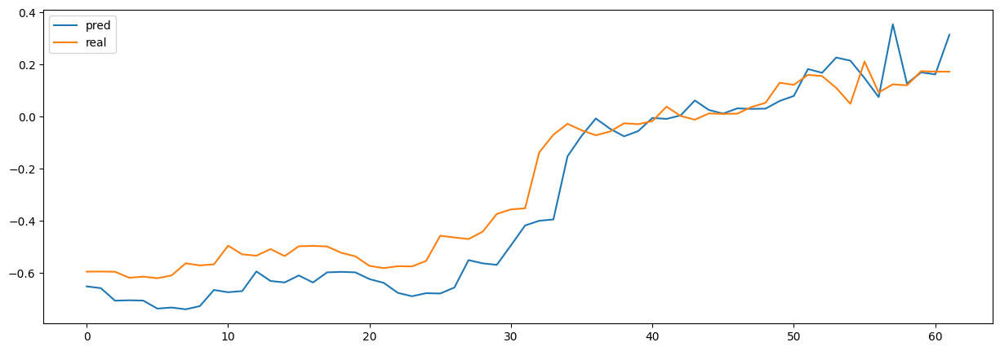

In [7]:
test_df.plot(figsize=(15,5))